In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns


from sklearn.datasets import make_blobs
from sklearn.metrics import f1_score,accuracy_score
from sklearn.metrics import precision_score, recall_score, confusion_matrix, classification_report
from sklearn.metrics import matthews_corrcoef,cohen_kappa_score,balanced_accuracy_score


import lightgbm as lgb
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.neighbors import KNeighborsClassifier
import xgboost as xgb
from catboost import CatBoostClassifier

from modAL.models import ActiveLearner, Committee
from modAL.uncertainty import uncertainty_sampling
from functools import partial
from modAL.batch import uncertainty_batch_sampling

import warnings

warnings.filterwarnings('ignore')

In [2]:
float_cd='PR_PF_6901272'
data_source="./dataset/"+float_cd+".csv"
data= pd.read_csv(data_source)
data

,Date,Latitude,longitude,Pressure,Salinity,Temperature,QC,label
0,-1.714302,-0.321241,0.754558,-1.220556,1.892667,1.781967,0,0
1,-1.714302,-0.321241,0.754558,-1.205072,1.894667,1.779675,0,0
2,-1.714302,-0.321241,0.754558,-1.189588,1.926672,1.777248,0,0
3,-1.714302,-0.321241,0.754558,-1.174104,2.050690,1.768350,0,0
4,-1.714302,-0.321241,0.754558,-1.158620,2.062692,1.765923,0,0
...,...,...,...,...,...,...,...,...
15097,1.705768,0.282459,-2.386156,-1.240686,2.032687,2.002270,5,1
15098,1.705768,0.282459,-2.386156,-1.239137,2.030687,2.002674,4,1
15099,1.705768,0.282459,-2.386156,-1.237589,2.030687,2.002809,4,1
15100,1.705768,0.282459,-2.386156,-1.236040,2.032687,2.002809,4,1


In [3]:
row,col=data.shape

In [4]:
#def compute ratio
def comp_ratio(data):
    instance = data[(data['QC']==0)]
    rate=len(instance)/len(data)*100
    print(rate)
    return rate

In [5]:
dirty_ratio = 100-comp_ratio(data)
dirty_ratio

94.07363263143954


5.926367368560463

In [6]:
data['QC'].unique()
# num_values = len()

array([0, 5, 4])

In [7]:
data.columns

Index(['Date', 'Latitude', 'longitude', 'Pressure', 'Salinity', 'Temperature',
       'QC', 'label'],
      dtype='object')

In [8]:
def plotCluster(data,name1,name2,name3,start,end):   
    %matplotlib notebook

    data1=data.loc[data['QC'] == 0]

    x1 = data1.loc[:,[name1]].iloc[start:end, :]  
    y1 = data1.loc[:,[name2]].iloc[start:end, :]  
    z1 = data1.loc[:,[name3]].iloc[start:end, :]  


    data2=data.loc[data['QC'] == 3]

    x2 = data2.loc[:,[name1]].iloc[start:end, :]  
    y2 = data2.loc[:,[name2]].iloc[start:end, :]  
    z2 = data2.loc[:,[name3]].iloc[start:end, :]  
    
    
    
    data3=data.loc[data['QC'] == 4]

    x3 = data3.loc[:,[name1]].iloc[start:end, :]  
    y3 = data3.loc[:,[name2]].iloc[start:end, :]  
    z3 = data3.loc[:,[name3]].iloc[start:end, :]  
    
    data4=data.loc[data['QC'] == 5]

    x4 = data4.loc[:,[name1]].iloc[start:end, :]  
    y4 = data4.loc[:,[name2]].iloc[start:end, :]  
    z4 = data4.loc[:,[name3]].iloc[start:end, :]  
    

    fig = plt.figure()
    ax = fig.add_subplot(projection="3d")
    ax.scatter(x1, y1, z1, c='y',s=0.01, label='Normal Data')
    ax.scatter(x2, y2, z2, c='g',s=10, label='PRES')
    ax.scatter(x3, y3, z3, c='b',s=10, label='PSAL')
    ax.scatter(x4, y4, z4, c='r',s=10, label='TEMP')
    
    ax.legend(loc='best')

    ax.set_zlabel(name1, fontdict={'size': 15, 'color': 'black'})
    ax.set_ylabel(name2, fontdict={'size': 15, 'color': 'black'})
    ax.set_xlabel(name3, fontdict={'size': 15, 'color': 'black'})
    plt.show()
    plt.savefig('./image/'+float_cd+'_scatter.png')
    


In [9]:
# dataplot=data.copy()

# plotCluster(dataplot,"Temperature","Pressure","Salinity",0,data.shape[0])

# Splite Dataset

In [10]:
train_set=pd.read_csv('./randomtrain/'+float_cd+'.csv')
test_set=pd.read_csv('./randomtest/'+float_cd+'.csv')
len(train_set),len(test_set)

(10571, 4531)

In [11]:
comp_ratio(train_set)
comp_ratio(test_set)

94.07813830290416
94.063120723902


94.063120723902

In [12]:
#this function use random grid search to find best parameters
def getPar(model,dist,data,niter):
    import numpy as np
    import pandas as pd
    from sklearn.model_selection import RandomizedSearchCV
    x,y=data.shape

    clf = model

    param_dist = dist
    grid = RandomizedSearchCV(clf,param_dist,cv = 3,scoring = "balanced_accuracy",n_iter=niter,n_jobs = -1)

    #train
    grid.fit(data.iloc[:,0:y-1],data.iloc[:,y-1])
    #get best parameter
    print(grid.best_score_)
    return grid.best_params_

In [13]:
# metric
def computeMetric(y_tru,y_pre):
    acc = accuracy_score(y_tru,y_pre)
    pre=precision_score(y_tru,y_pre,average='macro')
    recall=recall_score(y_tru,y_pre,average='macro')
    cm=confusion_matrix(y_tru,y_pre)
    f1 = f1_score(y_tru,y_pre,average='macro')
    mcc=matthews_corrcoef(y_tru, y_pre)
    kappa=cohen_kappa_score(y_tru, y_pre)
    bac=balanced_accuracy_score(y_tru,y_pre)
    print("acc:",acc)
    print("precision:",pre)
    print("recall:",recall)
    print("cm:",cm)
    print("f1:",f1)
    print("balanced acc:",bac)
    print("MCC:", mcc)
    print("Kappa:",kappa)
    
    #confusion matrix
    cmap1 = sns.diverging_palette(260,-10,s=50, l=75, n=5, as_cmap=True)
    plt.subplots(figsize=(12,8))
    cf_matrix = confusion_matrix(y_tru, y_pre)
    sns.heatmap(cf_matrix/np.sum(cf_matrix), cmap = cmap1, annot = True, annot_kws = {'size':15})
    
    return f1

In [14]:
def draw(performance_history):
    fig, ax = plt.subplots(figsize=(8.5, 6), dpi=130)
    ax.plot(performance_history)
    ax.scatter(range(len(performance_history)), performance_history, s=13)
    ax.xaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=5, integer=True))
    ax.yaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=10))
    ax.yaxis.set_major_formatter(mpl.ticker.PercentFormatter(xmax=1))
    ax.set_ylim(bottom=0, top=1)
    ax.grid(True)
    ax.set_title('Incremental classification accuracy')
    ax.set_xlabel('Query iteration')
    ax.set_ylabel('Classification Accuracy')
    plt.show()

# splite train(pool), test, Labeled, Unlabeled

In [15]:
x,y=train_set.shape ##no qc
#pool 
X_Pool = train_set.iloc[:,0:y-2].values
y_Pool = train_set.iloc[:,y-1].values

In [16]:
#test set
X_test=test_set.iloc[:,0:y-2]
y_tru=test_set.iloc[:,y-1]
print(len(X_test),len(y_tru))

4531 4531


In [17]:
#Pool
def initial_data(n_initial,X_Pool,y_Pool):
    #inital
    initial_idx = np.random.choice(range(len(X_Pool)), size=n_initial, replace=False)
    #initial Labeled data
    #X_initial, y_initial = X_train[], y_train[initial_idx]
    X_L = X_Pool[initial_idx]
    y_L = y_Pool[initial_idx]
    # Unlabeled data
    # X_U = Pool_X[ini_num:]
    # y_U = Pool_X[ini_num:]
    X_U, y_U = np.delete(X_Pool, initial_idx, axis=0), np.delete(y_Pool, initial_idx, axis=0)
    return X_L,y_L,X_U,y_U

In [18]:
# Set RNG seed for reproducibility.
RANDOM_STATE_SEED = 123
np.random.seed(RANDOM_STATE_SEED)

#n_initial= 1000
n_initial = 1000
N_QUERIES = 200

In [19]:
# X_initial,y_initial,X_re,y_re=initial_data(n_initial,X_Pool,y_Pool)
# df_X_i = pd.DataFrame(X_initial)
# df_y_i = pd.DataFrame(y_initial)
# df_X_r = pd.DataFrame(X_re)
# df_y_r = pd.DataFrame(y_re)




X_initial=pd.read_csv('./randomtrain/'+float_cd+'_X_initial.csv').values
y_initial=pd.read_csv('./randomtrain/'+float_cd+'_y_initial.csv').values.ravel()
X_re=pd.read_csv('./randomtrain/'+float_cd+'_X_re.csv').values
y_re=pd.read_csv('./randomtrain/'+float_cd+'_y_re.csv').values.ravel()
print(X_re.shape,X_initial.shape)
print(y_re.shape,y_initial.shape)

(10471, 6) (100, 6)
(10471,) (100,)


In [20]:
# df_X_i.to_csv('./randomtrain/'+float_cd+'_X_initial.csv', index=False)
# df_y_i.to_csv('./randomtrain/'+float_cd+'_y_initial.csv', index=False)
# df_X_r.to_csv('./randomtrain/'+float_cd+'_X_re.csv', index=False)
# df_y_r.to_csv('./randomtrain/'+float_cd+'_y_re.csv', index=False)

# molAL

In [21]:
def random_sampling(classifier, X_pool):
    n_samples = len(X_pool)
    query_idx = np.random.choice(range(n_samples))
    return query_idx, X_pool[query_idx]

In [22]:
def al(clf,strategy,X_L,y_L):
    learner = ActiveLearner(estimator=clf,
                            query_strategy=strategy,
                            X_training=X_L, y_training=y_L)
    return learner

In [23]:
def al_learn(clf,sampling,X_initial,y_initial,X_re,y_re):
    X_L = X_initial.copy()
    y_L = y_initial.copy()
    X_U,y_U =X_re.copy(),y_re.copy()
    #print(len(X_U),len(y_U))
    learner = al(clf,sampling,X_L,y_L)
    y_pre=learner.predict(X_test)
    unqueried_kappa=cohen_kappa_score(y_tru, y_pre)
    unqueried_f1=f1_score(y_tru,y_pre)
    #print("unqueried --------------------->",unqueried_score)
    kappa_history = [unqueried_kappa]
    f1_history = [unqueried_f1]
    y_L_2 = y_L.tolist()
    y_L_2 = np.array(y_L_2).reshape((-1, 1))
    queried_instance = np.concatenate((X_L, y_L_2), axis=1)

    # Query
    for index in range(N_QUERIES):
        query_index, query_instance = learner.query(X_U)
        # Teach ActiveLearner model the record it has requested.
        X, y = X_U[query_index].reshape(1, -1), y_U[query_index].reshape(1, )
        #print(X.flatten(), y)
        instance = np.concatenate((X.flatten(), y))
        #print(index+1,"query instance --------------------->",instance)
        learner.teach(X=X, y=y)
        
        X_U, y_U = np.delete(X_U, query_index, axis=0), np.delete(y_U, query_index)
        y_pre=learner.predict(X_test)
        kappa=cohen_kappa_score(y_tru, y_pre)
        f1=f1_score(y_tru,y_pre)
        print(index+1,"-------------------->",kappa)
        print(index+1,"-------------------->",f1)
        # Recall precision F1
        kappa_history.append(kappa)
        f1_history.append(f1)
        queried_instance = np.vstack((queried_instance, instance))

    #print(query_history)
    df_scores= pd.concat([pd.DataFrame(kappa_history,columns=['kappa']), 
                          pd.DataFrame(f1_history,columns=['f1'])],
                         axis=1)
    df_instance = pd.DataFrame(data=queried_instance, columns=['Date','Latitude','longitude','Pressure','Salinity','Temperature','Label'])
    #print(df_instance)
    return df_scores, df_instance 
#     return f1_history


1.0
{'n_neighbors': 1}
acc: 0.9838887662767601
precision: 0.9260381130616135
recall: 0.9304862369796891
cm: [[4224   38]
 [  35  234]]
f1: 0.9282488127082358
balanced acc: 0.9304862369796891
MCC: 0.8565127999086092
Kappa: 0.8564979055808515


0.9282488127082358

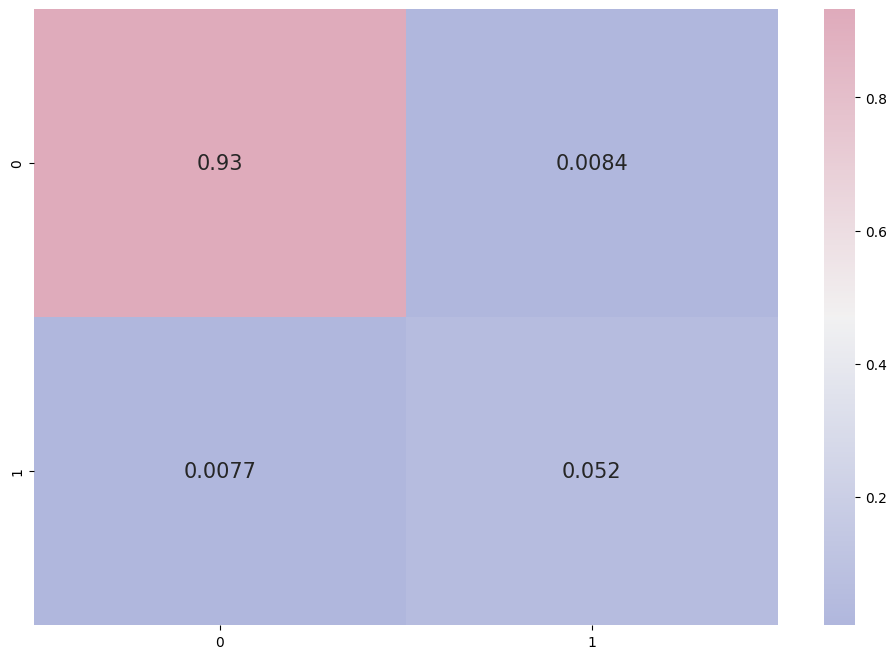

In [24]:
# clf1 KNN
clf1 = KNeighborsClassifier()
dic1={'n_neighbors':[1,2,3,4,5,6,7,8]}
para1=getPar(clf1,dic1,test_set,10)
print(para1)
clf1 = KNeighborsClassifier(n_neighbors=para1['n_neighbors'],n_jobs=-1)
clf1.fit(X_Pool, y_Pool)
y_pre=clf1.predict(X_test)
computeMetric(y_tru,y_pre)

0.9981481481481481
acc: 0.9997792981681748
precision: 0.9998827117053718
recall: 0.9981412639405205
cm: [[4262    0]
 [   1  268]]
f1: 0.9990102502771452
balanced acc: 0.9981412639405205
MCC: 0.998022456322359
Kappa: 0.9980205009866914


0.9990102502771452

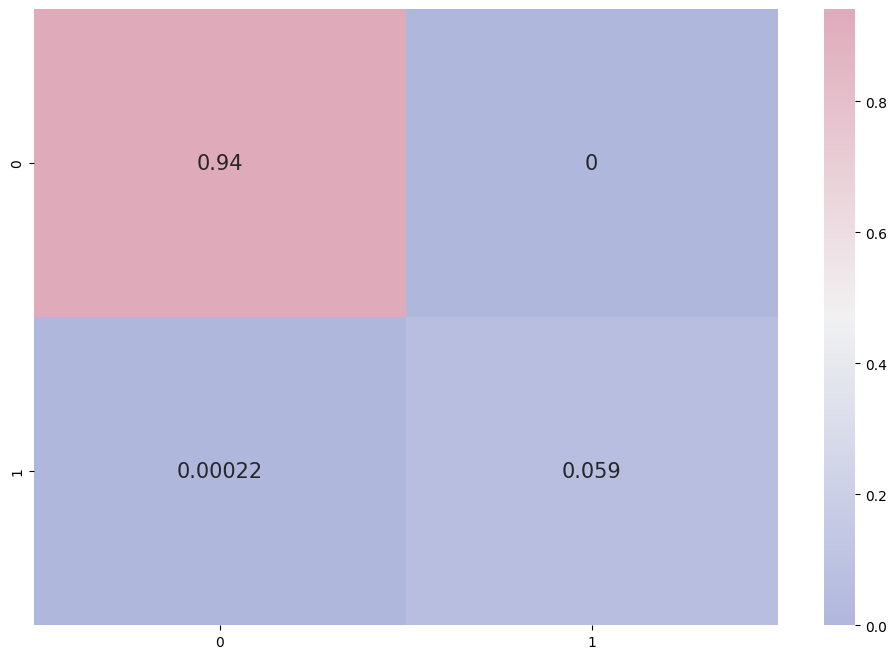

In [25]:
# clf2 lightgbm
clf2 = lgb.LGBMClassifier()

dic2 = {'learning_rate' : [0.01, 0.02, 0.03, 0.04, 0.05, 0.08, 0.1, 0.2, 0.3, 0.4],
              'n_estimators' : [100, 200, 300, 400, 500, 600, 800, 900, 1000, 1500, 2000],
              'num_leaves': range(6, 50), 
              'min_child_samples': range(10, 200, 10), 
              'min_child_weight': [1e-5, 1e-3, 1e-2, 1e-1, 1, 1e1, 1e2, 1e3, 1e4],
              'max_depth': [-1, 1, 2, 3, 4, 5, 6, 7],
              'reg_alpha': [0, 1e-1, 1, 2, 5, 7, 10, 50, 100],
              'reg_lambda': [0, 1e-1, 1, 5, 10, 20, 50, 100]}
para2=getPar(clf2,dic2,test_set,10)

    
clf2 = lgb.LGBMClassifier(boosting_type='gbdt',
                          #objective='multiclass',
                          num_leaves=para2['num_leaves'], max_depth=-1, 
                              learning_rate=para2['learning_rate'], n_estimators=para2['n_estimators'], 
                              subsample_for_bin=200000, class_weight=None, min_split_gain=0.0, 
                              min_child_weight=para2['min_child_weight'],
                              min_child_samples=para2['min_child_samples'], 
                              subsample=1.0, 
                              subsample_freq=0, colsample_bytree=1.0, reg_alpha=para2['reg_alpha'], 
                              reg_lambda=para2['reg_lambda'], random_state=None, n_jobs=-1, importance_type='split')
clf2.fit(X_Pool, y_Pool)
y_pre=clf2.predict(X_test)
computeMetric(y_tru,y_pre)

1.0
acc: 0.9997792981681748
precision: 0.9998827117053718
recall: 0.9981412639405205
cm: [[4262    0]
 [   1  268]]
f1: 0.9990102502771452
balanced acc: 0.9981412639405205
MCC: 0.998022456322359
Kappa: 0.9980205009866914


0.9990102502771452

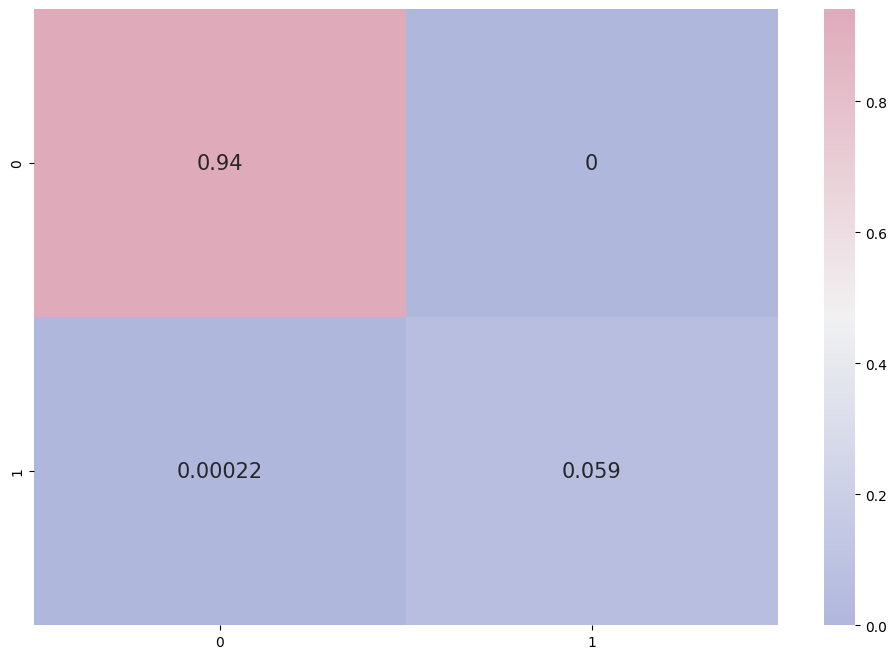

In [26]:
#XGBOOST
clf3 = xgb.XGBClassifier()
dic3 = {'n_estimators':range(80,2000,4),
        'max_depth':range(2,15,1),
        'learning_rate':np.linspace(0.01,2,20),
        'subsample':np.linspace(0.7,0.9,20),
        'colsample_bytree':np.linspace(0.5,0.98,10)
        }
para3=getPar(clf3,dic3,test_set,10)
clf3 = xgb.XGBClassifier(booster='gbtree',n_estimators=para3['n_estimators'], learning_rate=para3['learning_rate'],
                    max_depth=para3['max_depth'],subsample=para3['subsample'],
                    colsample_bytree=para3['colsample_bytree'],
                         #objective='multi:softprob',
                    n_jobs=-1)
clf3.fit(X_Pool, y_Pool)
y_pre=clf3.predict(X_test)
computeMetric(y_tru,y_pre)

Learning rate set to 0.028199
0:	learn: 0.6019736	total: 58.8ms	remaining: 58.8s
1:	learn: 0.5204237	total: 63ms	remaining: 31.4s
2:	learn: 0.4498865	total: 66.6ms	remaining: 22.1s
3:	learn: 0.3897870	total: 70.9ms	remaining: 17.6s
4:	learn: 0.3361169	total: 74.9ms	remaining: 14.9s
5:	learn: 0.2866583	total: 78.9ms	remaining: 13.1s
6:	learn: 0.2478559	total: 83ms	remaining: 11.8s
7:	learn: 0.2124579	total: 87.2ms	remaining: 10.8s
8:	learn: 0.1834523	total: 91ms	remaining: 10s
9:	learn: 0.1614569	total: 95.3ms	remaining: 9.44s
10:	learn: 0.1399589	total: 99.4ms	remaining: 8.93s
11:	learn: 0.1220672	total: 104ms	remaining: 8.53s
12:	learn: 0.1066848	total: 108ms	remaining: 8.17s
13:	learn: 0.0929844	total: 112ms	remaining: 7.87s
14:	learn: 0.0814919	total: 116ms	remaining: 7.61s
15:	learn: 0.0704999	total: 121ms	remaining: 7.42s
16:	learn: 0.0623371	total: 125ms	remaining: 7.22s
17:	learn: 0.0558183	total: 129ms	remaining: 7.03s
18:	learn: 0.0497974	total: 134ms	remaining: 6.89s
19:	lear

172:	learn: 0.0006032	total: 789ms	remaining: 3.77s
173:	learn: 0.0005984	total: 794ms	remaining: 3.77s
174:	learn: 0.0005932	total: 798ms	remaining: 3.76s
175:	learn: 0.0005895	total: 802ms	remaining: 3.75s
176:	learn: 0.0005846	total: 806ms	remaining: 3.75s
177:	learn: 0.0005751	total: 811ms	remaining: 3.74s
178:	learn: 0.0005705	total: 817ms	remaining: 3.75s
179:	learn: 0.0005644	total: 823ms	remaining: 3.75s
180:	learn: 0.0005602	total: 829ms	remaining: 3.75s
181:	learn: 0.0005579	total: 835ms	remaining: 3.75s
182:	learn: 0.0005512	total: 841ms	remaining: 3.76s
183:	learn: 0.0005442	total: 848ms	remaining: 3.76s
184:	learn: 0.0005379	total: 853ms	remaining: 3.76s
185:	learn: 0.0005320	total: 859ms	remaining: 3.76s
186:	learn: 0.0005252	total: 865ms	remaining: 3.76s
187:	learn: 0.0005177	total: 872ms	remaining: 3.77s
188:	learn: 0.0005107	total: 878ms	remaining: 3.77s
189:	learn: 0.0005075	total: 884ms	remaining: 3.77s
190:	learn: 0.0005034	total: 889ms	remaining: 3.77s
191:	learn: 

341:	learn: 0.0001739	total: 1.58s	remaining: 3.04s
342:	learn: 0.0001727	total: 1.58s	remaining: 3.03s
343:	learn: 0.0001727	total: 1.58s	remaining: 3.02s
344:	learn: 0.0001719	total: 1.59s	remaining: 3.02s
345:	learn: 0.0001709	total: 1.59s	remaining: 3.02s
346:	learn: 0.0001706	total: 1.6s	remaining: 3.01s
347:	learn: 0.0001698	total: 1.6s	remaining: 3s
348:	learn: 0.0001688	total: 1.61s	remaining: 3s
349:	learn: 0.0001681	total: 1.61s	remaining: 2.99s
350:	learn: 0.0001672	total: 1.61s	remaining: 2.99s
351:	learn: 0.0001672	total: 1.62s	remaining: 2.98s
352:	learn: 0.0001664	total: 1.62s	remaining: 2.97s
353:	learn: 0.0001652	total: 1.63s	remaining: 2.97s
354:	learn: 0.0001643	total: 1.63s	remaining: 2.96s
355:	learn: 0.0001643	total: 1.63s	remaining: 2.95s
356:	learn: 0.0001640	total: 1.64s	remaining: 2.95s
357:	learn: 0.0001630	total: 1.64s	remaining: 2.94s
358:	learn: 0.0001624	total: 1.65s	remaining: 2.94s
359:	learn: 0.0001623	total: 1.65s	remaining: 2.93s
360:	learn: 0.000162

509:	learn: 0.0001394	total: 2.17s	remaining: 2.08s
510:	learn: 0.0001394	total: 2.17s	remaining: 2.08s
511:	learn: 0.0001394	total: 2.17s	remaining: 2.07s
512:	learn: 0.0001390	total: 2.18s	remaining: 2.07s
513:	learn: 0.0001385	total: 2.18s	remaining: 2.06s
514:	learn: 0.0001385	total: 2.18s	remaining: 2.06s
515:	learn: 0.0001385	total: 2.19s	remaining: 2.05s
516:	learn: 0.0001380	total: 2.19s	remaining: 2.05s
517:	learn: 0.0001380	total: 2.19s	remaining: 2.04s
518:	learn: 0.0001380	total: 2.2s	remaining: 2.04s
519:	learn: 0.0001379	total: 2.2s	remaining: 2.03s
520:	learn: 0.0001377	total: 2.2s	remaining: 2.03s
521:	learn: 0.0001377	total: 2.21s	remaining: 2.02s
522:	learn: 0.0001377	total: 2.21s	remaining: 2.02s
523:	learn: 0.0001373	total: 2.21s	remaining: 2.01s
524:	learn: 0.0001373	total: 2.22s	remaining: 2s
525:	learn: 0.0001373	total: 2.22s	remaining: 2s
526:	learn: 0.0001369	total: 2.22s	remaining: 2s
527:	learn: 0.0001369	total: 2.23s	remaining: 1.99s
528:	learn: 0.0001369	to

725:	learn: 0.0001230	total: 2.95s	remaining: 1.11s
726:	learn: 0.0001230	total: 2.95s	remaining: 1.11s
727:	learn: 0.0001230	total: 2.95s	remaining: 1.1s
728:	learn: 0.0001230	total: 2.96s	remaining: 1.1s
729:	learn: 0.0001230	total: 2.96s	remaining: 1.09s
730:	learn: 0.0001230	total: 2.96s	remaining: 1.09s
731:	learn: 0.0001230	total: 2.97s	remaining: 1.09s
732:	learn: 0.0001230	total: 2.97s	remaining: 1.08s
733:	learn: 0.0001230	total: 2.97s	remaining: 1.08s
734:	learn: 0.0001230	total: 2.98s	remaining: 1.07s
735:	learn: 0.0001230	total: 2.98s	remaining: 1.07s
736:	learn: 0.0001230	total: 2.98s	remaining: 1.06s
737:	learn: 0.0001230	total: 2.99s	remaining: 1.06s
738:	learn: 0.0001230	total: 2.99s	remaining: 1.06s
739:	learn: 0.0001230	total: 2.99s	remaining: 1.05s
740:	learn: 0.0001230	total: 3s	remaining: 1.05s
741:	learn: 0.0001230	total: 3s	remaining: 1.04s
742:	learn: 0.0001230	total: 3s	remaining: 1.04s
743:	learn: 0.0001230	total: 3.01s	remaining: 1.03s
744:	learn: 0.0001230	t

903:	learn: 0.0001230	total: 3.53s	remaining: 375ms
904:	learn: 0.0001229	total: 3.53s	remaining: 371ms
905:	learn: 0.0001230	total: 3.54s	remaining: 367ms
906:	learn: 0.0001230	total: 3.54s	remaining: 363ms
907:	learn: 0.0001230	total: 3.54s	remaining: 359ms
908:	learn: 0.0001230	total: 3.55s	remaining: 355ms
909:	learn: 0.0001230	total: 3.55s	remaining: 351ms
910:	learn: 0.0001230	total: 3.55s	remaining: 347ms
911:	learn: 0.0001230	total: 3.56s	remaining: 343ms
912:	learn: 0.0001230	total: 3.56s	remaining: 339ms
913:	learn: 0.0001230	total: 3.56s	remaining: 335ms
914:	learn: 0.0001230	total: 3.56s	remaining: 331ms
915:	learn: 0.0001230	total: 3.57s	remaining: 327ms
916:	learn: 0.0001229	total: 3.57s	remaining: 323ms
917:	learn: 0.0001230	total: 3.57s	remaining: 319ms
918:	learn: 0.0001230	total: 3.58s	remaining: 315ms
919:	learn: 0.0001230	total: 3.58s	remaining: 311ms
920:	learn: 0.0001230	total: 3.58s	remaining: 307ms
921:	learn: 0.0001229	total: 3.59s	remaining: 303ms
922:	learn: 

0.9990102502771452

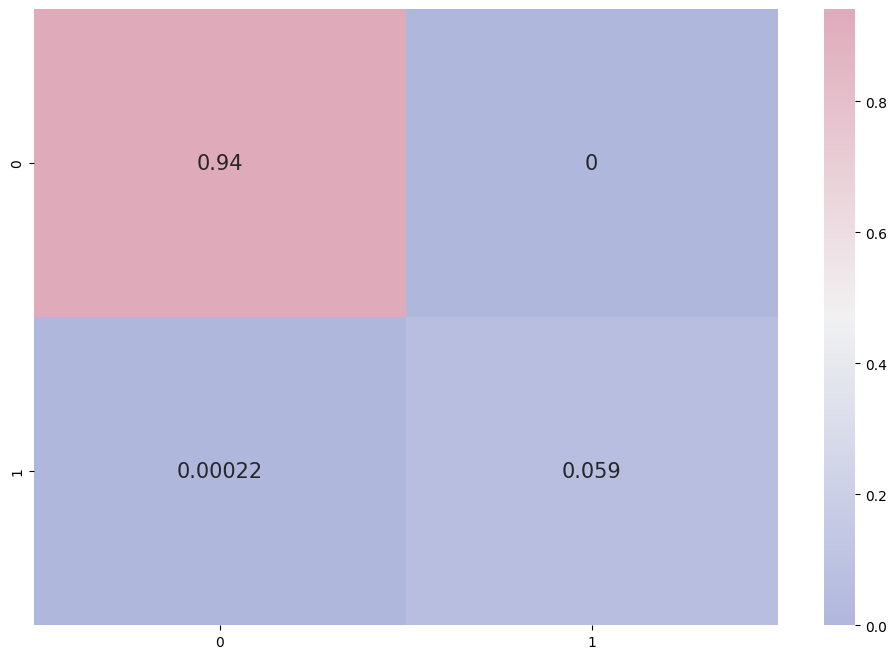

In [27]:
#clf4 catboost
clf4 = CatBoostClassifier(loss_function='Logloss')
# dic4 = {'learning_rate': [0.03, 0.1],
#         'depth': [4, 6, 10],
#         'l2_leaf_reg': [1, 3, 5, 7, 9]}
# #para3=getPar(clf4,dic4,test_set,10)

# grid_search_result = clf4.grid_search(dic4, 
#                                        X=X_Pool, 
#                                        y=y_Pool)

clf4.fit(X_Pool, y_Pool)
y_pre=clf4.predict(X_test)
computeMetric(y_tru,y_pre)

## random sampling

In [28]:
sampling=random_sampling

In [ ]:
metric01,instance01 = al_learn(clf1,sampling,X_initial,y_initial,X_re,y_re)
instance01.to_csv("./query/random_Knn_"+float_cd+".csv")

In [ ]:
metric02,instance02 = al_learn(clf2,sampling,X_initial,y_initial,X_re,y_re)
instance02.to_csv("./query/random_Lg_"+float_cd+".csv")

In [ ]:
metric03,instance03= al_learn(clf3,sampling,X_initial,y_initial,X_re,y_re)
instance03.to_csv("./query/random_XB_"+float_cd+".csv")

In [ ]:
metric04,instance04= al_learn(clf4,sampling,X_initial,y_initial,X_re,y_re)
instance04.to_csv("./query/random_CB_"+float_cd+".csv")

## Uncertainty

In [33]:
sampling=uncertainty_sampling

In [ ]:
metric11,instance11 = al_learn(clf1,sampling,X_initial,y_initial,X_re,y_re)
instance11.to_csv("./query/Un_Knn_"+float_cd+".csv")

In [ ]:
metric12,instance12 = al_learn(clf2,sampling,X_initial,y_initial,X_re,y_re)
instance12.to_csv("./query/Un_Lg_"+float_cd+".csv")

In [ ]:
metric13,instance13 = al_learn(clf3,sampling,X_initial,y_initial,X_re,y_re)
instance13.to_csv("./query/Un_XB_"+float_cd+".csv")

In [37]:
metric14,instance14 = al_learn(clf4,sampling,X_initial,y_initial,X_re,y_re)
instance14.to_csv("./query/Un_CB_"+float_cd+".csv")

Learning rate set to 0.003854
0:	learn: 0.6853439	total: 1.98ms	remaining: 1.98s
1:	learn: 0.6799080	total: 3.25ms	remaining: 1.62s
2:	learn: 0.6740748	total: 4.67ms	remaining: 1.55s
3:	learn: 0.6683112	total: 5.66ms	remaining: 1.41s
4:	learn: 0.6624788	total: 6.63ms	remaining: 1.32s
5:	learn: 0.6588631	total: 7.63ms	remaining: 1.26s
6:	learn: 0.6528271	total: 8.64ms	remaining: 1.23s
7:	learn: 0.6465627	total: 9.48ms	remaining: 1.18s
8:	learn: 0.6407413	total: 10.5ms	remaining: 1.15s
9:	learn: 0.6355907	total: 11.5ms	remaining: 1.14s
10:	learn: 0.6302812	total: 12.6ms	remaining: 1.13s
11:	learn: 0.6256635	total: 13.5ms	remaining: 1.11s
12:	learn: 0.6196570	total: 14.4ms	remaining: 1.09s
13:	learn: 0.6152802	total: 15.6ms	remaining: 1.09s
14:	learn: 0.6101451	total: 16.6ms	remaining: 1.09s
15:	learn: 0.6050122	total: 17.3ms	remaining: 1.07s
16:	learn: 0.5996200	total: 18.5ms	remaining: 1.07s
17:	learn: 0.5941521	total: 34.3ms	remaining: 1.87s
18:	learn: 0.5881834	total: 35.3ms	remaining

191:	learn: 0.1573505	total: 180ms	remaining: 759ms
192:	learn: 0.1563384	total: 182ms	remaining: 759ms
193:	learn: 0.1554062	total: 183ms	remaining: 760ms
194:	learn: 0.1544814	total: 184ms	remaining: 760ms
195:	learn: 0.1534169	total: 185ms	remaining: 759ms
196:	learn: 0.1523361	total: 186ms	remaining: 757ms
197:	learn: 0.1512087	total: 187ms	remaining: 755ms
198:	learn: 0.1502136	total: 187ms	remaining: 754ms
199:	learn: 0.1491805	total: 188ms	remaining: 752ms
200:	learn: 0.1483826	total: 189ms	remaining: 750ms
201:	learn: 0.1475623	total: 190ms	remaining: 749ms
202:	learn: 0.1467136	total: 191ms	remaining: 749ms
203:	learn: 0.1457257	total: 192ms	remaining: 748ms
204:	learn: 0.1448433	total: 193ms	remaining: 748ms
205:	learn: 0.1439944	total: 194ms	remaining: 746ms
206:	learn: 0.1432044	total: 194ms	remaining: 745ms
207:	learn: 0.1423562	total: 195ms	remaining: 743ms
208:	learn: 0.1415629	total: 196ms	remaining: 742ms
209:	learn: 0.1404138	total: 196ms	remaining: 739ms
210:	learn: 

416:	learn: 0.0513932	total: 362ms	remaining: 506ms
417:	learn: 0.0511701	total: 363ms	remaining: 505ms
418:	learn: 0.0509868	total: 363ms	remaining: 504ms
419:	learn: 0.0508178	total: 364ms	remaining: 503ms
420:	learn: 0.0505630	total: 365ms	remaining: 502ms
421:	learn: 0.0504118	total: 366ms	remaining: 501ms
422:	learn: 0.0501831	total: 366ms	remaining: 500ms
423:	learn: 0.0499881	total: 367ms	remaining: 499ms
424:	learn: 0.0497898	total: 368ms	remaining: 498ms
425:	learn: 0.0494873	total: 369ms	remaining: 497ms
426:	learn: 0.0492448	total: 369ms	remaining: 496ms
427:	learn: 0.0490421	total: 370ms	remaining: 495ms
428:	learn: 0.0489339	total: 371ms	remaining: 494ms
429:	learn: 0.0487541	total: 372ms	remaining: 493ms
430:	learn: 0.0484743	total: 372ms	remaining: 492ms
431:	learn: 0.0482747	total: 373ms	remaining: 491ms
432:	learn: 0.0481046	total: 374ms	remaining: 490ms
433:	learn: 0.0478407	total: 375ms	remaining: 489ms
434:	learn: 0.0477092	total: 375ms	remaining: 488ms
435:	learn: 

645:	learn: 0.0249079	total: 542ms	remaining: 297ms
646:	learn: 0.0248350	total: 543ms	remaining: 296ms
647:	learn: 0.0247725	total: 544ms	remaining: 296ms
648:	learn: 0.0247027	total: 545ms	remaining: 295ms
649:	learn: 0.0246355	total: 546ms	remaining: 294ms
650:	learn: 0.0245842	total: 547ms	remaining: 293ms
651:	learn: 0.0245174	total: 548ms	remaining: 292ms
652:	learn: 0.0244413	total: 549ms	remaining: 291ms
653:	learn: 0.0243797	total: 549ms	remaining: 291ms
654:	learn: 0.0243215	total: 550ms	remaining: 290ms
655:	learn: 0.0242553	total: 551ms	remaining: 289ms
656:	learn: 0.0241889	total: 551ms	remaining: 288ms
657:	learn: 0.0240895	total: 552ms	remaining: 287ms
658:	learn: 0.0240432	total: 553ms	remaining: 286ms
659:	learn: 0.0239863	total: 554ms	remaining: 285ms
660:	learn: 0.0239397	total: 555ms	remaining: 284ms
661:	learn: 0.0238666	total: 555ms	remaining: 284ms
662:	learn: 0.0237966	total: 556ms	remaining: 283ms
663:	learn: 0.0237451	total: 557ms	remaining: 282ms
664:	learn: 

877:	learn: 0.0150450	total: 723ms	remaining: 100ms
878:	learn: 0.0150207	total: 724ms	remaining: 99.7ms
879:	learn: 0.0149959	total: 725ms	remaining: 98.8ms
880:	learn: 0.0149647	total: 726ms	remaining: 98ms
881:	learn: 0.0149409	total: 726ms	remaining: 97.2ms
882:	learn: 0.0149174	total: 727ms	remaining: 96.4ms
883:	learn: 0.0148899	total: 728ms	remaining: 95.5ms
884:	learn: 0.0148525	total: 729ms	remaining: 94.7ms
885:	learn: 0.0148170	total: 730ms	remaining: 93.9ms
886:	learn: 0.0148028	total: 730ms	remaining: 93ms
887:	learn: 0.0147712	total: 731ms	remaining: 92.2ms
888:	learn: 0.0147442	total: 732ms	remaining: 91.4ms
889:	learn: 0.0147190	total: 733ms	remaining: 90.6ms
890:	learn: 0.0146986	total: 733ms	remaining: 89.7ms
891:	learn: 0.0146617	total: 734ms	remaining: 88.9ms
892:	learn: 0.0146299	total: 735ms	remaining: 88.1ms
893:	learn: 0.0146076	total: 736ms	remaining: 87.2ms
894:	learn: 0.0145847	total: 737ms	remaining: 86.4ms
895:	learn: 0.0145567	total: 737ms	remaining: 85.6m

156:	learn: 0.1982261	total: 126ms	remaining: 675ms
157:	learn: 0.1964345	total: 127ms	remaining: 677ms
158:	learn: 0.1951813	total: 128ms	remaining: 676ms
159:	learn: 0.1938351	total: 129ms	remaining: 675ms
160:	learn: 0.1923516	total: 129ms	remaining: 674ms
161:	learn: 0.1908822	total: 130ms	remaining: 672ms
162:	learn: 0.1894023	total: 131ms	remaining: 672ms
163:	learn: 0.1883802	total: 132ms	remaining: 673ms
164:	learn: 0.1874281	total: 134ms	remaining: 676ms
165:	learn: 0.1863395	total: 134ms	remaining: 676ms
166:	learn: 0.1851156	total: 135ms	remaining: 675ms
167:	learn: 0.1838361	total: 137ms	remaining: 678ms
168:	learn: 0.1822729	total: 138ms	remaining: 680ms
169:	learn: 0.1810460	total: 139ms	remaining: 679ms
170:	learn: 0.1796709	total: 140ms	remaining: 678ms
171:	learn: 0.1786805	total: 141ms	remaining: 677ms
172:	learn: 0.1776746	total: 141ms	remaining: 676ms
173:	learn: 0.1764956	total: 142ms	remaining: 675ms
174:	learn: 0.1755154	total: 143ms	remaining: 674ms
175:	learn: 

355:	learn: 0.0637407	total: 304ms	remaining: 549ms
356:	learn: 0.0634306	total: 305ms	remaining: 549ms
357:	learn: 0.0630063	total: 306ms	remaining: 548ms
358:	learn: 0.0627532	total: 307ms	remaining: 548ms
359:	learn: 0.0624904	total: 308ms	remaining: 547ms
360:	learn: 0.0622238	total: 308ms	remaining: 546ms
361:	learn: 0.0619683	total: 309ms	remaining: 545ms
362:	learn: 0.0617374	total: 310ms	remaining: 544ms
363:	learn: 0.0615056	total: 311ms	remaining: 544ms
364:	learn: 0.0612553	total: 312ms	remaining: 543ms
365:	learn: 0.0610548	total: 313ms	remaining: 541ms
366:	learn: 0.0607598	total: 313ms	remaining: 540ms
367:	learn: 0.0606005	total: 314ms	remaining: 539ms
368:	learn: 0.0603360	total: 315ms	remaining: 538ms
369:	learn: 0.0601395	total: 315ms	remaining: 537ms
370:	learn: 0.0599684	total: 316ms	remaining: 536ms
371:	learn: 0.0597653	total: 317ms	remaining: 536ms
372:	learn: 0.0594943	total: 318ms	remaining: 535ms
373:	learn: 0.0592944	total: 319ms	remaining: 534ms
374:	learn: 

563:	learn: 0.0300097	total: 484ms	remaining: 374ms
564:	learn: 0.0299040	total: 486ms	remaining: 374ms
565:	learn: 0.0298139	total: 487ms	remaining: 373ms
566:	learn: 0.0296722	total: 487ms	remaining: 372ms
567:	learn: 0.0295388	total: 488ms	remaining: 371ms
568:	learn: 0.0294695	total: 489ms	remaining: 370ms
569:	learn: 0.0293946	total: 490ms	remaining: 369ms
570:	learn: 0.0293138	total: 491ms	remaining: 369ms
571:	learn: 0.0292172	total: 491ms	remaining: 368ms
572:	learn: 0.0291487	total: 492ms	remaining: 367ms
573:	learn: 0.0290687	total: 493ms	remaining: 366ms
574:	learn: 0.0289783	total: 494ms	remaining: 365ms
575:	learn: 0.0288859	total: 495ms	remaining: 364ms
576:	learn: 0.0288263	total: 496ms	remaining: 364ms
577:	learn: 0.0287575	total: 497ms	remaining: 363ms
578:	learn: 0.0286692	total: 498ms	remaining: 362ms
579:	learn: 0.0285406	total: 499ms	remaining: 361ms
580:	learn: 0.0284869	total: 500ms	remaining: 361ms
581:	learn: 0.0284131	total: 501ms	remaining: 360ms
582:	learn: 

770:	learn: 0.0180441	total: 665ms	remaining: 198ms
771:	learn: 0.0180170	total: 666ms	remaining: 197ms
772:	learn: 0.0179892	total: 667ms	remaining: 196ms
773:	learn: 0.0179631	total: 668ms	remaining: 195ms
774:	learn: 0.0179309	total: 670ms	remaining: 194ms
775:	learn: 0.0179064	total: 671ms	remaining: 194ms
776:	learn: 0.0178758	total: 672ms	remaining: 193ms
777:	learn: 0.0178373	total: 672ms	remaining: 192ms
778:	learn: 0.0178063	total: 673ms	remaining: 191ms
779:	learn: 0.0177763	total: 674ms	remaining: 190ms
780:	learn: 0.0177492	total: 675ms	remaining: 189ms
781:	learn: 0.0177096	total: 676ms	remaining: 188ms
782:	learn: 0.0176606	total: 676ms	remaining: 187ms
783:	learn: 0.0175958	total: 678ms	remaining: 187ms
784:	learn: 0.0175640	total: 679ms	remaining: 186ms
785:	learn: 0.0175353	total: 680ms	remaining: 185ms
786:	learn: 0.0175058	total: 680ms	remaining: 184ms
787:	learn: 0.0174717	total: 681ms	remaining: 183ms
788:	learn: 0.0174392	total: 682ms	remaining: 182ms
789:	learn: 

960:	learn: 0.0128810	total: 828ms	remaining: 33.6ms
961:	learn: 0.0128625	total: 829ms	remaining: 32.8ms
962:	learn: 0.0128471	total: 830ms	remaining: 31.9ms
963:	learn: 0.0128263	total: 831ms	remaining: 31ms
964:	learn: 0.0128034	total: 832ms	remaining: 30.2ms
965:	learn: 0.0127887	total: 833ms	remaining: 29.3ms
966:	learn: 0.0127639	total: 833ms	remaining: 28.4ms
967:	learn: 0.0127526	total: 834ms	remaining: 27.6ms
968:	learn: 0.0127342	total: 835ms	remaining: 26.7ms
969:	learn: 0.0127189	total: 836ms	remaining: 25.8ms
970:	learn: 0.0127040	total: 836ms	remaining: 25ms
971:	learn: 0.0126860	total: 837ms	remaining: 24.1ms
972:	learn: 0.0126718	total: 838ms	remaining: 23.3ms
973:	learn: 0.0126515	total: 839ms	remaining: 22.4ms
974:	learn: 0.0126241	total: 840ms	remaining: 21.5ms
975:	learn: 0.0126107	total: 841ms	remaining: 20.7ms
976:	learn: 0.0125848	total: 841ms	remaining: 19.8ms
977:	learn: 0.0125664	total: 842ms	remaining: 18.9ms
978:	learn: 0.0125534	total: 843ms	remaining: 18.1

137:	learn: 0.2213120	total: 108ms	remaining: 676ms
138:	learn: 0.2197901	total: 109ms	remaining: 677ms
139:	learn: 0.2179480	total: 110ms	remaining: 677ms
140:	learn: 0.2165633	total: 111ms	remaining: 677ms
141:	learn: 0.2151830	total: 112ms	remaining: 676ms
142:	learn: 0.2136639	total: 113ms	remaining: 675ms
143:	learn: 0.2124425	total: 113ms	remaining: 674ms
144:	learn: 0.2111489	total: 114ms	remaining: 673ms
145:	learn: 0.2097391	total: 115ms	remaining: 672ms
146:	learn: 0.2083050	total: 116ms	remaining: 670ms
147:	learn: 0.2072147	total: 116ms	remaining: 669ms
148:	learn: 0.2061173	total: 117ms	remaining: 668ms
149:	learn: 0.2046201	total: 118ms	remaining: 667ms
150:	learn: 0.2030681	total: 118ms	remaining: 666ms
151:	learn: 0.2018472	total: 119ms	remaining: 665ms
152:	learn: 0.2005066	total: 120ms	remaining: 664ms
153:	learn: 0.1994613	total: 121ms	remaining: 663ms
154:	learn: 0.1986739	total: 122ms	remaining: 663ms
155:	learn: 0.1970340	total: 123ms	remaining: 663ms
156:	learn: 

375:	learn: 0.0579677	total: 290ms	remaining: 481ms
376:	learn: 0.0577267	total: 291ms	remaining: 481ms
377:	learn: 0.0575083	total: 292ms	remaining: 480ms
378:	learn: 0.0572835	total: 292ms	remaining: 479ms
379:	learn: 0.0570983	total: 293ms	remaining: 479ms
380:	learn: 0.0568928	total: 294ms	remaining: 478ms
381:	learn: 0.0566688	total: 295ms	remaining: 477ms
382:	learn: 0.0564143	total: 296ms	remaining: 476ms
383:	learn: 0.0561955	total: 296ms	remaining: 475ms
384:	learn: 0.0559783	total: 297ms	remaining: 474ms
385:	learn: 0.0556932	total: 298ms	remaining: 474ms
386:	learn: 0.0554705	total: 298ms	remaining: 473ms
387:	learn: 0.0552076	total: 299ms	remaining: 472ms
388:	learn: 0.0549737	total: 300ms	remaining: 471ms
389:	learn: 0.0548043	total: 301ms	remaining: 471ms
390:	learn: 0.0545778	total: 302ms	remaining: 470ms
391:	learn: 0.0543459	total: 303ms	remaining: 470ms
392:	learn: 0.0541546	total: 303ms	remaining: 469ms
393:	learn: 0.0539305	total: 304ms	remaining: 468ms
394:	learn: 

605:	learn: 0.0267059	total: 471ms	remaining: 306ms
606:	learn: 0.0266572	total: 472ms	remaining: 306ms
607:	learn: 0.0265941	total: 473ms	remaining: 305ms
608:	learn: 0.0265295	total: 474ms	remaining: 304ms
609:	learn: 0.0264459	total: 475ms	remaining: 304ms
610:	learn: 0.0263788	total: 476ms	remaining: 303ms
611:	learn: 0.0263100	total: 476ms	remaining: 302ms
612:	learn: 0.0262444	total: 477ms	remaining: 301ms
613:	learn: 0.0262008	total: 478ms	remaining: 300ms
614:	learn: 0.0261474	total: 478ms	remaining: 299ms
615:	learn: 0.0260836	total: 479ms	remaining: 299ms
616:	learn: 0.0260359	total: 480ms	remaining: 298ms
617:	learn: 0.0259457	total: 480ms	remaining: 297ms
618:	learn: 0.0258869	total: 481ms	remaining: 296ms
619:	learn: 0.0258099	total: 482ms	remaining: 296ms
620:	learn: 0.0257086	total: 483ms	remaining: 295ms
621:	learn: 0.0256361	total: 484ms	remaining: 294ms
622:	learn: 0.0255724	total: 484ms	remaining: 293ms
623:	learn: 0.0255214	total: 485ms	remaining: 292ms
624:	learn: 

833:	learn: 0.0159931	total: 653ms	remaining: 130ms
834:	learn: 0.0159629	total: 654ms	remaining: 129ms
835:	learn: 0.0159406	total: 655ms	remaining: 128ms
836:	learn: 0.0159237	total: 656ms	remaining: 128ms
837:	learn: 0.0158991	total: 657ms	remaining: 127ms
838:	learn: 0.0158592	total: 657ms	remaining: 126ms
839:	learn: 0.0158200	total: 658ms	remaining: 125ms
840:	learn: 0.0157810	total: 659ms	remaining: 125ms
841:	learn: 0.0157475	total: 660ms	remaining: 124ms
842:	learn: 0.0157288	total: 660ms	remaining: 123ms
843:	learn: 0.0156927	total: 661ms	remaining: 122ms
844:	learn: 0.0156615	total: 662ms	remaining: 121ms
845:	learn: 0.0156336	total: 663ms	remaining: 121ms
846:	learn: 0.0156145	total: 664ms	remaining: 120ms
847:	learn: 0.0155856	total: 664ms	remaining: 119ms
848:	learn: 0.0155567	total: 665ms	remaining: 118ms
849:	learn: 0.0155226	total: 666ms	remaining: 117ms
850:	learn: 0.0155069	total: 666ms	remaining: 117ms
851:	learn: 0.0154820	total: 667ms	remaining: 116ms
852:	learn: 

14:	learn: 0.6023304	total: 11.1ms	remaining: 726ms
15:	learn: 0.5967290	total: 12.5ms	remaining: 766ms
16:	learn: 0.5904917	total: 13.4ms	remaining: 773ms
17:	learn: 0.5863289	total: 14.3ms	remaining: 779ms
18:	learn: 0.5812325	total: 15.1ms	remaining: 781ms
19:	learn: 0.5757606	total: 15.9ms	remaining: 778ms
20:	learn: 0.5710537	total: 16.6ms	remaining: 775ms
21:	learn: 0.5662282	total: 17.4ms	remaining: 772ms
22:	learn: 0.5607575	total: 18.1ms	remaining: 770ms
23:	learn: 0.5564555	total: 18.9ms	remaining: 768ms
24:	learn: 0.5516995	total: 19.6ms	remaining: 765ms
25:	learn: 0.5475004	total: 20.4ms	remaining: 765ms
26:	learn: 0.5432869	total: 21.3ms	remaining: 766ms
27:	learn: 0.5385216	total: 22ms	remaining: 765ms
28:	learn: 0.5337052	total: 22.8ms	remaining: 763ms
29:	learn: 0.5292529	total: 23.5ms	remaining: 761ms
30:	learn: 0.5257280	total: 24.3ms	remaining: 759ms
31:	learn: 0.5209748	total: 25ms	remaining: 757ms
32:	learn: 0.5162943	total: 25.8ms	remaining: 755ms
33:	learn: 0.512

234:	learn: 0.1185763	total: 191ms	remaining: 622ms
235:	learn: 0.1179722	total: 192ms	remaining: 623ms
236:	learn: 0.1172309	total: 193ms	remaining: 622ms
237:	learn: 0.1164697	total: 194ms	remaining: 622ms
238:	learn: 0.1159469	total: 195ms	remaining: 622ms
239:	learn: 0.1152606	total: 196ms	remaining: 621ms
240:	learn: 0.1148150	total: 197ms	remaining: 620ms
241:	learn: 0.1143274	total: 198ms	remaining: 619ms
242:	learn: 0.1138038	total: 198ms	remaining: 618ms
243:	learn: 0.1134023	total: 199ms	remaining: 617ms
244:	learn: 0.1127930	total: 200ms	remaining: 616ms
245:	learn: 0.1121118	total: 201ms	remaining: 617ms
246:	learn: 0.1114439	total: 202ms	remaining: 616ms
247:	learn: 0.1108253	total: 203ms	remaining: 616ms
248:	learn: 0.1102243	total: 204ms	remaining: 615ms
249:	learn: 0.1095858	total: 205ms	remaining: 614ms
250:	learn: 0.1090764	total: 205ms	remaining: 613ms
251:	learn: 0.1084515	total: 206ms	remaining: 612ms
252:	learn: 0.1078529	total: 207ms	remaining: 611ms
253:	learn: 

454:	learn: 0.0426570	total: 372ms	remaining: 445ms
455:	learn: 0.0425091	total: 373ms	remaining: 445ms
456:	learn: 0.0423607	total: 374ms	remaining: 444ms
457:	learn: 0.0422437	total: 375ms	remaining: 443ms
458:	learn: 0.0420688	total: 376ms	remaining: 443ms
459:	learn: 0.0419425	total: 377ms	remaining: 442ms
460:	learn: 0.0417474	total: 377ms	remaining: 441ms
461:	learn: 0.0415934	total: 378ms	remaining: 440ms
462:	learn: 0.0414487	total: 379ms	remaining: 440ms
463:	learn: 0.0413304	total: 380ms	remaining: 439ms
464:	learn: 0.0411936	total: 381ms	remaining: 438ms
465:	learn: 0.0410699	total: 382ms	remaining: 437ms
466:	learn: 0.0409670	total: 382ms	remaining: 436ms
467:	learn: 0.0408538	total: 383ms	remaining: 435ms
468:	learn: 0.0407385	total: 384ms	remaining: 434ms
469:	learn: 0.0406089	total: 384ms	remaining: 434ms
470:	learn: 0.0404918	total: 385ms	remaining: 433ms
471:	learn: 0.0403329	total: 386ms	remaining: 432ms
472:	learn: 0.0402131	total: 387ms	remaining: 431ms
473:	learn: 

632:	learn: 0.0247244	total: 554ms	remaining: 321ms
633:	learn: 0.0246550	total: 556ms	remaining: 321ms
634:	learn: 0.0246079	total: 557ms	remaining: 320ms
635:	learn: 0.0245652	total: 558ms	remaining: 319ms
636:	learn: 0.0244928	total: 559ms	remaining: 318ms
637:	learn: 0.0244060	total: 560ms	remaining: 318ms
638:	learn: 0.0243468	total: 561ms	remaining: 317ms
639:	learn: 0.0242814	total: 562ms	remaining: 316ms
640:	learn: 0.0242255	total: 563ms	remaining: 315ms
641:	learn: 0.0241657	total: 564ms	remaining: 315ms
642:	learn: 0.0241199	total: 565ms	remaining: 314ms
643:	learn: 0.0240691	total: 566ms	remaining: 313ms
644:	learn: 0.0240175	total: 566ms	remaining: 312ms
645:	learn: 0.0239576	total: 567ms	remaining: 311ms
646:	learn: 0.0238849	total: 568ms	remaining: 310ms
647:	learn: 0.0238270	total: 572ms	remaining: 310ms
648:	learn: 0.0237599	total: 572ms	remaining: 310ms
649:	learn: 0.0236945	total: 573ms	remaining: 309ms
650:	learn: 0.0236512	total: 578ms	remaining: 310ms
651:	learn: 

834:	learn: 0.0159208	total: 727ms	remaining: 144ms
835:	learn: 0.0158992	total: 728ms	remaining: 143ms
836:	learn: 0.0158781	total: 729ms	remaining: 142ms
837:	learn: 0.0158526	total: 730ms	remaining: 141ms
838:	learn: 0.0158133	total: 731ms	remaining: 140ms
839:	learn: 0.0157740	total: 732ms	remaining: 139ms
840:	learn: 0.0157308	total: 732ms	remaining: 138ms
841:	learn: 0.0156976	total: 733ms	remaining: 138ms
842:	learn: 0.0156788	total: 734ms	remaining: 137ms
843:	learn: 0.0156431	total: 735ms	remaining: 136ms
844:	learn: 0.0156076	total: 736ms	remaining: 135ms
845:	learn: 0.0155776	total: 736ms	remaining: 134ms
846:	learn: 0.0155577	total: 737ms	remaining: 133ms
847:	learn: 0.0155326	total: 738ms	remaining: 132ms
848:	learn: 0.0155051	total: 739ms	remaining: 131ms
849:	learn: 0.0154708	total: 739ms	remaining: 130ms
850:	learn: 0.0154541	total: 740ms	remaining: 130ms
851:	learn: 0.0154295	total: 741ms	remaining: 129ms
852:	learn: 0.0154004	total: 742ms	remaining: 128ms
853:	learn: 

Learning rate set to 0.003919
0:	learn: 0.6854908	total: 1.15ms	remaining: 1.15s
1:	learn: 0.6789366	total: 2.06ms	remaining: 1.02s
2:	learn: 0.6729942	total: 2.82ms	remaining: 938ms
3:	learn: 0.6665777	total: 3.55ms	remaining: 884ms
4:	learn: 0.6599412	total: 4.33ms	remaining: 861ms
5:	learn: 0.6540785	total: 5.05ms	remaining: 836ms
6:	learn: 0.6489730	total: 5.82ms	remaining: 825ms
7:	learn: 0.6431358	total: 6.52ms	remaining: 809ms
8:	learn: 0.6376444	total: 7.43ms	remaining: 818ms
9:	learn: 0.6319156	total: 8.48ms	remaining: 840ms
10:	learn: 0.6263782	total: 9.45ms	remaining: 850ms
11:	learn: 0.6219592	total: 10.2ms	remaining: 841ms
12:	learn: 0.6158559	total: 10.9ms	remaining: 831ms
13:	learn: 0.6106859	total: 11.7ms	remaining: 822ms
14:	learn: 0.6038889	total: 12.4ms	remaining: 816ms
15:	learn: 0.5987566	total: 13.2ms	remaining: 811ms
16:	learn: 0.5925946	total: 14ms	remaining: 811ms
17:	learn: 0.5870453	total: 15.1ms	remaining: 822ms
18:	learn: 0.5818892	total: 16ms	remaining: 82

207:	learn: 0.1395955	total: 179ms	remaining: 683ms
208:	learn: 0.1384562	total: 181ms	remaining: 685ms
209:	learn: 0.1374113	total: 182ms	remaining: 685ms
210:	learn: 0.1365078	total: 184ms	remaining: 687ms
211:	learn: 0.1355536	total: 185ms	remaining: 686ms
212:	learn: 0.1347173	total: 185ms	remaining: 685ms
213:	learn: 0.1335869	total: 187ms	remaining: 685ms
214:	learn: 0.1327021	total: 188ms	remaining: 686ms
215:	learn: 0.1316967	total: 189ms	remaining: 686ms
216:	learn: 0.1308284	total: 190ms	remaining: 685ms
217:	learn: 0.1299501	total: 191ms	remaining: 684ms
218:	learn: 0.1290125	total: 191ms	remaining: 683ms
219:	learn: 0.1280701	total: 192ms	remaining: 681ms
220:	learn: 0.1272180	total: 193ms	remaining: 680ms
221:	learn: 0.1264729	total: 194ms	remaining: 679ms
222:	learn: 0.1256878	total: 195ms	remaining: 679ms
223:	learn: 0.1248251	total: 196ms	remaining: 678ms
224:	learn: 0.1237023	total: 197ms	remaining: 677ms
225:	learn: 0.1229012	total: 197ms	remaining: 676ms
226:	learn: 

398:	learn: 0.0520829	total: 359ms	remaining: 540ms
399:	learn: 0.0519106	total: 360ms	remaining: 540ms
400:	learn: 0.0517081	total: 361ms	remaining: 540ms
401:	learn: 0.0515357	total: 362ms	remaining: 539ms
402:	learn: 0.0512903	total: 363ms	remaining: 538ms
403:	learn: 0.0510520	total: 364ms	remaining: 537ms
404:	learn: 0.0508605	total: 365ms	remaining: 536ms
405:	learn: 0.0506759	total: 365ms	remaining: 535ms
406:	learn: 0.0505321	total: 366ms	remaining: 533ms
407:	learn: 0.0503991	total: 367ms	remaining: 533ms
408:	learn: 0.0502431	total: 368ms	remaining: 532ms
409:	learn: 0.0500195	total: 369ms	remaining: 531ms
410:	learn: 0.0498289	total: 370ms	remaining: 530ms
411:	learn: 0.0496418	total: 370ms	remaining: 529ms
412:	learn: 0.0494762	total: 371ms	remaining: 527ms
413:	learn: 0.0492032	total: 372ms	remaining: 526ms
414:	learn: 0.0490609	total: 373ms	remaining: 525ms
415:	learn: 0.0489211	total: 373ms	remaining: 524ms
416:	learn: 0.0486741	total: 374ms	remaining: 523ms
417:	learn: 

622:	learn: 0.0250464	total: 540ms	remaining: 327ms
623:	learn: 0.0249859	total: 541ms	remaining: 326ms
624:	learn: 0.0249305	total: 542ms	remaining: 325ms
625:	learn: 0.0248302	total: 542ms	remaining: 324ms
626:	learn: 0.0247484	total: 543ms	remaining: 323ms
627:	learn: 0.0246832	total: 544ms	remaining: 322ms
628:	learn: 0.0246181	total: 545ms	remaining: 321ms
629:	learn: 0.0245463	total: 545ms	remaining: 320ms
630:	learn: 0.0244751	total: 546ms	remaining: 319ms
631:	learn: 0.0243972	total: 547ms	remaining: 318ms
632:	learn: 0.0243327	total: 548ms	remaining: 318ms
633:	learn: 0.0242797	total: 549ms	remaining: 317ms
634:	learn: 0.0242403	total: 550ms	remaining: 316ms
635:	learn: 0.0241855	total: 550ms	remaining: 315ms
636:	learn: 0.0240992	total: 551ms	remaining: 314ms
637:	learn: 0.0240414	total: 552ms	remaining: 313ms
638:	learn: 0.0239776	total: 553ms	remaining: 312ms
639:	learn: 0.0239219	total: 554ms	remaining: 311ms
640:	learn: 0.0238634	total: 555ms	remaining: 311ms
641:	learn: 

836:	learn: 0.0156331	total: 703ms	remaining: 137ms
837:	learn: 0.0155945	total: 704ms	remaining: 136ms
838:	learn: 0.0155558	total: 705ms	remaining: 135ms
839:	learn: 0.0155152	total: 705ms	remaining: 134ms
840:	learn: 0.0154823	total: 706ms	remaining: 133ms
841:	learn: 0.0154642	total: 707ms	remaining: 133ms
842:	learn: 0.0154361	total: 708ms	remaining: 132ms
843:	learn: 0.0154017	total: 708ms	remaining: 131ms
844:	learn: 0.0153755	total: 709ms	remaining: 130ms
845:	learn: 0.0153529	total: 710ms	remaining: 129ms
846:	learn: 0.0153271	total: 710ms	remaining: 128ms
847:	learn: 0.0153084	total: 711ms	remaining: 127ms
848:	learn: 0.0152759	total: 712ms	remaining: 127ms
849:	learn: 0.0152530	total: 713ms	remaining: 126ms
850:	learn: 0.0152346	total: 713ms	remaining: 125ms
851:	learn: 0.0152060	total: 714ms	remaining: 124ms
852:	learn: 0.0151826	total: 715ms	remaining: 123ms
853:	learn: 0.0151557	total: 716ms	remaining: 122ms
854:	learn: 0.0151332	total: 717ms	remaining: 122ms
855:	learn: 

12:	learn: 0.6148749	total: 10.3ms	remaining: 781ms
13:	learn: 0.6097747	total: 12ms	remaining: 845ms
14:	learn: 0.6030036	total: 13.4ms	remaining: 877ms
15:	learn: 0.5978899	total: 14.5ms	remaining: 890ms
16:	learn: 0.5917271	total: 15.2ms	remaining: 882ms
17:	learn: 0.5862046	total: 16.4ms	remaining: 895ms
18:	learn: 0.5815283	total: 17.5ms	remaining: 905ms
19:	learn: 0.5761402	total: 19ms	remaining: 933ms
20:	learn: 0.5716429	total: 20.6ms	remaining: 958ms
21:	learn: 0.5668215	total: 22.1ms	remaining: 982ms
22:	learn: 0.5613165	total: 23.2ms	remaining: 985ms
23:	learn: 0.5570811	total: 24.7ms	remaining: 1.01s
24:	learn: 0.5525179	total: 26.4ms	remaining: 1.03s
25:	learn: 0.5483862	total: 27.7ms	remaining: 1.04s
26:	learn: 0.5429044	total: 28.7ms	remaining: 1.03s
27:	learn: 0.5382146	total: 30.1ms	remaining: 1.04s
28:	learn: 0.5334734	total: 31ms	remaining: 1.04s
29:	learn: 0.5289695	total: 31.9ms	remaining: 1.03s
30:	learn: 0.5256913	total: 33.9ms	remaining: 1.06s
31:	learn: 0.52124

187:	learn: 0.1570030	total: 194ms	remaining: 836ms
188:	learn: 0.1558713	total: 195ms	remaining: 837ms
189:	learn: 0.1552602	total: 196ms	remaining: 835ms
190:	learn: 0.1542900	total: 197ms	remaining: 833ms
191:	learn: 0.1532601	total: 198ms	remaining: 831ms
192:	learn: 0.1523437	total: 198ms	remaining: 829ms
193:	learn: 0.1513433	total: 199ms	remaining: 827ms
194:	learn: 0.1503939	total: 200ms	remaining: 825ms
195:	learn: 0.1493573	total: 201ms	remaining: 823ms
196:	learn: 0.1484136	total: 202ms	remaining: 822ms
197:	learn: 0.1472530	total: 203ms	remaining: 821ms
198:	learn: 0.1466035	total: 204ms	remaining: 820ms
199:	learn: 0.1456692	total: 204ms	remaining: 818ms
200:	learn: 0.1444741	total: 205ms	remaining: 816ms
201:	learn: 0.1436853	total: 206ms	remaining: 813ms
202:	learn: 0.1427472	total: 207ms	remaining: 812ms
203:	learn: 0.1417510	total: 208ms	remaining: 810ms
204:	learn: 0.1409017	total: 208ms	remaining: 808ms
205:	learn: 0.1401200	total: 209ms	remaining: 807ms
206:	learn: 

373:	learn: 0.0566114	total: 374ms	remaining: 626ms
374:	learn: 0.0564322	total: 376ms	remaining: 626ms
375:	learn: 0.0561914	total: 377ms	remaining: 625ms
376:	learn: 0.0559733	total: 377ms	remaining: 624ms
377:	learn: 0.0557334	total: 378ms	remaining: 622ms
378:	learn: 0.0555544	total: 379ms	remaining: 621ms
379:	learn: 0.0553599	total: 380ms	remaining: 619ms
380:	learn: 0.0551536	total: 380ms	remaining: 618ms
381:	learn: 0.0549070	total: 381ms	remaining: 616ms
382:	learn: 0.0547049	total: 382ms	remaining: 615ms
383:	learn: 0.0545005	total: 383ms	remaining: 614ms
384:	learn: 0.0542557	total: 384ms	remaining: 613ms
385:	learn: 0.0540301	total: 384ms	remaining: 612ms
386:	learn: 0.0537927	total: 385ms	remaining: 610ms
387:	learn: 0.0535809	total: 386ms	remaining: 609ms
388:	learn: 0.0534267	total: 387ms	remaining: 607ms
389:	learn: 0.0532093	total: 387ms	remaining: 606ms
390:	learn: 0.0529420	total: 388ms	remaining: 605ms
391:	learn: 0.0527212	total: 389ms	remaining: 604ms
392:	learn: 

600:	learn: 0.0262209	total: 556ms	remaining: 369ms
601:	learn: 0.0261564	total: 557ms	remaining: 368ms
602:	learn: 0.0261034	total: 558ms	remaining: 368ms
603:	learn: 0.0260307	total: 559ms	remaining: 367ms
604:	learn: 0.0259713	total: 560ms	remaining: 366ms
605:	learn: 0.0259246	total: 561ms	remaining: 365ms
606:	learn: 0.0258646	total: 562ms	remaining: 364ms
607:	learn: 0.0258240	total: 563ms	remaining: 363ms
608:	learn: 0.0257434	total: 564ms	remaining: 362ms
609:	learn: 0.0256783	total: 564ms	remaining: 361ms
610:	learn: 0.0256101	total: 565ms	remaining: 360ms
611:	learn: 0.0255216	total: 566ms	remaining: 359ms
612:	learn: 0.0254670	total: 566ms	remaining: 358ms
613:	learn: 0.0254058	total: 567ms	remaining: 357ms
614:	learn: 0.0253340	total: 568ms	remaining: 355ms
615:	learn: 0.0252585	total: 569ms	remaining: 355ms
616:	learn: 0.0251936	total: 570ms	remaining: 354ms
617:	learn: 0.0251509	total: 571ms	remaining: 353ms
618:	learn: 0.0251017	total: 572ms	remaining: 352ms
619:	learn: 

803:	learn: 0.0167684	total: 737ms	remaining: 180ms
804:	learn: 0.0167392	total: 738ms	remaining: 179ms
805:	learn: 0.0167177	total: 739ms	remaining: 178ms
806:	learn: 0.0166891	total: 740ms	remaining: 177ms
807:	learn: 0.0166602	total: 740ms	remaining: 176ms
808:	learn: 0.0166368	total: 741ms	remaining: 175ms
809:	learn: 0.0165970	total: 742ms	remaining: 174ms
810:	learn: 0.0165611	total: 743ms	remaining: 173ms
811:	learn: 0.0165271	total: 743ms	remaining: 172ms
812:	learn: 0.0164985	total: 744ms	remaining: 171ms
813:	learn: 0.0164611	total: 745ms	remaining: 170ms
814:	learn: 0.0164395	total: 746ms	remaining: 169ms
815:	learn: 0.0164031	total: 747ms	remaining: 168ms
816:	learn: 0.0163735	total: 747ms	remaining: 167ms
817:	learn: 0.0163369	total: 748ms	remaining: 166ms
818:	learn: 0.0163073	total: 749ms	remaining: 166ms
819:	learn: 0.0162819	total: 750ms	remaining: 165ms
820:	learn: 0.0162519	total: 751ms	remaining: 164ms
821:	learn: 0.0162084	total: 751ms	remaining: 163ms
822:	learn: 

Learning rate set to 0.003951
0:	learn: 0.6855309	total: 774us	remaining: 773ms
1:	learn: 0.6789875	total: 1.47ms	remaining: 733ms
2:	learn: 0.6731427	total: 2.27ms	remaining: 754ms
3:	learn: 0.6667660	total: 3.01ms	remaining: 750ms
4:	learn: 0.6602048	total: 3.66ms	remaining: 729ms
5:	learn: 0.6543829	total: 4.58ms	remaining: 759ms
6:	learn: 0.6493224	total: 5.68ms	remaining: 806ms
7:	learn: 0.6435204	total: 6.55ms	remaining: 812ms
8:	learn: 0.6377507	total: 7.33ms	remaining: 808ms
9:	learn: 0.6320424	total: 8.27ms	remaining: 819ms
10:	learn: 0.6264527	total: 9.1ms	remaining: 818ms
11:	learn: 0.6207612	total: 9.87ms	remaining: 813ms
12:	learn: 0.6147140	total: 10.7ms	remaining: 810ms
13:	learn: 0.6097654	total: 11.4ms	remaining: 806ms
14:	learn: 0.6030174	total: 12.5ms	remaining: 819ms
15:	learn: 0.5979069	total: 13.5ms	remaining: 830ms
16:	learn: 0.5919145	total: 14.3ms	remaining: 828ms
17:	learn: 0.5864056	total: 15ms	remaining: 819ms
18:	learn: 0.5820785	total: 15.8ms	remaining: 81

219:	learn: 0.1282643	total: 181ms	remaining: 640ms
220:	learn: 0.1274238	total: 182ms	remaining: 640ms
221:	learn: 0.1267544	total: 182ms	remaining: 639ms
222:	learn: 0.1260016	total: 183ms	remaining: 638ms
223:	learn: 0.1252207	total: 184ms	remaining: 636ms
224:	learn: 0.1243693	total: 184ms	remaining: 635ms
225:	learn: 0.1232397	total: 185ms	remaining: 634ms
226:	learn: 0.1224845	total: 186ms	remaining: 634ms
227:	learn: 0.1216109	total: 187ms	remaining: 633ms
228:	learn: 0.1209958	total: 188ms	remaining: 633ms
229:	learn: 0.1202072	total: 189ms	remaining: 632ms
230:	learn: 0.1196731	total: 190ms	remaining: 632ms
231:	learn: 0.1188033	total: 191ms	remaining: 631ms
232:	learn: 0.1180043	total: 191ms	remaining: 630ms
233:	learn: 0.1173888	total: 192ms	remaining: 629ms
234:	learn: 0.1167648	total: 193ms	remaining: 629ms
235:	learn: 0.1161263	total: 194ms	remaining: 629ms
236:	learn: 0.1153849	total: 195ms	remaining: 628ms
237:	learn: 0.1146797	total: 196ms	remaining: 627ms
238:	learn: 

435:	learn: 0.0451328	total: 362ms	remaining: 468ms
436:	learn: 0.0449905	total: 363ms	remaining: 467ms
437:	learn: 0.0448613	total: 364ms	remaining: 466ms
438:	learn: 0.0446094	total: 364ms	remaining: 466ms
439:	learn: 0.0444466	total: 365ms	remaining: 465ms
440:	learn: 0.0443169	total: 366ms	remaining: 464ms
441:	learn: 0.0441432	total: 367ms	remaining: 463ms
442:	learn: 0.0439220	total: 368ms	remaining: 463ms
443:	learn: 0.0437602	total: 369ms	remaining: 462ms
444:	learn: 0.0436304	total: 370ms	remaining: 461ms
445:	learn: 0.0434883	total: 370ms	remaining: 460ms
446:	learn: 0.0433427	total: 371ms	remaining: 459ms
447:	learn: 0.0430523	total: 372ms	remaining: 458ms
448:	learn: 0.0428368	total: 372ms	remaining: 457ms
449:	learn: 0.0426769	total: 373ms	remaining: 456ms
450:	learn: 0.0424802	total: 374ms	remaining: 456ms
451:	learn: 0.0422963	total: 375ms	remaining: 455ms
452:	learn: 0.0421343	total: 376ms	remaining: 454ms
453:	learn: 0.0419199	total: 377ms	remaining: 453ms
454:	learn: 

650:	learn: 0.0234438	total: 542ms	remaining: 291ms
651:	learn: 0.0233828	total: 543ms	remaining: 290ms
652:	learn: 0.0233196	total: 544ms	remaining: 289ms
653:	learn: 0.0232821	total: 545ms	remaining: 288ms
654:	learn: 0.0232256	total: 546ms	remaining: 287ms
655:	learn: 0.0231787	total: 546ms	remaining: 287ms
656:	learn: 0.0230900	total: 547ms	remaining: 286ms
657:	learn: 0.0230274	total: 556ms	remaining: 289ms
658:	learn: 0.0229807	total: 557ms	remaining: 288ms
659:	learn: 0.0229289	total: 558ms	remaining: 287ms
660:	learn: 0.0228777	total: 559ms	remaining: 287ms
661:	learn: 0.0228159	total: 560ms	remaining: 286ms
662:	learn: 0.0227766	total: 562ms	remaining: 286ms
663:	learn: 0.0227352	total: 563ms	remaining: 285ms
664:	learn: 0.0226635	total: 564ms	remaining: 284ms
665:	learn: 0.0226011	total: 564ms	remaining: 283ms
666:	learn: 0.0225510	total: 565ms	remaining: 282ms
667:	learn: 0.0224924	total: 566ms	remaining: 281ms
668:	learn: 0.0224443	total: 567ms	remaining: 280ms
669:	learn: 

843:	learn: 0.0155838	total: 726ms	remaining: 134ms
844:	learn: 0.0155552	total: 727ms	remaining: 133ms
845:	learn: 0.0155381	total: 728ms	remaining: 132ms
846:	learn: 0.0155179	total: 728ms	remaining: 132ms
847:	learn: 0.0154914	total: 729ms	remaining: 131ms
848:	learn: 0.0154721	total: 730ms	remaining: 130ms
849:	learn: 0.0154412	total: 731ms	remaining: 129ms
850:	learn: 0.0154165	total: 732ms	remaining: 128ms
851:	learn: 0.0153898	total: 733ms	remaining: 127ms
852:	learn: 0.0153634	total: 733ms	remaining: 126ms
853:	learn: 0.0153334	total: 734ms	remaining: 126ms
854:	learn: 0.0152971	total: 735ms	remaining: 125ms
855:	learn: 0.0152795	total: 736ms	remaining: 124ms
856:	learn: 0.0152540	total: 737ms	remaining: 123ms
857:	learn: 0.0152327	total: 737ms	remaining: 122ms
858:	learn: 0.0152122	total: 738ms	remaining: 121ms
859:	learn: 0.0151877	total: 739ms	remaining: 120ms
860:	learn: 0.0151596	total: 740ms	remaining: 119ms
861:	learn: 0.0151402	total: 741ms	remaining: 119ms
862:	learn: 

10:	learn: 0.6296250	total: 9.06ms	remaining: 815ms
11:	learn: 0.6243222	total: 10.5ms	remaining: 863ms
12:	learn: 0.6190422	total: 11.3ms	remaining: 856ms
13:	learn: 0.6145096	total: 12.2ms	remaining: 860ms
14:	learn: 0.6081929	total: 13.1ms	remaining: 860ms
15:	learn: 0.6027813	total: 14ms	remaining: 861ms
16:	learn: 0.5981461	total: 14.8ms	remaining: 853ms
17:	learn: 0.5933549	total: 15.5ms	remaining: 847ms
18:	learn: 0.5887341	total: 16.3ms	remaining: 842ms
19:	learn: 0.5832817	total: 17.2ms	remaining: 844ms
20:	learn: 0.5785500	total: 18ms	remaining: 838ms
21:	learn: 0.5736209	total: 18.8ms	remaining: 834ms
22:	learn: 0.5680138	total: 19.9ms	remaining: 845ms
23:	learn: 0.5627714	total: 21ms	remaining: 856ms
24:	learn: 0.5581639	total: 22.1ms	remaining: 862ms
25:	learn: 0.5542818	total: 23.1ms	remaining: 864ms
26:	learn: 0.5489465	total: 24ms	remaining: 865ms
27:	learn: 0.5435308	total: 24.9ms	remaining: 866ms
28:	learn: 0.5403798	total: 26ms	remaining: 870ms
29:	learn: 0.5349350	t

214:	learn: 0.1300974	total: 188ms	remaining: 687ms
215:	learn: 0.1292417	total: 190ms	remaining: 688ms
216:	learn: 0.1283882	total: 190ms	remaining: 687ms
217:	learn: 0.1274573	total: 191ms	remaining: 687ms
218:	learn: 0.1268491	total: 193ms	remaining: 687ms
219:	learn: 0.1259177	total: 193ms	remaining: 686ms
220:	learn: 0.1251213	total: 194ms	remaining: 685ms
221:	learn: 0.1243201	total: 195ms	remaining: 684ms
222:	learn: 0.1235832	total: 196ms	remaining: 683ms
223:	learn: 0.1228422	total: 197ms	remaining: 682ms
224:	learn: 0.1220141	total: 198ms	remaining: 681ms
225:	learn: 0.1209096	total: 199ms	remaining: 680ms
226:	learn: 0.1201632	total: 200ms	remaining: 680ms
227:	learn: 0.1193005	total: 201ms	remaining: 679ms
228:	learn: 0.1187161	total: 202ms	remaining: 680ms
229:	learn: 0.1178531	total: 203ms	remaining: 679ms
230:	learn: 0.1173301	total: 204ms	remaining: 678ms
231:	learn: 0.1164824	total: 205ms	remaining: 678ms
232:	learn: 0.1156112	total: 206ms	remaining: 677ms
233:	learn: 

382:	learn: 0.0536984	total: 370ms	remaining: 596ms
383:	learn: 0.0534963	total: 371ms	remaining: 595ms
384:	learn: 0.0532950	total: 372ms	remaining: 594ms
385:	learn: 0.0530671	total: 373ms	remaining: 593ms
386:	learn: 0.0528457	total: 373ms	remaining: 591ms
387:	learn: 0.0526204	total: 375ms	remaining: 591ms
388:	learn: 0.0524129	total: 375ms	remaining: 590ms
389:	learn: 0.0522652	total: 376ms	remaining: 588ms
390:	learn: 0.0520597	total: 377ms	remaining: 587ms
391:	learn: 0.0518029	total: 378ms	remaining: 586ms
392:	learn: 0.0515889	total: 378ms	remaining: 585ms
393:	learn: 0.0513737	total: 379ms	remaining: 583ms
394:	learn: 0.0510877	total: 380ms	remaining: 582ms
395:	learn: 0.0508643	total: 381ms	remaining: 581ms
396:	learn: 0.0506889	total: 382ms	remaining: 580ms
397:	learn: 0.0505138	total: 383ms	remaining: 579ms
398:	learn: 0.0503148	total: 384ms	remaining: 578ms
399:	learn: 0.0501368	total: 385ms	remaining: 577ms
400:	learn: 0.0499384	total: 386ms	remaining: 576ms
401:	learn: 

583:	learn: 0.0272077	total: 549ms	remaining: 391ms
584:	learn: 0.0271232	total: 550ms	remaining: 390ms
585:	learn: 0.0270675	total: 552ms	remaining: 390ms
586:	learn: 0.0269742	total: 553ms	remaining: 389ms
587:	learn: 0.0268883	total: 554ms	remaining: 388ms
588:	learn: 0.0268168	total: 554ms	remaining: 387ms
589:	learn: 0.0267524	total: 555ms	remaining: 386ms
590:	learn: 0.0266893	total: 556ms	remaining: 385ms
591:	learn: 0.0266360	total: 557ms	remaining: 384ms
592:	learn: 0.0265858	total: 558ms	remaining: 383ms
593:	learn: 0.0265230	total: 559ms	remaining: 382ms
594:	learn: 0.0264482	total: 560ms	remaining: 381ms
595:	learn: 0.0263517	total: 561ms	remaining: 380ms
596:	learn: 0.0262865	total: 562ms	remaining: 379ms
597:	learn: 0.0262392	total: 563ms	remaining: 378ms
598:	learn: 0.0261837	total: 564ms	remaining: 378ms
599:	learn: 0.0261197	total: 566ms	remaining: 377ms
600:	learn: 0.0260379	total: 566ms	remaining: 376ms
601:	learn: 0.0259689	total: 568ms	remaining: 375ms
602:	learn: 

799:	learn: 0.0166139	total: 730ms	remaining: 182ms
800:	learn: 0.0165795	total: 731ms	remaining: 182ms
801:	learn: 0.0165404	total: 732ms	remaining: 181ms
802:	learn: 0.0164790	total: 732ms	remaining: 180ms
803:	learn: 0.0164569	total: 733ms	remaining: 179ms
804:	learn: 0.0164212	total: 734ms	remaining: 178ms
805:	learn: 0.0163761	total: 735ms	remaining: 177ms
806:	learn: 0.0163356	total: 735ms	remaining: 176ms
807:	learn: 0.0163037	total: 736ms	remaining: 175ms
808:	learn: 0.0162629	total: 737ms	remaining: 174ms
809:	learn: 0.0162319	total: 737ms	remaining: 173ms
810:	learn: 0.0162110	total: 738ms	remaining: 172ms
811:	learn: 0.0161855	total: 739ms	remaining: 171ms
812:	learn: 0.0161553	total: 740ms	remaining: 170ms
813:	learn: 0.0161367	total: 740ms	remaining: 169ms
814:	learn: 0.0160946	total: 741ms	remaining: 168ms
815:	learn: 0.0160582	total: 742ms	remaining: 167ms
816:	learn: 0.0160230	total: 742ms	remaining: 166ms
817:	learn: 0.0159990	total: 743ms	remaining: 165ms
818:	learn: 

Learning rate set to 0.003983
0:	learn: 0.6856862	total: 890us	remaining: 889ms
1:	learn: 0.6793904	total: 1.74ms	remaining: 870ms
2:	learn: 0.6735010	total: 2.49ms	remaining: 827ms
3:	learn: 0.6670561	total: 3.21ms	remaining: 798ms
4:	learn: 0.6607371	total: 3.89ms	remaining: 774ms
5:	learn: 0.6552740	total: 4.6ms	remaining: 762ms
6:	learn: 0.6497214	total: 5.28ms	remaining: 749ms
7:	learn: 0.6440295	total: 5.96ms	remaining: 738ms
8:	learn: 0.6388050	total: 6.72ms	remaining: 740ms
9:	learn: 0.6326018	total: 7.51ms	remaining: 744ms
10:	learn: 0.6262377	total: 8.27ms	remaining: 743ms
11:	learn: 0.6199514	total: 9.03ms	remaining: 744ms
12:	learn: 0.6142639	total: 9.75ms	remaining: 741ms
13:	learn: 0.6095131	total: 10.5ms	remaining: 737ms
14:	learn: 0.6029236	total: 11.3ms	remaining: 739ms
15:	learn: 0.5974398	total: 12ms	remaining: 736ms
16:	learn: 0.5915995	total: 12.7ms	remaining: 734ms
17:	learn: 0.5861527	total: 13.4ms	remaining: 731ms
18:	learn: 0.5821541	total: 14.1ms	remaining: 73

246:	learn: 0.1077388	total: 180ms	remaining: 550ms
247:	learn: 0.1069420	total: 182ms	remaining: 551ms
248:	learn: 0.1063125	total: 182ms	remaining: 550ms
249:	learn: 0.1057458	total: 184ms	remaining: 551ms
250:	learn: 0.1051123	total: 184ms	remaining: 550ms
251:	learn: 0.1043500	total: 185ms	remaining: 549ms
252:	learn: 0.1036466	total: 186ms	remaining: 549ms
253:	learn: 0.1030226	total: 187ms	remaining: 548ms
254:	learn: 0.1023535	total: 187ms	remaining: 548ms
255:	learn: 0.1016946	total: 188ms	remaining: 547ms
256:	learn: 0.1011139	total: 189ms	remaining: 546ms
257:	learn: 0.1005699	total: 190ms	remaining: 545ms
258:	learn: 0.1002425	total: 191ms	remaining: 545ms
259:	learn: 0.0996552	total: 191ms	remaining: 545ms
260:	learn: 0.0990564	total: 192ms	remaining: 544ms
261:	learn: 0.0984568	total: 193ms	remaining: 543ms
262:	learn: 0.0979771	total: 194ms	remaining: 542ms
263:	learn: 0.0973233	total: 194ms	remaining: 542ms
264:	learn: 0.0969280	total: 195ms	remaining: 541ms
265:	learn: 

451:	learn: 0.0412731	total: 361ms	remaining: 437ms
452:	learn: 0.0411033	total: 362ms	remaining: 437ms
453:	learn: 0.0409479	total: 363ms	remaining: 436ms
454:	learn: 0.0407378	total: 364ms	remaining: 436ms
455:	learn: 0.0405894	total: 365ms	remaining: 435ms
456:	learn: 0.0404345	total: 365ms	remaining: 434ms
457:	learn: 0.0402993	total: 366ms	remaining: 433ms
458:	learn: 0.0401530	total: 367ms	remaining: 432ms
459:	learn: 0.0399789	total: 368ms	remaining: 432ms
460:	learn: 0.0398427	total: 368ms	remaining: 431ms
461:	learn: 0.0396517	total: 369ms	remaining: 430ms
462:	learn: 0.0394871	total: 370ms	remaining: 429ms
463:	learn: 0.0393235	total: 371ms	remaining: 428ms
464:	learn: 0.0391445	total: 372ms	remaining: 428ms
465:	learn: 0.0390206	total: 373ms	remaining: 427ms
466:	learn: 0.0388957	total: 373ms	remaining: 426ms
467:	learn: 0.0388211	total: 374ms	remaining: 426ms
468:	learn: 0.0387105	total: 375ms	remaining: 425ms
469:	learn: 0.0385744	total: 376ms	remaining: 424ms
470:	learn: 

672:	learn: 0.0215534	total: 541ms	remaining: 263ms
673:	learn: 0.0215089	total: 543ms	remaining: 262ms
674:	learn: 0.0214539	total: 543ms	remaining: 262ms
675:	learn: 0.0214005	total: 544ms	remaining: 261ms
676:	learn: 0.0213308	total: 545ms	remaining: 260ms
677:	learn: 0.0212961	total: 546ms	remaining: 259ms
678:	learn: 0.0212443	total: 546ms	remaining: 258ms
679:	learn: 0.0211904	total: 547ms	remaining: 258ms
680:	learn: 0.0211450	total: 548ms	remaining: 257ms
681:	learn: 0.0211062	total: 549ms	remaining: 256ms
682:	learn: 0.0210732	total: 549ms	remaining: 255ms
683:	learn: 0.0210241	total: 550ms	remaining: 254ms
684:	learn: 0.0209660	total: 551ms	remaining: 253ms
685:	learn: 0.0208609	total: 552ms	remaining: 253ms
686:	learn: 0.0208130	total: 552ms	remaining: 252ms
687:	learn: 0.0207747	total: 553ms	remaining: 251ms
688:	learn: 0.0207074	total: 554ms	remaining: 250ms
689:	learn: 0.0206452	total: 555ms	remaining: 249ms
690:	learn: 0.0205990	total: 555ms	remaining: 248ms
691:	learn: 

864:	learn: 0.0147651	total: 723ms	remaining: 113ms
865:	learn: 0.0147355	total: 725ms	remaining: 112ms
866:	learn: 0.0147156	total: 727ms	remaining: 112ms
867:	learn: 0.0146980	total: 729ms	remaining: 111ms
868:	learn: 0.0146801	total: 730ms	remaining: 110ms
869:	learn: 0.0146581	total: 731ms	remaining: 109ms
870:	learn: 0.0146300	total: 733ms	remaining: 109ms
871:	learn: 0.0146113	total: 734ms	remaining: 108ms
872:	learn: 0.0145823	total: 735ms	remaining: 107ms
873:	learn: 0.0145602	total: 736ms	remaining: 106ms
874:	learn: 0.0145278	total: 738ms	remaining: 105ms
875:	learn: 0.0145080	total: 739ms	remaining: 105ms
876:	learn: 0.0144875	total: 741ms	remaining: 104ms
877:	learn: 0.0144461	total: 742ms	remaining: 103ms
878:	learn: 0.0144320	total: 743ms	remaining: 102ms
879:	learn: 0.0144097	total: 744ms	remaining: 101ms
880:	learn: 0.0143904	total: 745ms	remaining: 101ms
881:	learn: 0.0143523	total: 747ms	remaining: 99.9ms
882:	learn: 0.0143266	total: 748ms	remaining: 99.1ms
883:	learn

97:	learn: 0.2983688	total: 77.2ms	remaining: 711ms
98:	learn: 0.2965418	total: 78.4ms	remaining: 714ms
99:	learn: 0.2947966	total: 79.3ms	remaining: 714ms
100:	learn: 0.2925448	total: 80.2ms	remaining: 714ms
101:	learn: 0.2898874	total: 80.9ms	remaining: 712ms
102:	learn: 0.2873151	total: 81.6ms	remaining: 711ms
103:	learn: 0.2847974	total: 82.3ms	remaining: 709ms
104:	learn: 0.2823275	total: 83ms	remaining: 708ms
105:	learn: 0.2802116	total: 83.7ms	remaining: 706ms
106:	learn: 0.2777116	total: 84.4ms	remaining: 704ms
107:	learn: 0.2759268	total: 85.1ms	remaining: 703ms
108:	learn: 0.2739389	total: 86ms	remaining: 703ms
109:	learn: 0.2717909	total: 87ms	remaining: 704ms
110:	learn: 0.2696655	total: 87.8ms	remaining: 703ms
111:	learn: 0.2676873	total: 88.5ms	remaining: 702ms
112:	learn: 0.2653990	total: 89.3ms	remaining: 701ms
113:	learn: 0.2633594	total: 90ms	remaining: 699ms
114:	learn: 0.2614745	total: 90.6ms	remaining: 697ms
115:	learn: 0.2595295	total: 91.3ms	remaining: 696ms
116:

310:	learn: 0.0743683	total: 257ms	remaining: 570ms
311:	learn: 0.0739970	total: 259ms	remaining: 570ms
312:	learn: 0.0735627	total: 260ms	remaining: 571ms
313:	learn: 0.0732643	total: 261ms	remaining: 570ms
314:	learn: 0.0728122	total: 262ms	remaining: 569ms
315:	learn: 0.0724568	total: 263ms	remaining: 568ms
316:	learn: 0.0721611	total: 263ms	remaining: 567ms
317:	learn: 0.0717344	total: 264ms	remaining: 566ms
318:	learn: 0.0714311	total: 265ms	remaining: 566ms
319:	learn: 0.0711393	total: 266ms	remaining: 565ms
320:	learn: 0.0705466	total: 267ms	remaining: 564ms
321:	learn: 0.0702156	total: 268ms	remaining: 563ms
322:	learn: 0.0697357	total: 269ms	remaining: 563ms
323:	learn: 0.0693993	total: 269ms	remaining: 562ms
324:	learn: 0.0690071	total: 270ms	remaining: 561ms
325:	learn: 0.0686699	total: 271ms	remaining: 560ms
326:	learn: 0.0683798	total: 272ms	remaining: 560ms
327:	learn: 0.0679751	total: 273ms	remaining: 559ms
328:	learn: 0.0676955	total: 274ms	remaining: 559ms
329:	learn: 

485:	learn: 0.0363972	total: 436ms	remaining: 461ms
486:	learn: 0.0362830	total: 437ms	remaining: 461ms
487:	learn: 0.0361720	total: 438ms	remaining: 460ms
488:	learn: 0.0360633	total: 439ms	remaining: 459ms
489:	learn: 0.0359609	total: 441ms	remaining: 459ms
490:	learn: 0.0358053	total: 442ms	remaining: 458ms
491:	learn: 0.0356932	total: 442ms	remaining: 457ms
492:	learn: 0.0355349	total: 443ms	remaining: 456ms
493:	learn: 0.0354078	total: 444ms	remaining: 455ms
494:	learn: 0.0352826	total: 445ms	remaining: 454ms
495:	learn: 0.0351615	total: 446ms	remaining: 453ms
496:	learn: 0.0350768	total: 447ms	remaining: 452ms
497:	learn: 0.0349643	total: 448ms	remaining: 451ms
498:	learn: 0.0348542	total: 448ms	remaining: 450ms
499:	learn: 0.0347746	total: 449ms	remaining: 449ms
500:	learn: 0.0346741	total: 450ms	remaining: 448ms
501:	learn: 0.0345605	total: 451ms	remaining: 447ms
502:	learn: 0.0344744	total: 452ms	remaining: 446ms
503:	learn: 0.0343563	total: 453ms	remaining: 445ms
504:	learn: 

703:	learn: 0.0199966	total: 617ms	remaining: 259ms
704:	learn: 0.0199379	total: 618ms	remaining: 259ms
705:	learn: 0.0198863	total: 619ms	remaining: 258ms
706:	learn: 0.0198493	total: 620ms	remaining: 257ms
707:	learn: 0.0198128	total: 620ms	remaining: 256ms
708:	learn: 0.0197645	total: 621ms	remaining: 255ms
709:	learn: 0.0197271	total: 622ms	remaining: 254ms
710:	learn: 0.0196648	total: 623ms	remaining: 253ms
711:	learn: 0.0196186	total: 624ms	remaining: 252ms
712:	learn: 0.0195945	total: 624ms	remaining: 251ms
713:	learn: 0.0195343	total: 625ms	remaining: 250ms
714:	learn: 0.0194793	total: 626ms	remaining: 250ms
715:	learn: 0.0194395	total: 627ms	remaining: 249ms
716:	learn: 0.0194048	total: 627ms	remaining: 248ms
717:	learn: 0.0193669	total: 628ms	remaining: 247ms
718:	learn: 0.0193373	total: 629ms	remaining: 246ms
719:	learn: 0.0192831	total: 630ms	remaining: 245ms
720:	learn: 0.0192379	total: 630ms	remaining: 244ms
721:	learn: 0.0191939	total: 631ms	remaining: 243ms
722:	learn: 

861:	learn: 0.0146416	total: 736ms	remaining: 118ms
862:	learn: 0.0146055	total: 737ms	remaining: 117ms
863:	learn: 0.0145765	total: 738ms	remaining: 116ms
864:	learn: 0.0145566	total: 739ms	remaining: 115ms
865:	learn: 0.0145397	total: 740ms	remaining: 114ms
866:	learn: 0.0145213	total: 740ms	remaining: 114ms
867:	learn: 0.0144997	total: 741ms	remaining: 113ms
868:	learn: 0.0144720	total: 742ms	remaining: 112ms
869:	learn: 0.0144543	total: 743ms	remaining: 111ms
870:	learn: 0.0144254	total: 744ms	remaining: 110ms
871:	learn: 0.0144040	total: 744ms	remaining: 109ms
872:	learn: 0.0143817	total: 745ms	remaining: 108ms
873:	learn: 0.0143568	total: 746ms	remaining: 108ms
874:	learn: 0.0143359	total: 747ms	remaining: 107ms
875:	learn: 0.0142952	total: 747ms	remaining: 106ms
876:	learn: 0.0142806	total: 748ms	remaining: 105ms
877:	learn: 0.0142627	total: 749ms	remaining: 104ms
878:	learn: 0.0142391	total: 750ms	remaining: 103ms
879:	learn: 0.0141999	total: 750ms	remaining: 102ms
880:	learn: 

44:	learn: 0.4565918	total: 37ms	remaining: 786ms
45:	learn: 0.4537542	total: 38.1ms	remaining: 790ms
46:	learn: 0.4489719	total: 38.8ms	remaining: 787ms
47:	learn: 0.4451749	total: 39.8ms	remaining: 789ms
48:	learn: 0.4415594	total: 40.9ms	remaining: 793ms
49:	learn: 0.4369047	total: 41.8ms	remaining: 794ms
50:	learn: 0.4330579	total: 42.8ms	remaining: 796ms
51:	learn: 0.4295669	total: 43.6ms	remaining: 794ms
52:	learn: 0.4263214	total: 44.4ms	remaining: 793ms
53:	learn: 0.4223599	total: 45.1ms	remaining: 790ms
54:	learn: 0.4186638	total: 45.8ms	remaining: 788ms
55:	learn: 0.4152414	total: 46.6ms	remaining: 786ms
56:	learn: 0.4112312	total: 47.5ms	remaining: 786ms
57:	learn: 0.4074833	total: 48.5ms	remaining: 787ms
58:	learn: 0.4052506	total: 49.3ms	remaining: 786ms
59:	learn: 0.4016075	total: 50.1ms	remaining: 785ms
60:	learn: 0.3981490	total: 50.9ms	remaining: 783ms
61:	learn: 0.3950029	total: 51.6ms	remaining: 781ms
62:	learn: 0.3916290	total: 52.4ms	remaining: 779ms
63:	learn: 0.3

229:	learn: 0.1149235	total: 201ms	remaining: 672ms
230:	learn: 0.1141010	total: 202ms	remaining: 672ms
231:	learn: 0.1132940	total: 203ms	remaining: 672ms
232:	learn: 0.1126992	total: 204ms	remaining: 671ms
233:	learn: 0.1121262	total: 205ms	remaining: 670ms
234:	learn: 0.1115474	total: 206ms	remaining: 669ms
235:	learn: 0.1108423	total: 207ms	remaining: 669ms
236:	learn: 0.1101749	total: 207ms	remaining: 668ms
237:	learn: 0.1095295	total: 208ms	remaining: 667ms
238:	learn: 0.1088134	total: 209ms	remaining: 665ms
239:	learn: 0.1081280	total: 210ms	remaining: 664ms
240:	learn: 0.1075006	total: 211ms	remaining: 663ms
241:	learn: 0.1069274	total: 212ms	remaining: 663ms
242:	learn: 0.1063978	total: 212ms	remaining: 662ms
243:	learn: 0.1057869	total: 213ms	remaining: 661ms
244:	learn: 0.1051670	total: 214ms	remaining: 659ms
245:	learn: 0.1046072	total: 215ms	remaining: 658ms
246:	learn: 0.1039104	total: 215ms	remaining: 657ms
247:	learn: 0.1033068	total: 216ms	remaining: 655ms
248:	learn: 

447:	learn: 0.0411670	total: 382ms	remaining: 471ms
448:	learn: 0.0410417	total: 383ms	remaining: 470ms
449:	learn: 0.0408486	total: 385ms	remaining: 470ms
450:	learn: 0.0406837	total: 386ms	remaining: 469ms
451:	learn: 0.0405344	total: 386ms	remaining: 468ms
452:	learn: 0.0403243	total: 387ms	remaining: 467ms
453:	learn: 0.0402004	total: 388ms	remaining: 466ms
454:	learn: 0.0400471	total: 388ms	remaining: 465ms
455:	learn: 0.0399097	total: 389ms	remaining: 464ms
456:	learn: 0.0397635	total: 390ms	remaining: 463ms
457:	learn: 0.0395868	total: 391ms	remaining: 462ms
458:	learn: 0.0394198	total: 392ms	remaining: 462ms
459:	learn: 0.0392273	total: 393ms	remaining: 461ms
460:	learn: 0.0390768	total: 393ms	remaining: 460ms
461:	learn: 0.0389173	total: 394ms	remaining: 459ms
462:	learn: 0.0387834	total: 395ms	remaining: 458ms
463:	learn: 0.0386557	total: 396ms	remaining: 457ms
464:	learn: 0.0385333	total: 396ms	remaining: 456ms
465:	learn: 0.0384637	total: 397ms	remaining: 455ms
466:	learn: 

644:	learn: 0.0226627	total: 544ms	remaining: 299ms
645:	learn: 0.0225797	total: 545ms	remaining: 299ms
646:	learn: 0.0225096	total: 546ms	remaining: 298ms
647:	learn: 0.0224547	total: 547ms	remaining: 297ms
648:	learn: 0.0224015	total: 548ms	remaining: 296ms
649:	learn: 0.0223449	total: 549ms	remaining: 296ms
650:	learn: 0.0222865	total: 550ms	remaining: 295ms
651:	learn: 0.0222299	total: 550ms	remaining: 294ms
652:	learn: 0.0221808	total: 552ms	remaining: 293ms
653:	learn: 0.0221418	total: 552ms	remaining: 292ms
654:	learn: 0.0220976	total: 553ms	remaining: 291ms
655:	learn: 0.0220597	total: 554ms	remaining: 291ms
656:	learn: 0.0219945	total: 555ms	remaining: 290ms
657:	learn: 0.0219341	total: 556ms	remaining: 289ms
658:	learn: 0.0218806	total: 557ms	remaining: 288ms
659:	learn: 0.0218134	total: 558ms	remaining: 287ms
660:	learn: 0.0217482	total: 559ms	remaining: 287ms
661:	learn: 0.0216791	total: 560ms	remaining: 286ms
662:	learn: 0.0216144	total: 562ms	remaining: 286ms
663:	learn: 

862:	learn: 0.0142834	total: 727ms	remaining: 115ms
863:	learn: 0.0142646	total: 728ms	remaining: 115ms
864:	learn: 0.0142374	total: 729ms	remaining: 114ms
865:	learn: 0.0142159	total: 729ms	remaining: 113ms
866:	learn: 0.0141857	total: 730ms	remaining: 112ms
867:	learn: 0.0141600	total: 731ms	remaining: 111ms
868:	learn: 0.0141358	total: 732ms	remaining: 110ms
869:	learn: 0.0141107	total: 732ms	remaining: 109ms
870:	learn: 0.0140871	total: 733ms	remaining: 109ms
871:	learn: 0.0140696	total: 734ms	remaining: 108ms
872:	learn: 0.0140510	total: 734ms	remaining: 107ms
873:	learn: 0.0140273	total: 735ms	remaining: 106ms
874:	learn: 0.0140018	total: 736ms	remaining: 105ms
875:	learn: 0.0139677	total: 736ms	remaining: 104ms
876:	learn: 0.0139421	total: 737ms	remaining: 103ms
877:	learn: 0.0139203	total: 738ms	remaining: 103ms
878:	learn: 0.0138998	total: 739ms	remaining: 102ms
879:	learn: 0.0138814	total: 739ms	remaining: 101ms
880:	learn: 0.0138473	total: 740ms	remaining: 100ms
881:	learn: 

55:	learn: 0.4174360	total: 41.4ms	remaining: 698ms
56:	learn: 0.4133292	total: 42.4ms	remaining: 702ms
57:	learn: 0.4093981	total: 43.1ms	remaining: 701ms
58:	learn: 0.4056822	total: 44ms	remaining: 701ms
59:	learn: 0.4018840	total: 44.7ms	remaining: 701ms
60:	learn: 0.3986032	total: 45.4ms	remaining: 699ms
61:	learn: 0.3950107	total: 46.1ms	remaining: 698ms
62:	learn: 0.3908108	total: 46.9ms	remaining: 697ms
63:	learn: 0.3870385	total: 47.6ms	remaining: 697ms
64:	learn: 0.3840602	total: 48.3ms	remaining: 695ms
65:	learn: 0.3807726	total: 49ms	remaining: 693ms
66:	learn: 0.3766146	total: 49.7ms	remaining: 692ms
67:	learn: 0.3736881	total: 50.5ms	remaining: 692ms
68:	learn: 0.3702391	total: 51.2ms	remaining: 691ms
69:	learn: 0.3664057	total: 51.9ms	remaining: 690ms
70:	learn: 0.3628981	total: 52.7ms	remaining: 690ms
71:	learn: 0.3599473	total: 53.4ms	remaining: 688ms
72:	learn: 0.3573263	total: 54.1ms	remaining: 687ms
73:	learn: 0.3544985	total: 54.9ms	remaining: 686ms
74:	learn: 0.351

307:	learn: 0.0742509	total: 223ms	remaining: 500ms
308:	learn: 0.0739348	total: 224ms	remaining: 501ms
309:	learn: 0.0733924	total: 225ms	remaining: 500ms
310:	learn: 0.0730383	total: 225ms	remaining: 500ms
311:	learn: 0.0726697	total: 226ms	remaining: 499ms
312:	learn: 0.0723684	total: 227ms	remaining: 498ms
313:	learn: 0.0719929	total: 228ms	remaining: 498ms
314:	learn: 0.0716855	total: 229ms	remaining: 497ms
315:	learn: 0.0713393	total: 229ms	remaining: 496ms
316:	learn: 0.0710342	total: 230ms	remaining: 495ms
317:	learn: 0.0706963	total: 231ms	remaining: 495ms
318:	learn: 0.0703578	total: 231ms	remaining: 494ms
319:	learn: 0.0700297	total: 232ms	remaining: 493ms
320:	learn: 0.0696839	total: 233ms	remaining: 493ms
321:	learn: 0.0693097	total: 234ms	remaining: 492ms
322:	learn: 0.0689551	total: 234ms	remaining: 491ms
323:	learn: 0.0686528	total: 235ms	remaining: 491ms
324:	learn: 0.0683360	total: 236ms	remaining: 490ms
325:	learn: 0.0680477	total: 237ms	remaining: 489ms
326:	learn: 

554:	learn: 0.0284006	total: 405ms	remaining: 325ms
555:	learn: 0.0283463	total: 406ms	remaining: 324ms
556:	learn: 0.0282630	total: 407ms	remaining: 324ms
557:	learn: 0.0281974	total: 408ms	remaining: 323ms
558:	learn: 0.0281210	total: 408ms	remaining: 322ms
559:	learn: 0.0280137	total: 409ms	remaining: 322ms
560:	learn: 0.0279283	total: 410ms	remaining: 321ms
561:	learn: 0.0278213	total: 411ms	remaining: 320ms
562:	learn: 0.0277413	total: 411ms	remaining: 319ms
563:	learn: 0.0276610	total: 412ms	remaining: 319ms
564:	learn: 0.0275387	total: 413ms	remaining: 318ms
565:	learn: 0.0274701	total: 413ms	remaining: 317ms
566:	learn: 0.0273893	total: 414ms	remaining: 316ms
567:	learn: 0.0273229	total: 415ms	remaining: 315ms
568:	learn: 0.0272372	total: 415ms	remaining: 315ms
569:	learn: 0.0271581	total: 416ms	remaining: 314ms
570:	learn: 0.0271067	total: 417ms	remaining: 313ms
571:	learn: 0.0270225	total: 418ms	remaining: 313ms
572:	learn: 0.0269525	total: 418ms	remaining: 312ms
573:	learn: 

804:	learn: 0.0156298	total: 587ms	remaining: 142ms
805:	learn: 0.0156093	total: 588ms	remaining: 142ms
806:	learn: 0.0155829	total: 589ms	remaining: 141ms
807:	learn: 0.0155516	total: 590ms	remaining: 140ms
808:	learn: 0.0155233	total: 591ms	remaining: 139ms
809:	learn: 0.0154936	total: 592ms	remaining: 139ms
810:	learn: 0.0154686	total: 592ms	remaining: 138ms
811:	learn: 0.0154405	total: 593ms	remaining: 137ms
812:	learn: 0.0154116	total: 594ms	remaining: 137ms
813:	learn: 0.0153747	total: 594ms	remaining: 136ms
814:	learn: 0.0153520	total: 595ms	remaining: 135ms
815:	learn: 0.0153328	total: 596ms	remaining: 134ms
816:	learn: 0.0153054	total: 597ms	remaining: 134ms
817:	learn: 0.0152612	total: 597ms	remaining: 133ms
818:	learn: 0.0152382	total: 598ms	remaining: 132ms
819:	learn: 0.0152085	total: 599ms	remaining: 131ms
820:	learn: 0.0151875	total: 600ms	remaining: 131ms
821:	learn: 0.0151644	total: 600ms	remaining: 130ms
822:	learn: 0.0151209	total: 601ms	remaining: 129ms
823:	learn: 

0:	learn: 0.6865965	total: 1.6ms	remaining: 1.6s
1:	learn: 0.6803495	total: 2.69ms	remaining: 1.34s
2:	learn: 0.6719777	total: 3.26ms	remaining: 1.08s
3:	learn: 0.6655220	total: 4.03ms	remaining: 1s
4:	learn: 0.6602731	total: 4.81ms	remaining: 958ms
5:	learn: 0.6550480	total: 5.62ms	remaining: 932ms
6:	learn: 0.6475004	total: 6.42ms	remaining: 910ms
7:	learn: 0.6411463	total: 7.17ms	remaining: 889ms
8:	learn: 0.6360002	total: 7.92ms	remaining: 872ms
9:	learn: 0.6293278	total: 8.75ms	remaining: 867ms
10:	learn: 0.6239249	total: 9.5ms	remaining: 854ms
11:	learn: 0.6188030	total: 10.2ms	remaining: 841ms
12:	learn: 0.6135009	total: 11ms	remaining: 836ms
13:	learn: 0.6070250	total: 11.9ms	remaining: 837ms
14:	learn: 0.6011567	total: 12.7ms	remaining: 835ms
15:	learn: 0.5976063	total: 13.4ms	remaining: 826ms
16:	learn: 0.5912015	total: 14.2ms	remaining: 819ms
17:	learn: 0.5871520	total: 14.9ms	remaining: 814ms
18:	learn: 0.5813418	total: 15.7ms	remaining: 809ms
19:	learn: 0.5761617	total: 16

221:	learn: 0.1170986	total: 185ms	remaining: 648ms
222:	learn: 0.1164933	total: 186ms	remaining: 647ms
223:	learn: 0.1158133	total: 187ms	remaining: 646ms
224:	learn: 0.1150474	total: 187ms	remaining: 645ms
225:	learn: 0.1143932	total: 188ms	remaining: 644ms
226:	learn: 0.1137449	total: 189ms	remaining: 643ms
227:	learn: 0.1129597	total: 190ms	remaining: 643ms
228:	learn: 0.1122590	total: 191ms	remaining: 642ms
229:	learn: 0.1116687	total: 191ms	remaining: 641ms
230:	learn: 0.1109491	total: 192ms	remaining: 640ms
231:	learn: 0.1104603	total: 193ms	remaining: 639ms
232:	learn: 0.1098296	total: 194ms	remaining: 638ms
233:	learn: 0.1091686	total: 194ms	remaining: 636ms
234:	learn: 0.1084129	total: 195ms	remaining: 635ms
235:	learn: 0.1077085	total: 196ms	remaining: 634ms
236:	learn: 0.1070329	total: 197ms	remaining: 633ms
237:	learn: 0.1064578	total: 198ms	remaining: 633ms
238:	learn: 0.1059222	total: 198ms	remaining: 631ms
239:	learn: 0.1051537	total: 199ms	remaining: 630ms
240:	learn: 

436:	learn: 0.0412652	total: 365ms	remaining: 470ms
437:	learn: 0.0411193	total: 366ms	remaining: 470ms
438:	learn: 0.0409488	total: 367ms	remaining: 469ms
439:	learn: 0.0408288	total: 368ms	remaining: 468ms
440:	learn: 0.0406516	total: 368ms	remaining: 467ms
441:	learn: 0.0405024	total: 369ms	remaining: 466ms
442:	learn: 0.0403379	total: 370ms	remaining: 465ms
443:	learn: 0.0401830	total: 371ms	remaining: 465ms
444:	learn: 0.0400703	total: 372ms	remaining: 464ms
445:	learn: 0.0399659	total: 373ms	remaining: 463ms
446:	learn: 0.0397544	total: 373ms	remaining: 462ms
447:	learn: 0.0395633	total: 374ms	remaining: 461ms
448:	learn: 0.0393781	total: 375ms	remaining: 460ms
449:	learn: 0.0392713	total: 376ms	remaining: 459ms
450:	learn: 0.0390972	total: 376ms	remaining: 458ms
451:	learn: 0.0389584	total: 378ms	remaining: 458ms
452:	learn: 0.0388012	total: 378ms	remaining: 457ms
453:	learn: 0.0386677	total: 379ms	remaining: 456ms
454:	learn: 0.0384985	total: 380ms	remaining: 455ms
455:	learn: 

647:	learn: 0.0216632	total: 545ms	remaining: 296ms
648:	learn: 0.0216027	total: 546ms	remaining: 295ms
649:	learn: 0.0215502	total: 547ms	remaining: 295ms
650:	learn: 0.0214850	total: 548ms	remaining: 294ms
651:	learn: 0.0214329	total: 549ms	remaining: 293ms
652:	learn: 0.0213806	total: 550ms	remaining: 292ms
653:	learn: 0.0213354	total: 550ms	remaining: 291ms
654:	learn: 0.0212986	total: 551ms	remaining: 290ms
655:	learn: 0.0212592	total: 552ms	remaining: 289ms
656:	learn: 0.0212238	total: 553ms	remaining: 289ms
657:	learn: 0.0211611	total: 554ms	remaining: 288ms
658:	learn: 0.0211036	total: 555ms	remaining: 287ms
659:	learn: 0.0210582	total: 555ms	remaining: 286ms
660:	learn: 0.0209939	total: 556ms	remaining: 285ms
661:	learn: 0.0209421	total: 557ms	remaining: 284ms
662:	learn: 0.0208765	total: 558ms	remaining: 284ms
663:	learn: 0.0208150	total: 559ms	remaining: 283ms
664:	learn: 0.0207620	total: 560ms	remaining: 282ms
665:	learn: 0.0207222	total: 561ms	remaining: 281ms
666:	learn: 

876:	learn: 0.0134825	total: 726ms	remaining: 102ms
877:	learn: 0.0134533	total: 727ms	remaining: 101ms
878:	learn: 0.0134326	total: 728ms	remaining: 100ms
879:	learn: 0.0134129	total: 728ms	remaining: 99.3ms
880:	learn: 0.0133872	total: 729ms	remaining: 98.5ms
881:	learn: 0.0133501	total: 730ms	remaining: 97.7ms
882:	learn: 0.0133317	total: 731ms	remaining: 96.8ms
883:	learn: 0.0133119	total: 732ms	remaining: 96ms
884:	learn: 0.0132858	total: 732ms	remaining: 95.2ms
885:	learn: 0.0132692	total: 733ms	remaining: 94.3ms
886:	learn: 0.0132412	total: 734ms	remaining: 93.5ms
887:	learn: 0.0132252	total: 735ms	remaining: 92.6ms
888:	learn: 0.0132067	total: 735ms	remaining: 91.8ms
889:	learn: 0.0131861	total: 736ms	remaining: 91ms
890:	learn: 0.0131660	total: 737ms	remaining: 90.1ms
891:	learn: 0.0131500	total: 737ms	remaining: 89.3ms
892:	learn: 0.0131229	total: 738ms	remaining: 88.4ms
893:	learn: 0.0131022	total: 739ms	remaining: 87.6ms
894:	learn: 0.0130805	total: 740ms	remaining: 86.8ms


55:	learn: 0.4135884	total: 48.9ms	remaining: 824ms
56:	learn: 0.4094695	total: 50.2ms	remaining: 830ms
57:	learn: 0.4055389	total: 51.6ms	remaining: 838ms
58:	learn: 0.4018171	total: 52.5ms	remaining: 837ms
59:	learn: 0.3980453	total: 53.4ms	remaining: 836ms
60:	learn: 0.3947734	total: 54.1ms	remaining: 833ms
61:	learn: 0.3911737	total: 55ms	remaining: 833ms
62:	learn: 0.3869792	total: 56.4ms	remaining: 838ms
63:	learn: 0.3832180	total: 57.2ms	remaining: 837ms
64:	learn: 0.3802685	total: 57.9ms	remaining: 833ms
65:	learn: 0.3769694	total: 58.7ms	remaining: 831ms
66:	learn: 0.3728216	total: 59.5ms	remaining: 829ms
67:	learn: 0.3698656	total: 60.3ms	remaining: 826ms
68:	learn: 0.3664101	total: 61.2ms	remaining: 826ms
69:	learn: 0.3626025	total: 62.2ms	remaining: 826ms
70:	learn: 0.3591082	total: 63.1ms	remaining: 826ms
71:	learn: 0.3561816	total: 64.2ms	remaining: 827ms
72:	learn: 0.3532592	total: 65.1ms	remaining: 827ms
73:	learn: 0.3505418	total: 66.3ms	remaining: 829ms
74:	learn: 0.3

268:	learn: 0.0886513	total: 231ms	remaining: 627ms
269:	learn: 0.0882445	total: 232ms	remaining: 627ms
270:	learn: 0.0877699	total: 233ms	remaining: 626ms
271:	learn: 0.0874041	total: 234ms	remaining: 626ms
272:	learn: 0.0869553	total: 235ms	remaining: 625ms
273:	learn: 0.0863791	total: 235ms	remaining: 624ms
274:	learn: 0.0860216	total: 236ms	remaining: 623ms
275:	learn: 0.0856461	total: 237ms	remaining: 622ms
276:	learn: 0.0852974	total: 238ms	remaining: 621ms
277:	learn: 0.0848959	total: 239ms	remaining: 619ms
278:	learn: 0.0843332	total: 239ms	remaining: 618ms
279:	learn: 0.0839141	total: 240ms	remaining: 617ms
280:	learn: 0.0833789	total: 241ms	remaining: 616ms
281:	learn: 0.0830115	total: 242ms	remaining: 615ms
282:	learn: 0.0825917	total: 243ms	remaining: 615ms
283:	learn: 0.0820479	total: 243ms	remaining: 614ms
284:	learn: 0.0818379	total: 244ms	remaining: 613ms
285:	learn: 0.0813978	total: 245ms	remaining: 612ms
286:	learn: 0.0809417	total: 246ms	remaining: 611ms
287:	learn: 

493:	learn: 0.0337833	total: 419ms	remaining: 429ms
494:	learn: 0.0337008	total: 420ms	remaining: 428ms
495:	learn: 0.0334342	total: 420ms	remaining: 427ms
496:	learn: 0.0333219	total: 421ms	remaining: 426ms
497:	learn: 0.0332390	total: 422ms	remaining: 425ms
498:	learn: 0.0330682	total: 423ms	remaining: 424ms
499:	learn: 0.0329801	total: 423ms	remaining: 423ms
500:	learn: 0.0328939	total: 424ms	remaining: 422ms
501:	learn: 0.0328220	total: 425ms	remaining: 421ms
502:	learn: 0.0327161	total: 426ms	remaining: 421ms
503:	learn: 0.0325877	total: 426ms	remaining: 420ms
504:	learn: 0.0324605	total: 427ms	remaining: 419ms
505:	learn: 0.0323825	total: 428ms	remaining: 418ms
506:	learn: 0.0322915	total: 429ms	remaining: 417ms
507:	learn: 0.0322240	total: 430ms	remaining: 416ms
508:	learn: 0.0321340	total: 431ms	remaining: 416ms
509:	learn: 0.0320101	total: 432ms	remaining: 415ms
510:	learn: 0.0318958	total: 432ms	remaining: 414ms
511:	learn: 0.0317872	total: 433ms	remaining: 413ms
512:	learn: 

722:	learn: 0.0179561	total: 599ms	remaining: 229ms
723:	learn: 0.0179147	total: 600ms	remaining: 229ms
724:	learn: 0.0178688	total: 601ms	remaining: 228ms
725:	learn: 0.0178384	total: 601ms	remaining: 227ms
726:	learn: 0.0178051	total: 602ms	remaining: 226ms
727:	learn: 0.0177707	total: 603ms	remaining: 225ms
728:	learn: 0.0177300	total: 604ms	remaining: 224ms
729:	learn: 0.0176860	total: 604ms	remaining: 224ms
730:	learn: 0.0176587	total: 605ms	remaining: 223ms
731:	learn: 0.0176040	total: 606ms	remaining: 222ms
732:	learn: 0.0175725	total: 606ms	remaining: 221ms
733:	learn: 0.0175468	total: 607ms	remaining: 220ms
734:	learn: 0.0175154	total: 608ms	remaining: 219ms
735:	learn: 0.0174699	total: 609ms	remaining: 218ms
736:	learn: 0.0174383	total: 610ms	remaining: 218ms
737:	learn: 0.0174100	total: 610ms	remaining: 217ms
738:	learn: 0.0173855	total: 611ms	remaining: 216ms
739:	learn: 0.0173515	total: 612ms	remaining: 215ms
740:	learn: 0.0173147	total: 613ms	remaining: 214ms
741:	learn: 

966:	learn: 0.0116068	total: 780ms	remaining: 26.6ms
967:	learn: 0.0115889	total: 782ms	remaining: 25.8ms
968:	learn: 0.0115737	total: 783ms	remaining: 25ms
969:	learn: 0.0115583	total: 783ms	remaining: 24.2ms
970:	learn: 0.0115434	total: 784ms	remaining: 23.4ms
971:	learn: 0.0115285	total: 785ms	remaining: 22.6ms
972:	learn: 0.0115090	total: 786ms	remaining: 21.8ms
973:	learn: 0.0114946	total: 786ms	remaining: 21ms
974:	learn: 0.0114821	total: 787ms	remaining: 20.2ms
975:	learn: 0.0114626	total: 788ms	remaining: 19.4ms
976:	learn: 0.0114426	total: 789ms	remaining: 18.6ms
977:	learn: 0.0114278	total: 790ms	remaining: 17.8ms
978:	learn: 0.0114140	total: 791ms	remaining: 17ms
979:	learn: 0.0114026	total: 792ms	remaining: 16.2ms
980:	learn: 0.0113779	total: 792ms	remaining: 15.3ms
981:	learn: 0.0113596	total: 793ms	remaining: 14.5ms
982:	learn: 0.0113392	total: 794ms	remaining: 13.7ms
983:	learn: 0.0113266	total: 795ms	remaining: 12.9ms
984:	learn: 0.0113148	total: 796ms	remaining: 12.1ms

139:	learn: 0.2043995	total: 113ms	remaining: 694ms
140:	learn: 0.2027962	total: 114ms	remaining: 696ms
141:	learn: 0.2013284	total: 115ms	remaining: 695ms
142:	learn: 0.1996823	total: 116ms	remaining: 695ms
143:	learn: 0.1981467	total: 117ms	remaining: 695ms
144:	learn: 0.1966909	total: 118ms	remaining: 694ms
145:	learn: 0.1949072	total: 118ms	remaining: 693ms
146:	learn: 0.1935051	total: 119ms	remaining: 691ms
147:	learn: 0.1918010	total: 120ms	remaining: 689ms
148:	learn: 0.1902641	total: 121ms	remaining: 689ms
149:	learn: 0.1886723	total: 122ms	remaining: 690ms
150:	learn: 0.1875937	total: 123ms	remaining: 689ms
151:	learn: 0.1865050	total: 123ms	remaining: 689ms
152:	learn: 0.1850753	total: 124ms	remaining: 687ms
153:	learn: 0.1837531	total: 125ms	remaining: 686ms
154:	learn: 0.1824425	total: 126ms	remaining: 685ms
155:	learn: 0.1810113	total: 126ms	remaining: 684ms
156:	learn: 0.1795438	total: 127ms	remaining: 683ms
157:	learn: 0.1780335	total: 128ms	remaining: 683ms
158:	learn: 

360:	learn: 0.0564167	total: 294ms	remaining: 521ms
361:	learn: 0.0561812	total: 297ms	remaining: 523ms
362:	learn: 0.0559622	total: 298ms	remaining: 523ms
363:	learn: 0.0557633	total: 299ms	remaining: 522ms
364:	learn: 0.0554885	total: 299ms	remaining: 521ms
365:	learn: 0.0553114	total: 300ms	remaining: 520ms
366:	learn: 0.0547839	total: 301ms	remaining: 519ms
367:	learn: 0.0544751	total: 302ms	remaining: 519ms
368:	learn: 0.0542502	total: 303ms	remaining: 519ms
369:	learn: 0.0539865	total: 304ms	remaining: 518ms
370:	learn: 0.0537918	total: 305ms	remaining: 518ms
371:	learn: 0.0535298	total: 307ms	remaining: 518ms
372:	learn: 0.0532873	total: 308ms	remaining: 518ms
373:	learn: 0.0530582	total: 309ms	remaining: 517ms
374:	learn: 0.0528344	total: 311ms	remaining: 518ms
375:	learn: 0.0525792	total: 312ms	remaining: 517ms
376:	learn: 0.0523073	total: 312ms	remaining: 516ms
377:	learn: 0.0520812	total: 313ms	remaining: 515ms
378:	learn: 0.0518295	total: 314ms	remaining: 515ms
379:	learn: 

561:	learn: 0.0271117	total: 475ms	remaining: 370ms
562:	learn: 0.0269994	total: 477ms	remaining: 370ms
563:	learn: 0.0269010	total: 477ms	remaining: 369ms
564:	learn: 0.0268571	total: 478ms	remaining: 368ms
565:	learn: 0.0267466	total: 479ms	remaining: 367ms
566:	learn: 0.0266764	total: 480ms	remaining: 366ms
567:	learn: 0.0266239	total: 480ms	remaining: 365ms
568:	learn: 0.0265407	total: 481ms	remaining: 364ms
569:	learn: 0.0264707	total: 482ms	remaining: 364ms
570:	learn: 0.0263992	total: 483ms	remaining: 363ms
571:	learn: 0.0263416	total: 484ms	remaining: 362ms
572:	learn: 0.0262594	total: 484ms	remaining: 361ms
573:	learn: 0.0261970	total: 485ms	remaining: 360ms
574:	learn: 0.0261205	total: 486ms	remaining: 359ms
575:	learn: 0.0259870	total: 487ms	remaining: 358ms
576:	learn: 0.0259265	total: 487ms	remaining: 357ms
577:	learn: 0.0258671	total: 488ms	remaining: 356ms
578:	learn: 0.0258172	total: 489ms	remaining: 355ms
579:	learn: 0.0257477	total: 490ms	remaining: 354ms
580:	learn: 

792:	learn: 0.0155271	total: 656ms	remaining: 171ms
793:	learn: 0.0155023	total: 657ms	remaining: 170ms
794:	learn: 0.0154726	total: 658ms	remaining: 170ms
795:	learn: 0.0154463	total: 659ms	remaining: 169ms
796:	learn: 0.0154228	total: 660ms	remaining: 168ms
797:	learn: 0.0154028	total: 660ms	remaining: 167ms
798:	learn: 0.0153763	total: 661ms	remaining: 166ms
799:	learn: 0.0153483	total: 662ms	remaining: 165ms
800:	learn: 0.0153232	total: 662ms	remaining: 165ms
801:	learn: 0.0153017	total: 663ms	remaining: 164ms
802:	learn: 0.0152781	total: 664ms	remaining: 163ms
803:	learn: 0.0152479	total: 665ms	remaining: 162ms
804:	learn: 0.0152091	total: 666ms	remaining: 161ms
805:	learn: 0.0151783	total: 667ms	remaining: 160ms
806:	learn: 0.0151600	total: 668ms	remaining: 160ms
807:	learn: 0.0151346	total: 669ms	remaining: 159ms
808:	learn: 0.0151119	total: 670ms	remaining: 158ms
809:	learn: 0.0150836	total: 671ms	remaining: 157ms
810:	learn: 0.0150584	total: 671ms	remaining: 156ms
811:	learn: 

Learning rate set to 0.004091
0:	learn: 0.6866677	total: 997us	remaining: 996ms
1:	learn: 0.6803373	total: 1.86ms	remaining: 931ms
2:	learn: 0.6719060	total: 2.39ms	remaining: 795ms
3:	learn: 0.6654606	total: 3.31ms	remaining: 825ms
4:	learn: 0.6603011	total: 4.16ms	remaining: 828ms
5:	learn: 0.6534203	total: 5.09ms	remaining: 844ms
6:	learn: 0.6461175	total: 6ms	remaining: 852ms
7:	learn: 0.6397593	total: 6.78ms	remaining: 840ms
8:	learn: 0.6337959	total: 7.59ms	remaining: 835ms
9:	learn: 0.6271096	total: 8.33ms	remaining: 825ms
10:	learn: 0.6218030	total: 9.03ms	remaining: 811ms
11:	learn: 0.6167702	total: 9.78ms	remaining: 805ms
12:	learn: 0.6115817	total: 10.5ms	remaining: 800ms
13:	learn: 0.6051483	total: 11.2ms	remaining: 789ms
14:	learn: 0.5991096	total: 12ms	remaining: 788ms
15:	learn: 0.5930351	total: 12.7ms	remaining: 784ms
16:	learn: 0.5865756	total: 13.5ms	remaining: 781ms
17:	learn: 0.5825982	total: 14.2ms	remaining: 775ms
18:	learn: 0.5769115	total: 14.9ms	remaining: 769m

230:	learn: 0.1059001	total: 181ms	remaining: 603ms
231:	learn: 0.1054394	total: 182ms	remaining: 603ms
232:	learn: 0.1048380	total: 183ms	remaining: 602ms
233:	learn: 0.1042927	total: 184ms	remaining: 601ms
234:	learn: 0.1035834	total: 184ms	remaining: 600ms
235:	learn: 0.1029190	total: 185ms	remaining: 600ms
236:	learn: 0.1022970	total: 186ms	remaining: 599ms
237:	learn: 0.1017453	total: 187ms	remaining: 598ms
238:	learn: 0.1012130	total: 188ms	remaining: 598ms
239:	learn: 0.1004778	total: 189ms	remaining: 598ms
240:	learn: 0.0998581	total: 190ms	remaining: 597ms
241:	learn: 0.0993424	total: 190ms	remaining: 596ms
242:	learn: 0.0987890	total: 191ms	remaining: 595ms
243:	learn: 0.0982778	total: 192ms	remaining: 594ms
244:	learn: 0.0977408	total: 193ms	remaining: 594ms
245:	learn: 0.0972214	total: 194ms	remaining: 593ms
246:	learn: 0.0965554	total: 194ms	remaining: 592ms
247:	learn: 0.0960598	total: 195ms	remaining: 592ms
248:	learn: 0.0955366	total: 196ms	remaining: 592ms
249:	learn: 

414:	learn: 0.0431389	total: 361ms	remaining: 509ms
415:	learn: 0.0430215	total: 363ms	remaining: 509ms
416:	learn: 0.0427842	total: 363ms	remaining: 508ms
417:	learn: 0.0425742	total: 365ms	remaining: 508ms
418:	learn: 0.0423854	total: 365ms	remaining: 507ms
419:	learn: 0.0422810	total: 366ms	remaining: 506ms
420:	learn: 0.0421137	total: 368ms	remaining: 505ms
421:	learn: 0.0419699	total: 368ms	remaining: 504ms
422:	learn: 0.0418379	total: 369ms	remaining: 503ms
423:	learn: 0.0416780	total: 370ms	remaining: 503ms
424:	learn: 0.0415200	total: 371ms	remaining: 502ms
425:	learn: 0.0413872	total: 372ms	remaining: 501ms
426:	learn: 0.0412639	total: 373ms	remaining: 500ms
427:	learn: 0.0410830	total: 374ms	remaining: 499ms
428:	learn: 0.0409192	total: 375ms	remaining: 499ms
429:	learn: 0.0407390	total: 376ms	remaining: 498ms
430:	learn: 0.0406276	total: 377ms	remaining: 497ms
431:	learn: 0.0404712	total: 377ms	remaining: 496ms
432:	learn: 0.0403406	total: 378ms	remaining: 495ms
433:	learn: 

627:	learn: 0.0222110	total: 541ms	remaining: 321ms
628:	learn: 0.0221703	total: 543ms	remaining: 320ms
629:	learn: 0.0221224	total: 544ms	remaining: 319ms
630:	learn: 0.0220683	total: 544ms	remaining: 318ms
631:	learn: 0.0220092	total: 545ms	remaining: 317ms
632:	learn: 0.0219618	total: 546ms	remaining: 317ms
633:	learn: 0.0219214	total: 547ms	remaining: 316ms
634:	learn: 0.0218679	total: 548ms	remaining: 315ms
635:	learn: 0.0217889	total: 549ms	remaining: 314ms
636:	learn: 0.0217224	total: 550ms	remaining: 313ms
637:	learn: 0.0216440	total: 550ms	remaining: 312ms
638:	learn: 0.0215954	total: 551ms	remaining: 311ms
639:	learn: 0.0215287	total: 552ms	remaining: 310ms
640:	learn: 0.0214897	total: 553ms	remaining: 310ms
641:	learn: 0.0214424	total: 554ms	remaining: 309ms
642:	learn: 0.0214017	total: 554ms	remaining: 308ms
643:	learn: 0.0213524	total: 555ms	remaining: 307ms
644:	learn: 0.0212789	total: 556ms	remaining: 306ms
645:	learn: 0.0212431	total: 557ms	remaining: 305ms
646:	learn: 

813:	learn: 0.0146745	total: 722ms	remaining: 165ms
814:	learn: 0.0146505	total: 723ms	remaining: 164ms
815:	learn: 0.0146290	total: 725ms	remaining: 163ms
816:	learn: 0.0146097	total: 726ms	remaining: 163ms
817:	learn: 0.0145864	total: 727ms	remaining: 162ms
818:	learn: 0.0145635	total: 729ms	remaining: 161ms
819:	learn: 0.0145447	total: 731ms	remaining: 160ms
820:	learn: 0.0145223	total: 732ms	remaining: 160ms
821:	learn: 0.0144984	total: 733ms	remaining: 159ms
822:	learn: 0.0144589	total: 734ms	remaining: 158ms
823:	learn: 0.0144297	total: 735ms	remaining: 157ms
824:	learn: 0.0144066	total: 736ms	remaining: 156ms
825:	learn: 0.0143796	total: 736ms	remaining: 155ms
826:	learn: 0.0143611	total: 737ms	remaining: 154ms
827:	learn: 0.0143402	total: 738ms	remaining: 153ms
828:	learn: 0.0143209	total: 739ms	remaining: 152ms
829:	learn: 0.0142994	total: 740ms	remaining: 152ms
830:	learn: 0.0142715	total: 741ms	remaining: 151ms
831:	learn: 0.0142518	total: 742ms	remaining: 150ms
832:	learn: 

Learning rate set to 0.004106
0:	learn: 0.6866585	total: 1.02ms	remaining: 1.02s
1:	learn: 0.6803677	total: 1.91ms	remaining: 952ms
2:	learn: 0.6718822	total: 2.73ms	remaining: 906ms
3:	learn: 0.6654173	total: 3.6ms	remaining: 895ms
4:	learn: 0.6602305	total: 4.36ms	remaining: 868ms
5:	learn: 0.6550480	total: 5.3ms	remaining: 879ms
6:	learn: 0.6472798	total: 6.21ms	remaining: 882ms
7:	learn: 0.6408966	total: 7.04ms	remaining: 874ms
8:	learn: 0.6348837	total: 8.12ms	remaining: 895ms
9:	learn: 0.6281575	total: 8.96ms	remaining: 887ms
10:	learn: 0.6227714	total: 10.1ms	remaining: 904ms
11:	learn: 0.6177341	total: 11.2ms	remaining: 918ms
12:	learn: 0.6120442	total: 12ms	remaining: 911ms
13:	learn: 0.6056037	total: 12.9ms	remaining: 906ms
14:	learn: 0.5995835	total: 13.8ms	remaining: 907ms
15:	learn: 0.5934494	total: 14.6ms	remaining: 895ms
16:	learn: 0.5869630	total: 15.3ms	remaining: 884ms
17:	learn: 0.5830011	total: 16ms	remaining: 875ms
18:	learn: 0.5768193	total: 16.8ms	remaining: 868m

239:	learn: 0.0995305	total: 181ms	remaining: 574ms
240:	learn: 0.0989251	total: 182ms	remaining: 574ms
241:	learn: 0.0984133	total: 183ms	remaining: 574ms
242:	learn: 0.0978833	total: 184ms	remaining: 573ms
243:	learn: 0.0973465	total: 185ms	remaining: 573ms
244:	learn: 0.0968119	total: 186ms	remaining: 572ms
245:	learn: 0.0962988	total: 186ms	remaining: 571ms
246:	learn: 0.0956386	total: 187ms	remaining: 570ms
247:	learn: 0.0951490	total: 188ms	remaining: 569ms
248:	learn: 0.0946119	total: 188ms	remaining: 568ms
249:	learn: 0.0940381	total: 189ms	remaining: 568ms
250:	learn: 0.0934110	total: 190ms	remaining: 567ms
251:	learn: 0.0928016	total: 191ms	remaining: 567ms
252:	learn: 0.0922471	total: 192ms	remaining: 566ms
253:	learn: 0.0916497	total: 192ms	remaining: 565ms
254:	learn: 0.0910794	total: 193ms	remaining: 565ms
255:	learn: 0.0905671	total: 194ms	remaining: 564ms
256:	learn: 0.0900738	total: 195ms	remaining: 563ms
257:	learn: 0.0896283	total: 195ms	remaining: 562ms
258:	learn: 

446:	learn: 0.0382329	total: 362ms	remaining: 448ms
447:	learn: 0.0380502	total: 364ms	remaining: 448ms
448:	learn: 0.0378433	total: 365ms	remaining: 447ms
449:	learn: 0.0377484	total: 366ms	remaining: 447ms
450:	learn: 0.0375871	total: 367ms	remaining: 446ms
451:	learn: 0.0374569	total: 367ms	remaining: 445ms
452:	learn: 0.0372758	total: 368ms	remaining: 444ms
453:	learn: 0.0371566	total: 369ms	remaining: 444ms
454:	learn: 0.0369921	total: 370ms	remaining: 443ms
455:	learn: 0.0368362	total: 371ms	remaining: 442ms
456:	learn: 0.0366895	total: 372ms	remaining: 441ms
457:	learn: 0.0365450	total: 372ms	remaining: 441ms
458:	learn: 0.0364527	total: 373ms	remaining: 440ms
459:	learn: 0.0363443	total: 374ms	remaining: 439ms
460:	learn: 0.0362089	total: 375ms	remaining: 438ms
461:	learn: 0.0360513	total: 376ms	remaining: 437ms
462:	learn: 0.0359411	total: 376ms	remaining: 436ms
463:	learn: 0.0358205	total: 377ms	remaining: 436ms
464:	learn: 0.0357135	total: 378ms	remaining: 435ms
465:	learn: 

651:	learn: 0.0206486	total: 542ms	remaining: 289ms
652:	learn: 0.0205955	total: 543ms	remaining: 289ms
653:	learn: 0.0205521	total: 544ms	remaining: 288ms
654:	learn: 0.0205163	total: 545ms	remaining: 287ms
655:	learn: 0.0204699	total: 546ms	remaining: 286ms
656:	learn: 0.0204308	total: 547ms	remaining: 286ms
657:	learn: 0.0203690	total: 548ms	remaining: 285ms
658:	learn: 0.0202982	total: 548ms	remaining: 284ms
659:	learn: 0.0202499	total: 549ms	remaining: 283ms
660:	learn: 0.0201846	total: 551ms	remaining: 282ms
661:	learn: 0.0201232	total: 551ms	remaining: 282ms
662:	learn: 0.0200696	total: 552ms	remaining: 281ms
663:	learn: 0.0200188	total: 553ms	remaining: 280ms
664:	learn: 0.0199648	total: 554ms	remaining: 279ms
665:	learn: 0.0199256	total: 555ms	remaining: 278ms
666:	learn: 0.0198872	total: 556ms	remaining: 278ms
667:	learn: 0.0198380	total: 557ms	remaining: 277ms
668:	learn: 0.0197949	total: 558ms	remaining: 276ms
669:	learn: 0.0197403	total: 559ms	remaining: 275ms
670:	learn: 

816:	learn: 0.0146204	total: 724ms	remaining: 162ms
817:	learn: 0.0145921	total: 725ms	remaining: 161ms
818:	learn: 0.0145627	total: 726ms	remaining: 160ms
819:	learn: 0.0145360	total: 727ms	remaining: 160ms
820:	learn: 0.0145006	total: 728ms	remaining: 159ms
821:	learn: 0.0144747	total: 728ms	remaining: 158ms
822:	learn: 0.0144372	total: 729ms	remaining: 157ms
823:	learn: 0.0144132	total: 730ms	remaining: 156ms
824:	learn: 0.0143858	total: 731ms	remaining: 155ms
825:	learn: 0.0143666	total: 732ms	remaining: 154ms
826:	learn: 0.0143349	total: 733ms	remaining: 153ms
827:	learn: 0.0143087	total: 734ms	remaining: 152ms
828:	learn: 0.0142722	total: 735ms	remaining: 152ms
829:	learn: 0.0142516	total: 735ms	remaining: 151ms
830:	learn: 0.0142240	total: 736ms	remaining: 150ms
831:	learn: 0.0142070	total: 737ms	remaining: 149ms
832:	learn: 0.0141770	total: 738ms	remaining: 148ms
833:	learn: 0.0141508	total: 739ms	remaining: 147ms
834:	learn: 0.0141314	total: 739ms	remaining: 146ms
835:	learn: 

Learning rate set to 0.004121
0:	learn: 0.6866845	total: 1.29ms	remaining: 1.29s
1:	learn: 0.6805330	total: 2.44ms	remaining: 1.22s
2:	learn: 0.6720217	total: 3.01ms	remaining: 999ms
3:	learn: 0.6655478	total: 3.78ms	remaining: 941ms
4:	learn: 0.6603626	total: 4.52ms	remaining: 899ms
5:	learn: 0.6551874	total: 5.25ms	remaining: 870ms
6:	learn: 0.6474044	total: 6.06ms	remaining: 859ms
7:	learn: 0.6409857	total: 7.07ms	remaining: 877ms
8:	learn: 0.6349855	total: 8.33ms	remaining: 917ms
9:	learn: 0.6282467	total: 9.46ms	remaining: 936ms
10:	learn: 0.6228767	total: 10.4ms	remaining: 932ms
11:	learn: 0.6178523	total: 11.1ms	remaining: 916ms
12:	learn: 0.6124733	total: 12ms	remaining: 914ms
13:	learn: 0.6060114	total: 13ms	remaining: 913ms
14:	learn: 0.5999553	total: 14.3ms	remaining: 939ms
15:	learn: 0.5940682	total: 15.5ms	remaining: 953ms
16:	learn: 0.5875363	total: 17ms	remaining: 986ms
17:	learn: 0.5835701	total: 18.1ms	remaining: 989ms
18:	learn: 0.5773912	total: 18.9ms	remaining: 974m

203:	learn: 0.1238288	total: 179ms	remaining: 699ms
204:	learn: 0.1231163	total: 181ms	remaining: 701ms
205:	learn: 0.1220778	total: 182ms	remaining: 701ms
206:	learn: 0.1212872	total: 183ms	remaining: 701ms
207:	learn: 0.1204108	total: 184ms	remaining: 700ms
208:	learn: 0.1194141	total: 185ms	remaining: 699ms
209:	learn: 0.1188503	total: 186ms	remaining: 698ms
210:	learn: 0.1180704	total: 186ms	remaining: 696ms
211:	learn: 0.1173412	total: 187ms	remaining: 696ms
212:	learn: 0.1164549	total: 188ms	remaining: 695ms
213:	learn: 0.1157440	total: 189ms	remaining: 694ms
214:	learn: 0.1150979	total: 190ms	remaining: 693ms
215:	learn: 0.1143506	total: 191ms	remaining: 692ms
216:	learn: 0.1135918	total: 192ms	remaining: 691ms
217:	learn: 0.1129337	total: 192ms	remaining: 690ms
218:	learn: 0.1122245	total: 193ms	remaining: 689ms
219:	learn: 0.1117823	total: 194ms	remaining: 688ms
220:	learn: 0.1110677	total: 195ms	remaining: 688ms
221:	learn: 0.1104456	total: 196ms	remaining: 688ms
222:	learn: 

412:	learn: 0.0428470	total: 362ms	remaining: 514ms
413:	learn: 0.0426918	total: 363ms	remaining: 514ms
414:	learn: 0.0425470	total: 364ms	remaining: 514ms
415:	learn: 0.0424307	total: 366ms	remaining: 513ms
416:	learn: 0.0421972	total: 367ms	remaining: 513ms
417:	learn: 0.0419907	total: 368ms	remaining: 512ms
418:	learn: 0.0418145	total: 369ms	remaining: 512ms
419:	learn: 0.0417106	total: 370ms	remaining: 511ms
420:	learn: 0.0415506	total: 371ms	remaining: 510ms
421:	learn: 0.0414066	total: 372ms	remaining: 509ms
422:	learn: 0.0412367	total: 373ms	remaining: 509ms
423:	learn: 0.0410766	total: 374ms	remaining: 508ms
424:	learn: 0.0409031	total: 375ms	remaining: 507ms
425:	learn: 0.0407702	total: 376ms	remaining: 507ms
426:	learn: 0.0406493	total: 378ms	remaining: 507ms
427:	learn: 0.0404673	total: 379ms	remaining: 506ms
428:	learn: 0.0403109	total: 380ms	remaining: 505ms
429:	learn: 0.0401662	total: 381ms	remaining: 505ms
430:	learn: 0.0400567	total: 382ms	remaining: 505ms
431:	learn: 

570:	learn: 0.0251856	total: 541ms	remaining: 407ms
571:	learn: 0.0251315	total: 543ms	remaining: 406ms
572:	learn: 0.0250540	total: 544ms	remaining: 405ms
573:	learn: 0.0249958	total: 545ms	remaining: 404ms
574:	learn: 0.0249246	total: 546ms	remaining: 403ms
575:	learn: 0.0247974	total: 546ms	remaining: 402ms
576:	learn: 0.0247416	total: 547ms	remaining: 401ms
577:	learn: 0.0246861	total: 548ms	remaining: 400ms
578:	learn: 0.0246398	total: 549ms	remaining: 399ms
579:	learn: 0.0245740	total: 550ms	remaining: 398ms
580:	learn: 0.0245126	total: 550ms	remaining: 397ms
581:	learn: 0.0244336	total: 551ms	remaining: 396ms
582:	learn: 0.0243698	total: 552ms	remaining: 395ms
583:	learn: 0.0242290	total: 552ms	remaining: 393ms
584:	learn: 0.0241884	total: 553ms	remaining: 393ms
585:	learn: 0.0241286	total: 554ms	remaining: 391ms
586:	learn: 0.0240536	total: 555ms	remaining: 390ms
587:	learn: 0.0239908	total: 556ms	remaining: 389ms
588:	learn: 0.0239056	total: 557ms	remaining: 388ms
589:	learn: 

785:	learn: 0.0153272	total: 724ms	remaining: 197ms
786:	learn: 0.0153040	total: 726ms	remaining: 196ms
787:	learn: 0.0152817	total: 727ms	remaining: 196ms
788:	learn: 0.0152614	total: 728ms	remaining: 195ms
789:	learn: 0.0152413	total: 728ms	remaining: 194ms
790:	learn: 0.0152204	total: 729ms	remaining: 193ms
791:	learn: 0.0151950	total: 730ms	remaining: 192ms
792:	learn: 0.0151684	total: 731ms	remaining: 191ms
793:	learn: 0.0151349	total: 732ms	remaining: 190ms
794:	learn: 0.0151080	total: 733ms	remaining: 189ms
795:	learn: 0.0150856	total: 733ms	remaining: 188ms
796:	learn: 0.0150617	total: 735ms	remaining: 187ms
797:	learn: 0.0150385	total: 736ms	remaining: 186ms
798:	learn: 0.0149988	total: 737ms	remaining: 185ms
799:	learn: 0.0149757	total: 738ms	remaining: 184ms
800:	learn: 0.0149481	total: 739ms	remaining: 184ms
801:	learn: 0.0149104	total: 740ms	remaining: 183ms
802:	learn: 0.0148540	total: 740ms	remaining: 182ms
803:	learn: 0.0148320	total: 741ms	remaining: 181ms
804:	learn: 

17 --------------------> 0.9980205009866914
17 --------------------> 0.9981378026070763
Learning rate set to 0.004136
0:	learn: 0.6866776	total: 1.67ms	remaining: 1.67s
1:	learn: 0.6804167	total: 3.21ms	remaining: 1.6s
2:	learn: 0.6718795	total: 4.13ms	remaining: 1.37s
3:	learn: 0.6654198	total: 5.09ms	remaining: 1.27s
4:	learn: 0.6602384	total: 6.12ms	remaining: 1.22s
5:	learn: 0.6533225	total: 7.09ms	remaining: 1.17s
6:	learn: 0.6455525	total: 8.27ms	remaining: 1.17s
7:	learn: 0.6391272	total: 9.1ms	remaining: 1.13s
8:	learn: 0.6332011	total: 10ms	remaining: 1.1s
9:	learn: 0.6264579	total: 11.2ms	remaining: 1.11s
10:	learn: 0.6211139	total: 12.1ms	remaining: 1.09s
11:	learn: 0.6161148	total: 13.1ms	remaining: 1.08s
12:	learn: 0.6105125	total: 14.1ms	remaining: 1.07s
13:	learn: 0.6040623	total: 14.8ms	remaining: 1.04s
14:	learn: 0.5980030	total: 15.7ms	remaining: 1.03s
15:	learn: 0.5921139	total: 16.5ms	remaining: 1.01s
16:	learn: 0.5855653	total: 17.5ms	remaining: 1.01s
17:	learn: 0.

176:	learn: 0.1484653	total: 158ms	remaining: 733ms
177:	learn: 0.1475980	total: 159ms	remaining: 733ms
178:	learn: 0.1465398	total: 160ms	remaining: 732ms
179:	learn: 0.1452967	total: 161ms	remaining: 731ms
180:	learn: 0.1442528	total: 162ms	remaining: 731ms
181:	learn: 0.1430288	total: 163ms	remaining: 731ms
182:	learn: 0.1421761	total: 164ms	remaining: 730ms
183:	learn: 0.1412393	total: 164ms	remaining: 729ms
184:	learn: 0.1404623	total: 165ms	remaining: 727ms
185:	learn: 0.1395601	total: 166ms	remaining: 726ms
186:	learn: 0.1383337	total: 167ms	remaining: 727ms
187:	learn: 0.1372192	total: 168ms	remaining: 726ms
188:	learn: 0.1362656	total: 169ms	remaining: 725ms
189:	learn: 0.1353827	total: 170ms	remaining: 724ms
190:	learn: 0.1344411	total: 171ms	remaining: 722ms
191:	learn: 0.1333657	total: 171ms	remaining: 721ms
192:	learn: 0.1326598	total: 172ms	remaining: 720ms
193:	learn: 0.1318244	total: 173ms	remaining: 718ms
194:	learn: 0.1308657	total: 174ms	remaining: 717ms
195:	learn: 

390:	learn: 0.0465534	total: 338ms	remaining: 527ms
391:	learn: 0.0462395	total: 339ms	remaining: 526ms
392:	learn: 0.0460790	total: 340ms	remaining: 525ms
393:	learn: 0.0459435	total: 341ms	remaining: 524ms
394:	learn: 0.0457372	total: 342ms	remaining: 524ms
395:	learn: 0.0455020	total: 343ms	remaining: 523ms
396:	learn: 0.0453348	total: 344ms	remaining: 522ms
397:	learn: 0.0450839	total: 344ms	remaining: 521ms
398:	learn: 0.0449311	total: 345ms	remaining: 520ms
399:	learn: 0.0447469	total: 346ms	remaining: 519ms
400:	learn: 0.0445224	total: 346ms	remaining: 518ms
401:	learn: 0.0443268	total: 347ms	remaining: 516ms
402:	learn: 0.0441790	total: 349ms	remaining: 516ms
403:	learn: 0.0440615	total: 350ms	remaining: 516ms
404:	learn: 0.0438990	total: 351ms	remaining: 515ms
405:	learn: 0.0436939	total: 351ms	remaining: 514ms
406:	learn: 0.0434714	total: 352ms	remaining: 513ms
407:	learn: 0.0433334	total: 353ms	remaining: 512ms
408:	learn: 0.0431712	total: 354ms	remaining: 511ms
409:	learn: 

618:	learn: 0.0219609	total: 520ms	remaining: 320ms
619:	learn: 0.0218682	total: 521ms	remaining: 319ms
620:	learn: 0.0218242	total: 522ms	remaining: 318ms
621:	learn: 0.0217911	total: 522ms	remaining: 318ms
622:	learn: 0.0217143	total: 524ms	remaining: 317ms
623:	learn: 0.0216719	total: 524ms	remaining: 316ms
624:	learn: 0.0216199	total: 525ms	remaining: 315ms
625:	learn: 0.0215807	total: 526ms	remaining: 314ms
626:	learn: 0.0215389	total: 527ms	remaining: 313ms
627:	learn: 0.0214881	total: 527ms	remaining: 312ms
628:	learn: 0.0214418	total: 528ms	remaining: 312ms
629:	learn: 0.0214039	total: 529ms	remaining: 311ms
630:	learn: 0.0213491	total: 530ms	remaining: 310ms
631:	learn: 0.0213055	total: 531ms	remaining: 309ms
632:	learn: 0.0212523	total: 532ms	remaining: 308ms
633:	learn: 0.0212065	total: 533ms	remaining: 308ms
634:	learn: 0.0211674	total: 534ms	remaining: 307ms
635:	learn: 0.0210943	total: 534ms	remaining: 306ms
636:	learn: 0.0210370	total: 535ms	remaining: 305ms
637:	learn: 

843:	learn: 0.0136385	total: 700ms	remaining: 129ms
844:	learn: 0.0136167	total: 702ms	remaining: 129ms
845:	learn: 0.0135975	total: 703ms	remaining: 128ms
846:	learn: 0.0135798	total: 703ms	remaining: 127ms
847:	learn: 0.0135539	total: 704ms	remaining: 126ms
848:	learn: 0.0135331	total: 705ms	remaining: 125ms
849:	learn: 0.0135109	total: 706ms	remaining: 125ms
850:	learn: 0.0134826	total: 707ms	remaining: 124ms
851:	learn: 0.0134531	total: 708ms	remaining: 123ms
852:	learn: 0.0134303	total: 709ms	remaining: 122ms
853:	learn: 0.0134040	total: 709ms	remaining: 121ms
854:	learn: 0.0133731	total: 710ms	remaining: 120ms
855:	learn: 0.0133450	total: 711ms	remaining: 120ms
856:	learn: 0.0133300	total: 712ms	remaining: 119ms
857:	learn: 0.0133050	total: 714ms	remaining: 118ms
858:	learn: 0.0132851	total: 714ms	remaining: 117ms
859:	learn: 0.0132646	total: 715ms	remaining: 116ms
860:	learn: 0.0132329	total: 716ms	remaining: 116ms
861:	learn: 0.0132123	total: 717ms	remaining: 115ms
862:	learn: 

26:	learn: 0.5366184	total: 21.4ms	remaining: 771ms
27:	learn: 0.5310901	total: 22.4ms	remaining: 778ms
28:	learn: 0.5263448	total: 23.2ms	remaining: 778ms
29:	learn: 0.5206180	total: 23.7ms	remaining: 766ms
30:	learn: 0.5166332	total: 24.7ms	remaining: 771ms
31:	learn: 0.5108719	total: 25.5ms	remaining: 772ms
32:	learn: 0.5063006	total: 26.3ms	remaining: 771ms
33:	learn: 0.5009794	total: 27.1ms	remaining: 770ms
34:	learn: 0.4965865	total: 27.9ms	remaining: 769ms
35:	learn: 0.4912050	total: 28.6ms	remaining: 767ms
36:	learn: 0.4869142	total: 29.4ms	remaining: 766ms
37:	learn: 0.4829546	total: 30.3ms	remaining: 766ms
38:	learn: 0.4779610	total: 31.1ms	remaining: 767ms
39:	learn: 0.4734525	total: 31.9ms	remaining: 765ms
40:	learn: 0.4685080	total: 33.4ms	remaining: 781ms
41:	learn: 0.4638245	total: 34.5ms	remaining: 786ms
42:	learn: 0.4599705	total: 35.3ms	remaining: 785ms
43:	learn: 0.4557251	total: 36.1ms	remaining: 784ms
44:	learn: 0.4514477	total: 36.9ms	remaining: 782ms
45:	learn: 0

207:	learn: 0.1187884	total: 206ms	remaining: 783ms
208:	learn: 0.1180226	total: 208ms	remaining: 787ms
209:	learn: 0.1172313	total: 209ms	remaining: 788ms
210:	learn: 0.1162876	total: 211ms	remaining: 789ms
211:	learn: 0.1155704	total: 213ms	remaining: 791ms
212:	learn: 0.1147535	total: 214ms	remaining: 792ms
213:	learn: 0.1141471	total: 216ms	remaining: 793ms
214:	learn: 0.1134427	total: 218ms	remaining: 794ms
215:	learn: 0.1128182	total: 219ms	remaining: 794ms
216:	learn: 0.1120904	total: 220ms	remaining: 794ms
217:	learn: 0.1114768	total: 222ms	remaining: 795ms
218:	learn: 0.1108438	total: 223ms	remaining: 795ms
219:	learn: 0.1102350	total: 224ms	remaining: 794ms
220:	learn: 0.1095539	total: 225ms	remaining: 793ms
221:	learn: 0.1088715	total: 226ms	remaining: 792ms
222:	learn: 0.1080198	total: 227ms	remaining: 791ms
223:	learn: 0.1075139	total: 229ms	remaining: 792ms
224:	learn: 0.1066770	total: 230ms	remaining: 791ms
225:	learn: 0.1059491	total: 231ms	remaining: 791ms
226:	learn: 

383:	learn: 0.0474522	total: 385ms	remaining: 618ms
384:	learn: 0.0472483	total: 387ms	remaining: 618ms
385:	learn: 0.0470746	total: 388ms	remaining: 617ms
386:	learn: 0.0468811	total: 388ms	remaining: 615ms
387:	learn: 0.0466880	total: 389ms	remaining: 614ms
388:	learn: 0.0464961	total: 390ms	remaining: 613ms
389:	learn: 0.0462926	total: 391ms	remaining: 611ms
390:	learn: 0.0460750	total: 392ms	remaining: 610ms
391:	learn: 0.0458842	total: 392ms	remaining: 609ms
392:	learn: 0.0455745	total: 393ms	remaining: 608ms
393:	learn: 0.0454176	total: 395ms	remaining: 607ms
394:	learn: 0.0452859	total: 395ms	remaining: 606ms
395:	learn: 0.0450824	total: 397ms	remaining: 606ms
396:	learn: 0.0448500	total: 399ms	remaining: 606ms
397:	learn: 0.0446849	total: 400ms	remaining: 605ms
398:	learn: 0.0444363	total: 400ms	remaining: 603ms
399:	learn: 0.0442382	total: 401ms	remaining: 602ms
400:	learn: 0.0440561	total: 402ms	remaining: 601ms
401:	learn: 0.0438452	total: 403ms	remaining: 600ms
402:	learn: 

572:	learn: 0.0245244	total: 565ms	remaining: 421ms
573:	learn: 0.0244744	total: 566ms	remaining: 420ms
574:	learn: 0.0244039	total: 567ms	remaining: 419ms
575:	learn: 0.0242777	total: 568ms	remaining: 418ms
576:	learn: 0.0242056	total: 569ms	remaining: 417ms
577:	learn: 0.0241522	total: 570ms	remaining: 416ms
578:	learn: 0.0241064	total: 571ms	remaining: 415ms
579:	learn: 0.0240417	total: 572ms	remaining: 414ms
580:	learn: 0.0239823	total: 573ms	remaining: 413ms
581:	learn: 0.0239062	total: 574ms	remaining: 413ms
582:	learn: 0.0238437	total: 575ms	remaining: 411ms
583:	learn: 0.0237054	total: 576ms	remaining: 410ms
584:	learn: 0.0236653	total: 577ms	remaining: 409ms
585:	learn: 0.0236068	total: 578ms	remaining: 408ms
586:	learn: 0.0235316	total: 578ms	remaining: 407ms
587:	learn: 0.0234696	total: 579ms	remaining: 406ms
588:	learn: 0.0233898	total: 580ms	remaining: 405ms
589:	learn: 0.0233272	total: 581ms	remaining: 404ms
590:	learn: 0.0232578	total: 582ms	remaining: 403ms
591:	learn: 

782:	learn: 0.0151417	total: 730ms	remaining: 202ms
783:	learn: 0.0151137	total: 732ms	remaining: 202ms
784:	learn: 0.0150765	total: 733ms	remaining: 201ms
785:	learn: 0.0150525	total: 734ms	remaining: 200ms
786:	learn: 0.0150291	total: 734ms	remaining: 199ms
787:	learn: 0.0150069	total: 735ms	remaining: 198ms
788:	learn: 0.0149867	total: 736ms	remaining: 197ms
789:	learn: 0.0149667	total: 737ms	remaining: 196ms
790:	learn: 0.0149463	total: 738ms	remaining: 195ms
791:	learn: 0.0149204	total: 739ms	remaining: 194ms
792:	learn: 0.0148938	total: 739ms	remaining: 193ms
793:	learn: 0.0148640	total: 740ms	remaining: 192ms
794:	learn: 0.0148370	total: 742ms	remaining: 191ms
795:	learn: 0.0148126	total: 743ms	remaining: 190ms
796:	learn: 0.0147891	total: 743ms	remaining: 189ms
797:	learn: 0.0147660	total: 744ms	remaining: 188ms
798:	learn: 0.0147243	total: 745ms	remaining: 187ms
799:	learn: 0.0147012	total: 746ms	remaining: 186ms
800:	learn: 0.0146745	total: 747ms	remaining: 185ms
801:	learn: 

995:	learn: 0.0106832	total: 912ms	remaining: 3.66ms
996:	learn: 0.0106466	total: 913ms	remaining: 2.75ms
997:	learn: 0.0106311	total: 913ms	remaining: 1.83ms
998:	learn: 0.0106220	total: 914ms	remaining: 915us
999:	learn: 0.0106085	total: 915ms	remaining: 0us
19 --------------------> 0.9980205009866914
19 --------------------> 0.9981378026070763
Learning rate set to 0.004166
0:	learn: 0.6868593	total: 1.08ms	remaining: 1.08s
1:	learn: 0.6808750	total: 1.85ms	remaining: 925ms
2:	learn: 0.6722758	total: 2.37ms	remaining: 787ms
3:	learn: 0.6657713	total: 3.25ms	remaining: 809ms
4:	learn: 0.6594704	total: 4.34ms	remaining: 864ms
5:	learn: 0.6525329	total: 5.75ms	remaining: 952ms
6:	learn: 0.6446150	total: 6.79ms	remaining: 964ms
7:	learn: 0.6381659	total: 7.69ms	remaining: 954ms
8:	learn: 0.6322685	total: 8.6ms	remaining: 947ms
9:	learn: 0.6254790	total: 9.44ms	remaining: 934ms
10:	learn: 0.6198422	total: 10.4ms	remaining: 935ms
11:	learn: 0.6149555	total: 11.8ms	remaining: 975ms
12:	lear

191:	learn: 0.1301754	total: 175ms	remaining: 736ms
192:	learn: 0.1293255	total: 177ms	remaining: 742ms
193:	learn: 0.1285388	total: 179ms	remaining: 743ms
194:	learn: 0.1276867	total: 180ms	remaining: 745ms
195:	learn: 0.1268005	total: 182ms	remaining: 745ms
196:	learn: 0.1259252	total: 183ms	remaining: 746ms
197:	learn: 0.1251895	total: 185ms	remaining: 748ms
198:	learn: 0.1243469	total: 186ms	remaining: 748ms
199:	learn: 0.1236084	total: 187ms	remaining: 750ms
200:	learn: 0.1227860	total: 189ms	remaining: 752ms
201:	learn: 0.1220260	total: 190ms	remaining: 751ms
202:	learn: 0.1211878	total: 191ms	remaining: 752ms
203:	learn: 0.1201545	total: 193ms	remaining: 754ms
204:	learn: 0.1194450	total: 194ms	remaining: 754ms
205:	learn: 0.1184443	total: 196ms	remaining: 754ms
206:	learn: 0.1177297	total: 197ms	remaining: 753ms
207:	learn: 0.1171432	total: 198ms	remaining: 752ms
208:	learn: 0.1163899	total: 199ms	remaining: 752ms
209:	learn: 0.1156124	total: 200ms	remaining: 753ms
210:	learn: 

393:	learn: 0.0449382	total: 357ms	remaining: 550ms
394:	learn: 0.0448085	total: 359ms	remaining: 550ms
395:	learn: 0.0446066	total: 359ms	remaining: 548ms
396:	learn: 0.0443758	total: 360ms	remaining: 547ms
397:	learn: 0.0442114	total: 361ms	remaining: 546ms
398:	learn: 0.0439673	total: 362ms	remaining: 545ms
399:	learn: 0.0437723	total: 363ms	remaining: 544ms
400:	learn: 0.0435911	total: 364ms	remaining: 543ms
401:	learn: 0.0433804	total: 364ms	remaining: 542ms
402:	learn: 0.0431869	total: 365ms	remaining: 541ms
403:	learn: 0.0430423	total: 366ms	remaining: 540ms
404:	learn: 0.0429288	total: 367ms	remaining: 539ms
405:	learn: 0.0427664	total: 367ms	remaining: 537ms
406:	learn: 0.0425684	total: 368ms	remaining: 536ms
407:	learn: 0.0423480	total: 369ms	remaining: 535ms
408:	learn: 0.0422130	total: 370ms	remaining: 534ms
409:	learn: 0.0420540	total: 370ms	remaining: 533ms
410:	learn: 0.0418929	total: 371ms	remaining: 532ms
411:	learn: 0.0417053	total: 372ms	remaining: 531ms
412:	learn: 

560:	learn: 0.0251412	total: 487ms	remaining: 381ms
561:	learn: 0.0250591	total: 489ms	remaining: 381ms
562:	learn: 0.0249580	total: 489ms	remaining: 380ms
563:	learn: 0.0248651	total: 490ms	remaining: 379ms
564:	learn: 0.0248058	total: 491ms	remaining: 378ms
565:	learn: 0.0247103	total: 492ms	remaining: 377ms
566:	learn: 0.0246465	total: 492ms	remaining: 376ms
567:	learn: 0.0245975	total: 493ms	remaining: 375ms
568:	learn: 0.0245241	total: 494ms	remaining: 374ms
569:	learn: 0.0244602	total: 495ms	remaining: 373ms
570:	learn: 0.0244008	total: 495ms	remaining: 372ms
571:	learn: 0.0243476	total: 496ms	remaining: 371ms
572:	learn: 0.0242724	total: 497ms	remaining: 370ms
573:	learn: 0.0242231	total: 498ms	remaining: 369ms
574:	learn: 0.0241537	total: 499ms	remaining: 368ms
575:	learn: 0.0240284	total: 499ms	remaining: 367ms
576:	learn: 0.0239583	total: 500ms	remaining: 366ms
577:	learn: 0.0239049	total: 501ms	remaining: 365ms
578:	learn: 0.0238595	total: 501ms	remaining: 365ms
579:	learn: 

807:	learn: 0.0140450	total: 670ms	remaining: 159ms
808:	learn: 0.0140284	total: 671ms	remaining: 158ms
809:	learn: 0.0139981	total: 672ms	remaining: 158ms
810:	learn: 0.0139793	total: 673ms	remaining: 157ms
811:	learn: 0.0139437	total: 673ms	remaining: 156ms
812:	learn: 0.0139218	total: 674ms	remaining: 155ms
813:	learn: 0.0139034	total: 675ms	remaining: 154ms
814:	learn: 0.0138857	total: 676ms	remaining: 153ms
815:	learn: 0.0138610	total: 676ms	remaining: 153ms
816:	learn: 0.0138321	total: 677ms	remaining: 152ms
817:	learn: 0.0137872	total: 678ms	remaining: 151ms
818:	learn: 0.0137683	total: 679ms	remaining: 150ms
819:	learn: 0.0137446	total: 679ms	remaining: 149ms
820:	learn: 0.0137296	total: 680ms	remaining: 148ms
821:	learn: 0.0137087	total: 681ms	remaining: 147ms
822:	learn: 0.0136914	total: 682ms	remaining: 147ms
823:	learn: 0.0136674	total: 682ms	remaining: 146ms
824:	learn: 0.0136314	total: 683ms	remaining: 145ms
825:	learn: 0.0136131	total: 684ms	remaining: 144ms
826:	learn: 

Learning rate set to 0.004181
0:	learn: 0.6867941	total: 839us	remaining: 839ms
1:	learn: 0.6808250	total: 1.63ms	remaining: 811ms
2:	learn: 0.6721869	total: 2.22ms	remaining: 739ms
3:	learn: 0.6656427	total: 3.05ms	remaining: 760ms
4:	learn: 0.6592950	total: 3.79ms	remaining: 754ms
5:	learn: 0.6523043	total: 4.55ms	remaining: 754ms
6:	learn: 0.6444282	total: 5.3ms	remaining: 752ms
7:	learn: 0.6379601	total: 6.05ms	remaining: 750ms
8:	learn: 0.6334394	total: 6.82ms	remaining: 751ms
9:	learn: 0.6266502	total: 7.61ms	remaining: 753ms
10:	learn: 0.6215726	total: 8.46ms	remaining: 760ms
11:	learn: 0.6166321	total: 9.21ms	remaining: 758ms
12:	learn: 0.6118552	total: 10.1ms	remaining: 764ms
13:	learn: 0.6053560	total: 10.9ms	remaining: 769ms
14:	learn: 0.5991765	total: 11.7ms	remaining: 772ms
15:	learn: 0.5931419	total: 12.5ms	remaining: 770ms
16:	learn: 0.5864499	total: 13.4ms	remaining: 775ms
17:	learn: 0.5813715	total: 14.2ms	remaining: 777ms
18:	learn: 0.5746637	total: 15ms	remaining: 77

220:	learn: 0.1097572	total: 164ms	remaining: 579ms
221:	learn: 0.1090729	total: 166ms	remaining: 583ms
222:	learn: 0.1082278	total: 167ms	remaining: 583ms
223:	learn: 0.1077132	total: 169ms	remaining: 584ms
224:	learn: 0.1068664	total: 169ms	remaining: 583ms
225:	learn: 0.1061222	total: 170ms	remaining: 583ms
226:	learn: 0.1054636	total: 171ms	remaining: 582ms
227:	learn: 0.1049386	total: 172ms	remaining: 582ms
228:	learn: 0.1042534	total: 173ms	remaining: 582ms
229:	learn: 0.1036170	total: 174ms	remaining: 581ms
230:	learn: 0.1028109	total: 174ms	remaining: 580ms
231:	learn: 0.1021405	total: 175ms	remaining: 579ms
232:	learn: 0.1015369	total: 176ms	remaining: 579ms
233:	learn: 0.1009647	total: 177ms	remaining: 578ms
234:	learn: 0.1003225	total: 178ms	remaining: 579ms
235:	learn: 0.0997715	total: 179ms	remaining: 578ms
236:	learn: 0.0992210	total: 180ms	remaining: 579ms
237:	learn: 0.0986938	total: 181ms	remaining: 580ms
238:	learn: 0.0981591	total: 182ms	remaining: 580ms
239:	learn: 

433:	learn: 0.0384184	total: 347ms	remaining: 452ms
434:	learn: 0.0383042	total: 348ms	remaining: 452ms
435:	learn: 0.0381420	total: 349ms	remaining: 451ms
436:	learn: 0.0379655	total: 349ms	remaining: 450ms
437:	learn: 0.0378602	total: 350ms	remaining: 449ms
438:	learn: 0.0377509	total: 351ms	remaining: 448ms
439:	learn: 0.0376309	total: 352ms	remaining: 447ms
440:	learn: 0.0374965	total: 352ms	remaining: 447ms
441:	learn: 0.0373444	total: 353ms	remaining: 446ms
442:	learn: 0.0372130	total: 354ms	remaining: 445ms
443:	learn: 0.0370751	total: 355ms	remaining: 444ms
444:	learn: 0.0369655	total: 355ms	remaining: 443ms
445:	learn: 0.0368622	total: 356ms	remaining: 442ms
446:	learn: 0.0367573	total: 357ms	remaining: 441ms
447:	learn: 0.0365313	total: 357ms	remaining: 440ms
448:	learn: 0.0363627	total: 358ms	remaining: 439ms
449:	learn: 0.0362389	total: 359ms	remaining: 438ms
450:	learn: 0.0361129	total: 359ms	remaining: 437ms
451:	learn: 0.0359898	total: 360ms	remaining: 437ms
452:	learn: 

681:	learn: 0.0183834	total: 529ms	remaining: 247ms
682:	learn: 0.0183530	total: 530ms	remaining: 246ms
683:	learn: 0.0183158	total: 531ms	remaining: 245ms
684:	learn: 0.0182674	total: 532ms	remaining: 245ms
685:	learn: 0.0181726	total: 533ms	remaining: 244ms
686:	learn: 0.0181293	total: 533ms	remaining: 243ms
687:	learn: 0.0180731	total: 534ms	remaining: 242ms
688:	learn: 0.0180274	total: 535ms	remaining: 241ms
689:	learn: 0.0179846	total: 535ms	remaining: 240ms
690:	learn: 0.0179370	total: 536ms	remaining: 240ms
691:	learn: 0.0178950	total: 537ms	remaining: 239ms
692:	learn: 0.0178653	total: 538ms	remaining: 238ms
693:	learn: 0.0178160	total: 538ms	remaining: 237ms
694:	learn: 0.0177653	total: 539ms	remaining: 237ms
695:	learn: 0.0177260	total: 540ms	remaining: 236ms
696:	learn: 0.0176787	total: 541ms	remaining: 235ms
697:	learn: 0.0176445	total: 541ms	remaining: 234ms
698:	learn: 0.0175986	total: 542ms	remaining: 233ms
699:	learn: 0.0175687	total: 543ms	remaining: 233ms
700:	learn: 

928:	learn: 0.0114515	total: 713ms	remaining: 54.5ms
929:	learn: 0.0114328	total: 714ms	remaining: 53.7ms
930:	learn: 0.0114209	total: 715ms	remaining: 53ms
931:	learn: 0.0114017	total: 715ms	remaining: 52.2ms
932:	learn: 0.0113853	total: 716ms	remaining: 51.4ms
933:	learn: 0.0113758	total: 717ms	remaining: 50.7ms
934:	learn: 0.0113569	total: 718ms	remaining: 49.9ms
935:	learn: 0.0113392	total: 718ms	remaining: 49.1ms
936:	learn: 0.0113282	total: 719ms	remaining: 48.4ms
937:	learn: 0.0113166	total: 720ms	remaining: 47.6ms
938:	learn: 0.0113009	total: 721ms	remaining: 46.8ms
939:	learn: 0.0112716	total: 721ms	remaining: 46ms
940:	learn: 0.0112574	total: 722ms	remaining: 45.3ms
941:	learn: 0.0112426	total: 723ms	remaining: 44.5ms
942:	learn: 0.0112269	total: 723ms	remaining: 43.7ms
943:	learn: 0.0112138	total: 724ms	remaining: 43ms
944:	learn: 0.0111943	total: 725ms	remaining: 42.2ms
945:	learn: 0.0111798	total: 726ms	remaining: 41.4ms
946:	learn: 0.0111547	total: 726ms	remaining: 40.6ms

119:	learn: 0.2257417	total: 88.2ms	remaining: 647ms
120:	learn: 0.2238573	total: 89.2ms	remaining: 648ms
121:	learn: 0.2215798	total: 89.9ms	remaining: 647ms
122:	learn: 0.2196137	total: 90.7ms	remaining: 647ms
123:	learn: 0.2177240	total: 91.5ms	remaining: 646ms
124:	learn: 0.2160374	total: 92.2ms	remaining: 646ms
125:	learn: 0.2144068	total: 93ms	remaining: 645ms
126:	learn: 0.2128453	total: 93.8ms	remaining: 645ms
127:	learn: 0.2110491	total: 94.5ms	remaining: 644ms
128:	learn: 0.2088003	total: 95.8ms	remaining: 647ms
129:	learn: 0.2073174	total: 96.5ms	remaining: 646ms
130:	learn: 0.2055547	total: 97.3ms	remaining: 645ms
131:	learn: 0.2041203	total: 98.1ms	remaining: 645ms
132:	learn: 0.2026374	total: 98.8ms	remaining: 644ms
133:	learn: 0.2007266	total: 99.4ms	remaining: 642ms
134:	learn: 0.1996560	total: 100ms	remaining: 642ms
135:	learn: 0.1982566	total: 101ms	remaining: 641ms
136:	learn: 0.1964597	total: 102ms	remaining: 641ms
137:	learn: 0.1950857	total: 103ms	remaining: 640ms

307:	learn: 0.0670368	total: 253ms	remaining: 568ms
308:	learn: 0.0667084	total: 254ms	remaining: 568ms
309:	learn: 0.0662135	total: 255ms	remaining: 568ms
310:	learn: 0.0658824	total: 257ms	remaining: 568ms
311:	learn: 0.0655358	total: 258ms	remaining: 570ms
312:	learn: 0.0652725	total: 259ms	remaining: 570ms
313:	learn: 0.0649355	total: 261ms	remaining: 569ms
314:	learn: 0.0646431	total: 262ms	remaining: 570ms
315:	learn: 0.0642856	total: 263ms	remaining: 569ms
316:	learn: 0.0640042	total: 265ms	remaining: 571ms
317:	learn: 0.0636814	total: 266ms	remaining: 571ms
318:	learn: 0.0633843	total: 267ms	remaining: 570ms
319:	learn: 0.0630852	total: 268ms	remaining: 569ms
320:	learn: 0.0627667	total: 269ms	remaining: 569ms
321:	learn: 0.0624537	total: 270ms	remaining: 568ms
322:	learn: 0.0621223	total: 270ms	remaining: 567ms
323:	learn: 0.0618221	total: 271ms	remaining: 566ms
324:	learn: 0.0615407	total: 272ms	remaining: 565ms
325:	learn: 0.0612518	total: 273ms	remaining: 565ms
326:	learn: 

506:	learn: 0.0293298	total: 436ms	remaining: 424ms
507:	learn: 0.0292461	total: 438ms	remaining: 424ms
508:	learn: 0.0291846	total: 438ms	remaining: 423ms
509:	learn: 0.0290992	total: 439ms	remaining: 422ms
510:	learn: 0.0289891	total: 440ms	remaining: 421ms
511:	learn: 0.0288764	total: 441ms	remaining: 420ms
512:	learn: 0.0287813	total: 442ms	remaining: 419ms
513:	learn: 0.0287020	total: 442ms	remaining: 418ms
514:	learn: 0.0286339	total: 443ms	remaining: 417ms
515:	learn: 0.0285676	total: 444ms	remaining: 416ms
516:	learn: 0.0284464	total: 444ms	remaining: 415ms
517:	learn: 0.0283709	total: 445ms	remaining: 414ms
518:	learn: 0.0282709	total: 446ms	remaining: 413ms
519:	learn: 0.0281656	total: 447ms	remaining: 412ms
520:	learn: 0.0280746	total: 448ms	remaining: 412ms
521:	learn: 0.0279976	total: 448ms	remaining: 411ms
522:	learn: 0.0279168	total: 449ms	remaining: 410ms
523:	learn: 0.0278083	total: 450ms	remaining: 409ms
524:	learn: 0.0277277	total: 451ms	remaining: 408ms
525:	learn: 

749:	learn: 0.0155678	total: 618ms	remaining: 206ms
750:	learn: 0.0155407	total: 619ms	remaining: 205ms
751:	learn: 0.0155102	total: 620ms	remaining: 204ms
752:	learn: 0.0154925	total: 621ms	remaining: 204ms
753:	learn: 0.0154574	total: 621ms	remaining: 203ms
754:	learn: 0.0154264	total: 622ms	remaining: 202ms
755:	learn: 0.0153972	total: 623ms	remaining: 201ms
756:	learn: 0.0153545	total: 624ms	remaining: 200ms
757:	learn: 0.0153170	total: 624ms	remaining: 199ms
758:	learn: 0.0152952	total: 625ms	remaining: 198ms
759:	learn: 0.0152618	total: 626ms	remaining: 198ms
760:	learn: 0.0152402	total: 627ms	remaining: 197ms
761:	learn: 0.0152069	total: 627ms	remaining: 196ms
762:	learn: 0.0151870	total: 628ms	remaining: 195ms
763:	learn: 0.0151661	total: 629ms	remaining: 194ms
764:	learn: 0.0151377	total: 629ms	remaining: 193ms
765:	learn: 0.0151026	total: 630ms	remaining: 193ms
766:	learn: 0.0150692	total: 631ms	remaining: 192ms
767:	learn: 0.0150393	total: 632ms	remaining: 191ms
768:	learn: 

994:	learn: 0.0103464	total: 801ms	remaining: 4.02ms
995:	learn: 0.0103247	total: 802ms	remaining: 3.22ms
996:	learn: 0.0103094	total: 803ms	remaining: 2.42ms
997:	learn: 0.0102954	total: 803ms	remaining: 1.61ms
998:	learn: 0.0102600	total: 804ms	remaining: 804us
999:	learn: 0.0102459	total: 805ms	remaining: 0us
22 --------------------> 0.9980205009866914
22 --------------------> 0.9981378026070763
Learning rate set to 0.00421
0:	learn: 0.6865952	total: 885us	remaining: 885ms
1:	learn: 0.6810740	total: 1.73ms	remaining: 864ms
2:	learn: 0.6723849	total: 2.27ms	remaining: 753ms
3:	learn: 0.6658290	total: 3.11ms	remaining: 775ms
4:	learn: 0.6594399	total: 3.9ms	remaining: 776ms
5:	learn: 0.6524109	total: 4.68ms	remaining: 776ms
6:	learn: 0.6444201	total: 5.51ms	remaining: 782ms
7:	learn: 0.6379190	total: 6.89ms	remaining: 855ms
8:	learn: 0.6323586	total: 7.99ms	remaining: 880ms
9:	learn: 0.6255382	total: 8.82ms	remaining: 873ms
10:	learn: 0.6205212	total: 9.72ms	remaining: 874ms
11:	learn

186:	learn: 0.1343569	total: 140ms	remaining: 610ms
187:	learn: 0.1334131	total: 141ms	remaining: 610ms
188:	learn: 0.1325839	total: 142ms	remaining: 610ms
189:	learn: 0.1316447	total: 143ms	remaining: 609ms
190:	learn: 0.1307537	total: 144ms	remaining: 608ms
191:	learn: 0.1298736	total: 144ms	remaining: 608ms
192:	learn: 0.1289370	total: 145ms	remaining: 607ms
193:	learn: 0.1282559	total: 146ms	remaining: 606ms
194:	learn: 0.1274177	total: 147ms	remaining: 606ms
195:	learn: 0.1267689	total: 147ms	remaining: 605ms
196:	learn: 0.1260719	total: 148ms	remaining: 604ms
197:	learn: 0.1252982	total: 149ms	remaining: 603ms
198:	learn: 0.1243657	total: 150ms	remaining: 602ms
199:	learn: 0.1236542	total: 150ms	remaining: 602ms
200:	learn: 0.1227761	total: 151ms	remaining: 601ms
201:	learn: 0.1217843	total: 152ms	remaining: 600ms
202:	learn: 0.1209594	total: 153ms	remaining: 599ms
203:	learn: 0.1200653	total: 153ms	remaining: 599ms
204:	learn: 0.1193802	total: 154ms	remaining: 598ms
205:	learn: 

430:	learn: 0.0383352	total: 322ms	remaining: 426ms
431:	learn: 0.0381253	total: 323ms	remaining: 425ms
432:	learn: 0.0379805	total: 324ms	remaining: 424ms
433:	learn: 0.0378607	total: 325ms	remaining: 424ms
434:	learn: 0.0377430	total: 326ms	remaining: 423ms
435:	learn: 0.0376079	total: 326ms	remaining: 422ms
436:	learn: 0.0374478	total: 327ms	remaining: 421ms
437:	learn: 0.0373365	total: 328ms	remaining: 421ms
438:	learn: 0.0371812	total: 328ms	remaining: 420ms
439:	learn: 0.0370474	total: 329ms	remaining: 419ms
440:	learn: 0.0368993	total: 330ms	remaining: 418ms
441:	learn: 0.0367895	total: 331ms	remaining: 417ms
442:	learn: 0.0366297	total: 331ms	remaining: 417ms
443:	learn: 0.0365174	total: 332ms	remaining: 416ms
444:	learn: 0.0363697	total: 333ms	remaining: 415ms
445:	learn: 0.0362280	total: 333ms	remaining: 414ms
446:	learn: 0.0360937	total: 334ms	remaining: 413ms
447:	learn: 0.0359796	total: 335ms	remaining: 413ms
448:	learn: 0.0358698	total: 336ms	remaining: 412ms
449:	learn: 

673:	learn: 0.0184393	total: 505ms	remaining: 244ms
674:	learn: 0.0183764	total: 506ms	remaining: 244ms
675:	learn: 0.0183117	total: 507ms	remaining: 243ms
676:	learn: 0.0182801	total: 508ms	remaining: 242ms
677:	learn: 0.0182299	total: 509ms	remaining: 242ms
678:	learn: 0.0181927	total: 509ms	remaining: 241ms
679:	learn: 0.0181579	total: 510ms	remaining: 240ms
680:	learn: 0.0181262	total: 511ms	remaining: 239ms
681:	learn: 0.0180958	total: 512ms	remaining: 239ms
682:	learn: 0.0180504	total: 512ms	remaining: 238ms
683:	learn: 0.0180016	total: 513ms	remaining: 237ms
684:	learn: 0.0179084	total: 513ms	remaining: 236ms
685:	learn: 0.0178646	total: 514ms	remaining: 235ms
686:	learn: 0.0178090	total: 515ms	remaining: 235ms
687:	learn: 0.0177637	total: 516ms	remaining: 234ms
688:	learn: 0.0177213	total: 516ms	remaining: 233ms
689:	learn: 0.0176753	total: 517ms	remaining: 232ms
690:	learn: 0.0176389	total: 518ms	remaining: 232ms
691:	learn: 0.0176095	total: 518ms	remaining: 231ms
692:	learn: 

918:	learn: 0.0115079	total: 687ms	remaining: 60.5ms
919:	learn: 0.0114912	total: 688ms	remaining: 59.8ms
920:	learn: 0.0114753	total: 689ms	remaining: 59.1ms
921:	learn: 0.0114590	total: 690ms	remaining: 58.3ms
922:	learn: 0.0114463	total: 690ms	remaining: 57.6ms
923:	learn: 0.0114365	total: 691ms	remaining: 56.8ms
924:	learn: 0.0114135	total: 692ms	remaining: 56.1ms
925:	learn: 0.0113968	total: 693ms	remaining: 55.4ms
926:	learn: 0.0113858	total: 693ms	remaining: 54.6ms
927:	learn: 0.0113603	total: 694ms	remaining: 53.9ms
928:	learn: 0.0113454	total: 695ms	remaining: 53.1ms
929:	learn: 0.0113269	total: 696ms	remaining: 52.4ms
930:	learn: 0.0113155	total: 696ms	remaining: 51.6ms
931:	learn: 0.0112973	total: 697ms	remaining: 50.9ms
932:	learn: 0.0112810	total: 698ms	remaining: 50.1ms
933:	learn: 0.0112684	total: 699ms	remaining: 49.4ms
934:	learn: 0.0112502	total: 699ms	remaining: 48.6ms
935:	learn: 0.0112286	total: 700ms	remaining: 47.9ms
936:	learn: 0.0112177	total: 701ms	remaining: 

109:	learn: 0.2461206	total: 82.3ms	remaining: 666ms
110:	learn: 0.2437142	total: 83.4ms	remaining: 668ms
111:	learn: 0.2418553	total: 84.2ms	remaining: 668ms
112:	learn: 0.2396831	total: 85ms	remaining: 667ms
113:	learn: 0.2374137	total: 85.7ms	remaining: 666ms
114:	learn: 0.2354132	total: 86.4ms	remaining: 665ms
115:	learn: 0.2335011	total: 87.2ms	remaining: 664ms
116:	learn: 0.2314318	total: 88ms	remaining: 664ms
117:	learn: 0.2290080	total: 88.6ms	remaining: 663ms
118:	learn: 0.2271246	total: 89.4ms	remaining: 662ms
119:	learn: 0.2254677	total: 90.1ms	remaining: 661ms
120:	learn: 0.2233438	total: 90.8ms	remaining: 660ms
121:	learn: 0.2216171	total: 91.5ms	remaining: 659ms
122:	learn: 0.2194483	total: 92.3ms	remaining: 658ms
123:	learn: 0.2180005	total: 93ms	remaining: 657ms
124:	learn: 0.2162390	total: 93.7ms	remaining: 656ms
125:	learn: 0.2147851	total: 94.5ms	remaining: 656ms
126:	learn: 0.2128275	total: 95.3ms	remaining: 655ms
127:	learn: 0.2112698	total: 96ms	remaining: 654ms
1

353:	learn: 0.0521437	total: 265ms	remaining: 484ms
354:	learn: 0.0519476	total: 266ms	remaining: 484ms
355:	learn: 0.0517198	total: 267ms	remaining: 483ms
356:	learn: 0.0514883	total: 268ms	remaining: 483ms
357:	learn: 0.0512364	total: 269ms	remaining: 482ms
358:	learn: 0.0510120	total: 269ms	remaining: 481ms
359:	learn: 0.0508365	total: 270ms	remaining: 480ms
360:	learn: 0.0506425	total: 271ms	remaining: 479ms
361:	learn: 0.0503887	total: 272ms	remaining: 479ms
362:	learn: 0.0501890	total: 272ms	remaining: 478ms
363:	learn: 0.0499936	total: 273ms	remaining: 477ms
364:	learn: 0.0498149	total: 274ms	remaining: 477ms
365:	learn: 0.0495149	total: 275ms	remaining: 476ms
366:	learn: 0.0493187	total: 275ms	remaining: 475ms
367:	learn: 0.0490691	total: 276ms	remaining: 474ms
368:	learn: 0.0487539	total: 277ms	remaining: 473ms
369:	learn: 0.0485214	total: 278ms	remaining: 473ms
370:	learn: 0.0483119	total: 278ms	remaining: 472ms
371:	learn: 0.0480909	total: 279ms	remaining: 471ms
372:	learn: 

599:	learn: 0.0218771	total: 448ms	remaining: 299ms
600:	learn: 0.0218284	total: 449ms	remaining: 298ms
601:	learn: 0.0217728	total: 450ms	remaining: 297ms
602:	learn: 0.0217217	total: 451ms	remaining: 297ms
603:	learn: 0.0216574	total: 452ms	remaining: 296ms
604:	learn: 0.0215937	total: 452ms	remaining: 295ms
605:	learn: 0.0215417	total: 453ms	remaining: 295ms
606:	learn: 0.0214929	total: 454ms	remaining: 294ms
607:	learn: 0.0214151	total: 455ms	remaining: 293ms
608:	learn: 0.0213646	total: 455ms	remaining: 292ms
609:	learn: 0.0213238	total: 456ms	remaining: 292ms
610:	learn: 0.0212827	total: 457ms	remaining: 291ms
611:	learn: 0.0212262	total: 458ms	remaining: 290ms
612:	learn: 0.0211535	total: 458ms	remaining: 289ms
613:	learn: 0.0210969	total: 459ms	remaining: 289ms
614:	learn: 0.0210318	total: 460ms	remaining: 288ms
615:	learn: 0.0209786	total: 461ms	remaining: 287ms
616:	learn: 0.0209420	total: 461ms	remaining: 286ms
617:	learn: 0.0209052	total: 462ms	remaining: 286ms
618:	learn: 

845:	learn: 0.0127436	total: 631ms	remaining: 115ms
846:	learn: 0.0127214	total: 632ms	remaining: 114ms
847:	learn: 0.0127028	total: 633ms	remaining: 114ms
848:	learn: 0.0126767	total: 634ms	remaining: 113ms
849:	learn: 0.0126614	total: 635ms	remaining: 112ms
850:	learn: 0.0126384	total: 636ms	remaining: 111ms
851:	learn: 0.0126247	total: 636ms	remaining: 111ms
852:	learn: 0.0126060	total: 637ms	remaining: 110ms
853:	learn: 0.0125613	total: 638ms	remaining: 109ms
854:	learn: 0.0125284	total: 638ms	remaining: 108ms
855:	learn: 0.0125118	total: 639ms	remaining: 108ms
856:	learn: 0.0124912	total: 640ms	remaining: 107ms
857:	learn: 0.0124727	total: 641ms	remaining: 106ms
858:	learn: 0.0124519	total: 641ms	remaining: 105ms
859:	learn: 0.0124279	total: 642ms	remaining: 105ms
860:	learn: 0.0124058	total: 643ms	remaining: 104ms
861:	learn: 0.0123845	total: 644ms	remaining: 103ms
862:	learn: 0.0123625	total: 644ms	remaining: 102ms
863:	learn: 0.0123401	total: 645ms	remaining: 102ms
864:	learn: 

31:	learn: 0.5047513	total: 24.5ms	remaining: 740ms
32:	learn: 0.4992542	total: 25.7ms	remaining: 752ms
33:	learn: 0.4956445	total: 26.5ms	remaining: 752ms
34:	learn: 0.4908093	total: 27.3ms	remaining: 753ms
35:	learn: 0.4852502	total: 28.1ms	remaining: 752ms
36:	learn: 0.4799900	total: 28.9ms	remaining: 752ms
37:	learn: 0.4752608	total: 29.7ms	remaining: 752ms
38:	learn: 0.4715233	total: 30.5ms	remaining: 751ms
39:	learn: 0.4672062	total: 31.2ms	remaining: 748ms
40:	learn: 0.4625161	total: 31.9ms	remaining: 746ms
41:	learn: 0.4578105	total: 32.6ms	remaining: 744ms
42:	learn: 0.4530861	total: 33.4ms	remaining: 743ms
43:	learn: 0.4485095	total: 34.1ms	remaining: 742ms
44:	learn: 0.4456792	total: 34.9ms	remaining: 741ms
45:	learn: 0.4430818	total: 35.7ms	remaining: 740ms
46:	learn: 0.4387111	total: 36.4ms	remaining: 739ms
47:	learn: 0.4349752	total: 37.2ms	remaining: 737ms
48:	learn: 0.4297828	total: 37.9ms	remaining: 736ms
49:	learn: 0.4257627	total: 38.7ms	remaining: 735ms
50:	learn: 0

274:	learn: 0.0776338	total: 208ms	remaining: 547ms
275:	learn: 0.0772886	total: 209ms	remaining: 547ms
276:	learn: 0.0768719	total: 209ms	remaining: 546ms
277:	learn: 0.0763857	total: 210ms	remaining: 546ms
278:	learn: 0.0759210	total: 211ms	remaining: 545ms
279:	learn: 0.0754223	total: 212ms	remaining: 544ms
280:	learn: 0.0750132	total: 213ms	remaining: 544ms
281:	learn: 0.0746065	total: 215ms	remaining: 546ms
282:	learn: 0.0742804	total: 216ms	remaining: 546ms
283:	learn: 0.0739313	total: 217ms	remaining: 546ms
284:	learn: 0.0735333	total: 217ms	remaining: 546ms
285:	learn: 0.0731535	total: 219ms	remaining: 546ms
286:	learn: 0.0727227	total: 220ms	remaining: 546ms
287:	learn: 0.0723657	total: 221ms	remaining: 545ms
288:	learn: 0.0719630	total: 222ms	remaining: 545ms
289:	learn: 0.0715014	total: 223ms	remaining: 545ms
290:	learn: 0.0711519	total: 224ms	remaining: 545ms
291:	learn: 0.0707966	total: 224ms	remaining: 544ms
292:	learn: 0.0704975	total: 225ms	remaining: 544ms
293:	learn: 

473:	learn: 0.0322795	total: 390ms	remaining: 433ms
474:	learn: 0.0321319	total: 391ms	remaining: 432ms
475:	learn: 0.0320225	total: 392ms	remaining: 431ms
476:	learn: 0.0319094	total: 392ms	remaining: 430ms
477:	learn: 0.0318270	total: 393ms	remaining: 429ms
478:	learn: 0.0317223	total: 394ms	remaining: 429ms
479:	learn: 0.0316211	total: 395ms	remaining: 428ms
480:	learn: 0.0314912	total: 395ms	remaining: 427ms
481:	learn: 0.0313922	total: 396ms	remaining: 426ms
482:	learn: 0.0313190	total: 397ms	remaining: 425ms
483:	learn: 0.0312106	total: 398ms	remaining: 424ms
484:	learn: 0.0311087	total: 398ms	remaining: 423ms
485:	learn: 0.0309891	total: 399ms	remaining: 422ms
486:	learn: 0.0308815	total: 400ms	remaining: 421ms
487:	learn: 0.0307887	total: 401ms	remaining: 420ms
488:	learn: 0.0306717	total: 401ms	remaining: 420ms
489:	learn: 0.0305938	total: 402ms	remaining: 419ms
490:	learn: 0.0304989	total: 403ms	remaining: 418ms
491:	learn: 0.0303839	total: 404ms	remaining: 417ms
492:	learn: 

716:	learn: 0.0163274	total: 573ms	remaining: 226ms
717:	learn: 0.0162952	total: 574ms	remaining: 225ms
718:	learn: 0.0162609	total: 575ms	remaining: 225ms
719:	learn: 0.0162218	total: 576ms	remaining: 224ms
720:	learn: 0.0161741	total: 576ms	remaining: 223ms
721:	learn: 0.0161453	total: 577ms	remaining: 222ms
722:	learn: 0.0161151	total: 578ms	remaining: 221ms
723:	learn: 0.0160787	total: 579ms	remaining: 221ms
724:	learn: 0.0160431	total: 579ms	remaining: 220ms
725:	learn: 0.0159992	total: 580ms	remaining: 219ms
726:	learn: 0.0159691	total: 581ms	remaining: 218ms
727:	learn: 0.0159366	total: 581ms	remaining: 217ms
728:	learn: 0.0158986	total: 582ms	remaining: 216ms
729:	learn: 0.0158653	total: 583ms	remaining: 216ms
730:	learn: 0.0158431	total: 584ms	remaining: 215ms
731:	learn: 0.0158222	total: 584ms	remaining: 214ms
732:	learn: 0.0157765	total: 585ms	remaining: 213ms
733:	learn: 0.0157516	total: 586ms	remaining: 212ms
734:	learn: 0.0157166	total: 587ms	remaining: 212ms
735:	learn: 

961:	learn: 0.0105891	total: 756ms	remaining: 29.9ms
962:	learn: 0.0105733	total: 757ms	remaining: 29.1ms
963:	learn: 0.0105597	total: 758ms	remaining: 28.3ms
964:	learn: 0.0105443	total: 759ms	remaining: 27.5ms
965:	learn: 0.0105308	total: 759ms	remaining: 26.7ms
966:	learn: 0.0105128	total: 760ms	remaining: 25.9ms
967:	learn: 0.0104962	total: 761ms	remaining: 25.2ms
968:	learn: 0.0104770	total: 762ms	remaining: 24.4ms
969:	learn: 0.0104619	total: 762ms	remaining: 23.6ms
970:	learn: 0.0104492	total: 763ms	remaining: 22.8ms
971:	learn: 0.0104391	total: 764ms	remaining: 22ms
972:	learn: 0.0104205	total: 765ms	remaining: 21.2ms
973:	learn: 0.0104077	total: 765ms	remaining: 20.4ms
974:	learn: 0.0103960	total: 766ms	remaining: 19.6ms
975:	learn: 0.0103750	total: 767ms	remaining: 18.9ms
976:	learn: 0.0103565	total: 768ms	remaining: 18.1ms
977:	learn: 0.0103346	total: 768ms	remaining: 17.3ms
978:	learn: 0.0103214	total: 769ms	remaining: 16.5ms
979:	learn: 0.0103104	total: 770ms	remaining: 15

152:	learn: 0.1694334	total: 116ms	remaining: 641ms
153:	learn: 0.1682491	total: 117ms	remaining: 642ms
154:	learn: 0.1670097	total: 118ms	remaining: 641ms
155:	learn: 0.1656007	total: 118ms	remaining: 641ms
156:	learn: 0.1643870	total: 119ms	remaining: 640ms
157:	learn: 0.1629443	total: 120ms	remaining: 639ms
158:	learn: 0.1616091	total: 121ms	remaining: 638ms
159:	learn: 0.1605535	total: 121ms	remaining: 637ms
160:	learn: 0.1595768	total: 122ms	remaining: 636ms
161:	learn: 0.1585503	total: 123ms	remaining: 636ms
162:	learn: 0.1573179	total: 124ms	remaining: 635ms
163:	learn: 0.1560136	total: 124ms	remaining: 634ms
164:	learn: 0.1550818	total: 125ms	remaining: 634ms
165:	learn: 0.1537027	total: 126ms	remaining: 633ms
166:	learn: 0.1525100	total: 127ms	remaining: 632ms
167:	learn: 0.1515005	total: 127ms	remaining: 631ms
168:	learn: 0.1504455	total: 128ms	remaining: 630ms
169:	learn: 0.1493139	total: 129ms	remaining: 630ms
170:	learn: 0.1483194	total: 130ms	remaining: 629ms
171:	learn: 

392:	learn: 0.0435398	total: 298ms	remaining: 460ms
393:	learn: 0.0433860	total: 299ms	remaining: 460ms
394:	learn: 0.0432584	total: 300ms	remaining: 460ms
395:	learn: 0.0430594	total: 301ms	remaining: 459ms
396:	learn: 0.0428301	total: 302ms	remaining: 458ms
397:	learn: 0.0426755	total: 302ms	remaining: 457ms
398:	learn: 0.0424430	total: 303ms	remaining: 457ms
399:	learn: 0.0422531	total: 304ms	remaining: 456ms
400:	learn: 0.0420728	total: 305ms	remaining: 455ms
401:	learn: 0.0418501	total: 305ms	remaining: 454ms
402:	learn: 0.0416610	total: 306ms	remaining: 454ms
403:	learn: 0.0415213	total: 307ms	remaining: 453ms
404:	learn: 0.0413755	total: 308ms	remaining: 452ms
405:	learn: 0.0412124	total: 308ms	remaining: 451ms
406:	learn: 0.0410097	total: 309ms	remaining: 450ms
407:	learn: 0.0407891	total: 310ms	remaining: 450ms
408:	learn: 0.0406555	total: 311ms	remaining: 449ms
409:	learn: 0.0404973	total: 311ms	remaining: 448ms
410:	learn: 0.0403399	total: 312ms	remaining: 447ms
411:	learn: 

634:	learn: 0.0198151	total: 482ms	remaining: 277ms
635:	learn: 0.0197601	total: 483ms	remaining: 276ms
636:	learn: 0.0197301	total: 484ms	remaining: 276ms
637:	learn: 0.0196702	total: 484ms	remaining: 275ms
638:	learn: 0.0196147	total: 485ms	remaining: 274ms
639:	learn: 0.0195588	total: 486ms	remaining: 273ms
640:	learn: 0.0195235	total: 487ms	remaining: 273ms
641:	learn: 0.0194677	total: 487ms	remaining: 272ms
642:	learn: 0.0194148	total: 488ms	remaining: 271ms
643:	learn: 0.0193249	total: 489ms	remaining: 270ms
644:	learn: 0.0192670	total: 489ms	remaining: 269ms
645:	learn: 0.0192084	total: 490ms	remaining: 269ms
646:	learn: 0.0191782	total: 491ms	remaining: 268ms
647:	learn: 0.0191362	total: 492ms	remaining: 267ms
648:	learn: 0.0190966	total: 492ms	remaining: 266ms
649:	learn: 0.0190670	total: 493ms	remaining: 266ms
650:	learn: 0.0190094	total: 494ms	remaining: 265ms
651:	learn: 0.0189647	total: 495ms	remaining: 264ms
652:	learn: 0.0189173	total: 495ms	remaining: 263ms
653:	learn: 

861:	learn: 0.0122556	total: 663ms	remaining: 106ms
862:	learn: 0.0122337	total: 664ms	remaining: 105ms
863:	learn: 0.0122128	total: 665ms	remaining: 105ms
864:	learn: 0.0121864	total: 666ms	remaining: 104ms
865:	learn: 0.0121741	total: 667ms	remaining: 103ms
866:	learn: 0.0121596	total: 668ms	remaining: 102ms
867:	learn: 0.0121468	total: 669ms	remaining: 102ms
868:	learn: 0.0121333	total: 670ms	remaining: 101ms
869:	learn: 0.0121114	total: 670ms	remaining: 100ms
870:	learn: 0.0120940	total: 671ms	remaining: 99.4ms
871:	learn: 0.0120801	total: 672ms	remaining: 98.6ms
872:	learn: 0.0120659	total: 673ms	remaining: 97.9ms
873:	learn: 0.0120504	total: 674ms	remaining: 97.2ms
874:	learn: 0.0120019	total: 674ms	remaining: 96.4ms
875:	learn: 0.0119835	total: 675ms	remaining: 95.6ms
876:	learn: 0.0119602	total: 676ms	remaining: 94.8ms
877:	learn: 0.0119426	total: 677ms	remaining: 94ms
878:	learn: 0.0119230	total: 677ms	remaining: 93.3ms
879:	learn: 0.0119070	total: 678ms	remaining: 92.5ms
880:

33:	learn: 0.4946056	total: 28.6ms	remaining: 812ms
34:	learn: 0.4897447	total: 29.8ms	remaining: 821ms
35:	learn: 0.4839124	total: 30.6ms	remaining: 818ms
36:	learn: 0.4786026	total: 31.6ms	remaining: 821ms
37:	learn: 0.4738381	total: 32.5ms	remaining: 822ms
38:	learn: 0.4700722	total: 33.3ms	remaining: 821ms
39:	learn: 0.4657110	total: 34ms	remaining: 816ms
40:	learn: 0.4610355	total: 34.8ms	remaining: 814ms
41:	learn: 0.4565041	total: 35.6ms	remaining: 812ms
42:	learn: 0.4517577	total: 36.5ms	remaining: 812ms
43:	learn: 0.4471544	total: 37.2ms	remaining: 808ms
44:	learn: 0.4447258	total: 38.2ms	remaining: 811ms
45:	learn: 0.4422075	total: 39.3ms	remaining: 815ms
46:	learn: 0.4380325	total: 40.1ms	remaining: 813ms
47:	learn: 0.4342810	total: 40.9ms	remaining: 812ms
48:	learn: 0.4290649	total: 41.7ms	remaining: 809ms
49:	learn: 0.4250304	total: 42.4ms	remaining: 805ms
50:	learn: 0.4213706	total: 43.2ms	remaining: 804ms
51:	learn: 0.4179849	total: 43.9ms	remaining: 800ms
52:	learn: 0.4

258:	learn: 0.0834018	total: 211ms	remaining: 605ms
259:	learn: 0.0829187	total: 212ms	remaining: 605ms
260:	learn: 0.0823867	total: 214ms	remaining: 605ms
261:	learn: 0.0819673	total: 215ms	remaining: 604ms
262:	learn: 0.0813747	total: 215ms	remaining: 604ms
263:	learn: 0.0810131	total: 216ms	remaining: 603ms
264:	learn: 0.0804961	total: 217ms	remaining: 602ms
265:	learn: 0.0800373	total: 218ms	remaining: 601ms
266:	learn: 0.0796876	total: 218ms	remaining: 600ms
267:	learn: 0.0792367	total: 219ms	remaining: 599ms
268:	learn: 0.0787078	total: 220ms	remaining: 598ms
269:	learn: 0.0781193	total: 221ms	remaining: 597ms
270:	learn: 0.0777693	total: 222ms	remaining: 596ms
271:	learn: 0.0771290	total: 222ms	remaining: 595ms
272:	learn: 0.0767135	total: 223ms	remaining: 594ms
273:	learn: 0.0762676	total: 224ms	remaining: 593ms
274:	learn: 0.0758791	total: 224ms	remaining: 592ms
275:	learn: 0.0755418	total: 225ms	remaining: 591ms
276:	learn: 0.0751355	total: 226ms	remaining: 590ms
277:	learn: 

483:	learn: 0.0302766	total: 393ms	remaining: 419ms
484:	learn: 0.0301866	total: 394ms	remaining: 419ms
485:	learn: 0.0301180	total: 395ms	remaining: 418ms
486:	learn: 0.0300222	total: 396ms	remaining: 418ms
487:	learn: 0.0299332	total: 397ms	remaining: 417ms
488:	learn: 0.0298375	total: 398ms	remaining: 416ms
489:	learn: 0.0297470	total: 399ms	remaining: 415ms
490:	learn: 0.0296315	total: 400ms	remaining: 414ms
491:	learn: 0.0295356	total: 400ms	remaining: 413ms
492:	learn: 0.0294198	total: 401ms	remaining: 413ms
493:	learn: 0.0293187	total: 402ms	remaining: 412ms
494:	learn: 0.0292475	total: 403ms	remaining: 411ms
495:	learn: 0.0291516	total: 404ms	remaining: 410ms
496:	learn: 0.0290809	total: 404ms	remaining: 409ms
497:	learn: 0.0289854	total: 405ms	remaining: 408ms
498:	learn: 0.0289013	total: 406ms	remaining: 407ms
499:	learn: 0.0288339	total: 407ms	remaining: 407ms
500:	learn: 0.0287591	total: 407ms	remaining: 406ms
501:	learn: 0.0286480	total: 408ms	remaining: 405ms
502:	learn: 

712:	learn: 0.0160888	total: 575ms	remaining: 231ms
713:	learn: 0.0160679	total: 576ms	remaining: 231ms
714:	learn: 0.0160446	total: 577ms	remaining: 230ms
715:	learn: 0.0160112	total: 579ms	remaining: 229ms
716:	learn: 0.0159797	total: 579ms	remaining: 229ms
717:	learn: 0.0159463	total: 580ms	remaining: 228ms
718:	learn: 0.0159081	total: 581ms	remaining: 227ms
719:	learn: 0.0158616	total: 582ms	remaining: 226ms
720:	learn: 0.0158329	total: 582ms	remaining: 225ms
721:	learn: 0.0158040	total: 583ms	remaining: 225ms
722:	learn: 0.0157682	total: 584ms	remaining: 224ms
723:	learn: 0.0157333	total: 585ms	remaining: 223ms
724:	learn: 0.0156905	total: 586ms	remaining: 222ms
725:	learn: 0.0156611	total: 587ms	remaining: 221ms
726:	learn: 0.0156290	total: 588ms	remaining: 221ms
727:	learn: 0.0155920	total: 588ms	remaining: 220ms
728:	learn: 0.0155595	total: 589ms	remaining: 219ms
729:	learn: 0.0155311	total: 590ms	remaining: 218ms
730:	learn: 0.0155110	total: 591ms	remaining: 218ms
731:	learn: 

894:	learn: 0.0114769	total: 759ms	remaining: 89.1ms
895:	learn: 0.0114578	total: 761ms	remaining: 88.3ms
896:	learn: 0.0114433	total: 762ms	remaining: 87.5ms
897:	learn: 0.0114288	total: 763ms	remaining: 86.6ms
898:	learn: 0.0114042	total: 763ms	remaining: 85.8ms
899:	learn: 0.0113884	total: 764ms	remaining: 84.9ms
900:	learn: 0.0113694	total: 765ms	remaining: 84ms
901:	learn: 0.0113528	total: 766ms	remaining: 83.2ms
902:	learn: 0.0113363	total: 766ms	remaining: 82.3ms
903:	learn: 0.0113214	total: 767ms	remaining: 81.5ms
904:	learn: 0.0112956	total: 768ms	remaining: 80.7ms
905:	learn: 0.0112681	total: 769ms	remaining: 79.8ms
906:	learn: 0.0112526	total: 770ms	remaining: 79ms
907:	learn: 0.0112393	total: 771ms	remaining: 78.1ms
908:	learn: 0.0112222	total: 772ms	remaining: 77.2ms
909:	learn: 0.0112061	total: 772ms	remaining: 76.4ms
910:	learn: 0.0111897	total: 773ms	remaining: 75.5ms
911:	learn: 0.0111740	total: 774ms	remaining: 74.7ms
912:	learn: 0.0111584	total: 775ms	remaining: 73.8

71:	learn: 0.3408567	total: 55.1ms	remaining: 710ms
72:	learn: 0.3380591	total: 56.4ms	remaining: 717ms
73:	learn: 0.3349798	total: 57.3ms	remaining: 716ms
74:	learn: 0.3317695	total: 58ms	remaining: 716ms
75:	learn: 0.3287435	total: 58.7ms	remaining: 714ms
76:	learn: 0.3255571	total: 59.5ms	remaining: 713ms
77:	learn: 0.3224608	total: 60.2ms	remaining: 712ms
78:	learn: 0.3195010	total: 61ms	remaining: 711ms
79:	learn: 0.3164639	total: 61.7ms	remaining: 710ms
80:	learn: 0.3128653	total: 62.5ms	remaining: 709ms
81:	learn: 0.3100323	total: 63.4ms	remaining: 709ms
82:	learn: 0.3070416	total: 64.1ms	remaining: 708ms
83:	learn: 0.3039826	total: 64.9ms	remaining: 708ms
84:	learn: 0.3000434	total: 65.4ms	remaining: 704ms
85:	learn: 0.2973255	total: 66.2ms	remaining: 704ms
86:	learn: 0.2943351	total: 66.9ms	remaining: 702ms
87:	learn: 0.2920880	total: 67.7ms	remaining: 702ms
88:	learn: 0.2899877	total: 68.5ms	remaining: 701ms
89:	learn: 0.2872914	total: 69.2ms	remaining: 700ms
90:	learn: 0.284

309:	learn: 0.0624331	total: 237ms	remaining: 527ms
310:	learn: 0.0620922	total: 238ms	remaining: 527ms
311:	learn: 0.0617959	total: 239ms	remaining: 527ms
312:	learn: 0.0614948	total: 240ms	remaining: 526ms
313:	learn: 0.0612243	total: 241ms	remaining: 525ms
314:	learn: 0.0608655	total: 241ms	remaining: 525ms
315:	learn: 0.0605477	total: 242ms	remaining: 524ms
316:	learn: 0.0602309	total: 243ms	remaining: 523ms
317:	learn: 0.0599364	total: 244ms	remaining: 522ms
318:	learn: 0.0596796	total: 244ms	remaining: 522ms
319:	learn: 0.0594702	total: 245ms	remaining: 521ms
320:	learn: 0.0591727	total: 246ms	remaining: 520ms
321:	learn: 0.0588473	total: 247ms	remaining: 520ms
322:	learn: 0.0584972	total: 248ms	remaining: 519ms
323:	learn: 0.0581929	total: 248ms	remaining: 518ms
324:	learn: 0.0579260	total: 249ms	remaining: 517ms
325:	learn: 0.0576279	total: 250ms	remaining: 517ms
326:	learn: 0.0573045	total: 251ms	remaining: 516ms
327:	learn: 0.0569929	total: 251ms	remaining: 515ms
328:	learn: 

551:	learn: 0.0242221	total: 419ms	remaining: 340ms
552:	learn: 0.0241333	total: 420ms	remaining: 340ms
553:	learn: 0.0240666	total: 421ms	remaining: 339ms
554:	learn: 0.0240172	total: 422ms	remaining: 339ms
555:	learn: 0.0239282	total: 423ms	remaining: 338ms
556:	learn: 0.0238662	total: 424ms	remaining: 337ms
557:	learn: 0.0237918	total: 425ms	remaining: 336ms
558:	learn: 0.0237064	total: 425ms	remaining: 336ms
559:	learn: 0.0236425	total: 426ms	remaining: 335ms
560:	learn: 0.0235416	total: 427ms	remaining: 334ms
561:	learn: 0.0234804	total: 428ms	remaining: 333ms
562:	learn: 0.0234236	total: 428ms	remaining: 332ms
563:	learn: 0.0233182	total: 429ms	remaining: 332ms
564:	learn: 0.0232600	total: 430ms	remaining: 331ms
565:	learn: 0.0231901	total: 430ms	remaining: 330ms
566:	learn: 0.0231302	total: 431ms	remaining: 329ms
567:	learn: 0.0230670	total: 432ms	remaining: 329ms
568:	learn: 0.0229815	total: 433ms	remaining: 328ms
569:	learn: 0.0229371	total: 433ms	remaining: 327ms
570:	learn: 

792:	learn: 0.0135073	total: 602ms	remaining: 157ms
793:	learn: 0.0134794	total: 603ms	remaining: 157ms
794:	learn: 0.0134484	total: 604ms	remaining: 156ms
795:	learn: 0.0134275	total: 605ms	remaining: 155ms
796:	learn: 0.0133899	total: 606ms	remaining: 154ms
797:	learn: 0.0133583	total: 607ms	remaining: 154ms
798:	learn: 0.0133385	total: 608ms	remaining: 153ms
799:	learn: 0.0133189	total: 608ms	remaining: 152ms
800:	learn: 0.0132994	total: 609ms	remaining: 151ms
801:	learn: 0.0132820	total: 610ms	remaining: 151ms
802:	learn: 0.0132429	total: 611ms	remaining: 150ms
803:	learn: 0.0132277	total: 611ms	remaining: 149ms
804:	learn: 0.0132067	total: 612ms	remaining: 148ms
805:	learn: 0.0131695	total: 613ms	remaining: 148ms
806:	learn: 0.0131467	total: 614ms	remaining: 147ms
807:	learn: 0.0131307	total: 614ms	remaining: 146ms
808:	learn: 0.0131013	total: 615ms	remaining: 145ms
809:	learn: 0.0130836	total: 616ms	remaining: 144ms
810:	learn: 0.0130514	total: 617ms	remaining: 144ms
811:	learn: 

Learning rate set to 0.004297
0:	learn: 0.6869569	total: 878us	remaining: 877ms
1:	learn: 0.6786616	total: 1.62ms	remaining: 809ms
2:	learn: 0.6698305	total: 2.17ms	remaining: 721ms
3:	learn: 0.6622970	total: 2.88ms	remaining: 716ms
4:	learn: 0.6557279	total: 3.73ms	remaining: 743ms
5:	learn: 0.6486412	total: 4.43ms	remaining: 734ms
6:	learn: 0.6406316	total: 5.26ms	remaining: 746ms
7:	learn: 0.6337695	total: 6.07ms	remaining: 753ms
8:	learn: 0.6269039	total: 6.52ms	remaining: 718ms
9:	learn: 0.6200343	total: 7.22ms	remaining: 715ms
10:	learn: 0.6127877	total: 8ms	remaining: 719ms
11:	learn: 0.6069535	total: 8.91ms	remaining: 733ms
12:	learn: 0.5999071	total: 9.66ms	remaining: 734ms
13:	learn: 0.5938409	total: 10.5ms	remaining: 737ms
14:	learn: 0.5892762	total: 11.2ms	remaining: 738ms
15:	learn: 0.5822010	total: 12ms	remaining: 740ms
16:	learn: 0.5756011	total: 12.8ms	remaining: 740ms
17:	learn: 0.5682879	total: 13.6ms	remaining: 743ms
18:	learn: 0.5626064	total: 14.4ms	remaining: 742m

239:	learn: 0.0889752	total: 183ms	remaining: 580ms
240:	learn: 0.0882755	total: 184ms	remaining: 581ms
241:	learn: 0.0877380	total: 185ms	remaining: 580ms
242:	learn: 0.0872526	total: 186ms	remaining: 579ms
243:	learn: 0.0867959	total: 187ms	remaining: 578ms
244:	learn: 0.0863350	total: 188ms	remaining: 578ms
245:	learn: 0.0858715	total: 188ms	remaining: 577ms
246:	learn: 0.0854133	total: 189ms	remaining: 576ms
247:	learn: 0.0849012	total: 190ms	remaining: 575ms
248:	learn: 0.0844682	total: 191ms	remaining: 575ms
249:	learn: 0.0840245	total: 191ms	remaining: 574ms
250:	learn: 0.0835551	total: 192ms	remaining: 573ms
251:	learn: 0.0829926	total: 193ms	remaining: 572ms
252:	learn: 0.0824530	total: 193ms	remaining: 571ms
253:	learn: 0.0819455	total: 194ms	remaining: 571ms
254:	learn: 0.0815678	total: 195ms	remaining: 570ms
255:	learn: 0.0810635	total: 196ms	remaining: 569ms
256:	learn: 0.0806169	total: 197ms	remaining: 568ms
257:	learn: 0.0801656	total: 197ms	remaining: 567ms
258:	learn: 

480:	learn: 0.0296933	total: 367ms	remaining: 396ms
481:	learn: 0.0295895	total: 368ms	remaining: 396ms
482:	learn: 0.0294365	total: 369ms	remaining: 395ms
483:	learn: 0.0293227	total: 370ms	remaining: 394ms
484:	learn: 0.0292449	total: 371ms	remaining: 394ms
485:	learn: 0.0291481	total: 372ms	remaining: 393ms
486:	learn: 0.0290685	total: 372ms	remaining: 392ms
487:	learn: 0.0288651	total: 373ms	remaining: 391ms
488:	learn: 0.0287801	total: 374ms	remaining: 390ms
489:	learn: 0.0286762	total: 374ms	remaining: 390ms
490:	learn: 0.0286106	total: 375ms	remaining: 389ms
491:	learn: 0.0285220	total: 376ms	remaining: 388ms
492:	learn: 0.0284155	total: 377ms	remaining: 387ms
493:	learn: 0.0283392	total: 377ms	remaining: 387ms
494:	learn: 0.0282383	total: 378ms	remaining: 386ms
495:	learn: 0.0281592	total: 379ms	remaining: 385ms
496:	learn: 0.0279303	total: 379ms	remaining: 384ms
497:	learn: 0.0278223	total: 380ms	remaining: 383ms
498:	learn: 0.0277511	total: 381ms	remaining: 382ms
499:	learn: 

720:	learn: 0.0152991	total: 549ms	remaining: 213ms
721:	learn: 0.0152545	total: 550ms	remaining: 212ms
722:	learn: 0.0152298	total: 551ms	remaining: 211ms
723:	learn: 0.0151949	total: 552ms	remaining: 210ms
724:	learn: 0.0151614	total: 553ms	remaining: 210ms
725:	learn: 0.0151294	total: 554ms	remaining: 209ms
726:	learn: 0.0150800	total: 554ms	remaining: 208ms
727:	learn: 0.0150520	total: 555ms	remaining: 207ms
728:	learn: 0.0150208	total: 556ms	remaining: 207ms
729:	learn: 0.0149865	total: 557ms	remaining: 206ms
730:	learn: 0.0149508	total: 557ms	remaining: 205ms
731:	learn: 0.0149242	total: 558ms	remaining: 204ms
732:	learn: 0.0149025	total: 559ms	remaining: 204ms
733:	learn: 0.0148618	total: 560ms	remaining: 203ms
734:	learn: 0.0148378	total: 561ms	remaining: 202ms
735:	learn: 0.0148040	total: 561ms	remaining: 201ms
736:	learn: 0.0147857	total: 562ms	remaining: 201ms
737:	learn: 0.0147606	total: 563ms	remaining: 200ms
738:	learn: 0.0147389	total: 563ms	remaining: 199ms
739:	learn: 

963:	learn: 0.0100017	total: 734ms	remaining: 27.4ms
964:	learn: 0.0099903	total: 734ms	remaining: 26.6ms
965:	learn: 0.0099754	total: 735ms	remaining: 25.9ms
966:	learn: 0.0099628	total: 736ms	remaining: 25.1ms
967:	learn: 0.0099440	total: 737ms	remaining: 24.4ms
968:	learn: 0.0099325	total: 737ms	remaining: 23.6ms
969:	learn: 0.0099182	total: 738ms	remaining: 22.8ms
970:	learn: 0.0099067	total: 739ms	remaining: 22.1ms
971:	learn: 0.0098937	total: 740ms	remaining: 21.3ms
972:	learn: 0.0098790	total: 740ms	remaining: 20.5ms
973:	learn: 0.0098702	total: 741ms	remaining: 19.8ms
974:	learn: 0.0098545	total: 742ms	remaining: 19ms
975:	learn: 0.0098393	total: 743ms	remaining: 18.3ms
976:	learn: 0.0098158	total: 743ms	remaining: 17.5ms
977:	learn: 0.0097974	total: 744ms	remaining: 16.7ms
978:	learn: 0.0097849	total: 745ms	remaining: 16ms
979:	learn: 0.0097750	total: 745ms	remaining: 15.2ms
980:	learn: 0.0097546	total: 746ms	remaining: 14.4ms
981:	learn: 0.0097405	total: 747ms	remaining: 13.7

155:	learn: 0.1596044	total: 117ms	remaining: 635ms
156:	learn: 0.1582090	total: 118ms	remaining: 635ms
157:	learn: 0.1569268	total: 119ms	remaining: 635ms
158:	learn: 0.1557762	total: 120ms	remaining: 635ms
159:	learn: 0.1540742	total: 121ms	remaining: 633ms
160:	learn: 0.1531006	total: 121ms	remaining: 632ms
161:	learn: 0.1519463	total: 122ms	remaining: 632ms
162:	learn: 0.1507397	total: 123ms	remaining: 631ms
163:	learn: 0.1495173	total: 124ms	remaining: 630ms
164:	learn: 0.1480634	total: 124ms	remaining: 629ms
165:	learn: 0.1466649	total: 125ms	remaining: 628ms
166:	learn: 0.1454269	total: 126ms	remaining: 628ms
167:	learn: 0.1444037	total: 127ms	remaining: 627ms
168:	learn: 0.1433823	total: 127ms	remaining: 627ms
169:	learn: 0.1424856	total: 128ms	remaining: 626ms
170:	learn: 0.1416125	total: 129ms	remaining: 625ms
171:	learn: 0.1404623	total: 130ms	remaining: 624ms
172:	learn: 0.1392478	total: 130ms	remaining: 624ms
173:	learn: 0.1381581	total: 131ms	remaining: 623ms
174:	learn: 

396:	learn: 0.0402217	total: 301ms	remaining: 456ms
397:	learn: 0.0400584	total: 302ms	remaining: 456ms
398:	learn: 0.0398901	total: 302ms	remaining: 456ms
399:	learn: 0.0397402	total: 303ms	remaining: 455ms
400:	learn: 0.0395907	total: 304ms	remaining: 454ms
401:	learn: 0.0394413	total: 305ms	remaining: 453ms
402:	learn: 0.0393037	total: 306ms	remaining: 453ms
403:	learn: 0.0390619	total: 306ms	remaining: 452ms
404:	learn: 0.0389109	total: 307ms	remaining: 451ms
405:	learn: 0.0387701	total: 308ms	remaining: 450ms
406:	learn: 0.0386218	total: 309ms	remaining: 450ms
407:	learn: 0.0384657	total: 309ms	remaining: 449ms
408:	learn: 0.0383549	total: 310ms	remaining: 448ms
409:	learn: 0.0381691	total: 311ms	remaining: 447ms
410:	learn: 0.0380461	total: 312ms	remaining: 447ms
411:	learn: 0.0378790	total: 312ms	remaining: 446ms
412:	learn: 0.0377592	total: 313ms	remaining: 445ms
413:	learn: 0.0376162	total: 314ms	remaining: 444ms
414:	learn: 0.0374381	total: 315ms	remaining: 443ms
415:	learn: 

634:	learn: 0.0187507	total: 484ms	remaining: 278ms
635:	learn: 0.0187078	total: 485ms	remaining: 277ms
636:	learn: 0.0186617	total: 486ms	remaining: 277ms
637:	learn: 0.0186332	total: 486ms	remaining: 276ms
638:	learn: 0.0185790	total: 487ms	remaining: 275ms
639:	learn: 0.0185283	total: 488ms	remaining: 275ms
640:	learn: 0.0184756	total: 489ms	remaining: 274ms
641:	learn: 0.0184423	total: 489ms	remaining: 273ms
642:	learn: 0.0183915	total: 490ms	remaining: 272ms
643:	learn: 0.0183411	total: 491ms	remaining: 271ms
644:	learn: 0.0182571	total: 492ms	remaining: 271ms
645:	learn: 0.0182033	total: 492ms	remaining: 270ms
646:	learn: 0.0181493	total: 493ms	remaining: 269ms
647:	learn: 0.0181201	total: 494ms	remaining: 268ms
648:	learn: 0.0180811	total: 495ms	remaining: 268ms
649:	learn: 0.0180539	total: 495ms	remaining: 267ms
650:	learn: 0.0180204	total: 496ms	remaining: 266ms
651:	learn: 0.0179700	total: 497ms	remaining: 265ms
652:	learn: 0.0179304	total: 498ms	remaining: 265ms
653:	learn: 

873:	learn: 0.0114824	total: 666ms	remaining: 96ms
874:	learn: 0.0114655	total: 667ms	remaining: 95.3ms
875:	learn: 0.0114529	total: 668ms	remaining: 94.5ms
876:	learn: 0.0114367	total: 669ms	remaining: 93.8ms
877:	learn: 0.0114172	total: 670ms	remaining: 93ms
878:	learn: 0.0114000	total: 670ms	remaining: 92.3ms
879:	learn: 0.0113742	total: 671ms	remaining: 91.5ms
880:	learn: 0.0113642	total: 672ms	remaining: 90.8ms
881:	learn: 0.0113339	total: 673ms	remaining: 90ms
882:	learn: 0.0113095	total: 673ms	remaining: 89.2ms
883:	learn: 0.0112898	total: 674ms	remaining: 88.5ms
884:	learn: 0.0112748	total: 675ms	remaining: 87.7ms
885:	learn: 0.0112573	total: 676ms	remaining: 86.9ms
886:	learn: 0.0112383	total: 676ms	remaining: 86.2ms
887:	learn: 0.0112217	total: 677ms	remaining: 85.4ms
888:	learn: 0.0112055	total: 678ms	remaining: 84.7ms
889:	learn: 0.0111712	total: 679ms	remaining: 83.9ms
890:	learn: 0.0111552	total: 680ms	remaining: 83.1ms
891:	learn: 0.0111284	total: 680ms	remaining: 82.4ms

58:	learn: 0.3746851	total: 45.6ms	remaining: 728ms
59:	learn: 0.3717121	total: 46.7ms	remaining: 731ms
60:	learn: 0.3681747	total: 47.5ms	remaining: 731ms
61:	learn: 0.3643577	total: 48.3ms	remaining: 731ms
62:	learn: 0.3607093	total: 49.1ms	remaining: 730ms
63:	learn: 0.3568051	total: 49.9ms	remaining: 730ms
64:	learn: 0.3535103	total: 50.6ms	remaining: 728ms
65:	learn: 0.3502219	total: 51.3ms	remaining: 727ms
66:	learn: 0.3457574	total: 52ms	remaining: 724ms
67:	learn: 0.3424912	total: 52.7ms	remaining: 723ms
68:	learn: 0.3396193	total: 53.5ms	remaining: 722ms
69:	learn: 0.3362695	total: 54.2ms	remaining: 721ms
70:	learn: 0.3324332	total: 55ms	remaining: 720ms
71:	learn: 0.3292830	total: 55.8ms	remaining: 719ms
72:	learn: 0.3254839	total: 56.5ms	remaining: 718ms
73:	learn: 0.3225877	total: 57.3ms	remaining: 717ms
74:	learn: 0.3196594	total: 58.1ms	remaining: 717ms
75:	learn: 0.3165054	total: 58.8ms	remaining: 715ms
76:	learn: 0.3134570	total: 59.6ms	remaining: 714ms
77:	learn: 0.310

299:	learn: 0.0627096	total: 229ms	remaining: 534ms
300:	learn: 0.0623585	total: 230ms	remaining: 534ms
301:	learn: 0.0620865	total: 231ms	remaining: 533ms
302:	learn: 0.0617151	total: 231ms	remaining: 532ms
303:	learn: 0.0614017	total: 232ms	remaining: 532ms
304:	learn: 0.0611338	total: 233ms	remaining: 531ms
305:	learn: 0.0608158	total: 234ms	remaining: 530ms
306:	learn: 0.0605669	total: 235ms	remaining: 529ms
307:	learn: 0.0602167	total: 235ms	remaining: 529ms
308:	learn: 0.0598552	total: 236ms	remaining: 528ms
309:	learn: 0.0595364	total: 237ms	remaining: 527ms
310:	learn: 0.0591941	total: 238ms	remaining: 526ms
311:	learn: 0.0588807	total: 239ms	remaining: 526ms
312:	learn: 0.0586030	total: 239ms	remaining: 525ms
313:	learn: 0.0583475	total: 240ms	remaining: 525ms
314:	learn: 0.0580930	total: 241ms	remaining: 524ms
315:	learn: 0.0577686	total: 242ms	remaining: 523ms
316:	learn: 0.0574656	total: 243ms	remaining: 523ms
317:	learn: 0.0571665	total: 243ms	remaining: 522ms
318:	learn: 

540:	learn: 0.0240031	total: 412ms	remaining: 350ms
541:	learn: 0.0239152	total: 413ms	remaining: 349ms
542:	learn: 0.0238300	total: 414ms	remaining: 348ms
543:	learn: 0.0237520	total: 415ms	remaining: 348ms
544:	learn: 0.0236853	total: 416ms	remaining: 347ms
545:	learn: 0.0236018	total: 417ms	remaining: 346ms
546:	learn: 0.0235290	total: 417ms	remaining: 346ms
547:	learn: 0.0234740	total: 418ms	remaining: 345ms
548:	learn: 0.0234221	total: 419ms	remaining: 344ms
549:	learn: 0.0233620	total: 420ms	remaining: 343ms
550:	learn: 0.0232953	total: 420ms	remaining: 342ms
551:	learn: 0.0232316	total: 421ms	remaining: 342ms
552:	learn: 0.0231634	total: 422ms	remaining: 341ms
553:	learn: 0.0231000	total: 422ms	remaining: 340ms
554:	learn: 0.0230195	total: 423ms	remaining: 339ms
555:	learn: 0.0229532	total: 424ms	remaining: 339ms
556:	learn: 0.0229070	total: 425ms	remaining: 338ms
557:	learn: 0.0228257	total: 425ms	remaining: 337ms
558:	learn: 0.0227632	total: 426ms	remaining: 336ms
559:	learn: 

782:	learn: 0.0133451	total: 595ms	remaining: 165ms
783:	learn: 0.0133294	total: 596ms	remaining: 164ms
784:	learn: 0.0133019	total: 597ms	remaining: 164ms
785:	learn: 0.0132755	total: 598ms	remaining: 163ms
786:	learn: 0.0132496	total: 599ms	remaining: 162ms
787:	learn: 0.0132298	total: 600ms	remaining: 161ms
788:	learn: 0.0131952	total: 601ms	remaining: 161ms
789:	learn: 0.0131761	total: 602ms	remaining: 160ms
790:	learn: 0.0131559	total: 603ms	remaining: 159ms
791:	learn: 0.0131368	total: 604ms	remaining: 159ms
792:	learn: 0.0131120	total: 605ms	remaining: 158ms
793:	learn: 0.0130750	total: 606ms	remaining: 157ms
794:	learn: 0.0130584	total: 608ms	remaining: 157ms
795:	learn: 0.0130333	total: 608ms	remaining: 156ms
796:	learn: 0.0130029	total: 609ms	remaining: 155ms
797:	learn: 0.0129831	total: 610ms	remaining: 154ms
798:	learn: 0.0129645	total: 611ms	remaining: 154ms
799:	learn: 0.0129415	total: 612ms	remaining: 153ms
800:	learn: 0.0129020	total: 613ms	remaining: 152ms
801:	learn: 

982:	learn: 0.0095529	total: 779ms	remaining: 13.5ms
983:	learn: 0.0095437	total: 781ms	remaining: 12.7ms
984:	learn: 0.0095336	total: 781ms	remaining: 11.9ms
985:	learn: 0.0095233	total: 782ms	remaining: 11.1ms
986:	learn: 0.0095101	total: 783ms	remaining: 10.3ms
987:	learn: 0.0095034	total: 784ms	remaining: 9.52ms
988:	learn: 0.0094940	total: 785ms	remaining: 8.72ms
989:	learn: 0.0094851	total: 785ms	remaining: 7.93ms
990:	learn: 0.0094666	total: 786ms	remaining: 7.14ms
991:	learn: 0.0094543	total: 787ms	remaining: 6.34ms
992:	learn: 0.0094474	total: 788ms	remaining: 5.55ms
993:	learn: 0.0094300	total: 788ms	remaining: 4.76ms
994:	learn: 0.0094121	total: 789ms	remaining: 3.96ms
995:	learn: 0.0093993	total: 790ms	remaining: 3.17ms
996:	learn: 0.0093791	total: 791ms	remaining: 2.38ms
997:	learn: 0.0093474	total: 791ms	remaining: 1.58ms
998:	learn: 0.0093355	total: 792ms	remaining: 792us
999:	learn: 0.0093268	total: 793ms	remaining: 0us
31 --------------------> 0.9980205009866914
31 ---

168:	learn: 0.1415116	total: 130ms	remaining: 638ms
169:	learn: 0.1406223	total: 131ms	remaining: 640ms
170:	learn: 0.1397573	total: 132ms	remaining: 639ms
171:	learn: 0.1386255	total: 133ms	remaining: 638ms
172:	learn: 0.1374269	total: 133ms	remaining: 638ms
173:	learn: 0.1363065	total: 134ms	remaining: 637ms
174:	learn: 0.1354816	total: 135ms	remaining: 636ms
175:	learn: 0.1342837	total: 136ms	remaining: 635ms
176:	learn: 0.1333661	total: 136ms	remaining: 634ms
177:	learn: 0.1321951	total: 137ms	remaining: 633ms
178:	learn: 0.1310324	total: 138ms	remaining: 632ms
179:	learn: 0.1302173	total: 139ms	remaining: 631ms
180:	learn: 0.1292394	total: 139ms	remaining: 630ms
181:	learn: 0.1283058	total: 140ms	remaining: 630ms
182:	learn: 0.1271778	total: 141ms	remaining: 629ms
183:	learn: 0.1260575	total: 142ms	remaining: 628ms
184:	learn: 0.1252237	total: 142ms	remaining: 628ms
185:	learn: 0.1242849	total: 143ms	remaining: 627ms
186:	learn: 0.1234764	total: 144ms	remaining: 626ms
187:	learn: 

409:	learn: 0.0372687	total: 313ms	remaining: 451ms
410:	learn: 0.0371485	total: 314ms	remaining: 451ms
411:	learn: 0.0369866	total: 315ms	remaining: 450ms
412:	learn: 0.0368701	total: 316ms	remaining: 449ms
413:	learn: 0.0367344	total: 317ms	remaining: 448ms
414:	learn: 0.0365589	total: 318ms	remaining: 448ms
415:	learn: 0.0363278	total: 319ms	remaining: 447ms
416:	learn: 0.0361995	total: 319ms	remaining: 446ms
417:	learn: 0.0360716	total: 320ms	remaining: 446ms
418:	learn: 0.0358963	total: 321ms	remaining: 445ms
419:	learn: 0.0357604	total: 322ms	remaining: 444ms
420:	learn: 0.0356255	total: 322ms	remaining: 443ms
421:	learn: 0.0354862	total: 323ms	remaining: 443ms
422:	learn: 0.0353417	total: 324ms	remaining: 442ms
423:	learn: 0.0352227	total: 325ms	remaining: 441ms
424:	learn: 0.0351174	total: 326ms	remaining: 441ms
425:	learn: 0.0350269	total: 326ms	remaining: 440ms
426:	learn: 0.0349165	total: 327ms	remaining: 439ms
427:	learn: 0.0347763	total: 328ms	remaining: 438ms
428:	learn: 

650:	learn: 0.0175491	total: 495ms	remaining: 266ms
651:	learn: 0.0175005	total: 496ms	remaining: 265ms
652:	learn: 0.0174599	total: 497ms	remaining: 264ms
653:	learn: 0.0174179	total: 498ms	remaining: 264ms
654:	learn: 0.0173784	total: 499ms	remaining: 263ms
655:	learn: 0.0173295	total: 500ms	remaining: 262ms
656:	learn: 0.0173004	total: 501ms	remaining: 261ms
657:	learn: 0.0172298	total: 501ms	remaining: 261ms
658:	learn: 0.0171660	total: 502ms	remaining: 260ms
659:	learn: 0.0171352	total: 503ms	remaining: 259ms
660:	learn: 0.0171082	total: 504ms	remaining: 258ms
661:	learn: 0.0170765	total: 504ms	remaining: 258ms
662:	learn: 0.0170262	total: 505ms	remaining: 257ms
663:	learn: 0.0169963	total: 506ms	remaining: 256ms
664:	learn: 0.0169491	total: 507ms	remaining: 255ms
665:	learn: 0.0169085	total: 508ms	remaining: 255ms
666:	learn: 0.0168762	total: 508ms	remaining: 254ms
667:	learn: 0.0168229	total: 509ms	remaining: 253ms
668:	learn: 0.0167772	total: 510ms	remaining: 252ms
669:	learn: 

890:	learn: 0.0108812	total: 678ms	remaining: 83ms
891:	learn: 0.0108562	total: 679ms	remaining: 82.3ms
892:	learn: 0.0108351	total: 680ms	remaining: 81.5ms
893:	learn: 0.0108154	total: 681ms	remaining: 80.7ms
894:	learn: 0.0107905	total: 682ms	remaining: 80ms
895:	learn: 0.0107741	total: 682ms	remaining: 79.2ms
896:	learn: 0.0107621	total: 683ms	remaining: 78.5ms
897:	learn: 0.0107456	total: 684ms	remaining: 77.7ms
898:	learn: 0.0107353	total: 685ms	remaining: 76.9ms
899:	learn: 0.0107165	total: 686ms	remaining: 76.2ms
900:	learn: 0.0107015	total: 686ms	remaining: 75.4ms
901:	learn: 0.0106894	total: 687ms	remaining: 74.6ms
902:	learn: 0.0106764	total: 688ms	remaining: 73.9ms
903:	learn: 0.0106625	total: 689ms	remaining: 73.1ms
904:	learn: 0.0106465	total: 689ms	remaining: 72.4ms
905:	learn: 0.0106262	total: 690ms	remaining: 71.6ms
906:	learn: 0.0106004	total: 691ms	remaining: 70.8ms
907:	learn: 0.0105729	total: 692ms	remaining: 70.1ms
908:	learn: 0.0105622	total: 692ms	remaining: 69.3

77:	learn: 0.3074879	total: 59ms	remaining: 698ms
78:	learn: 0.3044286	total: 60.2ms	remaining: 702ms
79:	learn: 0.3019327	total: 61ms	remaining: 701ms
80:	learn: 0.2992247	total: 61.8ms	remaining: 701ms
81:	learn: 0.2962594	total: 62.6ms	remaining: 701ms
82:	learn: 0.2935567	total: 63.4ms	remaining: 700ms
83:	learn: 0.2912134	total: 64.2ms	remaining: 700ms
84:	learn: 0.2885475	total: 65ms	remaining: 700ms
85:	learn: 0.2857166	total: 65.8ms	remaining: 699ms
86:	learn: 0.2826756	total: 66.5ms	remaining: 698ms
87:	learn: 0.2800742	total: 67.3ms	remaining: 698ms
88:	learn: 0.2776218	total: 68.1ms	remaining: 697ms
89:	learn: 0.2754583	total: 68.9ms	remaining: 697ms
90:	learn: 0.2732008	total: 69.7ms	remaining: 696ms
91:	learn: 0.2707382	total: 70.4ms	remaining: 695ms
92:	learn: 0.2680767	total: 71.1ms	remaining: 694ms
93:	learn: 0.2656730	total: 71.9ms	remaining: 693ms
94:	learn: 0.2633331	total: 72.9ms	remaining: 695ms
95:	learn: 0.2608174	total: 73.8ms	remaining: 695ms
96:	learn: 0.25890

282:	learn: 0.0671496	total: 224ms	remaining: 569ms
283:	learn: 0.0668624	total: 226ms	remaining: 569ms
284:	learn: 0.0665447	total: 227ms	remaining: 568ms
285:	learn: 0.0662040	total: 227ms	remaining: 568ms
286:	learn: 0.0657896	total: 228ms	remaining: 567ms
287:	learn: 0.0654064	total: 229ms	remaining: 566ms
288:	learn: 0.0650868	total: 230ms	remaining: 565ms
289:	learn: 0.0647390	total: 231ms	remaining: 564ms
290:	learn: 0.0643162	total: 231ms	remaining: 563ms
291:	learn: 0.0639954	total: 232ms	remaining: 563ms
292:	learn: 0.0636819	total: 233ms	remaining: 562ms
293:	learn: 0.0634128	total: 234ms	remaining: 561ms
294:	learn: 0.0631016	total: 234ms	remaining: 560ms
295:	learn: 0.0628357	total: 235ms	remaining: 560ms
296:	learn: 0.0625015	total: 236ms	remaining: 559ms
297:	learn: 0.0621968	total: 237ms	remaining: 558ms
298:	learn: 0.0617733	total: 238ms	remaining: 557ms
299:	learn: 0.0614428	total: 238ms	remaining: 556ms
300:	learn: 0.0611699	total: 239ms	remaining: 556ms
301:	learn: 

503:	learn: 0.0263692	total: 407ms	remaining: 401ms
504:	learn: 0.0263051	total: 408ms	remaining: 400ms
505:	learn: 0.0262129	total: 409ms	remaining: 400ms
506:	learn: 0.0261421	total: 410ms	remaining: 399ms
507:	learn: 0.0260664	total: 411ms	remaining: 398ms
508:	learn: 0.0260187	total: 412ms	remaining: 397ms
509:	learn: 0.0259320	total: 412ms	remaining: 396ms
510:	learn: 0.0258336	total: 413ms	remaining: 395ms
511:	learn: 0.0257299	total: 414ms	remaining: 395ms
512:	learn: 0.0256481	total: 415ms	remaining: 394ms
513:	learn: 0.0255846	total: 416ms	remaining: 393ms
514:	learn: 0.0255349	total: 416ms	remaining: 392ms
515:	learn: 0.0254758	total: 417ms	remaining: 391ms
516:	learn: 0.0253636	total: 418ms	remaining: 391ms
517:	learn: 0.0252940	total: 419ms	remaining: 390ms
518:	learn: 0.0252083	total: 420ms	remaining: 389ms
519:	learn: 0.0251193	total: 421ms	remaining: 388ms
520:	learn: 0.0250400	total: 421ms	remaining: 387ms
521:	learn: 0.0249568	total: 422ms	remaining: 387ms
522:	learn: 

731:	learn: 0.0144135	total: 589ms	remaining: 216ms
732:	learn: 0.0143953	total: 590ms	remaining: 215ms
733:	learn: 0.0143560	total: 591ms	remaining: 214ms
734:	learn: 0.0143287	total: 592ms	remaining: 213ms
735:	learn: 0.0142954	total: 592ms	remaining: 212ms
736:	learn: 0.0142777	total: 593ms	remaining: 212ms
737:	learn: 0.0142540	total: 594ms	remaining: 211ms
738:	learn: 0.0142325	total: 595ms	remaining: 210ms
739:	learn: 0.0141998	total: 596ms	remaining: 209ms
740:	learn: 0.0141750	total: 596ms	remaining: 208ms
741:	learn: 0.0141458	total: 597ms	remaining: 208ms
742:	learn: 0.0141069	total: 598ms	remaining: 207ms
743:	learn: 0.0140809	total: 599ms	remaining: 206ms
744:	learn: 0.0140530	total: 600ms	remaining: 205ms
745:	learn: 0.0140165	total: 601ms	remaining: 205ms
746:	learn: 0.0139857	total: 602ms	remaining: 204ms
747:	learn: 0.0139545	total: 602ms	remaining: 203ms
748:	learn: 0.0139168	total: 603ms	remaining: 202ms
749:	learn: 0.0138742	total: 604ms	remaining: 201ms
750:	learn: 

935:	learn: 0.0100911	total: 773ms	remaining: 52.8ms
936:	learn: 0.0100747	total: 774ms	remaining: 52.1ms
937:	learn: 0.0100600	total: 776ms	remaining: 51.3ms
938:	learn: 0.0100470	total: 777ms	remaining: 50.5ms
939:	learn: 0.0100293	total: 778ms	remaining: 49.6ms
940:	learn: 0.0100064	total: 778ms	remaining: 48.8ms
941:	learn: 0.0099831	total: 780ms	remaining: 48ms
942:	learn: 0.0099657	total: 781ms	remaining: 47.2ms
943:	learn: 0.0099519	total: 782ms	remaining: 46.4ms
944:	learn: 0.0099379	total: 783ms	remaining: 45.5ms
945:	learn: 0.0099118	total: 783ms	remaining: 44.7ms
946:	learn: 0.0098929	total: 784ms	remaining: 43.9ms
947:	learn: 0.0098789	total: 785ms	remaining: 43.1ms
948:	learn: 0.0098690	total: 786ms	remaining: 42.2ms
949:	learn: 0.0098590	total: 786ms	remaining: 41.4ms
950:	learn: 0.0098473	total: 787ms	remaining: 40.6ms
951:	learn: 0.0098327	total: 788ms	remaining: 39.7ms
952:	learn: 0.0098100	total: 789ms	remaining: 38.9ms
953:	learn: 0.0097983	total: 789ms	remaining: 38

96:	learn: 0.2646122	total: 84.4ms	remaining: 786ms
97:	learn: 0.2620432	total: 85.5ms	remaining: 787ms
98:	learn: 0.2597772	total: 86.3ms	remaining: 786ms
99:	learn: 0.2569818	total: 87.1ms	remaining: 784ms
100:	learn: 0.2546876	total: 87.9ms	remaining: 783ms
101:	learn: 0.2524333	total: 88.8ms	remaining: 782ms
102:	learn: 0.2501110	total: 89.6ms	remaining: 780ms
103:	learn: 0.2482777	total: 90.4ms	remaining: 779ms
104:	learn: 0.2458509	total: 91.1ms	remaining: 777ms
105:	learn: 0.2436243	total: 91.9ms	remaining: 775ms
106:	learn: 0.2418225	total: 92.7ms	remaining: 774ms
107:	learn: 0.2397801	total: 93.7ms	remaining: 774ms
108:	learn: 0.2371697	total: 94.6ms	remaining: 773ms
109:	learn: 0.2346747	total: 95.3ms	remaining: 771ms
110:	learn: 0.2322541	total: 96.2ms	remaining: 770ms
111:	learn: 0.2303784	total: 97ms	remaining: 769ms
112:	learn: 0.2285310	total: 97.7ms	remaining: 767ms
113:	learn: 0.2267698	total: 98.5ms	remaining: 765ms
114:	learn: 0.2248851	total: 99.3ms	remaining: 764ms

319:	learn: 0.0562521	total: 265ms	remaining: 563ms
320:	learn: 0.0559720	total: 266ms	remaining: 563ms
321:	learn: 0.0556235	total: 267ms	remaining: 562ms
322:	learn: 0.0552859	total: 268ms	remaining: 561ms
323:	learn: 0.0550046	total: 269ms	remaining: 561ms
324:	learn: 0.0547472	total: 270ms	remaining: 560ms
325:	learn: 0.0544658	total: 270ms	remaining: 559ms
326:	learn: 0.0541573	total: 271ms	remaining: 558ms
327:	learn: 0.0538787	total: 272ms	remaining: 557ms
328:	learn: 0.0536925	total: 273ms	remaining: 556ms
329:	learn: 0.0534255	total: 273ms	remaining: 555ms
330:	learn: 0.0531809	total: 274ms	remaining: 554ms
331:	learn: 0.0529337	total: 275ms	remaining: 553ms
332:	learn: 0.0526274	total: 276ms	remaining: 552ms
333:	learn: 0.0523510	total: 277ms	remaining: 551ms
334:	learn: 0.0519266	total: 277ms	remaining: 550ms
335:	learn: 0.0517520	total: 278ms	remaining: 549ms
336:	learn: 0.0513988	total: 279ms	remaining: 548ms
337:	learn: 0.0511905	total: 279ms	remaining: 547ms
338:	learn: 

552:	learn: 0.0228546	total: 448ms	remaining: 362ms
553:	learn: 0.0227824	total: 450ms	remaining: 362ms
554:	learn: 0.0227150	total: 450ms	remaining: 361ms
555:	learn: 0.0226687	total: 451ms	remaining: 360ms
556:	learn: 0.0225887	total: 452ms	remaining: 359ms
557:	learn: 0.0225261	total: 453ms	remaining: 359ms
558:	learn: 0.0224594	total: 454ms	remaining: 358ms
559:	learn: 0.0223663	total: 455ms	remaining: 357ms
560:	learn: 0.0223103	total: 455ms	remaining: 356ms
561:	learn: 0.0222175	total: 456ms	remaining: 355ms
562:	learn: 0.0221484	total: 457ms	remaining: 354ms
563:	learn: 0.0220958	total: 457ms	remaining: 354ms
564:	learn: 0.0219977	total: 458ms	remaining: 353ms
565:	learn: 0.0219426	total: 459ms	remaining: 352ms
566:	learn: 0.0218758	total: 460ms	remaining: 351ms
567:	learn: 0.0218195	total: 460ms	remaining: 350ms
568:	learn: 0.0217591	total: 461ms	remaining: 349ms
569:	learn: 0.0216942	total: 462ms	remaining: 348ms
570:	learn: 0.0216512	total: 463ms	remaining: 348ms
571:	learn: 

785:	learn: 0.0130323	total: 630ms	remaining: 172ms
786:	learn: 0.0130132	total: 631ms	remaining: 171ms
787:	learn: 0.0129796	total: 632ms	remaining: 170ms
788:	learn: 0.0129610	total: 633ms	remaining: 169ms
789:	learn: 0.0129048	total: 634ms	remaining: 168ms
790:	learn: 0.0128895	total: 634ms	remaining: 168ms
791:	learn: 0.0128715	total: 635ms	remaining: 167ms
792:	learn: 0.0128360	total: 636ms	remaining: 166ms
793:	learn: 0.0128065	total: 637ms	remaining: 165ms
794:	learn: 0.0127784	total: 637ms	remaining: 164ms
795:	learn: 0.0127490	total: 638ms	remaining: 164ms
796:	learn: 0.0127295	total: 639ms	remaining: 163ms
797:	learn: 0.0126986	total: 640ms	remaining: 162ms
798:	learn: 0.0126676	total: 640ms	remaining: 161ms
799:	learn: 0.0126478	total: 641ms	remaining: 160ms
800:	learn: 0.0126274	total: 642ms	remaining: 159ms
801:	learn: 0.0126087	total: 643ms	remaining: 159ms
802:	learn: 0.0125914	total: 643ms	remaining: 158ms
803:	learn: 0.0125535	total: 644ms	remaining: 157ms
804:	learn: 

34 --------------------> 0.9980205009866914
34 --------------------> 0.9981378026070763
Learning rate set to 0.004381
0:	learn: 0.6857835	total: 929us	remaining: 928ms
1:	learn: 0.6773704	total: 1.72ms	remaining: 861ms
2:	learn: 0.6683756	total: 2.29ms	remaining: 760ms
3:	learn: 0.6607429	total: 3.3ms	remaining: 821ms
4:	learn: 0.6534554	total: 4.16ms	remaining: 828ms
5:	learn: 0.6462691	total: 5.05ms	remaining: 837ms
6:	learn: 0.6380831	total: 5.91ms	remaining: 838ms
7:	learn: 0.6315140	total: 6.77ms	remaining: 839ms
8:	learn: 0.6268019	total: 7.5ms	remaining: 825ms
9:	learn: 0.6198432	total: 8.46ms	remaining: 837ms
10:	learn: 0.6133243	total: 9.24ms	remaining: 831ms
11:	learn: 0.6066495	total: 10ms	remaining: 827ms
12:	learn: 0.6005241	total: 10.9ms	remaining: 825ms
13:	learn: 0.5939002	total: 11.7ms	remaining: 822ms
14:	learn: 0.5868803	total: 12.6ms	remaining: 827ms
15:	learn: 0.5804921	total: 13.6ms	remaining: 836ms
16:	learn: 0.5735585	total: 14.5ms	remaining: 837ms
17:	learn: 0.

222:	learn: 0.0956541	total: 175ms	remaining: 610ms
223:	learn: 0.0948941	total: 176ms	remaining: 611ms
224:	learn: 0.0943590	total: 177ms	remaining: 610ms
225:	learn: 0.0938040	total: 178ms	remaining: 610ms
226:	learn: 0.0931953	total: 179ms	remaining: 609ms
227:	learn: 0.0927123	total: 180ms	remaining: 608ms
228:	learn: 0.0921878	total: 180ms	remaining: 608ms
229:	learn: 0.0914259	total: 181ms	remaining: 607ms
230:	learn: 0.0907425	total: 182ms	remaining: 606ms
231:	learn: 0.0901348	total: 183ms	remaining: 605ms
232:	learn: 0.0894662	total: 184ms	remaining: 604ms
233:	learn: 0.0888600	total: 184ms	remaining: 603ms
234:	learn: 0.0883502	total: 185ms	remaining: 603ms
235:	learn: 0.0878541	total: 186ms	remaining: 602ms
236:	learn: 0.0872108	total: 187ms	remaining: 601ms
237:	learn: 0.0867051	total: 187ms	remaining: 600ms
238:	learn: 0.0861603	total: 188ms	remaining: 600ms
239:	learn: 0.0855934	total: 189ms	remaining: 599ms
240:	learn: 0.0851911	total: 190ms	remaining: 598ms
241:	learn: 

455:	learn: 0.0310169	total: 358ms	remaining: 427ms
456:	learn: 0.0308598	total: 359ms	remaining: 427ms
457:	learn: 0.0307552	total: 360ms	remaining: 426ms
458:	learn: 0.0306352	total: 361ms	remaining: 426ms
459:	learn: 0.0305362	total: 362ms	remaining: 425ms
460:	learn: 0.0303987	total: 363ms	remaining: 424ms
461:	learn: 0.0303156	total: 364ms	remaining: 423ms
462:	learn: 0.0302270	total: 364ms	remaining: 423ms
463:	learn: 0.0301027	total: 365ms	remaining: 422ms
464:	learn: 0.0299919	total: 366ms	remaining: 421ms
465:	learn: 0.0299033	total: 367ms	remaining: 420ms
466:	learn: 0.0298165	total: 367ms	remaining: 419ms
467:	learn: 0.0297355	total: 368ms	remaining: 419ms
468:	learn: 0.0296396	total: 369ms	remaining: 418ms
469:	learn: 0.0294795	total: 370ms	remaining: 417ms
470:	learn: 0.0293850	total: 371ms	remaining: 416ms
471:	learn: 0.0293283	total: 372ms	remaining: 416ms
472:	learn: 0.0292522	total: 372ms	remaining: 415ms
473:	learn: 0.0291635	total: 373ms	remaining: 414ms
474:	learn: 

688:	learn: 0.0157139	total: 541ms	remaining: 244ms
689:	learn: 0.0156804	total: 542ms	remaining: 243ms
690:	learn: 0.0156479	total: 542ms	remaining: 243ms
691:	learn: 0.0156189	total: 543ms	remaining: 242ms
692:	learn: 0.0155904	total: 544ms	remaining: 241ms
693:	learn: 0.0155647	total: 545ms	remaining: 240ms
694:	learn: 0.0155366	total: 546ms	remaining: 239ms
695:	learn: 0.0155068	total: 546ms	remaining: 239ms
696:	learn: 0.0154806	total: 547ms	remaining: 238ms
697:	learn: 0.0154166	total: 548ms	remaining: 237ms
698:	learn: 0.0153853	total: 549ms	remaining: 236ms
699:	learn: 0.0153581	total: 550ms	remaining: 236ms
700:	learn: 0.0153279	total: 550ms	remaining: 235ms
701:	learn: 0.0152983	total: 551ms	remaining: 234ms
702:	learn: 0.0152741	total: 552ms	remaining: 233ms
703:	learn: 0.0152358	total: 553ms	remaining: 232ms
704:	learn: 0.0152025	total: 553ms	remaining: 232ms
705:	learn: 0.0151737	total: 554ms	remaining: 231ms
706:	learn: 0.0151243	total: 555ms	remaining: 230ms
707:	learn: 

922:	learn: 0.0101013	total: 724ms	remaining: 60.4ms
923:	learn: 0.0100921	total: 725ms	remaining: 59.6ms
924:	learn: 0.0100695	total: 726ms	remaining: 58.8ms
925:	learn: 0.0100546	total: 726ms	remaining: 58.1ms
926:	learn: 0.0100453	total: 727ms	remaining: 57.3ms
927:	learn: 0.0100210	total: 728ms	remaining: 56.5ms
928:	learn: 0.0100000	total: 729ms	remaining: 55.7ms
929:	learn: 0.0099856	total: 730ms	remaining: 55ms
930:	learn: 0.0099704	total: 731ms	remaining: 54.2ms
931:	learn: 0.0099557	total: 732ms	remaining: 53.4ms
932:	learn: 0.0099420	total: 732ms	remaining: 52.6ms
933:	learn: 0.0099318	total: 733ms	remaining: 51.8ms
934:	learn: 0.0099170	total: 734ms	remaining: 51ms
935:	learn: 0.0099034	total: 735ms	remaining: 50.2ms
936:	learn: 0.0098874	total: 736ms	remaining: 49.5ms
937:	learn: 0.0098765	total: 736ms	remaining: 48.7ms
938:	learn: 0.0098626	total: 737ms	remaining: 47.9ms
939:	learn: 0.0098356	total: 738ms	remaining: 47.1ms
940:	learn: 0.0098242	total: 738ms	remaining: 46.3

101:	learn: 0.2495696	total: 81.2ms	remaining: 715ms
102:	learn: 0.2472837	total: 82.2ms	remaining: 716ms
103:	learn: 0.2454496	total: 83.1ms	remaining: 716ms
104:	learn: 0.2430604	total: 84ms	remaining: 716ms
105:	learn: 0.2408489	total: 85.2ms	remaining: 719ms
106:	learn: 0.2390875	total: 86.4ms	remaining: 721ms
107:	learn: 0.2370515	total: 87.3ms	remaining: 721ms
108:	learn: 0.2345623	total: 88.1ms	remaining: 720ms
109:	learn: 0.2321000	total: 88.9ms	remaining: 719ms
110:	learn: 0.2297779	total: 89.7ms	remaining: 719ms
111:	learn: 0.2279312	total: 90.6ms	remaining: 719ms
112:	learn: 0.2260811	total: 91.5ms	remaining: 718ms
113:	learn: 0.2243268	total: 92.3ms	remaining: 718ms
114:	learn: 0.2224672	total: 93.1ms	remaining: 717ms
115:	learn: 0.2207806	total: 93.9ms	remaining: 716ms
116:	learn: 0.2193513	total: 94.7ms	remaining: 715ms
117:	learn: 0.2171656	total: 95.5ms	remaining: 714ms
118:	learn: 0.2149263	total: 96.4ms	remaining: 714ms
119:	learn: 0.2131716	total: 97.2ms	remaining: 7

319:	learn: 0.0548199	total: 264ms	remaining: 561ms
320:	learn: 0.0545436	total: 265ms	remaining: 560ms
321:	learn: 0.0542106	total: 266ms	remaining: 560ms
322:	learn: 0.0538831	total: 267ms	remaining: 560ms
323:	learn: 0.0536150	total: 268ms	remaining: 559ms
324:	learn: 0.0533665	total: 269ms	remaining: 558ms
325:	learn: 0.0530942	total: 269ms	remaining: 557ms
326:	learn: 0.0527932	total: 270ms	remaining: 556ms
327:	learn: 0.0525259	total: 271ms	remaining: 555ms
328:	learn: 0.0523442	total: 272ms	remaining: 554ms
329:	learn: 0.0520844	total: 272ms	remaining: 553ms
330:	learn: 0.0518256	total: 273ms	remaining: 552ms
331:	learn: 0.0515877	total: 274ms	remaining: 551ms
332:	learn: 0.0512945	total: 275ms	remaining: 550ms
333:	learn: 0.0510294	total: 275ms	remaining: 549ms
334:	learn: 0.0506153	total: 276ms	remaining: 548ms
335:	learn: 0.0504484	total: 277ms	remaining: 547ms
336:	learn: 0.0501030	total: 278ms	remaining: 546ms
337:	learn: 0.0498991	total: 279ms	remaining: 546ms
338:	learn: 

541:	learn: 0.0231654	total: 445ms	remaining: 376ms
542:	learn: 0.0230888	total: 446ms	remaining: 376ms
543:	learn: 0.0230233	total: 447ms	remaining: 375ms
544:	learn: 0.0229408	total: 448ms	remaining: 374ms
545:	learn: 0.0228692	total: 449ms	remaining: 373ms
546:	learn: 0.0228118	total: 450ms	remaining: 373ms
547:	learn: 0.0227504	total: 451ms	remaining: 372ms
548:	learn: 0.0226686	total: 451ms	remaining: 371ms
549:	learn: 0.0226047	total: 452ms	remaining: 370ms
550:	learn: 0.0225434	total: 453ms	remaining: 369ms
551:	learn: 0.0224749	total: 454ms	remaining: 368ms
552:	learn: 0.0224063	total: 454ms	remaining: 367ms
553:	learn: 0.0223375	total: 455ms	remaining: 366ms
554:	learn: 0.0222728	total: 456ms	remaining: 366ms
555:	learn: 0.0222273	total: 457ms	remaining: 365ms
556:	learn: 0.0221516	total: 458ms	remaining: 364ms
557:	learn: 0.0220898	total: 459ms	remaining: 363ms
558:	learn: 0.0220257	total: 459ms	remaining: 362ms
559:	learn: 0.0219361	total: 460ms	remaining: 362ms
560:	learn: 

777:	learn: 0.0129159	total: 629ms	remaining: 180ms
778:	learn: 0.0128951	total: 630ms	remaining: 179ms
779:	learn: 0.0128686	total: 631ms	remaining: 178ms
780:	learn: 0.0128359	total: 632ms	remaining: 177ms
781:	learn: 0.0128149	total: 633ms	remaining: 176ms
782:	learn: 0.0128003	total: 633ms	remaining: 176ms
783:	learn: 0.0127740	total: 634ms	remaining: 175ms
784:	learn: 0.0127494	total: 635ms	remaining: 174ms
785:	learn: 0.0127337	total: 636ms	remaining: 173ms
786:	learn: 0.0127059	total: 636ms	remaining: 172ms
787:	learn: 0.0126903	total: 637ms	remaining: 171ms
788:	learn: 0.0126724	total: 638ms	remaining: 171ms
789:	learn: 0.0126552	total: 639ms	remaining: 170ms
790:	learn: 0.0126227	total: 640ms	remaining: 169ms
791:	learn: 0.0126029	total: 640ms	remaining: 168ms
792:	learn: 0.0125804	total: 641ms	remaining: 167ms
793:	learn: 0.0125609	total: 642ms	remaining: 167ms
794:	learn: 0.0125368	total: 643ms	remaining: 166ms
795:	learn: 0.0125187	total: 643ms	remaining: 165ms
796:	learn: 

994:	learn: 0.0090490	total: 813ms	remaining: 4.08ms
995:	learn: 0.0090302	total: 815ms	remaining: 3.27ms
996:	learn: 0.0089990	total: 816ms	remaining: 2.45ms
997:	learn: 0.0089876	total: 817ms	remaining: 1.64ms
998:	learn: 0.0089793	total: 817ms	remaining: 818us
999:	learn: 0.0089675	total: 818ms	remaining: 0us
36 --------------------> 0.9980205009866914
36 --------------------> 0.9981378026070763
Learning rate set to 0.004409
0:	learn: 0.6857010	total: 1.03ms	remaining: 1.03s
1:	learn: 0.6772503	total: 1.89ms	remaining: 945ms
2:	learn: 0.6681374	total: 2.44ms	remaining: 810ms
3:	learn: 0.6604237	total: 3.25ms	remaining: 809ms
4:	learn: 0.6530956	total: 4ms	remaining: 797ms
5:	learn: 0.6458494	total: 4.81ms	remaining: 797ms
6:	learn: 0.6375990	total: 5.64ms	remaining: 800ms
7:	learn: 0.6309645	total: 6.57ms	remaining: 814ms
8:	learn: 0.6249263	total: 7.34ms	remaining: 809ms
9:	learn: 0.6179632	total: 8.2ms	remaining: 812ms
10:	learn: 0.6114151	total: 9.12ms	remaining: 820ms
11:	learn:

162:	learn: 0.1440601	total: 136ms	remaining: 699ms
163:	learn: 0.1428883	total: 137ms	remaining: 699ms
164:	learn: 0.1414789	total: 138ms	remaining: 698ms
165:	learn: 0.1406282	total: 139ms	remaining: 699ms
166:	learn: 0.1393712	total: 140ms	remaining: 698ms
167:	learn: 0.1382743	total: 141ms	remaining: 697ms
168:	learn: 0.1373648	total: 141ms	remaining: 696ms
169:	learn: 0.1363692	total: 142ms	remaining: 694ms
170:	learn: 0.1352989	total: 143ms	remaining: 693ms
171:	learn: 0.1343543	total: 144ms	remaining: 692ms
172:	learn: 0.1333781	total: 144ms	remaining: 690ms
173:	learn: 0.1322283	total: 145ms	remaining: 689ms
174:	learn: 0.1312640	total: 146ms	remaining: 688ms
175:	learn: 0.1302844	total: 147ms	remaining: 689ms
176:	learn: 0.1292144	total: 148ms	remaining: 688ms
177:	learn: 0.1282883	total: 149ms	remaining: 687ms
178:	learn: 0.1274605	total: 150ms	remaining: 687ms
179:	learn: 0.1266634	total: 150ms	remaining: 685ms
180:	learn: 0.1257147	total: 151ms	remaining: 684ms
181:	learn: 

376:	learn: 0.0407467	total: 318ms	remaining: 525ms
377:	learn: 0.0406268	total: 319ms	remaining: 525ms
378:	learn: 0.0404163	total: 320ms	remaining: 524ms
379:	learn: 0.0402835	total: 320ms	remaining: 523ms
380:	learn: 0.0400858	total: 321ms	remaining: 522ms
381:	learn: 0.0399316	total: 322ms	remaining: 521ms
382:	learn: 0.0397522	total: 323ms	remaining: 520ms
383:	learn: 0.0396289	total: 324ms	remaining: 519ms
384:	learn: 0.0394757	total: 324ms	remaining: 518ms
385:	learn: 0.0392958	total: 325ms	remaining: 517ms
386:	learn: 0.0391339	total: 326ms	remaining: 516ms
387:	learn: 0.0389555	total: 327ms	remaining: 515ms
388:	learn: 0.0388425	total: 328ms	remaining: 514ms
389:	learn: 0.0386940	total: 328ms	remaining: 514ms
390:	learn: 0.0384931	total: 329ms	remaining: 513ms
391:	learn: 0.0383613	total: 330ms	remaining: 512ms
392:	learn: 0.0382043	total: 331ms	remaining: 511ms
393:	learn: 0.0380696	total: 331ms	remaining: 510ms
394:	learn: 0.0379247	total: 332ms	remaining: 509ms
395:	learn: 

607:	learn: 0.0186663	total: 500ms	remaining: 322ms
608:	learn: 0.0186077	total: 501ms	remaining: 322ms
609:	learn: 0.0185592	total: 502ms	remaining: 321ms
610:	learn: 0.0185044	total: 503ms	remaining: 320ms
611:	learn: 0.0184674	total: 504ms	remaining: 319ms
612:	learn: 0.0184182	total: 504ms	remaining: 318ms
613:	learn: 0.0183599	total: 505ms	remaining: 317ms
614:	learn: 0.0183074	total: 506ms	remaining: 317ms
615:	learn: 0.0182512	total: 506ms	remaining: 316ms
616:	learn: 0.0182233	total: 507ms	remaining: 315ms
617:	learn: 0.0181913	total: 508ms	remaining: 314ms
618:	learn: 0.0181608	total: 509ms	remaining: 313ms
619:	learn: 0.0181068	total: 509ms	remaining: 312ms
620:	learn: 0.0180726	total: 510ms	remaining: 311ms
621:	learn: 0.0180235	total: 511ms	remaining: 311ms
622:	learn: 0.0179815	total: 512ms	remaining: 310ms
623:	learn: 0.0179427	total: 512ms	remaining: 309ms
624:	learn: 0.0179000	total: 513ms	remaining: 308ms
625:	learn: 0.0178574	total: 514ms	remaining: 307ms
626:	learn: 

839:	learn: 0.0114033	total: 684ms	remaining: 130ms
840:	learn: 0.0113841	total: 685ms	remaining: 129ms
841:	learn: 0.0113689	total: 686ms	remaining: 129ms
842:	learn: 0.0113477	total: 687ms	remaining: 128ms
843:	learn: 0.0113237	total: 688ms	remaining: 127ms
844:	learn: 0.0113096	total: 688ms	remaining: 126ms
845:	learn: 0.0112901	total: 689ms	remaining: 125ms
846:	learn: 0.0112642	total: 690ms	remaining: 125ms
847:	learn: 0.0112426	total: 691ms	remaining: 124ms
848:	learn: 0.0112188	total: 692ms	remaining: 123ms
849:	learn: 0.0112062	total: 693ms	remaining: 122ms
850:	learn: 0.0111898	total: 694ms	remaining: 121ms
851:	learn: 0.0111724	total: 695ms	remaining: 121ms
852:	learn: 0.0111524	total: 695ms	remaining: 120ms
853:	learn: 0.0111304	total: 696ms	remaining: 119ms
854:	learn: 0.0111110	total: 697ms	remaining: 118ms
855:	learn: 0.0110983	total: 698ms	remaining: 117ms
856:	learn: 0.0110761	total: 699ms	remaining: 117ms
857:	learn: 0.0110629	total: 700ms	remaining: 116ms
858:	learn: 

2:	learn: 0.6679714	total: 2.5ms	remaining: 829ms
3:	learn: 0.6602402	total: 3.59ms	remaining: 895ms
4:	learn: 0.6528738	total: 4.53ms	remaining: 902ms
5:	learn: 0.6455807	total: 5.43ms	remaining: 899ms
6:	learn: 0.6372965	total: 6.32ms	remaining: 897ms
7:	learn: 0.6306368	total: 7.24ms	remaining: 897ms
8:	learn: 0.6246114	total: 8.62ms	remaining: 950ms
9:	learn: 0.6176407	total: 9.47ms	remaining: 938ms
10:	learn: 0.6111052	total: 10.2ms	remaining: 919ms
11:	learn: 0.6043640	total: 11ms	remaining: 908ms
12:	learn: 0.5993464	total: 11.8ms	remaining: 897ms
13:	learn: 0.5926235	total: 12.7ms	remaining: 896ms
14:	learn: 0.5856532	total: 13.5ms	remaining: 883ms
15:	learn: 0.5791612	total: 14.2ms	remaining: 871ms
16:	learn: 0.5722991	total: 15ms	remaining: 865ms
17:	learn: 0.5668980	total: 15.8ms	remaining: 861ms
18:	learn: 0.5598381	total: 16.8ms	remaining: 868ms
19:	learn: 0.5552439	total: 17.5ms	remaining: 860ms
20:	learn: 0.5495840	total: 18.3ms	remaining: 851ms
21:	learn: 0.5441668	tota

228:	learn: 0.0890814	total: 186ms	remaining: 625ms
229:	learn: 0.0884789	total: 187ms	remaining: 625ms
230:	learn: 0.0880196	total: 188ms	remaining: 625ms
231:	learn: 0.0875047	total: 188ms	remaining: 624ms
232:	learn: 0.0871042	total: 189ms	remaining: 623ms
233:	learn: 0.0865304	total: 190ms	remaining: 622ms
234:	learn: 0.0860589	total: 191ms	remaining: 621ms
235:	learn: 0.0854409	total: 192ms	remaining: 621ms
236:	learn: 0.0849158	total: 192ms	remaining: 620ms
237:	learn: 0.0844200	total: 193ms	remaining: 619ms
238:	learn: 0.0839008	total: 194ms	remaining: 618ms
239:	learn: 0.0834159	total: 195ms	remaining: 617ms
240:	learn: 0.0827798	total: 195ms	remaining: 616ms
241:	learn: 0.0822684	total: 196ms	remaining: 615ms
242:	learn: 0.0817911	total: 197ms	remaining: 614ms
243:	learn: 0.0813543	total: 198ms	remaining: 613ms
244:	learn: 0.0808994	total: 198ms	remaining: 612ms
245:	learn: 0.0804953	total: 199ms	remaining: 611ms
246:	learn: 0.0800868	total: 200ms	remaining: 610ms
247:	learn: 

462:	learn: 0.0291857	total: 369ms	remaining: 427ms
463:	learn: 0.0290822	total: 370ms	remaining: 427ms
464:	learn: 0.0289773	total: 370ms	remaining: 426ms
465:	learn: 0.0288919	total: 371ms	remaining: 425ms
466:	learn: 0.0288059	total: 372ms	remaining: 425ms
467:	learn: 0.0287277	total: 373ms	remaining: 424ms
468:	learn: 0.0286341	total: 374ms	remaining: 423ms
469:	learn: 0.0284800	total: 375ms	remaining: 423ms
470:	learn: 0.0283840	total: 376ms	remaining: 422ms
471:	learn: 0.0283293	total: 376ms	remaining: 421ms
472:	learn: 0.0282572	total: 377ms	remaining: 420ms
473:	learn: 0.0281715	total: 378ms	remaining: 419ms
474:	learn: 0.0280806	total: 379ms	remaining: 419ms
475:	learn: 0.0280019	total: 380ms	remaining: 418ms
476:	learn: 0.0278695	total: 381ms	remaining: 417ms
477:	learn: 0.0277493	total: 381ms	remaining: 417ms
478:	learn: 0.0276754	total: 382ms	remaining: 416ms
479:	learn: 0.0275877	total: 383ms	remaining: 415ms
480:	learn: 0.0274995	total: 384ms	remaining: 414ms
481:	learn: 

672:	learn: 0.0156949	total: 551ms	remaining: 268ms
673:	learn: 0.0156715	total: 552ms	remaining: 267ms
674:	learn: 0.0156424	total: 553ms	remaining: 266ms
675:	learn: 0.0156152	total: 554ms	remaining: 266ms
676:	learn: 0.0155770	total: 555ms	remaining: 265ms
677:	learn: 0.0155341	total: 556ms	remaining: 264ms
678:	learn: 0.0154853	total: 557ms	remaining: 263ms
679:	learn: 0.0154551	total: 558ms	remaining: 262ms
680:	learn: 0.0154178	total: 559ms	remaining: 262ms
681:	learn: 0.0153874	total: 559ms	remaining: 261ms
682:	learn: 0.0153651	total: 560ms	remaining: 260ms
683:	learn: 0.0153343	total: 561ms	remaining: 259ms
684:	learn: 0.0153043	total: 562ms	remaining: 258ms
685:	learn: 0.0152740	total: 563ms	remaining: 258ms
686:	learn: 0.0152528	total: 564ms	remaining: 257ms
687:	learn: 0.0152178	total: 565ms	remaining: 256ms
688:	learn: 0.0151845	total: 566ms	remaining: 255ms
689:	learn: 0.0151544	total: 567ms	remaining: 255ms
690:	learn: 0.0151119	total: 567ms	remaining: 254ms
691:	learn: 

874:	learn: 0.0105903	total: 733ms	remaining: 105ms
875:	learn: 0.0105736	total: 734ms	remaining: 104ms
876:	learn: 0.0105543	total: 735ms	remaining: 103ms
877:	learn: 0.0105387	total: 736ms	remaining: 102ms
878:	learn: 0.0105214	total: 737ms	remaining: 101ms
879:	learn: 0.0105078	total: 738ms	remaining: 101ms
880:	learn: 0.0104931	total: 739ms	remaining: 99.8ms
881:	learn: 0.0104652	total: 740ms	remaining: 99ms
882:	learn: 0.0104493	total: 741ms	remaining: 98.2ms
883:	learn: 0.0104311	total: 742ms	remaining: 97.3ms
884:	learn: 0.0104039	total: 742ms	remaining: 96.5ms
885:	learn: 0.0103917	total: 743ms	remaining: 95.6ms
886:	learn: 0.0103738	total: 744ms	remaining: 94.8ms
887:	learn: 0.0103607	total: 745ms	remaining: 94ms
888:	learn: 0.0103470	total: 746ms	remaining: 93.1ms
889:	learn: 0.0103312	total: 747ms	remaining: 92.3ms
890:	learn: 0.0103179	total: 748ms	remaining: 91.5ms
891:	learn: 0.0103054	total: 749ms	remaining: 90.6ms
892:	learn: 0.0102870	total: 749ms	remaining: 89.8ms
893

31:	learn: 0.4892137	total: 30.2ms	remaining: 915ms
32:	learn: 0.4837407	total: 31.5ms	remaining: 924ms
33:	learn: 0.4793177	total: 32.4ms	remaining: 922ms
34:	learn: 0.4742758	total: 33.3ms	remaining: 919ms
35:	learn: 0.4681970	total: 34.3ms	remaining: 918ms
36:	learn: 0.4628699	total: 35.1ms	remaining: 914ms
37:	learn: 0.4581581	total: 36ms	remaining: 910ms
38:	learn: 0.4541475	total: 36.8ms	remaining: 906ms
39:	learn: 0.4497509	total: 37.6ms	remaining: 902ms
40:	learn: 0.4451008	total: 38.4ms	remaining: 898ms
41:	learn: 0.4403366	total: 39.2ms	remaining: 893ms
42:	learn: 0.4351038	total: 40ms	remaining: 890ms
43:	learn: 0.4305968	total: 40.8ms	remaining: 886ms
44:	learn: 0.4264440	total: 41.7ms	remaining: 885ms
45:	learn: 0.4241083	total: 42.7ms	remaining: 885ms
46:	learn: 0.4199923	total: 43.5ms	remaining: 881ms
47:	learn: 0.4162399	total: 44.3ms	remaining: 879ms
48:	learn: 0.4112893	total: 45.1ms	remaining: 875ms
49:	learn: 0.4069388	total: 46.1ms	remaining: 875ms
50:	learn: 0.403

251:	learn: 0.0777799	total: 213ms	remaining: 632ms
252:	learn: 0.0773314	total: 214ms	remaining: 632ms
253:	learn: 0.0768097	total: 215ms	remaining: 632ms
254:	learn: 0.0763247	total: 216ms	remaining: 631ms
255:	learn: 0.0758923	total: 217ms	remaining: 630ms
256:	learn: 0.0754584	total: 218ms	remaining: 629ms
257:	learn: 0.0751025	total: 218ms	remaining: 628ms
258:	learn: 0.0746062	total: 219ms	remaining: 627ms
259:	learn: 0.0741602	total: 220ms	remaining: 626ms
260:	learn: 0.0736668	total: 221ms	remaining: 625ms
261:	learn: 0.0732837	total: 221ms	remaining: 623ms
262:	learn: 0.0727359	total: 222ms	remaining: 622ms
263:	learn: 0.0723915	total: 223ms	remaining: 621ms
264:	learn: 0.0719961	total: 224ms	remaining: 620ms
265:	learn: 0.0715892	total: 224ms	remaining: 619ms
266:	learn: 0.0712641	total: 225ms	remaining: 618ms
267:	learn: 0.0708150	total: 226ms	remaining: 617ms
268:	learn: 0.0703615	total: 227ms	remaining: 617ms
269:	learn: 0.0698204	total: 228ms	remaining: 615ms
270:	learn: 

465:	learn: 0.0288142	total: 395ms	remaining: 453ms
466:	learn: 0.0287375	total: 396ms	remaining: 452ms
467:	learn: 0.0286422	total: 397ms	remaining: 451ms
468:	learn: 0.0284898	total: 398ms	remaining: 450ms
469:	learn: 0.0284018	total: 399ms	remaining: 450ms
470:	learn: 0.0283465	total: 400ms	remaining: 449ms
471:	learn: 0.0282744	total: 401ms	remaining: 448ms
472:	learn: 0.0281572	total: 401ms	remaining: 447ms
473:	learn: 0.0280666	total: 402ms	remaining: 446ms
474:	learn: 0.0279883	total: 403ms	remaining: 445ms
475:	learn: 0.0278551	total: 403ms	remaining: 444ms
476:	learn: 0.0277341	total: 404ms	remaining: 443ms
477:	learn: 0.0276602	total: 405ms	remaining: 442ms
478:	learn: 0.0275527	total: 406ms	remaining: 442ms
479:	learn: 0.0274629	total: 407ms	remaining: 441ms
480:	learn: 0.0273634	total: 408ms	remaining: 440ms
481:	learn: 0.0272187	total: 409ms	remaining: 439ms
482:	learn: 0.0270640	total: 410ms	remaining: 438ms
483:	learn: 0.0269773	total: 410ms	remaining: 437ms
484:	learn: 

681:	learn: 0.0153207	total: 577ms	remaining: 269ms
682:	learn: 0.0152897	total: 578ms	remaining: 268ms
683:	learn: 0.0152598	total: 579ms	remaining: 267ms
684:	learn: 0.0152288	total: 580ms	remaining: 267ms
685:	learn: 0.0152075	total: 581ms	remaining: 266ms
686:	learn: 0.0151756	total: 582ms	remaining: 265ms
687:	learn: 0.0151468	total: 583ms	remaining: 264ms
688:	learn: 0.0151167	total: 583ms	remaining: 263ms
689:	learn: 0.0150748	total: 584ms	remaining: 262ms
690:	learn: 0.0150406	total: 585ms	remaining: 262ms
691:	learn: 0.0150125	total: 586ms	remaining: 261ms
692:	learn: 0.0149818	total: 587ms	remaining: 260ms
693:	learn: 0.0149400	total: 588ms	remaining: 259ms
694:	learn: 0.0149064	total: 589ms	remaining: 258ms
695:	learn: 0.0148829	total: 590ms	remaining: 258ms
696:	learn: 0.0148476	total: 590ms	remaining: 257ms
697:	learn: 0.0148055	total: 591ms	remaining: 256ms
698:	learn: 0.0147785	total: 592ms	remaining: 255ms
699:	learn: 0.0147541	total: 593ms	remaining: 254ms
700:	learn: 

896:	learn: 0.0101373	total: 761ms	remaining: 87.3ms
897:	learn: 0.0101253	total: 762ms	remaining: 86.5ms
898:	learn: 0.0101057	total: 763ms	remaining: 85.7ms
899:	learn: 0.0100912	total: 764ms	remaining: 84.9ms
900:	learn: 0.0100744	total: 765ms	remaining: 84ms
901:	learn: 0.0100593	total: 766ms	remaining: 83.2ms
902:	learn: 0.0100457	total: 766ms	remaining: 82.3ms
903:	learn: 0.0100303	total: 767ms	remaining: 81.5ms
904:	learn: 0.0100053	total: 768ms	remaining: 80.6ms
905:	learn: 0.0099801	total: 769ms	remaining: 79.8ms
906:	learn: 0.0099659	total: 770ms	remaining: 78.9ms
907:	learn: 0.0099545	total: 771ms	remaining: 78.1ms
908:	learn: 0.0099314	total: 772ms	remaining: 77.2ms
909:	learn: 0.0099162	total: 772ms	remaining: 76.4ms
910:	learn: 0.0099022	total: 773ms	remaining: 75.5ms
911:	learn: 0.0098919	total: 774ms	remaining: 74.7ms
912:	learn: 0.0098756	total: 775ms	remaining: 73.8ms
913:	learn: 0.0098623	total: 775ms	remaining: 73ms
914:	learn: 0.0098497	total: 776ms	remaining: 72.1

55:	learn: 0.3848117	total: 52.4ms	remaining: 882ms
56:	learn: 0.3807799	total: 53.6ms	remaining: 886ms
57:	learn: 0.3775209	total: 54.8ms	remaining: 890ms
58:	learn: 0.3740553	total: 55.8ms	remaining: 890ms
59:	learn: 0.3701905	total: 56.6ms	remaining: 887ms
60:	learn: 0.3661910	total: 57.5ms	remaining: 885ms
61:	learn: 0.3624180	total: 58.3ms	remaining: 881ms
62:	learn: 0.3580438	total: 59.1ms	remaining: 879ms
63:	learn: 0.3540813	total: 59.9ms	remaining: 876ms
64:	learn: 0.3504186	total: 61.1ms	remaining: 879ms
65:	learn: 0.3470806	total: 62.4ms	remaining: 883ms
66:	learn: 0.3431147	total: 63.4ms	remaining: 883ms
67:	learn: 0.3395572	total: 64.4ms	remaining: 883ms
68:	learn: 0.3356573	total: 65.4ms	remaining: 882ms
69:	learn: 0.3325466	total: 66.3ms	remaining: 881ms
70:	learn: 0.3289856	total: 67.4ms	remaining: 881ms
71:	learn: 0.3261094	total: 68.3ms	remaining: 880ms
72:	learn: 0.3233483	total: 69.5ms	remaining: 883ms
73:	learn: 0.3202867	total: 70.5ms	remaining: 882ms
74:	learn: 0

330:	learn: 0.0501968	total: 357ms	remaining: 722ms
331:	learn: 0.0499133	total: 359ms	remaining: 721ms
332:	learn: 0.0496288	total: 360ms	remaining: 720ms
333:	learn: 0.0493830	total: 361ms	remaining: 719ms
334:	learn: 0.0489780	total: 361ms	remaining: 717ms
335:	learn: 0.0488131	total: 362ms	remaining: 716ms
336:	learn: 0.0484848	total: 363ms	remaining: 714ms
337:	learn: 0.0482609	total: 364ms	remaining: 713ms
338:	learn: 0.0480953	total: 365ms	remaining: 711ms
339:	learn: 0.0478209	total: 366ms	remaining: 711ms
340:	learn: 0.0476225	total: 367ms	remaining: 709ms
341:	learn: 0.0474211	total: 368ms	remaining: 708ms
342:	learn: 0.0472274	total: 369ms	remaining: 706ms
343:	learn: 0.0470268	total: 370ms	remaining: 705ms
344:	learn: 0.0467954	total: 370ms	remaining: 703ms
345:	learn: 0.0465717	total: 371ms	remaining: 701ms
346:	learn: 0.0463334	total: 372ms	remaining: 700ms
347:	learn: 0.0460784	total: 373ms	remaining: 698ms
348:	learn: 0.0458950	total: 374ms	remaining: 697ms
349:	learn: 

503:	learn: 0.0250916	total: 538ms	remaining: 530ms
504:	learn: 0.0250022	total: 539ms	remaining: 529ms
505:	learn: 0.0249328	total: 540ms	remaining: 528ms
506:	learn: 0.0248565	total: 541ms	remaining: 527ms
507:	learn: 0.0248103	total: 542ms	remaining: 525ms
508:	learn: 0.0247111	total: 543ms	remaining: 524ms
509:	learn: 0.0246192	total: 544ms	remaining: 523ms
510:	learn: 0.0245196	total: 545ms	remaining: 522ms
511:	learn: 0.0244406	total: 546ms	remaining: 520ms
512:	learn: 0.0243839	total: 547ms	remaining: 519ms
513:	learn: 0.0243236	total: 548ms	remaining: 518ms
514:	learn: 0.0242673	total: 549ms	remaining: 517ms
515:	learn: 0.0241549	total: 549ms	remaining: 515ms
516:	learn: 0.0240858	total: 550ms	remaining: 514ms
517:	learn: 0.0239914	total: 552ms	remaining: 513ms
518:	learn: 0.0239010	total: 553ms	remaining: 512ms
519:	learn: 0.0238301	total: 554ms	remaining: 511ms
520:	learn: 0.0237668	total: 555ms	remaining: 510ms
521:	learn: 0.0237010	total: 556ms	remaining: 509ms
522:	learn: 

714:	learn: 0.0142251	total: 719ms	remaining: 287ms
715:	learn: 0.0141814	total: 721ms	remaining: 286ms
716:	learn: 0.0141552	total: 722ms	remaining: 285ms
717:	learn: 0.0141286	total: 723ms	remaining: 284ms
718:	learn: 0.0140937	total: 723ms	remaining: 283ms
719:	learn: 0.0140659	total: 724ms	remaining: 282ms
720:	learn: 0.0140227	total: 725ms	remaining: 281ms
721:	learn: 0.0139898	total: 726ms	remaining: 279ms
722:	learn: 0.0139594	total: 726ms	remaining: 278ms
723:	learn: 0.0139388	total: 727ms	remaining: 277ms
724:	learn: 0.0139155	total: 728ms	remaining: 276ms
725:	learn: 0.0138849	total: 729ms	remaining: 275ms
726:	learn: 0.0138492	total: 729ms	remaining: 274ms
727:	learn: 0.0138192	total: 730ms	remaining: 273ms
728:	learn: 0.0137844	total: 731ms	remaining: 272ms
729:	learn: 0.0137651	total: 732ms	remaining: 271ms
730:	learn: 0.0137393	total: 733ms	remaining: 270ms
731:	learn: 0.0137002	total: 733ms	remaining: 268ms
732:	learn: 0.0136584	total: 734ms	remaining: 267ms
733:	learn: 

950:	learn: 0.0093262	total: 903ms	remaining: 46.5ms
951:	learn: 0.0093126	total: 904ms	remaining: 45.6ms
952:	learn: 0.0093008	total: 905ms	remaining: 44.6ms
953:	learn: 0.0092889	total: 906ms	remaining: 43.7ms
954:	learn: 0.0092772	total: 906ms	remaining: 42.7ms
955:	learn: 0.0092638	total: 907ms	remaining: 41.8ms
956:	learn: 0.0092470	total: 908ms	remaining: 40.8ms
957:	learn: 0.0092256	total: 909ms	remaining: 39.9ms
958:	learn: 0.0092155	total: 910ms	remaining: 38.9ms
959:	learn: 0.0092050	total: 911ms	remaining: 37.9ms
960:	learn: 0.0091915	total: 911ms	remaining: 37ms
961:	learn: 0.0091768	total: 912ms	remaining: 36ms
962:	learn: 0.0091628	total: 913ms	remaining: 35.1ms
963:	learn: 0.0091533	total: 914ms	remaining: 34.1ms
964:	learn: 0.0091433	total: 914ms	remaining: 33.2ms
965:	learn: 0.0091246	total: 915ms	remaining: 32.2ms
966:	learn: 0.0091097	total: 916ms	remaining: 31.3ms
967:	learn: 0.0090935	total: 917ms	remaining: 30.3ms
968:	learn: 0.0090791	total: 917ms	remaining: 29.4

108:	learn: 0.2251736	total: 86.9ms	remaining: 711ms
109:	learn: 0.2231443	total: 88.2ms	remaining: 713ms
110:	learn: 0.2205916	total: 88.8ms	remaining: 711ms
111:	learn: 0.2188460	total: 89.8ms	remaining: 712ms
112:	learn: 0.2169521	total: 90.6ms	remaining: 711ms
113:	learn: 0.2149212	total: 91.4ms	remaining: 711ms
114:	learn: 0.2130443	total: 92.2ms	remaining: 710ms
115:	learn: 0.2110655	total: 93ms	remaining: 709ms
116:	learn: 0.2091635	total: 93.9ms	remaining: 708ms
117:	learn: 0.2074055	total: 94.7ms	remaining: 708ms
118:	learn: 0.2055174	total: 95.6ms	remaining: 707ms
119:	learn: 0.2035153	total: 96.4ms	remaining: 707ms
120:	learn: 0.2016425	total: 97.2ms	remaining: 706ms
121:	learn: 0.1997064	total: 97.9ms	remaining: 705ms
122:	learn: 0.1978581	total: 98.7ms	remaining: 704ms
123:	learn: 0.1959725	total: 99.5ms	remaining: 703ms
124:	learn: 0.1943670	total: 100ms	remaining: 702ms
125:	learn: 0.1928079	total: 101ms	remaining: 701ms
126:	learn: 0.1913093	total: 102ms	remaining: 700m

312:	learn: 0.0544306	total: 268ms	remaining: 589ms
313:	learn: 0.0541861	total: 270ms	remaining: 589ms
314:	learn: 0.0538559	total: 271ms	remaining: 589ms
315:	learn: 0.0535813	total: 272ms	remaining: 589ms
316:	learn: 0.0533057	total: 273ms	remaining: 588ms
317:	learn: 0.0530428	total: 274ms	remaining: 587ms
318:	learn: 0.0528110	total: 274ms	remaining: 586ms
319:	learn: 0.0526325	total: 275ms	remaining: 585ms
320:	learn: 0.0523663	total: 277ms	remaining: 585ms
321:	learn: 0.0520572	total: 277ms	remaining: 584ms
322:	learn: 0.0517342	total: 278ms	remaining: 584ms
323:	learn: 0.0514834	total: 279ms	remaining: 583ms
324:	learn: 0.0512436	total: 280ms	remaining: 582ms
325:	learn: 0.0509613	total: 281ms	remaining: 582ms
326:	learn: 0.0506529	total: 282ms	remaining: 581ms
327:	learn: 0.0503832	total: 283ms	remaining: 580ms
328:	learn: 0.0502093	total: 284ms	remaining: 580ms
329:	learn: 0.0499598	total: 285ms	remaining: 579ms
330:	learn: 0.0497110	total: 286ms	remaining: 578ms
331:	learn: 

485:	learn: 0.0265170	total: 452ms	remaining: 478ms
486:	learn: 0.0263249	total: 453ms	remaining: 477ms
487:	learn: 0.0262503	total: 453ms	remaining: 476ms
488:	learn: 0.0261579	total: 454ms	remaining: 475ms
489:	learn: 0.0260714	total: 455ms	remaining: 474ms
490:	learn: 0.0259864	total: 456ms	remaining: 473ms
491:	learn: 0.0258858	total: 457ms	remaining: 472ms
492:	learn: 0.0258314	total: 457ms	remaining: 470ms
493:	learn: 0.0257393	total: 459ms	remaining: 470ms
494:	learn: 0.0256651	total: 460ms	remaining: 469ms
495:	learn: 0.0254490	total: 460ms	remaining: 468ms
496:	learn: 0.0253486	total: 461ms	remaining: 467ms
497:	learn: 0.0252829	total: 462ms	remaining: 466ms
498:	learn: 0.0251660	total: 463ms	remaining: 465ms
499:	learn: 0.0251041	total: 464ms	remaining: 464ms
500:	learn: 0.0250358	total: 464ms	remaining: 462ms
501:	learn: 0.0249737	total: 465ms	remaining: 461ms
502:	learn: 0.0248825	total: 466ms	remaining: 461ms
503:	learn: 0.0248180	total: 467ms	remaining: 460ms
504:	learn: 

700:	learn: 0.0145292	total: 635ms	remaining: 271ms
701:	learn: 0.0145071	total: 636ms	remaining: 270ms
702:	learn: 0.0144700	total: 637ms	remaining: 269ms
703:	learn: 0.0144384	total: 638ms	remaining: 268ms
704:	learn: 0.0144105	total: 639ms	remaining: 267ms
705:	learn: 0.0143588	total: 639ms	remaining: 266ms
706:	learn: 0.0143229	total: 640ms	remaining: 265ms
707:	learn: 0.0142949	total: 641ms	remaining: 264ms
708:	learn: 0.0142602	total: 642ms	remaining: 264ms
709:	learn: 0.0142362	total: 643ms	remaining: 263ms
710:	learn: 0.0142112	total: 644ms	remaining: 262ms
711:	learn: 0.0141750	total: 645ms	remaining: 261ms
712:	learn: 0.0141491	total: 645ms	remaining: 260ms
713:	learn: 0.0141323	total: 646ms	remaining: 259ms
714:	learn: 0.0141064	total: 647ms	remaining: 258ms
715:	learn: 0.0140630	total: 648ms	remaining: 257ms
716:	learn: 0.0140371	total: 649ms	remaining: 256ms
717:	learn: 0.0140105	total: 650ms	remaining: 255ms
718:	learn: 0.0139762	total: 650ms	remaining: 254ms
719:	learn: 

901:	learn: 0.0099454	total: 817ms	remaining: 88.8ms
902:	learn: 0.0099313	total: 818ms	remaining: 87.9ms
903:	learn: 0.0099170	total: 819ms	remaining: 87ms
904:	learn: 0.0098919	total: 820ms	remaining: 86.1ms
905:	learn: 0.0098665	total: 821ms	remaining: 85.2ms
906:	learn: 0.0098526	total: 822ms	remaining: 84.3ms
907:	learn: 0.0098409	total: 823ms	remaining: 83.4ms
908:	learn: 0.0098184	total: 824ms	remaining: 82.5ms
909:	learn: 0.0098032	total: 825ms	remaining: 81.6ms
910:	learn: 0.0097893	total: 826ms	remaining: 80.7ms
911:	learn: 0.0097792	total: 827ms	remaining: 79.8ms
912:	learn: 0.0097634	total: 828ms	remaining: 78.9ms
913:	learn: 0.0097504	total: 828ms	remaining: 77.9ms
914:	learn: 0.0097379	total: 829ms	remaining: 77ms
915:	learn: 0.0097228	total: 830ms	remaining: 76.1ms
916:	learn: 0.0097106	total: 831ms	remaining: 75.2ms
917:	learn: 0.0096967	total: 832ms	remaining: 74.3ms
918:	learn: 0.0096831	total: 833ms	remaining: 73.4ms
919:	learn: 0.0096684	total: 834ms	remaining: 72.5

128:	learn: 0.1868679	total: 106ms	remaining: 717ms
129:	learn: 0.1854508	total: 107ms	remaining: 718ms
130:	learn: 0.1839411	total: 108ms	remaining: 718ms
131:	learn: 0.1822956	total: 109ms	remaining: 718ms
132:	learn: 0.1808643	total: 110ms	remaining: 717ms
133:	learn: 0.1789928	total: 111ms	remaining: 717ms
134:	learn: 0.1773069	total: 112ms	remaining: 717ms
135:	learn: 0.1760229	total: 113ms	remaining: 716ms
136:	learn: 0.1743441	total: 114ms	remaining: 715ms
137:	learn: 0.1731229	total: 114ms	remaining: 714ms
138:	learn: 0.1717321	total: 115ms	remaining: 713ms
139:	learn: 0.1702340	total: 116ms	remaining: 712ms
140:	learn: 0.1687732	total: 117ms	remaining: 712ms
141:	learn: 0.1675266	total: 118ms	remaining: 712ms
142:	learn: 0.1662752	total: 119ms	remaining: 711ms
143:	learn: 0.1648068	total: 119ms	remaining: 710ms
144:	learn: 0.1632915	total: 120ms	remaining: 709ms
145:	learn: 0.1621685	total: 121ms	remaining: 708ms
146:	learn: 0.1607146	total: 122ms	remaining: 706ms
147:	learn: 

334:	learn: 0.0480295	total: 288ms	remaining: 572ms
335:	learn: 0.0478689	total: 290ms	remaining: 572ms
336:	learn: 0.0475532	total: 291ms	remaining: 572ms
337:	learn: 0.0473315	total: 292ms	remaining: 571ms
338:	learn: 0.0471707	total: 293ms	remaining: 571ms
339:	learn: 0.0468992	total: 294ms	remaining: 570ms
340:	learn: 0.0467063	total: 295ms	remaining: 569ms
341:	learn: 0.0464941	total: 295ms	remaining: 568ms
342:	learn: 0.0463051	total: 296ms	remaining: 567ms
343:	learn: 0.0461070	total: 297ms	remaining: 567ms
344:	learn: 0.0458786	total: 298ms	remaining: 566ms
345:	learn: 0.0456617	total: 299ms	remaining: 565ms
346:	learn: 0.0454290	total: 300ms	remaining: 565ms
347:	learn: 0.0451784	total: 301ms	remaining: 564ms
348:	learn: 0.0449973	total: 302ms	remaining: 563ms
349:	learn: 0.0447479	total: 303ms	remaining: 562ms
350:	learn: 0.0444893	total: 304ms	remaining: 561ms
351:	learn: 0.0443075	total: 304ms	remaining: 560ms
352:	learn: 0.0441395	total: 305ms	remaining: 559ms
353:	learn: 

497:	learn: 0.0250093	total: 471ms	remaining: 475ms
498:	learn: 0.0248938	total: 473ms	remaining: 475ms
499:	learn: 0.0248338	total: 475ms	remaining: 475ms
500:	learn: 0.0247667	total: 476ms	remaining: 474ms
501:	learn: 0.0247050	total: 477ms	remaining: 474ms
502:	learn: 0.0246149	total: 478ms	remaining: 473ms
503:	learn: 0.0245509	total: 479ms	remaining: 472ms
504:	learn: 0.0244632	total: 480ms	remaining: 471ms
505:	learn: 0.0243950	total: 481ms	remaining: 470ms
506:	learn: 0.0243209	total: 482ms	remaining: 469ms
507:	learn: 0.0242756	total: 483ms	remaining: 468ms
508:	learn: 0.0241779	total: 484ms	remaining: 467ms
509:	learn: 0.0240880	total: 485ms	remaining: 466ms
510:	learn: 0.0239905	total: 485ms	remaining: 464ms
511:	learn: 0.0239135	total: 486ms	remaining: 463ms
512:	learn: 0.0238583	total: 487ms	remaining: 462ms
513:	learn: 0.0238003	total: 488ms	remaining: 461ms
514:	learn: 0.0237455	total: 489ms	remaining: 460ms
515:	learn: 0.0236358	total: 490ms	remaining: 459ms
516:	learn: 

694:	learn: 0.0145381	total: 653ms	remaining: 287ms
695:	learn: 0.0145130	total: 654ms	remaining: 286ms
696:	learn: 0.0144675	total: 656ms	remaining: 285ms
697:	learn: 0.0144391	total: 658ms	remaining: 285ms
698:	learn: 0.0144132	total: 659ms	remaining: 284ms
699:	learn: 0.0143856	total: 660ms	remaining: 283ms
700:	learn: 0.0143561	total: 660ms	remaining: 282ms
701:	learn: 0.0143342	total: 661ms	remaining: 281ms
702:	learn: 0.0142976	total: 662ms	remaining: 280ms
703:	learn: 0.0142660	total: 664ms	remaining: 279ms
704:	learn: 0.0142388	total: 665ms	remaining: 278ms
705:	learn: 0.0141878	total: 666ms	remaining: 277ms
706:	learn: 0.0141522	total: 667ms	remaining: 276ms
707:	learn: 0.0141245	total: 668ms	remaining: 275ms
708:	learn: 0.0140900	total: 668ms	remaining: 274ms
709:	learn: 0.0140621	total: 669ms	remaining: 273ms
710:	learn: 0.0140377	total: 670ms	remaining: 273ms
711:	learn: 0.0140023	total: 671ms	remaining: 272ms
712:	learn: 0.0139770	total: 673ms	remaining: 271ms
713:	learn: 

860:	learn: 0.0105194	total: 818ms	remaining: 132ms
861:	learn: 0.0104911	total: 819ms	remaining: 131ms
862:	learn: 0.0104725	total: 821ms	remaining: 130ms
863:	learn: 0.0104440	total: 822ms	remaining: 129ms
864:	learn: 0.0104333	total: 823ms	remaining: 128ms
865:	learn: 0.0104199	total: 824ms	remaining: 127ms
866:	learn: 0.0104093	total: 825ms	remaining: 127ms
867:	learn: 0.0103977	total: 826ms	remaining: 126ms
868:	learn: 0.0103805	total: 827ms	remaining: 125ms
869:	learn: 0.0103676	total: 828ms	remaining: 124ms
870:	learn: 0.0103517	total: 829ms	remaining: 123ms
871:	learn: 0.0103352	total: 830ms	remaining: 122ms
872:	learn: 0.0103181	total: 831ms	remaining: 121ms
873:	learn: 0.0102754	total: 831ms	remaining: 120ms
874:	learn: 0.0102526	total: 832ms	remaining: 119ms
875:	learn: 0.0102313	total: 833ms	remaining: 118ms
876:	learn: 0.0102173	total: 833ms	remaining: 117ms
877:	learn: 0.0101996	total: 834ms	remaining: 116ms
878:	learn: 0.0101866	total: 835ms	remaining: 115ms
879:	learn: 

16:	learn: 0.5691044	total: 16.5ms	remaining: 956ms
17:	learn: 0.5634979	total: 21.2ms	remaining: 1.16s
18:	learn: 0.5574546	total: 24.7ms	remaining: 1.27s
19:	learn: 0.5527928	total: 26ms	remaining: 1.27s
20:	learn: 0.5471009	total: 27ms	remaining: 1.26s
21:	learn: 0.5415802	total: 27.9ms	remaining: 1.24s
22:	learn: 0.5350790	total: 29ms	remaining: 1.23s
23:	learn: 0.5302108	total: 30.1ms	remaining: 1.22s
24:	learn: 0.5248456	total: 31.2ms	remaining: 1.22s
25:	learn: 0.5199227	total: 32.1ms	remaining: 1.2s
26:	learn: 0.5143852	total: 33ms	remaining: 1.19s
27:	learn: 0.5084859	total: 33.9ms	remaining: 1.18s
28:	learn: 0.5025065	total: 34.6ms	remaining: 1.16s
29:	learn: 0.4963827	total: 35.4ms	remaining: 1.15s
30:	learn: 0.4914884	total: 36.3ms	remaining: 1.14s
31:	learn: 0.4862524	total: 37.1ms	remaining: 1.12s
32:	learn: 0.4804187	total: 38ms	remaining: 1.11s
33:	learn: 0.4759333	total: 38.8ms	remaining: 1.1s
34:	learn: 0.4708474	total: 39.9ms	remaining: 1.1s
35:	learn: 0.4646639	tota

207:	learn: 0.0998924	total: 198ms	remaining: 753ms
208:	learn: 0.0992243	total: 199ms	remaining: 753ms
209:	learn: 0.0984853	total: 200ms	remaining: 753ms
210:	learn: 0.0975490	total: 201ms	remaining: 753ms
211:	learn: 0.0969303	total: 202ms	remaining: 752ms
212:	learn: 0.0961660	total: 203ms	remaining: 751ms
213:	learn: 0.0956028	total: 204ms	remaining: 750ms
214:	learn: 0.0950094	total: 205ms	remaining: 749ms
215:	learn: 0.0942903	total: 206ms	remaining: 748ms
216:	learn: 0.0936594	total: 207ms	remaining: 747ms
217:	learn: 0.0931090	total: 208ms	remaining: 746ms
218:	learn: 0.0924325	total: 209ms	remaining: 745ms
219:	learn: 0.0918752	total: 210ms	remaining: 744ms
220:	learn: 0.0912734	total: 211ms	remaining: 743ms
221:	learn: 0.0906662	total: 212ms	remaining: 742ms
222:	learn: 0.0899989	total: 213ms	remaining: 741ms
223:	learn: 0.0894891	total: 214ms	remaining: 740ms
224:	learn: 0.0887719	total: 215ms	remaining: 739ms
225:	learn: 0.0881067	total: 216ms	remaining: 738ms
226:	learn: 

402:	learn: 0.0349510	total: 380ms	remaining: 563ms
403:	learn: 0.0348208	total: 381ms	remaining: 563ms
404:	learn: 0.0347064	total: 382ms	remaining: 562ms
405:	learn: 0.0345759	total: 383ms	remaining: 560ms
406:	learn: 0.0344174	total: 384ms	remaining: 559ms
407:	learn: 0.0343178	total: 385ms	remaining: 558ms
408:	learn: 0.0341439	total: 385ms	remaining: 557ms
409:	learn: 0.0340101	total: 386ms	remaining: 556ms
410:	learn: 0.0338436	total: 387ms	remaining: 555ms
411:	learn: 0.0337108	total: 388ms	remaining: 554ms
412:	learn: 0.0335923	total: 389ms	remaining: 553ms
413:	learn: 0.0334254	total: 390ms	remaining: 552ms
414:	learn: 0.0332764	total: 391ms	remaining: 551ms
415:	learn: 0.0331639	total: 392ms	remaining: 550ms
416:	learn: 0.0330456	total: 393ms	remaining: 549ms
417:	learn: 0.0328892	total: 395ms	remaining: 549ms
418:	learn: 0.0327667	total: 396ms	remaining: 550ms
419:	learn: 0.0326461	total: 398ms	remaining: 550ms
420:	learn: 0.0325342	total: 400ms	remaining: 549ms
421:	learn: 

582:	learn: 0.0190279	total: 564ms	remaining: 403ms
583:	learn: 0.0189654	total: 565ms	remaining: 402ms
584:	learn: 0.0189218	total: 566ms	remaining: 401ms
585:	learn: 0.0188675	total: 567ms	remaining: 400ms
586:	learn: 0.0188061	total: 567ms	remaining: 399ms
587:	learn: 0.0187628	total: 568ms	remaining: 398ms
588:	learn: 0.0186983	total: 569ms	remaining: 397ms
589:	learn: 0.0186419	total: 570ms	remaining: 396ms
590:	learn: 0.0185839	total: 571ms	remaining: 395ms
591:	learn: 0.0185473	total: 572ms	remaining: 394ms
592:	learn: 0.0185050	total: 572ms	remaining: 393ms
593:	learn: 0.0184648	total: 573ms	remaining: 392ms
594:	learn: 0.0184133	total: 574ms	remaining: 391ms
595:	learn: 0.0183489	total: 575ms	remaining: 389ms
596:	learn: 0.0183019	total: 575ms	remaining: 388ms
597:	learn: 0.0182331	total: 576ms	remaining: 387ms
598:	learn: 0.0181856	total: 577ms	remaining: 386ms
599:	learn: 0.0181069	total: 578ms	remaining: 385ms
600:	learn: 0.0180657	total: 579ms	remaining: 384ms
601:	learn: 

815:	learn: 0.0112019	total: 748ms	remaining: 169ms
816:	learn: 0.0111835	total: 749ms	remaining: 168ms
817:	learn: 0.0111631	total: 750ms	remaining: 167ms
818:	learn: 0.0111449	total: 751ms	remaining: 166ms
819:	learn: 0.0111286	total: 752ms	remaining: 165ms
820:	learn: 0.0111135	total: 753ms	remaining: 164ms
821:	learn: 0.0110781	total: 754ms	remaining: 163ms
822:	learn: 0.0110567	total: 755ms	remaining: 162ms
823:	learn: 0.0110407	total: 756ms	remaining: 161ms
824:	learn: 0.0110155	total: 757ms	remaining: 161ms
825:	learn: 0.0110025	total: 758ms	remaining: 160ms
826:	learn: 0.0109913	total: 759ms	remaining: 159ms
827:	learn: 0.0109708	total: 761ms	remaining: 158ms
828:	learn: 0.0109539	total: 763ms	remaining: 157ms
829:	learn: 0.0109333	total: 764ms	remaining: 156ms
830:	learn: 0.0109156	total: 765ms	remaining: 156ms
831:	learn: 0.0109035	total: 766ms	remaining: 155ms
832:	learn: 0.0108882	total: 766ms	remaining: 154ms
833:	learn: 0.0108626	total: 767ms	remaining: 153ms
834:	learn: 

Learning rate set to 0.004504
0:	learn: 0.6855487	total: 988us	remaining: 987ms
1:	learn: 0.6769529	total: 1.88ms	remaining: 938ms
2:	learn: 0.6675546	total: 2.67ms	remaining: 889ms
3:	learn: 0.6595945	total: 3.71ms	remaining: 924ms
4:	learn: 0.6521938	total: 4.52ms	remaining: 900ms
5:	learn: 0.6447733	total: 5.29ms	remaining: 876ms
6:	learn: 0.6362545	total: 6.11ms	remaining: 866ms
7:	learn: 0.6292756	total: 7.07ms	remaining: 877ms
8:	learn: 0.6239953	total: 7.9ms	remaining: 870ms
9:	learn: 0.6165158	total: 8.84ms	remaining: 875ms
10:	learn: 0.6092189	total: 10.1ms	remaining: 904ms
11:	learn: 0.6023494	total: 11ms	remaining: 905ms
12:	learn: 0.5960529	total: 11.8ms	remaining: 899ms
13:	learn: 0.5892399	total: 12.7ms	remaining: 893ms
14:	learn: 0.5822577	total: 13.6ms	remaining: 891ms
15:	learn: 0.5757073	total: 14.3ms	remaining: 881ms
16:	learn: 0.5687892	total: 15.1ms	remaining: 874ms
17:	learn: 0.5631612	total: 16ms	remaining: 875ms
18:	learn: 0.5571372	total: 17ms	remaining: 878ms


200:	learn: 0.1044820	total: 183ms	remaining: 728ms
201:	learn: 0.1036478	total: 185ms	remaining: 732ms
202:	learn: 0.1028892	total: 187ms	remaining: 733ms
203:	learn: 0.1019982	total: 188ms	remaining: 734ms
204:	learn: 0.1013681	total: 189ms	remaining: 733ms
205:	learn: 0.1005504	total: 190ms	remaining: 732ms
206:	learn: 0.0998951	total: 191ms	remaining: 733ms
207:	learn: 0.0993916	total: 193ms	remaining: 734ms
208:	learn: 0.0987286	total: 194ms	remaining: 736ms
209:	learn: 0.0979643	total: 196ms	remaining: 736ms
210:	learn: 0.0970352	total: 197ms	remaining: 738ms
211:	learn: 0.0964193	total: 199ms	remaining: 741ms
212:	learn: 0.0956594	total: 201ms	remaining: 742ms
213:	learn: 0.0950949	total: 202ms	remaining: 742ms
214:	learn: 0.0944993	total: 203ms	remaining: 743ms
215:	learn: 0.0937820	total: 205ms	remaining: 743ms
216:	learn: 0.0931553	total: 206ms	remaining: 742ms
217:	learn: 0.0926058	total: 207ms	remaining: 741ms
218:	learn: 0.0920671	total: 208ms	remaining: 743ms
219:	learn: 

408:	learn: 0.0339309	total: 367ms	remaining: 531ms
409:	learn: 0.0337967	total: 369ms	remaining: 530ms
410:	learn: 0.0336312	total: 370ms	remaining: 530ms
411:	learn: 0.0335000	total: 370ms	remaining: 529ms
412:	learn: 0.0333826	total: 371ms	remaining: 528ms
413:	learn: 0.0332160	total: 372ms	remaining: 527ms
414:	learn: 0.0330685	total: 373ms	remaining: 526ms
415:	learn: 0.0329567	total: 374ms	remaining: 525ms
416:	learn: 0.0328400	total: 375ms	remaining: 524ms
417:	learn: 0.0326861	total: 376ms	remaining: 523ms
418:	learn: 0.0325640	total: 377ms	remaining: 522ms
419:	learn: 0.0324460	total: 377ms	remaining: 521ms
420:	learn: 0.0323345	total: 378ms	remaining: 520ms
421:	learn: 0.0321913	total: 379ms	remaining: 519ms
422:	learn: 0.0320837	total: 380ms	remaining: 518ms
423:	learn: 0.0319803	total: 381ms	remaining: 517ms
424:	learn: 0.0318570	total: 381ms	remaining: 516ms
425:	learn: 0.0317530	total: 382ms	remaining: 515ms
426:	learn: 0.0316013	total: 383ms	remaining: 515ms
427:	learn: 

624:	learn: 0.0168410	total: 549ms	remaining: 329ms
625:	learn: 0.0168006	total: 551ms	remaining: 329ms
626:	learn: 0.0167565	total: 552ms	remaining: 328ms
627:	learn: 0.0167283	total: 553ms	remaining: 327ms
628:	learn: 0.0166698	total: 554ms	remaining: 326ms
629:	learn: 0.0166136	total: 554ms	remaining: 326ms
630:	learn: 0.0165551	total: 555ms	remaining: 325ms
631:	learn: 0.0165126	total: 556ms	remaining: 324ms
632:	learn: 0.0164627	total: 557ms	remaining: 323ms
633:	learn: 0.0164301	total: 558ms	remaining: 322ms
634:	learn: 0.0163957	total: 559ms	remaining: 321ms
635:	learn: 0.0163580	total: 560ms	remaining: 320ms
636:	learn: 0.0163343	total: 561ms	remaining: 320ms
637:	learn: 0.0162803	total: 562ms	remaining: 319ms
638:	learn: 0.0162405	total: 562ms	remaining: 318ms
639:	learn: 0.0161936	total: 563ms	remaining: 317ms
640:	learn: 0.0161657	total: 564ms	remaining: 316ms
641:	learn: 0.0161245	total: 565ms	remaining: 315ms
642:	learn: 0.0160783	total: 566ms	remaining: 314ms
643:	learn: 

826:	learn: 0.0108957	total: 732ms	remaining: 153ms
827:	learn: 0.0108754	total: 733ms	remaining: 152ms
828:	learn: 0.0108583	total: 734ms	remaining: 151ms
829:	learn: 0.0108314	total: 735ms	remaining: 150ms
830:	learn: 0.0108104	total: 736ms	remaining: 150ms
831:	learn: 0.0107974	total: 736ms	remaining: 149ms
832:	learn: 0.0107824	total: 737ms	remaining: 148ms
833:	learn: 0.0107638	total: 738ms	remaining: 147ms
834:	learn: 0.0107477	total: 739ms	remaining: 146ms
835:	learn: 0.0107294	total: 740ms	remaining: 145ms
836:	learn: 0.0107062	total: 741ms	remaining: 144ms
837:	learn: 0.0106889	total: 742ms	remaining: 143ms
838:	learn: 0.0106697	total: 743ms	remaining: 142ms
839:	learn: 0.0106483	total: 743ms	remaining: 142ms
840:	learn: 0.0106305	total: 744ms	remaining: 141ms
841:	learn: 0.0106175	total: 745ms	remaining: 140ms
842:	learn: 0.0105999	total: 746ms	remaining: 139ms
843:	learn: 0.0105893	total: 747ms	remaining: 138ms
844:	learn: 0.0105665	total: 748ms	remaining: 137ms
845:	learn: 

Learning rate set to 0.004517
0:	learn: 0.6855353	total: 813us	remaining: 813ms
1:	learn: 0.6768901	total: 1.65ms	remaining: 823ms
2:	learn: 0.6674698	total: 2.23ms	remaining: 740ms
3:	learn: 0.6594885	total: 3.12ms	remaining: 777ms
4:	learn: 0.6520596	total: 3.97ms	remaining: 790ms
5:	learn: 0.6446134	total: 4.78ms	remaining: 791ms
6:	learn: 0.6360861	total: 5.66ms	remaining: 803ms
7:	learn: 0.6291046	total: 6.67ms	remaining: 828ms
8:	learn: 0.6238327	total: 7.66ms	remaining: 843ms
9:	learn: 0.6163554	total: 8.61ms	remaining: 852ms
10:	learn: 0.6090499	total: 9.56ms	remaining: 860ms
11:	learn: 0.6021608	total: 10.4ms	remaining: 856ms
12:	learn: 0.5958357	total: 11.4ms	remaining: 869ms
13:	learn: 0.5890158	total: 12.3ms	remaining: 868ms
14:	learn: 0.5820094	total: 13.2ms	remaining: 868ms
15:	learn: 0.5754261	total: 14.5ms	remaining: 889ms
16:	learn: 0.5681239	total: 15.3ms	remaining: 884ms
17:	learn: 0.5624732	total: 16.1ms	remaining: 878ms
18:	learn: 0.5564916	total: 16.9ms	remaining:

210:	learn: 0.0964411	total: 181ms	remaining: 678ms
211:	learn: 0.0958294	total: 183ms	remaining: 679ms
212:	learn: 0.0950752	total: 184ms	remaining: 678ms
213:	learn: 0.0945110	total: 185ms	remaining: 678ms
214:	learn: 0.0939200	total: 185ms	remaining: 677ms
215:	learn: 0.0932067	total: 186ms	remaining: 675ms
216:	learn: 0.0925804	total: 187ms	remaining: 674ms
217:	learn: 0.0920358	total: 188ms	remaining: 673ms
218:	learn: 0.0914962	total: 189ms	remaining: 672ms
219:	learn: 0.0909411	total: 189ms	remaining: 672ms
220:	learn: 0.0903405	total: 190ms	remaining: 671ms
221:	learn: 0.0897696	total: 191ms	remaining: 670ms
222:	learn: 0.0891249	total: 192ms	remaining: 669ms
223:	learn: 0.0886235	total: 193ms	remaining: 668ms
224:	learn: 0.0879081	total: 194ms	remaining: 667ms
225:	learn: 0.0873270	total: 194ms	remaining: 666ms
226:	learn: 0.0867276	total: 195ms	remaining: 665ms
227:	learn: 0.0862817	total: 196ms	remaining: 664ms
228:	learn: 0.0855408	total: 197ms	remaining: 663ms
229:	learn: 

376:	learn: 0.0385306	total: 347ms	remaining: 573ms
377:	learn: 0.0383372	total: 349ms	remaining: 574ms
378:	learn: 0.0382107	total: 350ms	remaining: 574ms
379:	learn: 0.0380195	total: 352ms	remaining: 574ms
380:	learn: 0.0378717	total: 353ms	remaining: 573ms
381:	learn: 0.0377046	total: 354ms	remaining: 572ms
382:	learn: 0.0375852	total: 356ms	remaining: 573ms
383:	learn: 0.0374375	total: 357ms	remaining: 573ms
384:	learn: 0.0372660	total: 358ms	remaining: 572ms
385:	learn: 0.0371127	total: 359ms	remaining: 571ms
386:	learn: 0.0369453	total: 361ms	remaining: 571ms
387:	learn: 0.0368425	total: 362ms	remaining: 571ms
388:	learn: 0.0367051	total: 364ms	remaining: 572ms
389:	learn: 0.0365066	total: 366ms	remaining: 572ms
390:	learn: 0.0363804	total: 367ms	remaining: 572ms
391:	learn: 0.0362329	total: 369ms	remaining: 572ms
392:	learn: 0.0361123	total: 370ms	remaining: 571ms
393:	learn: 0.0359730	total: 371ms	remaining: 571ms
394:	learn: 0.0357881	total: 373ms	remaining: 571ms
395:	learn: 

558:	learn: 0.0201714	total: 530ms	remaining: 418ms
559:	learn: 0.0200912	total: 532ms	remaining: 418ms
560:	learn: 0.0200430	total: 533ms	remaining: 417ms
561:	learn: 0.0199615	total: 533ms	remaining: 416ms
562:	learn: 0.0199073	total: 535ms	remaining: 415ms
563:	learn: 0.0198575	total: 536ms	remaining: 414ms
564:	learn: 0.0197671	total: 536ms	remaining: 413ms
565:	learn: 0.0196989	total: 537ms	remaining: 412ms
566:	learn: 0.0196386	total: 538ms	remaining: 411ms
567:	learn: 0.0195932	total: 539ms	remaining: 410ms
568:	learn: 0.0195244	total: 540ms	remaining: 409ms
569:	learn: 0.0194627	total: 541ms	remaining: 408ms
570:	learn: 0.0194247	total: 542ms	remaining: 407ms
571:	learn: 0.0193708	total: 542ms	remaining: 406ms
572:	learn: 0.0193324	total: 543ms	remaining: 405ms
573:	learn: 0.0192841	total: 544ms	remaining: 404ms
574:	learn: 0.0192149	total: 545ms	remaining: 403ms
575:	learn: 0.0191468	total: 546ms	remaining: 402ms
576:	learn: 0.0190590	total: 547ms	remaining: 401ms
577:	learn: 

740:	learn: 0.0127466	total: 691ms	remaining: 241ms
741:	learn: 0.0127244	total: 692ms	remaining: 241ms
742:	learn: 0.0126998	total: 693ms	remaining: 240ms
743:	learn: 0.0126626	total: 695ms	remaining: 239ms
744:	learn: 0.0126385	total: 697ms	remaining: 239ms
745:	learn: 0.0126094	total: 698ms	remaining: 238ms
746:	learn: 0.0125792	total: 699ms	remaining: 237ms
747:	learn: 0.0125537	total: 700ms	remaining: 236ms
748:	learn: 0.0125341	total: 701ms	remaining: 235ms
749:	learn: 0.0125107	total: 702ms	remaining: 234ms
750:	learn: 0.0124957	total: 702ms	remaining: 233ms
751:	learn: 0.0124731	total: 703ms	remaining: 232ms
752:	learn: 0.0124459	total: 704ms	remaining: 231ms
753:	learn: 0.0124307	total: 705ms	remaining: 230ms
754:	learn: 0.0124055	total: 706ms	remaining: 229ms
755:	learn: 0.0123895	total: 707ms	remaining: 228ms
756:	learn: 0.0123628	total: 708ms	remaining: 227ms
757:	learn: 0.0123314	total: 709ms	remaining: 226ms
758:	learn: 0.0123099	total: 710ms	remaining: 225ms
759:	learn: 

915:	learn: 0.0092948	total: 841ms	remaining: 77.1ms
916:	learn: 0.0092801	total: 843ms	remaining: 76.3ms
917:	learn: 0.0092671	total: 843ms	remaining: 75.3ms
918:	learn: 0.0092541	total: 844ms	remaining: 74.4ms
919:	learn: 0.0092398	total: 845ms	remaining: 73.5ms
920:	learn: 0.0092280	total: 846ms	remaining: 72.6ms
921:	learn: 0.0092136	total: 847ms	remaining: 71.6ms
922:	learn: 0.0092055	total: 848ms	remaining: 70.7ms
923:	learn: 0.0091884	total: 849ms	remaining: 69.8ms
924:	learn: 0.0091738	total: 849ms	remaining: 68.9ms
925:	learn: 0.0091652	total: 850ms	remaining: 67.9ms
926:	learn: 0.0091403	total: 851ms	remaining: 67ms
927:	learn: 0.0091235	total: 852ms	remaining: 66.1ms
928:	learn: 0.0091111	total: 853ms	remaining: 65.2ms
929:	learn: 0.0090975	total: 853ms	remaining: 64.2ms
930:	learn: 0.0090854	total: 854ms	remaining: 63.3ms
931:	learn: 0.0090733	total: 855ms	remaining: 62.4ms
932:	learn: 0.0090639	total: 856ms	remaining: 61.5ms
933:	learn: 0.0090531	total: 857ms	remaining: 60

142:	learn: 0.1624818	total: 134ms	remaining: 806ms
143:	learn: 0.1610384	total: 136ms	remaining: 806ms
144:	learn: 0.1595214	total: 136ms	remaining: 804ms
145:	learn: 0.1583968	total: 137ms	remaining: 803ms
146:	learn: 0.1569492	total: 138ms	remaining: 802ms
147:	learn: 0.1555725	total: 139ms	remaining: 800ms
148:	learn: 0.1541935	total: 140ms	remaining: 798ms
149:	learn: 0.1530138	total: 141ms	remaining: 797ms
150:	learn: 0.1520301	total: 141ms	remaining: 795ms
151:	learn: 0.1507172	total: 142ms	remaining: 794ms
152:	learn: 0.1496610	total: 143ms	remaining: 792ms
153:	learn: 0.1485008	total: 144ms	remaining: 790ms
154:	learn: 0.1474081	total: 145ms	remaining: 789ms
155:	learn: 0.1460647	total: 145ms	remaining: 787ms
156:	learn: 0.1447539	total: 146ms	remaining: 786ms
157:	learn: 0.1435923	total: 147ms	remaining: 784ms
158:	learn: 0.1425007	total: 148ms	remaining: 782ms
159:	learn: 0.1412138	total: 149ms	remaining: 780ms
160:	learn: 0.1403359	total: 149ms	remaining: 779ms
161:	learn: 

375:	learn: 0.0384258	total: 317ms	remaining: 527ms
376:	learn: 0.0383180	total: 318ms	remaining: 526ms
377:	learn: 0.0381260	total: 319ms	remaining: 525ms
378:	learn: 0.0379997	total: 320ms	remaining: 524ms
379:	learn: 0.0378087	total: 321ms	remaining: 523ms
380:	learn: 0.0376615	total: 322ms	remaining: 522ms
381:	learn: 0.0374951	total: 322ms	remaining: 522ms
382:	learn: 0.0373699	total: 323ms	remaining: 521ms
383:	learn: 0.0372236	total: 324ms	remaining: 520ms
384:	learn: 0.0370522	total: 325ms	remaining: 519ms
385:	learn: 0.0369008	total: 326ms	remaining: 518ms
386:	learn: 0.0367357	total: 326ms	remaining: 517ms
387:	learn: 0.0365967	total: 327ms	remaining: 516ms
388:	learn: 0.0364597	total: 328ms	remaining: 515ms
389:	learn: 0.0362615	total: 329ms	remaining: 514ms
390:	learn: 0.0361350	total: 329ms	remaining: 513ms
391:	learn: 0.0359891	total: 330ms	remaining: 512ms
392:	learn: 0.0358695	total: 331ms	remaining: 511ms
393:	learn: 0.0357303	total: 332ms	remaining: 510ms
394:	learn: 

595:	learn: 0.0179466	total: 500ms	remaining: 339ms
596:	learn: 0.0178994	total: 502ms	remaining: 339ms
597:	learn: 0.0178316	total: 503ms	remaining: 338ms
598:	learn: 0.0177856	total: 504ms	remaining: 337ms
599:	learn: 0.0177110	total: 505ms	remaining: 337ms
600:	learn: 0.0176712	total: 506ms	remaining: 336ms
601:	learn: 0.0176322	total: 507ms	remaining: 335ms
602:	learn: 0.0175869	total: 507ms	remaining: 334ms
603:	learn: 0.0175274	total: 508ms	remaining: 333ms
604:	learn: 0.0174766	total: 509ms	remaining: 332ms
605:	learn: 0.0174227	total: 510ms	remaining: 331ms
606:	learn: 0.0173818	total: 511ms	remaining: 331ms
607:	learn: 0.0173282	total: 511ms	remaining: 330ms
608:	learn: 0.0172875	total: 512ms	remaining: 329ms
609:	learn: 0.0172370	total: 513ms	remaining: 328ms
610:	learn: 0.0172025	total: 514ms	remaining: 327ms
611:	learn: 0.0171568	total: 515ms	remaining: 326ms
612:	learn: 0.0171056	total: 516ms	remaining: 326ms
613:	learn: 0.0170564	total: 516ms	remaining: 325ms
614:	learn: 

812:	learn: 0.0110127	total: 683ms	remaining: 157ms
813:	learn: 0.0109876	total: 685ms	remaining: 156ms
814:	learn: 0.0109712	total: 686ms	remaining: 156ms
815:	learn: 0.0109572	total: 687ms	remaining: 155ms
816:	learn: 0.0109398	total: 687ms	remaining: 154ms
817:	learn: 0.0109091	total: 688ms	remaining: 153ms
818:	learn: 0.0108873	total: 689ms	remaining: 152ms
819:	learn: 0.0108691	total: 690ms	remaining: 151ms
820:	learn: 0.0108318	total: 691ms	remaining: 151ms
821:	learn: 0.0108142	total: 692ms	remaining: 150ms
822:	learn: 0.0107866	total: 693ms	remaining: 149ms
823:	learn: 0.0107685	total: 693ms	remaining: 148ms
824:	learn: 0.0107500	total: 694ms	remaining: 147ms
825:	learn: 0.0107258	total: 695ms	remaining: 146ms
826:	learn: 0.0107138	total: 696ms	remaining: 146ms
827:	learn: 0.0106938	total: 697ms	remaining: 145ms
828:	learn: 0.0106764	total: 697ms	remaining: 144ms
829:	learn: 0.0106501	total: 698ms	remaining: 143ms
830:	learn: 0.0106299	total: 699ms	remaining: 142ms
831:	learn: 

Learning rate set to 0.004543
0:	learn: 0.6855251	total: 827us	remaining: 826ms
1:	learn: 0.6768493	total: 1.66ms	remaining: 828ms
2:	learn: 0.6673599	total: 2.33ms	remaining: 776ms
3:	learn: 0.6593049	total: 3.35ms	remaining: 835ms
4:	learn: 0.6518553	total: 4.25ms	remaining: 846ms
5:	learn: 0.6443701	total: 5.05ms	remaining: 836ms
6:	learn: 0.6357850	total: 5.79ms	remaining: 821ms
7:	learn: 0.6287363	total: 6.66ms	remaining: 826ms
8:	learn: 0.6234257	total: 7.56ms	remaining: 832ms
9:	learn: 0.6159182	total: 8.5ms	remaining: 841ms
10:	learn: 0.6085958	total: 9.52ms	remaining: 856ms
11:	learn: 0.6016553	total: 10.6ms	remaining: 871ms
12:	learn: 0.5952762	total: 11.6ms	remaining: 880ms
13:	learn: 0.5884130	total: 12.5ms	remaining: 877ms
14:	learn: 0.5813778	total: 13.3ms	remaining: 873ms
15:	learn: 0.5747351	total: 14.2ms	remaining: 871ms
16:	learn: 0.5674321	total: 14.9ms	remaining: 863ms
17:	learn: 0.5617530	total: 15.8ms	remaining: 860ms
18:	learn: 0.5557699	total: 16.9ms	remaining: 

193:	learn: 0.1091410	total: 182ms	remaining: 756ms
194:	learn: 0.1082760	total: 183ms	remaining: 757ms
195:	learn: 0.1074111	total: 184ms	remaining: 757ms
196:	learn: 0.1065579	total: 186ms	remaining: 756ms
197:	learn: 0.1056842	total: 187ms	remaining: 756ms
198:	learn: 0.1049545	total: 187ms	remaining: 754ms
199:	learn: 0.1041641	total: 188ms	remaining: 753ms
200:	learn: 0.1033449	total: 189ms	remaining: 752ms
201:	learn: 0.1026663	total: 190ms	remaining: 750ms
202:	learn: 0.1017919	total: 191ms	remaining: 749ms
203:	learn: 0.1009967	total: 192ms	remaining: 749ms
204:	learn: 0.1002502	total: 193ms	remaining: 748ms
205:	learn: 0.0995293	total: 194ms	remaining: 746ms
206:	learn: 0.0988035	total: 195ms	remaining: 746ms
207:	learn: 0.0980820	total: 196ms	remaining: 745ms
208:	learn: 0.0971005	total: 197ms	remaining: 745ms
209:	learn: 0.0960789	total: 197ms	remaining: 743ms
210:	learn: 0.0952233	total: 199ms	remaining: 743ms
211:	learn: 0.0946597	total: 200ms	remaining: 743ms
212:	learn: 

393:	learn: 0.0354155	total: 363ms	remaining: 559ms
394:	learn: 0.0352219	total: 364ms	remaining: 558ms
395:	learn: 0.0350773	total: 365ms	remaining: 557ms
396:	learn: 0.0349341	total: 366ms	remaining: 556ms
397:	learn: 0.0347656	total: 367ms	remaining: 555ms
398:	learn: 0.0346287	total: 368ms	remaining: 554ms
399:	learn: 0.0345090	total: 369ms	remaining: 553ms
400:	learn: 0.0343835	total: 369ms	remaining: 552ms
401:	learn: 0.0341664	total: 370ms	remaining: 551ms
402:	learn: 0.0340678	total: 371ms	remaining: 549ms
403:	learn: 0.0339573	total: 372ms	remaining: 548ms
404:	learn: 0.0338259	total: 372ms	remaining: 547ms
405:	learn: 0.0336495	total: 373ms	remaining: 546ms
406:	learn: 0.0335511	total: 374ms	remaining: 545ms
407:	learn: 0.0333799	total: 375ms	remaining: 544ms
408:	learn: 0.0332717	total: 376ms	remaining: 543ms
409:	learn: 0.0331073	total: 376ms	remaining: 542ms
410:	learn: 0.0329775	total: 377ms	remaining: 541ms
411:	learn: 0.0328607	total: 378ms	remaining: 540ms
412:	learn: 

611:	learn: 0.0169999	total: 545ms	remaining: 346ms
612:	learn: 0.0169505	total: 547ms	remaining: 345ms
613:	learn: 0.0168980	total: 548ms	remaining: 345ms
614:	learn: 0.0168727	total: 549ms	remaining: 344ms
615:	learn: 0.0168423	total: 550ms	remaining: 343ms
616:	learn: 0.0168144	total: 551ms	remaining: 342ms
617:	learn: 0.0167673	total: 552ms	remaining: 341ms
618:	learn: 0.0167174	total: 552ms	remaining: 340ms
619:	learn: 0.0166525	total: 553ms	remaining: 339ms
620:	learn: 0.0166116	total: 554ms	remaining: 338ms
621:	learn: 0.0165706	total: 555ms	remaining: 337ms
622:	learn: 0.0165302	total: 556ms	remaining: 337ms
623:	learn: 0.0164896	total: 557ms	remaining: 336ms
624:	learn: 0.0164495	total: 558ms	remaining: 335ms
625:	learn: 0.0164061	total: 559ms	remaining: 334ms
626:	learn: 0.0163781	total: 560ms	remaining: 333ms
627:	learn: 0.0163211	total: 561ms	remaining: 333ms
628:	learn: 0.0162657	total: 562ms	remaining: 332ms
629:	learn: 0.0162089	total: 564ms	remaining: 331ms
630:	learn: 

784:	learn: 0.0114616	total: 729ms	remaining: 200ms
785:	learn: 0.0114388	total: 731ms	remaining: 199ms
786:	learn: 0.0114246	total: 732ms	remaining: 198ms
787:	learn: 0.0114096	total: 733ms	remaining: 197ms
788:	learn: 0.0113933	total: 735ms	remaining: 197ms
789:	learn: 0.0113663	total: 736ms	remaining: 196ms
790:	learn: 0.0113496	total: 738ms	remaining: 195ms
791:	learn: 0.0113358	total: 739ms	remaining: 194ms
792:	learn: 0.0113119	total: 741ms	remaining: 193ms
793:	learn: 0.0112929	total: 743ms	remaining: 193ms
794:	learn: 0.0112766	total: 744ms	remaining: 192ms
795:	learn: 0.0112622	total: 746ms	remaining: 191ms
796:	learn: 0.0112434	total: 748ms	remaining: 190ms
797:	learn: 0.0112230	total: 749ms	remaining: 190ms
798:	learn: 0.0112038	total: 751ms	remaining: 189ms
799:	learn: 0.0111897	total: 752ms	remaining: 188ms
800:	learn: 0.0111699	total: 754ms	remaining: 187ms
801:	learn: 0.0111456	total: 756ms	remaining: 187ms
802:	learn: 0.0111251	total: 757ms	remaining: 186ms
803:	learn: 

973:	learn: 0.0084037	total: 910ms	remaining: 24.3ms
974:	learn: 0.0083913	total: 912ms	remaining: 23.4ms
975:	learn: 0.0083807	total: 913ms	remaining: 22.4ms
976:	learn: 0.0083581	total: 914ms	remaining: 21.5ms
977:	learn: 0.0083428	total: 915ms	remaining: 20.6ms
978:	learn: 0.0083267	total: 916ms	remaining: 19.6ms
979:	learn: 0.0083186	total: 916ms	remaining: 18.7ms
980:	learn: 0.0083062	total: 918ms	remaining: 17.8ms
981:	learn: 0.0082979	total: 918ms	remaining: 16.8ms
982:	learn: 0.0082869	total: 920ms	remaining: 15.9ms
983:	learn: 0.0082775	total: 921ms	remaining: 15ms
984:	learn: 0.0082684	total: 921ms	remaining: 14ms
985:	learn: 0.0082552	total: 922ms	remaining: 13.1ms
986:	learn: 0.0082462	total: 923ms	remaining: 12.2ms
987:	learn: 0.0082336	total: 924ms	remaining: 11.2ms
988:	learn: 0.0082259	total: 925ms	remaining: 10.3ms
989:	learn: 0.0082137	total: 926ms	remaining: 9.36ms
990:	learn: 0.0081944	total: 927ms	remaining: 8.42ms
991:	learn: 0.0081831	total: 928ms	remaining: 7.49

221:	learn: 0.0878328	total: 212ms	remaining: 742ms
222:	learn: 0.0872018	total: 214ms	remaining: 745ms
223:	learn: 0.0867176	total: 215ms	remaining: 746ms
224:	learn: 0.0861832	total: 217ms	remaining: 747ms
225:	learn: 0.0855836	total: 218ms	remaining: 747ms
226:	learn: 0.0850272	total: 221ms	remaining: 754ms
227:	learn: 0.0845521	total: 224ms	remaining: 760ms
228:	learn: 0.0838741	total: 227ms	remaining: 766ms
229:	learn: 0.0832228	total: 229ms	remaining: 766ms
230:	learn: 0.0826526	total: 231ms	remaining: 768ms
231:	learn: 0.0821108	total: 232ms	remaining: 769ms
232:	learn: 0.0815422	total: 233ms	remaining: 769ms
233:	learn: 0.0810809	total: 235ms	remaining: 770ms
234:	learn: 0.0805994	total: 236ms	remaining: 769ms
235:	learn: 0.0800401	total: 237ms	remaining: 768ms
236:	learn: 0.0795530	total: 238ms	remaining: 767ms
237:	learn: 0.0790349	total: 240ms	remaining: 767ms
238:	learn: 0.0785001	total: 241ms	remaining: 766ms
239:	learn: 0.0781178	total: 242ms	remaining: 767ms
240:	learn: 

468:	learn: 0.0264044	total: 481ms	remaining: 544ms
469:	learn: 0.0263519	total: 482ms	remaining: 543ms
470:	learn: 0.0262824	total: 483ms	remaining: 542ms
471:	learn: 0.0262052	total: 484ms	remaining: 541ms
472:	learn: 0.0261228	total: 485ms	remaining: 540ms
473:	learn: 0.0260518	total: 486ms	remaining: 539ms
474:	learn: 0.0259285	total: 487ms	remaining: 538ms
475:	learn: 0.0258126	total: 488ms	remaining: 538ms
476:	learn: 0.0257428	total: 489ms	remaining: 537ms
477:	learn: 0.0256431	total: 490ms	remaining: 535ms
478:	learn: 0.0255585	total: 491ms	remaining: 534ms
479:	learn: 0.0254625	total: 492ms	remaining: 533ms
480:	learn: 0.0253265	total: 493ms	remaining: 532ms
481:	learn: 0.0251766	total: 494ms	remaining: 531ms
482:	learn: 0.0250958	total: 495ms	remaining: 530ms
483:	learn: 0.0250295	total: 496ms	remaining: 529ms
484:	learn: 0.0249521	total: 497ms	remaining: 528ms
485:	learn: 0.0247717	total: 498ms	remaining: 526ms
486:	learn: 0.0246997	total: 499ms	remaining: 526ms
487:	learn: 

655:	learn: 0.0150632	total: 661ms	remaining: 346ms
656:	learn: 0.0150233	total: 662ms	remaining: 346ms
657:	learn: 0.0149943	total: 663ms	remaining: 345ms
658:	learn: 0.0149650	total: 664ms	remaining: 343ms
659:	learn: 0.0149342	total: 665ms	remaining: 342ms
660:	learn: 0.0148877	total: 666ms	remaining: 341ms
661:	learn: 0.0148631	total: 667ms	remaining: 341ms
662:	learn: 0.0147905	total: 668ms	remaining: 339ms
663:	learn: 0.0147586	total: 668ms	remaining: 338ms
664:	learn: 0.0147261	total: 669ms	remaining: 337ms
665:	learn: 0.0146934	total: 670ms	remaining: 336ms
666:	learn: 0.0146636	total: 671ms	remaining: 335ms
667:	learn: 0.0146325	total: 672ms	remaining: 334ms
668:	learn: 0.0145981	total: 672ms	remaining: 333ms
669:	learn: 0.0145545	total: 673ms	remaining: 332ms
670:	learn: 0.0145191	total: 674ms	remaining: 331ms
671:	learn: 0.0144932	total: 675ms	remaining: 330ms
672:	learn: 0.0144655	total: 676ms	remaining: 329ms
673:	learn: 0.0144400	total: 677ms	remaining: 327ms
674:	learn: 

867:	learn: 0.0097814	total: 843ms	remaining: 128ms
868:	learn: 0.0097670	total: 844ms	remaining: 127ms
869:	learn: 0.0097440	total: 845ms	remaining: 126ms
870:	learn: 0.0097332	total: 846ms	remaining: 125ms
871:	learn: 0.0097170	total: 847ms	remaining: 124ms
872:	learn: 0.0097003	total: 848ms	remaining: 123ms
873:	learn: 0.0096818	total: 849ms	remaining: 122ms
874:	learn: 0.0096634	total: 850ms	remaining: 121ms
875:	learn: 0.0096472	total: 850ms	remaining: 120ms
876:	learn: 0.0096099	total: 851ms	remaining: 119ms
877:	learn: 0.0095946	total: 852ms	remaining: 118ms
878:	learn: 0.0095732	total: 853ms	remaining: 117ms
879:	learn: 0.0095567	total: 853ms	remaining: 116ms
880:	learn: 0.0095363	total: 854ms	remaining: 115ms
881:	learn: 0.0095237	total: 855ms	remaining: 114ms
882:	learn: 0.0094978	total: 856ms	remaining: 113ms
883:	learn: 0.0094871	total: 857ms	remaining: 112ms
884:	learn: 0.0094707	total: 858ms	remaining: 111ms
885:	learn: 0.0094584	total: 859ms	remaining: 110ms
886:	learn: 

31:	learn: 0.4814817	total: 28.8ms	remaining: 872ms
32:	learn: 0.4755329	total: 29.9ms	remaining: 876ms
33:	learn: 0.4709710	total: 30.7ms	remaining: 873ms
34:	learn: 0.4657970	total: 31.6ms	remaining: 871ms
35:	learn: 0.4594728	total: 32.4ms	remaining: 869ms
36:	learn: 0.4541558	total: 33.5ms	remaining: 871ms
37:	learn: 0.4491654	total: 34.4ms	remaining: 870ms
38:	learn: 0.4451749	total: 35.1ms	remaining: 865ms
39:	learn: 0.4406895	total: 35.8ms	remaining: 860ms
40:	learn: 0.4359589	total: 36.6ms	remaining: 857ms
41:	learn: 0.4312458	total: 37.4ms	remaining: 854ms
42:	learn: 0.4261458	total: 38.2ms	remaining: 851ms
43:	learn: 0.4215602	total: 39.1ms	remaining: 849ms
44:	learn: 0.4172890	total: 39.9ms	remaining: 848ms
45:	learn: 0.4133479	total: 41ms	remaining: 851ms
46:	learn: 0.4083849	total: 42ms	remaining: 851ms
47:	learn: 0.4045603	total: 42.8ms	remaining: 848ms
48:	learn: 0.3997540	total: 43.6ms	remaining: 846ms
49:	learn: 0.3954651	total: 44.5ms	remaining: 845ms
50:	learn: 0.390

241:	learn: 0.0768261	total: 212ms	remaining: 664ms
242:	learn: 0.0764037	total: 213ms	remaining: 663ms
243:	learn: 0.0758900	total: 214ms	remaining: 662ms
244:	learn: 0.0753515	total: 215ms	remaining: 662ms
245:	learn: 0.0748100	total: 216ms	remaining: 661ms
246:	learn: 0.0743433	total: 217ms	remaining: 661ms
247:	learn: 0.0738683	total: 217ms	remaining: 659ms
248:	learn: 0.0734514	total: 218ms	remaining: 658ms
249:	learn: 0.0730930	total: 219ms	remaining: 657ms
250:	learn: 0.0728026	total: 220ms	remaining: 656ms
251:	learn: 0.0723777	total: 221ms	remaining: 655ms
252:	learn: 0.0719109	total: 222ms	remaining: 654ms
253:	learn: 0.0715902	total: 222ms	remaining: 653ms
254:	learn: 0.0711037	total: 224ms	remaining: 653ms
255:	learn: 0.0705552	total: 224ms	remaining: 652ms
256:	learn: 0.0701623	total: 225ms	remaining: 651ms
257:	learn: 0.0696662	total: 226ms	remaining: 651ms
258:	learn: 0.0692091	total: 227ms	remaining: 649ms
259:	learn: 0.0688165	total: 228ms	remaining: 648ms
260:	learn: 

418:	learn: 0.0314157	total: 396ms	remaining: 550ms
419:	learn: 0.0312721	total: 398ms	remaining: 549ms
420:	learn: 0.0311684	total: 399ms	remaining: 548ms
421:	learn: 0.0310839	total: 399ms	remaining: 547ms
422:	learn: 0.0309687	total: 400ms	remaining: 546ms
423:	learn: 0.0308652	total: 401ms	remaining: 545ms
424:	learn: 0.0307141	total: 402ms	remaining: 544ms
425:	learn: 0.0305954	total: 403ms	remaining: 542ms
426:	learn: 0.0305008	total: 403ms	remaining: 541ms
427:	learn: 0.0303894	total: 404ms	remaining: 540ms
428:	learn: 0.0302847	total: 405ms	remaining: 539ms
429:	learn: 0.0301742	total: 406ms	remaining: 538ms
430:	learn: 0.0300370	total: 407ms	remaining: 537ms
431:	learn: 0.0299386	total: 408ms	remaining: 536ms
432:	learn: 0.0298391	total: 408ms	remaining: 535ms
433:	learn: 0.0297308	total: 409ms	remaining: 534ms
434:	learn: 0.0296371	total: 410ms	remaining: 533ms
435:	learn: 0.0295247	total: 411ms	remaining: 531ms
436:	learn: 0.0294333	total: 412ms	remaining: 530ms
437:	learn: 

648:	learn: 0.0152203	total: 579ms	remaining: 313ms
649:	learn: 0.0151849	total: 580ms	remaining: 313ms
650:	learn: 0.0151495	total: 581ms	remaining: 312ms
651:	learn: 0.0151051	total: 582ms	remaining: 311ms
652:	learn: 0.0150810	total: 583ms	remaining: 310ms
653:	learn: 0.0150591	total: 584ms	remaining: 309ms
654:	learn: 0.0150301	total: 585ms	remaining: 308ms
655:	learn: 0.0149788	total: 586ms	remaining: 307ms
656:	learn: 0.0149353	total: 586ms	remaining: 306ms
657:	learn: 0.0149058	total: 587ms	remaining: 305ms
658:	learn: 0.0148562	total: 588ms	remaining: 304ms
659:	learn: 0.0148159	total: 589ms	remaining: 303ms
660:	learn: 0.0147703	total: 590ms	remaining: 302ms
661:	learn: 0.0147240	total: 590ms	remaining: 301ms
662:	learn: 0.0146869	total: 591ms	remaining: 300ms
663:	learn: 0.0146505	total: 592ms	remaining: 300ms
664:	learn: 0.0146158	total: 593ms	remaining: 299ms
665:	learn: 0.0145738	total: 594ms	remaining: 298ms
666:	learn: 0.0145424	total: 594ms	remaining: 297ms
667:	learn: 

874:	learn: 0.0095364	total: 762ms	remaining: 109ms
875:	learn: 0.0095205	total: 763ms	remaining: 108ms
876:	learn: 0.0095085	total: 764ms	remaining: 107ms
877:	learn: 0.0094942	total: 765ms	remaining: 106ms
878:	learn: 0.0094682	total: 766ms	remaining: 105ms
879:	learn: 0.0094556	total: 766ms	remaining: 105ms
880:	learn: 0.0094426	total: 767ms	remaining: 104ms
881:	learn: 0.0094180	total: 768ms	remaining: 103ms
882:	learn: 0.0094076	total: 769ms	remaining: 102ms
883:	learn: 0.0093910	total: 769ms	remaining: 101ms
884:	learn: 0.0093790	total: 770ms	remaining: 100ms
885:	learn: 0.0093663	total: 771ms	remaining: 99.2ms
886:	learn: 0.0093531	total: 772ms	remaining: 98.3ms
887:	learn: 0.0093421	total: 773ms	remaining: 97.5ms
888:	learn: 0.0093313	total: 773ms	remaining: 96.6ms
889:	learn: 0.0093172	total: 774ms	remaining: 95.7ms
890:	learn: 0.0093044	total: 775ms	remaining: 94.8ms
891:	learn: 0.0092923	total: 776ms	remaining: 93.9ms
892:	learn: 0.0092806	total: 777ms	remaining: 93.1ms
893:

149:	learn: 0.1499776	total: 123ms	remaining: 696ms
150:	learn: 0.1486351	total: 124ms	remaining: 696ms
151:	learn: 0.1475736	total: 125ms	remaining: 696ms
152:	learn: 0.1464318	total: 126ms	remaining: 696ms
153:	learn: 0.1453364	total: 127ms	remaining: 695ms
154:	learn: 0.1440188	total: 127ms	remaining: 694ms
155:	learn: 0.1427118	total: 128ms	remaining: 694ms
156:	learn: 0.1415627	total: 129ms	remaining: 692ms
157:	learn: 0.1404774	total: 130ms	remaining: 691ms
158:	learn: 0.1392041	total: 131ms	remaining: 690ms
159:	learn: 0.1381361	total: 131ms	remaining: 689ms
160:	learn: 0.1370967	total: 132ms	remaining: 689ms
161:	learn: 0.1361040	total: 133ms	remaining: 688ms
162:	learn: 0.1348949	total: 134ms	remaining: 687ms
163:	learn: 0.1336692	total: 135ms	remaining: 686ms
164:	learn: 0.1327567	total: 135ms	remaining: 684ms
165:	learn: 0.1314417	total: 136ms	remaining: 683ms
166:	learn: 0.1303150	total: 137ms	remaining: 682ms
167:	learn: 0.1292385	total: 138ms	remaining: 682ms
168:	learn: 

378:	learn: 0.0366440	total: 306ms	remaining: 501ms
379:	learn: 0.0364817	total: 307ms	remaining: 501ms
380:	learn: 0.0363637	total: 308ms	remaining: 500ms
381:	learn: 0.0362214	total: 309ms	remaining: 499ms
382:	learn: 0.0360528	total: 309ms	remaining: 498ms
383:	learn: 0.0359108	total: 310ms	remaining: 498ms
384:	learn: 0.0357522	total: 311ms	remaining: 497ms
385:	learn: 0.0356539	total: 312ms	remaining: 496ms
386:	learn: 0.0355203	total: 313ms	remaining: 495ms
387:	learn: 0.0353222	total: 314ms	remaining: 494ms
388:	learn: 0.0351967	total: 314ms	remaining: 494ms
389:	learn: 0.0350542	total: 315ms	remaining: 493ms
390:	learn: 0.0349371	total: 316ms	remaining: 492ms
391:	learn: 0.0348011	total: 317ms	remaining: 491ms
392:	learn: 0.0346395	total: 317ms	remaining: 490ms
393:	learn: 0.0344529	total: 318ms	remaining: 489ms
394:	learn: 0.0343097	total: 319ms	remaining: 489ms
395:	learn: 0.0341623	total: 320ms	remaining: 488ms
396:	learn: 0.0339999	total: 321ms	remaining: 487ms
397:	learn: 

599:	learn: 0.0171150	total: 489ms	remaining: 326ms
600:	learn: 0.0170698	total: 490ms	remaining: 325ms
601:	learn: 0.0170132	total: 491ms	remaining: 324ms
602:	learn: 0.0169717	total: 492ms	remaining: 324ms
603:	learn: 0.0169191	total: 493ms	remaining: 323ms
604:	learn: 0.0168788	total: 493ms	remaining: 322ms
605:	learn: 0.0168266	total: 494ms	remaining: 321ms
606:	learn: 0.0167875	total: 495ms	remaining: 321ms
607:	learn: 0.0167390	total: 496ms	remaining: 320ms
608:	learn: 0.0167053	total: 497ms	remaining: 319ms
609:	learn: 0.0166627	total: 497ms	remaining: 318ms
610:	learn: 0.0166147	total: 498ms	remaining: 317ms
611:	learn: 0.0165656	total: 499ms	remaining: 316ms
612:	learn: 0.0165144	total: 500ms	remaining: 316ms
613:	learn: 0.0164895	total: 501ms	remaining: 315ms
614:	learn: 0.0164593	total: 501ms	remaining: 314ms
615:	learn: 0.0164193	total: 502ms	remaining: 313ms
616:	learn: 0.0163744	total: 503ms	remaining: 312ms
617:	learn: 0.0163205	total: 503ms	remaining: 311ms
618:	learn: 

810:	learn: 0.0105815	total: 656ms	remaining: 153ms
811:	learn: 0.0105670	total: 657ms	remaining: 152ms
812:	learn: 0.0105555	total: 658ms	remaining: 151ms
813:	learn: 0.0105343	total: 659ms	remaining: 151ms
814:	learn: 0.0105119	total: 660ms	remaining: 150ms
815:	learn: 0.0104839	total: 661ms	remaining: 149ms
816:	learn: 0.0104676	total: 661ms	remaining: 148ms
817:	learn: 0.0104485	total: 662ms	remaining: 147ms
818:	learn: 0.0104323	total: 663ms	remaining: 146ms
819:	learn: 0.0104189	total: 664ms	remaining: 146ms
820:	learn: 0.0104040	total: 664ms	remaining: 145ms
821:	learn: 0.0103863	total: 665ms	remaining: 144ms
822:	learn: 0.0103660	total: 666ms	remaining: 143ms
823:	learn: 0.0103486	total: 667ms	remaining: 142ms
824:	learn: 0.0103357	total: 668ms	remaining: 142ms
825:	learn: 0.0103191	total: 668ms	remaining: 141ms
826:	learn: 0.0103050	total: 669ms	remaining: 140ms
827:	learn: 0.0102832	total: 670ms	remaining: 139ms
828:	learn: 0.0102608	total: 671ms	remaining: 138ms
829:	learn: 

Learning rate set to 0.004596
0:	learn: 0.6855905	total: 1.66ms	remaining: 1.66s
1:	learn: 0.6770593	total: 2.6ms	remaining: 1.3s
2:	learn: 0.6674318	total: 3.71ms	remaining: 1.23s
3:	learn: 0.6591827	total: 5.02ms	remaining: 1.25s
4:	learn: 0.6517127	total: 5.87ms	remaining: 1.17s
5:	learn: 0.6441052	total: 6.77ms	remaining: 1.12s
6:	learn: 0.6356150	total: 8.29ms	remaining: 1.18s
7:	learn: 0.6279360	total: 9.55ms	remaining: 1.18s
8:	learn: 0.6226284	total: 10.7ms	remaining: 1.18s
9:	learn: 0.6150892	total: 12.1ms	remaining: 1.2s
10:	learn: 0.6077548	total: 13.3ms	remaining: 1.19s
11:	learn: 0.6007043	total: 14.6ms	remaining: 1.2s
12:	learn: 0.5940604	total: 15.5ms	remaining: 1.18s
13:	learn: 0.5871146	total: 16.6ms	remaining: 1.17s
14:	learn: 0.5800564	total: 18.1ms	remaining: 1.19s
15:	learn: 0.5733853	total: 19.4ms	remaining: 1.19s
16:	learn: 0.5662136	total: 21.1ms	remaining: 1.22s
17:	learn: 0.5604543	total: 22.7ms	remaining: 1.24s
18:	learn: 0.5544146	total: 23.9ms	remaining: 1.

177:	learn: 0.1163016	total: 181ms	remaining: 838ms
178:	learn: 0.1155248	total: 183ms	remaining: 838ms
179:	learn: 0.1144930	total: 183ms	remaining: 836ms
180:	learn: 0.1136465	total: 184ms	remaining: 834ms
181:	learn: 0.1125434	total: 185ms	remaining: 831ms
182:	learn: 0.1117522	total: 186ms	remaining: 830ms
183:	learn: 0.1109154	total: 187ms	remaining: 829ms
184:	learn: 0.1102169	total: 188ms	remaining: 827ms
185:	learn: 0.1095154	total: 189ms	remaining: 825ms
186:	learn: 0.1087120	total: 189ms	remaining: 824ms
187:	learn: 0.1077906	total: 190ms	remaining: 822ms
188:	learn: 0.1069837	total: 191ms	remaining: 820ms
189:	learn: 0.1061668	total: 192ms	remaining: 818ms
190:	learn: 0.1054257	total: 193ms	remaining: 816ms
191:	learn: 0.1046742	total: 194ms	remaining: 816ms
192:	learn: 0.1039192	total: 195ms	remaining: 814ms
193:	learn: 0.1030618	total: 196ms	remaining: 813ms
194:	learn: 0.1023191	total: 196ms	remaining: 811ms
195:	learn: 0.1015283	total: 197ms	remaining: 809ms
196:	learn: 

389:	learn: 0.0341573	total: 365ms	remaining: 570ms
390:	learn: 0.0340371	total: 366ms	remaining: 570ms
391:	learn: 0.0339032	total: 367ms	remaining: 569ms
392:	learn: 0.0337925	total: 368ms	remaining: 568ms
393:	learn: 0.0336624	total: 368ms	remaining: 567ms
394:	learn: 0.0335081	total: 369ms	remaining: 566ms
395:	learn: 0.0333296	total: 370ms	remaining: 565ms
396:	learn: 0.0331927	total: 371ms	remaining: 564ms
397:	learn: 0.0330660	total: 372ms	remaining: 563ms
398:	learn: 0.0329362	total: 373ms	remaining: 562ms
399:	learn: 0.0328056	total: 374ms	remaining: 561ms
400:	learn: 0.0326670	total: 375ms	remaining: 560ms
401:	learn: 0.0325470	total: 376ms	remaining: 559ms
402:	learn: 0.0323457	total: 377ms	remaining: 558ms
403:	learn: 0.0322568	total: 377ms	remaining: 557ms
404:	learn: 0.0321537	total: 378ms	remaining: 556ms
405:	learn: 0.0320163	total: 379ms	remaining: 555ms
406:	learn: 0.0318259	total: 380ms	remaining: 553ms
407:	learn: 0.0317356	total: 381ms	remaining: 552ms
408:	learn: 

600:	learn: 0.0168976	total: 547ms	remaining: 363ms
601:	learn: 0.0168641	total: 548ms	remaining: 362ms
602:	learn: 0.0168086	total: 549ms	remaining: 361ms
603:	learn: 0.0167737	total: 550ms	remaining: 361ms
604:	learn: 0.0167348	total: 551ms	remaining: 360ms
605:	learn: 0.0166937	total: 552ms	remaining: 359ms
606:	learn: 0.0166549	total: 553ms	remaining: 358ms
607:	learn: 0.0166104	total: 553ms	remaining: 357ms
608:	learn: 0.0165731	total: 554ms	remaining: 356ms
609:	learn: 0.0165433	total: 555ms	remaining: 355ms
610:	learn: 0.0165061	total: 556ms	remaining: 354ms
611:	learn: 0.0164049	total: 556ms	remaining: 353ms
612:	learn: 0.0163619	total: 557ms	remaining: 352ms
613:	learn: 0.0163268	total: 558ms	remaining: 351ms
614:	learn: 0.0162896	total: 559ms	remaining: 350ms
615:	learn: 0.0162468	total: 560ms	remaining: 349ms
616:	learn: 0.0161997	total: 560ms	remaining: 348ms
617:	learn: 0.0161521	total: 561ms	remaining: 347ms
618:	learn: 0.0161094	total: 562ms	remaining: 346ms
619:	learn: 

830:	learn: 0.0101880	total: 731ms	remaining: 149ms
831:	learn: 0.0101739	total: 732ms	remaining: 148ms
832:	learn: 0.0101581	total: 733ms	remaining: 147ms
833:	learn: 0.0101402	total: 734ms	remaining: 146ms
834:	learn: 0.0101075	total: 734ms	remaining: 145ms
835:	learn: 0.0100872	total: 735ms	remaining: 144ms
836:	learn: 0.0100738	total: 736ms	remaining: 143ms
837:	learn: 0.0100591	total: 737ms	remaining: 142ms
838:	learn: 0.0100467	total: 737ms	remaining: 142ms
839:	learn: 0.0100270	total: 738ms	remaining: 141ms
840:	learn: 0.0100137	total: 739ms	remaining: 140ms
841:	learn: 0.0099963	total: 740ms	remaining: 139ms
842:	learn: 0.0099773	total: 741ms	remaining: 138ms
843:	learn: 0.0099627	total: 741ms	remaining: 137ms
844:	learn: 0.0099476	total: 742ms	remaining: 136ms
845:	learn: 0.0099314	total: 743ms	remaining: 135ms
846:	learn: 0.0099165	total: 744ms	remaining: 134ms
847:	learn: 0.0099043	total: 745ms	remaining: 133ms
848:	learn: 0.0098886	total: 745ms	remaining: 133ms
849:	learn: 

11:	learn: 0.6005099	total: 10.8ms	remaining: 886ms
12:	learn: 0.5938462	total: 11.9ms	remaining: 901ms
13:	learn: 0.5868847	total: 12.7ms	remaining: 895ms
14:	learn: 0.5798128	total: 13.5ms	remaining: 889ms
15:	learn: 0.5731029	total: 14.4ms	remaining: 886ms
16:	learn: 0.5659284	total: 15.2ms	remaining: 879ms
17:	learn: 0.5601402	total: 16.1ms	remaining: 876ms
18:	learn: 0.5540625	total: 16.9ms	remaining: 871ms
19:	learn: 0.5491844	total: 17.7ms	remaining: 865ms
20:	learn: 0.5430543	total: 18.6ms	remaining: 865ms
21:	learn: 0.5368846	total: 19.4ms	remaining: 864ms
22:	learn: 0.5302921	total: 20.3ms	remaining: 860ms
23:	learn: 0.5255252	total: 21.2ms	remaining: 861ms
24:	learn: 0.5200572	total: 21.9ms	remaining: 856ms
25:	learn: 0.5145545	total: 22.8ms	remaining: 853ms
26:	learn: 0.5090245	total: 23.5ms	remaining: 846ms
27:	learn: 0.5029511	total: 24.3ms	remaining: 843ms
28:	learn: 0.4970058	total: 25.1ms	remaining: 840ms
29:	learn: 0.4907384	total: 25.9ms	remaining: 838ms
30:	learn: 0

239:	learn: 0.0747932	total: 195ms	remaining: 617ms
240:	learn: 0.0743312	total: 196ms	remaining: 617ms
241:	learn: 0.0739231	total: 197ms	remaining: 617ms
242:	learn: 0.0734749	total: 198ms	remaining: 616ms
243:	learn: 0.0731052	total: 199ms	remaining: 615ms
244:	learn: 0.0726046	total: 199ms	remaining: 614ms
245:	learn: 0.0720268	total: 200ms	remaining: 613ms
246:	learn: 0.0715958	total: 201ms	remaining: 612ms
247:	learn: 0.0712706	total: 202ms	remaining: 612ms
248:	learn: 0.0708391	total: 203ms	remaining: 611ms
249:	learn: 0.0703274	total: 203ms	remaining: 610ms
250:	learn: 0.0698473	total: 204ms	remaining: 609ms
251:	learn: 0.0694347	total: 205ms	remaining: 608ms
252:	learn: 0.0690661	total: 206ms	remaining: 607ms
253:	learn: 0.0686356	total: 207ms	remaining: 607ms
254:	learn: 0.0682019	total: 207ms	remaining: 606ms
255:	learn: 0.0677885	total: 208ms	remaining: 605ms
256:	learn: 0.0673933	total: 209ms	remaining: 604ms
257:	learn: 0.0669918	total: 210ms	remaining: 603ms
258:	learn: 

472:	learn: 0.0247617	total: 378ms	remaining: 421ms
473:	learn: 0.0246512	total: 379ms	remaining: 421ms
474:	learn: 0.0245714	total: 380ms	remaining: 420ms
475:	learn: 0.0245087	total: 381ms	remaining: 419ms
476:	learn: 0.0244281	total: 382ms	remaining: 418ms
477:	learn: 0.0243475	total: 382ms	remaining: 418ms
478:	learn: 0.0242536	total: 383ms	remaining: 417ms
479:	learn: 0.0241892	total: 384ms	remaining: 416ms
480:	learn: 0.0241066	total: 385ms	remaining: 415ms
481:	learn: 0.0240207	total: 386ms	remaining: 414ms
482:	learn: 0.0239243	total: 386ms	remaining: 414ms
483:	learn: 0.0238465	total: 387ms	remaining: 413ms
484:	learn: 0.0237532	total: 388ms	remaining: 412ms
485:	learn: 0.0236370	total: 389ms	remaining: 411ms
486:	learn: 0.0235857	total: 389ms	remaining: 410ms
487:	learn: 0.0235022	total: 390ms	remaining: 409ms
488:	learn: 0.0234119	total: 391ms	remaining: 409ms
489:	learn: 0.0233366	total: 392ms	remaining: 408ms
490:	learn: 0.0232531	total: 393ms	remaining: 407ms
491:	learn: 

704:	learn: 0.0128448	total: 562ms	remaining: 235ms
705:	learn: 0.0128254	total: 563ms	remaining: 234ms
706:	learn: 0.0128041	total: 564ms	remaining: 234ms
707:	learn: 0.0127692	total: 564ms	remaining: 233ms
708:	learn: 0.0127392	total: 565ms	remaining: 232ms
709:	learn: 0.0127098	total: 566ms	remaining: 231ms
710:	learn: 0.0126877	total: 567ms	remaining: 230ms
711:	learn: 0.0126655	total: 567ms	remaining: 230ms
712:	learn: 0.0126263	total: 568ms	remaining: 229ms
713:	learn: 0.0126113	total: 569ms	remaining: 228ms
714:	learn: 0.0125962	total: 570ms	remaining: 227ms
715:	learn: 0.0125587	total: 570ms	remaining: 226ms
716:	learn: 0.0125305	total: 571ms	remaining: 225ms
717:	learn: 0.0125058	total: 572ms	remaining: 225ms
718:	learn: 0.0124803	total: 573ms	remaining: 224ms
719:	learn: 0.0124385	total: 574ms	remaining: 223ms
720:	learn: 0.0124160	total: 574ms	remaining: 222ms
721:	learn: 0.0123919	total: 575ms	remaining: 221ms
722:	learn: 0.0123659	total: 576ms	remaining: 221ms
723:	learn: 

933:	learn: 0.0084540	total: 745ms	remaining: 52.6ms
934:	learn: 0.0084457	total: 746ms	remaining: 51.8ms
935:	learn: 0.0084363	total: 747ms	remaining: 51.1ms
936:	learn: 0.0084240	total: 748ms	remaining: 50.3ms
937:	learn: 0.0084009	total: 748ms	remaining: 49.5ms
938:	learn: 0.0083908	total: 749ms	remaining: 48.7ms
939:	learn: 0.0083790	total: 750ms	remaining: 47.9ms
940:	learn: 0.0083671	total: 751ms	remaining: 47.1ms
941:	learn: 0.0083553	total: 751ms	remaining: 46.3ms
942:	learn: 0.0083416	total: 752ms	remaining: 45.5ms
943:	learn: 0.0083288	total: 753ms	remaining: 44.7ms
944:	learn: 0.0083145	total: 754ms	remaining: 43.9ms
945:	learn: 0.0082998	total: 755ms	remaining: 43.1ms
946:	learn: 0.0082880	total: 755ms	remaining: 42.3ms
947:	learn: 0.0082736	total: 756ms	remaining: 41.5ms
948:	learn: 0.0082637	total: 757ms	remaining: 40.7ms
949:	learn: 0.0082534	total: 758ms	remaining: 39.9ms
950:	learn: 0.0082390	total: 758ms	remaining: 39.1ms
951:	learn: 0.0082285	total: 759ms	remaining: 

113:	learn: 0.1988783	total: 91.4ms	remaining: 710ms
114:	learn: 0.1971437	total: 92.5ms	remaining: 712ms
115:	learn: 0.1955309	total: 93.4ms	remaining: 712ms
116:	learn: 0.1937115	total: 94.2ms	remaining: 711ms
117:	learn: 0.1920327	total: 95ms	remaining: 710ms
118:	learn: 0.1901945	total: 95.7ms	remaining: 709ms
119:	learn: 0.1883183	total: 96.5ms	remaining: 708ms
120:	learn: 0.1864961	total: 97.3ms	remaining: 707ms
121:	learn: 0.1846719	total: 98.1ms	remaining: 706ms
122:	learn: 0.1829766	total: 98.9ms	remaining: 705ms
123:	learn: 0.1811819	total: 99.6ms	remaining: 704ms
124:	learn: 0.1796372	total: 100ms	remaining: 703ms
125:	learn: 0.1781423	total: 101ms	remaining: 702ms
126:	learn: 0.1766908	total: 102ms	remaining: 701ms
127:	learn: 0.1752403	total: 103ms	remaining: 701ms
128:	learn: 0.1732099	total: 104ms	remaining: 702ms
129:	learn: 0.1718353	total: 105ms	remaining: 701ms
130:	learn: 0.1704098	total: 106ms	remaining: 700ms
131:	learn: 0.1687485	total: 106ms	remaining: 699ms
132

342:	learn: 0.0412520	total: 275ms	remaining: 527ms
343:	learn: 0.0410735	total: 276ms	remaining: 527ms
344:	learn: 0.0408667	total: 277ms	remaining: 527ms
345:	learn: 0.0406850	total: 278ms	remaining: 526ms
346:	learn: 0.0405467	total: 279ms	remaining: 525ms
347:	learn: 0.0403151	total: 280ms	remaining: 524ms
348:	learn: 0.0401450	total: 281ms	remaining: 523ms
349:	learn: 0.0399646	total: 281ms	remaining: 523ms
350:	learn: 0.0397589	total: 282ms	remaining: 522ms
351:	learn: 0.0395994	total: 283ms	remaining: 521ms
352:	learn: 0.0394423	total: 284ms	remaining: 520ms
353:	learn: 0.0392094	total: 285ms	remaining: 519ms
354:	learn: 0.0390440	total: 285ms	remaining: 518ms
355:	learn: 0.0388646	total: 286ms	remaining: 518ms
356:	learn: 0.0386872	total: 287ms	remaining: 517ms
357:	learn: 0.0385098	total: 288ms	remaining: 516ms
358:	learn: 0.0383427	total: 288ms	remaining: 515ms
359:	learn: 0.0381637	total: 289ms	remaining: 514ms
360:	learn: 0.0380066	total: 290ms	remaining: 513ms
361:	learn: 

573:	learn: 0.0179427	total: 458ms	remaining: 340ms
574:	learn: 0.0179011	total: 460ms	remaining: 340ms
575:	learn: 0.0178371	total: 461ms	remaining: 339ms
576:	learn: 0.0177916	total: 461ms	remaining: 338ms
577:	learn: 0.0177583	total: 462ms	remaining: 338ms
578:	learn: 0.0177059	total: 463ms	remaining: 337ms
579:	learn: 0.0176742	total: 464ms	remaining: 336ms
580:	learn: 0.0176369	total: 465ms	remaining: 335ms
581:	learn: 0.0175832	total: 465ms	remaining: 334ms
582:	learn: 0.0174739	total: 466ms	remaining: 333ms
583:	learn: 0.0174423	total: 467ms	remaining: 332ms
584:	learn: 0.0173910	total: 467ms	remaining: 332ms
585:	learn: 0.0173323	total: 468ms	remaining: 331ms
586:	learn: 0.0172921	total: 469ms	remaining: 330ms
587:	learn: 0.0172316	total: 470ms	remaining: 329ms
588:	learn: 0.0171834	total: 471ms	remaining: 328ms
589:	learn: 0.0171281	total: 471ms	remaining: 328ms
590:	learn: 0.0170941	total: 472ms	remaining: 327ms
591:	learn: 0.0170569	total: 473ms	remaining: 326ms
592:	learn: 

802:	learn: 0.0104128	total: 642ms	remaining: 158ms
803:	learn: 0.0103999	total: 644ms	remaining: 157ms
804:	learn: 0.0103840	total: 644ms	remaining: 156ms
805:	learn: 0.0103589	total: 645ms	remaining: 155ms
806:	learn: 0.0103427	total: 646ms	remaining: 155ms
807:	learn: 0.0103298	total: 647ms	remaining: 154ms
808:	learn: 0.0103123	total: 648ms	remaining: 153ms
809:	learn: 0.0102967	total: 649ms	remaining: 152ms
810:	learn: 0.0102737	total: 649ms	remaining: 151ms
811:	learn: 0.0102557	total: 650ms	remaining: 151ms
812:	learn: 0.0102420	total: 651ms	remaining: 150ms
813:	learn: 0.0102312	total: 652ms	remaining: 149ms
814:	learn: 0.0102137	total: 653ms	remaining: 148ms
815:	learn: 0.0101919	total: 654ms	remaining: 147ms
816:	learn: 0.0101649	total: 654ms	remaining: 147ms
817:	learn: 0.0101496	total: 655ms	remaining: 146ms
818:	learn: 0.0101312	total: 656ms	remaining: 145ms
819:	learn: 0.0101164	total: 657ms	remaining: 144ms
820:	learn: 0.0101042	total: 658ms	remaining: 143ms
821:	learn: 

Learning rate set to 0.004635
0:	learn: 0.6855585	total: 884us	remaining: 884ms
1:	learn: 0.6769808	total: 1.69ms	remaining: 841ms
2:	learn: 0.6672554	total: 2.19ms	remaining: 730ms
3:	learn: 0.6588307	total: 2.93ms	remaining: 731ms
4:	learn: 0.6513062	total: 3.75ms	remaining: 746ms
5:	learn: 0.6436259	total: 4.86ms	remaining: 805ms
6:	learn: 0.6347646	total: 5.69ms	remaining: 808ms
7:	learn: 0.6270087	total: 6.51ms	remaining: 807ms
8:	learn: 0.6216998	total: 7.28ms	remaining: 801ms
9:	learn: 0.6140777	total: 8.05ms	remaining: 797ms
10:	learn: 0.6067113	total: 8.87ms	remaining: 797ms
11:	learn: 0.5995824	total: 9.74ms	remaining: 802ms
12:	learn: 0.5928661	total: 10.6ms	remaining: 804ms
13:	learn: 0.5858558	total: 11.4ms	remaining: 806ms
14:	learn: 0.5787860	total: 12.3ms	remaining: 808ms
15:	learn: 0.5720263	total: 13.1ms	remaining: 805ms
16:	learn: 0.5648462	total: 13.9ms	remaining: 806ms
17:	learn: 0.5590132	total: 14.7ms	remaining: 804ms
18:	learn: 0.5529430	total: 15.5ms	remaining:

216:	learn: 0.0856259	total: 181ms	remaining: 654ms
217:	learn: 0.0851122	total: 183ms	remaining: 655ms
218:	learn: 0.0846159	total: 183ms	remaining: 654ms
219:	learn: 0.0840933	total: 184ms	remaining: 654ms
220:	learn: 0.0835286	total: 185ms	remaining: 653ms
221:	learn: 0.0830306	total: 186ms	remaining: 652ms
222:	learn: 0.0823907	total: 187ms	remaining: 652ms
223:	learn: 0.0819389	total: 188ms	remaining: 651ms
224:	learn: 0.0812745	total: 189ms	remaining: 650ms
225:	learn: 0.0806611	total: 190ms	remaining: 649ms
226:	learn: 0.0800954	total: 190ms	remaining: 648ms
227:	learn: 0.0796713	total: 191ms	remaining: 647ms
228:	learn: 0.0789291	total: 192ms	remaining: 646ms
229:	learn: 0.0784040	total: 193ms	remaining: 645ms
230:	learn: 0.0779196	total: 194ms	remaining: 645ms
231:	learn: 0.0774378	total: 195ms	remaining: 644ms
232:	learn: 0.0770040	total: 196ms	remaining: 644ms
233:	learn: 0.0762638	total: 197ms	remaining: 644ms
234:	learn: 0.0757604	total: 198ms	remaining: 643ms
235:	learn: 

433:	learn: 0.0280776	total: 364ms	remaining: 474ms
434:	learn: 0.0279810	total: 365ms	remaining: 474ms
435:	learn: 0.0279063	total: 366ms	remaining: 474ms
436:	learn: 0.0278392	total: 367ms	remaining: 473ms
437:	learn: 0.0277339	total: 369ms	remaining: 473ms
438:	learn: 0.0276497	total: 370ms	remaining: 473ms
439:	learn: 0.0275315	total: 371ms	remaining: 472ms
440:	learn: 0.0273997	total: 372ms	remaining: 471ms
441:	learn: 0.0272958	total: 373ms	remaining: 471ms
442:	learn: 0.0271869	total: 374ms	remaining: 470ms
443:	learn: 0.0270725	total: 375ms	remaining: 469ms
444:	learn: 0.0269502	total: 376ms	remaining: 469ms
445:	learn: 0.0268374	total: 377ms	remaining: 468ms
446:	learn: 0.0267163	total: 378ms	remaining: 467ms
447:	learn: 0.0265510	total: 379ms	remaining: 467ms
448:	learn: 0.0264604	total: 380ms	remaining: 466ms
449:	learn: 0.0263604	total: 380ms	remaining: 465ms
450:	learn: 0.0262924	total: 381ms	remaining: 464ms
451:	learn: 0.0262158	total: 382ms	remaining: 463ms
452:	learn: 

648:	learn: 0.0145218	total: 546ms	remaining: 296ms
649:	learn: 0.0144868	total: 548ms	remaining: 295ms
650:	learn: 0.0144532	total: 549ms	remaining: 294ms
651:	learn: 0.0144187	total: 549ms	remaining: 293ms
652:	learn: 0.0143842	total: 550ms	remaining: 292ms
653:	learn: 0.0143617	total: 551ms	remaining: 292ms
654:	learn: 0.0143409	total: 552ms	remaining: 291ms
655:	learn: 0.0143050	total: 553ms	remaining: 290ms
656:	learn: 0.0142555	total: 554ms	remaining: 289ms
657:	learn: 0.0142138	total: 555ms	remaining: 288ms
658:	learn: 0.0141860	total: 555ms	remaining: 287ms
659:	learn: 0.0141371	total: 556ms	remaining: 287ms
660:	learn: 0.0141001	total: 557ms	remaining: 286ms
661:	learn: 0.0140559	total: 558ms	remaining: 285ms
662:	learn: 0.0140111	total: 559ms	remaining: 284ms
663:	learn: 0.0139767	total: 559ms	remaining: 283ms
664:	learn: 0.0139429	total: 560ms	remaining: 282ms
665:	learn: 0.0139093	total: 561ms	remaining: 281ms
666:	learn: 0.0138703	total: 562ms	remaining: 281ms
667:	learn: 

869:	learn: 0.0092209	total: 729ms	remaining: 109ms
870:	learn: 0.0092076	total: 730ms	remaining: 108ms
871:	learn: 0.0091946	total: 731ms	remaining: 107ms
872:	learn: 0.0091576	total: 732ms	remaining: 106ms
873:	learn: 0.0091388	total: 733ms	remaining: 106ms
874:	learn: 0.0091227	total: 734ms	remaining: 105ms
875:	learn: 0.0091115	total: 734ms	remaining: 104ms
876:	learn: 0.0090958	total: 735ms	remaining: 103ms
877:	learn: 0.0090827	total: 736ms	remaining: 102ms
878:	learn: 0.0090691	total: 737ms	remaining: 101ms
879:	learn: 0.0090440	total: 737ms	remaining: 101ms
880:	learn: 0.0090319	total: 738ms	remaining: 99.7ms
881:	learn: 0.0090194	total: 739ms	remaining: 98.9ms
882:	learn: 0.0089977	total: 740ms	remaining: 98ms
883:	learn: 0.0089876	total: 741ms	remaining: 97.2ms
884:	learn: 0.0089714	total: 741ms	remaining: 96.3ms
885:	learn: 0.0089595	total: 742ms	remaining: 95.5ms
886:	learn: 0.0089476	total: 743ms	remaining: 94.7ms
887:	learn: 0.0089351	total: 744ms	remaining: 93.8ms
888:	l

42:	learn: 0.4223241	total: 35.7ms	remaining: 795ms
43:	learn: 0.4176810	total: 36.8ms	remaining: 799ms
44:	learn: 0.4132897	total: 37.7ms	remaining: 801ms
45:	learn: 0.4085195	total: 38.6ms	remaining: 801ms
46:	learn: 0.4036166	total: 39.4ms	remaining: 800ms
47:	learn: 0.3997058	total: 40.4ms	remaining: 801ms
48:	learn: 0.3949128	total: 41.2ms	remaining: 799ms
49:	learn: 0.3906887	total: 42ms	remaining: 797ms
50:	learn: 0.3857647	total: 42.8ms	remaining: 796ms
51:	learn: 0.3819559	total: 43.6ms	remaining: 795ms
52:	learn: 0.3775112	total: 44.4ms	remaining: 794ms
53:	learn: 0.3734649	total: 45.3ms	remaining: 794ms
54:	learn: 0.3692637	total: 46.2ms	remaining: 793ms
55:	learn: 0.3656562	total: 47ms	remaining: 792ms
56:	learn: 0.3617539	total: 47.9ms	remaining: 792ms
57:	learn: 0.3583891	total: 48.7ms	remaining: 792ms
58:	learn: 0.3549245	total: 49.8ms	remaining: 795ms
59:	learn: 0.3510605	total: 50.7ms	remaining: 794ms
60:	learn: 0.3470225	total: 51.6ms	remaining: 794ms
61:	learn: 0.343

255:	learn: 0.0666459	total: 219ms	remaining: 635ms
256:	learn: 0.0663142	total: 220ms	remaining: 635ms
257:	learn: 0.0659180	total: 221ms	remaining: 635ms
258:	learn: 0.0655091	total: 222ms	remaining: 634ms
259:	learn: 0.0650892	total: 222ms	remaining: 633ms
260:	learn: 0.0647256	total: 223ms	remaining: 633ms
261:	learn: 0.0642257	total: 224ms	remaining: 632ms
262:	learn: 0.0638705	total: 225ms	remaining: 631ms
263:	learn: 0.0634881	total: 226ms	remaining: 631ms
264:	learn: 0.0630527	total: 227ms	remaining: 630ms
265:	learn: 0.0627557	total: 228ms	remaining: 629ms
266:	learn: 0.0623815	total: 229ms	remaining: 628ms
267:	learn: 0.0619579	total: 230ms	remaining: 628ms
268:	learn: 0.0614651	total: 231ms	remaining: 627ms
269:	learn: 0.0611599	total: 232ms	remaining: 626ms
270:	learn: 0.0606704	total: 232ms	remaining: 625ms
271:	learn: 0.0602555	total: 233ms	remaining: 624ms
272:	learn: 0.0598273	total: 234ms	remaining: 622ms
273:	learn: 0.0594176	total: 234ms	remaining: 621ms
274:	learn: 

463:	learn: 0.0252076	total: 402ms	remaining: 464ms
464:	learn: 0.0251196	total: 403ms	remaining: 464ms
465:	learn: 0.0250558	total: 404ms	remaining: 463ms
466:	learn: 0.0249758	total: 405ms	remaining: 462ms
467:	learn: 0.0248550	total: 406ms	remaining: 461ms
468:	learn: 0.0247711	total: 407ms	remaining: 460ms
469:	learn: 0.0247190	total: 408ms	remaining: 460ms
470:	learn: 0.0246468	total: 408ms	remaining: 459ms
471:	learn: 0.0245779	total: 409ms	remaining: 458ms
472:	learn: 0.0245033	total: 410ms	remaining: 457ms
473:	learn: 0.0244383	total: 411ms	remaining: 456ms
474:	learn: 0.0243225	total: 412ms	remaining: 455ms
475:	learn: 0.0242134	total: 413ms	remaining: 454ms
476:	learn: 0.0241486	total: 414ms	remaining: 454ms
477:	learn: 0.0240600	total: 415ms	remaining: 453ms
478:	learn: 0.0239583	total: 416ms	remaining: 452ms
479:	learn: 0.0238680	total: 416ms	remaining: 451ms
480:	learn: 0.0237398	total: 417ms	remaining: 450ms
481:	learn: 0.0236444	total: 418ms	remaining: 449ms
482:	learn: 

674:	learn: 0.0134186	total: 584ms	remaining: 281ms
675:	learn: 0.0133804	total: 586ms	remaining: 281ms
676:	learn: 0.0133373	total: 587ms	remaining: 280ms
677:	learn: 0.0133115	total: 588ms	remaining: 279ms
678:	learn: 0.0132778	total: 590ms	remaining: 279ms
679:	learn: 0.0132495	total: 591ms	remaining: 278ms
680:	learn: 0.0132306	total: 592ms	remaining: 277ms
681:	learn: 0.0132035	total: 593ms	remaining: 276ms
682:	learn: 0.0131699	total: 594ms	remaining: 276ms
683:	learn: 0.0131425	total: 595ms	remaining: 275ms
684:	learn: 0.0131238	total: 596ms	remaining: 274ms
685:	learn: 0.0130973	total: 597ms	remaining: 273ms
686:	learn: 0.0130737	total: 598ms	remaining: 272ms
687:	learn: 0.0130487	total: 599ms	remaining: 272ms
688:	learn: 0.0130012	total: 600ms	remaining: 271ms
689:	learn: 0.0129712	total: 601ms	remaining: 270ms
690:	learn: 0.0129460	total: 601ms	remaining: 269ms
691:	learn: 0.0129219	total: 602ms	remaining: 268ms
692:	learn: 0.0128869	total: 603ms	remaining: 267ms
693:	learn: 

838:	learn: 0.0096243	total: 767ms	remaining: 147ms
839:	learn: 0.0096122	total: 768ms	remaining: 146ms
840:	learn: 0.0095961	total: 770ms	remaining: 146ms
841:	learn: 0.0095785	total: 772ms	remaining: 145ms
842:	learn: 0.0095644	total: 773ms	remaining: 144ms
843:	learn: 0.0095501	total: 775ms	remaining: 143ms
844:	learn: 0.0095347	total: 777ms	remaining: 143ms
845:	learn: 0.0095203	total: 778ms	remaining: 142ms
846:	learn: 0.0095093	total: 780ms	remaining: 141ms
847:	learn: 0.0094887	total: 781ms	remaining: 140ms
848:	learn: 0.0094726	total: 783ms	remaining: 139ms
849:	learn: 0.0094609	total: 785ms	remaining: 138ms
850:	learn: 0.0094449	total: 786ms	remaining: 138ms
851:	learn: 0.0094323	total: 788ms	remaining: 137ms
852:	learn: 0.0094128	total: 789ms	remaining: 136ms
853:	learn: 0.0093962	total: 790ms	remaining: 135ms
854:	learn: 0.0093649	total: 792ms	remaining: 134ms
855:	learn: 0.0093481	total: 794ms	remaining: 133ms
856:	learn: 0.0093293	total: 795ms	remaining: 133ms
857:	learn: 

55 --------------------> 0.9980205009866914
55 --------------------> 0.9981378026070763
Learning rate set to 0.00466
0:	learn: 0.6855170	total: 868us	remaining: 867ms
1:	learn: 0.6779235	total: 1.72ms	remaining: 860ms
2:	learn: 0.6681267	total: 2.25ms	remaining: 749ms
3:	learn: 0.6596558	total: 3.17ms	remaining: 789ms
4:	learn: 0.6520965	total: 4.04ms	remaining: 803ms
5:	learn: 0.6443048	total: 4.94ms	remaining: 819ms
6:	learn: 0.6356329	total: 5.88ms	remaining: 835ms
7:	learn: 0.6278280	total: 6.88ms	remaining: 853ms
8:	learn: 0.6191142	total: 7.67ms	remaining: 845ms
9:	learn: 0.6114212	total: 8.58ms	remaining: 849ms
10:	learn: 0.6040422	total: 9.46ms	remaining: 851ms
11:	learn: 0.5965806	total: 10.4ms	remaining: 860ms
12:	learn: 0.5903849	total: 11.6ms	remaining: 877ms
13:	learn: 0.5833345	total: 12.6ms	remaining: 889ms
14:	learn: 0.5762833	total: 13.5ms	remaining: 884ms
15:	learn: 0.5695154	total: 14.4ms	remaining: 887ms
16:	learn: 0.5623786	total: 15.3ms	remaining: 884ms
17:	learn:

194:	learn: 0.0988803	total: 176ms	remaining: 728ms
195:	learn: 0.0982005	total: 178ms	remaining: 728ms
196:	learn: 0.0974854	total: 179ms	remaining: 728ms
197:	learn: 0.0967631	total: 180ms	remaining: 727ms
198:	learn: 0.0960390	total: 180ms	remaining: 726ms
199:	learn: 0.0953475	total: 181ms	remaining: 725ms
200:	learn: 0.0946489	total: 182ms	remaining: 724ms
201:	learn: 0.0938702	total: 183ms	remaining: 723ms
202:	learn: 0.0931642	total: 184ms	remaining: 722ms
203:	learn: 0.0924830	total: 185ms	remaining: 721ms
204:	learn: 0.0918858	total: 186ms	remaining: 719ms
205:	learn: 0.0912316	total: 187ms	remaining: 719ms
206:	learn: 0.0904970	total: 187ms	remaining: 718ms
207:	learn: 0.0898544	total: 188ms	remaining: 716ms
208:	learn: 0.0891313	total: 189ms	remaining: 714ms
209:	learn: 0.0884977	total: 190ms	remaining: 713ms
210:	learn: 0.0878610	total: 190ms	remaining: 712ms
211:	learn: 0.0873153	total: 191ms	remaining: 711ms
212:	learn: 0.0866173	total: 192ms	remaining: 710ms
213:	learn: 

416:	learn: 0.0293747	total: 360ms	remaining: 504ms
417:	learn: 0.0292345	total: 361ms	remaining: 503ms
418:	learn: 0.0291256	total: 362ms	remaining: 502ms
419:	learn: 0.0290230	total: 363ms	remaining: 501ms
420:	learn: 0.0289264	total: 364ms	remaining: 501ms
421:	learn: 0.0287971	total: 365ms	remaining: 500ms
422:	learn: 0.0286874	total: 366ms	remaining: 499ms
423:	learn: 0.0286109	total: 366ms	remaining: 498ms
424:	learn: 0.0285223	total: 367ms	remaining: 497ms
425:	learn: 0.0284264	total: 368ms	remaining: 496ms
426:	learn: 0.0282873	total: 369ms	remaining: 495ms
427:	learn: 0.0281814	total: 370ms	remaining: 494ms
428:	learn: 0.0280960	total: 370ms	remaining: 493ms
429:	learn: 0.0279849	total: 371ms	remaining: 492ms
430:	learn: 0.0278927	total: 372ms	remaining: 492ms
431:	learn: 0.0277916	total: 373ms	remaining: 491ms
432:	learn: 0.0276752	total: 374ms	remaining: 490ms
433:	learn: 0.0275849	total: 375ms	remaining: 489ms
434:	learn: 0.0274971	total: 376ms	remaining: 488ms
435:	learn: 

645:	learn: 0.0141439	total: 544ms	remaining: 298ms
646:	learn: 0.0141207	total: 545ms	remaining: 298ms
647:	learn: 0.0140946	total: 546ms	remaining: 297ms
648:	learn: 0.0140718	total: 547ms	remaining: 296ms
649:	learn: 0.0140446	total: 548ms	remaining: 295ms
650:	learn: 0.0140077	total: 549ms	remaining: 294ms
651:	learn: 0.0139792	total: 550ms	remaining: 293ms
652:	learn: 0.0139468	total: 550ms	remaining: 293ms
653:	learn: 0.0139233	total: 551ms	remaining: 292ms
654:	learn: 0.0138873	total: 552ms	remaining: 291ms
655:	learn: 0.0138626	total: 553ms	remaining: 290ms
656:	learn: 0.0138104	total: 554ms	remaining: 289ms
657:	learn: 0.0137728	total: 555ms	remaining: 288ms
658:	learn: 0.0137458	total: 555ms	remaining: 287ms
659:	learn: 0.0137188	total: 556ms	remaining: 286ms
660:	learn: 0.0136894	total: 557ms	remaining: 286ms
661:	learn: 0.0136448	total: 558ms	remaining: 285ms
662:	learn: 0.0136238	total: 559ms	remaining: 284ms
663:	learn: 0.0135597	total: 559ms	remaining: 283ms
664:	learn: 

867:	learn: 0.0090346	total: 727ms	remaining: 111ms
868:	learn: 0.0090162	total: 728ms	remaining: 110ms
869:	learn: 0.0090049	total: 729ms	remaining: 109ms
870:	learn: 0.0089928	total: 730ms	remaining: 108ms
871:	learn: 0.0089729	total: 731ms	remaining: 107ms
872:	learn: 0.0089614	total: 732ms	remaining: 107ms
873:	learn: 0.0089255	total: 733ms	remaining: 106ms
874:	learn: 0.0089118	total: 734ms	remaining: 105ms
875:	learn: 0.0088959	total: 734ms	remaining: 104ms
876:	learn: 0.0088842	total: 735ms	remaining: 103ms
877:	learn: 0.0088688	total: 736ms	remaining: 102ms
878:	learn: 0.0088582	total: 737ms	remaining: 101ms
879:	learn: 0.0088410	total: 737ms	remaining: 101ms
880:	learn: 0.0088165	total: 738ms	remaining: 99.7ms
881:	learn: 0.0088031	total: 739ms	remaining: 98.9ms
882:	learn: 0.0087864	total: 740ms	remaining: 98ms
883:	learn: 0.0087655	total: 741ms	remaining: 97.2ms
884:	learn: 0.0087555	total: 741ms	remaining: 96.3ms
885:	learn: 0.0087465	total: 742ms	remaining: 95.5ms
886:	lea

44:	learn: 0.4099463	total: 37.7ms	remaining: 800ms
45:	learn: 0.4059211	total: 38.7ms	remaining: 803ms
46:	learn: 0.4009953	total: 39.7ms	remaining: 805ms
47:	learn: 0.3970793	total: 40.5ms	remaining: 803ms
48:	learn: 0.3923192	total: 41.4ms	remaining: 803ms
49:	learn: 0.3880998	total: 42.2ms	remaining: 802ms
50:	learn: 0.3831604	total: 43ms	remaining: 800ms
51:	learn: 0.3793738	total: 43.8ms	remaining: 799ms
52:	learn: 0.3749277	total: 44.6ms	remaining: 797ms
53:	learn: 0.3708899	total: 45.4ms	remaining: 795ms
54:	learn: 0.3667122	total: 46.1ms	remaining: 793ms
55:	learn: 0.3630936	total: 46.9ms	remaining: 791ms
56:	learn: 0.3591896	total: 47.7ms	remaining: 789ms
57:	learn: 0.3558062	total: 48.4ms	remaining: 787ms
58:	learn: 0.3523409	total: 49.5ms	remaining: 789ms
59:	learn: 0.3484960	total: 50.3ms	remaining: 788ms
60:	learn: 0.3444513	total: 51.1ms	remaining: 787ms
61:	learn: 0.3407906	total: 51.9ms	remaining: 786ms
62:	learn: 0.3364297	total: 52.7ms	remaining: 784ms
63:	learn: 0.3

275:	learn: 0.0575786	total: 222ms	remaining: 582ms
276:	learn: 0.0571581	total: 223ms	remaining: 581ms
277:	learn: 0.0567851	total: 224ms	remaining: 581ms
278:	learn: 0.0564390	total: 224ms	remaining: 580ms
279:	learn: 0.0560527	total: 225ms	remaining: 579ms
280:	learn: 0.0557009	total: 226ms	remaining: 578ms
281:	learn: 0.0554025	total: 227ms	remaining: 577ms
282:	learn: 0.0551444	total: 228ms	remaining: 577ms
283:	learn: 0.0548698	total: 228ms	remaining: 576ms
284:	learn: 0.0545966	total: 229ms	remaining: 575ms
285:	learn: 0.0543373	total: 230ms	remaining: 574ms
286:	learn: 0.0540037	total: 231ms	remaining: 573ms
287:	learn: 0.0537299	total: 231ms	remaining: 572ms
288:	learn: 0.0534611	total: 232ms	remaining: 571ms
289:	learn: 0.0531194	total: 233ms	remaining: 570ms
290:	learn: 0.0528341	total: 234ms	remaining: 570ms
291:	learn: 0.0525008	total: 235ms	remaining: 569ms
292:	learn: 0.0522704	total: 235ms	remaining: 568ms
293:	learn: 0.0519898	total: 236ms	remaining: 567ms
294:	learn: 

487:	learn: 0.0224811	total: 404ms	remaining: 424ms
488:	learn: 0.0223903	total: 405ms	remaining: 423ms
489:	learn: 0.0223255	total: 406ms	remaining: 422ms
490:	learn: 0.0222497	total: 407ms	remaining: 422ms
491:	learn: 0.0221607	total: 407ms	remaining: 421ms
492:	learn: 0.0221139	total: 408ms	remaining: 420ms
493:	learn: 0.0220348	total: 409ms	remaining: 419ms
494:	learn: 0.0219450	total: 410ms	remaining: 418ms
495:	learn: 0.0217562	total: 411ms	remaining: 417ms
496:	learn: 0.0216806	total: 412ms	remaining: 417ms
497:	learn: 0.0216233	total: 413ms	remaining: 416ms
498:	learn: 0.0215399	total: 414ms	remaining: 415ms
499:	learn: 0.0214907	total: 415ms	remaining: 415ms
500:	learn: 0.0214314	total: 415ms	remaining: 414ms
501:	learn: 0.0213813	total: 416ms	remaining: 413ms
502:	learn: 0.0213042	total: 417ms	remaining: 412ms
503:	learn: 0.0212400	total: 418ms	remaining: 411ms
504:	learn: 0.0211616	total: 419ms	remaining: 411ms
505:	learn: 0.0211018	total: 420ms	remaining: 410ms
506:	learn: 

685:	learn: 0.0128015	total: 588ms	remaining: 269ms
686:	learn: 0.0127755	total: 590ms	remaining: 269ms
687:	learn: 0.0127522	total: 592ms	remaining: 268ms
688:	learn: 0.0127286	total: 594ms	remaining: 268ms
689:	learn: 0.0126844	total: 595ms	remaining: 267ms
690:	learn: 0.0126553	total: 597ms	remaining: 267ms
691:	learn: 0.0126310	total: 598ms	remaining: 266ms
692:	learn: 0.0126071	total: 600ms	remaining: 266ms
693:	learn: 0.0125737	total: 601ms	remaining: 265ms
694:	learn: 0.0125502	total: 603ms	remaining: 265ms
695:	learn: 0.0125325	total: 604ms	remaining: 264ms
696:	learn: 0.0125045	total: 605ms	remaining: 263ms
697:	learn: 0.0124704	total: 606ms	remaining: 262ms
698:	learn: 0.0124470	total: 607ms	remaining: 262ms
699:	learn: 0.0124261	total: 608ms	remaining: 261ms
700:	learn: 0.0123980	total: 610ms	remaining: 260ms
701:	learn: 0.0123745	total: 612ms	remaining: 260ms
702:	learn: 0.0123417	total: 613ms	remaining: 259ms
703:	learn: 0.0123084	total: 614ms	remaining: 258ms
704:	learn: 

862:	learn: 0.0090332	total: 774ms	remaining: 123ms
863:	learn: 0.0090058	total: 775ms	remaining: 122ms
864:	learn: 0.0089969	total: 776ms	remaining: 121ms
865:	learn: 0.0089850	total: 777ms	remaining: 120ms
866:	learn: 0.0089743	total: 778ms	remaining: 119ms
867:	learn: 0.0089637	total: 779ms	remaining: 118ms
868:	learn: 0.0089457	total: 780ms	remaining: 118ms
869:	learn: 0.0089339	total: 780ms	remaining: 117ms
870:	learn: 0.0089222	total: 781ms	remaining: 116ms
871:	learn: 0.0089021	total: 782ms	remaining: 115ms
872:	learn: 0.0088906	total: 783ms	remaining: 114ms
873:	learn: 0.0088547	total: 784ms	remaining: 113ms
874:	learn: 0.0088411	total: 785ms	remaining: 112ms
875:	learn: 0.0088256	total: 786ms	remaining: 111ms
876:	learn: 0.0088138	total: 787ms	remaining: 110ms
877:	learn: 0.0087987	total: 788ms	remaining: 109ms
878:	learn: 0.0087880	total: 789ms	remaining: 109ms
879:	learn: 0.0087708	total: 790ms	remaining: 108ms
880:	learn: 0.0087468	total: 790ms	remaining: 107ms
881:	learn: 

19:	learn: 0.5450840	total: 18.7ms	remaining: 917ms
20:	learn: 0.5380302	total: 19.7ms	remaining: 920ms
21:	learn: 0.5318240	total: 20.7ms	remaining: 920ms
22:	learn: 0.5251026	total: 21.7ms	remaining: 920ms
23:	learn: 0.5203204	total: 22.7ms	remaining: 921ms
24:	learn: 0.5147610	total: 23.6ms	remaining: 921ms
25:	learn: 0.5092710	total: 24.7ms	remaining: 924ms
26:	learn: 0.5037982	total: 25.7ms	remaining: 925ms
27:	learn: 0.4978206	total: 26.5ms	remaining: 920ms
28:	learn: 0.4919199	total: 27.3ms	remaining: 915ms
29:	learn: 0.4856116	total: 28.3ms	remaining: 913ms
30:	learn: 0.4800776	total: 29.1ms	remaining: 910ms
31:	learn: 0.4747064	total: 29.9ms	remaining: 906ms
32:	learn: 0.4690411	total: 30.8ms	remaining: 902ms
33:	learn: 0.4644298	total: 31.9ms	remaining: 908ms
34:	learn: 0.4590926	total: 33ms	remaining: 910ms
35:	learn: 0.4523800	total: 33.8ms	remaining: 904ms
36:	learn: 0.4469190	total: 34.7ms	remaining: 903ms
37:	learn: 0.4419689	total: 35.5ms	remaining: 898ms
38:	learn: 0.4

226:	learn: 0.0782801	total: 201ms	remaining: 685ms
227:	learn: 0.0776206	total: 203ms	remaining: 686ms
228:	learn: 0.0770698	total: 203ms	remaining: 685ms
229:	learn: 0.0766491	total: 204ms	remaining: 684ms
230:	learn: 0.0761681	total: 205ms	remaining: 683ms
231:	learn: 0.0757682	total: 206ms	remaining: 682ms
232:	learn: 0.0752680	total: 207ms	remaining: 682ms
233:	learn: 0.0748455	total: 208ms	remaining: 682ms
234:	learn: 0.0742956	total: 209ms	remaining: 681ms
235:	learn: 0.0738234	total: 210ms	remaining: 680ms
236:	learn: 0.0733701	total: 211ms	remaining: 679ms
237:	learn: 0.0729551	total: 212ms	remaining: 677ms
238:	learn: 0.0725489	total: 212ms	remaining: 676ms
239:	learn: 0.0719821	total: 213ms	remaining: 675ms
240:	learn: 0.0715431	total: 214ms	remaining: 675ms
241:	learn: 0.0710825	total: 215ms	remaining: 674ms
242:	learn: 0.0707228	total: 216ms	remaining: 673ms
243:	learn: 0.0703251	total: 217ms	remaining: 672ms
244:	learn: 0.0699047	total: 218ms	remaining: 671ms
245:	learn: 

433:	learn: 0.0272808	total: 385ms	remaining: 502ms
434:	learn: 0.0271898	total: 386ms	remaining: 501ms
435:	learn: 0.0270892	total: 387ms	remaining: 500ms
436:	learn: 0.0270055	total: 388ms	remaining: 499ms
437:	learn: 0.0269037	total: 388ms	remaining: 498ms
438:	learn: 0.0268212	total: 389ms	remaining: 498ms
439:	learn: 0.0267480	total: 390ms	remaining: 497ms
440:	learn: 0.0265846	total: 391ms	remaining: 496ms
441:	learn: 0.0264536	total: 392ms	remaining: 495ms
442:	learn: 0.0263742	total: 393ms	remaining: 494ms
443:	learn: 0.0262753	total: 394ms	remaining: 493ms
444:	learn: 0.0261801	total: 394ms	remaining: 492ms
445:	learn: 0.0261171	total: 395ms	remaining: 491ms
446:	learn: 0.0260324	total: 396ms	remaining: 490ms
447:	learn: 0.0259132	total: 397ms	remaining: 489ms
448:	learn: 0.0258413	total: 398ms	remaining: 488ms
449:	learn: 0.0257514	total: 399ms	remaining: 487ms
450:	learn: 0.0256767	total: 400ms	remaining: 487ms
451:	learn: 0.0255994	total: 401ms	remaining: 486ms
452:	learn: 

640:	learn: 0.0142182	total: 568ms	remaining: 318ms
641:	learn: 0.0141763	total: 569ms	remaining: 317ms
642:	learn: 0.0141344	total: 570ms	remaining: 316ms
643:	learn: 0.0140705	total: 570ms	remaining: 315ms
644:	learn: 0.0140269	total: 571ms	remaining: 314ms
645:	learn: 0.0139914	total: 572ms	remaining: 313ms
646:	learn: 0.0139681	total: 573ms	remaining: 313ms
647:	learn: 0.0139421	total: 574ms	remaining: 312ms
648:	learn: 0.0139193	total: 575ms	remaining: 311ms
649:	learn: 0.0138923	total: 576ms	remaining: 310ms
650:	learn: 0.0138555	total: 577ms	remaining: 309ms
651:	learn: 0.0138269	total: 578ms	remaining: 308ms
652:	learn: 0.0137949	total: 578ms	remaining: 307ms
653:	learn: 0.0137620	total: 579ms	remaining: 306ms
654:	learn: 0.0137258	total: 580ms	remaining: 306ms
655:	learn: 0.0137012	total: 581ms	remaining: 305ms
656:	learn: 0.0136492	total: 582ms	remaining: 304ms
657:	learn: 0.0136121	total: 583ms	remaining: 303ms
658:	learn: 0.0135853	total: 584ms	remaining: 302ms
659:	learn: 

839:	learn: 0.0093838	total: 751ms	remaining: 143ms
840:	learn: 0.0093714	total: 752ms	remaining: 142ms
841:	learn: 0.0093556	total: 753ms	remaining: 141ms
842:	learn: 0.0093382	total: 754ms	remaining: 141ms
843:	learn: 0.0093228	total: 755ms	remaining: 140ms
844:	learn: 0.0093108	total: 756ms	remaining: 139ms
845:	learn: 0.0092912	total: 757ms	remaining: 138ms
846:	learn: 0.0092778	total: 758ms	remaining: 137ms
847:	learn: 0.0092667	total: 759ms	remaining: 136ms
848:	learn: 0.0092467	total: 760ms	remaining: 135ms
849:	learn: 0.0092320	total: 761ms	remaining: 134ms
850:	learn: 0.0092205	total: 762ms	remaining: 133ms
851:	learn: 0.0092051	total: 763ms	remaining: 132ms
852:	learn: 0.0091927	total: 764ms	remaining: 132ms
853:	learn: 0.0091734	total: 765ms	remaining: 131ms
854:	learn: 0.0091535	total: 766ms	remaining: 130ms
855:	learn: 0.0091236	total: 767ms	remaining: 129ms
856:	learn: 0.0091075	total: 768ms	remaining: 128ms
857:	learn: 0.0090889	total: 769ms	remaining: 127ms
858:	learn: 

58 --------------------> 0.9980205009866914
58 --------------------> 0.9981378026070763
Learning rate set to 0.004698
0:	learn: 0.6854315	total: 983us	remaining: 982ms
1:	learn: 0.6777223	total: 1.93ms	remaining: 964ms
2:	learn: 0.6678299	total: 3.23ms	remaining: 1.07s
3:	learn: 0.6592720	total: 4.56ms	remaining: 1.14s
4:	learn: 0.6516311	total: 5.57ms	remaining: 1.11s
5:	learn: 0.6437517	total: 6.54ms	remaining: 1.08s
6:	learn: 0.6350238	total: 7.45ms	remaining: 1.06s
7:	learn: 0.6271500	total: 8.38ms	remaining: 1.04s
8:	learn: 0.6184299	total: 9.23ms	remaining: 1.01s
9:	learn: 0.6106969	total: 10.2ms	remaining: 1.01s
10:	learn: 0.6031599	total: 11ms	remaining: 991ms
11:	learn: 0.5956044	total: 11.9ms	remaining: 980ms
12:	learn: 0.5893419	total: 12.8ms	remaining: 971ms
13:	learn: 0.5822320	total: 13.7ms	remaining: 966ms
14:	learn: 0.5751305	total: 14.9ms	remaining: 979ms
15:	learn: 0.5683144	total: 15.8ms	remaining: 974ms
16:	learn: 0.5611577	total: 16.7ms	remaining: 967ms
17:	learn: 

166:	learn: 0.1218436	total: 170ms	remaining: 847ms
167:	learn: 0.1208966	total: 171ms	remaining: 848ms
168:	learn: 0.1198348	total: 172ms	remaining: 846ms
169:	learn: 0.1189305	total: 173ms	remaining: 845ms
170:	learn: 0.1180262	total: 174ms	remaining: 843ms
171:	learn: 0.1172736	total: 175ms	remaining: 842ms
172:	learn: 0.1163378	total: 176ms	remaining: 842ms
173:	learn: 0.1153154	total: 177ms	remaining: 840ms
174:	learn: 0.1144956	total: 178ms	remaining: 839ms
175:	learn: 0.1134050	total: 179ms	remaining: 837ms
176:	learn: 0.1125418	total: 180ms	remaining: 836ms
177:	learn: 0.1115773	total: 181ms	remaining: 834ms
178:	learn: 0.1107766	total: 182ms	remaining: 833ms
179:	learn: 0.1100260	total: 183ms	remaining: 833ms
180:	learn: 0.1091893	total: 184ms	remaining: 832ms
181:	learn: 0.1082995	total: 185ms	remaining: 830ms
182:	learn: 0.1073902	total: 186ms	remaining: 830ms
183:	learn: 0.1064959	total: 187ms	remaining: 828ms
184:	learn: 0.1058326	total: 188ms	remaining: 827ms
185:	learn: 

352:	learn: 0.0380830	total: 354ms	remaining: 648ms
353:	learn: 0.0378531	total: 355ms	remaining: 647ms
354:	learn: 0.0376982	total: 356ms	remaining: 646ms
355:	learn: 0.0375237	total: 357ms	remaining: 645ms
356:	learn: 0.0373551	total: 358ms	remaining: 644ms
357:	learn: 0.0371804	total: 359ms	remaining: 643ms
358:	learn: 0.0370191	total: 360ms	remaining: 643ms
359:	learn: 0.0368468	total: 361ms	remaining: 641ms
360:	learn: 0.0366885	total: 362ms	remaining: 640ms
361:	learn: 0.0365510	total: 362ms	remaining: 639ms
362:	learn: 0.0363587	total: 363ms	remaining: 638ms
363:	learn: 0.0361955	total: 364ms	remaining: 637ms
364:	learn: 0.0359961	total: 365ms	remaining: 636ms
365:	learn: 0.0358777	total: 367ms	remaining: 636ms
366:	learn: 0.0357309	total: 368ms	remaining: 635ms
367:	learn: 0.0356076	total: 369ms	remaining: 633ms
368:	learn: 0.0354519	total: 370ms	remaining: 632ms
369:	learn: 0.0353175	total: 371ms	remaining: 631ms
370:	learn: 0.0351568	total: 371ms	remaining: 630ms
371:	learn: 

545:	learn: 0.0184554	total: 538ms	remaining: 447ms
546:	learn: 0.0183860	total: 539ms	remaining: 447ms
547:	learn: 0.0183453	total: 540ms	remaining: 446ms
548:	learn: 0.0182654	total: 541ms	remaining: 444ms
549:	learn: 0.0182171	total: 542ms	remaining: 443ms
550:	learn: 0.0181851	total: 543ms	remaining: 442ms
551:	learn: 0.0180993	total: 544ms	remaining: 441ms
552:	learn: 0.0180365	total: 545ms	remaining: 440ms
553:	learn: 0.0179792	total: 546ms	remaining: 439ms
554:	learn: 0.0179411	total: 547ms	remaining: 438ms
555:	learn: 0.0178963	total: 548ms	remaining: 437ms
556:	learn: 0.0178328	total: 549ms	remaining: 436ms
557:	learn: 0.0177702	total: 549ms	remaining: 435ms
558:	learn: 0.0177301	total: 550ms	remaining: 434ms
559:	learn: 0.0176951	total: 551ms	remaining: 433ms
560:	learn: 0.0176447	total: 552ms	remaining: 432ms
561:	learn: 0.0176135	total: 553ms	remaining: 431ms
562:	learn: 0.0175658	total: 554ms	remaining: 430ms
563:	learn: 0.0175035	total: 555ms	remaining: 429ms
564:	learn: 

717:	learn: 0.0118641	total: 721ms	remaining: 283ms
718:	learn: 0.0118399	total: 723ms	remaining: 283ms
719:	learn: 0.0117940	total: 724ms	remaining: 282ms
720:	learn: 0.0117666	total: 725ms	remaining: 281ms
721:	learn: 0.0117431	total: 726ms	remaining: 280ms
722:	learn: 0.0117168	total: 727ms	remaining: 279ms
723:	learn: 0.0116939	total: 728ms	remaining: 277ms
724:	learn: 0.0116619	total: 729ms	remaining: 276ms
725:	learn: 0.0116447	total: 730ms	remaining: 275ms
726:	learn: 0.0116228	total: 731ms	remaining: 274ms
727:	learn: 0.0116037	total: 732ms	remaining: 273ms
728:	learn: 0.0115783	total: 733ms	remaining: 272ms
729:	learn: 0.0115552	total: 734ms	remaining: 271ms
730:	learn: 0.0115260	total: 735ms	remaining: 270ms
731:	learn: 0.0115049	total: 735ms	remaining: 269ms
732:	learn: 0.0114813	total: 736ms	remaining: 268ms
733:	learn: 0.0114668	total: 737ms	remaining: 267ms
734:	learn: 0.0114432	total: 738ms	remaining: 266ms
735:	learn: 0.0114204	total: 740ms	remaining: 265ms
736:	learn: 

902:	learn: 0.0083324	total: 904ms	remaining: 97.1ms
903:	learn: 0.0083178	total: 905ms	remaining: 96.1ms
904:	learn: 0.0083032	total: 906ms	remaining: 95.1ms
905:	learn: 0.0082917	total: 907ms	remaining: 94.1ms
906:	learn: 0.0082795	total: 908ms	remaining: 93.1ms
907:	learn: 0.0082665	total: 909ms	remaining: 92.1ms
908:	learn: 0.0082556	total: 910ms	remaining: 91.1ms
909:	learn: 0.0082415	total: 911ms	remaining: 90.1ms
910:	learn: 0.0082209	total: 912ms	remaining: 89.1ms
911:	learn: 0.0082096	total: 913ms	remaining: 88.1ms
912:	learn: 0.0082007	total: 914ms	remaining: 87.1ms
913:	learn: 0.0081926	total: 915ms	remaining: 86.1ms
914:	learn: 0.0081782	total: 916ms	remaining: 85.1ms
915:	learn: 0.0081660	total: 917ms	remaining: 84.1ms
916:	learn: 0.0081547	total: 918ms	remaining: 83.1ms
917:	learn: 0.0081465	total: 919ms	remaining: 82.1ms
918:	learn: 0.0081383	total: 920ms	remaining: 81.1ms
919:	learn: 0.0081239	total: 921ms	remaining: 80.1ms
920:	learn: 0.0081135	total: 922ms	remaining: 

182:	learn: 0.1069452	total: 184ms	remaining: 819ms
183:	learn: 0.1060552	total: 185ms	remaining: 819ms
184:	learn: 0.1053891	total: 186ms	remaining: 818ms
185:	learn: 0.1046659	total: 187ms	remaining: 818ms
186:	learn: 0.1039412	total: 188ms	remaining: 816ms
187:	learn: 0.1031922	total: 189ms	remaining: 815ms
188:	learn: 0.1023569	total: 190ms	remaining: 814ms
189:	learn: 0.1015479	total: 191ms	remaining: 812ms
190:	learn: 0.1006976	total: 191ms	remaining: 810ms
191:	learn: 0.0999249	total: 192ms	remaining: 809ms
192:	learn: 0.0990823	total: 193ms	remaining: 808ms
193:	learn: 0.0984949	total: 194ms	remaining: 807ms
194:	learn: 0.0978431	total: 195ms	remaining: 806ms
195:	learn: 0.0971506	total: 196ms	remaining: 805ms
196:	learn: 0.0964251	total: 197ms	remaining: 803ms
197:	learn: 0.0956996	total: 198ms	remaining: 802ms
198:	learn: 0.0949707	total: 199ms	remaining: 800ms
199:	learn: 0.0942739	total: 200ms	remaining: 799ms
200:	learn: 0.0935900	total: 201ms	remaining: 797ms
201:	learn: 

365:	learn: 0.0356467	total: 366ms	remaining: 634ms
366:	learn: 0.0354997	total: 367ms	remaining: 633ms
367:	learn: 0.0353764	total: 368ms	remaining: 632ms
368:	learn: 0.0352214	total: 369ms	remaining: 632ms
369:	learn: 0.0350869	total: 370ms	remaining: 631ms
370:	learn: 0.0349277	total: 371ms	remaining: 630ms
371:	learn: 0.0347411	total: 372ms	remaining: 628ms
372:	learn: 0.0346206	total: 373ms	remaining: 627ms
373:	learn: 0.0344739	total: 374ms	remaining: 626ms
374:	learn: 0.0342820	total: 375ms	remaining: 625ms
375:	learn: 0.0341536	total: 376ms	remaining: 624ms
376:	learn: 0.0340567	total: 377ms	remaining: 623ms
377:	learn: 0.0338924	total: 378ms	remaining: 622ms
378:	learn: 0.0337765	total: 379ms	remaining: 621ms
379:	learn: 0.0336062	total: 380ms	remaining: 620ms
380:	learn: 0.0334398	total: 381ms	remaining: 619ms
381:	learn: 0.0332919	total: 383ms	remaining: 619ms
382:	learn: 0.0331913	total: 384ms	remaining: 619ms
383:	learn: 0.0330603	total: 385ms	remaining: 618ms
384:	learn: 

554:	learn: 0.0178631	total: 549ms	remaining: 440ms
555:	learn: 0.0178179	total: 550ms	remaining: 439ms
556:	learn: 0.0177557	total: 551ms	remaining: 439ms
557:	learn: 0.0176927	total: 552ms	remaining: 438ms
558:	learn: 0.0176529	total: 553ms	remaining: 437ms
559:	learn: 0.0176179	total: 554ms	remaining: 435ms
560:	learn: 0.0175673	total: 555ms	remaining: 434ms
561:	learn: 0.0175361	total: 556ms	remaining: 433ms
562:	learn: 0.0174881	total: 557ms	remaining: 432ms
563:	learn: 0.0174263	total: 558ms	remaining: 431ms
564:	learn: 0.0173613	total: 559ms	remaining: 430ms
565:	learn: 0.0173167	total: 560ms	remaining: 429ms
566:	learn: 0.0172635	total: 561ms	remaining: 428ms
567:	learn: 0.0172231	total: 562ms	remaining: 427ms
568:	learn: 0.0171717	total: 562ms	remaining: 426ms
569:	learn: 0.0171163	total: 563ms	remaining: 425ms
570:	learn: 0.0170832	total: 564ms	remaining: 424ms
571:	learn: 0.0170334	total: 565ms	remaining: 423ms
572:	learn: 0.0169981	total: 566ms	remaining: 422ms
573:	learn: 

754:	learn: 0.0108482	total: 731ms	remaining: 237ms
755:	learn: 0.0108291	total: 732ms	remaining: 236ms
756:	learn: 0.0108083	total: 734ms	remaining: 235ms
757:	learn: 0.0107773	total: 735ms	remaining: 235ms
758:	learn: 0.0107469	total: 735ms	remaining: 234ms
759:	learn: 0.0107252	total: 736ms	remaining: 233ms
760:	learn: 0.0107056	total: 737ms	remaining: 232ms
761:	learn: 0.0106924	total: 738ms	remaining: 230ms
762:	learn: 0.0106652	total: 739ms	remaining: 229ms
763:	learn: 0.0106408	total: 740ms	remaining: 229ms
764:	learn: 0.0106221	total: 741ms	remaining: 228ms
765:	learn: 0.0105991	total: 742ms	remaining: 227ms
766:	learn: 0.0105798	total: 743ms	remaining: 226ms
767:	learn: 0.0105632	total: 744ms	remaining: 225ms
768:	learn: 0.0105469	total: 745ms	remaining: 224ms
769:	learn: 0.0105313	total: 746ms	remaining: 223ms
770:	learn: 0.0105017	total: 746ms	remaining: 222ms
771:	learn: 0.0104820	total: 748ms	remaining: 221ms
772:	learn: 0.0104641	total: 749ms	remaining: 220ms
773:	learn: 

948:	learn: 0.0077241	total: 913ms	remaining: 49.1ms
949:	learn: 0.0077119	total: 914ms	remaining: 48.1ms
950:	learn: 0.0077010	total: 915ms	remaining: 47.2ms
951:	learn: 0.0076933	total: 916ms	remaining: 46.2ms
952:	learn: 0.0076840	total: 917ms	remaining: 45.2ms
953:	learn: 0.0076690	total: 918ms	remaining: 44.3ms
954:	learn: 0.0076555	total: 919ms	remaining: 43.3ms
955:	learn: 0.0076432	total: 920ms	remaining: 42.3ms
956:	learn: 0.0076321	total: 920ms	remaining: 41.4ms
957:	learn: 0.0076167	total: 921ms	remaining: 40.4ms
958:	learn: 0.0076033	total: 922ms	remaining: 39.4ms
959:	learn: 0.0075930	total: 923ms	remaining: 38.5ms
960:	learn: 0.0075836	total: 924ms	remaining: 37.5ms
961:	learn: 0.0075739	total: 925ms	remaining: 36.5ms
962:	learn: 0.0075636	total: 926ms	remaining: 35.6ms
963:	learn: 0.0075560	total: 927ms	remaining: 34.6ms
964:	learn: 0.0075444	total: 928ms	remaining: 33.6ms
965:	learn: 0.0075363	total: 929ms	remaining: 32.7ms
966:	learn: 0.0075256	total: 930ms	remaining: 

112:	learn: 0.1955384	total: 96.7ms	remaining: 759ms
113:	learn: 0.1938250	total: 97.8ms	remaining: 760ms
114:	learn: 0.1922686	total: 98.8ms	remaining: 761ms
115:	learn: 0.1906898	total: 99.7ms	remaining: 760ms
116:	learn: 0.1888698	total: 101ms	remaining: 759ms
117:	learn: 0.1859798	total: 101ms	remaining: 756ms
118:	learn: 0.1840472	total: 102ms	remaining: 755ms
119:	learn: 0.1819310	total: 103ms	remaining: 754ms
120:	learn: 0.1802516	total: 104ms	remaining: 753ms
121:	learn: 0.1787191	total: 105ms	remaining: 753ms
122:	learn: 0.1773204	total: 106ms	remaining: 752ms
123:	learn: 0.1754228	total: 106ms	remaining: 751ms
124:	learn: 0.1740883	total: 107ms	remaining: 750ms
125:	learn: 0.1726466	total: 108ms	remaining: 749ms
126:	learn: 0.1713706	total: 109ms	remaining: 747ms
127:	learn: 0.1695511	total: 110ms	remaining: 746ms
128:	learn: 0.1681126	total: 111ms	remaining: 748ms
129:	learn: 0.1664488	total: 112ms	remaining: 747ms
130:	learn: 0.1651382	total: 112ms	remaining: 746ms
131:	lea

322:	learn: 0.0434101	total: 280ms	remaining: 587ms
323:	learn: 0.0432050	total: 282ms	remaining: 588ms
324:	learn: 0.0429967	total: 282ms	remaining: 587ms
325:	learn: 0.0427632	total: 283ms	remaining: 586ms
326:	learn: 0.0424938	total: 284ms	remaining: 585ms
327:	learn: 0.0422853	total: 285ms	remaining: 584ms
328:	learn: 0.0420991	total: 286ms	remaining: 583ms
329:	learn: 0.0418800	total: 287ms	remaining: 582ms
330:	learn: 0.0416582	total: 287ms	remaining: 581ms
331:	learn: 0.0414437	total: 288ms	remaining: 580ms
332:	learn: 0.0412103	total: 289ms	remaining: 578ms
333:	learn: 0.0409511	total: 290ms	remaining: 577ms
334:	learn: 0.0406029	total: 290ms	remaining: 576ms
335:	learn: 0.0404405	total: 291ms	remaining: 575ms
336:	learn: 0.0401802	total: 292ms	remaining: 574ms
337:	learn: 0.0400046	total: 292ms	remaining: 573ms
338:	learn: 0.0398371	total: 293ms	remaining: 572ms
339:	learn: 0.0396115	total: 295ms	remaining: 572ms
340:	learn: 0.0394547	total: 296ms	remaining: 571ms
341:	learn: 

526:	learn: 0.0191573	total: 463ms	remaining: 415ms
527:	learn: 0.0190840	total: 464ms	remaining: 415ms
528:	learn: 0.0190433	total: 465ms	remaining: 414ms
529:	learn: 0.0189957	total: 466ms	remaining: 413ms
530:	learn: 0.0189583	total: 467ms	remaining: 412ms
531:	learn: 0.0189045	total: 467ms	remaining: 411ms
532:	learn: 0.0188417	total: 468ms	remaining: 410ms
533:	learn: 0.0187761	total: 469ms	remaining: 409ms
534:	learn: 0.0187113	total: 470ms	remaining: 408ms
535:	learn: 0.0186636	total: 471ms	remaining: 408ms
536:	learn: 0.0185853	total: 472ms	remaining: 407ms
537:	learn: 0.0185510	total: 473ms	remaining: 406ms
538:	learn: 0.0184869	total: 474ms	remaining: 405ms
539:	learn: 0.0184470	total: 475ms	remaining: 404ms
540:	learn: 0.0183776	total: 475ms	remaining: 403ms
541:	learn: 0.0183177	total: 476ms	remaining: 402ms
542:	learn: 0.0182736	total: 477ms	remaining: 402ms
543:	learn: 0.0182210	total: 478ms	remaining: 401ms
544:	learn: 0.0181536	total: 479ms	remaining: 400ms
545:	learn: 

741:	learn: 0.0110602	total: 646ms	remaining: 225ms
742:	learn: 0.0110393	total: 647ms	remaining: 224ms
743:	learn: 0.0110181	total: 648ms	remaining: 223ms
744:	learn: 0.0109962	total: 649ms	remaining: 222ms
745:	learn: 0.0109684	total: 650ms	remaining: 221ms
746:	learn: 0.0109388	total: 651ms	remaining: 220ms
747:	learn: 0.0109124	total: 651ms	remaining: 219ms
748:	learn: 0.0108901	total: 652ms	remaining: 219ms
749:	learn: 0.0108717	total: 653ms	remaining: 218ms
750:	learn: 0.0108432	total: 654ms	remaining: 217ms
751:	learn: 0.0108293	total: 655ms	remaining: 216ms
752:	learn: 0.0108076	total: 655ms	remaining: 215ms
753:	learn: 0.0107865	total: 656ms	remaining: 214ms
754:	learn: 0.0107620	total: 657ms	remaining: 213ms
755:	learn: 0.0107299	total: 658ms	remaining: 212ms
756:	learn: 0.0107041	total: 658ms	remaining: 211ms
757:	learn: 0.0106869	total: 659ms	remaining: 210ms
758:	learn: 0.0106642	total: 660ms	remaining: 210ms
759:	learn: 0.0106499	total: 661ms	remaining: 209ms
760:	learn: 

962:	learn: 0.0075048	total: 829ms	remaining: 31.8ms
963:	learn: 0.0074968	total: 830ms	remaining: 31ms
964:	learn: 0.0074857	total: 831ms	remaining: 30.1ms
965:	learn: 0.0074773	total: 832ms	remaining: 29.3ms
966:	learn: 0.0074672	total: 833ms	remaining: 28.4ms
967:	learn: 0.0074555	total: 834ms	remaining: 27.6ms
968:	learn: 0.0074475	total: 834ms	remaining: 26.7ms
969:	learn: 0.0074344	total: 835ms	remaining: 25.8ms
970:	learn: 0.0074270	total: 836ms	remaining: 25ms
971:	learn: 0.0074163	total: 837ms	remaining: 24.1ms
972:	learn: 0.0074020	total: 838ms	remaining: 23.3ms
973:	learn: 0.0073935	total: 839ms	remaining: 22.4ms
974:	learn: 0.0073857	total: 840ms	remaining: 21.5ms
975:	learn: 0.0073757	total: 841ms	remaining: 20.7ms
976:	learn: 0.0073671	total: 842ms	remaining: 19.8ms
977:	learn: 0.0073569	total: 842ms	remaining: 18.9ms
978:	learn: 0.0073391	total: 843ms	remaining: 18.1ms
979:	learn: 0.0073268	total: 844ms	remaining: 17.2ms
980:	learn: 0.0073200	total: 845ms	remaining: 16.4

124:	learn: 0.1732026	total: 108ms	remaining: 756ms
125:	learn: 0.1717698	total: 109ms	remaining: 757ms
126:	learn: 0.1704945	total: 110ms	remaining: 757ms
127:	learn: 0.1686925	total: 111ms	remaining: 757ms
128:	learn: 0.1674958	total: 112ms	remaining: 759ms
129:	learn: 0.1658292	total: 113ms	remaining: 758ms
130:	learn: 0.1645188	total: 114ms	remaining: 758ms
131:	learn: 0.1631376	total: 115ms	remaining: 757ms
132:	learn: 0.1617872	total: 116ms	remaining: 756ms
133:	learn: 0.1603834	total: 117ms	remaining: 756ms
134:	learn: 0.1590538	total: 118ms	remaining: 757ms
135:	learn: 0.1575440	total: 119ms	remaining: 755ms
136:	learn: 0.1560762	total: 120ms	remaining: 754ms
137:	learn: 0.1547615	total: 121ms	remaining: 753ms
138:	learn: 0.1532773	total: 121ms	remaining: 752ms
139:	learn: 0.1517817	total: 122ms	remaining: 750ms
140:	learn: 0.1503067	total: 123ms	remaining: 749ms
141:	learn: 0.1492207	total: 124ms	remaining: 748ms
142:	learn: 0.1481894	total: 125ms	remaining: 747ms
143:	learn: 

335:	learn: 0.0401271	total: 292ms	remaining: 576ms
336:	learn: 0.0398711	total: 293ms	remaining: 576ms
337:	learn: 0.0396961	total: 294ms	remaining: 575ms
338:	learn: 0.0395306	total: 295ms	remaining: 575ms
339:	learn: 0.0393063	total: 296ms	remaining: 574ms
340:	learn: 0.0391499	total: 297ms	remaining: 573ms
341:	learn: 0.0389878	total: 298ms	remaining: 573ms
342:	learn: 0.0388276	total: 299ms	remaining: 572ms
343:	learn: 0.0386531	total: 300ms	remaining: 571ms
344:	learn: 0.0384628	total: 301ms	remaining: 571ms
345:	learn: 0.0382983	total: 302ms	remaining: 570ms
346:	learn: 0.0381723	total: 302ms	remaining: 569ms
347:	learn: 0.0379452	total: 303ms	remaining: 568ms
348:	learn: 0.0377963	total: 304ms	remaining: 567ms
349:	learn: 0.0376185	total: 305ms	remaining: 567ms
350:	learn: 0.0374198	total: 306ms	remaining: 566ms
351:	learn: 0.0372604	total: 307ms	remaining: 565ms
352:	learn: 0.0371056	total: 308ms	remaining: 564ms
353:	learn: 0.0368827	total: 308ms	remaining: 563ms
354:	learn: 

542:	learn: 0.0180869	total: 474ms	remaining: 399ms
543:	learn: 0.0180347	total: 475ms	remaining: 398ms
544:	learn: 0.0179677	total: 476ms	remaining: 397ms
545:	learn: 0.0179087	total: 477ms	remaining: 397ms
546:	learn: 0.0178698	total: 478ms	remaining: 396ms
547:	learn: 0.0178276	total: 479ms	remaining: 395ms
548:	learn: 0.0177677	total: 480ms	remaining: 394ms
549:	learn: 0.0177093	total: 481ms	remaining: 393ms
550:	learn: 0.0176637	total: 482ms	remaining: 393ms
551:	learn: 0.0176141	total: 483ms	remaining: 392ms
552:	learn: 0.0175589	total: 483ms	remaining: 391ms
553:	learn: 0.0175084	total: 484ms	remaining: 390ms
554:	learn: 0.0174579	total: 485ms	remaining: 389ms
555:	learn: 0.0174098	total: 486ms	remaining: 388ms
556:	learn: 0.0173565	total: 487ms	remaining: 387ms
557:	learn: 0.0173098	total: 488ms	remaining: 387ms
558:	learn: 0.0172629	total: 489ms	remaining: 386ms
559:	learn: 0.0171977	total: 490ms	remaining: 385ms
560:	learn: 0.0171568	total: 490ms	remaining: 384ms
561:	learn: 

757:	learn: 0.0105742	total: 657ms	remaining: 210ms
758:	learn: 0.0105516	total: 658ms	remaining: 209ms
759:	learn: 0.0105375	total: 659ms	remaining: 208ms
760:	learn: 0.0105197	total: 660ms	remaining: 207ms
761:	learn: 0.0105058	total: 661ms	remaining: 206ms
762:	learn: 0.0104898	total: 661ms	remaining: 205ms
763:	learn: 0.0104726	total: 662ms	remaining: 205ms
764:	learn: 0.0104542	total: 663ms	remaining: 204ms
765:	learn: 0.0104341	total: 664ms	remaining: 203ms
766:	learn: 0.0104174	total: 665ms	remaining: 202ms
767:	learn: 0.0103963	total: 665ms	remaining: 201ms
768:	learn: 0.0103727	total: 666ms	remaining: 200ms
769:	learn: 0.0103541	total: 667ms	remaining: 199ms
770:	learn: 0.0103304	total: 668ms	remaining: 198ms
771:	learn: 0.0102973	total: 669ms	remaining: 198ms
772:	learn: 0.0102714	total: 670ms	remaining: 197ms
773:	learn: 0.0102519	total: 670ms	remaining: 196ms
774:	learn: 0.0102315	total: 671ms	remaining: 195ms
775:	learn: 0.0102138	total: 672ms	remaining: 194ms
776:	learn: 

980:	learn: 0.0072274	total: 841ms	remaining: 16.3ms
981:	learn: 0.0072172	total: 842ms	remaining: 15.4ms
982:	learn: 0.0072098	total: 843ms	remaining: 14.6ms
983:	learn: 0.0072030	total: 844ms	remaining: 13.7ms
984:	learn: 0.0071948	total: 845ms	remaining: 12.9ms
985:	learn: 0.0071844	total: 846ms	remaining: 12ms
986:	learn: 0.0071737	total: 847ms	remaining: 11.2ms
987:	learn: 0.0071639	total: 848ms	remaining: 10.3ms
988:	learn: 0.0071549	total: 848ms	remaining: 9.44ms
989:	learn: 0.0071484	total: 849ms	remaining: 8.58ms
990:	learn: 0.0071371	total: 850ms	remaining: 7.72ms
991:	learn: 0.0071239	total: 851ms	remaining: 6.86ms
992:	learn: 0.0071136	total: 852ms	remaining: 6ms
993:	learn: 0.0070998	total: 852ms	remaining: 5.14ms
994:	learn: 0.0070915	total: 853ms	remaining: 4.29ms
995:	learn: 0.0070857	total: 854ms	remaining: 3.43ms
996:	learn: 0.0070744	total: 855ms	remaining: 2.57ms
997:	learn: 0.0070636	total: 856ms	remaining: 1.72ms
998:	learn: 0.0070477	total: 857ms	remaining: 857us

136:	learn: 0.1548899	total: 126ms	remaining: 792ms
137:	learn: 0.1535816	total: 128ms	remaining: 797ms
138:	learn: 0.1521025	total: 129ms	remaining: 798ms
139:	learn: 0.1506202	total: 130ms	remaining: 800ms
140:	learn: 0.1491524	total: 132ms	remaining: 803ms
141:	learn: 0.1480677	total: 133ms	remaining: 803ms
142:	learn: 0.1470399	total: 134ms	remaining: 802ms
143:	learn: 0.1456722	total: 135ms	remaining: 800ms
144:	learn: 0.1442355	total: 136ms	remaining: 799ms
145:	learn: 0.1429058	total: 136ms	remaining: 797ms
146:	learn: 0.1417638	total: 137ms	remaining: 796ms
147:	learn: 0.1405689	total: 138ms	remaining: 795ms
148:	learn: 0.1390992	total: 139ms	remaining: 794ms
149:	learn: 0.1379049	total: 140ms	remaining: 794ms
150:	learn: 0.1365470	total: 141ms	remaining: 792ms
151:	learn: 0.1355070	total: 142ms	remaining: 793ms
152:	learn: 0.1344827	total: 143ms	remaining: 793ms
153:	learn: 0.1333466	total: 145ms	remaining: 796ms
154:	learn: 0.1321338	total: 147ms	remaining: 801ms
155:	learn: 

317:	learn: 0.0437301	total: 309ms	remaining: 664ms
318:	learn: 0.0435348	total: 311ms	remaining: 664ms
319:	learn: 0.0433735	total: 312ms	remaining: 663ms
320:	learn: 0.0431500	total: 313ms	remaining: 662ms
321:	learn: 0.0429117	total: 314ms	remaining: 660ms
322:	learn: 0.0426324	total: 314ms	remaining: 659ms
323:	learn: 0.0424308	total: 316ms	remaining: 658ms
324:	learn: 0.0422256	total: 317ms	remaining: 658ms
325:	learn: 0.0419977	total: 318ms	remaining: 657ms
326:	learn: 0.0417317	total: 319ms	remaining: 656ms
327:	learn: 0.0415267	total: 320ms	remaining: 655ms
328:	learn: 0.0413452	total: 320ms	remaining: 653ms
329:	learn: 0.0411299	total: 321ms	remaining: 652ms
330:	learn: 0.0409116	total: 322ms	remaining: 651ms
331:	learn: 0.0407017	total: 323ms	remaining: 649ms
332:	learn: 0.0404570	total: 324ms	remaining: 648ms
333:	learn: 0.0402059	total: 324ms	remaining: 647ms
334:	learn: 0.0398627	total: 325ms	remaining: 645ms
335:	learn: 0.0397038	total: 326ms	remaining: 643ms
336:	learn: 

533:	learn: 0.0184295	total: 493ms	remaining: 430ms
534:	learn: 0.0183653	total: 494ms	remaining: 430ms
535:	learn: 0.0183184	total: 495ms	remaining: 429ms
536:	learn: 0.0182409	total: 496ms	remaining: 428ms
537:	learn: 0.0182072	total: 497ms	remaining: 427ms
538:	learn: 0.0181448	total: 498ms	remaining: 426ms
539:	learn: 0.0181053	total: 499ms	remaining: 425ms
540:	learn: 0.0180370	total: 500ms	remaining: 424ms
541:	learn: 0.0179785	total: 501ms	remaining: 423ms
542:	learn: 0.0179355	total: 502ms	remaining: 422ms
543:	learn: 0.0178834	total: 503ms	remaining: 421ms
544:	learn: 0.0178170	total: 503ms	remaining: 420ms
545:	learn: 0.0177522	total: 504ms	remaining: 419ms
546:	learn: 0.0177135	total: 505ms	remaining: 418ms
547:	learn: 0.0176720	total: 506ms	remaining: 418ms
548:	learn: 0.0176128	total: 507ms	remaining: 417ms
549:	learn: 0.0175552	total: 508ms	remaining: 416ms
550:	learn: 0.0175100	total: 509ms	remaining: 415ms
551:	learn: 0.0174607	total: 510ms	remaining: 414ms
552:	learn: 

741:	learn: 0.0108423	total: 677ms	remaining: 235ms
742:	learn: 0.0108221	total: 678ms	remaining: 234ms
743:	learn: 0.0108008	total: 679ms	remaining: 233ms
744:	learn: 0.0107799	total: 680ms	remaining: 233ms
745:	learn: 0.0107521	total: 681ms	remaining: 232ms
746:	learn: 0.0107237	total: 682ms	remaining: 231ms
747:	learn: 0.0106985	total: 682ms	remaining: 230ms
748:	learn: 0.0106766	total: 683ms	remaining: 229ms
749:	learn: 0.0106586	total: 684ms	remaining: 228ms
750:	learn: 0.0106311	total: 685ms	remaining: 227ms
751:	learn: 0.0106172	total: 686ms	remaining: 226ms
752:	learn: 0.0105963	total: 687ms	remaining: 225ms
753:	learn: 0.0105752	total: 688ms	remaining: 224ms
754:	learn: 0.0105513	total: 689ms	remaining: 224ms
755:	learn: 0.0105197	total: 690ms	remaining: 223ms
756:	learn: 0.0104942	total: 691ms	remaining: 222ms
757:	learn: 0.0104777	total: 692ms	remaining: 221ms
758:	learn: 0.0104555	total: 692ms	remaining: 220ms
759:	learn: 0.0104415	total: 693ms	remaining: 219ms
760:	learn: 

956:	learn: 0.0074735	total: 860ms	remaining: 38.6ms
957:	learn: 0.0074554	total: 861ms	remaining: 37.7ms
958:	learn: 0.0074462	total: 862ms	remaining: 36.9ms
959:	learn: 0.0074370	total: 863ms	remaining: 36ms
960:	learn: 0.0074272	total: 864ms	remaining: 35.1ms
961:	learn: 0.0074184	total: 865ms	remaining: 34.2ms
962:	learn: 0.0074078	total: 865ms	remaining: 33.3ms
963:	learn: 0.0074001	total: 866ms	remaining: 32.3ms
964:	learn: 0.0073920	total: 867ms	remaining: 31.5ms
965:	learn: 0.0073761	total: 868ms	remaining: 30.6ms
966:	learn: 0.0073662	total: 869ms	remaining: 29.6ms
967:	learn: 0.0073566	total: 870ms	remaining: 28.8ms
968:	learn: 0.0073461	total: 871ms	remaining: 27.8ms
969:	learn: 0.0073379	total: 871ms	remaining: 26.9ms
970:	learn: 0.0073306	total: 872ms	remaining: 26ms
971:	learn: 0.0073205	total: 873ms	remaining: 25.1ms
972:	learn: 0.0073115	total: 874ms	remaining: 24.2ms
973:	learn: 0.0073019	total: 875ms	remaining: 23.3ms
974:	learn: 0.0072879	total: 875ms	remaining: 22.4

119:	learn: 0.1797341	total: 106ms	remaining: 779ms
120:	learn: 0.1780709	total: 107ms	remaining: 780ms
121:	learn: 0.1765470	total: 108ms	remaining: 779ms
122:	learn: 0.1751474	total: 109ms	remaining: 777ms
123:	learn: 0.1732719	total: 110ms	remaining: 776ms
124:	learn: 0.1718199	total: 111ms	remaining: 775ms
125:	learn: 0.1703967	total: 112ms	remaining: 774ms
126:	learn: 0.1691190	total: 112ms	remaining: 773ms
127:	learn: 0.1673254	total: 113ms	remaining: 773ms
128:	learn: 0.1661267	total: 115ms	remaining: 776ms
129:	learn: 0.1643340	total: 116ms	remaining: 775ms
130:	learn: 0.1630252	total: 117ms	remaining: 774ms
131:	learn: 0.1616506	total: 118ms	remaining: 773ms
132:	learn: 0.1603214	total: 118ms	remaining: 771ms
133:	learn: 0.1589385	total: 119ms	remaining: 771ms
134:	learn: 0.1576067	total: 120ms	remaining: 769ms
135:	learn: 0.1561088	total: 121ms	remaining: 769ms
136:	learn: 0.1546482	total: 122ms	remaining: 767ms
137:	learn: 0.1533355	total: 123ms	remaining: 766ms
138:	learn: 

329:	learn: 0.0405838	total: 288ms	remaining: 585ms
330:	learn: 0.0403733	total: 289ms	remaining: 585ms
331:	learn: 0.0401600	total: 290ms	remaining: 584ms
332:	learn: 0.0399572	total: 291ms	remaining: 583ms
333:	learn: 0.0397201	total: 292ms	remaining: 582ms
334:	learn: 0.0394739	total: 293ms	remaining: 581ms
335:	learn: 0.0391378	total: 293ms	remaining: 580ms
336:	learn: 0.0389825	total: 294ms	remaining: 579ms
337:	learn: 0.0387378	total: 295ms	remaining: 578ms
338:	learn: 0.0385679	total: 296ms	remaining: 577ms
339:	learn: 0.0384110	total: 297ms	remaining: 576ms
340:	learn: 0.0381932	total: 297ms	remaining: 575ms
341:	learn: 0.0380418	total: 299ms	remaining: 574ms
342:	learn: 0.0378835	total: 299ms	remaining: 574ms
343:	learn: 0.0377288	total: 300ms	remaining: 573ms
344:	learn: 0.0375601	total: 301ms	remaining: 572ms
345:	learn: 0.0373754	total: 302ms	remaining: 571ms
346:	learn: 0.0372164	total: 303ms	remaining: 570ms
347:	learn: 0.0370943	total: 304ms	remaining: 569ms
348:	learn: 

547:	learn: 0.0174677	total: 471ms	remaining: 389ms
548:	learn: 0.0174267	total: 472ms	remaining: 388ms
549:	learn: 0.0173690	total: 473ms	remaining: 387ms
550:	learn: 0.0173113	total: 474ms	remaining: 386ms
551:	learn: 0.0172672	total: 475ms	remaining: 385ms
552:	learn: 0.0172190	total: 476ms	remaining: 385ms
553:	learn: 0.0171660	total: 477ms	remaining: 384ms
554:	learn: 0.0171172	total: 477ms	remaining: 383ms
555:	learn: 0.0170682	total: 478ms	remaining: 382ms
556:	learn: 0.0170220	total: 479ms	remaining: 381ms
557:	learn: 0.0169658	total: 480ms	remaining: 380ms
558:	learn: 0.0169207	total: 481ms	remaining: 379ms
559:	learn: 0.0168753	total: 481ms	remaining: 378ms
560:	learn: 0.0168119	total: 482ms	remaining: 377ms
561:	learn: 0.0167719	total: 483ms	remaining: 376ms
562:	learn: 0.0167059	total: 484ms	remaining: 376ms
563:	learn: 0.0166632	total: 485ms	remaining: 375ms
564:	learn: 0.0166191	total: 486ms	remaining: 374ms
565:	learn: 0.0165476	total: 486ms	remaining: 373ms
566:	learn: 

763:	learn: 0.0102479	total: 655ms	remaining: 202ms
764:	learn: 0.0102248	total: 656ms	remaining: 201ms
765:	learn: 0.0102069	total: 657ms	remaining: 201ms
766:	learn: 0.0101858	total: 658ms	remaining: 200ms
767:	learn: 0.0101674	total: 659ms	remaining: 199ms
768:	learn: 0.0101512	total: 659ms	remaining: 198ms
769:	learn: 0.0101359	total: 660ms	remaining: 197ms
770:	learn: 0.0101209	total: 661ms	remaining: 196ms
771:	learn: 0.0100920	total: 662ms	remaining: 196ms
772:	learn: 0.0100693	total: 663ms	remaining: 195ms
773:	learn: 0.0100541	total: 664ms	remaining: 194ms
774:	learn: 0.0100404	total: 665ms	remaining: 193ms
775:	learn: 0.0100203	total: 665ms	remaining: 192ms
776:	learn: 0.0100048	total: 666ms	remaining: 191ms
777:	learn: 0.0099901	total: 667ms	remaining: 190ms
778:	learn: 0.0099794	total: 668ms	remaining: 190ms
779:	learn: 0.0099674	total: 669ms	remaining: 189ms
780:	learn: 0.0099477	total: 670ms	remaining: 188ms
781:	learn: 0.0099260	total: 671ms	remaining: 187ms
782:	learn: 

980:	learn: 0.0070990	total: 838ms	remaining: 16.2ms
981:	learn: 0.0070924	total: 839ms	remaining: 15.4ms
982:	learn: 0.0070827	total: 840ms	remaining: 14.5ms
983:	learn: 0.0070753	total: 841ms	remaining: 13.7ms
984:	learn: 0.0070689	total: 842ms	remaining: 12.8ms
985:	learn: 0.0070604	total: 842ms	remaining: 12ms
986:	learn: 0.0070521	total: 843ms	remaining: 11.1ms
987:	learn: 0.0070414	total: 844ms	remaining: 10.3ms
988:	learn: 0.0070331	total: 845ms	remaining: 9.4ms
989:	learn: 0.0070240	total: 846ms	remaining: 8.54ms
990:	learn: 0.0070177	total: 847ms	remaining: 7.69ms
991:	learn: 0.0070068	total: 848ms	remaining: 6.84ms
992:	learn: 0.0069921	total: 849ms	remaining: 5.98ms
993:	learn: 0.0069818	total: 849ms	remaining: 5.13ms
994:	learn: 0.0069700	total: 850ms	remaining: 4.27ms
995:	learn: 0.0069620	total: 851ms	remaining: 3.42ms
996:	learn: 0.0069531	total: 852ms	remaining: 2.56ms
997:	learn: 0.0069420	total: 853ms	remaining: 1.71ms
998:	learn: 0.0069317	total: 854ms	remaining: 854

149:	learn: 0.1369799	total: 126ms	remaining: 714ms
150:	learn: 0.1356236	total: 127ms	remaining: 715ms
151:	learn: 0.1346000	total: 128ms	remaining: 714ms
152:	learn: 0.1335729	total: 129ms	remaining: 714ms
153:	learn: 0.1324386	total: 130ms	remaining: 713ms
154:	learn: 0.1312242	total: 131ms	remaining: 712ms
155:	learn: 0.1300793	total: 131ms	remaining: 711ms
156:	learn: 0.1288619	total: 132ms	remaining: 710ms
157:	learn: 0.1278387	total: 133ms	remaining: 709ms
158:	learn: 0.1266626	total: 134ms	remaining: 708ms
159:	learn: 0.1254439	total: 135ms	remaining: 708ms
160:	learn: 0.1243960	total: 136ms	remaining: 707ms
161:	learn: 0.1233115	total: 136ms	remaining: 706ms
162:	learn: 0.1221473	total: 137ms	remaining: 705ms
163:	learn: 0.1211356	total: 138ms	remaining: 704ms
164:	learn: 0.1196179	total: 139ms	remaining: 701ms
165:	learn: 0.1185381	total: 139ms	remaining: 700ms
166:	learn: 0.1172212	total: 140ms	remaining: 699ms
167:	learn: 0.1163131	total: 141ms	remaining: 699ms
168:	learn: 

359:	learn: 0.0348871	total: 308ms	remaining: 548ms
360:	learn: 0.0347284	total: 309ms	remaining: 547ms
361:	learn: 0.0345811	total: 310ms	remaining: 546ms
362:	learn: 0.0344508	total: 311ms	remaining: 546ms
363:	learn: 0.0342667	total: 312ms	remaining: 545ms
364:	learn: 0.0341123	total: 313ms	remaining: 544ms
365:	learn: 0.0339263	total: 314ms	remaining: 543ms
366:	learn: 0.0338137	total: 315ms	remaining: 542ms
367:	learn: 0.0336651	total: 315ms	remaining: 542ms
368:	learn: 0.0335493	total: 316ms	remaining: 541ms
369:	learn: 0.0333813	total: 317ms	remaining: 540ms
370:	learn: 0.0332244	total: 318ms	remaining: 539ms
371:	learn: 0.0330716	total: 319ms	remaining: 538ms
372:	learn: 0.0328967	total: 320ms	remaining: 537ms
373:	learn: 0.0327693	total: 321ms	remaining: 537ms
374:	learn: 0.0326268	total: 322ms	remaining: 536ms
375:	learn: 0.0324454	total: 323ms	remaining: 536ms
376:	learn: 0.0322968	total: 324ms	remaining: 535ms
377:	learn: 0.0322041	total: 324ms	remaining: 534ms
378:	learn: 

570:	learn: 0.0162711	total: 491ms	remaining: 369ms
571:	learn: 0.0162285	total: 492ms	remaining: 368ms
572:	learn: 0.0161895	total: 493ms	remaining: 367ms
573:	learn: 0.0161330	total: 494ms	remaining: 366ms
574:	learn: 0.0161020	total: 495ms	remaining: 366ms
575:	learn: 0.0160572	total: 495ms	remaining: 365ms
576:	learn: 0.0159783	total: 496ms	remaining: 364ms
577:	learn: 0.0159344	total: 497ms	remaining: 363ms
578:	learn: 0.0158920	total: 498ms	remaining: 362ms
579:	learn: 0.0158616	total: 499ms	remaining: 361ms
580:	learn: 0.0158255	total: 499ms	remaining: 360ms
581:	learn: 0.0157799	total: 500ms	remaining: 359ms
582:	learn: 0.0157355	total: 501ms	remaining: 359ms
583:	learn: 0.0156641	total: 502ms	remaining: 358ms
584:	learn: 0.0156313	total: 503ms	remaining: 357ms
585:	learn: 0.0155912	total: 504ms	remaining: 356ms
586:	learn: 0.0155395	total: 505ms	remaining: 355ms
587:	learn: 0.0155033	total: 506ms	remaining: 354ms
588:	learn: 0.0154596	total: 506ms	remaining: 353ms
589:	learn: 

786:	learn: 0.0097524	total: 674ms	remaining: 182ms
787:	learn: 0.0097402	total: 675ms	remaining: 182ms
788:	learn: 0.0097225	total: 676ms	remaining: 181ms
789:	learn: 0.0097101	total: 677ms	remaining: 180ms
790:	learn: 0.0096935	total: 677ms	remaining: 179ms
791:	learn: 0.0096785	total: 678ms	remaining: 178ms
792:	learn: 0.0096625	total: 679ms	remaining: 177ms
793:	learn: 0.0096404	total: 680ms	remaining: 176ms
794:	learn: 0.0096209	total: 681ms	remaining: 176ms
795:	learn: 0.0096029	total: 682ms	remaining: 175ms
796:	learn: 0.0095867	total: 683ms	remaining: 174ms
797:	learn: 0.0095712	total: 684ms	remaining: 173ms
798:	learn: 0.0095506	total: 685ms	remaining: 172ms
799:	learn: 0.0095325	total: 685ms	remaining: 171ms
800:	learn: 0.0095173	total: 686ms	remaining: 170ms
801:	learn: 0.0095007	total: 687ms	remaining: 170ms
802:	learn: 0.0094836	total: 688ms	remaining: 169ms
803:	learn: 0.0094545	total: 689ms	remaining: 168ms
804:	learn: 0.0094359	total: 690ms	remaining: 167ms
805:	learn: 

65 --------------------> 0.9980205009866914
65 --------------------> 0.9981378026070763
Learning rate set to 0.004785
0:	learn: 0.6845882	total: 1.2ms	remaining: 1.2s
1:	learn: 0.6761551	total: 2.1ms	remaining: 1.05s
2:	learn: 0.6660280	total: 2.76ms	remaining: 917ms
3:	learn: 0.6573269	total: 3.52ms	remaining: 877ms
4:	learn: 0.6495980	total: 4.33ms	remaining: 862ms
5:	learn: 0.6415623	total: 5.24ms	remaining: 868ms
6:	learn: 0.6322849	total: 6.1ms	remaining: 866ms
7:	learn: 0.6242084	total: 7ms	remaining: 867ms
8:	learn: 0.6184846	total: 7.83ms	remaining: 862ms
9:	learn: 0.6105051	total: 8.66ms	remaining: 858ms
10:	learn: 0.6028800	total: 9.38ms	remaining: 844ms
11:	learn: 0.5951404	total: 10.3ms	remaining: 850ms
12:	learn: 0.5887235	total: 11.1ms	remaining: 844ms
13:	learn: 0.5814260	total: 11.9ms	remaining: 841ms
14:	learn: 0.5741641	total: 12.7ms	remaining: 836ms
15:	learn: 0.5671612	total: 13.6ms	remaining: 835ms
16:	learn: 0.5594417	total: 14.4ms	remaining: 834ms
17:	learn: 0.55

201:	learn: 0.0887780	total: 177ms	remaining: 699ms
202:	learn: 0.0881145	total: 178ms	remaining: 699ms
203:	learn: 0.0874592	total: 179ms	remaining: 699ms
204:	learn: 0.0868781	total: 180ms	remaining: 698ms
205:	learn: 0.0862477	total: 181ms	remaining: 697ms
206:	learn: 0.0855888	total: 182ms	remaining: 696ms
207:	learn: 0.0849498	total: 183ms	remaining: 695ms
208:	learn: 0.0838877	total: 183ms	remaining: 693ms
209:	learn: 0.0829978	total: 184ms	remaining: 692ms
210:	learn: 0.0821129	total: 185ms	remaining: 690ms
211:	learn: 0.0813393	total: 185ms	remaining: 689ms
212:	learn: 0.0808283	total: 186ms	remaining: 688ms
213:	learn: 0.0802355	total: 187ms	remaining: 687ms
214:	learn: 0.0797412	total: 188ms	remaining: 686ms
215:	learn: 0.0791400	total: 189ms	remaining: 685ms
216:	learn: 0.0785816	total: 189ms	remaining: 684ms
217:	learn: 0.0780676	total: 190ms	remaining: 682ms
218:	learn: 0.0774918	total: 191ms	remaining: 681ms
219:	learn: 0.0770116	total: 192ms	remaining: 680ms
220:	learn: 

425:	learn: 0.0261455	total: 360ms	remaining: 485ms
426:	learn: 0.0260534	total: 362ms	remaining: 485ms
427:	learn: 0.0259261	total: 362ms	remaining: 484ms
428:	learn: 0.0258280	total: 363ms	remaining: 484ms
429:	learn: 0.0257514	total: 364ms	remaining: 483ms
430:	learn: 0.0256620	total: 365ms	remaining: 482ms
431:	learn: 0.0255764	total: 366ms	remaining: 481ms
432:	learn: 0.0254835	total: 367ms	remaining: 480ms
433:	learn: 0.0253815	total: 367ms	remaining: 479ms
434:	learn: 0.0252981	total: 368ms	remaining: 478ms
435:	learn: 0.0251952	total: 369ms	remaining: 477ms
436:	learn: 0.0251010	total: 370ms	remaining: 477ms
437:	learn: 0.0250237	total: 371ms	remaining: 476ms
438:	learn: 0.0249293	total: 371ms	remaining: 475ms
439:	learn: 0.0248523	total: 372ms	remaining: 474ms
440:	learn: 0.0247871	total: 373ms	remaining: 473ms
441:	learn: 0.0246479	total: 374ms	remaining: 472ms
442:	learn: 0.0245047	total: 375ms	remaining: 471ms
443:	learn: 0.0244301	total: 376ms	remaining: 470ms
444:	learn: 

650:	learn: 0.0129660	total: 544ms	remaining: 292ms
651:	learn: 0.0129313	total: 546ms	remaining: 291ms
652:	learn: 0.0129047	total: 546ms	remaining: 290ms
653:	learn: 0.0128748	total: 547ms	remaining: 290ms
654:	learn: 0.0128446	total: 548ms	remaining: 289ms
655:	learn: 0.0128126	total: 549ms	remaining: 288ms
656:	learn: 0.0127894	total: 550ms	remaining: 287ms
657:	learn: 0.0127422	total: 551ms	remaining: 286ms
658:	learn: 0.0126989	total: 551ms	remaining: 285ms
659:	learn: 0.0126736	total: 552ms	remaining: 285ms
660:	learn: 0.0126478	total: 553ms	remaining: 284ms
661:	learn: 0.0126195	total: 554ms	remaining: 283ms
662:	learn: 0.0125754	total: 555ms	remaining: 282ms
663:	learn: 0.0125554	total: 556ms	remaining: 281ms
664:	learn: 0.0124960	total: 556ms	remaining: 280ms
665:	learn: 0.0124601	total: 557ms	remaining: 279ms
666:	learn: 0.0124326	total: 558ms	remaining: 278ms
667:	learn: 0.0124041	total: 559ms	remaining: 278ms
668:	learn: 0.0123797	total: 559ms	remaining: 277ms
669:	learn: 

851:	learn: 0.0085904	total: 729ms	remaining: 127ms
852:	learn: 0.0085768	total: 730ms	remaining: 126ms
853:	learn: 0.0085658	total: 731ms	remaining: 125ms
854:	learn: 0.0085468	total: 732ms	remaining: 124ms
855:	learn: 0.0085290	total: 733ms	remaining: 123ms
856:	learn: 0.0085030	total: 734ms	remaining: 122ms
857:	learn: 0.0084885	total: 734ms	remaining: 122ms
858:	learn: 0.0084713	total: 735ms	remaining: 121ms
859:	learn: 0.0084500	total: 736ms	remaining: 120ms
860:	learn: 0.0084322	total: 737ms	remaining: 119ms
861:	learn: 0.0084205	total: 738ms	remaining: 118ms
862:	learn: 0.0083949	total: 739ms	remaining: 117ms
863:	learn: 0.0083790	total: 739ms	remaining: 116ms
864:	learn: 0.0083596	total: 740ms	remaining: 116ms
865:	learn: 0.0083510	total: 741ms	remaining: 115ms
866:	learn: 0.0083397	total: 742ms	remaining: 114ms
867:	learn: 0.0083295	total: 743ms	remaining: 113ms
868:	learn: 0.0083197	total: 744ms	remaining: 112ms
869:	learn: 0.0083026	total: 744ms	remaining: 111ms
870:	learn: 

26:	learn: 0.4953426	total: 23ms	remaining: 830ms
27:	learn: 0.4892030	total: 24.3ms	remaining: 843ms
28:	learn: 0.4825557	total: 25.1ms	remaining: 841ms
29:	learn: 0.4762276	total: 26ms	remaining: 840ms
30:	learn: 0.4706271	total: 26.8ms	remaining: 838ms
31:	learn: 0.4645724	total: 27.6ms	remaining: 835ms
32:	learn: 0.4589219	total: 28.4ms	remaining: 833ms
33:	learn: 0.4542288	total: 29.3ms	remaining: 832ms
34:	learn: 0.4488394	total: 30.1ms	remaining: 829ms
35:	learn: 0.4421288	total: 30.9ms	remaining: 826ms
36:	learn: 0.4369838	total: 31.7ms	remaining: 824ms
37:	learn: 0.4319681	total: 32.4ms	remaining: 821ms
38:	learn: 0.4278133	total: 33.3ms	remaining: 820ms
39:	learn: 0.4231924	total: 34.1ms	remaining: 818ms
40:	learn: 0.4181601	total: 34.9ms	remaining: 816ms
41:	learn: 0.4134345	total: 35.6ms	remaining: 813ms
42:	learn: 0.4084053	total: 36.4ms	remaining: 811ms
43:	learn: 0.4037383	total: 37.2ms	remaining: 809ms
44:	learn: 0.3992729	total: 38.1ms	remaining: 808ms
45:	learn: 0.395

255:	learn: 0.0600198	total: 207ms	remaining: 602ms
256:	learn: 0.0596333	total: 208ms	remaining: 602ms
257:	learn: 0.0592878	total: 209ms	remaining: 602ms
258:	learn: 0.0589917	total: 210ms	remaining: 601ms
259:	learn: 0.0586404	total: 211ms	remaining: 600ms
260:	learn: 0.0582590	total: 212ms	remaining: 600ms
261:	learn: 0.0578804	total: 213ms	remaining: 599ms
262:	learn: 0.0575469	total: 213ms	remaining: 598ms
263:	learn: 0.0571042	total: 214ms	remaining: 597ms
264:	learn: 0.0568628	total: 215ms	remaining: 596ms
265:	learn: 0.0565212	total: 216ms	remaining: 595ms
266:	learn: 0.0561395	total: 217ms	remaining: 595ms
267:	learn: 0.0558752	total: 217ms	remaining: 594ms
268:	learn: 0.0555500	total: 218ms	remaining: 593ms
269:	learn: 0.0551939	total: 219ms	remaining: 592ms
270:	learn: 0.0547487	total: 220ms	remaining: 590ms
271:	learn: 0.0544717	total: 220ms	remaining: 590ms
272:	learn: 0.0540308	total: 221ms	remaining: 588ms
273:	learn: 0.0537670	total: 222ms	remaining: 587ms
274:	learn: 

479:	learn: 0.0213656	total: 390ms	remaining: 422ms
480:	learn: 0.0212723	total: 391ms	remaining: 422ms
481:	learn: 0.0211929	total: 392ms	remaining: 421ms
482:	learn: 0.0210760	total: 393ms	remaining: 420ms
483:	learn: 0.0209673	total: 394ms	remaining: 420ms
484:	learn: 0.0209080	total: 394ms	remaining: 419ms
485:	learn: 0.0208432	total: 395ms	remaining: 418ms
486:	learn: 0.0207812	total: 396ms	remaining: 417ms
487:	learn: 0.0206305	total: 397ms	remaining: 416ms
488:	learn: 0.0205706	total: 397ms	remaining: 415ms
489:	learn: 0.0204876	total: 398ms	remaining: 414ms
490:	learn: 0.0204316	total: 399ms	remaining: 414ms
491:	learn: 0.0203657	total: 400ms	remaining: 413ms
492:	learn: 0.0202842	total: 401ms	remaining: 412ms
493:	learn: 0.0202400	total: 401ms	remaining: 411ms
494:	learn: 0.0201660	total: 402ms	remaining: 410ms
495:	learn: 0.0200937	total: 403ms	remaining: 410ms
496:	learn: 0.0199183	total: 403ms	remaining: 408ms
497:	learn: 0.0198535	total: 404ms	remaining: 407ms
498:	learn: 

677:	learn: 0.0120189	total: 575ms	remaining: 273ms
678:	learn: 0.0119817	total: 577ms	remaining: 273ms
679:	learn: 0.0119597	total: 578ms	remaining: 272ms
680:	learn: 0.0119284	total: 578ms	remaining: 271ms
681:	learn: 0.0119021	total: 579ms	remaining: 270ms
682:	learn: 0.0118846	total: 580ms	remaining: 269ms
683:	learn: 0.0118585	total: 581ms	remaining: 268ms
684:	learn: 0.0118307	total: 582ms	remaining: 268ms
685:	learn: 0.0118056	total: 583ms	remaining: 267ms
686:	learn: 0.0117882	total: 583ms	remaining: 266ms
687:	learn: 0.0117643	total: 584ms	remaining: 265ms
688:	learn: 0.0117425	total: 585ms	remaining: 264ms
689:	learn: 0.0117225	total: 586ms	remaining: 263ms
690:	learn: 0.0116849	total: 587ms	remaining: 262ms
691:	learn: 0.0116571	total: 587ms	remaining: 261ms
692:	learn: 0.0116348	total: 588ms	remaining: 261ms
693:	learn: 0.0116125	total: 589ms	remaining: 260ms
694:	learn: 0.0115812	total: 590ms	remaining: 259ms
695:	learn: 0.0115596	total: 591ms	remaining: 258ms
696:	learn: 

902:	learn: 0.0077781	total: 759ms	remaining: 81.5ms
903:	learn: 0.0077579	total: 760ms	remaining: 80.7ms
904:	learn: 0.0077381	total: 761ms	remaining: 79.8ms
905:	learn: 0.0077261	total: 762ms	remaining: 79ms
906:	learn: 0.0077166	total: 762ms	remaining: 78.2ms
907:	learn: 0.0077025	total: 763ms	remaining: 77.3ms
908:	learn: 0.0076918	total: 764ms	remaining: 76.5ms
909:	learn: 0.0076821	total: 765ms	remaining: 75.7ms
910:	learn: 0.0076705	total: 766ms	remaining: 74.8ms
911:	learn: 0.0076596	total: 767ms	remaining: 74ms
912:	learn: 0.0076520	total: 767ms	remaining: 73.1ms
913:	learn: 0.0076401	total: 768ms	remaining: 72.3ms
914:	learn: 0.0076309	total: 769ms	remaining: 71.4ms
915:	learn: 0.0076211	total: 770ms	remaining: 70.6ms
916:	learn: 0.0076085	total: 771ms	remaining: 69.8ms
917:	learn: 0.0075966	total: 771ms	remaining: 68.9ms
918:	learn: 0.0075867	total: 772ms	remaining: 68.1ms
919:	learn: 0.0075762	total: 773ms	remaining: 67.2ms
920:	learn: 0.0075637	total: 774ms	remaining: 66.4

79:	learn: 0.2664439	total: 66ms	remaining: 759ms
80:	learn: 0.2637286	total: 67ms	remaining: 761ms
81:	learn: 0.2603499	total: 67.9ms	remaining: 760ms
82:	learn: 0.2576549	total: 68.8ms	remaining: 760ms
83:	learn: 0.2540243	total: 69.4ms	remaining: 757ms
84:	learn: 0.2509510	total: 70.3ms	remaining: 757ms
85:	learn: 0.2481504	total: 71.1ms	remaining: 756ms
86:	learn: 0.2453160	total: 71.9ms	remaining: 755ms
87:	learn: 0.2423891	total: 72.8ms	remaining: 754ms
88:	learn: 0.2397409	total: 73.6ms	remaining: 753ms
89:	learn: 0.2370417	total: 74.4ms	remaining: 753ms
90:	learn: 0.2343894	total: 75.2ms	remaining: 752ms
91:	learn: 0.2319104	total: 76.1ms	remaining: 751ms
92:	learn: 0.2290121	total: 77ms	remaining: 751ms
93:	learn: 0.2266024	total: 77.8ms	remaining: 750ms
94:	learn: 0.2244091	total: 78.6ms	remaining: 749ms
95:	learn: 0.2213632	total: 79.3ms	remaining: 747ms
96:	learn: 0.2194330	total: 80.1ms	remaining: 746ms
97:	learn: 0.2172174	total: 81ms	remaining: 745ms
98:	learn: 0.2146826

303:	learn: 0.0449626	total: 250ms	remaining: 572ms
304:	learn: 0.0447163	total: 251ms	remaining: 571ms
305:	learn: 0.0444994	total: 252ms	remaining: 571ms
306:	learn: 0.0443191	total: 253ms	remaining: 570ms
307:	learn: 0.0440341	total: 254ms	remaining: 570ms
308:	learn: 0.0437650	total: 254ms	remaining: 569ms
309:	learn: 0.0435517	total: 255ms	remaining: 568ms
310:	learn: 0.0432669	total: 256ms	remaining: 567ms
311:	learn: 0.0430265	total: 257ms	remaining: 566ms
312:	learn: 0.0428142	total: 258ms	remaining: 566ms
313:	learn: 0.0425875	total: 258ms	remaining: 565ms
314:	learn: 0.0424196	total: 259ms	remaining: 564ms
315:	learn: 0.0421668	total: 260ms	remaining: 563ms
316:	learn: 0.0419135	total: 261ms	remaining: 562ms
317:	learn: 0.0417213	total: 262ms	remaining: 561ms
318:	learn: 0.0415165	total: 262ms	remaining: 560ms
319:	learn: 0.0413304	total: 263ms	remaining: 560ms
320:	learn: 0.0411760	total: 264ms	remaining: 559ms
321:	learn: 0.0409627	total: 265ms	remaining: 558ms
322:	learn: 

529:	learn: 0.0178354	total: 433ms	remaining: 384ms
530:	learn: 0.0177991	total: 434ms	remaining: 384ms
531:	learn: 0.0177635	total: 435ms	remaining: 383ms
532:	learn: 0.0177133	total: 436ms	remaining: 382ms
533:	learn: 0.0176553	total: 437ms	remaining: 381ms
534:	learn: 0.0175933	total: 438ms	remaining: 381ms
535:	learn: 0.0175328	total: 439ms	remaining: 380ms
536:	learn: 0.0174877	total: 440ms	remaining: 379ms
537:	learn: 0.0174140	total: 440ms	remaining: 378ms
538:	learn: 0.0173813	total: 441ms	remaining: 377ms
539:	learn: 0.0173212	total: 442ms	remaining: 376ms
540:	learn: 0.0172829	total: 443ms	remaining: 376ms
541:	learn: 0.0172178	total: 444ms	remaining: 375ms
542:	learn: 0.0171615	total: 444ms	remaining: 374ms
543:	learn: 0.0171199	total: 445ms	remaining: 373ms
544:	learn: 0.0170700	total: 446ms	remaining: 372ms
545:	learn: 0.0170070	total: 447ms	remaining: 372ms
546:	learn: 0.0169467	total: 448ms	remaining: 371ms
547:	learn: 0.0169096	total: 448ms	remaining: 370ms
548:	learn: 

755:	learn: 0.0100388	total: 617ms	remaining: 199ms
756:	learn: 0.0100222	total: 618ms	remaining: 198ms
757:	learn: 0.0100024	total: 619ms	remaining: 198ms
758:	learn: 0.0099738	total: 620ms	remaining: 197ms
759:	learn: 0.0099456	total: 621ms	remaining: 196ms
760:	learn: 0.0099257	total: 622ms	remaining: 195ms
761:	learn: 0.0099084	total: 622ms	remaining: 194ms
762:	learn: 0.0098905	total: 623ms	remaining: 194ms
763:	learn: 0.0098666	total: 624ms	remaining: 193ms
764:	learn: 0.0098440	total: 625ms	remaining: 192ms
765:	learn: 0.0098270	total: 626ms	remaining: 191ms
766:	learn: 0.0098070	total: 626ms	remaining: 190ms
767:	learn: 0.0097898	total: 627ms	remaining: 189ms
768:	learn: 0.0097741	total: 628ms	remaining: 189ms
769:	learn: 0.0097596	total: 629ms	remaining: 188ms
770:	learn: 0.0097452	total: 630ms	remaining: 187ms
771:	learn: 0.0097176	total: 630ms	remaining: 186ms
772:	learn: 0.0096955	total: 631ms	remaining: 185ms
773:	learn: 0.0096807	total: 632ms	remaining: 185ms
774:	learn: 

980:	learn: 0.0068045	total: 801ms	remaining: 15.5ms
981:	learn: 0.0067960	total: 802ms	remaining: 14.7ms
982:	learn: 0.0067859	total: 803ms	remaining: 13.9ms
983:	learn: 0.0067801	total: 804ms	remaining: 13.1ms
984:	learn: 0.0067723	total: 805ms	remaining: 12.3ms
985:	learn: 0.0067621	total: 805ms	remaining: 11.4ms
986:	learn: 0.0067522	total: 806ms	remaining: 10.6ms
987:	learn: 0.0067468	total: 807ms	remaining: 9.8ms
988:	learn: 0.0067393	total: 808ms	remaining: 8.99ms
989:	learn: 0.0067337	total: 809ms	remaining: 8.17ms
990:	learn: 0.0067211	total: 810ms	remaining: 7.35ms
991:	learn: 0.0067130	total: 811ms	remaining: 6.54ms
992:	learn: 0.0067083	total: 811ms	remaining: 5.72ms
993:	learn: 0.0066935	total: 812ms	remaining: 4.9ms
994:	learn: 0.0066803	total: 813ms	remaining: 4.08ms
995:	learn: 0.0066740	total: 814ms	remaining: 3.27ms
996:	learn: 0.0066640	total: 815ms	remaining: 2.45ms
997:	learn: 0.0066410	total: 815ms	remaining: 1.63ms
998:	learn: 0.0066321	total: 816ms	remaining: 81

156:	learn: 0.1252416	total: 128ms	remaining: 685ms
157:	learn: 0.1242715	total: 129ms	remaining: 686ms
158:	learn: 0.1231110	total: 130ms	remaining: 686ms
159:	learn: 0.1219350	total: 130ms	remaining: 685ms
160:	learn: 0.1208945	total: 131ms	remaining: 685ms
161:	learn: 0.1198494	total: 132ms	remaining: 684ms
162:	learn: 0.1186971	total: 133ms	remaining: 683ms
163:	learn: 0.1175562	total: 134ms	remaining: 682ms
164:	learn: 0.1160971	total: 134ms	remaining: 680ms
165:	learn: 0.1150404	total: 135ms	remaining: 679ms
166:	learn: 0.1137753	total: 136ms	remaining: 678ms
167:	learn: 0.1128883	total: 137ms	remaining: 677ms
168:	learn: 0.1118966	total: 138ms	remaining: 676ms
169:	learn: 0.1110701	total: 138ms	remaining: 675ms
170:	learn: 0.1102227	total: 139ms	remaining: 675ms
171:	learn: 0.1095068	total: 140ms	remaining: 674ms
172:	learn: 0.1086044	total: 141ms	remaining: 673ms
173:	learn: 0.1076097	total: 142ms	remaining: 672ms
174:	learn: 0.1066779	total: 142ms	remaining: 671ms
175:	learn: 

382:	learn: 0.0304092	total: 311ms	remaining: 501ms
383:	learn: 0.0302459	total: 312ms	remaining: 500ms
384:	learn: 0.0301427	total: 313ms	remaining: 500ms
385:	learn: 0.0300288	total: 314ms	remaining: 499ms
386:	learn: 0.0299172	total: 315ms	remaining: 498ms
387:	learn: 0.0298177	total: 315ms	remaining: 498ms
388:	learn: 0.0297106	total: 316ms	remaining: 497ms
389:	learn: 0.0296168	total: 317ms	remaining: 496ms
390:	learn: 0.0294691	total: 318ms	remaining: 495ms
391:	learn: 0.0292454	total: 319ms	remaining: 494ms
392:	learn: 0.0291236	total: 319ms	remaining: 493ms
393:	learn: 0.0289673	total: 320ms	remaining: 492ms
394:	learn: 0.0288336	total: 321ms	remaining: 492ms
395:	learn: 0.0286711	total: 322ms	remaining: 491ms
396:	learn: 0.0285795	total: 323ms	remaining: 490ms
397:	learn: 0.0284704	total: 323ms	remaining: 489ms
398:	learn: 0.0281818	total: 324ms	remaining: 488ms
399:	learn: 0.0280371	total: 325ms	remaining: 487ms
400:	learn: 0.0279424	total: 326ms	remaining: 486ms
401:	learn: 

601:	learn: 0.0143766	total: 495ms	remaining: 327ms
602:	learn: 0.0143373	total: 496ms	remaining: 327ms
603:	learn: 0.0142999	total: 497ms	remaining: 326ms
604:	learn: 0.0142327	total: 498ms	remaining: 325ms
605:	learn: 0.0141731	total: 499ms	remaining: 324ms
606:	learn: 0.0141393	total: 500ms	remaining: 323ms
607:	learn: 0.0140918	total: 500ms	remaining: 323ms
608:	learn: 0.0140566	total: 501ms	remaining: 322ms
609:	learn: 0.0140163	total: 502ms	remaining: 321ms
610:	learn: 0.0139855	total: 503ms	remaining: 320ms
611:	learn: 0.0139545	total: 504ms	remaining: 319ms
612:	learn: 0.0139162	total: 505ms	remaining: 319ms
613:	learn: 0.0138735	total: 506ms	remaining: 318ms
614:	learn: 0.0138306	total: 506ms	remaining: 317ms
615:	learn: 0.0138101	total: 507ms	remaining: 316ms
616:	learn: 0.0137842	total: 508ms	remaining: 315ms
617:	learn: 0.0137398	total: 509ms	remaining: 315ms
618:	learn: 0.0137077	total: 510ms	remaining: 314ms
619:	learn: 0.0136675	total: 510ms	remaining: 313ms
620:	learn: 

825:	learn: 0.0087578	total: 680ms	remaining: 143ms
826:	learn: 0.0087447	total: 681ms	remaining: 142ms
827:	learn: 0.0087313	total: 682ms	remaining: 142ms
828:	learn: 0.0087117	total: 683ms	remaining: 141ms
829:	learn: 0.0086858	total: 684ms	remaining: 140ms
830:	learn: 0.0086713	total: 684ms	remaining: 139ms
831:	learn: 0.0086596	total: 685ms	remaining: 138ms
832:	learn: 0.0086415	total: 686ms	remaining: 138ms
833:	learn: 0.0086269	total: 687ms	remaining: 137ms
834:	learn: 0.0085981	total: 687ms	remaining: 136ms
835:	learn: 0.0085791	total: 688ms	remaining: 135ms
836:	learn: 0.0085642	total: 689ms	remaining: 134ms
837:	learn: 0.0085530	total: 690ms	remaining: 133ms
838:	learn: 0.0085381	total: 691ms	remaining: 133ms
839:	learn: 0.0085238	total: 692ms	remaining: 132ms
840:	learn: 0.0085116	total: 692ms	remaining: 131ms
841:	learn: 0.0084979	total: 693ms	remaining: 130ms
842:	learn: 0.0084825	total: 694ms	remaining: 129ms
843:	learn: 0.0084687	total: 695ms	remaining: 128ms
844:	learn: 

2:	learn: 0.6657577	total: 3.11ms	remaining: 1.03s
3:	learn: 0.6569030	total: 4.33ms	remaining: 1.08s
4:	learn: 0.6490575	total: 5.24ms	remaining: 1.04s
5:	learn: 0.6408779	total: 6.16ms	remaining: 1.02s
6:	learn: 0.6316109	total: 7.04ms	remaining: 998ms
7:	learn: 0.6236235	total: 7.81ms	remaining: 969ms
8:	learn: 0.6147141	total: 8.65ms	remaining: 952ms
9:	learn: 0.6067513	total: 9.46ms	remaining: 936ms
10:	learn: 0.5991402	total: 10.3ms	remaining: 923ms
11:	learn: 0.5913752	total: 11.1ms	remaining: 917ms
12:	learn: 0.5849072	total: 11.9ms	remaining: 905ms
13:	learn: 0.5775464	total: 12.9ms	remaining: 906ms
14:	learn: 0.5702698	total: 13.8ms	remaining: 908ms
15:	learn: 0.5631780	total: 14.8ms	remaining: 907ms
16:	learn: 0.5555334	total: 15.6ms	remaining: 905ms
17:	learn: 0.5495009	total: 16.5ms	remaining: 902ms
18:	learn: 0.5438116	total: 17.4ms	remaining: 897ms
19:	learn: 0.5366827	total: 18.3ms	remaining: 895ms
20:	learn: 0.5295505	total: 19ms	remaining: 887ms
21:	learn: 0.5223163	t

224:	learn: 0.0726270	total: 187ms	remaining: 644ms
225:	learn: 0.0720719	total: 188ms	remaining: 644ms
226:	learn: 0.0715748	total: 189ms	remaining: 643ms
227:	learn: 0.0709825	total: 190ms	remaining: 643ms
228:	learn: 0.0704585	total: 191ms	remaining: 642ms
229:	learn: 0.0700587	total: 192ms	remaining: 641ms
230:	learn: 0.0696058	total: 192ms	remaining: 640ms
231:	learn: 0.0692364	total: 193ms	remaining: 639ms
232:	learn: 0.0687792	total: 194ms	remaining: 639ms
233:	learn: 0.0683862	total: 195ms	remaining: 638ms
234:	learn: 0.0678744	total: 196ms	remaining: 637ms
235:	learn: 0.0673762	total: 196ms	remaining: 636ms
236:	learn: 0.0669597	total: 197ms	remaining: 635ms
237:	learn: 0.0665941	total: 198ms	remaining: 634ms
238:	learn: 0.0661632	total: 199ms	remaining: 633ms
239:	learn: 0.0656417	total: 200ms	remaining: 632ms
240:	learn: 0.0652423	total: 200ms	remaining: 631ms
241:	learn: 0.0648078	total: 201ms	remaining: 630ms
242:	learn: 0.0644775	total: 202ms	remaining: 629ms
243:	learn: 

450:	learn: 0.0227550	total: 371ms	remaining: 452ms
451:	learn: 0.0226530	total: 372ms	remaining: 451ms
452:	learn: 0.0225645	total: 373ms	remaining: 450ms
453:	learn: 0.0224628	total: 374ms	remaining: 450ms
454:	learn: 0.0224077	total: 375ms	remaining: 449ms
455:	learn: 0.0223385	total: 375ms	remaining: 448ms
456:	learn: 0.0222563	total: 376ms	remaining: 447ms
457:	learn: 0.0221886	total: 377ms	remaining: 446ms
458:	learn: 0.0221039	total: 378ms	remaining: 445ms
459:	learn: 0.0220371	total: 379ms	remaining: 445ms
460:	learn: 0.0219462	total: 380ms	remaining: 444ms
461:	learn: 0.0218903	total: 380ms	remaining: 443ms
462:	learn: 0.0217927	total: 381ms	remaining: 442ms
463:	learn: 0.0217196	total: 382ms	remaining: 441ms
464:	learn: 0.0216356	total: 383ms	remaining: 440ms
465:	learn: 0.0215704	total: 384ms	remaining: 440ms
466:	learn: 0.0215105	total: 384ms	remaining: 439ms
467:	learn: 0.0214494	total: 385ms	remaining: 438ms
468:	learn: 0.0213793	total: 386ms	remaining: 437ms
469:	learn: 

645:	learn: 0.0126722	total: 556ms	remaining: 304ms
646:	learn: 0.0126508	total: 557ms	remaining: 304ms
647:	learn: 0.0126269	total: 559ms	remaining: 303ms
648:	learn: 0.0126063	total: 560ms	remaining: 303ms
649:	learn: 0.0125816	total: 561ms	remaining: 302ms
650:	learn: 0.0125474	total: 562ms	remaining: 302ms
651:	learn: 0.0125214	total: 564ms	remaining: 301ms
652:	learn: 0.0124925	total: 565ms	remaining: 300ms
653:	learn: 0.0124621	total: 565ms	remaining: 299ms
654:	learn: 0.0124319	total: 567ms	remaining: 299ms
655:	learn: 0.0124094	total: 568ms	remaining: 298ms
656:	learn: 0.0123634	total: 569ms	remaining: 297ms
657:	learn: 0.0123219	total: 570ms	remaining: 296ms
658:	learn: 0.0122977	total: 572ms	remaining: 296ms
659:	learn: 0.0122733	total: 573ms	remaining: 295ms
660:	learn: 0.0122458	total: 575ms	remaining: 295ms
661:	learn: 0.0122037	total: 576ms	remaining: 294ms
662:	learn: 0.0121844	total: 577ms	remaining: 293ms
663:	learn: 0.0121257	total: 578ms	remaining: 293ms
664:	learn: 

842:	learn: 0.0084402	total: 740ms	remaining: 138ms
843:	learn: 0.0084230	total: 741ms	remaining: 137ms
844:	learn: 0.0084119	total: 742ms	remaining: 136ms
845:	learn: 0.0083945	total: 743ms	remaining: 135ms
846:	learn: 0.0083831	total: 744ms	remaining: 134ms
847:	learn: 0.0083732	total: 745ms	remaining: 134ms
848:	learn: 0.0083593	total: 746ms	remaining: 133ms
849:	learn: 0.0083466	total: 747ms	remaining: 132ms
850:	learn: 0.0083350	total: 747ms	remaining: 131ms
851:	learn: 0.0083224	total: 748ms	remaining: 130ms
852:	learn: 0.0083007	total: 749ms	remaining: 129ms
853:	learn: 0.0082819	total: 750ms	remaining: 128ms
854:	learn: 0.0082644	total: 751ms	remaining: 127ms
855:	learn: 0.0082426	total: 752ms	remaining: 126ms
856:	learn: 0.0082279	total: 752ms	remaining: 126ms
857:	learn: 0.0082111	total: 753ms	remaining: 125ms
858:	learn: 0.0081899	total: 754ms	remaining: 124ms
859:	learn: 0.0081731	total: 755ms	remaining: 123ms
860:	learn: 0.0081626	total: 756ms	remaining: 122ms
861:	learn: 

13:	learn: 0.5769384	total: 13ms	remaining: 919ms
14:	learn: 0.5696500	total: 14.2ms	remaining: 934ms
15:	learn: 0.5625602	total: 15.5ms	remaining: 955ms
16:	learn: 0.5549641	total: 16.6ms	remaining: 963ms
17:	learn: 0.5489098	total: 17.6ms	remaining: 961ms
18:	learn: 0.5432053	total: 18.5ms	remaining: 956ms
19:	learn: 0.5360714	total: 19.3ms	remaining: 947ms
20:	learn: 0.5289372	total: 20.1ms	remaining: 938ms
21:	learn: 0.5216770	total: 21ms	remaining: 934ms
22:	learn: 0.5146858	total: 21.8ms	remaining: 927ms
23:	learn: 0.5077300	total: 22.7ms	remaining: 923ms
24:	learn: 0.5020606	total: 23.6ms	remaining: 919ms
25:	learn: 0.4966430	total: 24.5ms	remaining: 918ms
26:	learn: 0.4911140	total: 25.4ms	remaining: 914ms
27:	learn: 0.4847217	total: 26.2ms	remaining: 909ms
28:	learn: 0.4783204	total: 27ms	remaining: 903ms
29:	learn: 0.4719786	total: 27.9ms	remaining: 901ms
30:	learn: 0.4663097	total: 28.7ms	remaining: 897ms
31:	learn: 0.4602932	total: 29.7ms	remaining: 897ms
32:	learn: 0.45464

221:	learn: 0.0735370	total: 197ms	remaining: 690ms
222:	learn: 0.0730434	total: 198ms	remaining: 690ms
223:	learn: 0.0726137	total: 199ms	remaining: 689ms
224:	learn: 0.0721067	total: 200ms	remaining: 689ms
225:	learn: 0.0715772	total: 201ms	remaining: 688ms
226:	learn: 0.0710850	total: 202ms	remaining: 687ms
227:	learn: 0.0706929	total: 202ms	remaining: 686ms
228:	learn: 0.0701009	total: 203ms	remaining: 684ms
229:	learn: 0.0695445	total: 204ms	remaining: 684ms
230:	learn: 0.0690374	total: 205ms	remaining: 683ms
231:	learn: 0.0685658	total: 206ms	remaining: 682ms
232:	learn: 0.0680577	total: 207ms	remaining: 681ms
233:	learn: 0.0675448	total: 207ms	remaining: 679ms
234:	learn: 0.0671593	total: 208ms	remaining: 678ms
235:	learn: 0.0666766	total: 209ms	remaining: 677ms
236:	learn: 0.0662650	total: 210ms	remaining: 676ms
237:	learn: 0.0657495	total: 211ms	remaining: 676ms
238:	learn: 0.0653669	total: 212ms	remaining: 675ms
239:	learn: 0.0650072	total: 213ms	remaining: 674ms
240:	learn: 

428:	learn: 0.0244428	total: 379ms	remaining: 505ms
429:	learn: 0.0243698	total: 381ms	remaining: 504ms
430:	learn: 0.0243012	total: 381ms	remaining: 504ms
431:	learn: 0.0241765	total: 382ms	remaining: 503ms
432:	learn: 0.0240976	total: 383ms	remaining: 502ms
433:	learn: 0.0239892	total: 384ms	remaining: 501ms
434:	learn: 0.0239051	total: 385ms	remaining: 500ms
435:	learn: 0.0238267	total: 386ms	remaining: 499ms
436:	learn: 0.0237090	total: 387ms	remaining: 498ms
437:	learn: 0.0236445	total: 388ms	remaining: 497ms
438:	learn: 0.0235763	total: 389ms	remaining: 497ms
439:	learn: 0.0235058	total: 389ms	remaining: 496ms
440:	learn: 0.0234376	total: 390ms	remaining: 495ms
441:	learn: 0.0232965	total: 391ms	remaining: 494ms
442:	learn: 0.0232262	total: 392ms	remaining: 493ms
443:	learn: 0.0231569	total: 393ms	remaining: 492ms
444:	learn: 0.0230641	total: 394ms	remaining: 491ms
445:	learn: 0.0229353	total: 395ms	remaining: 491ms
446:	learn: 0.0228630	total: 396ms	remaining: 490ms
447:	learn: 

612:	learn: 0.0135166	total: 541ms	remaining: 341ms
613:	learn: 0.0134871	total: 542ms	remaining: 341ms
614:	learn: 0.0134511	total: 543ms	remaining: 340ms
615:	learn: 0.0134109	total: 543ms	remaining: 339ms
616:	learn: 0.0133697	total: 544ms	remaining: 338ms
617:	learn: 0.0133490	total: 545ms	remaining: 337ms
618:	learn: 0.0133242	total: 546ms	remaining: 336ms
619:	learn: 0.0132819	total: 547ms	remaining: 335ms
620:	learn: 0.0132467	total: 548ms	remaining: 334ms
621:	learn: 0.0132086	total: 549ms	remaining: 333ms
622:	learn: 0.0131556	total: 549ms	remaining: 332ms
623:	learn: 0.0131209	total: 550ms	remaining: 332ms
624:	learn: 0.0130840	total: 551ms	remaining: 331ms
625:	learn: 0.0130524	total: 552ms	remaining: 330ms
626:	learn: 0.0130198	total: 553ms	remaining: 329ms
627:	learn: 0.0129872	total: 554ms	remaining: 328ms
628:	learn: 0.0129557	total: 555ms	remaining: 327ms
629:	learn: 0.0129341	total: 555ms	remaining: 326ms
630:	learn: 0.0128933	total: 556ms	remaining: 325ms
631:	learn: 

832:	learn: 0.0083736	total: 725ms	remaining: 145ms
833:	learn: 0.0083583	total: 726ms	remaining: 144ms
834:	learn: 0.0083483	total: 727ms	remaining: 144ms
835:	learn: 0.0083352	total: 728ms	remaining: 143ms
836:	learn: 0.0083210	total: 728ms	remaining: 142ms
837:	learn: 0.0083083	total: 729ms	remaining: 141ms
838:	learn: 0.0082945	total: 730ms	remaining: 140ms
839:	learn: 0.0082717	total: 731ms	remaining: 139ms
840:	learn: 0.0082586	total: 732ms	remaining: 138ms
841:	learn: 0.0082433	total: 733ms	remaining: 137ms
842:	learn: 0.0082268	total: 733ms	remaining: 137ms
843:	learn: 0.0082155	total: 734ms	remaining: 136ms
844:	learn: 0.0082023	total: 735ms	remaining: 135ms
845:	learn: 0.0081889	total: 736ms	remaining: 134ms
846:	learn: 0.0081810	total: 737ms	remaining: 133ms
847:	learn: 0.0081642	total: 738ms	remaining: 132ms
848:	learn: 0.0081469	total: 738ms	remaining: 131ms
849:	learn: 0.0081293	total: 739ms	remaining: 130ms
850:	learn: 0.0081135	total: 740ms	remaining: 130ms
851:	learn: 

Learning rate set to 0.004859
0:	learn: 0.6846533	total: 1.1ms	remaining: 1.1s
1:	learn: 0.6767015	total: 2.21ms	remaining: 1.1s
2:	learn: 0.6663055	total: 2.84ms	remaining: 943ms
3:	learn: 0.6573342	total: 3.69ms	remaining: 919ms
4:	learn: 0.6494542	total: 4.61ms	remaining: 917ms
5:	learn: 0.6412222	total: 5.47ms	remaining: 906ms
6:	learn: 0.6318093	total: 6.52ms	remaining: 925ms
7:	learn: 0.6237395	total: 7.54ms	remaining: 935ms
8:	learn: 0.6148315	total: 8.57ms	remaining: 944ms
9:	learn: 0.6068110	total: 9.85ms	remaining: 975ms
10:	learn: 0.5991763	total: 10.8ms	remaining: 967ms
11:	learn: 0.5913490	total: 11.7ms	remaining: 959ms
12:	learn: 0.5846423	total: 12.6ms	remaining: 955ms
13:	learn: 0.5772148	total: 13.4ms	remaining: 947ms
14:	learn: 0.5698963	total: 14.3ms	remaining: 938ms
15:	learn: 0.5627673	total: 15.2ms	remaining: 934ms
16:	learn: 0.5551569	total: 16.1ms	remaining: 931ms
17:	learn: 0.5490689	total: 17.1ms	remaining: 934ms
18:	learn: 0.5433816	total: 18.1ms	remaining: 9

197:	learn: 0.0877232	total: 183ms	remaining: 739ms
198:	learn: 0.0872256	total: 184ms	remaining: 739ms
199:	learn: 0.0866420	total: 185ms	remaining: 739ms
200:	learn: 0.0858120	total: 186ms	remaining: 739ms
201:	learn: 0.0851315	total: 187ms	remaining: 738ms
202:	learn: 0.0844816	total: 188ms	remaining: 737ms
203:	learn: 0.0838197	total: 189ms	remaining: 736ms
204:	learn: 0.0829958	total: 190ms	remaining: 735ms
205:	learn: 0.0824080	total: 190ms	remaining: 734ms
206:	learn: 0.0817907	total: 191ms	remaining: 733ms
207:	learn: 0.0811653	total: 192ms	remaining: 732ms
208:	learn: 0.0803343	total: 193ms	remaining: 732ms
209:	learn: 0.0794652	total: 194ms	remaining: 729ms
210:	learn: 0.0786976	total: 195ms	remaining: 728ms
211:	learn: 0.0782194	total: 196ms	remaining: 727ms
212:	learn: 0.0776467	total: 196ms	remaining: 726ms
213:	learn: 0.0771738	total: 197ms	remaining: 725ms
214:	learn: 0.0765756	total: 198ms	remaining: 724ms
215:	learn: 0.0760378	total: 199ms	remaining: 724ms
216:	learn: 

401:	learn: 0.0269135	total: 365ms	remaining: 543ms
402:	learn: 0.0268298	total: 366ms	remaining: 543ms
403:	learn: 0.0267201	total: 368ms	remaining: 542ms
404:	learn: 0.0266078	total: 369ms	remaining: 541ms
405:	learn: 0.0265092	total: 370ms	remaining: 541ms
406:	learn: 0.0264293	total: 371ms	remaining: 540ms
407:	learn: 0.0263439	total: 371ms	remaining: 539ms
408:	learn: 0.0262456	total: 372ms	remaining: 538ms
409:	learn: 0.0261647	total: 373ms	remaining: 537ms
410:	learn: 0.0260296	total: 374ms	remaining: 536ms
411:	learn: 0.0259274	total: 375ms	remaining: 535ms
412:	learn: 0.0258456	total: 376ms	remaining: 535ms
413:	learn: 0.0257237	total: 377ms	remaining: 534ms
414:	learn: 0.0256238	total: 378ms	remaining: 533ms
415:	learn: 0.0255040	total: 379ms	remaining: 532ms
416:	learn: 0.0254105	total: 380ms	remaining: 531ms
417:	learn: 0.0253284	total: 380ms	remaining: 530ms
418:	learn: 0.0252088	total: 381ms	remaining: 529ms
419:	learn: 0.0251134	total: 382ms	remaining: 528ms
420:	learn: 

598:	learn: 0.0141339	total: 547ms	remaining: 366ms
599:	learn: 0.0140966	total: 548ms	remaining: 365ms
600:	learn: 0.0140544	total: 549ms	remaining: 365ms
601:	learn: 0.0140087	total: 550ms	remaining: 364ms
602:	learn: 0.0139588	total: 551ms	remaining: 363ms
603:	learn: 0.0139204	total: 552ms	remaining: 362ms
604:	learn: 0.0138839	total: 553ms	remaining: 361ms
605:	learn: 0.0138195	total: 554ms	remaining: 360ms
606:	learn: 0.0137615	total: 554ms	remaining: 359ms
607:	learn: 0.0137287	total: 555ms	remaining: 358ms
608:	learn: 0.0136828	total: 556ms	remaining: 357ms
609:	learn: 0.0136500	total: 557ms	remaining: 356ms
610:	learn: 0.0136115	total: 558ms	remaining: 355ms
611:	learn: 0.0135831	total: 559ms	remaining: 354ms
612:	learn: 0.0135532	total: 559ms	remaining: 353ms
613:	learn: 0.0135169	total: 560ms	remaining: 352ms
614:	learn: 0.0134770	total: 561ms	remaining: 351ms
615:	learn: 0.0134354	total: 562ms	remaining: 350ms
616:	learn: 0.0134138	total: 563ms	remaining: 349ms
617:	learn: 

814:	learn: 0.0086568	total: 731ms	remaining: 166ms
815:	learn: 0.0086439	total: 732ms	remaining: 165ms
816:	learn: 0.0086351	total: 733ms	remaining: 164ms
817:	learn: 0.0086212	total: 734ms	remaining: 163ms
818:	learn: 0.0085999	total: 735ms	remaining: 162ms
819:	learn: 0.0085851	total: 736ms	remaining: 162ms
820:	learn: 0.0085709	total: 737ms	remaining: 161ms
821:	learn: 0.0085432	total: 738ms	remaining: 160ms
822:	learn: 0.0085307	total: 738ms	remaining: 159ms
823:	learn: 0.0085097	total: 739ms	remaining: 158ms
824:	learn: 0.0084991	total: 740ms	remaining: 157ms
825:	learn: 0.0084868	total: 741ms	remaining: 156ms
826:	learn: 0.0084697	total: 742ms	remaining: 155ms
827:	learn: 0.0084557	total: 743ms	remaining: 154ms
828:	learn: 0.0084396	total: 744ms	remaining: 153ms
829:	learn: 0.0084271	total: 745ms	remaining: 152ms
830:	learn: 0.0084096	total: 745ms	remaining: 152ms
831:	learn: 0.0083945	total: 746ms	remaining: 151ms
832:	learn: 0.0083844	total: 747ms	remaining: 150ms
833:	learn: 

72 --------------------> 0.9980205009866914
72 --------------------> 0.9981378026070763
Learning rate set to 0.004871
0:	learn: 0.6846277	total: 923us	remaining: 922ms
1:	learn: 0.6766509	total: 1.83ms	remaining: 914ms
2:	learn: 0.6662110	total: 2.34ms	remaining: 779ms
3:	learn: 0.6572181	total: 3.28ms	remaining: 818ms
4:	learn: 0.6493106	total: 4.04ms	remaining: 805ms
5:	learn: 0.6410549	total: 4.87ms	remaining: 807ms
6:	learn: 0.6316160	total: 5.74ms	remaining: 815ms
7:	learn: 0.6235184	total: 6.57ms	remaining: 815ms
8:	learn: 0.6145918	total: 7.46ms	remaining: 821ms
9:	learn: 0.6065461	total: 8.4ms	remaining: 832ms
10:	learn: 0.5988937	total: 9.25ms	remaining: 832ms
11:	learn: 0.5910338	total: 10.1ms	remaining: 829ms
12:	learn: 0.5842950	total: 10.9ms	remaining: 831ms
13:	learn: 0.5768503	total: 11.8ms	remaining: 829ms
14:	learn: 0.5695158	total: 12.6ms	remaining: 830ms
15:	learn: 0.5623594	total: 13.4ms	remaining: 823ms
16:	learn: 0.5547371	total: 14.2ms	remaining: 823ms
17:	learn:

201:	learn: 0.0846892	total: 177ms	remaining: 700ms
202:	learn: 0.0840412	total: 178ms	remaining: 700ms
203:	learn: 0.0833810	total: 179ms	remaining: 699ms
204:	learn: 0.0825613	total: 180ms	remaining: 698ms
205:	learn: 0.0819755	total: 181ms	remaining: 697ms
206:	learn: 0.0813589	total: 182ms	remaining: 696ms
207:	learn: 0.0807351	total: 183ms	remaining: 696ms
208:	learn: 0.0799103	total: 184ms	remaining: 695ms
209:	learn: 0.0790439	total: 184ms	remaining: 693ms
210:	learn: 0.0782779	total: 185ms	remaining: 692ms
211:	learn: 0.0778000	total: 186ms	remaining: 692ms
212:	learn: 0.0772289	total: 187ms	remaining: 691ms
213:	learn: 0.0767579	total: 188ms	remaining: 689ms
214:	learn: 0.0761604	total: 189ms	remaining: 689ms
215:	learn: 0.0756258	total: 190ms	remaining: 688ms
216:	learn: 0.0751215	total: 190ms	remaining: 687ms
217:	learn: 0.0745677	total: 191ms	remaining: 687ms
218:	learn: 0.0740923	total: 192ms	remaining: 686ms
219:	learn: 0.0736450	total: 193ms	remaining: 685ms
220:	learn: 

367:	learn: 0.0311791	total: 362ms	remaining: 621ms
368:	learn: 0.0310286	total: 363ms	remaining: 621ms
369:	learn: 0.0308646	total: 364ms	remaining: 620ms
370:	learn: 0.0307317	total: 365ms	remaining: 620ms
371:	learn: 0.0305410	total: 366ms	remaining: 619ms
372:	learn: 0.0303916	total: 367ms	remaining: 618ms
373:	learn: 0.0302207	total: 368ms	remaining: 616ms
374:	learn: 0.0301320	total: 369ms	remaining: 615ms
375:	learn: 0.0299813	total: 370ms	remaining: 614ms
376:	learn: 0.0298447	total: 371ms	remaining: 613ms
377:	learn: 0.0297192	total: 372ms	remaining: 613ms
378:	learn: 0.0295769	total: 373ms	remaining: 612ms
379:	learn: 0.0294733	total: 374ms	remaining: 611ms
380:	learn: 0.0293573	total: 375ms	remaining: 610ms
381:	learn: 0.0292469	total: 376ms	remaining: 609ms
382:	learn: 0.0291045	total: 377ms	remaining: 608ms
383:	learn: 0.0289898	total: 378ms	remaining: 607ms
384:	learn: 0.0288350	total: 379ms	remaining: 605ms
385:	learn: 0.0287372	total: 380ms	remaining: 604ms
386:	learn: 

551:	learn: 0.0159431	total: 546ms	remaining: 443ms
552:	learn: 0.0158991	total: 547ms	remaining: 442ms
553:	learn: 0.0158546	total: 548ms	remaining: 441ms
554:	learn: 0.0158076	total: 549ms	remaining: 440ms
555:	learn: 0.0157543	total: 550ms	remaining: 439ms
556:	learn: 0.0157101	total: 551ms	remaining: 438ms
557:	learn: 0.0156580	total: 552ms	remaining: 437ms
558:	learn: 0.0156147	total: 553ms	remaining: 436ms
559:	learn: 0.0155743	total: 554ms	remaining: 435ms
560:	learn: 0.0155163	total: 555ms	remaining: 434ms
561:	learn: 0.0154798	total: 556ms	remaining: 433ms
562:	learn: 0.0154192	total: 557ms	remaining: 432ms
563:	learn: 0.0153797	total: 558ms	remaining: 431ms
564:	learn: 0.0153426	total: 558ms	remaining: 430ms
565:	learn: 0.0152763	total: 559ms	remaining: 429ms
566:	learn: 0.0152361	total: 560ms	remaining: 428ms
567:	learn: 0.0152033	total: 561ms	remaining: 427ms
568:	learn: 0.0151687	total: 562ms	remaining: 426ms
569:	learn: 0.0151268	total: 563ms	remaining: 425ms
570:	learn: 

741:	learn: 0.0099359	total: 729ms	remaining: 253ms
742:	learn: 0.0099143	total: 730ms	remaining: 252ms
743:	learn: 0.0098929	total: 731ms	remaining: 251ms
744:	learn: 0.0098416	total: 731ms	remaining: 250ms
745:	learn: 0.0098249	total: 733ms	remaining: 249ms
746:	learn: 0.0097959	total: 734ms	remaining: 248ms
747:	learn: 0.0097823	total: 735ms	remaining: 248ms
748:	learn: 0.0097598	total: 736ms	remaining: 247ms
749:	learn: 0.0097315	total: 737ms	remaining: 246ms
750:	learn: 0.0097055	total: 738ms	remaining: 245ms
751:	learn: 0.0096876	total: 739ms	remaining: 244ms
752:	learn: 0.0096604	total: 740ms	remaining: 243ms
753:	learn: 0.0096420	total: 741ms	remaining: 242ms
754:	learn: 0.0096291	total: 742ms	remaining: 241ms
755:	learn: 0.0096059	total: 742ms	remaining: 240ms
756:	learn: 0.0095904	total: 743ms	remaining: 239ms
757:	learn: 0.0095722	total: 745ms	remaining: 238ms
758:	learn: 0.0095450	total: 746ms	remaining: 237ms
759:	learn: 0.0095252	total: 746ms	remaining: 236ms
760:	learn: 

906:	learn: 0.0073118	total: 913ms	remaining: 93.6ms
907:	learn: 0.0073022	total: 914ms	remaining: 92.6ms
908:	learn: 0.0072927	total: 915ms	remaining: 91.6ms
909:	learn: 0.0072816	total: 916ms	remaining: 90.6ms
910:	learn: 0.0072715	total: 917ms	remaining: 89.6ms
911:	learn: 0.0072642	total: 918ms	remaining: 88.6ms
912:	learn: 0.0072527	total: 920ms	remaining: 87.6ms
913:	learn: 0.0072428	total: 921ms	remaining: 86.6ms
914:	learn: 0.0072305	total: 922ms	remaining: 85.6ms
915:	learn: 0.0072184	total: 923ms	remaining: 84.6ms
916:	learn: 0.0072068	total: 924ms	remaining: 83.6ms
917:	learn: 0.0071976	total: 924ms	remaining: 82.6ms
918:	learn: 0.0071881	total: 925ms	remaining: 81.6ms
919:	learn: 0.0071761	total: 926ms	remaining: 80.6ms
920:	learn: 0.0071664	total: 927ms	remaining: 79.6ms
921:	learn: 0.0071582	total: 928ms	remaining: 78.5ms
922:	learn: 0.0071522	total: 929ms	remaining: 77.5ms
923:	learn: 0.0071361	total: 930ms	remaining: 76.5ms
924:	learn: 0.0071238	total: 931ms	remaining: 

216:	learn: 0.0746212	total: 219ms	remaining: 789ms
217:	learn: 0.0740741	total: 220ms	remaining: 789ms
218:	learn: 0.0736007	total: 221ms	remaining: 788ms
219:	learn: 0.0731580	total: 222ms	remaining: 786ms
220:	learn: 0.0726856	total: 223ms	remaining: 785ms
221:	learn: 0.0721960	total: 224ms	remaining: 784ms
222:	learn: 0.0717088	total: 225ms	remaining: 783ms
223:	learn: 0.0712842	total: 226ms	remaining: 782ms
224:	learn: 0.0707848	total: 227ms	remaining: 780ms
225:	learn: 0.0702546	total: 228ms	remaining: 779ms
226:	learn: 0.0697651	total: 229ms	remaining: 778ms
227:	learn: 0.0693790	total: 230ms	remaining: 777ms
228:	learn: 0.0687910	total: 231ms	remaining: 776ms
229:	learn: 0.0682469	total: 231ms	remaining: 775ms
230:	learn: 0.0677466	total: 232ms	remaining: 774ms
231:	learn: 0.0672568	total: 233ms	remaining: 773ms
232:	learn: 0.0667545	total: 234ms	remaining: 771ms
233:	learn: 0.0662497	total: 235ms	remaining: 769ms
234:	learn: 0.0658704	total: 236ms	remaining: 768ms
235:	learn: 

405:	learn: 0.0266202	total: 402ms	remaining: 588ms
406:	learn: 0.0265107	total: 403ms	remaining: 588ms
407:	learn: 0.0264103	total: 404ms	remaining: 587ms
408:	learn: 0.0263293	total: 405ms	remaining: 586ms
409:	learn: 0.0262531	total: 406ms	remaining: 585ms
410:	learn: 0.0261394	total: 407ms	remaining: 584ms
411:	learn: 0.0260381	total: 408ms	remaining: 583ms
412:	learn: 0.0259565	total: 409ms	remaining: 581ms
413:	learn: 0.0258536	total: 410ms	remaining: 580ms
414:	learn: 0.0257626	total: 411ms	remaining: 579ms
415:	learn: 0.0256745	total: 412ms	remaining: 578ms
416:	learn: 0.0255423	total: 413ms	remaining: 577ms
417:	learn: 0.0254644	total: 414ms	remaining: 577ms
418:	learn: 0.0253668	total: 415ms	remaining: 576ms
419:	learn: 0.0253044	total: 416ms	remaining: 574ms
420:	learn: 0.0252052	total: 417ms	remaining: 573ms
421:	learn: 0.0251249	total: 418ms	remaining: 572ms
422:	learn: 0.0249944	total: 419ms	remaining: 571ms
423:	learn: 0.0249050	total: 420ms	remaining: 570ms
424:	learn: 

595:	learn: 0.0141562	total: 587ms	remaining: 398ms
596:	learn: 0.0141254	total: 588ms	remaining: 397ms
597:	learn: 0.0140851	total: 589ms	remaining: 396ms
598:	learn: 0.0140510	total: 590ms	remaining: 395ms
599:	learn: 0.0140088	total: 591ms	remaining: 394ms
600:	learn: 0.0139632	total: 592ms	remaining: 393ms
601:	learn: 0.0139132	total: 593ms	remaining: 392ms
602:	learn: 0.0138748	total: 594ms	remaining: 391ms
603:	learn: 0.0138381	total: 595ms	remaining: 390ms
604:	learn: 0.0137729	total: 596ms	remaining: 389ms
605:	learn: 0.0137146	total: 597ms	remaining: 388ms
606:	learn: 0.0136812	total: 598ms	remaining: 387ms
607:	learn: 0.0136357	total: 598ms	remaining: 386ms
608:	learn: 0.0136030	total: 599ms	remaining: 385ms
609:	learn: 0.0135642	total: 600ms	remaining: 384ms
610:	learn: 0.0135355	total: 601ms	remaining: 383ms
611:	learn: 0.0135060	total: 602ms	remaining: 382ms
612:	learn: 0.0134694	total: 603ms	remaining: 381ms
613:	learn: 0.0134292	total: 604ms	remaining: 380ms
614:	learn: 

785:	learn: 0.0091090	total: 772ms	remaining: 210ms
786:	learn: 0.0090971	total: 773ms	remaining: 209ms
787:	learn: 0.0090808	total: 774ms	remaining: 208ms
788:	learn: 0.0090612	total: 775ms	remaining: 207ms
789:	learn: 0.0090479	total: 776ms	remaining: 206ms
790:	learn: 0.0090338	total: 777ms	remaining: 205ms
791:	learn: 0.0090150	total: 778ms	remaining: 204ms
792:	learn: 0.0089943	total: 779ms	remaining: 203ms
793:	learn: 0.0089764	total: 780ms	remaining: 202ms
794:	learn: 0.0089589	total: 781ms	remaining: 201ms
795:	learn: 0.0089440	total: 782ms	remaining: 200ms
796:	learn: 0.0089294	total: 783ms	remaining: 199ms
797:	learn: 0.0089086	total: 784ms	remaining: 198ms
798:	learn: 0.0088920	total: 785ms	remaining: 197ms
799:	learn: 0.0088758	total: 786ms	remaining: 196ms
800:	learn: 0.0088599	total: 787ms	remaining: 195ms
801:	learn: 0.0088436	total: 788ms	remaining: 194ms
802:	learn: 0.0088159	total: 789ms	remaining: 193ms
803:	learn: 0.0088005	total: 790ms	remaining: 193ms
804:	learn: 

972:	learn: 0.0066791	total: 955ms	remaining: 26.5ms
973:	learn: 0.0066706	total: 956ms	remaining: 25.5ms
974:	learn: 0.0066589	total: 957ms	remaining: 24.5ms
975:	learn: 0.0066464	total: 958ms	remaining: 23.6ms
976:	learn: 0.0066372	total: 959ms	remaining: 22.6ms
977:	learn: 0.0066270	total: 960ms	remaining: 21.6ms
978:	learn: 0.0066196	total: 961ms	remaining: 20.6ms
979:	learn: 0.0066098	total: 962ms	remaining: 19.6ms
980:	learn: 0.0066024	total: 963ms	remaining: 18.7ms
981:	learn: 0.0065916	total: 964ms	remaining: 17.7ms
982:	learn: 0.0065855	total: 965ms	remaining: 16.7ms
983:	learn: 0.0065762	total: 966ms	remaining: 15.7ms
984:	learn: 0.0065658	total: 967ms	remaining: 14.7ms
985:	learn: 0.0065563	total: 969ms	remaining: 13.8ms
986:	learn: 0.0065511	total: 970ms	remaining: 12.8ms
987:	learn: 0.0065441	total: 971ms	remaining: 11.8ms
988:	learn: 0.0065378	total: 972ms	remaining: 10.8ms
989:	learn: 0.0065250	total: 973ms	remaining: 9.82ms
990:	learn: 0.0065171	total: 974ms	remaining: 

150:	learn: 0.1269404	total: 128ms	remaining: 718ms
151:	learn: 0.1256865	total: 129ms	remaining: 718ms
152:	learn: 0.1246047	total: 130ms	remaining: 718ms
153:	learn: 0.1235680	total: 131ms	remaining: 717ms
154:	learn: 0.1224706	total: 131ms	remaining: 716ms
155:	learn: 0.1213290	total: 132ms	remaining: 716ms
156:	learn: 0.1201600	total: 133ms	remaining: 715ms
157:	learn: 0.1191938	total: 134ms	remaining: 714ms
158:	learn: 0.1182163	total: 135ms	remaining: 713ms
159:	learn: 0.1169870	total: 136ms	remaining: 712ms
160:	learn: 0.1161065	total: 136ms	remaining: 711ms
161:	learn: 0.1152111	total: 137ms	remaining: 710ms
162:	learn: 0.1143393	total: 138ms	remaining: 709ms
163:	learn: 0.1132101	total: 139ms	remaining: 708ms
164:	learn: 0.1119894	total: 140ms	remaining: 708ms
165:	learn: 0.1111575	total: 141ms	remaining: 707ms
166:	learn: 0.1100505	total: 142ms	remaining: 706ms
167:	learn: 0.1090632	total: 142ms	remaining: 706ms
168:	learn: 0.1081082	total: 143ms	remaining: 704ms
169:	learn: 

338:	learn: 0.0358665	total: 284ms	remaining: 554ms
339:	learn: 0.0356822	total: 285ms	remaining: 553ms
340:	learn: 0.0355355	total: 286ms	remaining: 553ms
341:	learn: 0.0353576	total: 287ms	remaining: 552ms
342:	learn: 0.0351898	total: 288ms	remaining: 551ms
343:	learn: 0.0349630	total: 289ms	remaining: 551ms
344:	learn: 0.0347598	total: 290ms	remaining: 550ms
345:	learn: 0.0345881	total: 290ms	remaining: 549ms
346:	learn: 0.0344309	total: 291ms	remaining: 548ms
347:	learn: 0.0342872	total: 292ms	remaining: 547ms
348:	learn: 0.0341368	total: 293ms	remaining: 546ms
349:	learn: 0.0339623	total: 294ms	remaining: 545ms
350:	learn: 0.0337518	total: 294ms	remaining: 544ms
351:	learn: 0.0336186	total: 295ms	remaining: 543ms
352:	learn: 0.0334998	total: 296ms	remaining: 542ms
353:	learn: 0.0333482	total: 297ms	remaining: 542ms
354:	learn: 0.0331980	total: 298ms	remaining: 541ms
355:	learn: 0.0330289	total: 298ms	remaining: 540ms
356:	learn: 0.0328543	total: 299ms	remaining: 539ms
357:	learn: 

560:	learn: 0.0154683	total: 468ms	remaining: 366ms
561:	learn: 0.0154050	total: 469ms	remaining: 365ms
562:	learn: 0.0153648	total: 470ms	remaining: 364ms
563:	learn: 0.0153276	total: 471ms	remaining: 364ms
564:	learn: 0.0152613	total: 471ms	remaining: 363ms
565:	learn: 0.0152206	total: 472ms	remaining: 362ms
566:	learn: 0.0151875	total: 473ms	remaining: 361ms
567:	learn: 0.0151526	total: 474ms	remaining: 360ms
568:	learn: 0.0151101	total: 475ms	remaining: 360ms
569:	learn: 0.0150748	total: 476ms	remaining: 359ms
570:	learn: 0.0150358	total: 476ms	remaining: 358ms
571:	learn: 0.0149910	total: 477ms	remaining: 357ms
572:	learn: 0.0149371	total: 478ms	remaining: 356ms
573:	learn: 0.0149027	total: 479ms	remaining: 355ms
574:	learn: 0.0148629	total: 480ms	remaining: 355ms
575:	learn: 0.0148042	total: 481ms	remaining: 354ms
576:	learn: 0.0147697	total: 482ms	remaining: 353ms
577:	learn: 0.0147305	total: 482ms	remaining: 352ms
578:	learn: 0.0147015	total: 483ms	remaining: 351ms
579:	learn: 

773:	learn: 0.0092152	total: 651ms	remaining: 190ms
774:	learn: 0.0091998	total: 652ms	remaining: 189ms
775:	learn: 0.0091866	total: 653ms	remaining: 188ms
776:	learn: 0.0091764	total: 654ms	remaining: 188ms
777:	learn: 0.0091661	total: 655ms	remaining: 187ms
778:	learn: 0.0091529	total: 655ms	remaining: 186ms
779:	learn: 0.0091348	total: 656ms	remaining: 185ms
780:	learn: 0.0091149	total: 657ms	remaining: 184ms
781:	learn: 0.0090993	total: 658ms	remaining: 183ms
782:	learn: 0.0090815	total: 659ms	remaining: 183ms
783:	learn: 0.0090672	total: 660ms	remaining: 182ms
784:	learn: 0.0090427	total: 661ms	remaining: 181ms
785:	learn: 0.0090289	total: 661ms	remaining: 180ms
786:	learn: 0.0090174	total: 662ms	remaining: 179ms
787:	learn: 0.0090007	total: 663ms	remaining: 178ms
788:	learn: 0.0089814	total: 664ms	remaining: 178ms
789:	learn: 0.0089684	total: 665ms	remaining: 177ms
790:	learn: 0.0089544	total: 666ms	remaining: 176ms
791:	learn: 0.0089358	total: 667ms	remaining: 175ms
792:	learn: 

977:	learn: 0.0065759	total: 834ms	remaining: 18.8ms
978:	learn: 0.0065688	total: 835ms	remaining: 17.9ms
979:	learn: 0.0065590	total: 836ms	remaining: 17.1ms
980:	learn: 0.0065513	total: 837ms	remaining: 16.2ms
981:	learn: 0.0065406	total: 838ms	remaining: 15.4ms
982:	learn: 0.0065350	total: 839ms	remaining: 14.5ms
983:	learn: 0.0065254	total: 840ms	remaining: 13.7ms
984:	learn: 0.0065151	total: 841ms	remaining: 12.8ms
985:	learn: 0.0065057	total: 841ms	remaining: 11.9ms
986:	learn: 0.0065006	total: 842ms	remaining: 11.1ms
987:	learn: 0.0064936	total: 843ms	remaining: 10.2ms
988:	learn: 0.0064874	total: 844ms	remaining: 9.39ms
989:	learn: 0.0064746	total: 845ms	remaining: 8.53ms
990:	learn: 0.0064668	total: 846ms	remaining: 7.68ms
991:	learn: 0.0064618	total: 847ms	remaining: 6.83ms
992:	learn: 0.0064519	total: 848ms	remaining: 5.97ms
993:	learn: 0.0064406	total: 849ms	remaining: 5.12ms
994:	learn: 0.0064344	total: 850ms	remaining: 4.27ms
995:	learn: 0.0064223	total: 850ms	remaining: 

136:	learn: 0.1436934	total: 123ms	remaining: 773ms
137:	learn: 0.1426237	total: 124ms	remaining: 774ms
138:	learn: 0.1413190	total: 125ms	remaining: 773ms
139:	learn: 0.1399825	total: 126ms	remaining: 772ms
140:	learn: 0.1384809	total: 126ms	remaining: 770ms
141:	learn: 0.1374020	total: 127ms	remaining: 769ms
142:	learn: 0.1362110	total: 128ms	remaining: 768ms
143:	learn: 0.1349624	total: 129ms	remaining: 767ms
144:	learn: 0.1335446	total: 130ms	remaining: 766ms
145:	learn: 0.1325671	total: 131ms	remaining: 765ms
146:	learn: 0.1312048	total: 132ms	remaining: 763ms
147:	learn: 0.1299715	total: 132ms	remaining: 762ms
148:	learn: 0.1287232	total: 133ms	remaining: 761ms
149:	learn: 0.1277375	total: 134ms	remaining: 760ms
150:	learn: 0.1268373	total: 135ms	remaining: 759ms
151:	learn: 0.1256878	total: 136ms	remaining: 757ms
152:	learn: 0.1245850	total: 137ms	remaining: 756ms
153:	learn: 0.1235422	total: 137ms	remaining: 755ms
154:	learn: 0.1224466	total: 138ms	remaining: 754ms
155:	learn: 

349:	learn: 0.0332557	total: 306ms	remaining: 569ms
350:	learn: 0.0331151	total: 308ms	remaining: 569ms
351:	learn: 0.0329765	total: 309ms	remaining: 568ms
352:	learn: 0.0328556	total: 310ms	remaining: 567ms
353:	learn: 0.0326573	total: 310ms	remaining: 566ms
354:	learn: 0.0325131	total: 311ms	remaining: 566ms
355:	learn: 0.0323517	total: 312ms	remaining: 565ms
356:	learn: 0.0322009	total: 313ms	remaining: 564ms
357:	learn: 0.0320577	total: 314ms	remaining: 563ms
358:	learn: 0.0319192	total: 315ms	remaining: 562ms
359:	learn: 0.0317741	total: 315ms	remaining: 561ms
360:	learn: 0.0316017	total: 316ms	remaining: 560ms
361:	learn: 0.0314784	total: 317ms	remaining: 559ms
362:	learn: 0.0313059	total: 318ms	remaining: 558ms
363:	learn: 0.0311558	total: 319ms	remaining: 557ms
364:	learn: 0.0309839	total: 320ms	remaining: 556ms
365:	learn: 0.0308767	total: 320ms	remaining: 555ms
366:	learn: 0.0307055	total: 321ms	remaining: 554ms
367:	learn: 0.0306022	total: 322ms	remaining: 553ms
368:	learn: 

560:	learn: 0.0152424	total: 491ms	remaining: 384ms
561:	learn: 0.0151821	total: 492ms	remaining: 383ms
562:	learn: 0.0151461	total: 493ms	remaining: 382ms
563:	learn: 0.0151095	total: 494ms	remaining: 382ms
564:	learn: 0.0150451	total: 495ms	remaining: 381ms
565:	learn: 0.0150055	total: 496ms	remaining: 380ms
566:	learn: 0.0149731	total: 497ms	remaining: 379ms
567:	learn: 0.0149391	total: 498ms	remaining: 378ms
568:	learn: 0.0148968	total: 498ms	remaining: 378ms
569:	learn: 0.0148627	total: 499ms	remaining: 377ms
570:	learn: 0.0148245	total: 500ms	remaining: 376ms
571:	learn: 0.0147817	total: 501ms	remaining: 375ms
572:	learn: 0.0147284	total: 502ms	remaining: 374ms
573:	learn: 0.0146949	total: 503ms	remaining: 374ms
574:	learn: 0.0146484	total: 504ms	remaining: 373ms
575:	learn: 0.0145915	total: 505ms	remaining: 372ms
576:	learn: 0.0145507	total: 506ms	remaining: 371ms
577:	learn: 0.0145127	total: 507ms	remaining: 370ms
578:	learn: 0.0144848	total: 508ms	remaining: 369ms
579:	learn: 

761:	learn: 0.0093164	total: 674ms	remaining: 210ms
762:	learn: 0.0092961	total: 675ms	remaining: 210ms
763:	learn: 0.0092805	total: 676ms	remaining: 209ms
764:	learn: 0.0092682	total: 677ms	remaining: 208ms
765:	learn: 0.0092454	total: 678ms	remaining: 207ms
766:	learn: 0.0092104	total: 679ms	remaining: 206ms
767:	learn: 0.0091926	total: 680ms	remaining: 205ms
768:	learn: 0.0091718	total: 681ms	remaining: 204ms
769:	learn: 0.0091505	total: 681ms	remaining: 204ms
770:	learn: 0.0091336	total: 682ms	remaining: 203ms
771:	learn: 0.0091207	total: 683ms	remaining: 202ms
772:	learn: 0.0091060	total: 684ms	remaining: 201ms
773:	learn: 0.0090899	total: 685ms	remaining: 200ms
774:	learn: 0.0090743	total: 686ms	remaining: 199ms
775:	learn: 0.0090602	total: 687ms	remaining: 198ms
776:	learn: 0.0090167	total: 688ms	remaining: 197ms
777:	learn: 0.0089929	total: 689ms	remaining: 196ms
778:	learn: 0.0089783	total: 689ms	remaining: 196ms
779:	learn: 0.0089660	total: 690ms	remaining: 195ms
780:	learn: 

975:	learn: 0.0065095	total: 857ms	remaining: 21.1ms
976:	learn: 0.0064994	total: 858ms	remaining: 20.2ms
977:	learn: 0.0064924	total: 859ms	remaining: 19.3ms
978:	learn: 0.0064827	total: 860ms	remaining: 18.4ms
979:	learn: 0.0064751	total: 861ms	remaining: 17.6ms
980:	learn: 0.0064646	total: 862ms	remaining: 16.7ms
981:	learn: 0.0064562	total: 862ms	remaining: 15.8ms
982:	learn: 0.0064467	total: 863ms	remaining: 14.9ms
983:	learn: 0.0064366	total: 864ms	remaining: 14ms
984:	learn: 0.0064274	total: 865ms	remaining: 13.2ms
985:	learn: 0.0064221	total: 866ms	remaining: 12.3ms
986:	learn: 0.0064124	total: 867ms	remaining: 11.4ms
987:	learn: 0.0064065	total: 868ms	remaining: 10.5ms
988:	learn: 0.0063938	total: 868ms	remaining: 9.66ms
989:	learn: 0.0063863	total: 869ms	remaining: 8.78ms
990:	learn: 0.0063814	total: 870ms	remaining: 7.9ms
991:	learn: 0.0063716	total: 871ms	remaining: 7.03ms
992:	learn: 0.0063581	total: 872ms	remaining: 6.15ms
993:	learn: 0.0063519	total: 873ms	remaining: 5.2

141:	learn: 0.1363021	total: 123ms	remaining: 742ms
142:	learn: 0.1351199	total: 124ms	remaining: 743ms
143:	learn: 0.1338767	total: 125ms	remaining: 742ms
144:	learn: 0.1324671	total: 126ms	remaining: 742ms
145:	learn: 0.1314108	total: 127ms	remaining: 741ms
146:	learn: 0.1300580	total: 128ms	remaining: 741ms
147:	learn: 0.1288368	total: 129ms	remaining: 741ms
148:	learn: 0.1275956	total: 130ms	remaining: 740ms
149:	learn: 0.1266179	total: 130ms	remaining: 739ms
150:	learn: 0.1257208	total: 131ms	remaining: 738ms
151:	learn: 0.1245823	total: 132ms	remaining: 737ms
152:	learn: 0.1234873	total: 133ms	remaining: 736ms
153:	learn: 0.1224505	total: 134ms	remaining: 735ms
154:	learn: 0.1213703	total: 135ms	remaining: 734ms
155:	learn: 0.1202431	total: 135ms	remaining: 733ms
156:	learn: 0.1190812	total: 136ms	remaining: 732ms
157:	learn: 0.1181186	total: 137ms	remaining: 731ms
158:	learn: 0.1171540	total: 138ms	remaining: 730ms
159:	learn: 0.1159443	total: 139ms	remaining: 729ms
160:	learn: 

347:	learn: 0.0334127	total: 306ms	remaining: 573ms
348:	learn: 0.0331533	total: 307ms	remaining: 572ms
349:	learn: 0.0329800	total: 308ms	remaining: 571ms
350:	learn: 0.0328222	total: 309ms	remaining: 571ms
351:	learn: 0.0326373	total: 310ms	remaining: 570ms
352:	learn: 0.0324690	total: 310ms	remaining: 569ms
353:	learn: 0.0323639	total: 312ms	remaining: 569ms
354:	learn: 0.0322390	total: 312ms	remaining: 568ms
355:	learn: 0.0320624	total: 313ms	remaining: 567ms
356:	learn: 0.0319234	total: 314ms	remaining: 566ms
357:	learn: 0.0317742	total: 315ms	remaining: 565ms
358:	learn: 0.0316456	total: 316ms	remaining: 564ms
359:	learn: 0.0315222	total: 317ms	remaining: 564ms
360:	learn: 0.0313439	total: 318ms	remaining: 563ms
361:	learn: 0.0311908	total: 319ms	remaining: 562ms
362:	learn: 0.0310130	total: 320ms	remaining: 561ms
363:	learn: 0.0308581	total: 321ms	remaining: 560ms
364:	learn: 0.0307477	total: 322ms	remaining: 559ms
365:	learn: 0.0305779	total: 322ms	remaining: 559ms
366:	learn: 

527:	learn: 0.0166531	total: 491ms	remaining: 439ms
528:	learn: 0.0166042	total: 492ms	remaining: 438ms
529:	learn: 0.0165680	total: 493ms	remaining: 438ms
530:	learn: 0.0165385	total: 495ms	remaining: 437ms
531:	learn: 0.0164835	total: 496ms	remaining: 436ms
532:	learn: 0.0164331	total: 497ms	remaining: 436ms
533:	learn: 0.0163755	total: 498ms	remaining: 435ms
534:	learn: 0.0163165	total: 499ms	remaining: 434ms
535:	learn: 0.0162741	total: 500ms	remaining: 433ms
536:	learn: 0.0162065	total: 502ms	remaining: 433ms
537:	learn: 0.0161759	total: 503ms	remaining: 432ms
538:	learn: 0.0161194	total: 505ms	remaining: 432ms
539:	learn: 0.0160835	total: 506ms	remaining: 431ms
540:	learn: 0.0160236	total: 507ms	remaining: 431ms
541:	learn: 0.0159708	total: 509ms	remaining: 430ms
542:	learn: 0.0159328	total: 510ms	remaining: 429ms
543:	learn: 0.0158857	total: 511ms	remaining: 428ms
544:	learn: 0.0158312	total: 512ms	remaining: 427ms
545:	learn: 0.0157781	total: 512ms	remaining: 426ms
546:	learn: 

730:	learn: 0.0098606	total: 674ms	remaining: 248ms
731:	learn: 0.0098327	total: 675ms	remaining: 247ms
732:	learn: 0.0098179	total: 676ms	remaining: 246ms
733:	learn: 0.0097992	total: 677ms	remaining: 245ms
734:	learn: 0.0097869	total: 678ms	remaining: 244ms
735:	learn: 0.0097671	total: 679ms	remaining: 243ms
736:	learn: 0.0097499	total: 679ms	remaining: 242ms
737:	learn: 0.0097289	total: 680ms	remaining: 242ms
738:	learn: 0.0097141	total: 681ms	remaining: 241ms
739:	learn: 0.0096919	total: 682ms	remaining: 240ms
740:	learn: 0.0096586	total: 683ms	remaining: 239ms
741:	learn: 0.0096334	total: 684ms	remaining: 238ms
742:	learn: 0.0096154	total: 684ms	remaining: 237ms
743:	learn: 0.0095969	total: 685ms	remaining: 236ms
744:	learn: 0.0095728	total: 686ms	remaining: 235ms
745:	learn: 0.0095302	total: 687ms	remaining: 234ms
746:	learn: 0.0095129	total: 687ms	remaining: 233ms
747:	learn: 0.0094938	total: 688ms	remaining: 232ms
748:	learn: 0.0094768	total: 689ms	remaining: 231ms
749:	learn: 

934:	learn: 0.0068304	total: 851ms	remaining: 59.1ms
935:	learn: 0.0068225	total: 852ms	remaining: 58.2ms
936:	learn: 0.0068130	total: 853ms	remaining: 57.3ms
937:	learn: 0.0067930	total: 853ms	remaining: 56.4ms
938:	learn: 0.0067848	total: 854ms	remaining: 55.5ms
939:	learn: 0.0067742	total: 855ms	remaining: 54.6ms
940:	learn: 0.0067625	total: 856ms	remaining: 53.7ms
941:	learn: 0.0067526	total: 857ms	remaining: 52.7ms
942:	learn: 0.0067423	total: 857ms	remaining: 51.8ms
943:	learn: 0.0067335	total: 858ms	remaining: 50.9ms
944:	learn: 0.0067228	total: 859ms	remaining: 50ms
945:	learn: 0.0067135	total: 860ms	remaining: 49.1ms
946:	learn: 0.0067064	total: 861ms	remaining: 48.2ms
947:	learn: 0.0066982	total: 862ms	remaining: 47.3ms
948:	learn: 0.0066898	total: 863ms	remaining: 46.4ms
949:	learn: 0.0066827	total: 863ms	remaining: 45.4ms
950:	learn: 0.0066729	total: 864ms	remaining: 44.5ms
951:	learn: 0.0066647	total: 865ms	remaining: 43.6ms
952:	learn: 0.0066558	total: 866ms	remaining: 42

98:	learn: 0.2054964	total: 88.1ms	remaining: 802ms
99:	learn: 0.2034562	total: 89.3ms	remaining: 804ms
100:	learn: 0.2014386	total: 90.3ms	remaining: 804ms
101:	learn: 0.1996262	total: 91.3ms	remaining: 804ms
102:	learn: 0.1977107	total: 92.2ms	remaining: 803ms
103:	learn: 0.1956056	total: 93.1ms	remaining: 802ms
104:	learn: 0.1934754	total: 94ms	remaining: 801ms
105:	learn: 0.1914199	total: 94.9ms	remaining: 800ms
106:	learn: 0.1896083	total: 95.7ms	remaining: 799ms
107:	learn: 0.1874896	total: 96.5ms	remaining: 797ms
108:	learn: 0.1857907	total: 97.4ms	remaining: 796ms
109:	learn: 0.1837259	total: 98.2ms	remaining: 795ms
110:	learn: 0.1819213	total: 99.1ms	remaining: 794ms
111:	learn: 0.1799604	total: 100ms	remaining: 793ms
112:	learn: 0.1785204	total: 101ms	remaining: 791ms
113:	learn: 0.1767521	total: 102ms	remaining: 790ms
114:	learn: 0.1751214	total: 103ms	remaining: 789ms
115:	learn: 0.1734192	total: 103ms	remaining: 787ms
116:	learn: 0.1715327	total: 104ms	remaining: 786ms
117

310:	learn: 0.0396501	total: 271ms	remaining: 601ms
311:	learn: 0.0394174	total: 272ms	remaining: 601ms
312:	learn: 0.0392051	total: 273ms	remaining: 600ms
313:	learn: 0.0390490	total: 274ms	remaining: 599ms
314:	learn: 0.0388078	total: 275ms	remaining: 598ms
315:	learn: 0.0385733	total: 276ms	remaining: 597ms
316:	learn: 0.0383965	total: 277ms	remaining: 596ms
317:	learn: 0.0382107	total: 278ms	remaining: 596ms
318:	learn: 0.0380207	total: 279ms	remaining: 595ms
319:	learn: 0.0378771	total: 279ms	remaining: 594ms
320:	learn: 0.0376765	total: 280ms	remaining: 593ms
321:	learn: 0.0374797	total: 281ms	remaining: 592ms
322:	learn: 0.0372294	total: 282ms	remaining: 591ms
323:	learn: 0.0370560	total: 283ms	remaining: 590ms
324:	learn: 0.0368742	total: 284ms	remaining: 589ms
325:	learn: 0.0366731	total: 284ms	remaining: 588ms
326:	learn: 0.0364931	total: 285ms	remaining: 587ms
327:	learn: 0.0362671	total: 286ms	remaining: 587ms
328:	learn: 0.0361185	total: 287ms	remaining: 586ms
329:	learn: 

528:	learn: 0.0160943	total: 454ms	remaining: 405ms
529:	learn: 0.0160312	total: 455ms	remaining: 404ms
530:	learn: 0.0159834	total: 456ms	remaining: 403ms
531:	learn: 0.0159282	total: 457ms	remaining: 402ms
532:	learn: 0.0158595	total: 458ms	remaining: 402ms
533:	learn: 0.0158044	total: 459ms	remaining: 401ms
534:	learn: 0.0157270	total: 460ms	remaining: 400ms
535:	learn: 0.0156753	total: 461ms	remaining: 399ms
536:	learn: 0.0156133	total: 462ms	remaining: 398ms
537:	learn: 0.0155572	total: 462ms	remaining: 397ms
538:	learn: 0.0155062	total: 463ms	remaining: 396ms
539:	learn: 0.0154753	total: 464ms	remaining: 395ms
540:	learn: 0.0154217	total: 465ms	remaining: 394ms
541:	learn: 0.0153867	total: 466ms	remaining: 394ms
542:	learn: 0.0153527	total: 467ms	remaining: 393ms
543:	learn: 0.0152994	total: 467ms	remaining: 392ms
544:	learn: 0.0152609	total: 468ms	remaining: 391ms
545:	learn: 0.0152236	total: 469ms	remaining: 390ms
546:	learn: 0.0151873	total: 470ms	remaining: 389ms
547:	learn: 

747:	learn: 0.0092396	total: 639ms	remaining: 215ms
748:	learn: 0.0092268	total: 640ms	remaining: 214ms
749:	learn: 0.0092097	total: 641ms	remaining: 214ms
750:	learn: 0.0091930	total: 642ms	remaining: 213ms
751:	learn: 0.0091757	total: 642ms	remaining: 212ms
752:	learn: 0.0091570	total: 643ms	remaining: 211ms
753:	learn: 0.0091415	total: 644ms	remaining: 210ms
754:	learn: 0.0091187	total: 645ms	remaining: 209ms
755:	learn: 0.0091066	total: 646ms	remaining: 208ms
756:	learn: 0.0090879	total: 647ms	remaining: 208ms
757:	learn: 0.0090655	total: 647ms	remaining: 207ms
758:	learn: 0.0090463	total: 648ms	remaining: 206ms
759:	learn: 0.0090254	total: 649ms	remaining: 205ms
760:	learn: 0.0090073	total: 650ms	remaining: 204ms
761:	learn: 0.0089854	total: 651ms	remaining: 203ms
762:	learn: 0.0089657	total: 652ms	remaining: 202ms
763:	learn: 0.0089516	total: 653ms	remaining: 202ms
764:	learn: 0.0089403	total: 654ms	remaining: 201ms
765:	learn: 0.0089184	total: 654ms	remaining: 200ms
766:	learn: 

967:	learn: 0.0063739	total: 823ms	remaining: 27.2ms
968:	learn: 0.0063671	total: 824ms	remaining: 26.4ms
969:	learn: 0.0063598	total: 825ms	remaining: 25.5ms
970:	learn: 0.0063510	total: 826ms	remaining: 24.7ms
971:	learn: 0.0063429	total: 827ms	remaining: 23.8ms
972:	learn: 0.0063355	total: 827ms	remaining: 23ms
973:	learn: 0.0063229	total: 828ms	remaining: 22.1ms
974:	learn: 0.0063106	total: 829ms	remaining: 21.3ms
975:	learn: 0.0063015	total: 830ms	remaining: 20.4ms
976:	learn: 0.0062915	total: 831ms	remaining: 19.6ms
977:	learn: 0.0062849	total: 832ms	remaining: 18.7ms
978:	learn: 0.0062757	total: 833ms	remaining: 17.9ms
979:	learn: 0.0062679	total: 833ms	remaining: 17ms
980:	learn: 0.0062587	total: 834ms	remaining: 16.2ms
981:	learn: 0.0062503	total: 835ms	remaining: 15.3ms
982:	learn: 0.0062413	total: 836ms	remaining: 14.5ms
983:	learn: 0.0062316	total: 837ms	remaining: 13.6ms
984:	learn: 0.0062245	total: 838ms	remaining: 12.8ms
985:	learn: 0.0062188	total: 838ms	remaining: 11.9

251:	learn: 0.0564401	total: 239ms	remaining: 708ms
252:	learn: 0.0560683	total: 240ms	remaining: 708ms
253:	learn: 0.0557542	total: 241ms	remaining: 707ms
254:	learn: 0.0553861	total: 242ms	remaining: 706ms
255:	learn: 0.0550398	total: 242ms	remaining: 705ms
256:	learn: 0.0547114	total: 243ms	remaining: 704ms
257:	learn: 0.0544336	total: 244ms	remaining: 702ms
258:	learn: 0.0541173	total: 245ms	remaining: 701ms
259:	learn: 0.0537568	total: 246ms	remaining: 700ms
260:	learn: 0.0533514	total: 247ms	remaining: 699ms
261:	learn: 0.0530248	total: 248ms	remaining: 698ms
262:	learn: 0.0526480	total: 249ms	remaining: 696ms
263:	learn: 0.0524106	total: 249ms	remaining: 695ms
264:	learn: 0.0520883	total: 250ms	remaining: 694ms
265:	learn: 0.0516035	total: 251ms	remaining: 693ms
266:	learn: 0.0513370	total: 252ms	remaining: 692ms
267:	learn: 0.0510400	total: 253ms	remaining: 690ms
268:	learn: 0.0507347	total: 254ms	remaining: 689ms
269:	learn: 0.0503135	total: 254ms	remaining: 687ms
270:	learn: 

463:	learn: 0.0200171	total: 423ms	remaining: 488ms
464:	learn: 0.0199303	total: 424ms	remaining: 488ms
465:	learn: 0.0198727	total: 425ms	remaining: 487ms
466:	learn: 0.0197806	total: 426ms	remaining: 486ms
467:	learn: 0.0197148	total: 427ms	remaining: 485ms
468:	learn: 0.0196436	total: 428ms	remaining: 485ms
469:	learn: 0.0195757	total: 429ms	remaining: 484ms
470:	learn: 0.0194981	total: 430ms	remaining: 483ms
471:	learn: 0.0194190	total: 431ms	remaining: 482ms
472:	learn: 0.0193368	total: 432ms	remaining: 481ms
473:	learn: 0.0192382	total: 433ms	remaining: 480ms
474:	learn: 0.0191905	total: 434ms	remaining: 480ms
475:	learn: 0.0191205	total: 435ms	remaining: 479ms
476:	learn: 0.0190589	total: 436ms	remaining: 478ms
477:	learn: 0.0189805	total: 437ms	remaining: 477ms
478:	learn: 0.0189145	total: 438ms	remaining: 476ms
479:	learn: 0.0188256	total: 438ms	remaining: 475ms
480:	learn: 0.0187542	total: 439ms	remaining: 474ms
481:	learn: 0.0187018	total: 440ms	remaining: 473ms
482:	learn: 

658:	learn: 0.0112425	total: 605ms	remaining: 313ms
659:	learn: 0.0112164	total: 606ms	remaining: 312ms
660:	learn: 0.0111766	total: 607ms	remaining: 311ms
661:	learn: 0.0111577	total: 608ms	remaining: 310ms
662:	learn: 0.0111053	total: 609ms	remaining: 309ms
663:	learn: 0.0110756	total: 610ms	remaining: 309ms
664:	learn: 0.0110502	total: 611ms	remaining: 308ms
665:	learn: 0.0110245	total: 612ms	remaining: 307ms
666:	learn: 0.0110033	total: 613ms	remaining: 306ms
667:	learn: 0.0109795	total: 614ms	remaining: 305ms
668:	learn: 0.0109504	total: 614ms	remaining: 304ms
669:	learn: 0.0109144	total: 615ms	remaining: 303ms
670:	learn: 0.0108909	total: 616ms	remaining: 302ms
671:	learn: 0.0108734	total: 617ms	remaining: 301ms
672:	learn: 0.0108507	total: 618ms	remaining: 300ms
673:	learn: 0.0108262	total: 619ms	remaining: 299ms
674:	learn: 0.0108002	total: 620ms	remaining: 298ms
675:	learn: 0.0107705	total: 621ms	remaining: 297ms
676:	learn: 0.0107374	total: 621ms	remaining: 296ms
677:	learn: 

860:	learn: 0.0074724	total: 788ms	remaining: 127ms
861:	learn: 0.0074572	total: 789ms	remaining: 126ms
862:	learn: 0.0074442	total: 790ms	remaining: 125ms
863:	learn: 0.0074347	total: 791ms	remaining: 124ms
864:	learn: 0.0074237	total: 792ms	remaining: 124ms
865:	learn: 0.0074150	total: 793ms	remaining: 123ms
866:	learn: 0.0074059	total: 794ms	remaining: 122ms
867:	learn: 0.0073919	total: 795ms	remaining: 121ms
868:	learn: 0.0073764	total: 796ms	remaining: 120ms
869:	learn: 0.0073643	total: 796ms	remaining: 119ms
870:	learn: 0.0073533	total: 797ms	remaining: 118ms
871:	learn: 0.0073430	total: 798ms	remaining: 117ms
872:	learn: 0.0073260	total: 799ms	remaining: 116ms
873:	learn: 0.0073129	total: 800ms	remaining: 115ms
874:	learn: 0.0073008	total: 801ms	remaining: 114ms
875:	learn: 0.0072852	total: 802ms	remaining: 114ms
876:	learn: 0.0072748	total: 803ms	remaining: 113ms
877:	learn: 0.0072610	total: 804ms	remaining: 112ms
878:	learn: 0.0072522	total: 804ms	remaining: 111ms
879:	learn: 

16:	learn: 0.5516446	total: 15.5ms	remaining: 894ms
17:	learn: 0.5453772	total: 16.5ms	remaining: 902ms
18:	learn: 0.5396358	total: 17.5ms	remaining: 901ms
19:	learn: 0.5323083	total: 18.3ms	remaining: 899ms
20:	learn: 0.5250962	total: 19.1ms	remaining: 892ms
21:	learn: 0.5175351	total: 20.1ms	remaining: 892ms
22:	learn: 0.5102488	total: 20.9ms	remaining: 888ms
23:	learn: 0.5032626	total: 21.7ms	remaining: 883ms
24:	learn: 0.4974562	total: 22.6ms	remaining: 880ms
25:	learn: 0.4919259	total: 23.4ms	remaining: 876ms
26:	learn: 0.4859600	total: 24.3ms	remaining: 874ms
27:	learn: 0.4793912	total: 25.2ms	remaining: 876ms
28:	learn: 0.4729193	total: 26.1ms	remaining: 874ms
29:	learn: 0.4664047	total: 27ms	remaining: 872ms
30:	learn: 0.4605662	total: 27.8ms	remaining: 870ms
31:	learn: 0.4545261	total: 28.7ms	remaining: 867ms
32:	learn: 0.4478714	total: 29.3ms	remaining: 859ms
33:	learn: 0.4428689	total: 30.1ms	remaining: 857ms
34:	learn: 0.4373660	total: 31ms	remaining: 854ms
35:	learn: 0.431

234:	learn: 0.0622361	total: 200ms	remaining: 650ms
235:	learn: 0.0617046	total: 201ms	remaining: 650ms
236:	learn: 0.0613162	total: 202ms	remaining: 649ms
237:	learn: 0.0609932	total: 203ms	remaining: 649ms
238:	learn: 0.0606228	total: 204ms	remaining: 648ms
239:	learn: 0.0601271	total: 204ms	remaining: 647ms
240:	learn: 0.0597142	total: 205ms	remaining: 647ms
241:	learn: 0.0593256	total: 206ms	remaining: 646ms
242:	learn: 0.0590271	total: 207ms	remaining: 646ms
243:	learn: 0.0586971	total: 209ms	remaining: 648ms
244:	learn: 0.0583900	total: 210ms	remaining: 648ms
245:	learn: 0.0579504	total: 211ms	remaining: 647ms
246:	learn: 0.0575439	total: 212ms	remaining: 646ms
247:	learn: 0.0572250	total: 213ms	remaining: 645ms
248:	learn: 0.0568911	total: 214ms	remaining: 645ms
249:	learn: 0.0565122	total: 215ms	remaining: 645ms
250:	learn: 0.0560973	total: 216ms	remaining: 644ms
251:	learn: 0.0556841	total: 217ms	remaining: 643ms
252:	learn: 0.0553178	total: 217ms	remaining: 642ms
253:	learn: 

424:	learn: 0.0231231	total: 366ms	remaining: 495ms
425:	learn: 0.0230597	total: 367ms	remaining: 494ms
426:	learn: 0.0229500	total: 368ms	remaining: 493ms
427:	learn: 0.0228528	total: 369ms	remaining: 493ms
428:	learn: 0.0227644	total: 370ms	remaining: 492ms
429:	learn: 0.0226475	total: 370ms	remaining: 491ms
430:	learn: 0.0225512	total: 371ms	remaining: 490ms
431:	learn: 0.0224507	total: 372ms	remaining: 489ms
432:	learn: 0.0223208	total: 373ms	remaining: 489ms
433:	learn: 0.0222384	total: 374ms	remaining: 488ms
434:	learn: 0.0221283	total: 375ms	remaining: 487ms
435:	learn: 0.0220559	total: 376ms	remaining: 486ms
436:	learn: 0.0219869	total: 377ms	remaining: 485ms
437:	learn: 0.0218507	total: 378ms	remaining: 484ms
438:	learn: 0.0217336	total: 378ms	remaining: 484ms
439:	learn: 0.0216152	total: 379ms	remaining: 483ms
440:	learn: 0.0215546	total: 380ms	remaining: 482ms
441:	learn: 0.0214824	total: 381ms	remaining: 481ms
442:	learn: 0.0214136	total: 382ms	remaining: 480ms
443:	learn: 

627:	learn: 0.0119948	total: 549ms	remaining: 325ms
628:	learn: 0.0119589	total: 550ms	remaining: 325ms
629:	learn: 0.0119098	total: 551ms	remaining: 324ms
630:	learn: 0.0118801	total: 552ms	remaining: 323ms
631:	learn: 0.0118524	total: 553ms	remaining: 322ms
632:	learn: 0.0118332	total: 554ms	remaining: 321ms
633:	learn: 0.0118097	total: 555ms	remaining: 320ms
634:	learn: 0.0117900	total: 556ms	remaining: 320ms
635:	learn: 0.0117653	total: 557ms	remaining: 319ms
636:	learn: 0.0117510	total: 558ms	remaining: 318ms
637:	learn: 0.0117151	total: 559ms	remaining: 317ms
638:	learn: 0.0116913	total: 560ms	remaining: 316ms
639:	learn: 0.0116623	total: 561ms	remaining: 315ms
640:	learn: 0.0116427	total: 561ms	remaining: 314ms
641:	learn: 0.0116093	total: 562ms	remaining: 314ms
642:	learn: 0.0115752	total: 563ms	remaining: 313ms
643:	learn: 0.0115228	total: 564ms	remaining: 312ms
644:	learn: 0.0114865	total: 565ms	remaining: 311ms
645:	learn: 0.0114601	total: 566ms	remaining: 310ms
646:	learn: 

842:	learn: 0.0075956	total: 733ms	remaining: 136ms
843:	learn: 0.0075862	total: 734ms	remaining: 136ms
844:	learn: 0.0075710	total: 735ms	remaining: 135ms
845:	learn: 0.0075561	total: 736ms	remaining: 134ms
846:	learn: 0.0075381	total: 737ms	remaining: 133ms
847:	learn: 0.0075241	total: 738ms	remaining: 132ms
848:	learn: 0.0075125	total: 738ms	remaining: 131ms
849:	learn: 0.0074988	total: 739ms	remaining: 130ms
850:	learn: 0.0074804	total: 740ms	remaining: 130ms
851:	learn: 0.0074641	total: 741ms	remaining: 129ms
852:	learn: 0.0074457	total: 742ms	remaining: 128ms
853:	learn: 0.0074330	total: 742ms	remaining: 127ms
854:	learn: 0.0074193	total: 743ms	remaining: 126ms
855:	learn: 0.0074044	total: 744ms	remaining: 125ms
856:	learn: 0.0073927	total: 745ms	remaining: 124ms
857:	learn: 0.0073851	total: 746ms	remaining: 123ms
858:	learn: 0.0073724	total: 747ms	remaining: 123ms
859:	learn: 0.0073599	total: 747ms	remaining: 122ms
860:	learn: 0.0073506	total: 748ms	remaining: 121ms
861:	learn: 

Learning rate set to 0.004965
0:	learn: 0.6844364	total: 1.04ms	remaining: 1.04s
1:	learn: 0.6755478	total: 1.96ms	remaining: 977ms
2:	learn: 0.6648287	total: 2.6ms	remaining: 865ms
3:	learn: 0.6553947	total: 3.6ms	remaining: 896ms
4:	learn: 0.6472260	total: 4.74ms	remaining: 944ms
5:	learn: 0.6387667	total: 5.64ms	remaining: 935ms
6:	learn: 0.6292081	total: 6.56ms	remaining: 931ms
7:	learn: 0.6210115	total: 7.46ms	remaining: 925ms
8:	learn: 0.6120071	total: 8.39ms	remaining: 924ms
9:	learn: 0.6039208	total: 9.36ms	remaining: 927ms
10:	learn: 0.5961417	total: 10.3ms	remaining: 927ms
11:	learn: 0.5883040	total: 11.6ms	remaining: 953ms
12:	learn: 0.5815241	total: 12.5ms	remaining: 947ms
13:	learn: 0.5738225	total: 13.6ms	remaining: 960ms
14:	learn: 0.5662680	total: 14.6ms	remaining: 960ms
15:	learn: 0.5589589	total: 15.6ms	remaining: 960ms
16:	learn: 0.5512699	total: 16.6ms	remaining: 963ms
17:	learn: 0.5449777	total: 17.5ms	remaining: 957ms
18:	learn: 0.5392138	total: 18.7ms	remaining: 

202:	learn: 0.0780378	total: 241ms	remaining: 944ms
203:	learn: 0.0774946	total: 242ms	remaining: 944ms
204:	learn: 0.0769322	total: 243ms	remaining: 942ms
205:	learn: 0.0762489	total: 244ms	remaining: 939ms
206:	learn: 0.0757025	total: 245ms	remaining: 938ms
207:	learn: 0.0751021	total: 246ms	remaining: 936ms
208:	learn: 0.0745233	total: 247ms	remaining: 934ms
209:	learn: 0.0739879	total: 248ms	remaining: 932ms
210:	learn: 0.0734375	total: 249ms	remaining: 929ms
211:	learn: 0.0728827	total: 249ms	remaining: 927ms
212:	learn: 0.0722197	total: 250ms	remaining: 925ms
213:	learn: 0.0718102	total: 251ms	remaining: 923ms
214:	learn: 0.0712982	total: 252ms	remaining: 921ms
215:	learn: 0.0707427	total: 253ms	remaining: 919ms
216:	learn: 0.0702906	total: 254ms	remaining: 917ms
217:	learn: 0.0698282	total: 255ms	remaining: 915ms
218:	learn: 0.0693240	total: 256ms	remaining: 912ms
219:	learn: 0.0688768	total: 257ms	remaining: 910ms
220:	learn: 0.0684085	total: 258ms	remaining: 908ms
221:	learn: 

382:	learn: 0.0274595	total: 422ms	remaining: 680ms
383:	learn: 0.0273523	total: 424ms	remaining: 680ms
384:	learn: 0.0272200	total: 425ms	remaining: 679ms
385:	learn: 0.0270946	total: 426ms	remaining: 678ms
386:	learn: 0.0269873	total: 427ms	remaining: 677ms
387:	learn: 0.0269123	total: 429ms	remaining: 676ms
388:	learn: 0.0267840	total: 430ms	remaining: 676ms
389:	learn: 0.0266175	total: 431ms	remaining: 674ms
390:	learn: 0.0265233	total: 432ms	remaining: 673ms
391:	learn: 0.0264181	total: 434ms	remaining: 673ms
392:	learn: 0.0263345	total: 435ms	remaining: 672ms
393:	learn: 0.0262300	total: 436ms	remaining: 671ms
394:	learn: 0.0261031	total: 437ms	remaining: 669ms
395:	learn: 0.0259821	total: 438ms	remaining: 667ms
396:	learn: 0.0258790	total: 438ms	remaining: 666ms
397:	learn: 0.0257669	total: 439ms	remaining: 665ms
398:	learn: 0.0256443	total: 440ms	remaining: 663ms
399:	learn: 0.0255364	total: 441ms	remaining: 662ms
400:	learn: 0.0254338	total: 442ms	remaining: 660ms
401:	learn: 

589:	learn: 0.0132086	total: 606ms	remaining: 421ms
590:	learn: 0.0131734	total: 607ms	remaining: 420ms
591:	learn: 0.0131429	total: 608ms	remaining: 419ms
592:	learn: 0.0131053	total: 609ms	remaining: 418ms
593:	learn: 0.0130626	total: 610ms	remaining: 417ms
594:	learn: 0.0130431	total: 610ms	remaining: 416ms
595:	learn: 0.0130173	total: 611ms	remaining: 414ms
596:	learn: 0.0129805	total: 612ms	remaining: 413ms
597:	learn: 0.0129468	total: 613ms	remaining: 412ms
598:	learn: 0.0129082	total: 614ms	remaining: 411ms
599:	learn: 0.0128689	total: 615ms	remaining: 410ms
600:	learn: 0.0128240	total: 616ms	remaining: 409ms
601:	learn: 0.0127891	total: 617ms	remaining: 408ms
602:	learn: 0.0127477	total: 617ms	remaining: 407ms
603:	learn: 0.0126886	total: 618ms	remaining: 405ms
604:	learn: 0.0126348	total: 619ms	remaining: 404ms
605:	learn: 0.0126061	total: 620ms	remaining: 403ms
606:	learn: 0.0125662	total: 620ms	remaining: 402ms
607:	learn: 0.0125378	total: 621ms	remaining: 401ms
608:	learn: 

775:	learn: 0.0085153	total: 788ms	remaining: 228ms
776:	learn: 0.0085004	total: 790ms	remaining: 227ms
777:	learn: 0.0084889	total: 791ms	remaining: 226ms
778:	learn: 0.0084665	total: 792ms	remaining: 225ms
779:	learn: 0.0084478	total: 794ms	remaining: 224ms
780:	learn: 0.0084379	total: 795ms	remaining: 223ms
781:	learn: 0.0084213	total: 796ms	remaining: 222ms
782:	learn: 0.0083949	total: 797ms	remaining: 221ms
783:	learn: 0.0083812	total: 798ms	remaining: 220ms
784:	learn: 0.0083600	total: 799ms	remaining: 219ms
785:	learn: 0.0083409	total: 800ms	remaining: 218ms
786:	learn: 0.0083277	total: 801ms	remaining: 217ms
787:	learn: 0.0083155	total: 802ms	remaining: 216ms
788:	learn: 0.0083026	total: 803ms	remaining: 215ms
789:	learn: 0.0082832	total: 804ms	remaining: 214ms
790:	learn: 0.0082656	total: 805ms	remaining: 213ms
791:	learn: 0.0082548	total: 806ms	remaining: 212ms
792:	learn: 0.0082416	total: 807ms	remaining: 211ms
793:	learn: 0.0082150	total: 808ms	remaining: 210ms
794:	learn: 

949:	learn: 0.0063577	total: 972ms	remaining: 51.1ms
950:	learn: 0.0063503	total: 973ms	remaining: 50.1ms
951:	learn: 0.0063421	total: 974ms	remaining: 49.1ms
952:	learn: 0.0063329	total: 976ms	remaining: 48.1ms
953:	learn: 0.0063199	total: 978ms	remaining: 47.1ms
954:	learn: 0.0063101	total: 979ms	remaining: 46.1ms
955:	learn: 0.0062947	total: 980ms	remaining: 45.1ms
956:	learn: 0.0062872	total: 981ms	remaining: 44.1ms
957:	learn: 0.0062802	total: 982ms	remaining: 43.1ms
958:	learn: 0.0062713	total: 983ms	remaining: 42ms
959:	learn: 0.0062645	total: 985ms	remaining: 41ms
960:	learn: 0.0062566	total: 986ms	remaining: 40ms
961:	learn: 0.0062482	total: 988ms	remaining: 39ms
962:	learn: 0.0062403	total: 989ms	remaining: 38ms
963:	learn: 0.0062280	total: 990ms	remaining: 37ms
964:	learn: 0.0062204	total: 991ms	remaining: 36ms
965:	learn: 0.0062123	total: 993ms	remaining: 34.9ms
966:	learn: 0.0062039	total: 995ms	remaining: 33.9ms
967:	learn: 0.0061973	total: 995ms	remaining: 32.9ms
968:	le

230:	learn: 0.0630456	total: 202ms	remaining: 671ms
231:	learn: 0.0627102	total: 203ms	remaining: 671ms
232:	learn: 0.0623134	total: 204ms	remaining: 671ms
233:	learn: 0.0619972	total: 205ms	remaining: 670ms
234:	learn: 0.0615252	total: 206ms	remaining: 669ms
235:	learn: 0.0610013	total: 207ms	remaining: 669ms
236:	learn: 0.0606208	total: 208ms	remaining: 668ms
237:	learn: 0.0603008	total: 208ms	remaining: 667ms
238:	learn: 0.0599384	total: 209ms	remaining: 666ms
239:	learn: 0.0594425	total: 210ms	remaining: 665ms
240:	learn: 0.0590330	total: 211ms	remaining: 664ms
241:	learn: 0.0586476	total: 212ms	remaining: 663ms
242:	learn: 0.0583514	total: 213ms	remaining: 662ms
243:	learn: 0.0580263	total: 214ms	remaining: 662ms
244:	learn: 0.0577210	total: 215ms	remaining: 661ms
245:	learn: 0.0572839	total: 215ms	remaining: 660ms
246:	learn: 0.0568803	total: 216ms	remaining: 659ms
247:	learn: 0.0565625	total: 217ms	remaining: 658ms
248:	learn: 0.0562333	total: 218ms	remaining: 657ms
249:	learn: 

428:	learn: 0.0224948	total: 385ms	remaining: 512ms
429:	learn: 0.0223792	total: 386ms	remaining: 512ms
430:	learn: 0.0222846	total: 387ms	remaining: 511ms
431:	learn: 0.0221847	total: 388ms	remaining: 511ms
432:	learn: 0.0220557	total: 389ms	remaining: 510ms
433:	learn: 0.0219765	total: 390ms	remaining: 509ms
434:	learn: 0.0218664	total: 391ms	remaining: 508ms
435:	learn: 0.0217805	total: 392ms	remaining: 507ms
436:	learn: 0.0217122	total: 393ms	remaining: 506ms
437:	learn: 0.0215782	total: 394ms	remaining: 505ms
438:	learn: 0.0214596	total: 395ms	remaining: 504ms
439:	learn: 0.0213431	total: 396ms	remaining: 504ms
440:	learn: 0.0212829	total: 397ms	remaining: 503ms
441:	learn: 0.0212118	total: 398ms	remaining: 502ms
442:	learn: 0.0211437	total: 398ms	remaining: 501ms
443:	learn: 0.0210354	total: 399ms	remaining: 500ms
444:	learn: 0.0209524	total: 400ms	remaining: 499ms
445:	learn: 0.0208833	total: 401ms	remaining: 499ms
446:	learn: 0.0207917	total: 402ms	remaining: 498ms
447:	learn: 

622:	learn: 0.0119983	total: 572ms	remaining: 346ms
623:	learn: 0.0119670	total: 573ms	remaining: 345ms
624:	learn: 0.0119340	total: 576ms	remaining: 346ms
625:	learn: 0.0119034	total: 578ms	remaining: 345ms
626:	learn: 0.0118832	total: 579ms	remaining: 344ms
627:	learn: 0.0118480	total: 580ms	remaining: 343ms
628:	learn: 0.0118007	total: 581ms	remaining: 343ms
629:	learn: 0.0117708	total: 582ms	remaining: 342ms
630:	learn: 0.0117433	total: 584ms	remaining: 342ms
631:	learn: 0.0117240	total: 585ms	remaining: 341ms
632:	learn: 0.0116998	total: 586ms	remaining: 340ms
633:	learn: 0.0116810	total: 587ms	remaining: 339ms
634:	learn: 0.0116563	total: 588ms	remaining: 338ms
635:	learn: 0.0116422	total: 589ms	remaining: 337ms
636:	learn: 0.0116065	total: 590ms	remaining: 336ms
637:	learn: 0.0115828	total: 591ms	remaining: 335ms
638:	learn: 0.0115543	total: 592ms	remaining: 334ms
639:	learn: 0.0115278	total: 592ms	remaining: 333ms
640:	learn: 0.0114945	total: 593ms	remaining: 332ms
641:	learn: 

826:	learn: 0.0076921	total: 758ms	remaining: 159ms
827:	learn: 0.0076815	total: 760ms	remaining: 158ms
828:	learn: 0.0076658	total: 761ms	remaining: 157ms
829:	learn: 0.0076521	total: 761ms	remaining: 156ms
830:	learn: 0.0076449	total: 762ms	remaining: 155ms
831:	learn: 0.0076321	total: 763ms	remaining: 154ms
832:	learn: 0.0076209	total: 764ms	remaining: 153ms
833:	learn: 0.0076097	total: 765ms	remaining: 152ms
834:	learn: 0.0075964	total: 766ms	remaining: 151ms
835:	learn: 0.0075781	total: 766ms	remaining: 150ms
836:	learn: 0.0075663	total: 767ms	remaining: 149ms
837:	learn: 0.0075532	total: 768ms	remaining: 149ms
838:	learn: 0.0075390	total: 769ms	remaining: 148ms
839:	learn: 0.0075287	total: 770ms	remaining: 147ms
840:	learn: 0.0075169	total: 771ms	remaining: 146ms
841:	learn: 0.0075051	total: 771ms	remaining: 145ms
842:	learn: 0.0074978	total: 772ms	remaining: 144ms
843:	learn: 0.0074829	total: 773ms	remaining: 143ms
844:	learn: 0.0074681	total: 774ms	remaining: 142ms
845:	learn: 

Learning rate set to 0.004989
0:	learn: 0.6844155	total: 998us	remaining: 997ms
1:	learn: 0.6754568	total: 1.9ms	remaining: 946ms
2:	learn: 0.6646778	total: 2.48ms	remaining: 825ms
3:	learn: 0.6551819	total: 3.36ms	remaining: 836ms
4:	learn: 0.6469563	total: 4.36ms	remaining: 867ms
5:	learn: 0.6384503	total: 5.32ms	remaining: 882ms
6:	learn: 0.6285421	total: 6.25ms	remaining: 887ms
7:	learn: 0.6202903	total: 7.11ms	remaining: 881ms
8:	learn: 0.6112497	total: 7.9ms	remaining: 870ms
9:	learn: 0.6031239	total: 8.8ms	remaining: 871ms
10:	learn: 0.5953192	total: 9.63ms	remaining: 866ms
11:	learn: 0.5874376	total: 10.5ms	remaining: 863ms
12:	learn: 0.5806075	total: 11.4ms	remaining: 864ms
13:	learn: 0.5728689	total: 12.2ms	remaining: 862ms
14:	learn: 0.5652746	total: 13.1ms	remaining: 857ms
15:	learn: 0.5575803	total: 14ms	remaining: 861ms
16:	learn: 0.5498727	total: 14.8ms	remaining: 855ms
17:	learn: 0.5435507	total: 15.6ms	remaining: 851ms
18:	learn: 0.5378237	total: 16.4ms	remaining: 848m

205:	learn: 0.0754289	total: 183ms	remaining: 704ms
206:	learn: 0.0748102	total: 184ms	remaining: 705ms
207:	learn: 0.0742233	total: 185ms	remaining: 704ms
208:	learn: 0.0735965	total: 186ms	remaining: 704ms
209:	learn: 0.0730536	total: 187ms	remaining: 703ms
210:	learn: 0.0725649	total: 188ms	remaining: 703ms
211:	learn: 0.0721023	total: 189ms	remaining: 702ms
212:	learn: 0.0714853	total: 190ms	remaining: 701ms
213:	learn: 0.0709360	total: 191ms	remaining: 700ms
214:	learn: 0.0702719	total: 192ms	remaining: 700ms
215:	learn: 0.0698103	total: 193ms	remaining: 700ms
216:	learn: 0.0693714	total: 194ms	remaining: 699ms
217:	learn: 0.0689139	total: 195ms	remaining: 698ms
218:	learn: 0.0684194	total: 196ms	remaining: 698ms
219:	learn: 0.0679765	total: 197ms	remaining: 697ms
220:	learn: 0.0675126	total: 198ms	remaining: 697ms
221:	learn: 0.0670719	total: 199ms	remaining: 696ms
222:	learn: 0.0665610	total: 200ms	remaining: 696ms
223:	learn: 0.0660656	total: 200ms	remaining: 695ms
224:	learn: 

380:	learn: 0.0272567	total: 367ms	remaining: 596ms
381:	learn: 0.0271349	total: 369ms	remaining: 597ms
382:	learn: 0.0270595	total: 370ms	remaining: 596ms
383:	learn: 0.0269535	total: 371ms	remaining: 595ms
384:	learn: 0.0268223	total: 372ms	remaining: 595ms
385:	learn: 0.0266987	total: 373ms	remaining: 594ms
386:	learn: 0.0265932	total: 375ms	remaining: 594ms
387:	learn: 0.0265201	total: 376ms	remaining: 593ms
388:	learn: 0.0263941	total: 377ms	remaining: 592ms
389:	learn: 0.0262298	total: 378ms	remaining: 591ms
390:	learn: 0.0261366	total: 379ms	remaining: 591ms
391:	learn: 0.0260326	total: 380ms	remaining: 590ms
392:	learn: 0.0259507	total: 382ms	remaining: 590ms
393:	learn: 0.0258477	total: 384ms	remaining: 590ms
394:	learn: 0.0257230	total: 385ms	remaining: 589ms
395:	learn: 0.0256038	total: 386ms	remaining: 588ms
396:	learn: 0.0255024	total: 386ms	remaining: 587ms
397:	learn: 0.0253919	total: 387ms	remaining: 586ms
398:	learn: 0.0252712	total: 388ms	remaining: 585ms
399:	learn: 

581:	learn: 0.0133225	total: 551ms	remaining: 396ms
582:	learn: 0.0132950	total: 552ms	remaining: 395ms
583:	learn: 0.0132649	total: 553ms	remaining: 394ms
584:	learn: 0.0132220	total: 554ms	remaining: 393ms
585:	learn: 0.0131949	total: 555ms	remaining: 392ms
586:	learn: 0.0131572	total: 556ms	remaining: 391ms
587:	learn: 0.0131170	total: 557ms	remaining: 391ms
588:	learn: 0.0130796	total: 558ms	remaining: 390ms
589:	learn: 0.0130486	total: 559ms	remaining: 388ms
590:	learn: 0.0130138	total: 560ms	remaining: 387ms
591:	learn: 0.0129834	total: 561ms	remaining: 387ms
592:	learn: 0.0129462	total: 562ms	remaining: 386ms
593:	learn: 0.0129040	total: 563ms	remaining: 385ms
594:	learn: 0.0128790	total: 564ms	remaining: 384ms
595:	learn: 0.0128542	total: 565ms	remaining: 383ms
596:	learn: 0.0128181	total: 566ms	remaining: 382ms
597:	learn: 0.0127847	total: 567ms	remaining: 381ms
598:	learn: 0.0127464	total: 568ms	remaining: 380ms
599:	learn: 0.0127075	total: 569ms	remaining: 379ms
600:	learn: 

760:	learn: 0.0086906	total: 718ms	remaining: 226ms
761:	learn: 0.0086675	total: 720ms	remaining: 225ms
762:	learn: 0.0086491	total: 720ms	remaining: 224ms
763:	learn: 0.0086343	total: 721ms	remaining: 223ms
764:	learn: 0.0086098	total: 723ms	remaining: 222ms
765:	learn: 0.0085927	total: 724ms	remaining: 221ms
766:	learn: 0.0085748	total: 724ms	remaining: 220ms
767:	learn: 0.0085603	total: 725ms	remaining: 219ms
768:	learn: 0.0085484	total: 726ms	remaining: 218ms
769:	learn: 0.0085373	total: 727ms	remaining: 217ms
770:	learn: 0.0085187	total: 728ms	remaining: 216ms
771:	learn: 0.0085025	total: 729ms	remaining: 215ms
772:	learn: 0.0084824	total: 730ms	remaining: 214ms
773:	learn: 0.0084542	total: 731ms	remaining: 213ms
774:	learn: 0.0084360	total: 732ms	remaining: 213ms
775:	learn: 0.0084024	total: 733ms	remaining: 212ms
776:	learn: 0.0083877	total: 734ms	remaining: 211ms
777:	learn: 0.0083762	total: 734ms	remaining: 210ms
778:	learn: 0.0083542	total: 735ms	remaining: 209ms
779:	learn: 

956:	learn: 0.0061956	total: 902ms	remaining: 40.5ms
957:	learn: 0.0061880	total: 904ms	remaining: 39.6ms
958:	learn: 0.0061803	total: 904ms	remaining: 38.7ms
959:	learn: 0.0061729	total: 905ms	remaining: 37.7ms
960:	learn: 0.0061653	total: 906ms	remaining: 36.8ms
961:	learn: 0.0061571	total: 907ms	remaining: 35.8ms
962:	learn: 0.0061492	total: 908ms	remaining: 34.9ms
963:	learn: 0.0061374	total: 909ms	remaining: 34ms
964:	learn: 0.0061296	total: 910ms	remaining: 33ms
965:	learn: 0.0061216	total: 911ms	remaining: 32.1ms
966:	learn: 0.0061134	total: 912ms	remaining: 31.1ms
967:	learn: 0.0061066	total: 913ms	remaining: 30.2ms
968:	learn: 0.0060988	total: 914ms	remaining: 29.2ms
969:	learn: 0.0060903	total: 915ms	remaining: 28.3ms
970:	learn: 0.0060824	total: 916ms	remaining: 27.4ms
971:	learn: 0.0060753	total: 917ms	remaining: 26.4ms
972:	learn: 0.0060638	total: 918ms	remaining: 25.5ms
973:	learn: 0.0060526	total: 919ms	remaining: 24.5ms
974:	learn: 0.0060440	total: 919ms	remaining: 23.6

183:	learn: 0.0889617	total: 177ms	remaining: 783ms
184:	learn: 0.0883862	total: 178ms	remaining: 784ms
185:	learn: 0.0877297	total: 179ms	remaining: 783ms
186:	learn: 0.0870952	total: 180ms	remaining: 781ms
187:	learn: 0.0864354	total: 181ms	remaining: 780ms
188:	learn: 0.0857536	total: 182ms	remaining: 780ms
189:	learn: 0.0851035	total: 183ms	remaining: 778ms
190:	learn: 0.0843484	total: 183ms	remaining: 777ms
191:	learn: 0.0837149	total: 184ms	remaining: 776ms
192:	learn: 0.0829420	total: 185ms	remaining: 775ms
193:	learn: 0.0824679	total: 186ms	remaining: 775ms
194:	learn: 0.0819095	total: 187ms	remaining: 774ms
195:	learn: 0.0814011	total: 188ms	remaining: 772ms
196:	learn: 0.0806896	total: 189ms	remaining: 771ms
197:	learn: 0.0800148	total: 190ms	remaining: 770ms
198:	learn: 0.0793658	total: 191ms	remaining: 769ms
199:	learn: 0.0787570	total: 192ms	remaining: 767ms
200:	learn: 0.0782134	total: 193ms	remaining: 766ms
201:	learn: 0.0775406	total: 194ms	remaining: 765ms
202:	learn: 

380:	learn: 0.0269985	total: 360ms	remaining: 585ms
381:	learn: 0.0268781	total: 361ms	remaining: 584ms
382:	learn: 0.0268033	total: 362ms	remaining: 583ms
383:	learn: 0.0266986	total: 363ms	remaining: 583ms
384:	learn: 0.0265686	total: 364ms	remaining: 582ms
385:	learn: 0.0264464	total: 366ms	remaining: 582ms
386:	learn: 0.0263420	total: 368ms	remaining: 584ms
387:	learn: 0.0262703	total: 370ms	remaining: 584ms
388:	learn: 0.0261456	total: 373ms	remaining: 585ms
389:	learn: 0.0259827	total: 374ms	remaining: 585ms
390:	learn: 0.0258902	total: 377ms	remaining: 587ms
391:	learn: 0.0257872	total: 378ms	remaining: 586ms
392:	learn: 0.0257060	total: 379ms	remaining: 585ms
393:	learn: 0.0256041	total: 380ms	remaining: 584ms
394:	learn: 0.0254828	total: 381ms	remaining: 584ms
395:	learn: 0.0253639	total: 383ms	remaining: 584ms
396:	learn: 0.0252641	total: 384ms	remaining: 583ms
397:	learn: 0.0251546	total: 385ms	remaining: 583ms
398:	learn: 0.0250346	total: 386ms	remaining: 582ms
399:	learn: 

645:	learn: 0.0111536	total: 648ms	remaining: 355ms
646:	learn: 0.0111304	total: 649ms	remaining: 354ms
647:	learn: 0.0111107	total: 650ms	remaining: 353ms
648:	learn: 0.0110889	total: 651ms	remaining: 352ms
649:	learn: 0.0110575	total: 652ms	remaining: 351ms
650:	learn: 0.0110340	total: 653ms	remaining: 350ms
651:	learn: 0.0110093	total: 654ms	remaining: 349ms
652:	learn: 0.0109881	total: 655ms	remaining: 348ms
653:	learn: 0.0109626	total: 655ms	remaining: 347ms
654:	learn: 0.0109364	total: 656ms	remaining: 346ms
655:	learn: 0.0108963	total: 657ms	remaining: 345ms
656:	learn: 0.0108595	total: 658ms	remaining: 344ms
657:	learn: 0.0108379	total: 659ms	remaining: 343ms
658:	learn: 0.0108156	total: 660ms	remaining: 342ms
659:	learn: 0.0107900	total: 661ms	remaining: 341ms
660:	learn: 0.0107513	total: 662ms	remaining: 340ms
661:	learn: 0.0107330	total: 663ms	remaining: 338ms
662:	learn: 0.0106831	total: 664ms	remaining: 337ms
663:	learn: 0.0106556	total: 665ms	remaining: 336ms
664:	learn: 

848:	learn: 0.0073060	total: 832ms	remaining: 148ms
849:	learn: 0.0072883	total: 833ms	remaining: 147ms
850:	learn: 0.0072723	total: 834ms	remaining: 146ms
851:	learn: 0.0072549	total: 835ms	remaining: 145ms
852:	learn: 0.0072429	total: 836ms	remaining: 144ms
853:	learn: 0.0072298	total: 837ms	remaining: 143ms
854:	learn: 0.0072121	total: 838ms	remaining: 142ms
855:	learn: 0.0072008	total: 838ms	remaining: 141ms
856:	learn: 0.0071894	total: 839ms	remaining: 140ms
857:	learn: 0.0071771	total: 840ms	remaining: 139ms
858:	learn: 0.0071647	total: 841ms	remaining: 138ms
859:	learn: 0.0071554	total: 842ms	remaining: 137ms
860:	learn: 0.0071443	total: 843ms	remaining: 136ms
861:	learn: 0.0071298	total: 844ms	remaining: 135ms
862:	learn: 0.0071182	total: 845ms	remaining: 134ms
863:	learn: 0.0071091	total: 846ms	remaining: 133ms
864:	learn: 0.0070992	total: 846ms	remaining: 132ms
865:	learn: 0.0070890	total: 847ms	remaining: 131ms
866:	learn: 0.0070764	total: 848ms	remaining: 130ms
867:	learn: 

9:	learn: 0.6029148	total: 9.47ms	remaining: 938ms
10:	learn: 0.5950844	total: 10.9ms	remaining: 985ms
11:	learn: 0.5871415	total: 12.1ms	remaining: 996ms
12:	learn: 0.5802513	total: 13ms	remaining: 988ms
13:	learn: 0.5724768	total: 14ms	remaining: 987ms
14:	learn: 0.5648411	total: 15ms	remaining: 984ms
15:	learn: 0.5571517	total: 15.9ms	remaining: 978ms
16:	learn: 0.5494286	total: 16.9ms	remaining: 976ms
17:	learn: 0.5430518	total: 17.9ms	remaining: 974ms
18:	learn: 0.5373115	total: 18.9ms	remaining: 976ms
19:	learn: 0.5299055	total: 19.9ms	remaining: 973ms
20:	learn: 0.5226168	total: 20.7ms	remaining: 966ms
21:	learn: 0.5151279	total: 21.7ms	remaining: 964ms
22:	learn: 0.5077462	total: 22.9ms	remaining: 971ms
23:	learn: 0.5007101	total: 23.8ms	remaining: 967ms
24:	learn: 0.4948134	total: 24.8ms	remaining: 967ms
25:	learn: 0.4892379	total: 26.1ms	remaining: 976ms
26:	learn: 0.4832240	total: 27ms	remaining: 972ms
27:	learn: 0.4775733	total: 27.8ms	remaining: 966ms
28:	learn: 0.4710909	

215:	learn: 0.0691983	total: 194ms	remaining: 705ms
216:	learn: 0.0687531	total: 195ms	remaining: 705ms
217:	learn: 0.0682967	total: 196ms	remaining: 704ms
218:	learn: 0.0678029	total: 197ms	remaining: 703ms
219:	learn: 0.0673631	total: 198ms	remaining: 702ms
220:	learn: 0.0669005	total: 199ms	remaining: 701ms
221:	learn: 0.0664611	total: 200ms	remaining: 699ms
222:	learn: 0.0659523	total: 201ms	remaining: 699ms
223:	learn: 0.0654597	total: 201ms	remaining: 698ms
224:	learn: 0.0648853	total: 202ms	remaining: 697ms
225:	learn: 0.0643831	total: 203ms	remaining: 696ms
226:	learn: 0.0639274	total: 204ms	remaining: 695ms
227:	learn: 0.0634258	total: 205ms	remaining: 694ms
228:	learn: 0.0629506	total: 206ms	remaining: 693ms
229:	learn: 0.0625762	total: 207ms	remaining: 692ms
230:	learn: 0.0621147	total: 208ms	remaining: 691ms
231:	learn: 0.0617821	total: 209ms	remaining: 691ms
232:	learn: 0.0613885	total: 209ms	remaining: 690ms
233:	learn: 0.0610760	total: 210ms	remaining: 689ms
234:	learn: 

426:	learn: 0.0222007	total: 377ms	remaining: 506ms
427:	learn: 0.0221061	total: 379ms	remaining: 506ms
428:	learn: 0.0220198	total: 380ms	remaining: 505ms
429:	learn: 0.0219058	total: 380ms	remaining: 504ms
430:	learn: 0.0218128	total: 381ms	remaining: 503ms
431:	learn: 0.0217139	total: 382ms	remaining: 503ms
432:	learn: 0.0215893	total: 383ms	remaining: 502ms
433:	learn: 0.0215119	total: 384ms	remaining: 501ms
434:	learn: 0.0214037	total: 385ms	remaining: 500ms
435:	learn: 0.0213212	total: 385ms	remaining: 499ms
436:	learn: 0.0212546	total: 386ms	remaining: 498ms
437:	learn: 0.0211240	total: 387ms	remaining: 497ms
438:	learn: 0.0210159	total: 388ms	remaining: 496ms
439:	learn: 0.0209012	total: 389ms	remaining: 495ms
440:	learn: 0.0208426	total: 390ms	remaining: 494ms
441:	learn: 0.0207726	total: 391ms	remaining: 493ms
442:	learn: 0.0207054	total: 391ms	remaining: 492ms
443:	learn: 0.0206015	total: 392ms	remaining: 491ms
444:	learn: 0.0205281	total: 393ms	remaining: 490ms
445:	learn: 

639:	learn: 0.0112783	total: 561ms	remaining: 316ms
640:	learn: 0.0112448	total: 562ms	remaining: 315ms
641:	learn: 0.0112168	total: 563ms	remaining: 314ms
642:	learn: 0.0111658	total: 564ms	remaining: 313ms
643:	learn: 0.0111302	total: 565ms	remaining: 312ms
644:	learn: 0.0111039	total: 566ms	remaining: 311ms
645:	learn: 0.0110801	total: 567ms	remaining: 310ms
646:	learn: 0.0110573	total: 567ms	remaining: 310ms
647:	learn: 0.0110374	total: 568ms	remaining: 309ms
648:	learn: 0.0110161	total: 569ms	remaining: 308ms
649:	learn: 0.0109847	total: 570ms	remaining: 307ms
650:	learn: 0.0109614	total: 571ms	remaining: 306ms
651:	learn: 0.0109370	total: 571ms	remaining: 305ms
652:	learn: 0.0109156	total: 572ms	remaining: 304ms
653:	learn: 0.0108905	total: 573ms	remaining: 303ms
654:	learn: 0.0108641	total: 574ms	remaining: 302ms
655:	learn: 0.0108247	total: 575ms	remaining: 301ms
656:	learn: 0.0107884	total: 576ms	remaining: 300ms
657:	learn: 0.0107670	total: 576ms	remaining: 300ms
658:	learn: 

838:	learn: 0.0073734	total: 745ms	remaining: 143ms
839:	learn: 0.0073632	total: 747ms	remaining: 142ms
840:	learn: 0.0073516	total: 748ms	remaining: 141ms
841:	learn: 0.0073401	total: 749ms	remaining: 141ms
842:	learn: 0.0073311	total: 750ms	remaining: 140ms
843:	learn: 0.0073162	total: 751ms	remaining: 139ms
844:	learn: 0.0073018	total: 752ms	remaining: 138ms
845:	learn: 0.0072843	total: 753ms	remaining: 137ms
846:	learn: 0.0072707	total: 754ms	remaining: 136ms
847:	learn: 0.0072591	total: 755ms	remaining: 135ms
848:	learn: 0.0072466	total: 756ms	remaining: 134ms
849:	learn: 0.0072289	total: 757ms	remaining: 134ms
850:	learn: 0.0072133	total: 758ms	remaining: 133ms
851:	learn: 0.0071960	total: 759ms	remaining: 132ms
852:	learn: 0.0071847	total: 760ms	remaining: 131ms
853:	learn: 0.0071715	total: 761ms	remaining: 130ms
854:	learn: 0.0071538	total: 762ms	remaining: 129ms
855:	learn: 0.0071425	total: 763ms	remaining: 128ms
856:	learn: 0.0071313	total: 764ms	remaining: 127ms
857:	learn: 

Learning rate set to 0.005024
0:	learn: 0.6844537	total: 993us	remaining: 992ms
1:	learn: 0.6761464	total: 1.91ms	remaining: 951ms
2:	learn: 0.6652438	total: 2.46ms	remaining: 817ms
3:	learn: 0.6556627	total: 3.27ms	remaining: 813ms
4:	learn: 0.6473739	total: 4.2ms	remaining: 835ms
5:	learn: 0.6387836	total: 5.06ms	remaining: 839ms
6:	learn: 0.6289777	total: 6.07ms	remaining: 862ms
7:	learn: 0.6206338	total: 7ms	remaining: 869ms
8:	learn: 0.6115557	total: 7.97ms	remaining: 878ms
9:	learn: 0.6033931	total: 9.16ms	remaining: 907ms
10:	learn: 0.5955602	total: 10ms	remaining: 901ms
11:	learn: 0.5875910	total: 11ms	remaining: 904ms
12:	learn: 0.5806653	total: 11.9ms	remaining: 905ms
13:	learn: 0.5728568	total: 12.7ms	remaining: 897ms
14:	learn: 0.5651745	total: 13.6ms	remaining: 894ms
15:	learn: 0.5574914	total: 14.5ms	remaining: 892ms
16:	learn: 0.5497462	total: 15.4ms	remaining: 891ms
17:	learn: 0.5433338	total: 16.3ms	remaining: 890ms
18:	learn: 0.5375748	total: 17.1ms	remaining: 885ms
1

213:	learn: 0.0698472	total: 183ms	remaining: 673ms
214:	learn: 0.0692668	total: 184ms	remaining: 673ms
215:	learn: 0.0687170	total: 185ms	remaining: 672ms
216:	learn: 0.0682745	total: 186ms	remaining: 671ms
217:	learn: 0.0678201	total: 187ms	remaining: 670ms
218:	learn: 0.0673320	total: 188ms	remaining: 670ms
219:	learn: 0.0668939	total: 189ms	remaining: 669ms
220:	learn: 0.0664334	total: 189ms	remaining: 668ms
221:	learn: 0.0659960	total: 190ms	remaining: 667ms
222:	learn: 0.0654675	total: 191ms	remaining: 666ms
223:	learn: 0.0649768	total: 192ms	remaining: 665ms
224:	learn: 0.0644046	total: 193ms	remaining: 664ms
225:	learn: 0.0639068	total: 194ms	remaining: 663ms
226:	learn: 0.0634532	total: 194ms	remaining: 662ms
227:	learn: 0.0629560	total: 195ms	remaining: 661ms
228:	learn: 0.0624829	total: 196ms	remaining: 660ms
229:	learn: 0.0621101	total: 197ms	remaining: 660ms
230:	learn: 0.0616524	total: 198ms	remaining: 659ms
231:	learn: 0.0613215	total: 199ms	remaining: 658ms
232:	learn: 

427:	learn: 0.0219918	total: 368ms	remaining: 492ms
428:	learn: 0.0219068	total: 369ms	remaining: 491ms
429:	learn: 0.0217937	total: 370ms	remaining: 490ms
430:	learn: 0.0217010	total: 371ms	remaining: 490ms
431:	learn: 0.0216032	total: 372ms	remaining: 489ms
432:	learn: 0.0214789	total: 373ms	remaining: 488ms
433:	learn: 0.0214024	total: 373ms	remaining: 487ms
434:	learn: 0.0212947	total: 374ms	remaining: 486ms
435:	learn: 0.0212133	total: 375ms	remaining: 485ms
436:	learn: 0.0211472	total: 376ms	remaining: 485ms
437:	learn: 0.0210183	total: 377ms	remaining: 484ms
438:	learn: 0.0209109	total: 378ms	remaining: 483ms
439:	learn: 0.0207968	total: 379ms	remaining: 482ms
440:	learn: 0.0207388	total: 380ms	remaining: 481ms
441:	learn: 0.0206682	total: 380ms	remaining: 480ms
442:	learn: 0.0206013	total: 381ms	remaining: 479ms
443:	learn: 0.0204984	total: 382ms	remaining: 479ms
444:	learn: 0.0204251	total: 383ms	remaining: 478ms
445:	learn: 0.0203371	total: 384ms	remaining: 477ms
446:	learn: 

611:	learn: 0.0120059	total: 534ms	remaining: 339ms
612:	learn: 0.0119758	total: 535ms	remaining: 338ms
613:	learn: 0.0119388	total: 536ms	remaining: 337ms
614:	learn: 0.0119091	total: 537ms	remaining: 336ms
615:	learn: 0.0118873	total: 538ms	remaining: 335ms
616:	learn: 0.0118533	total: 539ms	remaining: 334ms
617:	learn: 0.0118266	total: 540ms	remaining: 334ms
618:	learn: 0.0117943	total: 540ms	remaining: 333ms
619:	learn: 0.0117484	total: 541ms	remaining: 332ms
620:	learn: 0.0117165	total: 542ms	remaining: 331ms
621:	learn: 0.0116820	total: 543ms	remaining: 330ms
622:	learn: 0.0116535	total: 544ms	remaining: 329ms
623:	learn: 0.0116231	total: 545ms	remaining: 328ms
624:	learn: 0.0115904	total: 546ms	remaining: 327ms
625:	learn: 0.0115596	total: 546ms	remaining: 326ms
626:	learn: 0.0115395	total: 547ms	remaining: 326ms
627:	learn: 0.0115045	total: 548ms	remaining: 325ms
628:	learn: 0.0114601	total: 549ms	remaining: 324ms
629:	learn: 0.0114307	total: 550ms	remaining: 323ms
630:	learn: 

806:	learn: 0.0077352	total: 718ms	remaining: 172ms
807:	learn: 0.0077232	total: 719ms	remaining: 171ms
808:	learn: 0.0077097	total: 720ms	remaining: 170ms
809:	learn: 0.0076943	total: 721ms	remaining: 169ms
810:	learn: 0.0076834	total: 722ms	remaining: 168ms
811:	learn: 0.0076649	total: 723ms	remaining: 167ms
812:	learn: 0.0076505	total: 724ms	remaining: 167ms
813:	learn: 0.0076356	total: 725ms	remaining: 166ms
814:	learn: 0.0076257	total: 727ms	remaining: 165ms
815:	learn: 0.0076133	total: 728ms	remaining: 164ms
816:	learn: 0.0075952	total: 729ms	remaining: 163ms
817:	learn: 0.0075844	total: 730ms	remaining: 162ms
818:	learn: 0.0075717	total: 731ms	remaining: 162ms
819:	learn: 0.0075473	total: 732ms	remaining: 161ms
820:	learn: 0.0075332	total: 733ms	remaining: 160ms
821:	learn: 0.0075168	total: 734ms	remaining: 159ms
822:	learn: 0.0075082	total: 735ms	remaining: 158ms
823:	learn: 0.0074978	total: 736ms	remaining: 157ms
824:	learn: 0.0074847	total: 737ms	remaining: 156ms
825:	learn: 

Learning rate set to 0.005035
0:	learn: 0.6844282	total: 1.02ms	remaining: 1.02s
1:	learn: 0.6760883	total: 1.95ms	remaining: 974ms
2:	learn: 0.6651509	total: 2.54ms	remaining: 843ms
3:	learn: 0.6555844	total: 3.45ms	remaining: 860ms
4:	learn: 0.6472505	total: 4.49ms	remaining: 894ms
5:	learn: 0.6386370	total: 5.43ms	remaining: 899ms
6:	learn: 0.6288354	total: 6.41ms	remaining: 910ms
7:	learn: 0.6204205	total: 7.81ms	remaining: 969ms
8:	learn: 0.6113211	total: 8.77ms	remaining: 965ms
9:	learn: 0.6031741	total: 9.79ms	remaining: 969ms
10:	learn: 0.5953320	total: 10.7ms	remaining: 962ms
11:	learn: 0.5873371	total: 11.6ms	remaining: 957ms
12:	learn: 0.5803893	total: 12.5ms	remaining: 950ms
13:	learn: 0.5725180	total: 13.5ms	remaining: 951ms
14:	learn: 0.5648170	total: 14.6ms	remaining: 956ms
15:	learn: 0.5571335	total: 15.5ms	remaining: 955ms
16:	learn: 0.5493839	total: 16.5ms	remaining: 954ms
17:	learn: 0.5429525	total: 17.5ms	remaining: 953ms
18:	learn: 0.5371742	total: 18.3ms	remaining

159:	learn: 0.1091650	total: 182ms	remaining: 955ms
160:	learn: 0.1083484	total: 183ms	remaining: 954ms
161:	learn: 0.1074853	total: 184ms	remaining: 953ms
162:	learn: 0.1066646	total: 185ms	remaining: 951ms
163:	learn: 0.1056452	total: 186ms	remaining: 948ms
164:	learn: 0.1045492	total: 187ms	remaining: 945ms
165:	learn: 0.1037399	total: 188ms	remaining: 944ms
166:	learn: 0.1026630	total: 189ms	remaining: 942ms
167:	learn: 0.1017130	total: 190ms	remaining: 940ms
168:	learn: 0.1007969	total: 191ms	remaining: 938ms
169:	learn: 0.0999745	total: 192ms	remaining: 940ms
170:	learn: 0.0992447	total: 193ms	remaining: 937ms
171:	learn: 0.0984026	total: 194ms	remaining: 935ms
172:	learn: 0.0976164	total: 195ms	remaining: 933ms
173:	learn: 0.0968644	total: 196ms	remaining: 932ms
174:	learn: 0.0959936	total: 197ms	remaining: 930ms
175:	learn: 0.0953005	total: 198ms	remaining: 928ms
176:	learn: 0.0944790	total: 199ms	remaining: 926ms
177:	learn: 0.0937400	total: 200ms	remaining: 925ms
178:	learn: 

367:	learn: 0.0281403	total: 366ms	remaining: 628ms
368:	learn: 0.0280195	total: 367ms	remaining: 627ms
369:	learn: 0.0278926	total: 368ms	remaining: 626ms
370:	learn: 0.0277590	total: 369ms	remaining: 625ms
371:	learn: 0.0276081	total: 370ms	remaining: 624ms
372:	learn: 0.0275002	total: 371ms	remaining: 623ms
373:	learn: 0.0273463	total: 371ms	remaining: 622ms
374:	learn: 0.0272220	total: 372ms	remaining: 621ms
375:	learn: 0.0270793	total: 373ms	remaining: 619ms
376:	learn: 0.0270014	total: 374ms	remaining: 618ms
377:	learn: 0.0268626	total: 375ms	remaining: 617ms
378:	learn: 0.0267665	total: 376ms	remaining: 616ms
379:	learn: 0.0266412	total: 377ms	remaining: 615ms
380:	learn: 0.0265211	total: 378ms	remaining: 613ms
381:	learn: 0.0264013	total: 379ms	remaining: 613ms
382:	learn: 0.0263286	total: 380ms	remaining: 612ms
383:	learn: 0.0262255	total: 380ms	remaining: 610ms
384:	learn: 0.0260981	total: 381ms	remaining: 609ms
385:	learn: 0.0259783	total: 382ms	remaining: 608ms
386:	learn: 

561:	learn: 0.0136368	total: 548ms	remaining: 427ms
562:	learn: 0.0136033	total: 550ms	remaining: 427ms
563:	learn: 0.0135477	total: 551ms	remaining: 426ms
564:	learn: 0.0135087	total: 552ms	remaining: 425ms
565:	learn: 0.0134793	total: 553ms	remaining: 424ms
566:	learn: 0.0134491	total: 555ms	remaining: 424ms
567:	learn: 0.0134103	total: 556ms	remaining: 423ms
568:	learn: 0.0133791	total: 557ms	remaining: 422ms
569:	learn: 0.0133455	total: 557ms	remaining: 420ms
570:	learn: 0.0133110	total: 558ms	remaining: 420ms
571:	learn: 0.0132630	total: 559ms	remaining: 418ms
572:	learn: 0.0132343	total: 560ms	remaining: 417ms
573:	learn: 0.0131980	total: 561ms	remaining: 417ms
574:	learn: 0.0131611	total: 562ms	remaining: 416ms
575:	learn: 0.0131227	total: 563ms	remaining: 415ms
576:	learn: 0.0130885	total: 564ms	remaining: 414ms
577:	learn: 0.0130623	total: 565ms	remaining: 413ms
578:	learn: 0.0130325	total: 567ms	remaining: 412ms
579:	learn: 0.0129979	total: 567ms	remaining: 411ms
580:	learn: 

743:	learn: 0.0087070	total: 732ms	remaining: 252ms
744:	learn: 0.0086832	total: 733ms	remaining: 251ms
745:	learn: 0.0086712	total: 734ms	remaining: 250ms
746:	learn: 0.0086524	total: 735ms	remaining: 249ms
747:	learn: 0.0086265	total: 736ms	remaining: 248ms
748:	learn: 0.0086068	total: 737ms	remaining: 247ms
749:	learn: 0.0085899	total: 738ms	remaining: 246ms
750:	learn: 0.0085647	total: 739ms	remaining: 245ms
751:	learn: 0.0085469	total: 740ms	remaining: 244ms
752:	learn: 0.0085352	total: 741ms	remaining: 243ms
753:	learn: 0.0085161	total: 742ms	remaining: 242ms
754:	learn: 0.0085019	total: 743ms	remaining: 241ms
755:	learn: 0.0084868	total: 744ms	remaining: 240ms
756:	learn: 0.0084623	total: 745ms	remaining: 239ms
757:	learn: 0.0084452	total: 746ms	remaining: 238ms
758:	learn: 0.0084276	total: 747ms	remaining: 237ms
759:	learn: 0.0084110	total: 747ms	remaining: 236ms
760:	learn: 0.0083985	total: 748ms	remaining: 235ms
761:	learn: 0.0083757	total: 749ms	remaining: 234ms
762:	learn: 

926:	learn: 0.0062675	total: 915ms	remaining: 72.1ms
927:	learn: 0.0062553	total: 917ms	remaining: 71.1ms
928:	learn: 0.0062464	total: 918ms	remaining: 70.2ms
929:	learn: 0.0062391	total: 920ms	remaining: 69.2ms
930:	learn: 0.0062323	total: 921ms	remaining: 68.3ms
931:	learn: 0.0062263	total: 922ms	remaining: 67.3ms
932:	learn: 0.0062183	total: 924ms	remaining: 66.3ms
933:	learn: 0.0062084	total: 925ms	remaining: 65.4ms
934:	learn: 0.0062026	total: 926ms	remaining: 64.4ms
935:	learn: 0.0061950	total: 928ms	remaining: 63.4ms
936:	learn: 0.0061862	total: 929ms	remaining: 62.5ms
937:	learn: 0.0061684	total: 930ms	remaining: 61.5ms
938:	learn: 0.0061614	total: 931ms	remaining: 60.5ms
939:	learn: 0.0061510	total: 932ms	remaining: 59.5ms
940:	learn: 0.0061393	total: 934ms	remaining: 58.5ms
941:	learn: 0.0061306	total: 935ms	remaining: 57.6ms
942:	learn: 0.0061236	total: 936ms	remaining: 56.6ms
943:	learn: 0.0061161	total: 939ms	remaining: 55.7ms
944:	learn: 0.0061070	total: 940ms	remaining: 

166:	learn: 0.1020451	total: 179ms	remaining: 893ms
167:	learn: 0.1010972	total: 181ms	remaining: 896ms
168:	learn: 0.1001838	total: 182ms	remaining: 894ms
169:	learn: 0.0993695	total: 183ms	remaining: 895ms
170:	learn: 0.0986419	total: 185ms	remaining: 896ms
171:	learn: 0.0978053	total: 186ms	remaining: 898ms
172:	learn: 0.0970258	total: 188ms	remaining: 896ms
173:	learn: 0.0962771	total: 189ms	remaining: 895ms
174:	learn: 0.0954123	total: 190ms	remaining: 896ms
175:	learn: 0.0947219	total: 191ms	remaining: 896ms
176:	learn: 0.0939108	total: 192ms	remaining: 894ms
177:	learn: 0.0931775	total: 193ms	remaining: 893ms
178:	learn: 0.0924602	total: 194ms	remaining: 892ms
179:	learn: 0.0915299	total: 195ms	remaining: 889ms
180:	learn: 0.0908421	total: 196ms	remaining: 889ms
181:	learn: 0.0901544	total: 197ms	remaining: 887ms
182:	learn: 0.0892368	total: 199ms	remaining: 886ms
183:	learn: 0.0883891	total: 200ms	remaining: 885ms
184:	learn: 0.0875990	total: 201ms	remaining: 884ms
185:	learn: 

328:	learn: 0.0339896	total: 362ms	remaining: 738ms
329:	learn: 0.0338164	total: 363ms	remaining: 738ms
330:	learn: 0.0336186	total: 364ms	remaining: 736ms
331:	learn: 0.0334940	total: 365ms	remaining: 735ms
332:	learn: 0.0332781	total: 366ms	remaining: 734ms
333:	learn: 0.0331073	total: 367ms	remaining: 732ms
334:	learn: 0.0329431	total: 368ms	remaining: 731ms
335:	learn: 0.0327019	total: 369ms	remaining: 729ms
336:	learn: 0.0324726	total: 370ms	remaining: 727ms
337:	learn: 0.0323456	total: 371ms	remaining: 726ms
338:	learn: 0.0321842	total: 372ms	remaining: 724ms
339:	learn: 0.0319567	total: 372ms	remaining: 723ms
340:	learn: 0.0318207	total: 373ms	remaining: 722ms
341:	learn: 0.0316806	total: 374ms	remaining: 720ms
342:	learn: 0.0315434	total: 376ms	remaining: 720ms
343:	learn: 0.0313925	total: 377ms	remaining: 718ms
344:	learn: 0.0312150	total: 378ms	remaining: 717ms
345:	learn: 0.0310951	total: 379ms	remaining: 716ms
346:	learn: 0.0309880	total: 380ms	remaining: 715ms
347:	learn: 

543:	learn: 0.0143349	total: 605ms	remaining: 507ms
544:	learn: 0.0142883	total: 606ms	remaining: 506ms
545:	learn: 0.0142450	total: 607ms	remaining: 505ms
546:	learn: 0.0142106	total: 608ms	remaining: 504ms
547:	learn: 0.0141521	total: 609ms	remaining: 502ms
548:	learn: 0.0141164	total: 610ms	remaining: 501ms
549:	learn: 0.0140797	total: 612ms	remaining: 501ms
550:	learn: 0.0140357	total: 613ms	remaining: 499ms
551:	learn: 0.0139994	total: 614ms	remaining: 498ms
552:	learn: 0.0139540	total: 615ms	remaining: 497ms
553:	learn: 0.0139150	total: 616ms	remaining: 496ms
554:	learn: 0.0138770	total: 617ms	remaining: 494ms
555:	learn: 0.0138321	total: 618ms	remaining: 493ms
556:	learn: 0.0137934	total: 619ms	remaining: 492ms
557:	learn: 0.0137536	total: 619ms	remaining: 491ms
558:	learn: 0.0137030	total: 620ms	remaining: 489ms
559:	learn: 0.0136697	total: 621ms	remaining: 488ms
560:	learn: 0.0136185	total: 622ms	remaining: 487ms
561:	learn: 0.0135866	total: 623ms	remaining: 486ms
562:	learn: 

709:	learn: 0.0093421	total: 788ms	remaining: 322ms
710:	learn: 0.0093283	total: 790ms	remaining: 321ms
711:	learn: 0.0093059	total: 791ms	remaining: 320ms
712:	learn: 0.0092802	total: 792ms	remaining: 319ms
713:	learn: 0.0092655	total: 794ms	remaining: 318ms
714:	learn: 0.0092484	total: 796ms	remaining: 317ms
715:	learn: 0.0092321	total: 797ms	remaining: 316ms
716:	learn: 0.0092181	total: 798ms	remaining: 315ms
717:	learn: 0.0091956	total: 799ms	remaining: 314ms
718:	learn: 0.0091573	total: 800ms	remaining: 313ms
719:	learn: 0.0091361	total: 801ms	remaining: 312ms
720:	learn: 0.0091172	total: 803ms	remaining: 311ms
721:	learn: 0.0090946	total: 805ms	remaining: 310ms
722:	learn: 0.0090748	total: 806ms	remaining: 309ms
723:	learn: 0.0090480	total: 808ms	remaining: 308ms
724:	learn: 0.0090351	total: 809ms	remaining: 307ms
725:	learn: 0.0090184	total: 811ms	remaining: 306ms
726:	learn: 0.0090034	total: 812ms	remaining: 305ms
727:	learn: 0.0089800	total: 813ms	remaining: 304ms
728:	learn: 

870:	learn: 0.0068253	total: 971ms	remaining: 144ms
871:	learn: 0.0068157	total: 973ms	remaining: 143ms
872:	learn: 0.0068014	total: 974ms	remaining: 142ms
873:	learn: 0.0067893	total: 975ms	remaining: 141ms
874:	learn: 0.0067787	total: 976ms	remaining: 139ms
875:	learn: 0.0067652	total: 977ms	remaining: 138ms
876:	learn: 0.0067553	total: 978ms	remaining: 137ms
877:	learn: 0.0067421	total: 979ms	remaining: 136ms
878:	learn: 0.0067336	total: 979ms	remaining: 135ms
879:	learn: 0.0067237	total: 981ms	remaining: 134ms
880:	learn: 0.0067077	total: 981ms	remaining: 133ms
881:	learn: 0.0067003	total: 982ms	remaining: 131ms
882:	learn: 0.0066896	total: 983ms	remaining: 130ms
883:	learn: 0.0066797	total: 984ms	remaining: 129ms
884:	learn: 0.0066698	total: 985ms	remaining: 128ms
885:	learn: 0.0066594	total: 986ms	remaining: 127ms
886:	learn: 0.0066483	total: 987ms	remaining: 126ms
887:	learn: 0.0066350	total: 988ms	remaining: 125ms
888:	learn: 0.0066269	total: 989ms	remaining: 123ms
889:	learn: 

116:	learn: 0.1645436	total: 116ms	remaining: 875ms
117:	learn: 0.1629761	total: 117ms	remaining: 875ms
118:	learn: 0.1611734	total: 118ms	remaining: 875ms
119:	learn: 0.1594426	total: 119ms	remaining: 873ms
120:	learn: 0.1577146	total: 120ms	remaining: 873ms
121:	learn: 0.1559404	total: 121ms	remaining: 873ms
122:	learn: 0.1544620	total: 122ms	remaining: 873ms
123:	learn: 0.1528553	total: 123ms	remaining: 871ms
124:	learn: 0.1514298	total: 124ms	remaining: 870ms
125:	learn: 0.1499864	total: 125ms	remaining: 868ms
126:	learn: 0.1486973	total: 126ms	remaining: 867ms
127:	learn: 0.1473555	total: 127ms	remaining: 868ms
128:	learn: 0.1455238	total: 129ms	remaining: 872ms
129:	learn: 0.1442267	total: 130ms	remaining: 870ms
130:	learn: 0.1428942	total: 131ms	remaining: 868ms
131:	learn: 0.1413394	total: 132ms	remaining: 866ms
132:	learn: 0.1400575	total: 133ms	remaining: 864ms
133:	learn: 0.1383943	total: 133ms	remaining: 862ms
134:	learn: 0.1368467	total: 134ms	remaining: 861ms
135:	learn: 

281:	learn: 0.0435160	total: 285ms	remaining: 725ms
282:	learn: 0.0432760	total: 286ms	remaining: 724ms
283:	learn: 0.0430410	total: 287ms	remaining: 723ms
284:	learn: 0.0428319	total: 288ms	remaining: 722ms
285:	learn: 0.0425974	total: 289ms	remaining: 721ms
286:	learn: 0.0423805	total: 290ms	remaining: 720ms
287:	learn: 0.0421488	total: 291ms	remaining: 719ms
288:	learn: 0.0419368	total: 292ms	remaining: 717ms
289:	learn: 0.0416968	total: 293ms	remaining: 717ms
290:	learn: 0.0414448	total: 294ms	remaining: 716ms
291:	learn: 0.0411711	total: 295ms	remaining: 715ms
292:	learn: 0.0409846	total: 296ms	remaining: 714ms
293:	learn: 0.0407536	total: 297ms	remaining: 713ms
294:	learn: 0.0405625	total: 298ms	remaining: 712ms
295:	learn: 0.0402765	total: 298ms	remaining: 710ms
296:	learn: 0.0400746	total: 299ms	remaining: 709ms
297:	learn: 0.0398519	total: 300ms	remaining: 707ms
298:	learn: 0.0395977	total: 301ms	remaining: 706ms
299:	learn: 0.0394431	total: 302ms	remaining: 705ms
300:	learn: 

462:	learn: 0.0187263	total: 468ms	remaining: 543ms
463:	learn: 0.0186735	total: 470ms	remaining: 543ms
464:	learn: 0.0185979	total: 471ms	remaining: 542ms
465:	learn: 0.0185444	total: 472ms	remaining: 541ms
466:	learn: 0.0184654	total: 473ms	remaining: 540ms
467:	learn: 0.0184031	total: 474ms	remaining: 539ms
468:	learn: 0.0183214	total: 475ms	remaining: 538ms
469:	learn: 0.0182541	total: 476ms	remaining: 537ms
470:	learn: 0.0181829	total: 477ms	remaining: 536ms
471:	learn: 0.0181087	total: 478ms	remaining: 535ms
472:	learn: 0.0180232	total: 479ms	remaining: 534ms
473:	learn: 0.0179555	total: 480ms	remaining: 533ms
474:	learn: 0.0179098	total: 481ms	remaining: 532ms
475:	learn: 0.0178167	total: 482ms	remaining: 531ms
476:	learn: 0.0177712	total: 483ms	remaining: 529ms
477:	learn: 0.0177120	total: 484ms	remaining: 528ms
478:	learn: 0.0176280	total: 485ms	remaining: 527ms
479:	learn: 0.0175725	total: 486ms	remaining: 527ms
480:	learn: 0.0175041	total: 488ms	remaining: 526ms
481:	learn: 

636:	learn: 0.0110313	total: 652ms	remaining: 372ms
637:	learn: 0.0110087	total: 654ms	remaining: 371ms
638:	learn: 0.0109836	total: 656ms	remaining: 371ms
639:	learn: 0.0109644	total: 657ms	remaining: 370ms
640:	learn: 0.0109488	total: 658ms	remaining: 369ms
641:	learn: 0.0109040	total: 659ms	remaining: 368ms
642:	learn: 0.0108694	total: 660ms	remaining: 366ms
643:	learn: 0.0108434	total: 661ms	remaining: 365ms
644:	learn: 0.0108197	total: 662ms	remaining: 364ms
645:	learn: 0.0107977	total: 663ms	remaining: 363ms
646:	learn: 0.0107784	total: 664ms	remaining: 362ms
647:	learn: 0.0107574	total: 665ms	remaining: 361ms
648:	learn: 0.0107264	total: 666ms	remaining: 360ms
649:	learn: 0.0107018	total: 667ms	remaining: 359ms
650:	learn: 0.0106774	total: 667ms	remaining: 358ms
651:	learn: 0.0106504	total: 668ms	remaining: 357ms
652:	learn: 0.0106252	total: 670ms	remaining: 356ms
653:	learn: 0.0105999	total: 670ms	remaining: 355ms
654:	learn: 0.0105616	total: 671ms	remaining: 354ms
655:	learn: 

814:	learn: 0.0075711	total: 837ms	remaining: 190ms
815:	learn: 0.0075528	total: 838ms	remaining: 189ms
816:	learn: 0.0075419	total: 839ms	remaining: 188ms
817:	learn: 0.0075292	total: 840ms	remaining: 187ms
818:	learn: 0.0075050	total: 841ms	remaining: 186ms
819:	learn: 0.0074906	total: 842ms	remaining: 185ms
820:	learn: 0.0074785	total: 843ms	remaining: 184ms
821:	learn: 0.0074701	total: 844ms	remaining: 183ms
822:	learn: 0.0074603	total: 844ms	remaining: 182ms
823:	learn: 0.0074468	total: 845ms	remaining: 181ms
824:	learn: 0.0074337	total: 846ms	remaining: 180ms
825:	learn: 0.0074187	total: 847ms	remaining: 178ms
826:	learn: 0.0074088	total: 848ms	remaining: 177ms
827:	learn: 0.0073937	total: 849ms	remaining: 176ms
828:	learn: 0.0073803	total: 850ms	remaining: 175ms
829:	learn: 0.0073731	total: 851ms	remaining: 174ms
830:	learn: 0.0073601	total: 852ms	remaining: 173ms
831:	learn: 0.0073489	total: 853ms	remaining: 172ms
832:	learn: 0.0073383	total: 854ms	remaining: 171ms
833:	learn: 

995:	learn: 0.0056757	total: 1.02s	remaining: 4.1ms
996:	learn: 0.0056702	total: 1.02s	remaining: 3.08ms
997:	learn: 0.0056649	total: 1.02s	remaining: 2.05ms
998:	learn: 0.0056589	total: 1.02s	remaining: 1.02ms
999:	learn: 0.0056507	total: 1.02s	remaining: 0us
89 --------------------> 0.9980205009866914
89 --------------------> 0.9981378026070763
Learning rate set to 0.005069
0:	learn: 0.6843893	total: 965us	remaining: 965ms
1:	learn: 0.6759727	total: 1.91ms	remaining: 955ms
2:	learn: 0.6649382	total: 2.81ms	remaining: 934ms
3:	learn: 0.6552745	total: 3.7ms	remaining: 922ms
4:	learn: 0.6468697	total: 4.6ms	remaining: 915ms
5:	learn: 0.6381996	total: 5.59ms	remaining: 926ms
6:	learn: 0.6281838	total: 6.56ms	remaining: 930ms
7:	learn: 0.6196992	total: 7.61ms	remaining: 943ms
8:	learn: 0.6105627	total: 8.78ms	remaining: 966ms
9:	learn: 0.6023382	total: 9.72ms	remaining: 962ms
10:	learn: 0.5944273	total: 10.8ms	remaining: 967ms
11:	learn: 0.5863649	total: 11.7ms	remaining: 967ms
12:	learn:

180:	learn: 0.0899525	total: 197ms	remaining: 892ms
181:	learn: 0.0892673	total: 198ms	remaining: 892ms
182:	learn: 0.0883576	total: 200ms	remaining: 892ms
183:	learn: 0.0875151	total: 201ms	remaining: 890ms
184:	learn: 0.0867272	total: 202ms	remaining: 890ms
185:	learn: 0.0861112	total: 203ms	remaining: 888ms
186:	learn: 0.0854716	total: 204ms	remaining: 887ms
187:	learn: 0.0846075	total: 205ms	remaining: 885ms
188:	learn: 0.0839615	total: 206ms	remaining: 883ms
189:	learn: 0.0831513	total: 207ms	remaining: 881ms
190:	learn: 0.0824875	total: 207ms	remaining: 879ms
191:	learn: 0.0817683	total: 208ms	remaining: 877ms
192:	learn: 0.0809998	total: 209ms	remaining: 876ms
193:	learn: 0.0804676	total: 210ms	remaining: 874ms
194:	learn: 0.0798421	total: 211ms	remaining: 872ms
195:	learn: 0.0791859	total: 212ms	remaining: 869ms
196:	learn: 0.0783918	total: 213ms	remaining: 868ms
197:	learn: 0.0777844	total: 214ms	remaining: 866ms
198:	learn: 0.0769896	total: 215ms	remaining: 864ms
199:	learn: 

369:	learn: 0.0273859	total: 365ms	remaining: 622ms
370:	learn: 0.0272535	total: 366ms	remaining: 621ms
371:	learn: 0.0271054	total: 367ms	remaining: 620ms
372:	learn: 0.0270021	total: 368ms	remaining: 619ms
373:	learn: 0.0268500	total: 369ms	remaining: 618ms
374:	learn: 0.0267277	total: 370ms	remaining: 617ms
375:	learn: 0.0265904	total: 371ms	remaining: 615ms
376:	learn: 0.0265142	total: 372ms	remaining: 614ms
377:	learn: 0.0263773	total: 373ms	remaining: 613ms
378:	learn: 0.0262830	total: 373ms	remaining: 612ms
379:	learn: 0.0261596	total: 374ms	remaining: 611ms
380:	learn: 0.0260411	total: 375ms	remaining: 609ms
381:	learn: 0.0259238	total: 376ms	remaining: 608ms
382:	learn: 0.0258539	total: 377ms	remaining: 607ms
383:	learn: 0.0257522	total: 378ms	remaining: 606ms
384:	learn: 0.0256261	total: 379ms	remaining: 605ms
385:	learn: 0.0255075	total: 379ms	remaining: 604ms
386:	learn: 0.0254066	total: 380ms	remaining: 602ms
387:	learn: 0.0253375	total: 381ms	remaining: 601ms
388:	learn: 

577:	learn: 0.0128758	total: 550ms	remaining: 401ms
578:	learn: 0.0128336	total: 551ms	remaining: 401ms
579:	learn: 0.0128120	total: 552ms	remaining: 400ms
580:	learn: 0.0127767	total: 553ms	remaining: 399ms
581:	learn: 0.0127336	total: 554ms	remaining: 398ms
582:	learn: 0.0127029	total: 555ms	remaining: 397ms
583:	learn: 0.0126640	total: 556ms	remaining: 396ms
584:	learn: 0.0126150	total: 557ms	remaining: 395ms
585:	learn: 0.0125617	total: 558ms	remaining: 394ms
586:	learn: 0.0125248	total: 559ms	remaining: 393ms
587:	learn: 0.0124863	total: 560ms	remaining: 392ms
588:	learn: 0.0124522	total: 560ms	remaining: 391ms
589:	learn: 0.0124279	total: 561ms	remaining: 390ms
590:	learn: 0.0124036	total: 562ms	remaining: 389ms
591:	learn: 0.0123748	total: 563ms	remaining: 388ms
592:	learn: 0.0123478	total: 564ms	remaining: 387ms
593:	learn: 0.0122965	total: 565ms	remaining: 386ms
594:	learn: 0.0122496	total: 566ms	remaining: 386ms
595:	learn: 0.0122236	total: 567ms	remaining: 385ms
596:	learn: 

775:	learn: 0.0080381	total: 733ms	remaining: 212ms
776:	learn: 0.0080258	total: 734ms	remaining: 211ms
777:	learn: 0.0080122	total: 735ms	remaining: 210ms
778:	learn: 0.0079940	total: 736ms	remaining: 209ms
779:	learn: 0.0079822	total: 737ms	remaining: 208ms
780:	learn: 0.0079703	total: 738ms	remaining: 207ms
781:	learn: 0.0079556	total: 739ms	remaining: 206ms
782:	learn: 0.0079403	total: 739ms	remaining: 205ms
783:	learn: 0.0079307	total: 740ms	remaining: 204ms
784:	learn: 0.0079167	total: 741ms	remaining: 203ms
785:	learn: 0.0079061	total: 742ms	remaining: 202ms
786:	learn: 0.0078925	total: 743ms	remaining: 201ms
787:	learn: 0.0078828	total: 744ms	remaining: 200ms
788:	learn: 0.0078651	total: 745ms	remaining: 199ms
789:	learn: 0.0078541	total: 746ms	remaining: 198ms
790:	learn: 0.0078426	total: 747ms	remaining: 197ms
791:	learn: 0.0078283	total: 748ms	remaining: 196ms
792:	learn: 0.0078144	total: 749ms	remaining: 195ms
793:	learn: 0.0078022	total: 750ms	remaining: 194ms
794:	learn: 

987:	learn: 0.0057035	total: 918ms	remaining: 11.2ms
988:	learn: 0.0056964	total: 919ms	remaining: 10.2ms
989:	learn: 0.0056919	total: 920ms	remaining: 9.29ms
990:	learn: 0.0056831	total: 921ms	remaining: 8.36ms
991:	learn: 0.0056724	total: 922ms	remaining: 7.43ms
992:	learn: 0.0056670	total: 923ms	remaining: 6.5ms
993:	learn: 0.0056581	total: 924ms	remaining: 5.58ms
994:	learn: 0.0056499	total: 924ms	remaining: 4.64ms
995:	learn: 0.0056400	total: 925ms	remaining: 3.72ms
996:	learn: 0.0056341	total: 926ms	remaining: 2.79ms
997:	learn: 0.0056288	total: 927ms	remaining: 1.86ms
998:	learn: 0.0056228	total: 928ms	remaining: 928us
999:	learn: 0.0056150	total: 929ms	remaining: 0us
90 --------------------> 0.9980205009866914
90 --------------------> 0.9981378026070763
Learning rate set to 0.005081
0:	learn: 0.6843444	total: 1.16ms	remaining: 1.16s
1:	learn: 0.6758758	total: 2.24ms	remaining: 1.12s
2:	learn: 0.6648001	total: 2.84ms	remaining: 945ms
3:	learn: 0.6551514	total: 3.77ms	remaining: 

149:	learn: 0.1173139	total: 134ms	remaining: 757ms
150:	learn: 0.1162344	total: 135ms	remaining: 758ms
151:	learn: 0.1151725	total: 136ms	remaining: 757ms
152:	learn: 0.1141330	total: 137ms	remaining: 757ms
153:	learn: 0.1131416	total: 137ms	remaining: 755ms
154:	learn: 0.1121480	total: 138ms	remaining: 754ms
155:	learn: 0.1110461	total: 139ms	remaining: 753ms
156:	learn: 0.1100241	total: 140ms	remaining: 752ms
157:	learn: 0.1089318	total: 141ms	remaining: 752ms
158:	learn: 0.1079869	total: 142ms	remaining: 751ms
159:	learn: 0.1068691	total: 143ms	remaining: 750ms
160:	learn: 0.1060572	total: 144ms	remaining: 749ms
161:	learn: 0.1052047	total: 145ms	remaining: 748ms
162:	learn: 0.1043764	total: 145ms	remaining: 746ms
163:	learn: 0.1033784	total: 146ms	remaining: 745ms
164:	learn: 0.1022952	total: 147ms	remaining: 744ms
165:	learn: 0.1014956	total: 148ms	remaining: 743ms
166:	learn: 0.1004392	total: 149ms	remaining: 743ms
167:	learn: 0.0994986	total: 150ms	remaining: 742ms
168:	learn: 

355:	learn: 0.0290010	total: 317ms	remaining: 573ms
356:	learn: 0.0288587	total: 318ms	remaining: 573ms
357:	learn: 0.0286682	total: 319ms	remaining: 572ms
358:	learn: 0.0285462	total: 320ms	remaining: 571ms
359:	learn: 0.0284153	total: 321ms	remaining: 570ms
360:	learn: 0.0282888	total: 322ms	remaining: 569ms
361:	learn: 0.0281778	total: 323ms	remaining: 568ms
362:	learn: 0.0280269	total: 323ms	remaining: 567ms
363:	learn: 0.0278852	total: 324ms	remaining: 567ms
364:	learn: 0.0277344	total: 325ms	remaining: 566ms
365:	learn: 0.0276376	total: 326ms	remaining: 565ms
366:	learn: 0.0274908	total: 327ms	remaining: 564ms
367:	learn: 0.0273950	total: 328ms	remaining: 563ms
368:	learn: 0.0272782	total: 329ms	remaining: 562ms
369:	learn: 0.0271542	total: 330ms	remaining: 561ms
370:	learn: 0.0270224	total: 330ms	remaining: 560ms
371:	learn: 0.0268748	total: 331ms	remaining: 559ms
372:	learn: 0.0267723	total: 332ms	remaining: 558ms
373:	learn: 0.0266213	total: 333ms	remaining: 557ms
374:	learn: 

535:	learn: 0.0143306	total: 501ms	remaining: 434ms
536:	learn: 0.0142996	total: 502ms	remaining: 433ms
537:	learn: 0.0142500	total: 503ms	remaining: 432ms
538:	learn: 0.0142182	total: 504ms	remaining: 431ms
539:	learn: 0.0141584	total: 505ms	remaining: 431ms
540:	learn: 0.0141117	total: 506ms	remaining: 430ms
541:	learn: 0.0140783	total: 507ms	remaining: 429ms
542:	learn: 0.0140358	total: 508ms	remaining: 428ms
543:	learn: 0.0139868	total: 509ms	remaining: 427ms
544:	learn: 0.0139422	total: 510ms	remaining: 426ms
545:	learn: 0.0138999	total: 511ms	remaining: 425ms
546:	learn: 0.0138666	total: 512ms	remaining: 424ms
547:	learn: 0.0138093	total: 513ms	remaining: 423ms
548:	learn: 0.0137623	total: 514ms	remaining: 422ms
549:	learn: 0.0137262	total: 515ms	remaining: 421ms
550:	learn: 0.0136831	total: 516ms	remaining: 420ms
551:	learn: 0.0136478	total: 516ms	remaining: 419ms
552:	learn: 0.0136034	total: 518ms	remaining: 418ms
553:	learn: 0.0135655	total: 519ms	remaining: 418ms
554:	learn: 

731:	learn: 0.0086907	total: 685ms	remaining: 251ms
732:	learn: 0.0086779	total: 686ms	remaining: 250ms
733:	learn: 0.0086613	total: 687ms	remaining: 249ms
734:	learn: 0.0086460	total: 688ms	remaining: 248ms
735:	learn: 0.0086329	total: 689ms	remaining: 247ms
736:	learn: 0.0086204	total: 690ms	remaining: 246ms
737:	learn: 0.0086031	total: 691ms	remaining: 245ms
738:	learn: 0.0085824	total: 691ms	remaining: 244ms
739:	learn: 0.0085678	total: 692ms	remaining: 243ms
740:	learn: 0.0085475	total: 693ms	remaining: 242ms
741:	learn: 0.0085230	total: 694ms	remaining: 241ms
742:	learn: 0.0084777	total: 695ms	remaining: 240ms
743:	learn: 0.0084640	total: 696ms	remaining: 239ms
744:	learn: 0.0084409	total: 696ms	remaining: 238ms
745:	learn: 0.0084290	total: 697ms	remaining: 237ms
746:	learn: 0.0084108	total: 698ms	remaining: 236ms
747:	learn: 0.0083853	total: 699ms	remaining: 235ms
748:	learn: 0.0083668	total: 700ms	remaining: 235ms
749:	learn: 0.0083500	total: 701ms	remaining: 234ms
750:	learn: 

934:	learn: 0.0060445	total: 869ms	remaining: 60.4ms
935:	learn: 0.0060357	total: 870ms	remaining: 59.5ms
936:	learn: 0.0060183	total: 870ms	remaining: 58.5ms
937:	learn: 0.0060108	total: 871ms	remaining: 57.6ms
938:	learn: 0.0060010	total: 872ms	remaining: 56.7ms
939:	learn: 0.0059893	total: 873ms	remaining: 55.7ms
940:	learn: 0.0059809	total: 874ms	remaining: 54.8ms
941:	learn: 0.0059741	total: 875ms	remaining: 53.9ms
942:	learn: 0.0059668	total: 876ms	remaining: 52.9ms
943:	learn: 0.0059573	total: 876ms	remaining: 52ms
944:	learn: 0.0059501	total: 877ms	remaining: 51.1ms
945:	learn: 0.0059438	total: 878ms	remaining: 50.1ms
946:	learn: 0.0059366	total: 879ms	remaining: 49.2ms
947:	learn: 0.0059260	total: 880ms	remaining: 48.3ms
948:	learn: 0.0059198	total: 881ms	remaining: 47.3ms
949:	learn: 0.0059103	total: 882ms	remaining: 46.4ms
950:	learn: 0.0059034	total: 883ms	remaining: 45.5ms
951:	learn: 0.0058958	total: 884ms	remaining: 44.5ms
952:	learn: 0.0058880	total: 884ms	remaining: 43

100:	learn: 0.1917568	total: 88.5ms	remaining: 788ms
101:	learn: 0.1899799	total: 89.7ms	remaining: 790ms
102:	learn: 0.1881492	total: 90.7ms	remaining: 789ms
103:	learn: 0.1860493	total: 91.5ms	remaining: 789ms
104:	learn: 0.1839557	total: 92.5ms	remaining: 788ms
105:	learn: 0.1819214	total: 93.4ms	remaining: 788ms
106:	learn: 0.1801177	total: 94.3ms	remaining: 787ms
107:	learn: 0.1780750	total: 95.1ms	remaining: 786ms
108:	learn: 0.1763836	total: 95.9ms	remaining: 784ms
109:	learn: 0.1743554	total: 96.8ms	remaining: 783ms
110:	learn: 0.1725391	total: 97.6ms	remaining: 782ms
111:	learn: 0.1706622	total: 98.5ms	remaining: 781ms
112:	learn: 0.1692392	total: 99.3ms	remaining: 780ms
113:	learn: 0.1675526	total: 100ms	remaining: 778ms
114:	learn: 0.1659694	total: 101ms	remaining: 777ms
115:	learn: 0.1641317	total: 102ms	remaining: 776ms
116:	learn: 0.1623162	total: 103ms	remaining: 776ms
117:	learn: 0.1607578	total: 104ms	remaining: 774ms
118:	learn: 0.1589622	total: 105ms	remaining: 774ms

307:	learn: 0.0369411	total: 272ms	remaining: 612ms
308:	learn: 0.0367444	total: 274ms	remaining: 612ms
309:	learn: 0.0366038	total: 275ms	remaining: 611ms
310:	learn: 0.0364235	total: 276ms	remaining: 611ms
311:	learn: 0.0361840	total: 277ms	remaining: 610ms
312:	learn: 0.0360031	total: 277ms	remaining: 609ms
313:	learn: 0.0358096	total: 278ms	remaining: 608ms
314:	learn: 0.0356003	total: 279ms	remaining: 607ms
315:	learn: 0.0353902	total: 280ms	remaining: 606ms
316:	learn: 0.0352288	total: 281ms	remaining: 606ms
317:	learn: 0.0350194	total: 282ms	remaining: 605ms
318:	learn: 0.0348888	total: 283ms	remaining: 605ms
319:	learn: 0.0346723	total: 284ms	remaining: 604ms
320:	learn: 0.0344817	total: 285ms	remaining: 603ms
321:	learn: 0.0342727	total: 286ms	remaining: 602ms
322:	learn: 0.0340763	total: 287ms	remaining: 601ms
323:	learn: 0.0339091	total: 288ms	remaining: 601ms
324:	learn: 0.0337080	total: 289ms	remaining: 600ms
325:	learn: 0.0335789	total: 290ms	remaining: 600ms
326:	learn: 

501:	learn: 0.0161609	total: 456ms	remaining: 452ms
502:	learn: 0.0161028	total: 457ms	remaining: 452ms
503:	learn: 0.0160377	total: 458ms	remaining: 451ms
504:	learn: 0.0159642	total: 459ms	remaining: 450ms
505:	learn: 0.0159063	total: 460ms	remaining: 449ms
506:	learn: 0.0158454	total: 461ms	remaining: 448ms
507:	learn: 0.0158095	total: 461ms	remaining: 447ms
508:	learn: 0.0157519	total: 462ms	remaining: 446ms
509:	learn: 0.0156872	total: 463ms	remaining: 445ms
510:	learn: 0.0156369	total: 464ms	remaining: 444ms
511:	learn: 0.0155930	total: 465ms	remaining: 443ms
512:	learn: 0.0155443	total: 466ms	remaining: 442ms
513:	learn: 0.0155031	total: 466ms	remaining: 441ms
514:	learn: 0.0154579	total: 467ms	remaining: 440ms
515:	learn: 0.0153846	total: 468ms	remaining: 439ms
516:	learn: 0.0153386	total: 469ms	remaining: 438ms
517:	learn: 0.0152869	total: 470ms	remaining: 437ms
518:	learn: 0.0152213	total: 471ms	remaining: 436ms
519:	learn: 0.0151836	total: 472ms	remaining: 435ms
520:	learn: 

714:	learn: 0.0090433	total: 639ms	remaining: 255ms
715:	learn: 0.0090309	total: 640ms	remaining: 254ms
716:	learn: 0.0090147	total: 641ms	remaining: 253ms
717:	learn: 0.0090009	total: 642ms	remaining: 252ms
718:	learn: 0.0089791	total: 643ms	remaining: 251ms
719:	learn: 0.0089424	total: 644ms	remaining: 251ms
720:	learn: 0.0089215	total: 645ms	remaining: 250ms
721:	learn: 0.0089031	total: 646ms	remaining: 249ms
722:	learn: 0.0088813	total: 647ms	remaining: 248ms
723:	learn: 0.0088621	total: 648ms	remaining: 247ms
724:	learn: 0.0088357	total: 648ms	remaining: 246ms
725:	learn: 0.0088228	total: 649ms	remaining: 245ms
726:	learn: 0.0088066	total: 650ms	remaining: 244ms
727:	learn: 0.0087928	total: 651ms	remaining: 243ms
728:	learn: 0.0087702	total: 652ms	remaining: 242ms
729:	learn: 0.0087465	total: 653ms	remaining: 241ms
730:	learn: 0.0087209	total: 654ms	remaining: 241ms
731:	learn: 0.0087062	total: 655ms	remaining: 240ms
732:	learn: 0.0086926	total: 655ms	remaining: 239ms
733:	learn: 

924:	learn: 0.0061432	total: 823ms	remaining: 66.8ms
925:	learn: 0.0061240	total: 825ms	remaining: 65.9ms
926:	learn: 0.0061155	total: 826ms	remaining: 65ms
927:	learn: 0.0061042	total: 827ms	remaining: 64.2ms
928:	learn: 0.0060952	total: 828ms	remaining: 63.3ms
929:	learn: 0.0060877	total: 829ms	remaining: 62.4ms
930:	learn: 0.0060811	total: 830ms	remaining: 61.5ms
931:	learn: 0.0060733	total: 831ms	remaining: 60.6ms
932:	learn: 0.0060653	total: 832ms	remaining: 59.7ms
933:	learn: 0.0060560	total: 832ms	remaining: 58.8ms
934:	learn: 0.0060488	total: 834ms	remaining: 57.9ms
935:	learn: 0.0060411	total: 835ms	remaining: 57.1ms
936:	learn: 0.0060323	total: 836ms	remaining: 56.2ms
937:	learn: 0.0060143	total: 836ms	remaining: 55.3ms
938:	learn: 0.0060073	total: 837ms	remaining: 54.4ms
939:	learn: 0.0059976	total: 838ms	remaining: 53.5ms
940:	learn: 0.0059860	total: 839ms	remaining: 52.6ms
941:	learn: 0.0059775	total: 840ms	remaining: 51.7ms
942:	learn: 0.0059708	total: 841ms	remaining: 50

192:	learn: 0.0796011	total: 187ms	remaining: 783ms
193:	learn: 0.0789633	total: 189ms	remaining: 785ms
194:	learn: 0.0783469	total: 191ms	remaining: 787ms
195:	learn: 0.0777029	total: 192ms	remaining: 789ms
196:	learn: 0.0769201	total: 194ms	remaining: 789ms
197:	learn: 0.0763213	total: 195ms	remaining: 791ms
198:	learn: 0.0755428	total: 197ms	remaining: 792ms
199:	learn: 0.0749527	total: 198ms	remaining: 792ms
200:	learn: 0.0744120	total: 200ms	remaining: 794ms
201:	learn: 0.0735753	total: 201ms	remaining: 792ms
202:	learn: 0.0729823	total: 202ms	remaining: 792ms
203:	learn: 0.0724602	total: 203ms	remaining: 792ms
204:	learn: 0.0719201	total: 205ms	remaining: 793ms
205:	learn: 0.0712712	total: 206ms	remaining: 794ms
206:	learn: 0.0707034	total: 208ms	remaining: 796ms
207:	learn: 0.0701500	total: 209ms	remaining: 795ms
208:	learn: 0.0695288	total: 210ms	remaining: 796ms
209:	learn: 0.0690125	total: 212ms	remaining: 796ms
210:	learn: 0.0684944	total: 213ms	remaining: 798ms
211:	learn: 

372:	learn: 0.0263920	total: 371ms	remaining: 624ms
373:	learn: 0.0262428	total: 372ms	remaining: 623ms
374:	learn: 0.0260927	total: 373ms	remaining: 622ms
375:	learn: 0.0259676	total: 374ms	remaining: 621ms
376:	learn: 0.0258932	total: 375ms	remaining: 620ms
377:	learn: 0.0257578	total: 376ms	remaining: 619ms
378:	learn: 0.0256641	total: 377ms	remaining: 617ms
379:	learn: 0.0255448	total: 378ms	remaining: 616ms
380:	learn: 0.0254276	total: 378ms	remaining: 615ms
381:	learn: 0.0253130	total: 379ms	remaining: 614ms
382:	learn: 0.0252467	total: 380ms	remaining: 612ms
383:	learn: 0.0251455	total: 381ms	remaining: 611ms
384:	learn: 0.0250241	total: 382ms	remaining: 610ms
385:	learn: 0.0249103	total: 383ms	remaining: 609ms
386:	learn: 0.0248122	total: 384ms	remaining: 608ms
387:	learn: 0.0247449	total: 384ms	remaining: 606ms
388:	learn: 0.0246253	total: 385ms	remaining: 605ms
389:	learn: 0.0244672	total: 386ms	remaining: 604ms
390:	learn: 0.0243785	total: 387ms	remaining: 603ms
391:	learn: 

576:	learn: 0.0126896	total: 553ms	remaining: 405ms
577:	learn: 0.0126552	total: 554ms	remaining: 404ms
578:	learn: 0.0126295	total: 555ms	remaining: 404ms
579:	learn: 0.0126011	total: 556ms	remaining: 403ms
580:	learn: 0.0125671	total: 557ms	remaining: 402ms
581:	learn: 0.0125284	total: 558ms	remaining: 401ms
582:	learn: 0.0124675	total: 559ms	remaining: 400ms
583:	learn: 0.0124413	total: 560ms	remaining: 399ms
584:	learn: 0.0124141	total: 561ms	remaining: 398ms
585:	learn: 0.0123719	total: 562ms	remaining: 397ms
586:	learn: 0.0123468	total: 563ms	remaining: 396ms
587:	learn: 0.0123106	total: 564ms	remaining: 395ms
588:	learn: 0.0122726	total: 565ms	remaining: 394ms
589:	learn: 0.0122363	total: 566ms	remaining: 393ms
590:	learn: 0.0122070	total: 566ms	remaining: 392ms
591:	learn: 0.0121733	total: 567ms	remaining: 391ms
592:	learn: 0.0121445	total: 568ms	remaining: 390ms
593:	learn: 0.0121094	total: 570ms	remaining: 389ms
594:	learn: 0.0120708	total: 571ms	remaining: 388ms
595:	learn: 

764:	learn: 0.0080465	total: 737ms	remaining: 226ms
765:	learn: 0.0080280	total: 738ms	remaining: 226ms
766:	learn: 0.0080136	total: 739ms	remaining: 225ms
767:	learn: 0.0079980	total: 740ms	remaining: 224ms
768:	learn: 0.0079845	total: 741ms	remaining: 223ms
769:	learn: 0.0079711	total: 742ms	remaining: 222ms
770:	learn: 0.0079567	total: 743ms	remaining: 221ms
771:	learn: 0.0079424	total: 744ms	remaining: 220ms
772:	learn: 0.0079249	total: 745ms	remaining: 219ms
773:	learn: 0.0079115	total: 746ms	remaining: 218ms
774:	learn: 0.0078873	total: 747ms	remaining: 217ms
775:	learn: 0.0078680	total: 748ms	remaining: 216ms
776:	learn: 0.0078545	total: 749ms	remaining: 215ms
777:	learn: 0.0078331	total: 750ms	remaining: 214ms
778:	learn: 0.0078188	total: 751ms	remaining: 213ms
779:	learn: 0.0078091	total: 752ms	remaining: 212ms
780:	learn: 0.0077971	total: 753ms	remaining: 211ms
781:	learn: 0.0077845	total: 754ms	remaining: 210ms
782:	learn: 0.0077769	total: 755ms	remaining: 209ms
783:	learn: 

964:	learn: 0.0057200	total: 920ms	remaining: 33.4ms
965:	learn: 0.0057126	total: 921ms	remaining: 32.4ms
966:	learn: 0.0057050	total: 922ms	remaining: 31.5ms
967:	learn: 0.0056963	total: 923ms	remaining: 30.5ms
968:	learn: 0.0056898	total: 924ms	remaining: 29.6ms
969:	learn: 0.0056835	total: 925ms	remaining: 28.6ms
970:	learn: 0.0056729	total: 926ms	remaining: 27.7ms
971:	learn: 0.0056652	total: 927ms	remaining: 26.7ms
972:	learn: 0.0056582	total: 928ms	remaining: 25.7ms
973:	learn: 0.0056487	total: 929ms	remaining: 24.8ms
974:	learn: 0.0056388	total: 930ms	remaining: 23.8ms
975:	learn: 0.0056303	total: 930ms	remaining: 22.9ms
976:	learn: 0.0056245	total: 931ms	remaining: 21.9ms
977:	learn: 0.0056178	total: 932ms	remaining: 21ms
978:	learn: 0.0056102	total: 933ms	remaining: 20ms
979:	learn: 0.0056022	total: 934ms	remaining: 19.1ms
980:	learn: 0.0055937	total: 935ms	remaining: 18.1ms
981:	learn: 0.0055864	total: 935ms	remaining: 17.1ms
982:	learn: 0.0055784	total: 936ms	remaining: 16.2

128:	learn: 0.1423990	total: 115ms	remaining: 776ms
129:	learn: 0.1411105	total: 116ms	remaining: 777ms
130:	learn: 0.1397931	total: 117ms	remaining: 776ms
131:	learn: 0.1382843	total: 118ms	remaining: 775ms
132:	learn: 0.1370133	total: 119ms	remaining: 774ms
133:	learn: 0.1353632	total: 119ms	remaining: 771ms
134:	learn: 0.1338251	total: 120ms	remaining: 770ms
135:	learn: 0.1327103	total: 121ms	remaining: 770ms
136:	learn: 0.1312058	total: 122ms	remaining: 769ms
137:	learn: 0.1300199	total: 123ms	remaining: 768ms
138:	learn: 0.1287693	total: 124ms	remaining: 767ms
139:	learn: 0.1274477	total: 125ms	remaining: 766ms
140:	learn: 0.1260559	total: 126ms	remaining: 765ms
141:	learn: 0.1248691	total: 126ms	remaining: 764ms
142:	learn: 0.1234602	total: 127ms	remaining: 763ms
143:	learn: 0.1223395	total: 128ms	remaining: 762ms
144:	learn: 0.1210251	total: 129ms	remaining: 762ms
145:	learn: 0.1201140	total: 130ms	remaining: 761ms
146:	learn: 0.1188257	total: 131ms	remaining: 759ms
147:	learn: 

322:	learn: 0.0332803	total: 301ms	remaining: 630ms
323:	learn: 0.0330780	total: 302ms	remaining: 630ms
324:	learn: 0.0329160	total: 303ms	remaining: 630ms
325:	learn: 0.0327650	total: 304ms	remaining: 628ms
326:	learn: 0.0325587	total: 305ms	remaining: 627ms
327:	learn: 0.0324145	total: 306ms	remaining: 626ms
328:	learn: 0.0322325	total: 307ms	remaining: 625ms
329:	learn: 0.0321041	total: 307ms	remaining: 624ms
330:	learn: 0.0319194	total: 308ms	remaining: 623ms
331:	learn: 0.0317665	total: 309ms	remaining: 622ms
332:	learn: 0.0316567	total: 310ms	remaining: 621ms
333:	learn: 0.0315096	total: 311ms	remaining: 620ms
334:	learn: 0.0313383	total: 312ms	remaining: 619ms
335:	learn: 0.0311181	total: 313ms	remaining: 618ms
336:	learn: 0.0309799	total: 314ms	remaining: 617ms
337:	learn: 0.0308310	total: 314ms	remaining: 616ms
338:	learn: 0.0306799	total: 315ms	remaining: 615ms
339:	learn: 0.0305355	total: 316ms	remaining: 614ms
340:	learn: 0.0303572	total: 317ms	remaining: 613ms
341:	learn: 

509:	learn: 0.0152914	total: 486ms	remaining: 467ms
510:	learn: 0.0152425	total: 488ms	remaining: 467ms
511:	learn: 0.0152002	total: 489ms	remaining: 466ms
512:	learn: 0.0151536	total: 491ms	remaining: 466ms
513:	learn: 0.0151130	total: 492ms	remaining: 465ms
514:	learn: 0.0150697	total: 493ms	remaining: 464ms
515:	learn: 0.0149985	total: 494ms	remaining: 464ms
516:	learn: 0.0149546	total: 496ms	remaining: 463ms
517:	learn: 0.0149054	total: 497ms	remaining: 463ms
518:	learn: 0.0148427	total: 499ms	remaining: 462ms
519:	learn: 0.0147915	total: 500ms	remaining: 461ms
520:	learn: 0.0147557	total: 501ms	remaining: 460ms
521:	learn: 0.0147125	total: 502ms	remaining: 460ms
522:	learn: 0.0146419	total: 503ms	remaining: 459ms
523:	learn: 0.0145929	total: 504ms	remaining: 458ms
524:	learn: 0.0145550	total: 506ms	remaining: 457ms
525:	learn: 0.0145115	total: 507ms	remaining: 457ms
526:	learn: 0.0144733	total: 508ms	remaining: 456ms
527:	learn: 0.0144170	total: 510ms	remaining: 456ms
528:	learn: 

696:	learn: 0.0091616	total: 670ms	remaining: 291ms
697:	learn: 0.0091314	total: 671ms	remaining: 290ms
698:	learn: 0.0091079	total: 672ms	remaining: 289ms
699:	learn: 0.0090921	total: 673ms	remaining: 288ms
700:	learn: 0.0090719	total: 674ms	remaining: 287ms
701:	learn: 0.0090548	total: 675ms	remaining: 286ms
702:	learn: 0.0090306	total: 676ms	remaining: 285ms
703:	learn: 0.0090071	total: 676ms	remaining: 284ms
704:	learn: 0.0089934	total: 677ms	remaining: 283ms
705:	learn: 0.0089800	total: 678ms	remaining: 282ms
706:	learn: 0.0089576	total: 679ms	remaining: 281ms
707:	learn: 0.0089255	total: 680ms	remaining: 280ms
708:	learn: 0.0089105	total: 681ms	remaining: 279ms
709:	learn: 0.0088953	total: 682ms	remaining: 278ms
710:	learn: 0.0088780	total: 683ms	remaining: 277ms
711:	learn: 0.0088646	total: 683ms	remaining: 276ms
712:	learn: 0.0088431	total: 684ms	remaining: 275ms
713:	learn: 0.0088202	total: 685ms	remaining: 274ms
714:	learn: 0.0088064	total: 686ms	remaining: 273ms
715:	learn: 

907:	learn: 0.0061478	total: 855ms	remaining: 86.6ms
908:	learn: 0.0061390	total: 856ms	remaining: 85.7ms
909:	learn: 0.0061315	total: 857ms	remaining: 84.8ms
910:	learn: 0.0061255	total: 858ms	remaining: 83.8ms
911:	learn: 0.0061160	total: 859ms	remaining: 82.9ms
912:	learn: 0.0061079	total: 860ms	remaining: 81.9ms
913:	learn: 0.0060991	total: 860ms	remaining: 81ms
914:	learn: 0.0060857	total: 861ms	remaining: 80ms
915:	learn: 0.0060754	total: 862ms	remaining: 79.1ms
916:	learn: 0.0060677	total: 863ms	remaining: 78.1ms
917:	learn: 0.0060581	total: 864ms	remaining: 77.2ms
918:	learn: 0.0060480	total: 865ms	remaining: 76.2ms
919:	learn: 0.0060395	total: 865ms	remaining: 75.3ms
920:	learn: 0.0060293	total: 866ms	remaining: 74.3ms
921:	learn: 0.0060242	total: 867ms	remaining: 73.4ms
922:	learn: 0.0060125	total: 868ms	remaining: 72.4ms
923:	learn: 0.0060008	total: 869ms	remaining: 71.5ms
924:	learn: 0.0059938	total: 870ms	remaining: 70.5ms
925:	learn: 0.0059749	total: 871ms	remaining: 69.6

73:	learn: 0.2628378	total: 64.3ms	remaining: 804ms
74:	learn: 0.2597446	total: 65.3ms	remaining: 806ms
75:	learn: 0.2564628	total: 66.2ms	remaining: 805ms
76:	learn: 0.2535439	total: 67.1ms	remaining: 804ms
77:	learn: 0.2503231	total: 68.1ms	remaining: 805ms
78:	learn: 0.2477186	total: 69.1ms	remaining: 805ms
79:	learn: 0.2448022	total: 69.9ms	remaining: 804ms
80:	learn: 0.2416112	total: 70.7ms	remaining: 803ms
81:	learn: 0.2384171	total: 71.6ms	remaining: 802ms
82:	learn: 0.2355068	total: 72.5ms	remaining: 800ms
83:	learn: 0.2318802	total: 73ms	remaining: 796ms
84:	learn: 0.2285803	total: 73.9ms	remaining: 796ms
85:	learn: 0.2258337	total: 74.7ms	remaining: 794ms
86:	learn: 0.2230028	total: 75.6ms	remaining: 793ms
87:	learn: 0.2203289	total: 76.4ms	remaining: 792ms
88:	learn: 0.2177211	total: 77.3ms	remaining: 791ms
89:	learn: 0.2150384	total: 78ms	remaining: 789ms
90:	learn: 0.2126113	total: 78.8ms	remaining: 787ms
91:	learn: 0.2101524	total: 79.7ms	remaining: 786ms
92:	learn: 0.207

282:	learn: 0.0415318	total: 250ms	remaining: 633ms
283:	learn: 0.0413032	total: 251ms	remaining: 633ms
284:	learn: 0.0410998	total: 252ms	remaining: 633ms
285:	learn: 0.0408743	total: 253ms	remaining: 632ms
286:	learn: 0.0406242	total: 254ms	remaining: 632ms
287:	learn: 0.0403986	total: 255ms	remaining: 631ms
288:	learn: 0.0401951	total: 256ms	remaining: 630ms
289:	learn: 0.0399767	total: 257ms	remaining: 630ms
290:	learn: 0.0397321	total: 258ms	remaining: 629ms
291:	learn: 0.0394661	total: 259ms	remaining: 628ms
292:	learn: 0.0392857	total: 260ms	remaining: 628ms
293:	learn: 0.0390587	total: 261ms	remaining: 627ms
294:	learn: 0.0388457	total: 262ms	remaining: 626ms
295:	learn: 0.0385679	total: 262ms	remaining: 624ms
296:	learn: 0.0383766	total: 263ms	remaining: 623ms
297:	learn: 0.0381606	total: 264ms	remaining: 622ms
298:	learn: 0.0379154	total: 265ms	remaining: 621ms
299:	learn: 0.0377648	total: 266ms	remaining: 620ms
300:	learn: 0.0374112	total: 267ms	remaining: 619ms
301:	learn: 

480:	learn: 0.0167777	total: 434ms	remaining: 468ms
481:	learn: 0.0167254	total: 435ms	remaining: 468ms
482:	learn: 0.0166619	total: 436ms	remaining: 467ms
483:	learn: 0.0165715	total: 438ms	remaining: 467ms
484:	learn: 0.0165302	total: 439ms	remaining: 466ms
485:	learn: 0.0164551	total: 440ms	remaining: 465ms
486:	learn: 0.0164194	total: 441ms	remaining: 464ms
487:	learn: 0.0163535	total: 442ms	remaining: 463ms
488:	learn: 0.0163023	total: 443ms	remaining: 462ms
489:	learn: 0.0162433	total: 443ms	remaining: 462ms
490:	learn: 0.0161919	total: 444ms	remaining: 461ms
491:	learn: 0.0161490	total: 445ms	remaining: 460ms
492:	learn: 0.0160966	total: 446ms	remaining: 459ms
493:	learn: 0.0160274	total: 447ms	remaining: 458ms
494:	learn: 0.0159771	total: 448ms	remaining: 457ms
495:	learn: 0.0159359	total: 449ms	remaining: 456ms
496:	learn: 0.0158607	total: 450ms	remaining: 455ms
497:	learn: 0.0158159	total: 451ms	remaining: 454ms
498:	learn: 0.0157619	total: 452ms	remaining: 454ms
499:	learn: 

679:	learn: 0.0094472	total: 617ms	remaining: 290ms
680:	learn: 0.0094221	total: 619ms	remaining: 290ms
681:	learn: 0.0094080	total: 620ms	remaining: 289ms
682:	learn: 0.0093842	total: 621ms	remaining: 288ms
683:	learn: 0.0093661	total: 622ms	remaining: 287ms
684:	learn: 0.0093503	total: 622ms	remaining: 286ms
685:	learn: 0.0093326	total: 623ms	remaining: 285ms
686:	learn: 0.0093140	total: 624ms	remaining: 284ms
687:	learn: 0.0092896	total: 625ms	remaining: 283ms
688:	learn: 0.0092605	total: 626ms	remaining: 283ms
689:	learn: 0.0092356	total: 627ms	remaining: 282ms
690:	learn: 0.0092140	total: 628ms	remaining: 281ms
691:	learn: 0.0091961	total: 628ms	remaining: 280ms
692:	learn: 0.0091790	total: 629ms	remaining: 279ms
693:	learn: 0.0091571	total: 630ms	remaining: 278ms
694:	learn: 0.0091379	total: 631ms	remaining: 277ms
695:	learn: 0.0091261	total: 632ms	remaining: 276ms
696:	learn: 0.0091053	total: 633ms	remaining: 275ms
697:	learn: 0.0090752	total: 634ms	remaining: 274ms
698:	learn: 

878:	learn: 0.0063965	total: 801ms	remaining: 110ms
879:	learn: 0.0063788	total: 803ms	remaining: 109ms
880:	learn: 0.0063685	total: 804ms	remaining: 109ms
881:	learn: 0.0063602	total: 805ms	remaining: 108ms
882:	learn: 0.0063442	total: 806ms	remaining: 107ms
883:	learn: 0.0063374	total: 807ms	remaining: 106ms
884:	learn: 0.0063273	total: 808ms	remaining: 105ms
885:	learn: 0.0063184	total: 822ms	remaining: 106ms
886:	learn: 0.0063079	total: 824ms	remaining: 105ms
887:	learn: 0.0062983	total: 825ms	remaining: 104ms
888:	learn: 0.0062917	total: 827ms	remaining: 103ms
889:	learn: 0.0062850	total: 829ms	remaining: 102ms
890:	learn: 0.0062738	total: 830ms	remaining: 101ms
891:	learn: 0.0062648	total: 831ms	remaining: 101ms
892:	learn: 0.0062527	total: 832ms	remaining: 99.7ms
893:	learn: 0.0062438	total: 833ms	remaining: 98.8ms
894:	learn: 0.0062327	total: 834ms	remaining: 97.8ms
895:	learn: 0.0062265	total: 835ms	remaining: 96.9ms
896:	learn: 0.0062191	total: 836ms	remaining: 96ms
897:	lear

52:	learn: 0.3409888	total: 47.8ms	remaining: 854ms
53:	learn: 0.3364695	total: 49ms	remaining: 859ms
54:	learn: 0.3326077	total: 49.9ms	remaining: 858ms
55:	learn: 0.3291013	total: 50.8ms	remaining: 857ms
56:	learn: 0.3250582	total: 51.7ms	remaining: 855ms
57:	learn: 0.3215613	total: 52.6ms	remaining: 854ms
58:	learn: 0.3179477	total: 53.4ms	remaining: 852ms
59:	learn: 0.3140626	total: 54.3ms	remaining: 850ms
60:	learn: 0.3096405	total: 55.2ms	remaining: 849ms
61:	learn: 0.3056522	total: 56.1ms	remaining: 848ms
62:	learn: 0.3010910	total: 57ms	remaining: 847ms
63:	learn: 0.2973918	total: 57.9ms	remaining: 847ms
64:	learn: 0.2936786	total: 58.7ms	remaining: 845ms
65:	learn: 0.2902494	total: 59.6ms	remaining: 844ms
66:	learn: 0.2854346	total: 60.4ms	remaining: 841ms
67:	learn: 0.2821877	total: 61.4ms	remaining: 841ms
68:	learn: 0.2787252	total: 62.3ms	remaining: 840ms
69:	learn: 0.2751582	total: 63.1ms	remaining: 839ms
70:	learn: 0.2715622	total: 64ms	remaining: 837ms
71:	learn: 0.26833

244:	learn: 0.0528663	total: 232ms	remaining: 715ms
245:	learn: 0.0524622	total: 233ms	remaining: 714ms
246:	learn: 0.0520764	total: 234ms	remaining: 713ms
247:	learn: 0.0517927	total: 235ms	remaining: 712ms
248:	learn: 0.0514805	total: 236ms	remaining: 711ms
249:	learn: 0.0511418	total: 237ms	remaining: 710ms
250:	learn: 0.0507513	total: 238ms	remaining: 710ms
251:	learn: 0.0503867	total: 239ms	remaining: 709ms
252:	learn: 0.0500016	total: 240ms	remaining: 708ms
253:	learn: 0.0496895	total: 241ms	remaining: 707ms
254:	learn: 0.0493592	total: 242ms	remaining: 706ms
255:	learn: 0.0490494	total: 243ms	remaining: 705ms
256:	learn: 0.0487521	total: 243ms	remaining: 704ms
257:	learn: 0.0484967	total: 244ms	remaining: 703ms
258:	learn: 0.0482057	total: 245ms	remaining: 702ms
259:	learn: 0.0478703	total: 246ms	remaining: 701ms
260:	learn: 0.0475350	total: 247ms	remaining: 699ms
261:	learn: 0.0472226	total: 248ms	remaining: 698ms
262:	learn: 0.0468873	total: 249ms	remaining: 697ms
263:	learn: 

435:	learn: 0.0196702	total: 416ms	remaining: 538ms
436:	learn: 0.0196153	total: 418ms	remaining: 538ms
437:	learn: 0.0195608	total: 420ms	remaining: 539ms
438:	learn: 0.0194992	total: 421ms	remaining: 538ms
439:	learn: 0.0194353	total: 422ms	remaining: 537ms
440:	learn: 0.0193127	total: 424ms	remaining: 538ms
441:	learn: 0.0192557	total: 426ms	remaining: 537ms
442:	learn: 0.0191858	total: 427ms	remaining: 538ms
443:	learn: 0.0191043	total: 429ms	remaining: 537ms
444:	learn: 0.0189924	total: 430ms	remaining: 537ms
445:	learn: 0.0189314	total: 432ms	remaining: 536ms
446:	learn: 0.0188500	total: 434ms	remaining: 536ms
447:	learn: 0.0187181	total: 435ms	remaining: 537ms
448:	learn: 0.0186162	total: 437ms	remaining: 536ms
449:	learn: 0.0185543	total: 438ms	remaining: 536ms
450:	learn: 0.0184639	total: 440ms	remaining: 535ms
451:	learn: 0.0183822	total: 441ms	remaining: 534ms
452:	learn: 0.0183063	total: 442ms	remaining: 533ms
453:	learn: 0.0182242	total: 444ms	remaining: 534ms
454:	learn: 

606:	learn: 0.0112809	total: 601ms	remaining: 389ms
607:	learn: 0.0112444	total: 603ms	remaining: 388ms
608:	learn: 0.0112183	total: 604ms	remaining: 387ms
609:	learn: 0.0111858	total: 604ms	remaining: 386ms
610:	learn: 0.0111624	total: 605ms	remaining: 385ms
611:	learn: 0.0111301	total: 606ms	remaining: 384ms
612:	learn: 0.0111004	total: 607ms	remaining: 383ms
613:	learn: 0.0110731	total: 608ms	remaining: 382ms
614:	learn: 0.0110389	total: 609ms	remaining: 381ms
615:	learn: 0.0110126	total: 610ms	remaining: 380ms
616:	learn: 0.0109926	total: 610ms	remaining: 379ms
617:	learn: 0.0109654	total: 611ms	remaining: 378ms
618:	learn: 0.0109415	total: 612ms	remaining: 377ms
619:	learn: 0.0109117	total: 613ms	remaining: 376ms
620:	learn: 0.0108689	total: 614ms	remaining: 375ms
621:	learn: 0.0108392	total: 615ms	remaining: 374ms
622:	learn: 0.0108070	total: 616ms	remaining: 373ms
623:	learn: 0.0107810	total: 617ms	remaining: 372ms
624:	learn: 0.0107530	total: 617ms	remaining: 370ms
625:	learn: 

784:	learn: 0.0075263	total: 784ms	remaining: 215ms
785:	learn: 0.0075177	total: 786ms	remaining: 214ms
786:	learn: 0.0074956	total: 787ms	remaining: 213ms
787:	learn: 0.0074839	total: 788ms	remaining: 212ms
788:	learn: 0.0074503	total: 788ms	remaining: 211ms
789:	learn: 0.0074383	total: 790ms	remaining: 210ms
790:	learn: 0.0074236	total: 790ms	remaining: 209ms
791:	learn: 0.0074055	total: 791ms	remaining: 208ms
792:	learn: 0.0073865	total: 792ms	remaining: 207ms
793:	learn: 0.0073737	total: 793ms	remaining: 206ms
794:	learn: 0.0073573	total: 794ms	remaining: 205ms
795:	learn: 0.0073450	total: 795ms	remaining: 204ms
796:	learn: 0.0073237	total: 796ms	remaining: 203ms
797:	learn: 0.0073108	total: 797ms	remaining: 202ms
798:	learn: 0.0073011	total: 798ms	remaining: 201ms
799:	learn: 0.0072885	total: 799ms	remaining: 200ms
800:	learn: 0.0072807	total: 799ms	remaining: 199ms
801:	learn: 0.0072683	total: 800ms	remaining: 198ms
802:	learn: 0.0072437	total: 801ms	remaining: 197ms
803:	learn: 

986:	learn: 0.0054000	total: 968ms	remaining: 12.8ms
987:	learn: 0.0053954	total: 969ms	remaining: 11.8ms
988:	learn: 0.0053853	total: 970ms	remaining: 10.8ms
989:	learn: 0.0053786	total: 971ms	remaining: 9.81ms
990:	learn: 0.0053744	total: 972ms	remaining: 8.83ms
991:	learn: 0.0053654	total: 973ms	remaining: 7.85ms
992:	learn: 0.0053550	total: 974ms	remaining: 6.87ms
993:	learn: 0.0053500	total: 975ms	remaining: 5.88ms
994:	learn: 0.0053424	total: 976ms	remaining: 4.9ms
995:	learn: 0.0053229	total: 976ms	remaining: 3.92ms
996:	learn: 0.0053152	total: 977ms	remaining: 2.94ms
997:	learn: 0.0053097	total: 978ms	remaining: 1.96ms
998:	learn: 0.0053027	total: 979ms	remaining: 979us
999:	learn: 0.0052956	total: 980ms	remaining: 0us
96 --------------------> 0.9980205009866914
96 --------------------> 0.9981378026070763
Learning rate set to 0.005148
0:	learn: 0.6834254	total: 1.01ms	remaining: 1.01s
1:	learn: 0.6737552	total: 2.02ms	remaining: 1s
2:	learn: 0.6625344	total: 2.64ms	remaining: 8

150:	learn: 0.1143252	total: 133ms	remaining: 746ms
151:	learn: 0.1133877	total: 134ms	remaining: 746ms
152:	learn: 0.1124604	total: 135ms	remaining: 746ms
153:	learn: 0.1112635	total: 136ms	remaining: 745ms
154:	learn: 0.1102707	total: 136ms	remaining: 744ms
155:	learn: 0.1092533	total: 137ms	remaining: 743ms
156:	learn: 0.1080495	total: 138ms	remaining: 743ms
157:	learn: 0.1071031	total: 139ms	remaining: 743ms
158:	learn: 0.1060173	total: 140ms	remaining: 743ms
159:	learn: 0.1050273	total: 142ms	remaining: 743ms
160:	learn: 0.1043410	total: 142ms	remaining: 742ms
161:	learn: 0.1034230	total: 143ms	remaining: 741ms
162:	learn: 0.1025745	total: 144ms	remaining: 741ms
163:	learn: 0.1017128	total: 145ms	remaining: 741ms
164:	learn: 0.1007559	total: 146ms	remaining: 741ms
165:	learn: 0.1000732	total: 147ms	remaining: 740ms
166:	learn: 0.0991402	total: 148ms	remaining: 740ms
167:	learn: 0.0981192	total: 149ms	remaining: 739ms
168:	learn: 0.0972863	total: 150ms	remaining: 738ms
169:	learn: 

317:	learn: 0.0340336	total: 317ms	remaining: 679ms
318:	learn: 0.0337891	total: 318ms	remaining: 680ms
319:	learn: 0.0335604	total: 320ms	remaining: 680ms
320:	learn: 0.0333803	total: 322ms	remaining: 681ms
321:	learn: 0.0332111	total: 324ms	remaining: 681ms
322:	learn: 0.0329717	total: 325ms	remaining: 680ms
323:	learn: 0.0328063	total: 326ms	remaining: 680ms
324:	learn: 0.0326068	total: 328ms	remaining: 680ms
325:	learn: 0.0324471	total: 330ms	remaining: 681ms
326:	learn: 0.0322979	total: 331ms	remaining: 681ms
327:	learn: 0.0320936	total: 333ms	remaining: 682ms
328:	learn: 0.0319548	total: 335ms	remaining: 682ms
329:	learn: 0.0317736	total: 337ms	remaining: 684ms
330:	learn: 0.0316455	total: 339ms	remaining: 685ms
331:	learn: 0.0314640	total: 340ms	remaining: 683ms
332:	learn: 0.0313112	total: 341ms	remaining: 682ms
333:	learn: 0.0312024	total: 343ms	remaining: 683ms
334:	learn: 0.0310569	total: 344ms	remaining: 683ms
335:	learn: 0.0308855	total: 346ms	remaining: 683ms
336:	learn: 

483:	learn: 0.0165079	total: 501ms	remaining: 534ms
484:	learn: 0.0164200	total: 502ms	remaining: 533ms
485:	learn: 0.0163792	total: 504ms	remaining: 533ms
486:	learn: 0.0163056	total: 505ms	remaining: 531ms
487:	learn: 0.0162695	total: 505ms	remaining: 530ms
488:	learn: 0.0162042	total: 506ms	remaining: 529ms
489:	learn: 0.0161533	total: 507ms	remaining: 528ms
490:	learn: 0.0160950	total: 508ms	remaining: 527ms
491:	learn: 0.0160381	total: 509ms	remaining: 526ms
492:	learn: 0.0159948	total: 510ms	remaining: 525ms
493:	learn: 0.0159423	total: 511ms	remaining: 524ms
494:	learn: 0.0158736	total: 512ms	remaining: 523ms
495:	learn: 0.0158238	total: 513ms	remaining: 521ms
496:	learn: 0.0157830	total: 514ms	remaining: 520ms
497:	learn: 0.0157097	total: 515ms	remaining: 519ms
498:	learn: 0.0156646	total: 516ms	remaining: 518ms
499:	learn: 0.0156112	total: 517ms	remaining: 517ms
500:	learn: 0.0155496	total: 518ms	remaining: 516ms
501:	learn: 0.0155176	total: 519ms	remaining: 515ms
502:	learn: 

681:	learn: 0.0092976	total: 685ms	remaining: 320ms
682:	learn: 0.0092835	total: 687ms	remaining: 319ms
683:	learn: 0.0092620	total: 687ms	remaining: 318ms
684:	learn: 0.0092445	total: 688ms	remaining: 317ms
685:	learn: 0.0092255	total: 689ms	remaining: 316ms
686:	learn: 0.0092115	total: 690ms	remaining: 314ms
687:	learn: 0.0091930	total: 691ms	remaining: 313ms
688:	learn: 0.0091695	total: 692ms	remaining: 312ms
689:	learn: 0.0091403	total: 693ms	remaining: 311ms
690:	learn: 0.0091160	total: 694ms	remaining: 310ms
691:	learn: 0.0090946	total: 694ms	remaining: 309ms
692:	learn: 0.0090770	total: 695ms	remaining: 308ms
693:	learn: 0.0090601	total: 696ms	remaining: 307ms
694:	learn: 0.0090379	total: 697ms	remaining: 306ms
695:	learn: 0.0090200	total: 698ms	remaining: 305ms
696:	learn: 0.0090083	total: 699ms	remaining: 304ms
697:	learn: 0.0089879	total: 700ms	remaining: 303ms
698:	learn: 0.0089580	total: 701ms	remaining: 302ms
699:	learn: 0.0089347	total: 702ms	remaining: 301ms
700:	learn: 

887:	learn: 0.0062312	total: 869ms	remaining: 110ms
888:	learn: 0.0062215	total: 870ms	remaining: 109ms
889:	learn: 0.0062152	total: 871ms	remaining: 108ms
890:	learn: 0.0062085	total: 872ms	remaining: 107ms
891:	learn: 0.0061978	total: 873ms	remaining: 106ms
892:	learn: 0.0061886	total: 874ms	remaining: 105ms
893:	learn: 0.0061770	total: 875ms	remaining: 104ms
894:	learn: 0.0061683	total: 876ms	remaining: 103ms
895:	learn: 0.0061574	total: 877ms	remaining: 102ms
896:	learn: 0.0061510	total: 878ms	remaining: 101ms
897:	learn: 0.0061440	total: 879ms	remaining: 99.8ms
898:	learn: 0.0061331	total: 880ms	remaining: 98.8ms
899:	learn: 0.0061241	total: 880ms	remaining: 97.8ms
900:	learn: 0.0061158	total: 881ms	remaining: 96.8ms
901:	learn: 0.0061068	total: 882ms	remaining: 95.8ms
902:	learn: 0.0060959	total: 883ms	remaining: 94.9ms
903:	learn: 0.0060876	total: 884ms	remaining: 93.9ms
904:	learn: 0.0060774	total: 885ms	remaining: 92.9ms
905:	learn: 0.0060617	total: 886ms	remaining: 91.9ms
906

42:	learn: 0.3862930	total: 41.2ms	remaining: 916ms
43:	learn: 0.3814723	total: 42.3ms	remaining: 920ms
44:	learn: 0.3768025	total: 43.5ms	remaining: 922ms
45:	learn: 0.3723478	total: 44.4ms	remaining: 922ms
46:	learn: 0.3676059	total: 45.5ms	remaining: 923ms
47:	learn: 0.3633622	total: 46.4ms	remaining: 921ms
48:	learn: 0.3584346	total: 47.2ms	remaining: 916ms
49:	learn: 0.3539327	total: 48.1ms	remaining: 914ms
50:	learn: 0.3482850	total: 48.9ms	remaining: 910ms
51:	learn: 0.3443174	total: 49.9ms	remaining: 909ms
52:	learn: 0.3397058	total: 50.8ms	remaining: 907ms
53:	learn: 0.3351849	total: 51.8ms	remaining: 908ms
54:	learn: 0.3313324	total: 53.1ms	remaining: 912ms
55:	learn: 0.3278132	total: 54ms	remaining: 911ms
56:	learn: 0.3237591	total: 54.9ms	remaining: 908ms
57:	learn: 0.3202465	total: 55.8ms	remaining: 906ms
58:	learn: 0.3166231	total: 56.7ms	remaining: 904ms
59:	learn: 0.3127254	total: 57.6ms	remaining: 902ms
60:	learn: 0.3082951	total: 58.6ms	remaining: 901ms
61:	learn: 0.3

218:	learn: 0.0637552	total: 208ms	remaining: 741ms
219:	learn: 0.0632857	total: 209ms	remaining: 743ms
220:	learn: 0.0628621	total: 211ms	remaining: 742ms
221:	learn: 0.0624175	total: 212ms	remaining: 742ms
222:	learn: 0.0620035	total: 213ms	remaining: 743ms
223:	learn: 0.0614043	total: 214ms	remaining: 742ms
224:	learn: 0.0609205	total: 215ms	remaining: 741ms
225:	learn: 0.0603850	total: 216ms	remaining: 740ms
226:	learn: 0.0599093	total: 217ms	remaining: 739ms
227:	learn: 0.0594690	total: 218ms	remaining: 737ms
228:	learn: 0.0590041	total: 219ms	remaining: 737ms
229:	learn: 0.0585478	total: 220ms	remaining: 736ms
230:	learn: 0.0581876	total: 221ms	remaining: 735ms
231:	learn: 0.0577506	total: 222ms	remaining: 734ms
232:	learn: 0.0574299	total: 223ms	remaining: 733ms
233:	learn: 0.0570631	total: 224ms	remaining: 732ms
234:	learn: 0.0567707	total: 225ms	remaining: 731ms
235:	learn: 0.0563148	total: 225ms	remaining: 730ms
236:	learn: 0.0558392	total: 226ms	remaining: 729ms
237:	learn: 

412:	learn: 0.0214772	total: 393ms	remaining: 558ms
413:	learn: 0.0213717	total: 394ms	remaining: 557ms
414:	learn: 0.0212860	total: 395ms	remaining: 556ms
415:	learn: 0.0211816	total: 396ms	remaining: 556ms
416:	learn: 0.0211092	total: 397ms	remaining: 555ms
417:	learn: 0.0210342	total: 398ms	remaining: 554ms
418:	learn: 0.0209303	total: 399ms	remaining: 553ms
419:	learn: 0.0208452	total: 400ms	remaining: 552ms
420:	learn: 0.0207639	total: 401ms	remaining: 551ms
421:	learn: 0.0206705	total: 401ms	remaining: 550ms
422:	learn: 0.0206136	total: 403ms	remaining: 549ms
423:	learn: 0.0205410	total: 404ms	remaining: 549ms
424:	learn: 0.0204587	total: 405ms	remaining: 548ms
425:	learn: 0.0204118	total: 406ms	remaining: 547ms
426:	learn: 0.0203207	total: 407ms	remaining: 546ms
427:	learn: 0.0202423	total: 408ms	remaining: 545ms
428:	learn: 0.0201811	total: 408ms	remaining: 544ms
429:	learn: 0.0201081	total: 410ms	remaining: 543ms
430:	learn: 0.0200509	total: 411ms	remaining: 542ms
431:	learn: 

592:	learn: 0.0116955	total: 578ms	remaining: 397ms
593:	learn: 0.0116676	total: 580ms	remaining: 396ms
594:	learn: 0.0116338	total: 581ms	remaining: 396ms
595:	learn: 0.0115969	total: 583ms	remaining: 395ms
596:	learn: 0.0115766	total: 584ms	remaining: 394ms
597:	learn: 0.0115571	total: 586ms	remaining: 394ms
598:	learn: 0.0115207	total: 588ms	remaining: 393ms
599:	learn: 0.0114905	total: 589ms	remaining: 393ms
600:	learn: 0.0114554	total: 590ms	remaining: 392ms
601:	learn: 0.0114210	total: 591ms	remaining: 391ms
602:	learn: 0.0113807	total: 592ms	remaining: 390ms
603:	learn: 0.0113486	total: 593ms	remaining: 389ms
604:	learn: 0.0113155	total: 595ms	remaining: 389ms
605:	learn: 0.0112630	total: 596ms	remaining: 388ms
606:	learn: 0.0112145	total: 597ms	remaining: 387ms
607:	learn: 0.0111881	total: 599ms	remaining: 386ms
608:	learn: 0.0111518	total: 600ms	remaining: 385ms
609:	learn: 0.0111259	total: 602ms	remaining: 385ms
610:	learn: 0.0110935	total: 604ms	remaining: 384ms
611:	learn: 

776:	learn: 0.0075854	total: 762ms	remaining: 219ms
777:	learn: 0.0075725	total: 764ms	remaining: 218ms
778:	learn: 0.0075517	total: 765ms	remaining: 217ms
779:	learn: 0.0075381	total: 765ms	remaining: 216ms
780:	learn: 0.0075287	total: 766ms	remaining: 215ms
781:	learn: 0.0075174	total: 767ms	remaining: 214ms
782:	learn: 0.0075052	total: 768ms	remaining: 213ms
783:	learn: 0.0074983	total: 769ms	remaining: 212ms
784:	learn: 0.0074891	total: 770ms	remaining: 211ms
785:	learn: 0.0074642	total: 771ms	remaining: 210ms
786:	learn: 0.0074558	total: 772ms	remaining: 209ms
787:	learn: 0.0074336	total: 773ms	remaining: 208ms
788:	learn: 0.0074223	total: 774ms	remaining: 207ms
789:	learn: 0.0073888	total: 775ms	remaining: 206ms
790:	learn: 0.0073770	total: 775ms	remaining: 205ms
791:	learn: 0.0073623	total: 776ms	remaining: 204ms
792:	learn: 0.0073444	total: 778ms	remaining: 203ms
793:	learn: 0.0073255	total: 779ms	remaining: 202ms
794:	learn: 0.0073125	total: 780ms	remaining: 201ms
795:	learn: 

959:	learn: 0.0055630	total: 944ms	remaining: 39.3ms
960:	learn: 0.0055552	total: 945ms	remaining: 38.4ms
961:	learn: 0.0055486	total: 946ms	remaining: 37.4ms
962:	learn: 0.0055426	total: 947ms	remaining: 36.4ms
963:	learn: 0.0055365	total: 949ms	remaining: 35.4ms
964:	learn: 0.0055295	total: 950ms	remaining: 34.4ms
965:	learn: 0.0055189	total: 951ms	remaining: 33.5ms
966:	learn: 0.0055116	total: 951ms	remaining: 32.5ms
967:	learn: 0.0055047	total: 953ms	remaining: 31.5ms
968:	learn: 0.0054963	total: 954ms	remaining: 30.5ms
969:	learn: 0.0054899	total: 955ms	remaining: 29.5ms
970:	learn: 0.0054840	total: 956ms	remaining: 28.6ms
971:	learn: 0.0054740	total: 957ms	remaining: 27.6ms
972:	learn: 0.0054669	total: 958ms	remaining: 26.6ms
973:	learn: 0.0054604	total: 960ms	remaining: 25.6ms
974:	learn: 0.0054512	total: 960ms	remaining: 24.6ms
975:	learn: 0.0054420	total: 962ms	remaining: 23.6ms
976:	learn: 0.0054336	total: 963ms	remaining: 22.7ms
977:	learn: 0.0054279	total: 964ms	remaining: 

244:	learn: 0.0526583	total: 220ms	remaining: 677ms
245:	learn: 0.0523696	total: 221ms	remaining: 677ms
246:	learn: 0.0519659	total: 222ms	remaining: 676ms
247:	learn: 0.0515793	total: 223ms	remaining: 675ms
248:	learn: 0.0512939	total: 224ms	remaining: 674ms
249:	learn: 0.0509833	total: 224ms	remaining: 673ms
250:	learn: 0.0506472	total: 225ms	remaining: 672ms
251:	learn: 0.0502556	total: 226ms	remaining: 671ms
252:	learn: 0.0498917	total: 227ms	remaining: 670ms
253:	learn: 0.0495119	total: 228ms	remaining: 669ms
254:	learn: 0.0492004	total: 229ms	remaining: 668ms
255:	learn: 0.0488749	total: 230ms	remaining: 667ms
256:	learn: 0.0485662	total: 230ms	remaining: 666ms
257:	learn: 0.0482839	total: 231ms	remaining: 665ms
258:	learn: 0.0480267	total: 232ms	remaining: 664ms
259:	learn: 0.0477358	total: 233ms	remaining: 663ms
260:	learn: 0.0473974	total: 234ms	remaining: 662ms
261:	learn: 0.0470647	total: 235ms	remaining: 661ms
262:	learn: 0.0467500	total: 236ms	remaining: 660ms
263:	learn: 

455:	learn: 0.0182158	total: 405ms	remaining: 483ms
456:	learn: 0.0181664	total: 406ms	remaining: 482ms
457:	learn: 0.0180743	total: 407ms	remaining: 481ms
458:	learn: 0.0180122	total: 408ms	remaining: 480ms
459:	learn: 0.0179242	total: 408ms	remaining: 479ms
460:	learn: 0.0178773	total: 409ms	remaining: 479ms
461:	learn: 0.0177986	total: 410ms	remaining: 478ms
462:	learn: 0.0177324	total: 411ms	remaining: 477ms
463:	learn: 0.0176773	total: 412ms	remaining: 476ms
464:	learn: 0.0176155	total: 413ms	remaining: 475ms
465:	learn: 0.0175510	total: 414ms	remaining: 474ms
466:	learn: 0.0174935	total: 415ms	remaining: 473ms
467:	learn: 0.0174387	total: 416ms	remaining: 473ms
468:	learn: 0.0173978	total: 417ms	remaining: 472ms
469:	learn: 0.0173436	total: 418ms	remaining: 471ms
470:	learn: 0.0172546	total: 419ms	remaining: 470ms
471:	learn: 0.0172078	total: 419ms	remaining: 469ms
472:	learn: 0.0171701	total: 420ms	remaining: 468ms
473:	learn: 0.0171160	total: 421ms	remaining: 467ms
474:	learn: 

653:	learn: 0.0099707	total: 587ms	remaining: 311ms
654:	learn: 0.0099431	total: 589ms	remaining: 310ms
655:	learn: 0.0099202	total: 590ms	remaining: 309ms
656:	learn: 0.0099031	total: 591ms	remaining: 308ms
657:	learn: 0.0098745	total: 591ms	remaining: 307ms
658:	learn: 0.0098521	total: 592ms	remaining: 307ms
659:	learn: 0.0098201	total: 594ms	remaining: 306ms
660:	learn: 0.0097921	total: 595ms	remaining: 305ms
661:	learn: 0.0097745	total: 596ms	remaining: 304ms
662:	learn: 0.0097443	total: 597ms	remaining: 303ms
663:	learn: 0.0097168	total: 599ms	remaining: 303ms
664:	learn: 0.0096848	total: 600ms	remaining: 302ms
665:	learn: 0.0096537	total: 602ms	remaining: 302ms
666:	learn: 0.0096306	total: 603ms	remaining: 301ms
667:	learn: 0.0096112	total: 604ms	remaining: 300ms
668:	learn: 0.0095908	total: 606ms	remaining: 300ms
669:	learn: 0.0095587	total: 607ms	remaining: 299ms
670:	learn: 0.0095354	total: 608ms	remaining: 298ms
671:	learn: 0.0095146	total: 610ms	remaining: 298ms
672:	learn: 

835:	learn: 0.0068344	total: 772ms	remaining: 151ms
836:	learn: 0.0068244	total: 773ms	remaining: 151ms
837:	learn: 0.0068133	total: 774ms	remaining: 150ms
838:	learn: 0.0067986	total: 775ms	remaining: 149ms
839:	learn: 0.0067877	total: 776ms	remaining: 148ms
840:	learn: 0.0067763	total: 777ms	remaining: 147ms
841:	learn: 0.0067647	total: 778ms	remaining: 146ms
842:	learn: 0.0067557	total: 779ms	remaining: 145ms
843:	learn: 0.0067456	total: 780ms	remaining: 144ms
844:	learn: 0.0067352	total: 781ms	remaining: 143ms
845:	learn: 0.0067268	total: 782ms	remaining: 142ms
846:	learn: 0.0067091	total: 783ms	remaining: 141ms
847:	learn: 0.0066966	total: 783ms	remaining: 140ms
848:	learn: 0.0066804	total: 784ms	remaining: 140ms
849:	learn: 0.0066675	total: 786ms	remaining: 139ms
850:	learn: 0.0066552	total: 786ms	remaining: 138ms
851:	learn: 0.0066442	total: 787ms	remaining: 137ms
852:	learn: 0.0066327	total: 788ms	remaining: 136ms
853:	learn: 0.0066184	total: 789ms	remaining: 135ms
854:	learn: 

Learning rate set to 0.005182
0:	learn: 0.6833755	total: 1.05ms	remaining: 1.05s
1:	learn: 0.6735977	total: 1.99ms	remaining: 992ms
2:	learn: 0.6622691	total: 2.6ms	remaining: 866ms
3:	learn: 0.6526067	total: 3.58ms	remaining: 892ms
4:	learn: 0.6439124	total: 4.48ms	remaining: 891ms
5:	learn: 0.6350282	total: 5.42ms	remaining: 899ms
6:	learn: 0.6249940	total: 6.32ms	remaining: 897ms
7:	learn: 0.6159304	total: 7.45ms	remaining: 924ms
8:	learn: 0.6066741	total: 8.45ms	remaining: 930ms
9:	learn: 0.5983813	total: 9.49ms	remaining: 940ms
10:	learn: 0.5902361	total: 10.5ms	remaining: 944ms
11:	learn: 0.5819665	total: 11.4ms	remaining: 941ms
12:	learn: 0.5747102	total: 12.5ms	remaining: 949ms
13:	learn: 0.5661940	total: 13.5ms	remaining: 951ms
14:	learn: 0.5582096	total: 14.4ms	remaining: 948ms
15:	learn: 0.5506538	total: 15.4ms	remaining: 949ms
16:	learn: 0.5428590	total: 16.4ms	remaining: 946ms
17:	learn: 0.5361837	total: 17.3ms	remaining: 943ms
18:	learn: 0.5302838	total: 18.1ms	remaining:

209:	learn: 0.0673014	total: 184ms	remaining: 691ms
210:	learn: 0.0667895	total: 185ms	remaining: 692ms
211:	learn: 0.0662879	total: 186ms	remaining: 691ms
212:	learn: 0.0657590	total: 187ms	remaining: 691ms
213:	learn: 0.0651360	total: 188ms	remaining: 690ms
214:	learn: 0.0647714	total: 189ms	remaining: 689ms
215:	learn: 0.0643250	total: 190ms	remaining: 688ms
216:	learn: 0.0637995	total: 190ms	remaining: 687ms
217:	learn: 0.0633608	total: 191ms	remaining: 686ms
218:	learn: 0.0629216	total: 192ms	remaining: 685ms
219:	learn: 0.0624598	total: 193ms	remaining: 684ms
220:	learn: 0.0620405	total: 194ms	remaining: 684ms
221:	learn: 0.0616043	total: 195ms	remaining: 683ms
222:	learn: 0.0611955	total: 196ms	remaining: 682ms
223:	learn: 0.0606179	total: 197ms	remaining: 681ms
224:	learn: 0.0601387	total: 197ms	remaining: 680ms
225:	learn: 0.0596153	total: 198ms	remaining: 679ms
226:	learn: 0.0591434	total: 199ms	remaining: 678ms
227:	learn: 0.0587063	total: 200ms	remaining: 677ms
228:	learn: 

414:	learn: 0.0210650	total: 368ms	remaining: 519ms
415:	learn: 0.0209611	total: 369ms	remaining: 519ms
416:	learn: 0.0208886	total: 370ms	remaining: 518ms
417:	learn: 0.0208047	total: 371ms	remaining: 517ms
418:	learn: 0.0207170	total: 372ms	remaining: 516ms
419:	learn: 0.0206254	total: 373ms	remaining: 515ms
420:	learn: 0.0205510	total: 374ms	remaining: 514ms
421:	learn: 0.0204804	total: 375ms	remaining: 513ms
422:	learn: 0.0203879	total: 376ms	remaining: 512ms
423:	learn: 0.0203023	total: 376ms	remaining: 511ms
424:	learn: 0.0202447	total: 377ms	remaining: 510ms
425:	learn: 0.0201707	total: 378ms	remaining: 509ms
426:	learn: 0.0200872	total: 379ms	remaining: 509ms
427:	learn: 0.0199915	total: 380ms	remaining: 508ms
428:	learn: 0.0199085	total: 381ms	remaining: 507ms
429:	learn: 0.0198483	total: 382ms	remaining: 506ms
430:	learn: 0.0197742	total: 382ms	remaining: 505ms
431:	learn: 0.0197090	total: 383ms	remaining: 504ms
432:	learn: 0.0196340	total: 384ms	remaining: 503ms
433:	learn: 

627:	learn: 0.0105610	total: 553ms	remaining: 327ms
628:	learn: 0.0105381	total: 554ms	remaining: 327ms
629:	learn: 0.0105161	total: 555ms	remaining: 326ms
630:	learn: 0.0104878	total: 556ms	remaining: 325ms
631:	learn: 0.0104632	total: 557ms	remaining: 324ms
632:	learn: 0.0104290	total: 558ms	remaining: 323ms
633:	learn: 0.0104101	total: 558ms	remaining: 322ms
634:	learn: 0.0103858	total: 559ms	remaining: 321ms
635:	learn: 0.0103597	total: 560ms	remaining: 321ms
636:	learn: 0.0103200	total: 561ms	remaining: 320ms
637:	learn: 0.0102945	total: 562ms	remaining: 319ms
638:	learn: 0.0102587	total: 563ms	remaining: 318ms
639:	learn: 0.0102314	total: 564ms	remaining: 317ms
640:	learn: 0.0102042	total: 564ms	remaining: 316ms
641:	learn: 0.0101822	total: 565ms	remaining: 315ms
642:	learn: 0.0101544	total: 566ms	remaining: 314ms
643:	learn: 0.0101345	total: 567ms	remaining: 313ms
644:	learn: 0.0101117	total: 568ms	remaining: 312ms
645:	learn: 0.0100753	total: 569ms	remaining: 312ms
646:	learn: 

840:	learn: 0.0067164	total: 738ms	remaining: 139ms
841:	learn: 0.0067074	total: 739ms	remaining: 139ms
842:	learn: 0.0066974	total: 740ms	remaining: 138ms
843:	learn: 0.0066869	total: 741ms	remaining: 137ms
844:	learn: 0.0066785	total: 742ms	remaining: 136ms
845:	learn: 0.0066613	total: 743ms	remaining: 135ms
846:	learn: 0.0066485	total: 744ms	remaining: 134ms
847:	learn: 0.0066321	total: 744ms	remaining: 133ms
848:	learn: 0.0066196	total: 745ms	remaining: 133ms
849:	learn: 0.0066071	total: 746ms	remaining: 132ms
850:	learn: 0.0065962	total: 747ms	remaining: 131ms
851:	learn: 0.0065804	total: 748ms	remaining: 130ms
852:	learn: 0.0065662	total: 749ms	remaining: 129ms
853:	learn: 0.0065519	total: 750ms	remaining: 128ms
854:	learn: 0.0065418	total: 750ms	remaining: 127ms
855:	learn: 0.0065301	total: 751ms	remaining: 126ms
856:	learn: 0.0065155	total: 752ms	remaining: 125ms
857:	learn: 0.0065045	total: 753ms	remaining: 125ms
858:	learn: 0.0064947	total: 754ms	remaining: 124ms
859:	learn: 

Learning rate set to 0.005193
0:	learn: 0.6833414	total: 912us	remaining: 912ms
1:	learn: 0.6735365	total: 1.88ms	remaining: 937ms
2:	learn: 0.6621812	total: 2.44ms	remaining: 813ms
3:	learn: 0.6524903	total: 3.34ms	remaining: 831ms
4:	learn: 0.6437842	total: 4.23ms	remaining: 842ms
5:	learn: 0.6348840	total: 5.17ms	remaining: 856ms
6:	learn: 0.6248371	total: 6.03ms	remaining: 856ms
7:	learn: 0.6157424	total: 6.9ms	remaining: 855ms
8:	learn: 0.6064557	total: 7.77ms	remaining: 856ms
9:	learn: 0.5981395	total: 8.78ms	remaining: 869ms
10:	learn: 0.5899761	total: 9.73ms	remaining: 875ms
11:	learn: 0.5816787	total: 10.7ms	remaining: 877ms
12:	learn: 0.5743957	total: 11.5ms	remaining: 875ms
13:	learn: 0.5658550	total: 12.4ms	remaining: 870ms
14:	learn: 0.5578536	total: 13.2ms	remaining: 867ms
15:	learn: 0.5502911	total: 14ms	remaining: 864ms
16:	learn: 0.5424787	total: 14.9ms	remaining: 862ms
17:	learn: 0.5357860	total: 15.8ms	remaining: 860ms
18:	learn: 0.5298975	total: 16.6ms	remaining: 85

205:	learn: 0.0691780	total: 183ms	remaining: 707ms
206:	learn: 0.0685529	total: 184ms	remaining: 707ms
207:	learn: 0.0680073	total: 185ms	remaining: 706ms
208:	learn: 0.0674846	total: 186ms	remaining: 706ms
209:	learn: 0.0669135	total: 187ms	remaining: 705ms
210:	learn: 0.0664032	total: 188ms	remaining: 704ms
211:	learn: 0.0659390	total: 189ms	remaining: 703ms
212:	learn: 0.0654122	total: 190ms	remaining: 702ms
213:	learn: 0.0647905	total: 191ms	remaining: 701ms
214:	learn: 0.0644308	total: 192ms	remaining: 700ms
215:	learn: 0.0639870	total: 193ms	remaining: 699ms
216:	learn: 0.0634620	total: 194ms	remaining: 698ms
217:	learn: 0.0630244	total: 195ms	remaining: 698ms
218:	learn: 0.0625874	total: 195ms	remaining: 697ms
219:	learn: 0.0621294	total: 196ms	remaining: 696ms
220:	learn: 0.0617116	total: 197ms	remaining: 696ms
221:	learn: 0.0612786	total: 198ms	remaining: 695ms
222:	learn: 0.0608724	total: 199ms	remaining: 695ms
223:	learn: 0.0603064	total: 200ms	remaining: 694ms
224:	learn: 

404:	learn: 0.0218748	total: 368ms	remaining: 541ms
405:	learn: 0.0217998	total: 369ms	remaining: 540ms
406:	learn: 0.0217074	total: 370ms	remaining: 539ms
407:	learn: 0.0216117	total: 371ms	remaining: 538ms
408:	learn: 0.0215448	total: 372ms	remaining: 538ms
409:	learn: 0.0214287	total: 373ms	remaining: 537ms
410:	learn: 0.0213578	total: 374ms	remaining: 536ms
411:	learn: 0.0212593	total: 375ms	remaining: 535ms
412:	learn: 0.0211778	total: 376ms	remaining: 534ms
413:	learn: 0.0211187	total: 376ms	remaining: 533ms
414:	learn: 0.0210082	total: 377ms	remaining: 532ms
415:	learn: 0.0209046	total: 378ms	remaining: 531ms
416:	learn: 0.0208320	total: 379ms	remaining: 530ms
417:	learn: 0.0207480	total: 380ms	remaining: 529ms
418:	learn: 0.0206596	total: 381ms	remaining: 528ms
419:	learn: 0.0205680	total: 381ms	remaining: 527ms
420:	learn: 0.0204935	total: 382ms	remaining: 526ms
421:	learn: 0.0203963	total: 383ms	remaining: 525ms
422:	learn: 0.0203040	total: 384ms	remaining: 524ms
423:	learn: 

606:	learn: 0.0110739	total: 553ms	remaining: 358ms
607:	learn: 0.0110476	total: 554ms	remaining: 357ms
608:	learn: 0.0110113	total: 556ms	remaining: 357ms
609:	learn: 0.0109859	total: 557ms	remaining: 356ms
610:	learn: 0.0109544	total: 558ms	remaining: 355ms
611:	learn: 0.0109312	total: 559ms	remaining: 354ms
612:	learn: 0.0109010	total: 560ms	remaining: 354ms
613:	learn: 0.0108719	total: 561ms	remaining: 353ms
614:	learn: 0.0108449	total: 562ms	remaining: 352ms
615:	learn: 0.0108080	total: 563ms	remaining: 351ms
616:	learn: 0.0107814	total: 564ms	remaining: 350ms
617:	learn: 0.0107612	total: 566ms	remaining: 350ms
618:	learn: 0.0107344	total: 568ms	remaining: 349ms
619:	learn: 0.0107111	total: 569ms	remaining: 349ms
620:	learn: 0.0106819	total: 570ms	remaining: 348ms
621:	learn: 0.0106351	total: 571ms	remaining: 347ms
622:	learn: 0.0106176	total: 573ms	remaining: 347ms
623:	learn: 0.0105992	total: 575ms	remaining: 347ms
624:	learn: 0.0105722	total: 576ms	remaining: 346ms
625:	learn: 

784:	learn: 0.0073804	total: 738ms	remaining: 202ms
785:	learn: 0.0073657	total: 739ms	remaining: 201ms
786:	learn: 0.0073568	total: 741ms	remaining: 200ms
787:	learn: 0.0073439	total: 742ms	remaining: 199ms
788:	learn: 0.0073335	total: 742ms	remaining: 199ms
789:	learn: 0.0073218	total: 743ms	remaining: 198ms
790:	learn: 0.0073100	total: 744ms	remaining: 197ms
791:	learn: 0.0072956	total: 745ms	remaining: 196ms
792:	learn: 0.0072848	total: 746ms	remaining: 195ms
793:	learn: 0.0072741	total: 748ms	remaining: 194ms
794:	learn: 0.0072612	total: 749ms	remaining: 193ms
795:	learn: 0.0072417	total: 749ms	remaining: 192ms
796:	learn: 0.0072306	total: 750ms	remaining: 191ms
797:	learn: 0.0072192	total: 751ms	remaining: 190ms
798:	learn: 0.0072089	total: 752ms	remaining: 189ms
799:	learn: 0.0071954	total: 753ms	remaining: 188ms
800:	learn: 0.0071827	total: 754ms	remaining: 187ms
801:	learn: 0.0071718	total: 755ms	remaining: 186ms
802:	learn: 0.0071602	total: 756ms	remaining: 186ms
803:	learn: 

968:	learn: 0.0054266	total: 921ms	remaining: 29.5ms
969:	learn: 0.0054202	total: 923ms	remaining: 28.6ms
970:	learn: 0.0054144	total: 925ms	remaining: 27.6ms
971:	learn: 0.0054046	total: 926ms	remaining: 26.7ms
972:	learn: 0.0053970	total: 927ms	remaining: 25.7ms
973:	learn: 0.0053899	total: 928ms	remaining: 24.8ms
974:	learn: 0.0053810	total: 929ms	remaining: 23.8ms
975:	learn: 0.0053719	total: 930ms	remaining: 22.9ms
976:	learn: 0.0053633	total: 932ms	remaining: 21.9ms
977:	learn: 0.0053579	total: 933ms	remaining: 21ms
978:	learn: 0.0053514	total: 934ms	remaining: 20ms
979:	learn: 0.0053434	total: 935ms	remaining: 19.1ms
980:	learn: 0.0053362	total: 937ms	remaining: 18.1ms
981:	learn: 0.0053285	total: 938ms	remaining: 17.2ms
982:	learn: 0.0053216	total: 940ms	remaining: 16.3ms
983:	learn: 0.0053137	total: 941ms	remaining: 15.3ms
984:	learn: 0.0053050	total: 943ms	remaining: 14.4ms
985:	learn: 0.0052988	total: 944ms	remaining: 13.4ms
986:	learn: 0.0052942	total: 946ms	remaining: 12.5

280:	learn: 0.0407178	total: 287ms	remaining: 734ms
281:	learn: 0.0404330	total: 288ms	remaining: 733ms
282:	learn: 0.0402256	total: 289ms	remaining: 733ms
283:	learn: 0.0399977	total: 290ms	remaining: 732ms
284:	learn: 0.0397733	total: 291ms	remaining: 731ms
285:	learn: 0.0395721	total: 292ms	remaining: 730ms
286:	learn: 0.0393126	total: 293ms	remaining: 729ms
287:	learn: 0.0390708	total: 294ms	remaining: 727ms
288:	learn: 0.0388486	total: 295ms	remaining: 726ms
289:	learn: 0.0386502	total: 296ms	remaining: 724ms
290:	learn: 0.0384445	total: 297ms	remaining: 723ms
291:	learn: 0.0382038	total: 298ms	remaining: 722ms
292:	learn: 0.0379446	total: 299ms	remaining: 721ms
293:	learn: 0.0377685	total: 300ms	remaining: 719ms
294:	learn: 0.0375452	total: 301ms	remaining: 718ms
295:	learn: 0.0373511	total: 301ms	remaining: 717ms
296:	learn: 0.0370801	total: 302ms	remaining: 715ms
297:	learn: 0.0368904	total: 304ms	remaining: 715ms
298:	learn: 0.0366388	total: 305ms	remaining: 715ms
299:	learn: 

458:	learn: 0.0176518	total: 470ms	remaining: 554ms
459:	learn: 0.0176049	total: 471ms	remaining: 553ms
460:	learn: 0.0175268	total: 472ms	remaining: 552ms
461:	learn: 0.0174618	total: 473ms	remaining: 551ms
462:	learn: 0.0174078	total: 474ms	remaining: 550ms
463:	learn: 0.0173462	total: 475ms	remaining: 549ms
464:	learn: 0.0172831	total: 476ms	remaining: 548ms
465:	learn: 0.0172264	total: 477ms	remaining: 547ms
466:	learn: 0.0171722	total: 478ms	remaining: 546ms
467:	learn: 0.0171205	total: 479ms	remaining: 545ms
468:	learn: 0.0170670	total: 480ms	remaining: 544ms
469:	learn: 0.0169782	total: 481ms	remaining: 543ms
470:	learn: 0.0169323	total: 482ms	remaining: 542ms
471:	learn: 0.0168946	total: 483ms	remaining: 541ms
472:	learn: 0.0168412	total: 484ms	remaining: 540ms
473:	learn: 0.0167973	total: 485ms	remaining: 539ms
474:	learn: 0.0167466	total: 487ms	remaining: 538ms
475:	learn: 0.0166885	total: 488ms	remaining: 537ms
476:	learn: 0.0166103	total: 489ms	remaining: 536ms
477:	learn: 

622:	learn: 0.0105442	total: 655ms	remaining: 396ms
623:	learn: 0.0105261	total: 657ms	remaining: 396ms
624:	learn: 0.0104988	total: 658ms	remaining: 395ms
625:	learn: 0.0104803	total: 660ms	remaining: 394ms
626:	learn: 0.0104636	total: 661ms	remaining: 394ms
627:	learn: 0.0104376	total: 663ms	remaining: 393ms
628:	learn: 0.0104145	total: 664ms	remaining: 392ms
629:	learn: 0.0103932	total: 665ms	remaining: 391ms
630:	learn: 0.0103668	total: 667ms	remaining: 390ms
631:	learn: 0.0103420	total: 668ms	remaining: 389ms
632:	learn: 0.0103083	total: 670ms	remaining: 388ms
633:	learn: 0.0102894	total: 671ms	remaining: 387ms
634:	learn: 0.0102654	total: 673ms	remaining: 387ms
635:	learn: 0.0102398	total: 674ms	remaining: 386ms
636:	learn: 0.0102095	total: 676ms	remaining: 385ms
637:	learn: 0.0101841	total: 677ms	remaining: 384ms
638:	learn: 0.0101481	total: 677ms	remaining: 383ms
639:	learn: 0.0101214	total: 679ms	remaining: 382ms
640:	learn: 0.0100944	total: 680ms	remaining: 381ms
641:	learn: 

794:	learn: 0.0072132	total: 837ms	remaining: 216ms
795:	learn: 0.0071940	total: 839ms	remaining: 215ms
796:	learn: 0.0071828	total: 839ms	remaining: 214ms
797:	learn: 0.0071721	total: 841ms	remaining: 213ms
798:	learn: 0.0071614	total: 842ms	remaining: 212ms
799:	learn: 0.0071480	total: 842ms	remaining: 211ms
800:	learn: 0.0071354	total: 843ms	remaining: 210ms
801:	learn: 0.0071245	total: 845ms	remaining: 209ms
802:	learn: 0.0071132	total: 846ms	remaining: 207ms
803:	learn: 0.0070939	total: 847ms	remaining: 206ms
804:	learn: 0.0070849	total: 848ms	remaining: 205ms
805:	learn: 0.0070768	total: 849ms	remaining: 204ms
806:	learn: 0.0070687	total: 850ms	remaining: 203ms
807:	learn: 0.0070591	total: 851ms	remaining: 202ms
808:	learn: 0.0070415	total: 852ms	remaining: 201ms
809:	learn: 0.0070275	total: 854ms	remaining: 200ms
810:	learn: 0.0070089	total: 856ms	remaining: 199ms
811:	learn: 0.0069953	total: 857ms	remaining: 198ms
812:	learn: 0.0069850	total: 858ms	remaining: 197ms
813:	learn: 

966:	learn: 0.0054180	total: 1.02s	remaining: 34.8ms
967:	learn: 0.0054110	total: 1.02s	remaining: 33.8ms
968:	learn: 0.0054014	total: 1.02s	remaining: 32.8ms
969:	learn: 0.0053951	total: 1.03s	remaining: 31.7ms
970:	learn: 0.0053894	total: 1.03s	remaining: 30.7ms
971:	learn: 0.0053797	total: 1.03s	remaining: 29.7ms
972:	learn: 0.0053725	total: 1.03s	remaining: 28.6ms
973:	learn: 0.0053654	total: 1.03s	remaining: 27.5ms
974:	learn: 0.0053567	total: 1.03s	remaining: 26.5ms
975:	learn: 0.0053476	total: 1.03s	remaining: 25.4ms
976:	learn: 0.0053389	total: 1.03s	remaining: 24.4ms
977:	learn: 0.0053334	total: 1.03s	remaining: 23.3ms
978:	learn: 0.0053272	total: 1.04s	remaining: 22.2ms
979:	learn: 0.0053192	total: 1.04s	remaining: 21.2ms
980:	learn: 0.0053119	total: 1.04s	remaining: 20.1ms
981:	learn: 0.0053046	total: 1.04s	remaining: 19.1ms
982:	learn: 0.0052976	total: 1.04s	remaining: 18ms
983:	learn: 0.0052897	total: 1.04s	remaining: 16.9ms
984:	learn: 0.0052811	total: 1.04s	remaining: 15

226:	learn: 0.0581482	total: 274ms	remaining: 932ms
227:	learn: 0.0577152	total: 275ms	remaining: 932ms
228:	learn: 0.0572573	total: 276ms	remaining: 930ms
229:	learn: 0.0568093	total: 278ms	remaining: 929ms
230:	learn: 0.0564557	total: 279ms	remaining: 928ms
231:	learn: 0.0560271	total: 280ms	remaining: 926ms
232:	learn: 0.0557125	total: 281ms	remaining: 924ms
233:	learn: 0.0553511	total: 282ms	remaining: 923ms
234:	learn: 0.0550621	total: 283ms	remaining: 921ms
235:	learn: 0.0546136	total: 284ms	remaining: 920ms
236:	learn: 0.0541513	total: 285ms	remaining: 918ms
237:	learn: 0.0538036	total: 287ms	remaining: 919ms
238:	learn: 0.0535163	total: 289ms	remaining: 919ms
239:	learn: 0.0532135	total: 290ms	remaining: 918ms
240:	learn: 0.0527680	total: 291ms	remaining: 917ms
241:	learn: 0.0524006	total: 292ms	remaining: 915ms
242:	learn: 0.0520390	total: 293ms	remaining: 913ms
243:	learn: 0.0517601	total: 294ms	remaining: 911ms
244:	learn: 0.0514615	total: 295ms	remaining: 910ms
245:	learn: 

397:	learn: 0.0222431	total: 460ms	remaining: 696ms
398:	learn: 0.0221575	total: 462ms	remaining: 695ms
399:	learn: 0.0220545	total: 463ms	remaining: 694ms
400:	learn: 0.0219575	total: 464ms	remaining: 693ms
401:	learn: 0.0218694	total: 465ms	remaining: 691ms
402:	learn: 0.0217850	total: 466ms	remaining: 690ms
403:	learn: 0.0216563	total: 467ms	remaining: 689ms
404:	learn: 0.0215743	total: 468ms	remaining: 688ms
405:	learn: 0.0214999	total: 469ms	remaining: 686ms
406:	learn: 0.0214069	total: 470ms	remaining: 685ms
407:	learn: 0.0213130	total: 471ms	remaining: 684ms
408:	learn: 0.0212471	total: 473ms	remaining: 683ms
409:	learn: 0.0211315	total: 475ms	remaining: 684ms
410:	learn: 0.0210630	total: 476ms	remaining: 682ms
411:	learn: 0.0209657	total: 477ms	remaining: 681ms
412:	learn: 0.0208847	total: 478ms	remaining: 680ms
413:	learn: 0.0208267	total: 479ms	remaining: 678ms
414:	learn: 0.0207174	total: 480ms	remaining: 677ms
415:	learn: 0.0206161	total: 481ms	remaining: 676ms
416:	learn: 

564:	learn: 0.0123188	total: 646ms	remaining: 498ms
565:	learn: 0.0122758	total: 648ms	remaining: 497ms
566:	learn: 0.0122413	total: 650ms	remaining: 496ms
567:	learn: 0.0122143	total: 651ms	remaining: 495ms
568:	learn: 0.0121861	total: 652ms	remaining: 494ms
569:	learn: 0.0121509	total: 653ms	remaining: 493ms
570:	learn: 0.0121226	total: 655ms	remaining: 492ms
571:	learn: 0.0120844	total: 656ms	remaining: 491ms
572:	learn: 0.0120564	total: 657ms	remaining: 490ms
573:	learn: 0.0120103	total: 659ms	remaining: 489ms
574:	learn: 0.0119752	total: 661ms	remaining: 488ms
575:	learn: 0.0119442	total: 662ms	remaining: 487ms
576:	learn: 0.0119045	total: 663ms	remaining: 486ms
577:	learn: 0.0118666	total: 666ms	remaining: 486ms
578:	learn: 0.0118342	total: 668ms	remaining: 486ms
579:	learn: 0.0118097	total: 669ms	remaining: 485ms
580:	learn: 0.0117831	total: 670ms	remaining: 484ms
581:	learn: 0.0117509	total: 672ms	remaining: 483ms
582:	learn: 0.0117161	total: 673ms	remaining: 481ms
583:	learn: 

731:	learn: 0.0081028	total: 845ms	remaining: 309ms
732:	learn: 0.0080799	total: 847ms	remaining: 308ms
733:	learn: 0.0080675	total: 848ms	remaining: 307ms
734:	learn: 0.0080515	total: 849ms	remaining: 306ms
735:	learn: 0.0080414	total: 850ms	remaining: 305ms
736:	learn: 0.0080257	total: 851ms	remaining: 304ms
737:	learn: 0.0080130	total: 852ms	remaining: 303ms
738:	learn: 0.0079953	total: 854ms	remaining: 302ms
739:	learn: 0.0079811	total: 855ms	remaining: 300ms
740:	learn: 0.0079583	total: 856ms	remaining: 299ms
741:	learn: 0.0079339	total: 857ms	remaining: 298ms
742:	learn: 0.0079149	total: 858ms	remaining: 297ms
743:	learn: 0.0078999	total: 859ms	remaining: 296ms
744:	learn: 0.0078867	total: 860ms	remaining: 294ms
745:	learn: 0.0078657	total: 862ms	remaining: 294ms
746:	learn: 0.0078403	total: 863ms	remaining: 292ms
747:	learn: 0.0078236	total: 864ms	remaining: 291ms
748:	learn: 0.0078122	total: 865ms	remaining: 290ms
749:	learn: 0.0077976	total: 867ms	remaining: 289ms
750:	learn: 

Learning rate set to 0.005226
0:	learn: 0.6832651	total: 1.24ms	remaining: 1.24s
1:	learn: 0.6733751	total: 2.13ms	remaining: 1.06s
2:	learn: 0.6619231	total: 2.76ms	remaining: 917ms
3:	learn: 0.6521533	total: 3.72ms	remaining: 925ms
4:	learn: 0.6432468	total: 5.01ms	remaining: 998ms
5:	learn: 0.6342580	total: 6.17ms	remaining: 1.02s
6:	learn: 0.6241787	total: 7.19ms	remaining: 1.02s
7:	learn: 0.6150292	total: 8.28ms	remaining: 1.03s
8:	learn: 0.6056673	total: 9.5ms	remaining: 1.05s
9:	learn: 0.5972805	total: 10.6ms	remaining: 1.05s
10:	learn: 0.5890214	total: 11.6ms	remaining: 1.04s
11:	learn: 0.5806570	total: 12.6ms	remaining: 1.03s
12:	learn: 0.5733012	total: 13.7ms	remaining: 1.04s
13:	learn: 0.5647318	total: 14.7ms	remaining: 1.04s
14:	learn: 0.5566646	total: 16.1ms	remaining: 1.06s
15:	learn: 0.5491023	total: 17.5ms	remaining: 1.07s
16:	learn: 0.5412359	total: 18.6ms	remaining: 1.07s
17:	learn: 0.5344796	total: 19.6ms	remaining: 1.07s
18:	learn: 0.5285822	total: 20.6ms	remaining:

172:	learn: 0.0907697	total: 185ms	remaining: 885ms
173:	learn: 0.0898456	total: 186ms	remaining: 885ms
174:	learn: 0.0891066	total: 187ms	remaining: 883ms
175:	learn: 0.0881496	total: 188ms	remaining: 882ms
176:	learn: 0.0873677	total: 190ms	remaining: 881ms
177:	learn: 0.0865056	total: 191ms	remaining: 880ms
178:	learn: 0.0858250	total: 192ms	remaining: 879ms
179:	learn: 0.0851712	total: 193ms	remaining: 878ms
180:	learn: 0.0845592	total: 194ms	remaining: 877ms
181:	learn: 0.0838228	total: 195ms	remaining: 875ms
182:	learn: 0.0829856	total: 196ms	remaining: 875ms
183:	learn: 0.0822119	total: 197ms	remaining: 873ms
184:	learn: 0.0816416	total: 198ms	remaining: 872ms
185:	learn: 0.0809926	total: 199ms	remaining: 871ms
186:	learn: 0.0803907	total: 200ms	remaining: 870ms
187:	learn: 0.0797440	total: 201ms	remaining: 869ms
188:	learn: 0.0790743	total: 202ms	remaining: 868ms
189:	learn: 0.0784407	total: 203ms	remaining: 867ms
190:	learn: 0.0777190	total: 204ms	remaining: 866ms
191:	learn: 

333:	learn: 0.0299084	total: 370ms	remaining: 737ms
334:	learn: 0.0297421	total: 371ms	remaining: 737ms
335:	learn: 0.0295376	total: 372ms	remaining: 736ms
336:	learn: 0.0294030	total: 374ms	remaining: 735ms
337:	learn: 0.0292605	total: 375ms	remaining: 735ms
338:	learn: 0.0290850	total: 376ms	remaining: 733ms
339:	learn: 0.0289475	total: 377ms	remaining: 732ms
340:	learn: 0.0287752	total: 378ms	remaining: 731ms
341:	learn: 0.0286655	total: 379ms	remaining: 730ms
342:	learn: 0.0284988	total: 380ms	remaining: 729ms
343:	learn: 0.0283605	total: 381ms	remaining: 727ms
344:	learn: 0.0282461	total: 383ms	remaining: 727ms
345:	learn: 0.0280758	total: 384ms	remaining: 725ms
346:	learn: 0.0279252	total: 385ms	remaining: 724ms
347:	learn: 0.0278128	total: 386ms	remaining: 723ms
348:	learn: 0.0275898	total: 387ms	remaining: 722ms
349:	learn: 0.0274019	total: 388ms	remaining: 721ms
350:	learn: 0.0272629	total: 389ms	remaining: 720ms
351:	learn: 0.0271070	total: 390ms	remaining: 718ms
352:	learn: 

495:	learn: 0.0150034	total: 555ms	remaining: 564ms
496:	learn: 0.0148663	total: 556ms	remaining: 562ms
497:	learn: 0.0148178	total: 557ms	remaining: 562ms
498:	learn: 0.0147797	total: 558ms	remaining: 560ms
499:	learn: 0.0147308	total: 559ms	remaining: 559ms
500:	learn: 0.0146965	total: 560ms	remaining: 558ms
501:	learn: 0.0146550	total: 561ms	remaining: 557ms
502:	learn: 0.0146218	total: 562ms	remaining: 555ms
503:	learn: 0.0145687	total: 563ms	remaining: 554ms
504:	learn: 0.0145153	total: 564ms	remaining: 553ms
505:	learn: 0.0144497	total: 566ms	remaining: 552ms
506:	learn: 0.0143976	total: 567ms	remaining: 551ms
507:	learn: 0.0143427	total: 568ms	remaining: 550ms
508:	learn: 0.0143110	total: 569ms	remaining: 549ms
509:	learn: 0.0142530	total: 570ms	remaining: 548ms
510:	learn: 0.0141968	total: 572ms	remaining: 547ms
511:	learn: 0.0141489	total: 573ms	remaining: 546ms
512:	learn: 0.0141099	total: 574ms	remaining: 545ms
513:	learn: 0.0140708	total: 575ms	remaining: 544ms
514:	learn: 

658:	learn: 0.0093529	total: 739ms	remaining: 383ms
659:	learn: 0.0093352	total: 741ms	remaining: 382ms
660:	learn: 0.0093166	total: 743ms	remaining: 381ms
661:	learn: 0.0092936	total: 744ms	remaining: 380ms
662:	learn: 0.0092591	total: 745ms	remaining: 379ms
663:	learn: 0.0092437	total: 746ms	remaining: 377ms
664:	learn: 0.0091995	total: 747ms	remaining: 376ms
665:	learn: 0.0091711	total: 748ms	remaining: 375ms
666:	learn: 0.0091491	total: 749ms	remaining: 374ms
667:	learn: 0.0091271	total: 750ms	remaining: 373ms
668:	learn: 0.0091060	total: 751ms	remaining: 372ms
669:	learn: 0.0090851	total: 752ms	remaining: 371ms
670:	learn: 0.0090631	total: 754ms	remaining: 369ms
671:	learn: 0.0090318	total: 754ms	remaining: 368ms
672:	learn: 0.0090054	total: 755ms	remaining: 367ms
673:	learn: 0.0089920	total: 756ms	remaining: 366ms
674:	learn: 0.0089723	total: 757ms	remaining: 365ms
675:	learn: 0.0089512	total: 759ms	remaining: 364ms
676:	learn: 0.0089294	total: 760ms	remaining: 362ms
677:	learn: 

823:	learn: 0.0066024	total: 924ms	remaining: 197ms
824:	learn: 0.0065913	total: 926ms	remaining: 196ms
825:	learn: 0.0065829	total: 927ms	remaining: 195ms
826:	learn: 0.0065727	total: 928ms	remaining: 194ms
827:	learn: 0.0065613	total: 929ms	remaining: 193ms
828:	learn: 0.0065530	total: 930ms	remaining: 192ms
829:	learn: 0.0065408	total: 931ms	remaining: 191ms
830:	learn: 0.0065285	total: 932ms	remaining: 190ms
831:	learn: 0.0065198	total: 934ms	remaining: 189ms
832:	learn: 0.0065112	total: 935ms	remaining: 187ms
833:	learn: 0.0064943	total: 936ms	remaining: 186ms
834:	learn: 0.0064827	total: 937ms	remaining: 185ms
835:	learn: 0.0064748	total: 938ms	remaining: 184ms
836:	learn: 0.0064676	total: 939ms	remaining: 183ms
837:	learn: 0.0064575	total: 940ms	remaining: 182ms
838:	learn: 0.0064467	total: 941ms	remaining: 181ms
839:	learn: 0.0064311	total: 942ms	remaining: 179ms
840:	learn: 0.0064225	total: 943ms	remaining: 178ms
841:	learn: 0.0064124	total: 944ms	remaining: 177ms
842:	learn: 

989:	learn: 0.0050224	total: 1.11s	remaining: 11.2ms
990:	learn: 0.0050137	total: 1.11s	remaining: 10.1ms
991:	learn: 0.0050052	total: 1.11s	remaining: 8.97ms
992:	learn: 0.0049970	total: 1.11s	remaining: 7.85ms
993:	learn: 0.0049889	total: 1.11s	remaining: 6.73ms
994:	learn: 0.0049818	total: 1.11s	remaining: 5.61ms
995:	learn: 0.0049730	total: 1.12s	remaining: 4.49ms
996:	learn: 0.0049675	total: 1.12s	remaining: 3.36ms
997:	learn: 0.0049584	total: 1.12s	remaining: 2.24ms
998:	learn: 0.0049490	total: 1.12s	remaining: 1.12ms
999:	learn: 0.0049433	total: 1.12s	remaining: 0us
104 --------------------> 0.9980205009866914
104 --------------------> 0.9981378026070763
Learning rate set to 0.005237
0:	learn: 0.6832656	total: 1.25ms	remaining: 1.25s
1:	learn: 0.6733607	total: 2.88ms	remaining: 1.44s
2:	learn: 0.6618786	total: 3.64ms	remaining: 1.21s
3:	learn: 0.6520906	total: 4.8ms	remaining: 1.2s
4:	learn: 0.6431953	total: 5.9ms	remaining: 1.17s
5:	learn: 0.6341753	total: 7.1ms	remaining: 1.18

245:	learn: 0.0508642	total: 299ms	remaining: 916ms
246:	learn: 0.0504792	total: 300ms	remaining: 916ms
247:	learn: 0.0501970	total: 302ms	remaining: 915ms
248:	learn: 0.0498906	total: 303ms	remaining: 913ms
249:	learn: 0.0495559	total: 304ms	remaining: 912ms
250:	learn: 0.0491632	total: 305ms	remaining: 910ms
251:	learn: 0.0488069	total: 306ms	remaining: 909ms
252:	learn: 0.0484446	total: 307ms	remaining: 907ms
253:	learn: 0.0481384	total: 308ms	remaining: 906ms
254:	learn: 0.0478243	total: 309ms	remaining: 904ms
255:	learn: 0.0475185	total: 310ms	remaining: 902ms
256:	learn: 0.0472524	total: 312ms	remaining: 901ms
257:	learn: 0.0469959	total: 313ms	remaining: 899ms
258:	learn: 0.0466882	total: 314ms	remaining: 899ms
259:	learn: 0.0463203	total: 315ms	remaining: 898ms
260:	learn: 0.0459993	total: 316ms	remaining: 896ms
261:	learn: 0.0456856	total: 317ms	remaining: 894ms
262:	learn: 0.0453537	total: 319ms	remaining: 893ms
263:	learn: 0.0451383	total: 320ms	remaining: 892ms
264:	learn: 

411:	learn: 0.0203210	total: 485ms	remaining: 691ms
412:	learn: 0.0202115	total: 486ms	remaining: 691ms
413:	learn: 0.0201154	total: 487ms	remaining: 690ms
414:	learn: 0.0200383	total: 489ms	remaining: 689ms
415:	learn: 0.0199494	total: 490ms	remaining: 688ms
416:	learn: 0.0198838	total: 491ms	remaining: 686ms
417:	learn: 0.0197708	total: 492ms	remaining: 685ms
418:	learn: 0.0196510	total: 493ms	remaining: 684ms
419:	learn: 0.0195652	total: 494ms	remaining: 683ms
420:	learn: 0.0194968	total: 496ms	remaining: 682ms
421:	learn: 0.0194280	total: 497ms	remaining: 680ms
422:	learn: 0.0193589	total: 498ms	remaining: 679ms
423:	learn: 0.0192842	total: 499ms	remaining: 678ms
424:	learn: 0.0191975	total: 500ms	remaining: 677ms
425:	learn: 0.0191218	total: 501ms	remaining: 676ms
426:	learn: 0.0190491	total: 503ms	remaining: 674ms
427:	learn: 0.0189959	total: 504ms	remaining: 673ms
428:	learn: 0.0188940	total: 505ms	remaining: 672ms
429:	learn: 0.0188383	total: 506ms	remaining: 670ms
430:	learn: 

577:	learn: 0.0115317	total: 670ms	remaining: 489ms
578:	learn: 0.0115005	total: 672ms	remaining: 488ms
579:	learn: 0.0114768	total: 673ms	remaining: 487ms
580:	learn: 0.0114512	total: 674ms	remaining: 486ms
581:	learn: 0.0114208	total: 675ms	remaining: 485ms
582:	learn: 0.0113873	total: 676ms	remaining: 483ms
583:	learn: 0.0113321	total: 677ms	remaining: 482ms
584:	learn: 0.0113084	total: 678ms	remaining: 481ms
585:	learn: 0.0112821	total: 679ms	remaining: 480ms
586:	learn: 0.0112444	total: 680ms	remaining: 479ms
587:	learn: 0.0112229	total: 681ms	remaining: 477ms
588:	learn: 0.0111903	total: 682ms	remaining: 476ms
589:	learn: 0.0111532	total: 683ms	remaining: 475ms
590:	learn: 0.0111208	total: 684ms	remaining: 474ms
591:	learn: 0.0110961	total: 685ms	remaining: 472ms
592:	learn: 0.0110650	total: 686ms	remaining: 471ms
593:	learn: 0.0110393	total: 688ms	remaining: 470ms
594:	learn: 0.0110070	total: 689ms	remaining: 469ms
595:	learn: 0.0109727	total: 690ms	remaining: 468ms
596:	learn: 

750:	learn: 0.0075403	total: 856ms	remaining: 284ms
751:	learn: 0.0075229	total: 858ms	remaining: 283ms
752:	learn: 0.0075056	total: 859ms	remaining: 282ms
753:	learn: 0.0074866	total: 861ms	remaining: 281ms
754:	learn: 0.0074741	total: 862ms	remaining: 280ms
755:	learn: 0.0074524	total: 863ms	remaining: 278ms
756:	learn: 0.0074408	total: 864ms	remaining: 277ms
757:	learn: 0.0074295	total: 865ms	remaining: 276ms
758:	learn: 0.0074128	total: 866ms	remaining: 275ms
759:	learn: 0.0073938	total: 867ms	remaining: 274ms
760:	learn: 0.0073816	total: 869ms	remaining: 273ms
761:	learn: 0.0073673	total: 870ms	remaining: 272ms
762:	learn: 0.0073507	total: 871ms	remaining: 270ms
763:	learn: 0.0073369	total: 872ms	remaining: 269ms
764:	learn: 0.0073255	total: 873ms	remaining: 268ms
765:	learn: 0.0073094	total: 874ms	remaining: 267ms
766:	learn: 0.0072945	total: 875ms	remaining: 266ms
767:	learn: 0.0072829	total: 876ms	remaining: 265ms
768:	learn: 0.0072685	total: 877ms	remaining: 264ms
769:	learn: 

909:	learn: 0.0056732	total: 1.04s	remaining: 103ms
910:	learn: 0.0056557	total: 1.04s	remaining: 102ms
911:	learn: 0.0056439	total: 1.04s	remaining: 101ms
912:	learn: 0.0056347	total: 1.04s	remaining: 99.6ms
913:	learn: 0.0056288	total: 1.04s	remaining: 98.4ms
914:	learn: 0.0056127	total: 1.05s	remaining: 97.3ms
915:	learn: 0.0056069	total: 1.05s	remaining: 96.1ms
916:	learn: 0.0055992	total: 1.05s	remaining: 95ms
917:	learn: 0.0055923	total: 1.05s	remaining: 93.8ms
918:	learn: 0.0055847	total: 1.05s	remaining: 92.7ms
919:	learn: 0.0055776	total: 1.05s	remaining: 91.5ms
920:	learn: 0.0055717	total: 1.05s	remaining: 90.4ms
921:	learn: 0.0055589	total: 1.05s	remaining: 89.3ms
922:	learn: 0.0055527	total: 1.06s	remaining: 88.1ms
923:	learn: 0.0055409	total: 1.06s	remaining: 86.9ms
924:	learn: 0.0055333	total: 1.06s	remaining: 85.8ms
925:	learn: 0.0055267	total: 1.06s	remaining: 84.7ms
926:	learn: 0.0055203	total: 1.06s	remaining: 83.5ms
927:	learn: 0.0055115	total: 1.06s	remaining: 82.4m

188:	learn: 0.0768893	total: 209ms	remaining: 899ms
189:	learn: 0.0761301	total: 211ms	remaining: 898ms
190:	learn: 0.0754335	total: 212ms	remaining: 898ms
191:	learn: 0.0747592	total: 213ms	remaining: 897ms
192:	learn: 0.0740029	total: 214ms	remaining: 896ms
193:	learn: 0.0734013	total: 216ms	remaining: 896ms
194:	learn: 0.0727986	total: 217ms	remaining: 895ms
195:	learn: 0.0721730	total: 218ms	remaining: 893ms
196:	learn: 0.0715413	total: 219ms	remaining: 892ms
197:	learn: 0.0709680	total: 220ms	remaining: 893ms
198:	learn: 0.0702301	total: 221ms	remaining: 892ms
199:	learn: 0.0696683	total: 222ms	remaining: 890ms
200:	learn: 0.0691288	total: 224ms	remaining: 891ms
201:	learn: 0.0683548	total: 225ms	remaining: 890ms
202:	learn: 0.0677976	total: 227ms	remaining: 889ms
203:	learn: 0.0672997	total: 228ms	remaining: 889ms
204:	learn: 0.0667891	total: 229ms	remaining: 888ms
205:	learn: 0.0661811	total: 230ms	remaining: 887ms
206:	learn: 0.0656600	total: 231ms	remaining: 885ms
207:	learn: 

356:	learn: 0.0260047	total: 395ms	remaining: 712ms
357:	learn: 0.0258574	total: 396ms	remaining: 711ms
358:	learn: 0.0257439	total: 398ms	remaining: 711ms
359:	learn: 0.0256248	total: 399ms	remaining: 710ms
360:	learn: 0.0254933	total: 400ms	remaining: 709ms
361:	learn: 0.0253887	total: 402ms	remaining: 708ms
362:	learn: 0.0252528	total: 403ms	remaining: 707ms
363:	learn: 0.0251187	total: 404ms	remaining: 706ms
364:	learn: 0.0249828	total: 405ms	remaining: 705ms
365:	learn: 0.0248915	total: 406ms	remaining: 703ms
366:	learn: 0.0247500	total: 407ms	remaining: 702ms
367:	learn: 0.0246635	total: 408ms	remaining: 701ms
368:	learn: 0.0245648	total: 409ms	remaining: 700ms
369:	learn: 0.0244513	total: 410ms	remaining: 699ms
370:	learn: 0.0243335	total: 412ms	remaining: 698ms
371:	learn: 0.0242036	total: 413ms	remaining: 697ms
372:	learn: 0.0241281	total: 414ms	remaining: 696ms
373:	learn: 0.0239995	total: 415ms	remaining: 694ms
374:	learn: 0.0238956	total: 416ms	remaining: 693ms
375:	learn: 

669:	learn: 0.0090716	total: 749ms	remaining: 369ms
670:	learn: 0.0090544	total: 750ms	remaining: 368ms
671:	learn: 0.0090381	total: 751ms	remaining: 367ms
672:	learn: 0.0090172	total: 752ms	remaining: 366ms
673:	learn: 0.0089810	total: 753ms	remaining: 364ms
674:	learn: 0.0089558	total: 754ms	remaining: 363ms
675:	learn: 0.0089390	total: 755ms	remaining: 362ms
676:	learn: 0.0089209	total: 757ms	remaining: 361ms
677:	learn: 0.0088979	total: 758ms	remaining: 360ms
678:	learn: 0.0088845	total: 759ms	remaining: 359ms
679:	learn: 0.0088590	total: 760ms	remaining: 358ms
680:	learn: 0.0088410	total: 761ms	remaining: 357ms
681:	learn: 0.0088197	total: 762ms	remaining: 355ms
682:	learn: 0.0088079	total: 764ms	remaining: 354ms
683:	learn: 0.0087860	total: 765ms	remaining: 353ms
684:	learn: 0.0087696	total: 766ms	remaining: 352ms
685:	learn: 0.0087542	total: 767ms	remaining: 351ms
686:	learn: 0.0087113	total: 768ms	remaining: 350ms
687:	learn: 0.0086943	total: 769ms	remaining: 349ms
688:	learn: 

851:	learn: 0.0062632	total: 932ms	remaining: 162ms
852:	learn: 0.0062519	total: 934ms	remaining: 161ms
853:	learn: 0.0062406	total: 935ms	remaining: 160ms
854:	learn: 0.0062270	total: 936ms	remaining: 159ms
855:	learn: 0.0062150	total: 937ms	remaining: 158ms
856:	learn: 0.0062064	total: 938ms	remaining: 156ms
857:	learn: 0.0061937	total: 939ms	remaining: 155ms
858:	learn: 0.0061818	total: 940ms	remaining: 154ms
859:	learn: 0.0061747	total: 941ms	remaining: 153ms
860:	learn: 0.0061657	total: 942ms	remaining: 152ms
861:	learn: 0.0061558	total: 943ms	remaining: 151ms
862:	learn: 0.0061472	total: 944ms	remaining: 150ms
863:	learn: 0.0061393	total: 945ms	remaining: 149ms
864:	learn: 0.0061304	total: 946ms	remaining: 148ms
865:	learn: 0.0061222	total: 947ms	remaining: 147ms
866:	learn: 0.0061108	total: 948ms	remaining: 145ms
867:	learn: 0.0061025	total: 949ms	remaining: 144ms
868:	learn: 0.0060918	total: 949ms	remaining: 143ms
869:	learn: 0.0060832	total: 950ms	remaining: 142ms
870:	learn: 

10:	learn: 0.5885004	total: 10.1ms	remaining: 909ms
11:	learn: 0.5800592	total: 11.5ms	remaining: 944ms
12:	learn: 0.5726546	total: 12.4ms	remaining: 941ms
13:	learn: 0.5641304	total: 13.3ms	remaining: 940ms
14:	learn: 0.5559453	total: 14.3ms	remaining: 939ms
15:	learn: 0.5483706	total: 15.3ms	remaining: 939ms
16:	learn: 0.5404265	total: 16.3ms	remaining: 945ms
17:	learn: 0.5336210	total: 17.3ms	remaining: 943ms
18:	learn: 0.5277180	total: 18.2ms	remaining: 939ms
19:	learn: 0.5199159	total: 19ms	remaining: 932ms
20:	learn: 0.5123254	total: 19.9ms	remaining: 928ms
21:	learn: 0.5048802	total: 20.7ms	remaining: 920ms
22:	learn: 0.4970059	total: 21.6ms	remaining: 918ms
23:	learn: 0.4899595	total: 22.4ms	remaining: 913ms
24:	learn: 0.4836278	total: 23.3ms	remaining: 909ms
25:	learn: 0.4779872	total: 24.2ms	remaining: 907ms
26:	learn: 0.4717306	total: 25.1ms	remaining: 904ms
27:	learn: 0.4659994	total: 26ms	remaining: 902ms
28:	learn: 0.4596253	total: 26.9ms	remaining: 899ms
29:	learn: 0.452

213:	learn: 0.0619030	total: 194ms	remaining: 711ms
214:	learn: 0.0614387	total: 196ms	remaining: 714ms
215:	learn: 0.0609791	total: 196ms	remaining: 713ms
216:	learn: 0.0605727	total: 197ms	remaining: 712ms
217:	learn: 0.0601933	total: 198ms	remaining: 711ms
218:	learn: 0.0597999	total: 199ms	remaining: 711ms
219:	learn: 0.0594004	total: 201ms	remaining: 711ms
220:	learn: 0.0589397	total: 202ms	remaining: 711ms
221:	learn: 0.0585017	total: 203ms	remaining: 711ms
222:	learn: 0.0581024	total: 204ms	remaining: 710ms
223:	learn: 0.0577704	total: 205ms	remaining: 709ms
224:	learn: 0.0572169	total: 206ms	remaining: 709ms
225:	learn: 0.0567779	total: 207ms	remaining: 708ms
226:	learn: 0.0563299	total: 208ms	remaining: 708ms
227:	learn: 0.0559243	total: 209ms	remaining: 707ms
228:	learn: 0.0554508	total: 210ms	remaining: 707ms
229:	learn: 0.0549809	total: 211ms	remaining: 706ms
230:	learn: 0.0546011	total: 212ms	remaining: 705ms
231:	learn: 0.0542342	total: 213ms	remaining: 704ms
232:	learn: 

412:	learn: 0.0202800	total: 378ms	remaining: 538ms
413:	learn: 0.0201726	total: 379ms	remaining: 537ms
414:	learn: 0.0200746	total: 380ms	remaining: 536ms
415:	learn: 0.0200044	total: 381ms	remaining: 535ms
416:	learn: 0.0199241	total: 382ms	remaining: 534ms
417:	learn: 0.0198374	total: 383ms	remaining: 534ms
418:	learn: 0.0197464	total: 384ms	remaining: 533ms
419:	learn: 0.0196736	total: 385ms	remaining: 532ms
420:	learn: 0.0196059	total: 386ms	remaining: 531ms
421:	learn: 0.0195061	total: 387ms	remaining: 530ms
422:	learn: 0.0194419	total: 388ms	remaining: 529ms
423:	learn: 0.0193869	total: 389ms	remaining: 528ms
424:	learn: 0.0193363	total: 390ms	remaining: 527ms
425:	learn: 0.0192535	total: 391ms	remaining: 526ms
426:	learn: 0.0191607	total: 391ms	remaining: 525ms
427:	learn: 0.0190831	total: 392ms	remaining: 524ms
428:	learn: 0.0190256	total: 393ms	remaining: 523ms
429:	learn: 0.0189389	total: 394ms	remaining: 523ms
430:	learn: 0.0188762	total: 395ms	remaining: 522ms
431:	learn: 

611:	learn: 0.0104439	total: 562ms	remaining: 357ms
612:	learn: 0.0104158	total: 564ms	remaining: 356ms
613:	learn: 0.0103904	total: 564ms	remaining: 355ms
614:	learn: 0.0103546	total: 566ms	remaining: 354ms
615:	learn: 0.0103286	total: 567ms	remaining: 353ms
616:	learn: 0.0103092	total: 568ms	remaining: 352ms
617:	learn: 0.0102798	total: 569ms	remaining: 351ms
618:	learn: 0.0102578	total: 569ms	remaining: 350ms
619:	learn: 0.0102297	total: 570ms	remaining: 350ms
620:	learn: 0.0101850	total: 571ms	remaining: 349ms
621:	learn: 0.0101567	total: 572ms	remaining: 348ms
622:	learn: 0.0101341	total: 573ms	remaining: 347ms
623:	learn: 0.0101090	total: 574ms	remaining: 346ms
624:	learn: 0.0100819	total: 575ms	remaining: 345ms
625:	learn: 0.0100517	total: 576ms	remaining: 344ms
626:	learn: 0.0100241	total: 577ms	remaining: 343ms
627:	learn: 0.0100064	total: 577ms	remaining: 342ms
628:	learn: 0.0099701	total: 578ms	remaining: 341ms
629:	learn: 0.0099359	total: 579ms	remaining: 340ms
630:	learn: 

810:	learn: 0.0067085	total: 747ms	remaining: 174ms
811:	learn: 0.0066916	total: 748ms	remaining: 173ms
812:	learn: 0.0066788	total: 749ms	remaining: 172ms
813:	learn: 0.0066657	total: 750ms	remaining: 171ms
814:	learn: 0.0066578	total: 751ms	remaining: 170ms
815:	learn: 0.0066464	total: 752ms	remaining: 170ms
816:	learn: 0.0066301	total: 753ms	remaining: 169ms
817:	learn: 0.0066205	total: 754ms	remaining: 168ms
818:	learn: 0.0066100	total: 755ms	remaining: 167ms
819:	learn: 0.0065888	total: 755ms	remaining: 166ms
820:	learn: 0.0065776	total: 756ms	remaining: 165ms
821:	learn: 0.0065642	total: 757ms	remaining: 164ms
822:	learn: 0.0065571	total: 758ms	remaining: 163ms
823:	learn: 0.0065491	total: 759ms	remaining: 162ms
824:	learn: 0.0065369	total: 760ms	remaining: 161ms
825:	learn: 0.0065252	total: 761ms	remaining: 160ms
826:	learn: 0.0065118	total: 761ms	remaining: 159ms
827:	learn: 0.0065034	total: 762ms	remaining: 158ms
828:	learn: 0.0064858	total: 763ms	remaining: 157ms
829:	learn: 

59:	learn: 0.3041033	total: 82.7ms	remaining: 1.3s
60:	learn: 0.2997286	total: 84ms	remaining: 1.29s
61:	learn: 0.2957253	total: 85.2ms	remaining: 1.29s
62:	learn: 0.2910945	total: 86.1ms	remaining: 1.28s
63:	learn: 0.2871778	total: 87.2ms	remaining: 1.27s
64:	learn: 0.2833517	total: 88.2ms	remaining: 1.27s
65:	learn: 0.2798746	total: 89.3ms	remaining: 1.26s
66:	learn: 0.2754738	total: 90.2ms	remaining: 1.26s
67:	learn: 0.2719193	total: 91ms	remaining: 1.25s
68:	learn: 0.2681905	total: 91.9ms	remaining: 1.24s
69:	learn: 0.2647126	total: 92.8ms	remaining: 1.23s
70:	learn: 0.2611582	total: 93.7ms	remaining: 1.23s
71:	learn: 0.2580879	total: 94.7ms	remaining: 1.22s
72:	learn: 0.2550251	total: 95.8ms	remaining: 1.22s
73:	learn: 0.2520314	total: 97ms	remaining: 1.21s
74:	learn: 0.2491232	total: 98ms	remaining: 1.21s
75:	learn: 0.2466536	total: 98.8ms	remaining: 1.2s
76:	learn: 0.2435875	total: 99.6ms	remaining: 1.19s
77:	learn: 0.2407176	total: 101ms	remaining: 1.19s
78:	learn: 0.2383508	to

237:	learn: 0.0527694	total: 267ms	remaining: 855ms
238:	learn: 0.0524252	total: 269ms	remaining: 857ms
239:	learn: 0.0519818	total: 271ms	remaining: 857ms
240:	learn: 0.0516111	total: 272ms	remaining: 856ms
241:	learn: 0.0512542	total: 273ms	remaining: 855ms
242:	learn: 0.0509755	total: 274ms	remaining: 853ms
243:	learn: 0.0506749	total: 275ms	remaining: 852ms
244:	learn: 0.0503900	total: 276ms	remaining: 850ms
245:	learn: 0.0499932	total: 277ms	remaining: 850ms
246:	learn: 0.0496125	total: 278ms	remaining: 848ms
247:	learn: 0.0493361	total: 279ms	remaining: 847ms
248:	learn: 0.0490349	total: 281ms	remaining: 846ms
249:	learn: 0.0487035	total: 282ms	remaining: 846ms
250:	learn: 0.0483005	total: 283ms	remaining: 844ms
251:	learn: 0.0479495	total: 284ms	remaining: 843ms
252:	learn: 0.0475970	total: 286ms	remaining: 844ms
253:	learn: 0.0472965	total: 287ms	remaining: 843ms
254:	learn: 0.0469902	total: 288ms	remaining: 841ms
255:	learn: 0.0466903	total: 289ms	remaining: 840ms
256:	learn: 

430:	learn: 0.0188247	total: 451ms	remaining: 596ms
431:	learn: 0.0187518	total: 453ms	remaining: 595ms
432:	learn: 0.0186744	total: 453ms	remaining: 594ms
433:	learn: 0.0186187	total: 454ms	remaining: 593ms
434:	learn: 0.0185620	total: 455ms	remaining: 592ms
435:	learn: 0.0184780	total: 456ms	remaining: 590ms
436:	learn: 0.0184173	total: 457ms	remaining: 589ms
437:	learn: 0.0183456	total: 458ms	remaining: 588ms
438:	learn: 0.0182848	total: 459ms	remaining: 587ms
439:	learn: 0.0182341	total: 460ms	remaining: 586ms
440:	learn: 0.0181462	total: 461ms	remaining: 584ms
441:	learn: 0.0180390	total: 462ms	remaining: 583ms
442:	learn: 0.0179767	total: 463ms	remaining: 582ms
443:	learn: 0.0179059	total: 464ms	remaining: 581ms
444:	learn: 0.0178448	total: 465ms	remaining: 580ms
445:	learn: 0.0177944	total: 466ms	remaining: 578ms
446:	learn: 0.0177397	total: 467ms	remaining: 577ms
447:	learn: 0.0176712	total: 467ms	remaining: 576ms
448:	learn: 0.0175826	total: 468ms	remaining: 575ms
449:	learn: 

637:	learn: 0.0097071	total: 636ms	remaining: 361ms
638:	learn: 0.0096872	total: 637ms	remaining: 360ms
639:	learn: 0.0096653	total: 638ms	remaining: 359ms
640:	learn: 0.0096411	total: 639ms	remaining: 358ms
641:	learn: 0.0096096	total: 640ms	remaining: 357ms
642:	learn: 0.0095882	total: 641ms	remaining: 356ms
643:	learn: 0.0095353	total: 642ms	remaining: 355ms
644:	learn: 0.0095063	total: 643ms	remaining: 354ms
645:	learn: 0.0094836	total: 644ms	remaining: 353ms
646:	learn: 0.0094626	total: 644ms	remaining: 352ms
647:	learn: 0.0094427	total: 645ms	remaining: 351ms
648:	learn: 0.0094254	total: 646ms	remaining: 349ms
649:	learn: 0.0094073	total: 647ms	remaining: 348ms
650:	learn: 0.0093777	total: 648ms	remaining: 347ms
651:	learn: 0.0093561	total: 649ms	remaining: 346ms
652:	learn: 0.0093353	total: 650ms	remaining: 345ms
653:	learn: 0.0093159	total: 651ms	remaining: 344ms
654:	learn: 0.0092930	total: 652ms	remaining: 343ms
655:	learn: 0.0092696	total: 653ms	remaining: 342ms
656:	learn: 

839:	learn: 0.0062687	total: 821ms	remaining: 156ms
840:	learn: 0.0062607	total: 822ms	remaining: 155ms
841:	learn: 0.0062504	total: 823ms	remaining: 154ms
842:	learn: 0.0062402	total: 824ms	remaining: 153ms
843:	learn: 0.0062298	total: 825ms	remaining: 153ms
844:	learn: 0.0062212	total: 826ms	remaining: 152ms
845:	learn: 0.0062084	total: 827ms	remaining: 151ms
846:	learn: 0.0061994	total: 828ms	remaining: 150ms
847:	learn: 0.0061922	total: 829ms	remaining: 149ms
848:	learn: 0.0061711	total: 830ms	remaining: 148ms
849:	learn: 0.0061617	total: 831ms	remaining: 147ms
850:	learn: 0.0061522	total: 832ms	remaining: 146ms
851:	learn: 0.0061418	total: 833ms	remaining: 145ms
852:	learn: 0.0061296	total: 834ms	remaining: 144ms
853:	learn: 0.0061139	total: 835ms	remaining: 143ms
854:	learn: 0.0061014	total: 835ms	remaining: 142ms
855:	learn: 0.0060867	total: 836ms	remaining: 141ms
856:	learn: 0.0060769	total: 837ms	remaining: 140ms
857:	learn: 0.0060657	total: 838ms	remaining: 139ms
858:	learn: 

Learning rate set to 0.00528
0:	learn: 0.6832133	total: 988us	remaining: 988ms
1:	learn: 0.6731494	total: 1.97ms	remaining: 983ms
2:	learn: 0.6615173	total: 2.54ms	remaining: 845ms
3:	learn: 0.6517180	total: 3.66ms	remaining: 911ms
4:	learn: 0.6427321	total: 4.57ms	remaining: 909ms
5:	learn: 0.6336022	total: 5.47ms	remaining: 907ms
6:	learn: 0.6241193	total: 6.43ms	remaining: 912ms
7:	learn: 0.6149566	total: 7.32ms	remaining: 907ms
8:	learn: 0.6054379	total: 8.48ms	remaining: 933ms
9:	learn: 0.5969747	total: 9.44ms	remaining: 934ms
10:	learn: 0.5886069	total: 10.5ms	remaining: 942ms
11:	learn: 0.5801160	total: 11.6ms	remaining: 958ms
12:	learn: 0.5726938	total: 12.6ms	remaining: 954ms
13:	learn: 0.5641113	total: 13.6ms	remaining: 957ms
14:	learn: 0.5558425	total: 14.5ms	remaining: 952ms
15:	learn: 0.5482376	total: 15.5ms	remaining: 952ms
16:	learn: 0.5401444	total: 16.4ms	remaining: 947ms
17:	learn: 0.5332950	total: 17.3ms	remaining: 944ms
18:	learn: 0.5273607	total: 18.3ms	remaining: 

193:	learn: 0.0737311	total: 183ms	remaining: 758ms
194:	learn: 0.0732107	total: 184ms	remaining: 760ms
195:	learn: 0.0727416	total: 185ms	remaining: 759ms
196:	learn: 0.0721179	total: 186ms	remaining: 758ms
197:	learn: 0.0714885	total: 187ms	remaining: 757ms
198:	learn: 0.0708172	total: 188ms	remaining: 756ms
199:	learn: 0.0702640	total: 189ms	remaining: 754ms
200:	learn: 0.0697609	total: 190ms	remaining: 753ms
201:	learn: 0.0691074	total: 190ms	remaining: 752ms
202:	learn: 0.0685630	total: 191ms	remaining: 751ms
203:	learn: 0.0679512	total: 192ms	remaining: 750ms
204:	learn: 0.0675247	total: 193ms	remaining: 749ms
205:	learn: 0.0669959	total: 194ms	remaining: 749ms
206:	learn: 0.0663921	total: 195ms	remaining: 748ms
207:	learn: 0.0658183	total: 196ms	remaining: 746ms
208:	learn: 0.0652347	total: 197ms	remaining: 746ms
209:	learn: 0.0646932	total: 198ms	remaining: 745ms
210:	learn: 0.0642790	total: 199ms	remaining: 744ms
211:	learn: 0.0639239	total: 200ms	remaining: 743ms
212:	learn: 

401:	learn: 0.0210454	total: 369ms	remaining: 548ms
402:	learn: 0.0209194	total: 370ms	remaining: 548ms
403:	learn: 0.0208263	total: 371ms	remaining: 547ms
404:	learn: 0.0207534	total: 372ms	remaining: 546ms
405:	learn: 0.0206647	total: 373ms	remaining: 545ms
406:	learn: 0.0205759	total: 373ms	remaining: 544ms
407:	learn: 0.0205131	total: 374ms	remaining: 543ms
408:	learn: 0.0203995	total: 375ms	remaining: 542ms
409:	learn: 0.0203343	total: 376ms	remaining: 541ms
410:	learn: 0.0202405	total: 377ms	remaining: 540ms
411:	learn: 0.0201609	total: 378ms	remaining: 539ms
412:	learn: 0.0201023	total: 379ms	remaining: 538ms
413:	learn: 0.0199962	total: 379ms	remaining: 537ms
414:	learn: 0.0198989	total: 380ms	remaining: 536ms
415:	learn: 0.0198297	total: 381ms	remaining: 535ms
416:	learn: 0.0197500	total: 382ms	remaining: 534ms
417:	learn: 0.0196641	total: 383ms	remaining: 533ms
418:	learn: 0.0195721	total: 384ms	remaining: 532ms
419:	learn: 0.0194992	total: 385ms	remaining: 531ms
420:	learn: 

608:	learn: 0.0103677	total: 552ms	remaining: 355ms
609:	learn: 0.0103395	total: 554ms	remaining: 354ms
610:	learn: 0.0103168	total: 555ms	remaining: 353ms
611:	learn: 0.0102902	total: 555ms	remaining: 352ms
612:	learn: 0.0102624	total: 556ms	remaining: 351ms
613:	learn: 0.0102378	total: 557ms	remaining: 350ms
614:	learn: 0.0102024	total: 558ms	remaining: 350ms
615:	learn: 0.0101763	total: 559ms	remaining: 349ms
616:	learn: 0.0101573	total: 560ms	remaining: 348ms
617:	learn: 0.0101314	total: 561ms	remaining: 347ms
618:	learn: 0.0101104	total: 562ms	remaining: 346ms
619:	learn: 0.0100865	total: 563ms	remaining: 345ms
620:	learn: 0.0100426	total: 564ms	remaining: 344ms
621:	learn: 0.0100145	total: 565ms	remaining: 344ms
622:	learn: 0.0099925	total: 566ms	remaining: 343ms
623:	learn: 0.0099677	total: 567ms	remaining: 342ms
624:	learn: 0.0099413	total: 568ms	remaining: 341ms
625:	learn: 0.0099111	total: 569ms	remaining: 340ms
626:	learn: 0.0098831	total: 570ms	remaining: 339ms
627:	learn: 

806:	learn: 0.0065972	total: 736ms	remaining: 176ms
807:	learn: 0.0065861	total: 737ms	remaining: 175ms
808:	learn: 0.0065768	total: 738ms	remaining: 174ms
809:	learn: 0.0065688	total: 739ms	remaining: 173ms
810:	learn: 0.0065589	total: 740ms	remaining: 173ms
811:	learn: 0.0065467	total: 741ms	remaining: 172ms
812:	learn: 0.0065397	total: 742ms	remaining: 171ms
813:	learn: 0.0065331	total: 743ms	remaining: 170ms
814:	learn: 0.0065189	total: 744ms	remaining: 169ms
815:	learn: 0.0065079	total: 745ms	remaining: 168ms
816:	learn: 0.0064920	total: 746ms	remaining: 167ms
817:	learn: 0.0064827	total: 747ms	remaining: 166ms
818:	learn: 0.0064748	total: 748ms	remaining: 165ms
819:	learn: 0.0064668	total: 749ms	remaining: 164ms
820:	learn: 0.0064600	total: 750ms	remaining: 163ms
821:	learn: 0.0064447	total: 751ms	remaining: 163ms
822:	learn: 0.0064328	total: 752ms	remaining: 162ms
823:	learn: 0.0064222	total: 753ms	remaining: 161ms
824:	learn: 0.0064140	total: 754ms	remaining: 160ms
825:	learn: 

109 --------------------> 0.9980205009866914
109 --------------------> 0.9981378026070763
Learning rate set to 0.005291
0:	learn: 0.6831820	total: 1.07ms	remaining: 1.06s
1:	learn: 0.6730918	total: 2.16ms	remaining: 1.08s
2:	learn: 0.6614311	total: 2.83ms	remaining: 939ms
3:	learn: 0.6516043	total: 3.76ms	remaining: 936ms
4:	learn: 0.6425992	total: 4.67ms	remaining: 929ms
5:	learn: 0.6334519	total: 5.69ms	remaining: 943ms
6:	learn: 0.6239396	total: 6.64ms	remaining: 943ms
7:	learn: 0.6147467	total: 7.62ms	remaining: 945ms
8:	learn: 0.6052026	total: 8.49ms	remaining: 935ms
9:	learn: 0.5967154	total: 9.49ms	remaining: 940ms
10:	learn: 0.5883348	total: 10.4ms	remaining: 934ms
11:	learn: 0.5798169	total: 11.3ms	remaining: 931ms
12:	learn: 0.5723681	total: 12.1ms	remaining: 922ms
13:	learn: 0.5637817	total: 13.1ms	remaining: 926ms
14:	learn: 0.5554911	total: 14.2ms	remaining: 932ms
15:	learn: 0.5478675	total: 15.2ms	remaining: 932ms
16:	learn: 0.5397643	total: 16.1ms	remaining: 930ms
17:	le

192:	learn: 0.0737753	total: 178ms	remaining: 745ms
193:	learn: 0.0733296	total: 180ms	remaining: 746ms
194:	learn: 0.0728124	total: 181ms	remaining: 745ms
195:	learn: 0.0723452	total: 181ms	remaining: 744ms
196:	learn: 0.0717230	total: 182ms	remaining: 743ms
197:	learn: 0.0710953	total: 183ms	remaining: 742ms
198:	learn: 0.0704255	total: 184ms	remaining: 741ms
199:	learn: 0.0698740	total: 185ms	remaining: 740ms
200:	learn: 0.0693716	total: 186ms	remaining: 739ms
201:	learn: 0.0687207	total: 187ms	remaining: 738ms
202:	learn: 0.0681785	total: 188ms	remaining: 737ms
203:	learn: 0.0675683	total: 189ms	remaining: 736ms
204:	learn: 0.0671430	total: 189ms	remaining: 735ms
205:	learn: 0.0666170	total: 190ms	remaining: 733ms
206:	learn: 0.0660153	total: 191ms	remaining: 732ms
207:	learn: 0.0654432	total: 192ms	remaining: 731ms
208:	learn: 0.0648644	total: 193ms	remaining: 730ms
209:	learn: 0.0643252	total: 194ms	remaining: 728ms
210:	learn: 0.0639127	total: 194ms	remaining: 727ms
211:	learn: 

381:	learn: 0.0227787	total: 363ms	remaining: 588ms
382:	learn: 0.0227199	total: 366ms	remaining: 589ms
383:	learn: 0.0226286	total: 367ms	remaining: 589ms
384:	learn: 0.0225156	total: 369ms	remaining: 589ms
385:	learn: 0.0224118	total: 371ms	remaining: 589ms
386:	learn: 0.0223047	total: 372ms	remaining: 589ms
387:	learn: 0.0222394	total: 374ms	remaining: 590ms
388:	learn: 0.0221295	total: 375ms	remaining: 589ms
389:	learn: 0.0219759	total: 377ms	remaining: 589ms
390:	learn: 0.0218946	total: 378ms	remaining: 589ms
391:	learn: 0.0218050	total: 380ms	remaining: 589ms
392:	learn: 0.0217276	total: 381ms	remaining: 588ms
393:	learn: 0.0216383	total: 382ms	remaining: 587ms
394:	learn: 0.0215432	total: 383ms	remaining: 586ms
395:	learn: 0.0214416	total: 385ms	remaining: 587ms
396:	learn: 0.0213502	total: 386ms	remaining: 587ms
397:	learn: 0.0212640	total: 388ms	remaining: 587ms
398:	learn: 0.0211661	total: 390ms	remaining: 588ms
399:	learn: 0.0210718	total: 392ms	remaining: 587ms
400:	learn: 

559:	learn: 0.0118517	total: 548ms	remaining: 430ms
560:	learn: 0.0118170	total: 549ms	remaining: 430ms
561:	learn: 0.0117711	total: 550ms	remaining: 429ms
562:	learn: 0.0117445	total: 551ms	remaining: 428ms
563:	learn: 0.0117194	total: 552ms	remaining: 427ms
564:	learn: 0.0116794	total: 553ms	remaining: 426ms
565:	learn: 0.0116477	total: 554ms	remaining: 425ms
566:	learn: 0.0116219	total: 555ms	remaining: 424ms
567:	learn: 0.0115953	total: 556ms	remaining: 423ms
568:	learn: 0.0115612	total: 557ms	remaining: 422ms
569:	learn: 0.0115323	total: 558ms	remaining: 421ms
570:	learn: 0.0114964	total: 559ms	remaining: 420ms
571:	learn: 0.0114703	total: 560ms	remaining: 419ms
572:	learn: 0.0114262	total: 560ms	remaining: 418ms
573:	learn: 0.0113928	total: 562ms	remaining: 417ms
574:	learn: 0.0113639	total: 563ms	remaining: 416ms
575:	learn: 0.0113202	total: 563ms	remaining: 415ms
576:	learn: 0.0112900	total: 564ms	remaining: 414ms
577:	learn: 0.0112587	total: 565ms	remaining: 413ms
578:	learn: 

760:	learn: 0.0071665	total: 733ms	remaining: 230ms
761:	learn: 0.0071511	total: 734ms	remaining: 229ms
762:	learn: 0.0071380	total: 735ms	remaining: 228ms
763:	learn: 0.0071273	total: 736ms	remaining: 227ms
764:	learn: 0.0071120	total: 737ms	remaining: 226ms
765:	learn: 0.0070973	total: 738ms	remaining: 225ms
766:	learn: 0.0070860	total: 739ms	remaining: 224ms
767:	learn: 0.0070722	total: 740ms	remaining: 223ms
768:	learn: 0.0070604	total: 741ms	remaining: 223ms
769:	learn: 0.0070482	total: 742ms	remaining: 222ms
770:	learn: 0.0070344	total: 743ms	remaining: 221ms
771:	learn: 0.0070211	total: 744ms	remaining: 220ms
772:	learn: 0.0070057	total: 744ms	remaining: 219ms
773:	learn: 0.0069936	total: 745ms	remaining: 218ms
774:	learn: 0.0069719	total: 746ms	remaining: 217ms
775:	learn: 0.0069541	total: 747ms	remaining: 216ms
776:	learn: 0.0069424	total: 748ms	remaining: 215ms
777:	learn: 0.0069234	total: 749ms	remaining: 214ms
778:	learn: 0.0069127	total: 750ms	remaining: 213ms
779:	learn: 

952:	learn: 0.0051311	total: 917ms	remaining: 45.2ms
953:	learn: 0.0051207	total: 918ms	remaining: 44.3ms
954:	learn: 0.0051132	total: 920ms	remaining: 43.3ms
955:	learn: 0.0051048	total: 921ms	remaining: 42.4ms
956:	learn: 0.0051006	total: 922ms	remaining: 41.4ms
957:	learn: 0.0050943	total: 924ms	remaining: 40.5ms
958:	learn: 0.0050824	total: 925ms	remaining: 39.5ms
959:	learn: 0.0050767	total: 926ms	remaining: 38.6ms
960:	learn: 0.0050694	total: 926ms	remaining: 37.6ms
961:	learn: 0.0050635	total: 927ms	remaining: 36.6ms
962:	learn: 0.0050538	total: 928ms	remaining: 35.7ms
963:	learn: 0.0050409	total: 929ms	remaining: 34.7ms
964:	learn: 0.0050343	total: 930ms	remaining: 33.7ms
965:	learn: 0.0050269	total: 932ms	remaining: 32.8ms
966:	learn: 0.0050194	total: 933ms	remaining: 31.8ms
967:	learn: 0.0050117	total: 934ms	remaining: 30.9ms
968:	learn: 0.0050047	total: 935ms	remaining: 29.9ms
969:	learn: 0.0049961	total: 936ms	remaining: 28.9ms
970:	learn: 0.0049890	total: 937ms	remaining: 

262:	learn: 0.0436991	total: 274ms	remaining: 768ms
263:	learn: 0.0434887	total: 275ms	remaining: 768ms
264:	learn: 0.0432642	total: 276ms	remaining: 767ms
265:	learn: 0.0428742	total: 278ms	remaining: 766ms
266:	learn: 0.0426119	total: 279ms	remaining: 765ms
267:	learn: 0.0423055	total: 280ms	remaining: 764ms
268:	learn: 0.0420540	total: 281ms	remaining: 763ms
269:	learn: 0.0416839	total: 281ms	remaining: 760ms
270:	learn: 0.0414510	total: 282ms	remaining: 759ms
271:	learn: 0.0410987	total: 283ms	remaining: 757ms
272:	learn: 0.0408711	total: 284ms	remaining: 756ms
273:	learn: 0.0406177	total: 285ms	remaining: 754ms
274:	learn: 0.0403795	total: 286ms	remaining: 753ms
275:	learn: 0.0400913	total: 287ms	remaining: 752ms
276:	learn: 0.0397694	total: 288ms	remaining: 751ms
277:	learn: 0.0394862	total: 289ms	remaining: 750ms
278:	learn: 0.0391898	total: 290ms	remaining: 749ms
279:	learn: 0.0388916	total: 291ms	remaining: 747ms
280:	learn: 0.0386132	total: 292ms	remaining: 746ms
281:	learn: 

432:	learn: 0.0182873	total: 458ms	remaining: 600ms
433:	learn: 0.0182326	total: 460ms	remaining: 600ms
434:	learn: 0.0181674	total: 461ms	remaining: 599ms
435:	learn: 0.0180857	total: 462ms	remaining: 598ms
436:	learn: 0.0180262	total: 463ms	remaining: 597ms
437:	learn: 0.0179554	total: 465ms	remaining: 596ms
438:	learn: 0.0178958	total: 466ms	remaining: 595ms
439:	learn: 0.0178463	total: 467ms	remaining: 594ms
440:	learn: 0.0177602	total: 468ms	remaining: 593ms
441:	learn: 0.0176549	total: 469ms	remaining: 592ms
442:	learn: 0.0175939	total: 470ms	remaining: 591ms
443:	learn: 0.0175242	total: 471ms	remaining: 589ms
444:	learn: 0.0174643	total: 472ms	remaining: 589ms
445:	learn: 0.0174148	total: 473ms	remaining: 588ms
446:	learn: 0.0173609	total: 474ms	remaining: 587ms
447:	learn: 0.0172940	total: 475ms	remaining: 586ms
448:	learn: 0.0172079	total: 476ms	remaining: 584ms
449:	learn: 0.0171415	total: 477ms	remaining: 583ms
450:	learn: 0.0170892	total: 478ms	remaining: 582ms
451:	learn: 

597:	learn: 0.0105966	total: 643ms	remaining: 433ms
598:	learn: 0.0105690	total: 645ms	remaining: 432ms
599:	learn: 0.0105354	total: 646ms	remaining: 431ms
600:	learn: 0.0105030	total: 647ms	remaining: 430ms
601:	learn: 0.0104653	total: 648ms	remaining: 429ms
602:	learn: 0.0104357	total: 649ms	remaining: 428ms
603:	learn: 0.0104066	total: 650ms	remaining: 426ms
604:	learn: 0.0103570	total: 651ms	remaining: 425ms
605:	learn: 0.0103118	total: 652ms	remaining: 424ms
606:	learn: 0.0102875	total: 653ms	remaining: 423ms
607:	learn: 0.0102534	total: 654ms	remaining: 422ms
608:	learn: 0.0102301	total: 655ms	remaining: 421ms
609:	learn: 0.0102024	total: 656ms	remaining: 420ms
610:	learn: 0.0101799	total: 657ms	remaining: 418ms
611:	learn: 0.0101539	total: 659ms	remaining: 418ms
612:	learn: 0.0101266	total: 660ms	remaining: 416ms
613:	learn: 0.0101023	total: 661ms	remaining: 415ms
614:	learn: 0.0100671	total: 662ms	remaining: 414ms
615:	learn: 0.0100414	total: 663ms	remaining: 413ms
616:	learn: 

771:	learn: 0.0069850	total: 830ms	remaining: 245ms
772:	learn: 0.0069695	total: 831ms	remaining: 244ms
773:	learn: 0.0069575	total: 832ms	remaining: 243ms
774:	learn: 0.0069359	total: 833ms	remaining: 242ms
775:	learn: 0.0069183	total: 834ms	remaining: 241ms
776:	learn: 0.0069066	total: 835ms	remaining: 240ms
777:	learn: 0.0068876	total: 836ms	remaining: 239ms
778:	learn: 0.0068772	total: 837ms	remaining: 238ms
779:	learn: 0.0068649	total: 838ms	remaining: 236ms
780:	learn: 0.0068574	total: 839ms	remaining: 235ms
781:	learn: 0.0068462	total: 840ms	remaining: 234ms
782:	learn: 0.0068397	total: 841ms	remaining: 233ms
783:	learn: 0.0068311	total: 842ms	remaining: 232ms
784:	learn: 0.0068138	total: 844ms	remaining: 231ms
785:	learn: 0.0068054	total: 845ms	remaining: 230ms
786:	learn: 0.0067857	total: 846ms	remaining: 229ms
787:	learn: 0.0067750	total: 847ms	remaining: 228ms
788:	learn: 0.0067446	total: 848ms	remaining: 227ms
789:	learn: 0.0067337	total: 849ms	remaining: 226ms
790:	learn: 

948:	learn: 0.0051265	total: 1.01s	remaining: 54.6ms
949:	learn: 0.0051188	total: 1.02s	remaining: 53.5ms
950:	learn: 0.0051102	total: 1.02s	remaining: 52.4ms
951:	learn: 0.0051056	total: 1.02s	remaining: 51.4ms
952:	learn: 0.0050953	total: 1.02s	remaining: 50.3ms
953:	learn: 0.0050851	total: 1.02s	remaining: 49.2ms
954:	learn: 0.0050778	total: 1.02s	remaining: 48.2ms
955:	learn: 0.0050693	total: 1.02s	remaining: 47.1ms
956:	learn: 0.0050652	total: 1.02s	remaining: 46ms
957:	learn: 0.0050587	total: 1.02s	remaining: 45ms
958:	learn: 0.0050472	total: 1.03s	remaining: 43.9ms
959:	learn: 0.0050414	total: 1.03s	remaining: 42.8ms
960:	learn: 0.0050343	total: 1.03s	remaining: 41.7ms
961:	learn: 0.0050283	total: 1.03s	remaining: 40.7ms
962:	learn: 0.0050188	total: 1.03s	remaining: 39.6ms
963:	learn: 0.0050056	total: 1.03s	remaining: 38.5ms
964:	learn: 0.0049992	total: 1.03s	remaining: 37.5ms
965:	learn: 0.0049919	total: 1.03s	remaining: 36.4ms
966:	learn: 0.0049842	total: 1.03s	remaining: 35.3

247:	learn: 0.0480984	total: 261ms	remaining: 792ms
248:	learn: 0.0478025	total: 263ms	remaining: 793ms
249:	learn: 0.0474705	total: 264ms	remaining: 792ms
250:	learn: 0.0470767	total: 265ms	remaining: 791ms
251:	learn: 0.0467322	total: 266ms	remaining: 790ms
252:	learn: 0.0463896	total: 267ms	remaining: 789ms
253:	learn: 0.0460969	total: 268ms	remaining: 788ms
254:	learn: 0.0457989	total: 269ms	remaining: 787ms
255:	learn: 0.0455062	total: 270ms	remaining: 786ms
256:	learn: 0.0452533	total: 271ms	remaining: 785ms
257:	learn: 0.0450050	total: 272ms	remaining: 783ms
258:	learn: 0.0447090	total: 273ms	remaining: 782ms
259:	learn: 0.0443570	total: 274ms	remaining: 781ms
260:	learn: 0.0440485	total: 275ms	remaining: 780ms
261:	learn: 0.0437369	total: 277ms	remaining: 779ms
262:	learn: 0.0434196	total: 278ms	remaining: 778ms
263:	learn: 0.0432100	total: 279ms	remaining: 777ms
264:	learn: 0.0429879	total: 280ms	remaining: 776ms
265:	learn: 0.0426002	total: 281ms	remaining: 775ms
266:	learn: 

426:	learn: 0.0182034	total: 447ms	remaining: 600ms
427:	learn: 0.0181258	total: 449ms	remaining: 600ms
428:	learn: 0.0180402	total: 450ms	remaining: 598ms
429:	learn: 0.0179704	total: 451ms	remaining: 597ms
430:	learn: 0.0179167	total: 452ms	remaining: 596ms
431:	learn: 0.0178366	total: 453ms	remaining: 595ms
432:	learn: 0.0177789	total: 454ms	remaining: 595ms
433:	learn: 0.0177105	total: 455ms	remaining: 594ms
434:	learn: 0.0176395	total: 456ms	remaining: 593ms
435:	learn: 0.0175879	total: 457ms	remaining: 592ms
436:	learn: 0.0175261	total: 458ms	remaining: 591ms
437:	learn: 0.0174488	total: 459ms	remaining: 590ms
438:	learn: 0.0173922	total: 460ms	remaining: 588ms
439:	learn: 0.0173255	total: 462ms	remaining: 587ms
440:	learn: 0.0172696	total: 463ms	remaining: 586ms
441:	learn: 0.0172224	total: 463ms	remaining: 585ms
442:	learn: 0.0171418	total: 464ms	remaining: 584ms
443:	learn: 0.0170419	total: 465ms	remaining: 583ms
444:	learn: 0.0169836	total: 466ms	remaining: 582ms
445:	learn: 

594:	learn: 0.0104530	total: 631ms	remaining: 430ms
595:	learn: 0.0104221	total: 633ms	remaining: 429ms
596:	learn: 0.0103912	total: 634ms	remaining: 428ms
597:	learn: 0.0103733	total: 635ms	remaining: 427ms
598:	learn: 0.0103568	total: 636ms	remaining: 425ms
599:	learn: 0.0103266	total: 637ms	remaining: 424ms
600:	learn: 0.0103001	total: 638ms	remaining: 423ms
601:	learn: 0.0102674	total: 639ms	remaining: 422ms
602:	learn: 0.0102364	total: 640ms	remaining: 421ms
603:	learn: 0.0102002	total: 641ms	remaining: 420ms
604:	learn: 0.0101720	total: 642ms	remaining: 419ms
605:	learn: 0.0101444	total: 643ms	remaining: 418ms
606:	learn: 0.0100967	total: 644ms	remaining: 417ms
607:	learn: 0.0100530	total: 645ms	remaining: 416ms
608:	learn: 0.0100295	total: 646ms	remaining: 415ms
609:	learn: 0.0099977	total: 647ms	remaining: 414ms
610:	learn: 0.0099756	total: 649ms	remaining: 413ms
611:	learn: 0.0099490	total: 649ms	remaining: 412ms
612:	learn: 0.0099273	total: 651ms	remaining: 411ms
613:	learn: 

761:	learn: 0.0069941	total: 815ms	remaining: 255ms
762:	learn: 0.0069805	total: 818ms	remaining: 254ms
763:	learn: 0.0069658	total: 819ms	remaining: 253ms
764:	learn: 0.0069532	total: 820ms	remaining: 252ms
765:	learn: 0.0069428	total: 821ms	remaining: 251ms
766:	learn: 0.0069321	total: 822ms	remaining: 250ms
767:	learn: 0.0069162	total: 823ms	remaining: 249ms
768:	learn: 0.0069055	total: 824ms	remaining: 248ms
769:	learn: 0.0068922	total: 826ms	remaining: 247ms
770:	learn: 0.0068809	total: 827ms	remaining: 246ms
771:	learn: 0.0068691	total: 828ms	remaining: 244ms
772:	learn: 0.0068556	total: 829ms	remaining: 243ms
773:	learn: 0.0068429	total: 830ms	remaining: 242ms
774:	learn: 0.0068314	total: 831ms	remaining: 241ms
775:	learn: 0.0068197	total: 832ms	remaining: 240ms
776:	learn: 0.0067987	total: 833ms	remaining: 239ms
777:	learn: 0.0067813	total: 834ms	remaining: 238ms
778:	learn: 0.0067700	total: 835ms	remaining: 237ms
779:	learn: 0.0067516	total: 836ms	remaining: 236ms
780:	learn: 

938:	learn: 0.0051691	total: 1000ms	remaining: 64.9ms
939:	learn: 0.0051534	total: 1s	remaining: 63.9ms
940:	learn: 0.0051475	total: 1s	remaining: 62.8ms
941:	learn: 0.0051389	total: 1s	remaining: 61.7ms
942:	learn: 0.0051283	total: 1s	remaining: 60.7ms
943:	learn: 0.0051205	total: 1s	remaining: 59.6ms
944:	learn: 0.0051132	total: 1s	remaining: 58.5ms
945:	learn: 0.0051070	total: 1.01s	remaining: 57.5ms
946:	learn: 0.0050982	total: 1.01s	remaining: 56.4ms
947:	learn: 0.0050924	total: 1.01s	remaining: 55.4ms
948:	learn: 0.0050872	total: 1.01s	remaining: 54.3ms
949:	learn: 0.0050794	total: 1.01s	remaining: 53.2ms
950:	learn: 0.0050691	total: 1.01s	remaining: 52.2ms
951:	learn: 0.0050626	total: 1.01s	remaining: 51.1ms
952:	learn: 0.0050540	total: 1.01s	remaining: 50ms
953:	learn: 0.0050481	total: 1.01s	remaining: 48.9ms
954:	learn: 0.0050413	total: 1.02s	remaining: 47.9ms
955:	learn: 0.0050352	total: 1.02s	remaining: 46.8ms
956:	learn: 0.0050240	total: 1.02s	remaining: 45.7ms
957:	learn: 

298:	learn: 0.0339311	total: 268ms	remaining: 629ms
299:	learn: 0.0337329	total: 270ms	remaining: 629ms
300:	learn: 0.0335257	total: 270ms	remaining: 628ms
301:	learn: 0.0333609	total: 271ms	remaining: 627ms
302:	learn: 0.0332193	total: 272ms	remaining: 626ms
303:	learn: 0.0330896	total: 273ms	remaining: 625ms
304:	learn: 0.0329123	total: 274ms	remaining: 625ms
305:	learn: 0.0326955	total: 275ms	remaining: 624ms
306:	learn: 0.0325279	total: 276ms	remaining: 623ms
307:	learn: 0.0323424	total: 277ms	remaining: 622ms
308:	learn: 0.0321684	total: 278ms	remaining: 621ms
309:	learn: 0.0319747	total: 278ms	remaining: 620ms
310:	learn: 0.0318352	total: 279ms	remaining: 619ms
311:	learn: 0.0316931	total: 280ms	remaining: 618ms
312:	learn: 0.0314940	total: 281ms	remaining: 617ms
313:	learn: 0.0313224	total: 282ms	remaining: 616ms
314:	learn: 0.0311481	total: 283ms	remaining: 615ms
315:	learn: 0.0309848	total: 284ms	remaining: 614ms
316:	learn: 0.0307841	total: 285ms	remaining: 613ms
317:	learn: 

504:	learn: 0.0136141	total: 453ms	remaining: 444ms
505:	learn: 0.0135544	total: 454ms	remaining: 443ms
506:	learn: 0.0135064	total: 455ms	remaining: 443ms
507:	learn: 0.0134553	total: 456ms	remaining: 442ms
508:	learn: 0.0134259	total: 457ms	remaining: 441ms
509:	learn: 0.0133739	total: 459ms	remaining: 441ms
510:	learn: 0.0133212	total: 460ms	remaining: 440ms
511:	learn: 0.0132784	total: 461ms	remaining: 439ms
512:	learn: 0.0132404	total: 462ms	remaining: 438ms
513:	learn: 0.0132048	total: 462ms	remaining: 437ms
514:	learn: 0.0131696	total: 463ms	remaining: 436ms
515:	learn: 0.0131339	total: 464ms	remaining: 435ms
516:	learn: 0.0130713	total: 465ms	remaining: 435ms
517:	learn: 0.0130339	total: 466ms	remaining: 434ms
518:	learn: 0.0129941	total: 467ms	remaining: 433ms
519:	learn: 0.0129403	total: 468ms	remaining: 432ms
520:	learn: 0.0129010	total: 469ms	remaining: 431ms
521:	learn: 0.0128691	total: 470ms	remaining: 431ms
522:	learn: 0.0128297	total: 471ms	remaining: 430ms
523:	learn: 

699:	learn: 0.0079502	total: 636ms	remaining: 273ms
700:	learn: 0.0079362	total: 638ms	remaining: 272ms
701:	learn: 0.0079183	total: 639ms	remaining: 271ms
702:	learn: 0.0079043	total: 640ms	remaining: 270ms
703:	learn: 0.0078844	total: 641ms	remaining: 269ms
704:	learn: 0.0078637	total: 642ms	remaining: 269ms
705:	learn: 0.0078517	total: 643ms	remaining: 268ms
706:	learn: 0.0078402	total: 644ms	remaining: 267ms
707:	learn: 0.0078219	total: 645ms	remaining: 266ms
708:	learn: 0.0077952	total: 646ms	remaining: 265ms
709:	learn: 0.0077825	total: 647ms	remaining: 264ms
710:	learn: 0.0077694	total: 648ms	remaining: 263ms
711:	learn: 0.0077550	total: 649ms	remaining: 262ms
712:	learn: 0.0077428	total: 649ms	remaining: 261ms
713:	learn: 0.0077231	total: 650ms	remaining: 261ms
714:	learn: 0.0077052	total: 651ms	remaining: 260ms
715:	learn: 0.0076927	total: 652ms	remaining: 259ms
716:	learn: 0.0076822	total: 653ms	remaining: 258ms
717:	learn: 0.0076695	total: 654ms	remaining: 257ms
718:	learn: 

895:	learn: 0.0054869	total: 821ms	remaining: 95.3ms
896:	learn: 0.0054788	total: 822ms	remaining: 94.4ms
897:	learn: 0.0054716	total: 823ms	remaining: 93.5ms
898:	learn: 0.0054641	total: 825ms	remaining: 92.6ms
899:	learn: 0.0054567	total: 826ms	remaining: 91.7ms
900:	learn: 0.0054453	total: 827ms	remaining: 90.8ms
901:	learn: 0.0054362	total: 827ms	remaining: 89.9ms
902:	learn: 0.0054289	total: 828ms	remaining: 89ms
903:	learn: 0.0054194	total: 829ms	remaining: 88.1ms
904:	learn: 0.0054095	total: 830ms	remaining: 87.1ms
905:	learn: 0.0054015	total: 831ms	remaining: 86.2ms
906:	learn: 0.0053892	total: 832ms	remaining: 85.3ms
907:	learn: 0.0053838	total: 833ms	remaining: 84.4ms
908:	learn: 0.0053754	total: 834ms	remaining: 83.5ms
909:	learn: 0.0053676	total: 835ms	remaining: 82.6ms
910:	learn: 0.0053483	total: 836ms	remaining: 81.6ms
911:	learn: 0.0053377	total: 837ms	remaining: 80.7ms
912:	learn: 0.0053289	total: 838ms	remaining: 79.8ms
913:	learn: 0.0053236	total: 839ms	remaining: 78

246:	learn: 0.0472761	total: 226ms	remaining: 689ms
247:	learn: 0.0470113	total: 227ms	remaining: 689ms
248:	learn: 0.0467237	total: 228ms	remaining: 688ms
249:	learn: 0.0463997	total: 229ms	remaining: 688ms
250:	learn: 0.0460158	total: 230ms	remaining: 687ms
251:	learn: 0.0456789	total: 231ms	remaining: 686ms
252:	learn: 0.0453434	total: 232ms	remaining: 685ms
253:	learn: 0.0450572	total: 233ms	remaining: 684ms
254:	learn: 0.0447690	total: 234ms	remaining: 683ms
255:	learn: 0.0444825	total: 235ms	remaining: 682ms
256:	learn: 0.0442350	total: 236ms	remaining: 681ms
257:	learn: 0.0439923	total: 237ms	remaining: 680ms
258:	learn: 0.0437038	total: 237ms	remaining: 679ms
259:	learn: 0.0433764	total: 238ms	remaining: 678ms
260:	learn: 0.0430745	total: 239ms	remaining: 677ms
261:	learn: 0.0427693	total: 240ms	remaining: 676ms
262:	learn: 0.0424619	total: 241ms	remaining: 676ms
263:	learn: 0.0422589	total: 242ms	remaining: 675ms
264:	learn: 0.0420416	total: 243ms	remaining: 674ms
265:	learn: 

450:	learn: 0.0162008	total: 410ms	remaining: 499ms
451:	learn: 0.0161037	total: 411ms	remaining: 498ms
452:	learn: 0.0160482	total: 412ms	remaining: 498ms
453:	learn: 0.0159720	total: 413ms	remaining: 497ms
454:	learn: 0.0159225	total: 414ms	remaining: 496ms
455:	learn: 0.0158644	total: 415ms	remaining: 495ms
456:	learn: 0.0158049	total: 416ms	remaining: 494ms
457:	learn: 0.0157325	total: 417ms	remaining: 493ms
458:	learn: 0.0156631	total: 418ms	remaining: 492ms
459:	learn: 0.0156205	total: 418ms	remaining: 491ms
460:	learn: 0.0155819	total: 419ms	remaining: 490ms
461:	learn: 0.0155252	total: 420ms	remaining: 489ms
462:	learn: 0.0154529	total: 421ms	remaining: 488ms
463:	learn: 0.0154109	total: 422ms	remaining: 487ms
464:	learn: 0.0153532	total: 423ms	remaining: 487ms
465:	learn: 0.0152989	total: 424ms	remaining: 486ms
466:	learn: 0.0152294	total: 425ms	remaining: 485ms
467:	learn: 0.0151693	total: 425ms	remaining: 484ms
468:	learn: 0.0151212	total: 426ms	remaining: 483ms
469:	learn: 

639:	learn: 0.0091043	total: 595ms	remaining: 335ms
640:	learn: 0.0090842	total: 597ms	remaining: 334ms
641:	learn: 0.0090619	total: 599ms	remaining: 334ms
642:	learn: 0.0090324	total: 600ms	remaining: 333ms
643:	learn: 0.0090131	total: 601ms	remaining: 332ms
644:	learn: 0.0089715	total: 602ms	remaining: 331ms
645:	learn: 0.0089449	total: 603ms	remaining: 330ms
646:	learn: 0.0089237	total: 604ms	remaining: 330ms
647:	learn: 0.0089039	total: 606ms	remaining: 329ms
648:	learn: 0.0088856	total: 607ms	remaining: 328ms
649:	learn: 0.0088696	total: 608ms	remaining: 327ms
650:	learn: 0.0088522	total: 609ms	remaining: 327ms
651:	learn: 0.0088243	total: 610ms	remaining: 326ms
652:	learn: 0.0088042	total: 611ms	remaining: 325ms
653:	learn: 0.0087848	total: 613ms	remaining: 324ms
654:	learn: 0.0087602	total: 614ms	remaining: 324ms
655:	learn: 0.0087387	total: 616ms	remaining: 323ms
656:	learn: 0.0087165	total: 617ms	remaining: 322ms
657:	learn: 0.0086853	total: 618ms	remaining: 321ms
658:	learn: 

831:	learn: 0.0060439	total: 781ms	remaining: 158ms
832:	learn: 0.0060358	total: 782ms	remaining: 157ms
833:	learn: 0.0060204	total: 783ms	remaining: 156ms
834:	learn: 0.0060094	total: 784ms	remaining: 155ms
835:	learn: 0.0060021	total: 785ms	remaining: 154ms
836:	learn: 0.0059955	total: 786ms	remaining: 153ms
837:	learn: 0.0059861	total: 787ms	remaining: 152ms
838:	learn: 0.0059759	total: 788ms	remaining: 151ms
839:	learn: 0.0059630	total: 788ms	remaining: 150ms
840:	learn: 0.0059547	total: 789ms	remaining: 149ms
841:	learn: 0.0059452	total: 790ms	remaining: 148ms
842:	learn: 0.0059328	total: 791ms	remaining: 147ms
843:	learn: 0.0059217	total: 792ms	remaining: 146ms
844:	learn: 0.0059122	total: 793ms	remaining: 145ms
845:	learn: 0.0058997	total: 794ms	remaining: 144ms
846:	learn: 0.0058856	total: 794ms	remaining: 144ms
847:	learn: 0.0058757	total: 795ms	remaining: 143ms
848:	learn: 0.0058661	total: 796ms	remaining: 142ms
849:	learn: 0.0058529	total: 797ms	remaining: 141ms
850:	learn: 

Learning rate set to 0.005344
0:	learn: 0.6832026	total: 1.03ms	remaining: 1.03s
1:	learn: 0.6729255	total: 2.15ms	remaining: 1.07s
2:	learn: 0.6610856	total: 2.78ms	remaining: 924ms
3:	learn: 0.6512064	total: 3.75ms	remaining: 934ms
4:	learn: 0.6420107	total: 4.65ms	remaining: 925ms
5:	learn: 0.6327317	total: 5.53ms	remaining: 916ms
6:	learn: 0.6232046	total: 6.42ms	remaining: 910ms
7:	learn: 0.6139798	total: 7.23ms	remaining: 896ms
8:	learn: 0.6041729	total: 8.2ms	remaining: 903ms
9:	learn: 0.5956469	total: 9.26ms	remaining: 916ms
10:	learn: 0.5871409	total: 10.2ms	remaining: 918ms
11:	learn: 0.5785097	total: 11.2ms	remaining: 921ms
12:	learn: 0.5709475	total: 12.1ms	remaining: 920ms
13:	learn: 0.5623636	total: 13.1ms	remaining: 921ms
14:	learn: 0.5540006	total: 14.1ms	remaining: 923ms
15:	learn: 0.5463931	total: 15ms	remaining: 921ms
16:	learn: 0.5381946	total: 15.9ms	remaining: 918ms
17:	learn: 0.5312306	total: 16.8ms	remaining: 916ms
18:	learn: 0.5251136	total: 17.6ms	remaining: 9

212:	learn: 0.0592008	total: 184ms	remaining: 681ms
213:	learn: 0.0586826	total: 185ms	remaining: 681ms
214:	learn: 0.0580983	total: 186ms	remaining: 680ms
215:	learn: 0.0577340	total: 187ms	remaining: 680ms
216:	learn: 0.0573434	total: 188ms	remaining: 679ms
217:	learn: 0.0569396	total: 189ms	remaining: 679ms
218:	learn: 0.0564336	total: 190ms	remaining: 678ms
219:	learn: 0.0560475	total: 191ms	remaining: 677ms
220:	learn: 0.0556525	total: 192ms	remaining: 677ms
221:	learn: 0.0552979	total: 193ms	remaining: 676ms
222:	learn: 0.0548164	total: 194ms	remaining: 675ms
223:	learn: 0.0543623	total: 195ms	remaining: 674ms
224:	learn: 0.0538873	total: 195ms	remaining: 673ms
225:	learn: 0.0534522	total: 196ms	remaining: 673ms
226:	learn: 0.0530355	total: 197ms	remaining: 672ms
227:	learn: 0.0526140	total: 198ms	remaining: 671ms
228:	learn: 0.0522023	total: 199ms	remaining: 670ms
229:	learn: 0.0518712	total: 200ms	remaining: 669ms
230:	learn: 0.0514667	total: 201ms	remaining: 669ms
231:	learn: 

422:	learn: 0.0181506	total: 368ms	remaining: 503ms
423:	learn: 0.0180996	total: 370ms	remaining: 502ms
424:	learn: 0.0180538	total: 371ms	remaining: 501ms
425:	learn: 0.0179764	total: 372ms	remaining: 501ms
426:	learn: 0.0178896	total: 373ms	remaining: 500ms
427:	learn: 0.0178209	total: 374ms	remaining: 499ms
428:	learn: 0.0177670	total: 374ms	remaining: 498ms
429:	learn: 0.0176895	total: 375ms	remaining: 497ms
430:	learn: 0.0176318	total: 376ms	remaining: 497ms
431:	learn: 0.0175639	total: 377ms	remaining: 496ms
432:	learn: 0.0174948	total: 378ms	remaining: 495ms
433:	learn: 0.0174430	total: 379ms	remaining: 494ms
434:	learn: 0.0173822	total: 380ms	remaining: 493ms
435:	learn: 0.0173077	total: 381ms	remaining: 492ms
436:	learn: 0.0172511	total: 382ms	remaining: 492ms
437:	learn: 0.0171845	total: 382ms	remaining: 491ms
438:	learn: 0.0171288	total: 383ms	remaining: 490ms
439:	learn: 0.0170813	total: 384ms	remaining: 489ms
440:	learn: 0.0170005	total: 385ms	remaining: 488ms
441:	learn: 

630:	learn: 0.0092713	total: 553ms	remaining: 323ms
631:	learn: 0.0092499	total: 554ms	remaining: 322ms
632:	learn: 0.0092362	total: 555ms	remaining: 322ms
633:	learn: 0.0092161	total: 556ms	remaining: 321ms
634:	learn: 0.0091991	total: 557ms	remaining: 320ms
635:	learn: 0.0091794	total: 558ms	remaining: 319ms
636:	learn: 0.0091662	total: 559ms	remaining: 318ms
637:	learn: 0.0091438	total: 560ms	remaining: 318ms
638:	learn: 0.0091251	total: 561ms	remaining: 317ms
639:	learn: 0.0091050	total: 561ms	remaining: 316ms
640:	learn: 0.0090879	total: 562ms	remaining: 315ms
641:	learn: 0.0090585	total: 563ms	remaining: 314ms
642:	learn: 0.0090390	total: 564ms	remaining: 313ms
643:	learn: 0.0089919	total: 565ms	remaining: 312ms
644:	learn: 0.0089659	total: 566ms	remaining: 311ms
645:	learn: 0.0089443	total: 566ms	remaining: 310ms
646:	learn: 0.0089245	total: 567ms	remaining: 310ms
647:	learn: 0.0089056	total: 568ms	remaining: 309ms
648:	learn: 0.0088893	total: 569ms	remaining: 308ms
649:	learn: 

838:	learn: 0.0059681	total: 737ms	remaining: 141ms
839:	learn: 0.0059597	total: 738ms	remaining: 141ms
840:	learn: 0.0059505	total: 739ms	remaining: 140ms
841:	learn: 0.0059377	total: 740ms	remaining: 139ms
842:	learn: 0.0059269	total: 741ms	remaining: 138ms
843:	learn: 0.0059175	total: 742ms	remaining: 137ms
844:	learn: 0.0059049	total: 743ms	remaining: 136ms
845:	learn: 0.0058910	total: 744ms	remaining: 135ms
846:	learn: 0.0058844	total: 745ms	remaining: 135ms
847:	learn: 0.0058746	total: 746ms	remaining: 134ms
848:	learn: 0.0058612	total: 746ms	remaining: 133ms
849:	learn: 0.0058459	total: 747ms	remaining: 132ms
850:	learn: 0.0058367	total: 748ms	remaining: 131ms
851:	learn: 0.0058268	total: 749ms	remaining: 130ms
852:	learn: 0.0058067	total: 750ms	remaining: 129ms
853:	learn: 0.0058000	total: 751ms	remaining: 128ms
854:	learn: 0.0057901	total: 752ms	remaining: 127ms
855:	learn: 0.0057833	total: 753ms	remaining: 127ms
856:	learn: 0.0057705	total: 753ms	remaining: 126ms
857:	learn: 

3:	learn: 0.6511047	total: 3.6ms	remaining: 896ms
4:	learn: 0.6418937	total: 4.95ms	remaining: 986ms
5:	learn: 0.6326068	total: 5.99ms	remaining: 992ms
6:	learn: 0.6230507	total: 6.92ms	remaining: 982ms
7:	learn: 0.6138004	total: 7.8ms	remaining: 968ms
8:	learn: 0.6039772	total: 8.77ms	remaining: 966ms
9:	learn: 0.5954520	total: 9.86ms	remaining: 976ms
10:	learn: 0.5869183	total: 10.9ms	remaining: 976ms
11:	learn: 0.5782585	total: 11.8ms	remaining: 970ms
12:	learn: 0.5706698	total: 12.7ms	remaining: 967ms
13:	learn: 0.5620801	total: 13.7ms	remaining: 962ms
14:	learn: 0.5536950	total: 14.6ms	remaining: 957ms
15:	learn: 0.5460735	total: 15.5ms	remaining: 955ms
16:	learn: 0.5378550	total: 16.5ms	remaining: 954ms
17:	learn: 0.5308792	total: 17.4ms	remaining: 948ms
18:	learn: 0.5247391	total: 18.4ms	remaining: 948ms
19:	learn: 0.5167337	total: 19.3ms	remaining: 944ms
20:	learn: 0.5090141	total: 20.2ms	remaining: 940ms
21:	learn: 0.5014670	total: 21.1ms	remaining: 937ms
22:	learn: 0.4916458	

212:	learn: 0.0588899	total: 188ms	remaining: 695ms
213:	learn: 0.0583739	total: 189ms	remaining: 696ms
214:	learn: 0.0577958	total: 190ms	remaining: 695ms
215:	learn: 0.0574320	total: 191ms	remaining: 694ms
216:	learn: 0.0570423	total: 192ms	remaining: 694ms
217:	learn: 0.0566393	total: 193ms	remaining: 693ms
218:	learn: 0.0561355	total: 194ms	remaining: 692ms
219:	learn: 0.0557498	total: 195ms	remaining: 691ms
220:	learn: 0.0553130	total: 196ms	remaining: 690ms
221:	learn: 0.0549598	total: 197ms	remaining: 689ms
222:	learn: 0.0544812	total: 197ms	remaining: 688ms
223:	learn: 0.0540272	total: 198ms	remaining: 687ms
224:	learn: 0.0535528	total: 199ms	remaining: 686ms
225:	learn: 0.0531201	total: 200ms	remaining: 686ms
226:	learn: 0.0527121	total: 201ms	remaining: 685ms
227:	learn: 0.0522931	total: 202ms	remaining: 684ms
228:	learn: 0.0518851	total: 203ms	remaining: 683ms
229:	learn: 0.0515561	total: 204ms	remaining: 682ms
230:	learn: 0.0511557	total: 205ms	remaining: 681ms
231:	learn: 

421:	learn: 0.0181180	total: 373ms	remaining: 511ms
422:	learn: 0.0180499	total: 374ms	remaining: 511ms
423:	learn: 0.0179991	total: 375ms	remaining: 510ms
424:	learn: 0.0179536	total: 376ms	remaining: 509ms
425:	learn: 0.0178763	total: 377ms	remaining: 508ms
426:	learn: 0.0177899	total: 378ms	remaining: 507ms
427:	learn: 0.0177218	total: 379ms	remaining: 506ms
428:	learn: 0.0176433	total: 380ms	remaining: 505ms
429:	learn: 0.0175670	total: 381ms	remaining: 505ms
430:	learn: 0.0175096	total: 382ms	remaining: 504ms
431:	learn: 0.0174419	total: 382ms	remaining: 503ms
432:	learn: 0.0173735	total: 383ms	remaining: 502ms
433:	learn: 0.0173220	total: 384ms	remaining: 501ms
434:	learn: 0.0172617	total: 385ms	remaining: 500ms
435:	learn: 0.0171884	total: 386ms	remaining: 499ms
436:	learn: 0.0171321	total: 387ms	remaining: 499ms
437:	learn: 0.0170656	total: 388ms	remaining: 498ms
438:	learn: 0.0170110	total: 389ms	remaining: 497ms
439:	learn: 0.0169635	total: 390ms	remaining: 496ms
440:	learn: 

629:	learn: 0.0092326	total: 557ms	remaining: 327ms
630:	learn: 0.0092084	total: 559ms	remaining: 327ms
631:	learn: 0.0091872	total: 560ms	remaining: 326ms
632:	learn: 0.0091735	total: 561ms	remaining: 325ms
633:	learn: 0.0091535	total: 562ms	remaining: 324ms
634:	learn: 0.0091369	total: 562ms	remaining: 323ms
635:	learn: 0.0091173	total: 563ms	remaining: 322ms
636:	learn: 0.0091044	total: 564ms	remaining: 322ms
637:	learn: 0.0090821	total: 565ms	remaining: 321ms
638:	learn: 0.0090636	total: 566ms	remaining: 320ms
639:	learn: 0.0090437	total: 567ms	remaining: 319ms
640:	learn: 0.0090267	total: 568ms	remaining: 318ms
641:	learn: 0.0089975	total: 569ms	remaining: 317ms
642:	learn: 0.0089782	total: 570ms	remaining: 316ms
643:	learn: 0.0089314	total: 570ms	remaining: 315ms
644:	learn: 0.0089057	total: 571ms	remaining: 314ms
645:	learn: 0.0088843	total: 572ms	remaining: 314ms
646:	learn: 0.0088646	total: 573ms	remaining: 313ms
647:	learn: 0.0088458	total: 574ms	remaining: 312ms
648:	learn: 

839:	learn: 0.0059067	total: 742ms	remaining: 141ms
840:	learn: 0.0058973	total: 743ms	remaining: 140ms
841:	learn: 0.0058849	total: 744ms	remaining: 140ms
842:	learn: 0.0058740	total: 745ms	remaining: 139ms
843:	learn: 0.0058649	total: 746ms	remaining: 138ms
844:	learn: 0.0058528	total: 747ms	remaining: 137ms
845:	learn: 0.0058389	total: 748ms	remaining: 136ms
846:	learn: 0.0058325	total: 749ms	remaining: 135ms
847:	learn: 0.0058228	total: 749ms	remaining: 134ms
848:	learn: 0.0058096	total: 750ms	remaining: 133ms
849:	learn: 0.0057934	total: 751ms	remaining: 133ms
850:	learn: 0.0057842	total: 752ms	remaining: 132ms
851:	learn: 0.0057745	total: 753ms	remaining: 131ms
852:	learn: 0.0057548	total: 754ms	remaining: 130ms
853:	learn: 0.0057483	total: 755ms	remaining: 129ms
854:	learn: 0.0057386	total: 756ms	remaining: 128ms
855:	learn: 0.0057317	total: 757ms	remaining: 127ms
856:	learn: 0.0057195	total: 757ms	remaining: 126ms
857:	learn: 0.0057049	total: 758ms	remaining: 126ms
858:	learn: 

1:	learn: 0.6730447	total: 2.83ms	remaining: 1.41s
2:	learn: 0.6611384	total: 3.67ms	remaining: 1.22s
3:	learn: 0.6512822	total: 4.63ms	remaining: 1.15s
4:	learn: 0.6420402	total: 5.58ms	remaining: 1.11s
5:	learn: 0.6327085	total: 6.46ms	remaining: 1.07s
6:	learn: 0.6231216	total: 7.34ms	remaining: 1.04s
7:	learn: 0.6138696	total: 8.22ms	remaining: 1.02s
8:	learn: 0.6040104	total: 9.16ms	remaining: 1.01s
9:	learn: 0.5949580	total: 10.1ms	remaining: 1s
10:	learn: 0.5864043	total: 11ms	remaining: 993ms
11:	learn: 0.5777475	total: 12ms	remaining: 990ms
12:	learn: 0.5701477	total: 13ms	remaining: 988ms
13:	learn: 0.5615584	total: 14ms	remaining: 983ms
14:	learn: 0.5531528	total: 14.8ms	remaining: 974ms
15:	learn: 0.5455900	total: 15.7ms	remaining: 968ms
16:	learn: 0.5373562	total: 16.7ms	remaining: 964ms
17:	learn: 0.5303646	total: 17.6ms	remaining: 958ms
18:	learn: 0.5242143	total: 18.5ms	remaining: 953ms
19:	learn: 0.5161781	total: 19.4ms	remaining: 949ms
20:	learn: 0.5085010	total: 20.3

199:	learn: 0.0651431	total: 187ms	remaining: 747ms
200:	learn: 0.0646899	total: 188ms	remaining: 747ms
201:	learn: 0.0639779	total: 189ms	remaining: 747ms
202:	learn: 0.0634248	total: 190ms	remaining: 747ms
203:	learn: 0.0628612	total: 191ms	remaining: 747ms
204:	learn: 0.0624799	total: 192ms	remaining: 746ms
205:	learn: 0.0619023	total: 193ms	remaining: 745ms
206:	learn: 0.0613399	total: 194ms	remaining: 744ms
207:	learn: 0.0607991	total: 195ms	remaining: 744ms
208:	learn: 0.0602684	total: 196ms	remaining: 743ms
209:	learn: 0.0597810	total: 197ms	remaining: 742ms
210:	learn: 0.0594002	total: 198ms	remaining: 741ms
211:	learn: 0.0590736	total: 199ms	remaining: 740ms
212:	learn: 0.0584615	total: 200ms	remaining: 739ms
213:	learn: 0.0579524	total: 201ms	remaining: 738ms
214:	learn: 0.0573796	total: 202ms	remaining: 737ms
215:	learn: 0.0570253	total: 203ms	remaining: 737ms
216:	learn: 0.0566389	total: 204ms	remaining: 736ms
217:	learn: 0.0562394	total: 205ms	remaining: 736ms
218:	learn: 

365:	learn: 0.0229629	total: 372ms	remaining: 644ms
366:	learn: 0.0228389	total: 373ms	remaining: 643ms
367:	learn: 0.0227581	total: 374ms	remaining: 642ms
368:	learn: 0.0226618	total: 375ms	remaining: 641ms
369:	learn: 0.0225557	total: 376ms	remaining: 640ms
370:	learn: 0.0224468	total: 377ms	remaining: 640ms
371:	learn: 0.0223251	total: 378ms	remaining: 639ms
372:	learn: 0.0222567	total: 379ms	remaining: 638ms
373:	learn: 0.0221338	total: 380ms	remaining: 636ms
374:	learn: 0.0220161	total: 381ms	remaining: 635ms
375:	learn: 0.0219204	total: 382ms	remaining: 634ms
376:	learn: 0.0218571	total: 383ms	remaining: 633ms
377:	learn: 0.0217075	total: 384ms	remaining: 632ms
378:	learn: 0.0216280	total: 385ms	remaining: 631ms
379:	learn: 0.0215249	total: 386ms	remaining: 630ms
380:	learn: 0.0214298	total: 387ms	remaining: 629ms
381:	learn: 0.0213346	total: 388ms	remaining: 627ms
382:	learn: 0.0212800	total: 389ms	remaining: 626ms
383:	learn: 0.0211944	total: 390ms	remaining: 625ms
384:	learn: 

565:	learn: 0.0109842	total: 557ms	remaining: 427ms
566:	learn: 0.0109599	total: 558ms	remaining: 426ms
567:	learn: 0.0109350	total: 559ms	remaining: 425ms
568:	learn: 0.0109027	total: 560ms	remaining: 424ms
569:	learn: 0.0108749	total: 561ms	remaining: 424ms
570:	learn: 0.0108426	total: 562ms	remaining: 422ms
571:	learn: 0.0108181	total: 563ms	remaining: 422ms
572:	learn: 0.0107761	total: 564ms	remaining: 421ms
573:	learn: 0.0107469	total: 565ms	remaining: 420ms
574:	learn: 0.0107203	total: 566ms	remaining: 419ms
575:	learn: 0.0106799	total: 567ms	remaining: 417ms
576:	learn: 0.0106523	total: 568ms	remaining: 416ms
577:	learn: 0.0106259	total: 569ms	remaining: 415ms
578:	learn: 0.0106033	total: 570ms	remaining: 414ms
579:	learn: 0.0105812	total: 571ms	remaining: 413ms
580:	learn: 0.0105525	total: 572ms	remaining: 412ms
581:	learn: 0.0105232	total: 573ms	remaining: 411ms
582:	learn: 0.0104738	total: 573ms	remaining: 410ms
583:	learn: 0.0104507	total: 575ms	remaining: 409ms
584:	learn: 

768:	learn: 0.0066819	total: 740ms	remaining: 222ms
769:	learn: 0.0066704	total: 742ms	remaining: 222ms
770:	learn: 0.0066572	total: 743ms	remaining: 221ms
771:	learn: 0.0066444	total: 744ms	remaining: 220ms
772:	learn: 0.0066334	total: 745ms	remaining: 219ms
773:	learn: 0.0066219	total: 746ms	remaining: 218ms
774:	learn: 0.0066018	total: 747ms	remaining: 217ms
775:	learn: 0.0065845	total: 748ms	remaining: 216ms
776:	learn: 0.0065738	total: 748ms	remaining: 215ms
777:	learn: 0.0065588	total: 749ms	remaining: 214ms
778:	learn: 0.0065481	total: 750ms	remaining: 213ms
779:	learn: 0.0065367	total: 751ms	remaining: 212ms
780:	learn: 0.0065300	total: 752ms	remaining: 211ms
781:	learn: 0.0065189	total: 753ms	remaining: 210ms
782:	learn: 0.0065129	total: 754ms	remaining: 209ms
783:	learn: 0.0065047	total: 755ms	remaining: 208ms
784:	learn: 0.0064882	total: 756ms	remaining: 207ms
785:	learn: 0.0064806	total: 757ms	remaining: 206ms
786:	learn: 0.0064617	total: 758ms	remaining: 205ms
787:	learn: 

977:	learn: 0.0047125	total: 925ms	remaining: 20.8ms
978:	learn: 0.0047064	total: 926ms	remaining: 19.9ms
979:	learn: 0.0046997	total: 927ms	remaining: 18.9ms
980:	learn: 0.0046913	total: 928ms	remaining: 18ms
981:	learn: 0.0046848	total: 929ms	remaining: 17ms
982:	learn: 0.0046772	total: 930ms	remaining: 16.1ms
983:	learn: 0.0046692	total: 931ms	remaining: 15.1ms
984:	learn: 0.0046634	total: 932ms	remaining: 14.2ms
985:	learn: 0.0046594	total: 933ms	remaining: 13.2ms
986:	learn: 0.0046540	total: 934ms	remaining: 12.3ms
987:	learn: 0.0046480	total: 935ms	remaining: 11.4ms
988:	learn: 0.0046380	total: 935ms	remaining: 10.4ms
989:	learn: 0.0046328	total: 936ms	remaining: 9.46ms
990:	learn: 0.0046268	total: 937ms	remaining: 8.51ms
991:	learn: 0.0046197	total: 938ms	remaining: 7.57ms
992:	learn: 0.0046069	total: 939ms	remaining: 6.62ms
993:	learn: 0.0046024	total: 940ms	remaining: 5.67ms
994:	learn: 0.0045963	total: 941ms	remaining: 4.73ms
995:	learn: 0.0045892	total: 942ms	remaining: 3.78

133:	learn: 0.1202708	total: 126ms	remaining: 812ms
134:	learn: 0.1191421	total: 127ms	remaining: 814ms
135:	learn: 0.1178843	total: 128ms	remaining: 814ms
136:	learn: 0.1166646	total: 129ms	remaining: 813ms
137:	learn: 0.1155168	total: 130ms	remaining: 812ms
138:	learn: 0.1142351	total: 131ms	remaining: 812ms
139:	learn: 0.1130010	total: 132ms	remaining: 810ms
140:	learn: 0.1117884	total: 133ms	remaining: 810ms
141:	learn: 0.1107238	total: 134ms	remaining: 809ms
142:	learn: 0.1098429	total: 135ms	remaining: 808ms
143:	learn: 0.1086449	total: 136ms	remaining: 807ms
144:	learn: 0.1072951	total: 137ms	remaining: 806ms
145:	learn: 0.1062188	total: 138ms	remaining: 805ms
146:	learn: 0.1052184	total: 138ms	remaining: 803ms
147:	learn: 0.1043025	total: 139ms	remaining: 803ms
148:	learn: 0.1030738	total: 140ms	remaining: 802ms
149:	learn: 0.1020899	total: 141ms	remaining: 802ms
150:	learn: 0.1009038	total: 142ms	remaining: 801ms
151:	learn: 0.0998614	total: 143ms	remaining: 800ms
152:	learn: 

329:	learn: 0.0273098	total: 311ms	remaining: 631ms
330:	learn: 0.0271613	total: 312ms	remaining: 630ms
331:	learn: 0.0270334	total: 313ms	remaining: 630ms
332:	learn: 0.0268941	total: 314ms	remaining: 629ms
333:	learn: 0.0267178	total: 315ms	remaining: 628ms
334:	learn: 0.0264689	total: 315ms	remaining: 626ms
335:	learn: 0.0263702	total: 316ms	remaining: 625ms
336:	learn: 0.0262085	total: 317ms	remaining: 624ms
337:	learn: 0.0260903	total: 318ms	remaining: 623ms
338:	learn: 0.0259812	total: 319ms	remaining: 622ms
339:	learn: 0.0258218	total: 320ms	remaining: 621ms
340:	learn: 0.0257050	total: 321ms	remaining: 620ms
341:	learn: 0.0255893	total: 322ms	remaining: 619ms
342:	learn: 0.0254774	total: 323ms	remaining: 619ms
343:	learn: 0.0253473	total: 324ms	remaining: 618ms
344:	learn: 0.0252109	total: 325ms	remaining: 617ms
345:	learn: 0.0251119	total: 326ms	remaining: 616ms
346:	learn: 0.0250252	total: 327ms	remaining: 616ms
347:	learn: 0.0248541	total: 328ms	remaining: 615ms
348:	learn: 

527:	learn: 0.0122245	total: 494ms	remaining: 442ms
528:	learn: 0.0121884	total: 496ms	remaining: 441ms
529:	learn: 0.0121595	total: 497ms	remaining: 440ms
530:	learn: 0.0121368	total: 498ms	remaining: 440ms
531:	learn: 0.0120998	total: 499ms	remaining: 439ms
532:	learn: 0.0120638	total: 500ms	remaining: 438ms
533:	learn: 0.0120204	total: 500ms	remaining: 437ms
534:	learn: 0.0119739	total: 501ms	remaining: 436ms
535:	learn: 0.0119351	total: 502ms	remaining: 435ms
536:	learn: 0.0118841	total: 503ms	remaining: 434ms
537:	learn: 0.0118615	total: 504ms	remaining: 433ms
538:	learn: 0.0118244	total: 505ms	remaining: 432ms
539:	learn: 0.0117969	total: 506ms	remaining: 431ms
540:	learn: 0.0117562	total: 507ms	remaining: 430ms
541:	learn: 0.0117135	total: 508ms	remaining: 429ms
542:	learn: 0.0116891	total: 509ms	remaining: 428ms
543:	learn: 0.0116532	total: 510ms	remaining: 427ms
544:	learn: 0.0116112	total: 511ms	remaining: 426ms
545:	learn: 0.0115742	total: 512ms	remaining: 425ms
546:	learn: 

731:	learn: 0.0072218	total: 679ms	remaining: 249ms
732:	learn: 0.0072023	total: 680ms	remaining: 248ms
733:	learn: 0.0071870	total: 681ms	remaining: 247ms
734:	learn: 0.0071723	total: 682ms	remaining: 246ms
735:	learn: 0.0071538	total: 683ms	remaining: 245ms
736:	learn: 0.0071272	total: 684ms	remaining: 244ms
737:	learn: 0.0071008	total: 685ms	remaining: 243ms
738:	learn: 0.0070877	total: 686ms	remaining: 242ms
739:	learn: 0.0070686	total: 687ms	remaining: 241ms
740:	learn: 0.0070571	total: 688ms	remaining: 241ms
741:	learn: 0.0070412	total: 689ms	remaining: 240ms
742:	learn: 0.0070234	total: 690ms	remaining: 239ms
743:	learn: 0.0070091	total: 691ms	remaining: 238ms
744:	learn: 0.0069892	total: 692ms	remaining: 237ms
745:	learn: 0.0069745	total: 693ms	remaining: 236ms
746:	learn: 0.0069627	total: 694ms	remaining: 235ms
747:	learn: 0.0069526	total: 695ms	remaining: 234ms
748:	learn: 0.0069399	total: 695ms	remaining: 233ms
749:	learn: 0.0069289	total: 696ms	remaining: 232ms
750:	learn: 

936:	learn: 0.0049951	total: 863ms	remaining: 58ms
937:	learn: 0.0049874	total: 865ms	remaining: 57.1ms
938:	learn: 0.0049803	total: 866ms	remaining: 56.2ms
939:	learn: 0.0049720	total: 867ms	remaining: 55.3ms
940:	learn: 0.0049612	total: 868ms	remaining: 54.4ms
941:	learn: 0.0049534	total: 869ms	remaining: 53.5ms
942:	learn: 0.0049454	total: 870ms	remaining: 52.6ms
943:	learn: 0.0049356	total: 871ms	remaining: 51.6ms
944:	learn: 0.0049311	total: 872ms	remaining: 50.7ms
945:	learn: 0.0049250	total: 872ms	remaining: 49.8ms
946:	learn: 0.0049196	total: 873ms	remaining: 48.9ms
947:	learn: 0.0049147	total: 874ms	remaining: 48ms
948:	learn: 0.0049050	total: 875ms	remaining: 47ms
949:	learn: 0.0048986	total: 876ms	remaining: 46.1ms
950:	learn: 0.0048888	total: 877ms	remaining: 45.2ms
951:	learn: 0.0048831	total: 878ms	remaining: 44.3ms
952:	learn: 0.0048770	total: 879ms	remaining: 43.3ms
953:	learn: 0.0048642	total: 880ms	remaining: 42.4ms
954:	learn: 0.0048583	total: 881ms	remaining: 41.5ms

274:	learn: 0.0374666	total: 255ms	remaining: 672ms
275:	learn: 0.0372026	total: 256ms	remaining: 672ms
276:	learn: 0.0369177	total: 257ms	remaining: 670ms
277:	learn: 0.0366690	total: 258ms	remaining: 670ms
278:	learn: 0.0363903	total: 259ms	remaining: 669ms
279:	learn: 0.0361150	total: 260ms	remaining: 667ms
280:	learn: 0.0358559	total: 260ms	remaining: 666ms
281:	learn: 0.0356667	total: 261ms	remaining: 665ms
282:	learn: 0.0354608	total: 262ms	remaining: 664ms
283:	learn: 0.0352657	total: 263ms	remaining: 664ms
284:	learn: 0.0350829	total: 264ms	remaining: 662ms
285:	learn: 0.0348542	total: 265ms	remaining: 661ms
286:	learn: 0.0346408	total: 266ms	remaining: 660ms
287:	learn: 0.0344390	total: 267ms	remaining: 659ms
288:	learn: 0.0342647	total: 268ms	remaining: 659ms
289:	learn: 0.0340911	total: 269ms	remaining: 657ms
290:	learn: 0.0338705	total: 269ms	remaining: 656ms
291:	learn: 0.0336366	total: 270ms	remaining: 655ms
292:	learn: 0.0334783	total: 271ms	remaining: 654ms
293:	learn: 

479:	learn: 0.0143962	total: 439ms	remaining: 475ms
480:	learn: 0.0143379	total: 440ms	remaining: 475ms
481:	learn: 0.0142653	total: 441ms	remaining: 474ms
482:	learn: 0.0142042	total: 442ms	remaining: 473ms
483:	learn: 0.0141682	total: 443ms	remaining: 472ms
484:	learn: 0.0141137	total: 444ms	remaining: 472ms
485:	learn: 0.0140748	total: 445ms	remaining: 471ms
486:	learn: 0.0139663	total: 446ms	remaining: 469ms
487:	learn: 0.0139258	total: 447ms	remaining: 468ms
488:	learn: 0.0138662	total: 447ms	remaining: 468ms
489:	learn: 0.0138324	total: 448ms	remaining: 467ms
490:	learn: 0.0137813	total: 449ms	remaining: 466ms
491:	learn: 0.0137265	total: 450ms	remaining: 465ms
492:	learn: 0.0136922	total: 451ms	remaining: 464ms
493:	learn: 0.0136529	total: 452ms	remaining: 463ms
494:	learn: 0.0136190	total: 453ms	remaining: 462ms
495:	learn: 0.0134924	total: 453ms	remaining: 461ms
496:	learn: 0.0134486	total: 454ms	remaining: 460ms
497:	learn: 0.0134146	total: 455ms	remaining: 459ms
498:	learn: 

674:	learn: 0.0081027	total: 624ms	remaining: 300ms
675:	learn: 0.0080829	total: 625ms	remaining: 300ms
676:	learn: 0.0080613	total: 626ms	remaining: 299ms
677:	learn: 0.0080384	total: 627ms	remaining: 298ms
678:	learn: 0.0080204	total: 628ms	remaining: 297ms
679:	learn: 0.0079986	total: 630ms	remaining: 296ms
680:	learn: 0.0079773	total: 631ms	remaining: 296ms
681:	learn: 0.0079587	total: 632ms	remaining: 295ms
682:	learn: 0.0079363	total: 635ms	remaining: 295ms
683:	learn: 0.0079223	total: 637ms	remaining: 294ms
684:	learn: 0.0079087	total: 644ms	remaining: 296ms
685:	learn: 0.0078965	total: 645ms	remaining: 295ms
686:	learn: 0.0078811	total: 646ms	remaining: 294ms
687:	learn: 0.0078627	total: 647ms	remaining: 293ms
688:	learn: 0.0078395	total: 648ms	remaining: 292ms
689:	learn: 0.0078167	total: 649ms	remaining: 292ms
690:	learn: 0.0077975	total: 651ms	remaining: 291ms
691:	learn: 0.0077827	total: 652ms	remaining: 290ms
692:	learn: 0.0077687	total: 653ms	remaining: 289ms
693:	learn: 

853:	learn: 0.0056550	total: 808ms	remaining: 138ms
854:	learn: 0.0056455	total: 809ms	remaining: 137ms
855:	learn: 0.0056388	total: 810ms	remaining: 136ms
856:	learn: 0.0056265	total: 811ms	remaining: 135ms
857:	learn: 0.0056147	total: 812ms	remaining: 134ms
858:	learn: 0.0056060	total: 813ms	remaining: 133ms
859:	learn: 0.0055980	total: 814ms	remaining: 132ms
860:	learn: 0.0055905	total: 815ms	remaining: 132ms
861:	learn: 0.0055819	total: 816ms	remaining: 131ms
862:	learn: 0.0055722	total: 816ms	remaining: 130ms
863:	learn: 0.0055666	total: 817ms	remaining: 129ms
864:	learn: 0.0055571	total: 818ms	remaining: 128ms
865:	learn: 0.0055498	total: 819ms	remaining: 127ms
866:	learn: 0.0055408	total: 820ms	remaining: 126ms
867:	learn: 0.0055308	total: 821ms	remaining: 125ms
868:	learn: 0.0055192	total: 822ms	remaining: 124ms
869:	learn: 0.0055070	total: 823ms	remaining: 123ms
870:	learn: 0.0054985	total: 824ms	remaining: 122ms
871:	learn: 0.0054914	total: 825ms	remaining: 121ms
872:	learn: 

206:	learn: 0.0602123	total: 184ms	remaining: 703ms
207:	learn: 0.0596745	total: 185ms	remaining: 703ms
208:	learn: 0.0591511	total: 186ms	remaining: 703ms
209:	learn: 0.0586715	total: 187ms	remaining: 702ms
210:	learn: 0.0582963	total: 188ms	remaining: 702ms
211:	learn: 0.0579721	total: 189ms	remaining: 701ms
212:	learn: 0.0573832	total: 189ms	remaining: 700ms
213:	learn: 0.0568804	total: 190ms	remaining: 699ms
214:	learn: 0.0563221	total: 191ms	remaining: 699ms
215:	learn: 0.0559728	total: 192ms	remaining: 697ms
216:	learn: 0.0555925	total: 193ms	remaining: 696ms
217:	learn: 0.0551974	total: 194ms	remaining: 696ms
218:	learn: 0.0547796	total: 195ms	remaining: 695ms
219:	learn: 0.0543978	total: 196ms	remaining: 694ms
220:	learn: 0.0539754	total: 197ms	remaining: 694ms
221:	learn: 0.0536293	total: 198ms	remaining: 693ms
222:	learn: 0.0531707	total: 199ms	remaining: 692ms
223:	learn: 0.0527224	total: 199ms	remaining: 691ms
224:	learn: 0.0522589	total: 200ms	remaining: 690ms
225:	learn: 

381:	learn: 0.0209554	total: 369ms	remaining: 597ms
382:	learn: 0.0208402	total: 370ms	remaining: 597ms
383:	learn: 0.0207353	total: 372ms	remaining: 596ms
384:	learn: 0.0206374	total: 373ms	remaining: 595ms
385:	learn: 0.0205603	total: 373ms	remaining: 594ms
386:	learn: 0.0204525	total: 374ms	remaining: 593ms
387:	learn: 0.0203640	total: 376ms	remaining: 593ms
388:	learn: 0.0202959	total: 377ms	remaining: 591ms
389:	learn: 0.0202100	total: 378ms	remaining: 592ms
390:	learn: 0.0200991	total: 379ms	remaining: 591ms
391:	learn: 0.0200174	total: 380ms	remaining: 590ms
392:	learn: 0.0199003	total: 381ms	remaining: 589ms
393:	learn: 0.0198342	total: 382ms	remaining: 588ms
394:	learn: 0.0197753	total: 383ms	remaining: 587ms
395:	learn: 0.0196962	total: 384ms	remaining: 586ms
396:	learn: 0.0196077	total: 385ms	remaining: 585ms
397:	learn: 0.0195290	total: 386ms	remaining: 584ms
398:	learn: 0.0193922	total: 387ms	remaining: 583ms
399:	learn: 0.0192893	total: 388ms	remaining: 582ms
400:	learn: 

556:	learn: 0.0110371	total: 553ms	remaining: 440ms
557:	learn: 0.0110046	total: 554ms	remaining: 439ms
558:	learn: 0.0109703	total: 555ms	remaining: 438ms
559:	learn: 0.0109284	total: 556ms	remaining: 437ms
560:	learn: 0.0108974	total: 557ms	remaining: 436ms
561:	learn: 0.0108602	total: 558ms	remaining: 435ms
562:	learn: 0.0108362	total: 559ms	remaining: 434ms
563:	learn: 0.0108137	total: 560ms	remaining: 433ms
564:	learn: 0.0107767	total: 561ms	remaining: 432ms
565:	learn: 0.0107489	total: 562ms	remaining: 431ms
566:	learn: 0.0107249	total: 563ms	remaining: 430ms
567:	learn: 0.0107008	total: 564ms	remaining: 429ms
568:	learn: 0.0106691	total: 564ms	remaining: 428ms
569:	learn: 0.0106416	total: 565ms	remaining: 427ms
570:	learn: 0.0106106	total: 566ms	remaining: 425ms
571:	learn: 0.0105878	total: 567ms	remaining: 425ms
572:	learn: 0.0105461	total: 568ms	remaining: 423ms
573:	learn: 0.0105189	total: 569ms	remaining: 422ms
574:	learn: 0.0104938	total: 570ms	remaining: 421ms
575:	learn: 

746:	learn: 0.0068478	total: 738ms	remaining: 250ms
747:	learn: 0.0068372	total: 739ms	remaining: 249ms
748:	learn: 0.0068244	total: 740ms	remaining: 248ms
749:	learn: 0.0068116	total: 741ms	remaining: 247ms
750:	learn: 0.0067962	total: 742ms	remaining: 246ms
751:	learn: 0.0067813	total: 743ms	remaining: 245ms
752:	learn: 0.0067638	total: 744ms	remaining: 244ms
753:	learn: 0.0067522	total: 745ms	remaining: 243ms
754:	learn: 0.0067324	total: 746ms	remaining: 242ms
755:	learn: 0.0067225	total: 747ms	remaining: 241ms
756:	learn: 0.0067121	total: 748ms	remaining: 240ms
757:	learn: 0.0066972	total: 749ms	remaining: 239ms
758:	learn: 0.0066798	total: 750ms	remaining: 238ms
759:	learn: 0.0066694	total: 751ms	remaining: 237ms
760:	learn: 0.0066560	total: 752ms	remaining: 236ms
761:	learn: 0.0066424	total: 753ms	remaining: 235ms
762:	learn: 0.0066308	total: 754ms	remaining: 234ms
763:	learn: 0.0066211	total: 755ms	remaining: 233ms
764:	learn: 0.0066079	total: 756ms	remaining: 232ms
765:	learn: 

920:	learn: 0.0050142	total: 923ms	remaining: 79.2ms
921:	learn: 0.0050075	total: 924ms	remaining: 78.2ms
922:	learn: 0.0049955	total: 925ms	remaining: 77.2ms
923:	learn: 0.0049891	total: 926ms	remaining: 76.2ms
924:	learn: 0.0049821	total: 927ms	remaining: 75.2ms
925:	learn: 0.0049768	total: 929ms	remaining: 74.2ms
926:	learn: 0.0049688	total: 930ms	remaining: 73.2ms
927:	learn: 0.0049580	total: 931ms	remaining: 72.2ms
928:	learn: 0.0049484	total: 932ms	remaining: 71.2ms
929:	learn: 0.0049398	total: 933ms	remaining: 70.2ms
930:	learn: 0.0049317	total: 934ms	remaining: 69.2ms
931:	learn: 0.0049238	total: 934ms	remaining: 68.2ms
932:	learn: 0.0049166	total: 935ms	remaining: 67.2ms
933:	learn: 0.0049102	total: 936ms	remaining: 66.2ms
934:	learn: 0.0049039	total: 938ms	remaining: 65.2ms
935:	learn: 0.0048969	total: 939ms	remaining: 64.2ms
936:	learn: 0.0048900	total: 939ms	remaining: 63.2ms
937:	learn: 0.0048806	total: 940ms	remaining: 62.1ms
938:	learn: 0.0048715	total: 941ms	remaining: 

220:	learn: 0.0535737	total: 239ms	remaining: 842ms
221:	learn: 0.0532295	total: 240ms	remaining: 842ms
222:	learn: 0.0527750	total: 241ms	remaining: 840ms
223:	learn: 0.0523290	total: 242ms	remaining: 839ms
224:	learn: 0.0518687	total: 244ms	remaining: 839ms
225:	learn: 0.0514497	total: 245ms	remaining: 839ms
226:	learn: 0.0510507	total: 246ms	remaining: 838ms
227:	learn: 0.0506462	total: 247ms	remaining: 836ms
228:	learn: 0.0502495	total: 248ms	remaining: 834ms
229:	learn: 0.0499297	total: 249ms	remaining: 833ms
230:	learn: 0.0495424	total: 250ms	remaining: 832ms
231:	learn: 0.0492529	total: 251ms	remaining: 830ms
232:	learn: 0.0489244	total: 252ms	remaining: 830ms
233:	learn: 0.0486411	total: 253ms	remaining: 829ms
234:	learn: 0.0482315	total: 254ms	remaining: 828ms
235:	learn: 0.0478445	total: 255ms	remaining: 826ms
236:	learn: 0.0475021	total: 257ms	remaining: 826ms
237:	learn: 0.0472397	total: 258ms	remaining: 825ms
238:	learn: 0.0468806	total: 259ms	remaining: 824ms
239:	learn: 

393:	learn: 0.0196858	total: 424ms	remaining: 652ms
394:	learn: 0.0196271	total: 425ms	remaining: 651ms
395:	learn: 0.0195489	total: 426ms	remaining: 650ms
396:	learn: 0.0194613	total: 427ms	remaining: 649ms
397:	learn: 0.0193829	total: 428ms	remaining: 648ms
398:	learn: 0.0192470	total: 429ms	remaining: 647ms
399:	learn: 0.0191451	total: 430ms	remaining: 645ms
400:	learn: 0.0190466	total: 432ms	remaining: 645ms
401:	learn: 0.0189486	total: 433ms	remaining: 643ms
402:	learn: 0.0188502	total: 433ms	remaining: 642ms
403:	learn: 0.0187863	total: 434ms	remaining: 641ms
404:	learn: 0.0187243	total: 436ms	remaining: 640ms
405:	learn: 0.0186420	total: 437ms	remaining: 639ms
406:	learn: 0.0185580	total: 438ms	remaining: 638ms
407:	learn: 0.0184796	total: 439ms	remaining: 636ms
408:	learn: 0.0184118	total: 439ms	remaining: 635ms
409:	learn: 0.0183318	total: 441ms	remaining: 634ms
410:	learn: 0.0182511	total: 441ms	remaining: 633ms
411:	learn: 0.0181527	total: 443ms	remaining: 632ms
412:	learn: 

576:	learn: 0.0103266	total: 609ms	remaining: 446ms
577:	learn: 0.0103006	total: 610ms	remaining: 445ms
578:	learn: 0.0102789	total: 612ms	remaining: 445ms
579:	learn: 0.0102569	total: 613ms	remaining: 444ms
580:	learn: 0.0102289	total: 614ms	remaining: 443ms
581:	learn: 0.0102003	total: 615ms	remaining: 442ms
582:	learn: 0.0101528	total: 616ms	remaining: 441ms
583:	learn: 0.0101301	total: 617ms	remaining: 440ms
584:	learn: 0.0101005	total: 618ms	remaining: 438ms
585:	learn: 0.0100643	total: 619ms	remaining: 437ms
586:	learn: 0.0100407	total: 620ms	remaining: 436ms
587:	learn: 0.0100105	total: 621ms	remaining: 435ms
588:	learn: 0.0099794	total: 622ms	remaining: 434ms
589:	learn: 0.0099500	total: 623ms	remaining: 433ms
590:	learn: 0.0099217	total: 625ms	remaining: 432ms
591:	learn: 0.0098942	total: 626ms	remaining: 432ms
592:	learn: 0.0098700	total: 627ms	remaining: 431ms
593:	learn: 0.0098416	total: 628ms	remaining: 429ms
594:	learn: 0.0098151	total: 629ms	remaining: 428ms
595:	learn: 

761:	learn: 0.0065798	total: 794ms	remaining: 248ms
762:	learn: 0.0065682	total: 795ms	remaining: 247ms
763:	learn: 0.0065588	total: 796ms	remaining: 246ms
764:	learn: 0.0065457	total: 798ms	remaining: 245ms
765:	learn: 0.0065307	total: 799ms	remaining: 244ms
766:	learn: 0.0065202	total: 800ms	remaining: 243ms
767:	learn: 0.0065071	total: 801ms	remaining: 242ms
768:	learn: 0.0064955	total: 802ms	remaining: 241ms
769:	learn: 0.0064847	total: 803ms	remaining: 240ms
770:	learn: 0.0064716	total: 804ms	remaining: 239ms
771:	learn: 0.0064597	total: 805ms	remaining: 238ms
772:	learn: 0.0064486	total: 806ms	remaining: 237ms
773:	learn: 0.0064370	total: 807ms	remaining: 236ms
774:	learn: 0.0064174	total: 807ms	remaining: 234ms
775:	learn: 0.0064007	total: 808ms	remaining: 233ms
776:	learn: 0.0063902	total: 809ms	remaining: 232ms
777:	learn: 0.0063697	total: 810ms	remaining: 231ms
778:	learn: 0.0063592	total: 812ms	remaining: 230ms
779:	learn: 0.0063481	total: 812ms	remaining: 229ms
780:	learn: 

952:	learn: 0.0047203	total: 978ms	remaining: 48.2ms
953:	learn: 0.0047111	total: 979ms	remaining: 47.2ms
954:	learn: 0.0047044	total: 980ms	remaining: 46.2ms
955:	learn: 0.0046967	total: 981ms	remaining: 45.2ms
956:	learn: 0.0046927	total: 982ms	remaining: 44.1ms
957:	learn: 0.0046869	total: 983ms	remaining: 43.1ms
958:	learn: 0.0046759	total: 984ms	remaining: 42.1ms
959:	learn: 0.0046707	total: 985ms	remaining: 41ms
960:	learn: 0.0046645	total: 986ms	remaining: 40ms
961:	learn: 0.0046585	total: 987ms	remaining: 39ms
962:	learn: 0.0046497	total: 988ms	remaining: 37.9ms
963:	learn: 0.0046384	total: 989ms	remaining: 36.9ms
964:	learn: 0.0046323	total: 989ms	remaining: 35.9ms
965:	learn: 0.0046254	total: 990ms	remaining: 34.9ms
966:	learn: 0.0046196	total: 991ms	remaining: 33.8ms
967:	learn: 0.0046126	total: 992ms	remaining: 32.8ms
968:	learn: 0.0046064	total: 993ms	remaining: 31.8ms
969:	learn: 0.0045996	total: 994ms	remaining: 30.7ms
970:	learn: 0.0045937	total: 995ms	remaining: 29.7ms

271:	learn: 0.0375357	total: 269ms	remaining: 720ms
272:	learn: 0.0373193	total: 270ms	remaining: 720ms
273:	learn: 0.0370557	total: 271ms	remaining: 719ms
274:	learn: 0.0368806	total: 272ms	remaining: 718ms
275:	learn: 0.0367009	total: 273ms	remaining: 717ms
276:	learn: 0.0365131	total: 274ms	remaining: 716ms
277:	learn: 0.0362951	total: 275ms	remaining: 715ms
278:	learn: 0.0360060	total: 276ms	remaining: 713ms
279:	learn: 0.0358202	total: 277ms	remaining: 712ms
280:	learn: 0.0356371	total: 278ms	remaining: 711ms
281:	learn: 0.0353554	total: 279ms	remaining: 710ms
282:	learn: 0.0351735	total: 280ms	remaining: 709ms
283:	learn: 0.0349695	total: 281ms	remaining: 708ms
284:	learn: 0.0347091	total: 282ms	remaining: 707ms
285:	learn: 0.0344492	total: 283ms	remaining: 706ms
286:	learn: 0.0342247	total: 284ms	remaining: 705ms
287:	learn: 0.0340229	total: 285ms	remaining: 704ms
288:	learn: 0.0337887	total: 286ms	remaining: 703ms
289:	learn: 0.0336313	total: 287ms	remaining: 702ms
290:	learn: 

600:	learn: 0.0096214	total: 639ms	remaining: 424ms
601:	learn: 0.0095862	total: 640ms	remaining: 423ms
602:	learn: 0.0095592	total: 642ms	remaining: 422ms
603:	learn: 0.0095335	total: 643ms	remaining: 421ms
604:	learn: 0.0094874	total: 643ms	remaining: 420ms
605:	learn: 0.0094457	total: 645ms	remaining: 419ms
606:	learn: 0.0094228	total: 646ms	remaining: 418ms
607:	learn: 0.0093926	total: 647ms	remaining: 417ms
608:	learn: 0.0093710	total: 648ms	remaining: 416ms
609:	learn: 0.0093470	total: 649ms	remaining: 415ms
610:	learn: 0.0093267	total: 650ms	remaining: 414ms
611:	learn: 0.0093045	total: 651ms	remaining: 413ms
612:	learn: 0.0092797	total: 652ms	remaining: 412ms
613:	learn: 0.0092603	total: 653ms	remaining: 410ms
614:	learn: 0.0092284	total: 654ms	remaining: 409ms
615:	learn: 0.0092057	total: 655ms	remaining: 408ms
616:	learn: 0.0091881	total: 656ms	remaining: 407ms
617:	learn: 0.0091631	total: 657ms	remaining: 406ms
618:	learn: 0.0091448	total: 658ms	remaining: 405ms
619:	learn: 

797:	learn: 0.0060794	total: 823ms	remaining: 208ms
798:	learn: 0.0060708	total: 825ms	remaining: 207ms
799:	learn: 0.0060599	total: 826ms	remaining: 206ms
800:	learn: 0.0060532	total: 826ms	remaining: 205ms
801:	learn: 0.0060422	total: 827ms	remaining: 204ms
802:	learn: 0.0060212	total: 828ms	remaining: 203ms
803:	learn: 0.0060132	total: 829ms	remaining: 202ms
804:	learn: 0.0060026	total: 830ms	remaining: 201ms
805:	learn: 0.0059903	total: 831ms	remaining: 200ms
806:	learn: 0.0059760	total: 832ms	remaining: 199ms
807:	learn: 0.0059663	total: 833ms	remaining: 198ms
808:	learn: 0.0059580	total: 833ms	remaining: 197ms
809:	learn: 0.0059508	total: 834ms	remaining: 196ms
810:	learn: 0.0059430	total: 835ms	remaining: 195ms
811:	learn: 0.0059316	total: 836ms	remaining: 194ms
812:	learn: 0.0059253	total: 837ms	remaining: 192ms
813:	learn: 0.0059192	total: 838ms	remaining: 191ms
814:	learn: 0.0059062	total: 839ms	remaining: 190ms
815:	learn: 0.0058963	total: 840ms	remaining: 189ms
816:	learn: 

994:	learn: 0.0044158	total: 1.01s	remaining: 5.06ms
995:	learn: 0.0044108	total: 1.01s	remaining: 4.05ms
996:	learn: 0.0044025	total: 1.01s	remaining: 3.04ms
997:	learn: 0.0043944	total: 1.01s	remaining: 2.02ms
998:	learn: 0.0043891	total: 1.01s	remaining: 1.01ms
999:	learn: 0.0043844	total: 1.01s	remaining: 0us
122 --------------------> 0.9980205009866914
122 --------------------> 0.9981378026070763
Learning rate set to 0.005428
0:	learn: 0.6825901	total: 1.11ms	remaining: 1.11s
1:	learn: 0.6722681	total: 2.21ms	remaining: 1.1s
2:	learn: 0.6601772	total: 2.84ms	remaining: 945ms
3:	learn: 0.6502055	total: 3.83ms	remaining: 953ms
4:	learn: 0.6407888	total: 4.94ms	remaining: 982ms
5:	learn: 0.6312933	total: 5.99ms	remaining: 993ms
6:	learn: 0.6216472	total: 6.96ms	remaining: 987ms
7:	learn: 0.6122686	total: 7.86ms	remaining: 975ms
8:	learn: 0.6022761	total: 8.84ms	remaining: 974ms
9:	learn: 0.5930864	total: 9.82ms	remaining: 973ms
10:	learn: 0.5843908	total: 10.8ms	remaining: 973ms
11:	

339:	learn: 0.0249502	total: 325ms	remaining: 631ms
340:	learn: 0.0248356	total: 327ms	remaining: 631ms
341:	learn: 0.0247248	total: 327ms	remaining: 630ms
342:	learn: 0.0246150	total: 328ms	remaining: 629ms
343:	learn: 0.0244907	total: 329ms	remaining: 628ms
344:	learn: 0.0243582	total: 330ms	remaining: 627ms
345:	learn: 0.0242619	total: 331ms	remaining: 626ms
346:	learn: 0.0241788	total: 332ms	remaining: 625ms
347:	learn: 0.0240136	total: 333ms	remaining: 624ms
348:	learn: 0.0239137	total: 334ms	remaining: 623ms
349:	learn: 0.0237755	total: 335ms	remaining: 622ms
350:	learn: 0.0236694	total: 336ms	remaining: 620ms
351:	learn: 0.0235671	total: 336ms	remaining: 619ms
352:	learn: 0.0234447	total: 337ms	remaining: 618ms
353:	learn: 0.0232937	total: 338ms	remaining: 617ms
354:	learn: 0.0232027	total: 339ms	remaining: 616ms
355:	learn: 0.0230873	total: 340ms	remaining: 615ms
356:	learn: 0.0229754	total: 341ms	remaining: 614ms
357:	learn: 0.0228613	total: 342ms	remaining: 613ms
358:	learn: 

541:	learn: 0.0113278	total: 509ms	remaining: 430ms
542:	learn: 0.0113041	total: 511ms	remaining: 430ms
543:	learn: 0.0112697	total: 512ms	remaining: 429ms
544:	learn: 0.0112291	total: 513ms	remaining: 428ms
545:	learn: 0.0111931	total: 514ms	remaining: 428ms
546:	learn: 0.0111525	total: 515ms	remaining: 427ms
547:	learn: 0.0111268	total: 516ms	remaining: 426ms
548:	learn: 0.0110977	total: 517ms	remaining: 424ms
549:	learn: 0.0110629	total: 518ms	remaining: 423ms
550:	learn: 0.0110333	total: 518ms	remaining: 423ms
551:	learn: 0.0110004	total: 519ms	remaining: 421ms
552:	learn: 0.0109639	total: 520ms	remaining: 420ms
553:	learn: 0.0109284	total: 521ms	remaining: 419ms
554:	learn: 0.0108973	total: 522ms	remaining: 418ms
555:	learn: 0.0108687	total: 523ms	remaining: 417ms
556:	learn: 0.0108215	total: 524ms	remaining: 416ms
557:	learn: 0.0107853	total: 525ms	remaining: 415ms
558:	learn: 0.0107517	total: 525ms	remaining: 415ms
559:	learn: 0.0107113	total: 526ms	remaining: 414ms
560:	learn: 

746:	learn: 0.0067804	total: 694ms	remaining: 235ms
747:	learn: 0.0067722	total: 695ms	remaining: 234ms
748:	learn: 0.0067597	total: 696ms	remaining: 233ms
749:	learn: 0.0067449	total: 697ms	remaining: 232ms
750:	learn: 0.0067348	total: 698ms	remaining: 231ms
751:	learn: 0.0067234	total: 699ms	remaining: 230ms
752:	learn: 0.0067075	total: 700ms	remaining: 230ms
753:	learn: 0.0066939	total: 701ms	remaining: 229ms
754:	learn: 0.0066744	total: 702ms	remaining: 228ms
755:	learn: 0.0066596	total: 703ms	remaining: 227ms
756:	learn: 0.0066479	total: 704ms	remaining: 226ms
757:	learn: 0.0066349	total: 704ms	remaining: 225ms
758:	learn: 0.0066225	total: 705ms	remaining: 224ms
759:	learn: 0.0066137	total: 706ms	remaining: 223ms
760:	learn: 0.0066048	total: 707ms	remaining: 222ms
761:	learn: 0.0065936	total: 708ms	remaining: 221ms
762:	learn: 0.0065847	total: 709ms	remaining: 220ms
763:	learn: 0.0065723	total: 710ms	remaining: 219ms
764:	learn: 0.0065610	total: 711ms	remaining: 218ms
765:	learn: 

939:	learn: 0.0048272	total: 879ms	remaining: 56.1ms
940:	learn: 0.0048171	total: 880ms	remaining: 55.2ms
941:	learn: 0.0048095	total: 881ms	remaining: 54.3ms
942:	learn: 0.0048018	total: 882ms	remaining: 53.3ms
943:	learn: 0.0047942	total: 883ms	remaining: 52.4ms
944:	learn: 0.0047880	total: 884ms	remaining: 51.5ms
945:	learn: 0.0047807	total: 885ms	remaining: 50.5ms
946:	learn: 0.0047752	total: 886ms	remaining: 49.6ms
947:	learn: 0.0047680	total: 887ms	remaining: 48.6ms
948:	learn: 0.0047594	total: 887ms	remaining: 47.7ms
949:	learn: 0.0047538	total: 888ms	remaining: 46.8ms
950:	learn: 0.0047455	total: 889ms	remaining: 45.8ms
951:	learn: 0.0047368	total: 890ms	remaining: 44.9ms
952:	learn: 0.0047321	total: 891ms	remaining: 43.9ms
953:	learn: 0.0047264	total: 892ms	remaining: 43ms
954:	learn: 0.0047191	total: 893ms	remaining: 42.1ms
955:	learn: 0.0047113	total: 894ms	remaining: 41.1ms
956:	learn: 0.0047004	total: 895ms	remaining: 40.2ms
957:	learn: 0.0046961	total: 895ms	remaining: 39

96:	learn: 0.1760557	total: 86.4ms	remaining: 804ms
97:	learn: 0.1736736	total: 87.4ms	remaining: 805ms
98:	learn: 0.1717210	total: 88.4ms	remaining: 804ms
99:	learn: 0.1698630	total: 89.5ms	remaining: 805ms
100:	learn: 0.1675017	total: 90.5ms	remaining: 805ms
101:	learn: 0.1656225	total: 91.4ms	remaining: 805ms
102:	learn: 0.1631136	total: 92ms	remaining: 801ms
103:	learn: 0.1613260	total: 92.9ms	remaining: 800ms
104:	learn: 0.1594726	total: 93.8ms	remaining: 799ms
105:	learn: 0.1574031	total: 94.5ms	remaining: 797ms
106:	learn: 0.1554937	total: 95.4ms	remaining: 796ms
107:	learn: 0.1538302	total: 96.3ms	remaining: 795ms
108:	learn: 0.1516663	total: 97.1ms	remaining: 794ms
109:	learn: 0.1502819	total: 98ms	remaining: 793ms
110:	learn: 0.1487644	total: 98.9ms	remaining: 792ms
111:	learn: 0.1472741	total: 99.7ms	remaining: 791ms
112:	learn: 0.1457548	total: 101ms	remaining: 789ms
113:	learn: 0.1443227	total: 101ms	remaining: 788ms
114:	learn: 0.1430639	total: 102ms	remaining: 787ms
115:

303:	learn: 0.0303251	total: 271ms	remaining: 621ms
304:	learn: 0.0301519	total: 272ms	remaining: 621ms
305:	learn: 0.0300041	total: 273ms	remaining: 620ms
306:	learn: 0.0298037	total: 274ms	remaining: 619ms
307:	learn: 0.0296005	total: 275ms	remaining: 619ms
308:	learn: 0.0294464	total: 276ms	remaining: 618ms
309:	learn: 0.0292494	total: 277ms	remaining: 617ms
310:	learn: 0.0290758	total: 278ms	remaining: 617ms
311:	learn: 0.0289241	total: 279ms	remaining: 616ms
312:	learn: 0.0287639	total: 280ms	remaining: 615ms
313:	learn: 0.0286428	total: 281ms	remaining: 615ms
314:	learn: 0.0284521	total: 282ms	remaining: 614ms
315:	learn: 0.0282713	total: 283ms	remaining: 613ms
316:	learn: 0.0281226	total: 284ms	remaining: 612ms
317:	learn: 0.0279858	total: 285ms	remaining: 612ms
318:	learn: 0.0278195	total: 286ms	remaining: 611ms
319:	learn: 0.0276997	total: 287ms	remaining: 610ms
320:	learn: 0.0275423	total: 288ms	remaining: 610ms
321:	learn: 0.0274083	total: 289ms	remaining: 609ms
322:	learn: 

507:	learn: 0.0125667	total: 456ms	remaining: 442ms
508:	learn: 0.0125148	total: 457ms	remaining: 441ms
509:	learn: 0.0124622	total: 458ms	remaining: 440ms
510:	learn: 0.0124220	total: 459ms	remaining: 440ms
511:	learn: 0.0123874	total: 460ms	remaining: 439ms
512:	learn: 0.0123557	total: 461ms	remaining: 438ms
513:	learn: 0.0123249	total: 462ms	remaining: 437ms
514:	learn: 0.0122921	total: 463ms	remaining: 436ms
515:	learn: 0.0122319	total: 464ms	remaining: 435ms
516:	learn: 0.0121978	total: 465ms	remaining: 434ms
517:	learn: 0.0121578	total: 466ms	remaining: 433ms
518:	learn: 0.0121087	total: 467ms	remaining: 433ms
519:	learn: 0.0120685	total: 468ms	remaining: 432ms
520:	learn: 0.0120381	total: 469ms	remaining: 431ms
521:	learn: 0.0120013	total: 470ms	remaining: 430ms
522:	learn: 0.0119386	total: 471ms	remaining: 429ms
523:	learn: 0.0119018	total: 471ms	remaining: 428ms
524:	learn: 0.0118694	total: 472ms	remaining: 427ms
525:	learn: 0.0118312	total: 473ms	remaining: 426ms
526:	learn: 

689:	learn: 0.0076236	total: 641ms	remaining: 288ms
690:	learn: 0.0076063	total: 643ms	remaining: 287ms
691:	learn: 0.0075942	total: 644ms	remaining: 286ms
692:	learn: 0.0075775	total: 645ms	remaining: 286ms
693:	learn: 0.0075614	total: 646ms	remaining: 285ms
694:	learn: 0.0075453	total: 647ms	remaining: 284ms
695:	learn: 0.0075262	total: 648ms	remaining: 283ms
696:	learn: 0.0075056	total: 648ms	remaining: 282ms
697:	learn: 0.0074887	total: 649ms	remaining: 281ms
698:	learn: 0.0074790	total: 650ms	remaining: 280ms
699:	learn: 0.0074495	total: 651ms	remaining: 279ms
700:	learn: 0.0074285	total: 652ms	remaining: 278ms
701:	learn: 0.0074161	total: 653ms	remaining: 277ms
702:	learn: 0.0073945	total: 654ms	remaining: 276ms
703:	learn: 0.0073797	total: 655ms	remaining: 275ms
704:	learn: 0.0073620	total: 655ms	remaining: 274ms
705:	learn: 0.0073497	total: 656ms	remaining: 273ms
706:	learn: 0.0073386	total: 657ms	remaining: 272ms
707:	learn: 0.0073186	total: 658ms	remaining: 271ms
708:	learn: 

891:	learn: 0.0051877	total: 826ms	remaining: 100ms
892:	learn: 0.0051752	total: 828ms	remaining: 99.2ms
893:	learn: 0.0051651	total: 829ms	remaining: 98.2ms
894:	learn: 0.0051592	total: 830ms	remaining: 97.3ms
895:	learn: 0.0051491	total: 831ms	remaining: 96.4ms
896:	learn: 0.0051405	total: 831ms	remaining: 95.5ms
897:	learn: 0.0051343	total: 832ms	remaining: 94.6ms
898:	learn: 0.0051226	total: 833ms	remaining: 93.6ms
899:	learn: 0.0051171	total: 834ms	remaining: 92.7ms
900:	learn: 0.0051102	total: 835ms	remaining: 91.8ms
901:	learn: 0.0050957	total: 836ms	remaining: 90.8ms
902:	learn: 0.0050843	total: 837ms	remaining: 89.9ms
903:	learn: 0.0050737	total: 838ms	remaining: 89ms
904:	learn: 0.0050681	total: 839ms	remaining: 88ms
905:	learn: 0.0050590	total: 840ms	remaining: 87.1ms
906:	learn: 0.0050531	total: 840ms	remaining: 86.2ms
907:	learn: 0.0050415	total: 841ms	remaining: 85.2ms
908:	learn: 0.0050324	total: 842ms	remaining: 84.3ms
909:	learn: 0.0050261	total: 843ms	remaining: 83.4m

246:	learn: 0.0443979	total: 230ms	remaining: 701ms
247:	learn: 0.0441782	total: 231ms	remaining: 701ms
248:	learn: 0.0438887	total: 233ms	remaining: 702ms
249:	learn: 0.0435359	total: 234ms	remaining: 701ms
250:	learn: 0.0431987	total: 235ms	remaining: 700ms
251:	learn: 0.0428878	total: 236ms	remaining: 699ms
252:	learn: 0.0426104	total: 237ms	remaining: 699ms
253:	learn: 0.0423066	total: 238ms	remaining: 698ms
254:	learn: 0.0420369	total: 239ms	remaining: 698ms
255:	learn: 0.0417304	total: 240ms	remaining: 697ms
256:	learn: 0.0414437	total: 241ms	remaining: 696ms
257:	learn: 0.0412164	total: 242ms	remaining: 695ms
258:	learn: 0.0409414	total: 242ms	remaining: 694ms
259:	learn: 0.0407000	total: 243ms	remaining: 693ms
260:	learn: 0.0403110	total: 244ms	remaining: 691ms
261:	learn: 0.0400669	total: 245ms	remaining: 691ms
262:	learn: 0.0398061	total: 246ms	remaining: 689ms
263:	learn: 0.0395423	total: 247ms	remaining: 688ms
264:	learn: 0.0390602	total: 247ms	remaining: 686ms
265:	learn: 

453:	learn: 0.0152729	total: 416ms	remaining: 500ms
454:	learn: 0.0152310	total: 417ms	remaining: 500ms
455:	learn: 0.0151632	total: 418ms	remaining: 499ms
456:	learn: 0.0151058	total: 419ms	remaining: 498ms
457:	learn: 0.0150390	total: 420ms	remaining: 497ms
458:	learn: 0.0149984	total: 421ms	remaining: 496ms
459:	learn: 0.0149488	total: 422ms	remaining: 495ms
460:	learn: 0.0148954	total: 423ms	remaining: 494ms
461:	learn: 0.0148488	total: 423ms	remaining: 493ms
462:	learn: 0.0147962	total: 424ms	remaining: 492ms
463:	learn: 0.0147513	total: 425ms	remaining: 491ms
464:	learn: 0.0146942	total: 426ms	remaining: 490ms
465:	learn: 0.0146494	total: 427ms	remaining: 489ms
466:	learn: 0.0146121	total: 428ms	remaining: 488ms
467:	learn: 0.0145677	total: 429ms	remaining: 487ms
468:	learn: 0.0144871	total: 429ms	remaining: 486ms
469:	learn: 0.0144466	total: 430ms	remaining: 485ms
470:	learn: 0.0144142	total: 431ms	remaining: 484ms
471:	learn: 0.0143574	total: 432ms	remaining: 483ms
472:	learn: 

650:	learn: 0.0083148	total: 597ms	remaining: 320ms
651:	learn: 0.0082954	total: 598ms	remaining: 319ms
652:	learn: 0.0082785	total: 599ms	remaining: 318ms
653:	learn: 0.0082548	total: 600ms	remaining: 318ms
654:	learn: 0.0082344	total: 601ms	remaining: 317ms
655:	learn: 0.0082127	total: 602ms	remaining: 316ms
656:	learn: 0.0081829	total: 603ms	remaining: 315ms
657:	learn: 0.0081558	total: 604ms	remaining: 314ms
658:	learn: 0.0081406	total: 604ms	remaining: 313ms
659:	learn: 0.0081247	total: 605ms	remaining: 312ms
660:	learn: 0.0081050	total: 606ms	remaining: 311ms
661:	learn: 0.0080841	total: 607ms	remaining: 310ms
662:	learn: 0.0080704	total: 608ms	remaining: 309ms
663:	learn: 0.0080441	total: 609ms	remaining: 308ms
664:	learn: 0.0080248	total: 610ms	remaining: 307ms
665:	learn: 0.0080093	total: 611ms	remaining: 306ms
666:	learn: 0.0079893	total: 612ms	remaining: 306ms
667:	learn: 0.0079727	total: 613ms	remaining: 305ms
668:	learn: 0.0079557	total: 614ms	remaining: 304ms
669:	learn: 

855:	learn: 0.0054985	total: 782ms	remaining: 131ms
856:	learn: 0.0054881	total: 783ms	remaining: 131ms
857:	learn: 0.0054805	total: 784ms	remaining: 130ms
858:	learn: 0.0054674	total: 785ms	remaining: 129ms
859:	learn: 0.0054578	total: 786ms	remaining: 128ms
860:	learn: 0.0054520	total: 787ms	remaining: 127ms
861:	learn: 0.0054445	total: 788ms	remaining: 126ms
862:	learn: 0.0054361	total: 788ms	remaining: 125ms
863:	learn: 0.0054277	total: 789ms	remaining: 124ms
864:	learn: 0.0054205	total: 790ms	remaining: 123ms
865:	learn: 0.0054094	total: 791ms	remaining: 122ms
866:	learn: 0.0054026	total: 792ms	remaining: 122ms
867:	learn: 0.0053939	total: 793ms	remaining: 121ms
868:	learn: 0.0053878	total: 794ms	remaining: 120ms
869:	learn: 0.0053790	total: 795ms	remaining: 119ms
870:	learn: 0.0053696	total: 796ms	remaining: 118ms
871:	learn: 0.0053620	total: 796ms	remaining: 117ms
872:	learn: 0.0053536	total: 797ms	remaining: 116ms
873:	learn: 0.0053442	total: 798ms	remaining: 115ms
874:	learn: 

17:	learn: 0.5265976	total: 16.9ms	remaining: 922ms
18:	learn: 0.5190213	total: 18.1ms	remaining: 934ms
19:	learn: 0.5112380	total: 19.1ms	remaining: 934ms
20:	learn: 0.5029364	total: 20.1ms	remaining: 936ms
21:	learn: 0.4939126	total: 21ms	remaining: 935ms
22:	learn: 0.4870440	total: 22.2ms	remaining: 942ms
23:	learn: 0.4803371	total: 23.1ms	remaining: 940ms
24:	learn: 0.4734999	total: 24ms	remaining: 937ms
25:	learn: 0.4665135	total: 25ms	remaining: 935ms
26:	learn: 0.4608564	total: 25.9ms	remaining: 932ms
27:	learn: 0.4545009	total: 26.8ms	remaining: 932ms
28:	learn: 0.4479257	total: 27.7ms	remaining: 928ms
29:	learn: 0.4406404	total: 28.7ms	remaining: 927ms
30:	learn: 0.4345684	total: 29.6ms	remaining: 926ms
31:	learn: 0.4287639	total: 30.5ms	remaining: 923ms
32:	learn: 0.4234973	total: 31.5ms	remaining: 922ms
33:	learn: 0.4177460	total: 32.4ms	remaining: 921ms
34:	learn: 0.4118294	total: 33.3ms	remaining: 918ms
35:	learn: 0.4055000	total: 34.1ms	remaining: 914ms
36:	learn: 0.40020

223:	learn: 0.0519417	total: 201ms	remaining: 698ms
224:	learn: 0.0515268	total: 202ms	remaining: 697ms
225:	learn: 0.0511071	total: 203ms	remaining: 697ms
226:	learn: 0.0507652	total: 205ms	remaining: 696ms
227:	learn: 0.0503427	total: 205ms	remaining: 696ms
228:	learn: 0.0500754	total: 206ms	remaining: 695ms
229:	learn: 0.0497936	total: 207ms	remaining: 694ms
230:	learn: 0.0495221	total: 208ms	remaining: 693ms
231:	learn: 0.0491535	total: 209ms	remaining: 693ms
232:	learn: 0.0488351	total: 210ms	remaining: 692ms
233:	learn: 0.0484792	total: 211ms	remaining: 691ms
234:	learn: 0.0481881	total: 212ms	remaining: 690ms
235:	learn: 0.0478336	total: 213ms	remaining: 689ms
236:	learn: 0.0474994	total: 214ms	remaining: 688ms
237:	learn: 0.0471392	total: 215ms	remaining: 687ms
238:	learn: 0.0468453	total: 216ms	remaining: 686ms
239:	learn: 0.0464775	total: 216ms	remaining: 685ms
240:	learn: 0.0461814	total: 217ms	remaining: 684ms
241:	learn: 0.0458177	total: 218ms	remaining: 683ms
242:	learn: 

420:	learn: 0.0172823	total: 386ms	remaining: 531ms
421:	learn: 0.0172030	total: 387ms	remaining: 531ms
422:	learn: 0.0171374	total: 388ms	remaining: 530ms
423:	learn: 0.0170881	total: 389ms	remaining: 529ms
424:	learn: 0.0170447	total: 390ms	remaining: 528ms
425:	learn: 0.0169692	total: 392ms	remaining: 528ms
426:	learn: 0.0168861	total: 393ms	remaining: 527ms
427:	learn: 0.0168227	total: 394ms	remaining: 526ms
428:	learn: 0.0167693	total: 395ms	remaining: 525ms
429:	learn: 0.0166989	total: 396ms	remaining: 524ms
430:	learn: 0.0166356	total: 397ms	remaining: 523ms
431:	learn: 0.0165719	total: 397ms	remaining: 523ms
432:	learn: 0.0165091	total: 399ms	remaining: 522ms
433:	learn: 0.0164631	total: 400ms	remaining: 521ms
434:	learn: 0.0164170	total: 401ms	remaining: 521ms
435:	learn: 0.0163483	total: 402ms	remaining: 520ms
436:	learn: 0.0162806	total: 403ms	remaining: 519ms
437:	learn: 0.0162164	total: 404ms	remaining: 518ms
438:	learn: 0.0161631	total: 405ms	remaining: 517ms
439:	learn: 

601:	learn: 0.0094319	total: 571ms	remaining: 377ms
602:	learn: 0.0094050	total: 572ms	remaining: 377ms
603:	learn: 0.0093831	total: 573ms	remaining: 376ms
604:	learn: 0.0093377	total: 574ms	remaining: 375ms
605:	learn: 0.0092961	total: 575ms	remaining: 374ms
606:	learn: 0.0092738	total: 576ms	remaining: 373ms
607:	learn: 0.0092436	total: 577ms	remaining: 372ms
608:	learn: 0.0092221	total: 578ms	remaining: 371ms
609:	learn: 0.0091980	total: 579ms	remaining: 370ms
610:	learn: 0.0091754	total: 580ms	remaining: 369ms
611:	learn: 0.0091538	total: 581ms	remaining: 368ms
612:	learn: 0.0091291	total: 582ms	remaining: 368ms
613:	learn: 0.0091091	total: 583ms	remaining: 367ms
614:	learn: 0.0090838	total: 585ms	remaining: 366ms
615:	learn: 0.0090610	total: 586ms	remaining: 365ms
616:	learn: 0.0090435	total: 587ms	remaining: 364ms
617:	learn: 0.0090183	total: 587ms	remaining: 363ms
618:	learn: 0.0090002	total: 588ms	remaining: 362ms
619:	learn: 0.0089777	total: 590ms	remaining: 362ms
620:	learn: 

787:	learn: 0.0061868	total: 755ms	remaining: 203ms
788:	learn: 0.0061776	total: 757ms	remaining: 202ms
789:	learn: 0.0061664	total: 758ms	remaining: 201ms
790:	learn: 0.0061562	total: 759ms	remaining: 201ms
791:	learn: 0.0061440	total: 761ms	remaining: 200ms
792:	learn: 0.0061328	total: 762ms	remaining: 199ms
793:	learn: 0.0061218	total: 763ms	remaining: 198ms
794:	learn: 0.0061097	total: 764ms	remaining: 197ms
795:	learn: 0.0060975	total: 765ms	remaining: 196ms
796:	learn: 0.0060890	total: 766ms	remaining: 195ms
797:	learn: 0.0060798	total: 768ms	remaining: 194ms
798:	learn: 0.0060682	total: 768ms	remaining: 193ms
799:	learn: 0.0060585	total: 769ms	remaining: 192ms
800:	learn: 0.0060451	total: 770ms	remaining: 191ms
801:	learn: 0.0060334	total: 771ms	remaining: 190ms
802:	learn: 0.0060145	total: 772ms	remaining: 189ms
803:	learn: 0.0060071	total: 773ms	remaining: 189ms
804:	learn: 0.0059992	total: 775ms	remaining: 188ms
805:	learn: 0.0059931	total: 776ms	remaining: 187ms
806:	learn: 

968:	learn: 0.0045680	total: 940ms	remaining: 30.1ms
969:	learn: 0.0045646	total: 941ms	remaining: 29.1ms
970:	learn: 0.0045561	total: 943ms	remaining: 28.1ms
971:	learn: 0.0045498	total: 944ms	remaining: 27.2ms
972:	learn: 0.0045442	total: 945ms	remaining: 26.2ms
973:	learn: 0.0045373	total: 946ms	remaining: 25.2ms
974:	learn: 0.0045303	total: 946ms	remaining: 24.3ms
975:	learn: 0.0045222	total: 947ms	remaining: 23.3ms
976:	learn: 0.0045175	total: 948ms	remaining: 22.3ms
977:	learn: 0.0045123	total: 949ms	remaining: 21.3ms
978:	learn: 0.0045066	total: 950ms	remaining: 20.4ms
979:	learn: 0.0044990	total: 951ms	remaining: 19.4ms
980:	learn: 0.0044913	total: 952ms	remaining: 18.4ms
981:	learn: 0.0044851	total: 953ms	remaining: 17.5ms
982:	learn: 0.0044780	total: 954ms	remaining: 16.5ms
983:	learn: 0.0044709	total: 955ms	remaining: 15.5ms
984:	learn: 0.0044643	total: 956ms	remaining: 14.6ms
985:	learn: 0.0044606	total: 957ms	remaining: 13.6ms
986:	learn: 0.0044555	total: 957ms	remaining: 

263:	learn: 0.0391207	total: 293ms	remaining: 816ms
264:	learn: 0.0386427	total: 294ms	remaining: 815ms
265:	learn: 0.0383145	total: 295ms	remaining: 814ms
266:	learn: 0.0381026	total: 296ms	remaining: 813ms
267:	learn: 0.0377850	total: 297ms	remaining: 812ms
268:	learn: 0.0375112	total: 298ms	remaining: 810ms
269:	learn: 0.0373362	total: 299ms	remaining: 809ms
270:	learn: 0.0371605	total: 300ms	remaining: 808ms
271:	learn: 0.0368417	total: 301ms	remaining: 805ms
272:	learn: 0.0366209	total: 302ms	remaining: 804ms
273:	learn: 0.0364076	total: 303ms	remaining: 802ms
274:	learn: 0.0361711	total: 304ms	remaining: 801ms
275:	learn: 0.0359148	total: 305ms	remaining: 800ms
276:	learn: 0.0356468	total: 306ms	remaining: 799ms
277:	learn: 0.0353809	total: 307ms	remaining: 798ms
278:	learn: 0.0351045	total: 308ms	remaining: 796ms
279:	learn: 0.0348323	total: 309ms	remaining: 794ms
280:	learn: 0.0345758	total: 310ms	remaining: 793ms
281:	learn: 0.0343885	total: 311ms	remaining: 791ms
282:	learn: 

426:	learn: 0.0167172	total: 476ms	remaining: 639ms
427:	learn: 0.0166542	total: 478ms	remaining: 639ms
428:	learn: 0.0166014	total: 480ms	remaining: 639ms
429:	learn: 0.0165323	total: 482ms	remaining: 639ms
430:	learn: 0.0164695	total: 483ms	remaining: 638ms
431:	learn: 0.0164063	total: 485ms	remaining: 637ms
432:	learn: 0.0163448	total: 486ms	remaining: 636ms
433:	learn: 0.0162991	total: 487ms	remaining: 635ms
434:	learn: 0.0162537	total: 489ms	remaining: 635ms
435:	learn: 0.0161860	total: 490ms	remaining: 634ms
436:	learn: 0.0161196	total: 492ms	remaining: 634ms
437:	learn: 0.0160563	total: 494ms	remaining: 634ms
438:	learn: 0.0160034	total: 495ms	remaining: 633ms
439:	learn: 0.0159586	total: 496ms	remaining: 632ms
440:	learn: 0.0158803	total: 498ms	remaining: 631ms
441:	learn: 0.0157847	total: 500ms	remaining: 631ms
442:	learn: 0.0157303	total: 501ms	remaining: 630ms
443:	learn: 0.0156662	total: 502ms	remaining: 629ms
444:	learn: 0.0156093	total: 504ms	remaining: 629ms
445:	learn: 

734:	learn: 0.0067335	total: 848ms	remaining: 306ms
735:	learn: 0.0067197	total: 850ms	remaining: 305ms
736:	learn: 0.0067028	total: 851ms	remaining: 304ms
737:	learn: 0.0066782	total: 852ms	remaining: 302ms
738:	learn: 0.0066534	total: 853ms	remaining: 301ms
739:	learn: 0.0066409	total: 855ms	remaining: 300ms
740:	learn: 0.0066225	total: 856ms	remaining: 299ms
741:	learn: 0.0066117	total: 857ms	remaining: 298ms
742:	learn: 0.0065966	total: 858ms	remaining: 297ms
743:	learn: 0.0065797	total: 859ms	remaining: 296ms
744:	learn: 0.0065663	total: 860ms	remaining: 294ms
745:	learn: 0.0065472	total: 861ms	remaining: 293ms
746:	learn: 0.0065337	total: 863ms	remaining: 292ms
747:	learn: 0.0065189	total: 865ms	remaining: 291ms
748:	learn: 0.0065085	total: 866ms	remaining: 290ms
749:	learn: 0.0064964	total: 867ms	remaining: 289ms
750:	learn: 0.0064870	total: 868ms	remaining: 288ms
751:	learn: 0.0064785	total: 869ms	remaining: 287ms
752:	learn: 0.0064643	total: 870ms	remaining: 285ms
753:	learn: 

895:	learn: 0.0050002	total: 1.03s	remaining: 120ms
896:	learn: 0.0049917	total: 1.03s	remaining: 119ms
897:	learn: 0.0049857	total: 1.04s	remaining: 118ms
898:	learn: 0.0049743	total: 1.04s	remaining: 117ms
899:	learn: 0.0049688	total: 1.04s	remaining: 116ms
900:	learn: 0.0049623	total: 1.04s	remaining: 114ms
901:	learn: 0.0049485	total: 1.04s	remaining: 113ms
902:	learn: 0.0049376	total: 1.04s	remaining: 112ms
903:	learn: 0.0049280	total: 1.04s	remaining: 111ms
904:	learn: 0.0049221	total: 1.04s	remaining: 110ms
905:	learn: 0.0049133	total: 1.05s	remaining: 109ms
906:	learn: 0.0049074	total: 1.05s	remaining: 107ms
907:	learn: 0.0048966	total: 1.05s	remaining: 106ms
908:	learn: 0.0048892	total: 1.05s	remaining: 105ms
909:	learn: 0.0048834	total: 1.05s	remaining: 104ms
910:	learn: 0.0048781	total: 1.05s	remaining: 103ms
911:	learn: 0.0048716	total: 1.05s	remaining: 102ms
912:	learn: 0.0048657	total: 1.05s	remaining: 101ms
913:	learn: 0.0048569	total: 1.06s	remaining: 99.4ms
914:	learn:

145:	learn: 0.1042593	total: 191ms	remaining: 1.12s
146:	learn: 0.1032454	total: 193ms	remaining: 1.12s
147:	learn: 0.1022161	total: 194ms	remaining: 1.12s
148:	learn: 0.1009686	total: 197ms	remaining: 1.12s
149:	learn: 0.0999973	total: 199ms	remaining: 1.13s
150:	learn: 0.0988109	total: 201ms	remaining: 1.13s
151:	learn: 0.0978333	total: 202ms	remaining: 1.13s
152:	learn: 0.0969494	total: 203ms	remaining: 1.12s
153:	learn: 0.0960091	total: 204ms	remaining: 1.12s
154:	learn: 0.0950180	total: 206ms	remaining: 1.12s
155:	learn: 0.0940896	total: 207ms	remaining: 1.12s
156:	learn: 0.0930392	total: 208ms	remaining: 1.12s
157:	learn: 0.0922876	total: 209ms	remaining: 1.12s
158:	learn: 0.0913385	total: 211ms	remaining: 1.11s
159:	learn: 0.0903988	total: 212ms	remaining: 1.11s
160:	learn: 0.0895124	total: 214ms	remaining: 1.11s
161:	learn: 0.0887154	total: 215ms	remaining: 1.11s
162:	learn: 0.0877522	total: 216ms	remaining: 1.11s
163:	learn: 0.0869699	total: 218ms	remaining: 1.11s
164:	learn: 

460:	learn: 0.0146146	total: 564ms	remaining: 659ms
461:	learn: 0.0145692	total: 566ms	remaining: 659ms
462:	learn: 0.0145165	total: 567ms	remaining: 657ms
463:	learn: 0.0144724	total: 568ms	remaining: 656ms
464:	learn: 0.0144164	total: 569ms	remaining: 655ms
465:	learn: 0.0143724	total: 570ms	remaining: 654ms
466:	learn: 0.0143360	total: 572ms	remaining: 652ms
467:	learn: 0.0142925	total: 573ms	remaining: 651ms
468:	learn: 0.0142128	total: 574ms	remaining: 650ms
469:	learn: 0.0141726	total: 575ms	remaining: 648ms
470:	learn: 0.0141409	total: 576ms	remaining: 647ms
471:	learn: 0.0140852	total: 577ms	remaining: 646ms
472:	learn: 0.0140330	total: 578ms	remaining: 644ms
473:	learn: 0.0139935	total: 579ms	remaining: 643ms
474:	learn: 0.0139462	total: 580ms	remaining: 642ms
475:	learn: 0.0138794	total: 582ms	remaining: 640ms
476:	learn: 0.0138257	total: 583ms	remaining: 639ms
477:	learn: 0.0137839	total: 584ms	remaining: 638ms
478:	learn: 0.0137380	total: 585ms	remaining: 636ms
479:	learn: 

619:	learn: 0.0087980	total: 749ms	remaining: 459ms
620:	learn: 0.0087602	total: 750ms	remaining: 458ms
621:	learn: 0.0087353	total: 752ms	remaining: 457ms
622:	learn: 0.0087109	total: 753ms	remaining: 456ms
623:	learn: 0.0086884	total: 754ms	remaining: 455ms
624:	learn: 0.0086648	total: 755ms	remaining: 453ms
625:	learn: 0.0086384	total: 757ms	remaining: 452ms
626:	learn: 0.0086129	total: 758ms	remaining: 451ms
627:	learn: 0.0085977	total: 759ms	remaining: 450ms
628:	learn: 0.0085719	total: 760ms	remaining: 448ms
629:	learn: 0.0085448	total: 761ms	remaining: 447ms
630:	learn: 0.0085228	total: 762ms	remaining: 446ms
631:	learn: 0.0084987	total: 764ms	remaining: 445ms
632:	learn: 0.0084866	total: 765ms	remaining: 443ms
633:	learn: 0.0084685	total: 766ms	remaining: 442ms
634:	learn: 0.0084538	total: 767ms	remaining: 441ms
635:	learn: 0.0084355	total: 768ms	remaining: 440ms
636:	learn: 0.0084233	total: 769ms	remaining: 438ms
637:	learn: 0.0084031	total: 770ms	remaining: 437ms
638:	learn: 

932:	learn: 0.0046847	total: 1.12s	remaining: 80.7ms
933:	learn: 0.0046781	total: 1.12s	remaining: 79.5ms
934:	learn: 0.0046732	total: 1.13s	remaining: 78.3ms
935:	learn: 0.0046667	total: 1.13s	remaining: 77.1ms
936:	learn: 0.0046596	total: 1.13s	remaining: 75.9ms
937:	learn: 0.0046450	total: 1.13s	remaining: 74.7ms
938:	learn: 0.0046387	total: 1.13s	remaining: 73.5ms
939:	learn: 0.0046323	total: 1.13s	remaining: 72.3ms
940:	learn: 0.0046225	total: 1.13s	remaining: 71.1ms
941:	learn: 0.0046152	total: 1.13s	remaining: 69.9ms
942:	learn: 0.0046096	total: 1.14s	remaining: 68.7ms
943:	learn: 0.0046022	total: 1.14s	remaining: 67.4ms
944:	learn: 0.0045961	total: 1.14s	remaining: 66.2ms
945:	learn: 0.0045896	total: 1.14s	remaining: 65ms
946:	learn: 0.0045842	total: 1.14s	remaining: 63.8ms
947:	learn: 0.0045774	total: 1.14s	remaining: 62.6ms
948:	learn: 0.0045696	total: 1.14s	remaining: 61.4ms
949:	learn: 0.0045639	total: 1.14s	remaining: 60.2ms
950:	learn: 0.0045559	total: 1.14s	remaining: 59

204:	learn: 0.0597313	total: 236ms	remaining: 914ms
205:	learn: 0.0592044	total: 238ms	remaining: 916ms
206:	learn: 0.0586138	total: 239ms	remaining: 915ms
207:	learn: 0.0580739	total: 240ms	remaining: 915ms
208:	learn: 0.0575490	total: 242ms	remaining: 915ms
209:	learn: 0.0570751	total: 243ms	remaining: 914ms
210:	learn: 0.0567035	total: 244ms	remaining: 912ms
211:	learn: 0.0563784	total: 245ms	remaining: 911ms
212:	learn: 0.0558074	total: 246ms	remaining: 910ms
213:	learn: 0.0553049	total: 247ms	remaining: 909ms
214:	learn: 0.0547715	total: 249ms	remaining: 907ms
215:	learn: 0.0544260	total: 250ms	remaining: 906ms
216:	learn: 0.0540441	total: 251ms	remaining: 905ms
217:	learn: 0.0536551	total: 252ms	remaining: 904ms
218:	learn: 0.0532183	total: 253ms	remaining: 901ms
219:	learn: 0.0527859	total: 254ms	remaining: 900ms
220:	learn: 0.0523490	total: 255ms	remaining: 900ms
221:	learn: 0.0517952	total: 256ms	remaining: 898ms
222:	learn: 0.0514115	total: 257ms	remaining: 897ms
223:	learn: 

364:	learn: 0.0214410	total: 423ms	remaining: 735ms
365:	learn: 0.0213596	total: 424ms	remaining: 735ms
366:	learn: 0.0212497	total: 426ms	remaining: 734ms
367:	learn: 0.0211717	total: 427ms	remaining: 733ms
368:	learn: 0.0210903	total: 428ms	remaining: 732ms
369:	learn: 0.0209903	total: 429ms	remaining: 731ms
370:	learn: 0.0208898	total: 430ms	remaining: 729ms
371:	learn: 0.0208015	total: 432ms	remaining: 729ms
372:	learn: 0.0207227	total: 433ms	remaining: 727ms
373:	learn: 0.0206063	total: 434ms	remaining: 726ms
374:	learn: 0.0204996	total: 435ms	remaining: 725ms
375:	learn: 0.0204120	total: 436ms	remaining: 724ms
376:	learn: 0.0203514	total: 437ms	remaining: 722ms
377:	learn: 0.0202099	total: 438ms	remaining: 721ms
378:	learn: 0.0201343	total: 439ms	remaining: 720ms
379:	learn: 0.0200383	total: 440ms	remaining: 719ms
380:	learn: 0.0199487	total: 442ms	remaining: 718ms
381:	learn: 0.0198570	total: 443ms	remaining: 716ms
382:	learn: 0.0198068	total: 444ms	remaining: 715ms
383:	learn: 

679:	learn: 0.0075335	total: 791ms	remaining: 372ms
680:	learn: 0.0075157	total: 792ms	remaining: 371ms
681:	learn: 0.0075016	total: 794ms	remaining: 370ms
682:	learn: 0.0074839	total: 795ms	remaining: 369ms
683:	learn: 0.0074648	total: 796ms	remaining: 368ms
684:	learn: 0.0074452	total: 797ms	remaining: 367ms
685:	learn: 0.0074339	total: 798ms	remaining: 365ms
686:	learn: 0.0074241	total: 799ms	remaining: 364ms
687:	learn: 0.0074068	total: 800ms	remaining: 363ms
688:	learn: 0.0073902	total: 802ms	remaining: 362ms
689:	learn: 0.0073747	total: 802ms	remaining: 361ms
690:	learn: 0.0073575	total: 804ms	remaining: 360ms
691:	learn: 0.0073463	total: 805ms	remaining: 358ms
692:	learn: 0.0073300	total: 807ms	remaining: 357ms
693:	learn: 0.0073144	total: 808ms	remaining: 356ms
694:	learn: 0.0072996	total: 809ms	remaining: 355ms
695:	learn: 0.0072810	total: 810ms	remaining: 354ms
696:	learn: 0.0072617	total: 811ms	remaining: 353ms
697:	learn: 0.0072452	total: 812ms	remaining: 351ms
698:	learn: 

846:	learn: 0.0054337	total: 978ms	remaining: 177ms
847:	learn: 0.0054173	total: 980ms	remaining: 176ms
848:	learn: 0.0054087	total: 981ms	remaining: 174ms
849:	learn: 0.0054034	total: 982ms	remaining: 173ms
850:	learn: 0.0053915	total: 983ms	remaining: 172ms
851:	learn: 0.0053786	total: 984ms	remaining: 171ms
852:	learn: 0.0053672	total: 986ms	remaining: 170ms
853:	learn: 0.0053580	total: 987ms	remaining: 169ms
854:	learn: 0.0053489	total: 988ms	remaining: 168ms
855:	learn: 0.0053384	total: 989ms	remaining: 166ms
856:	learn: 0.0053285	total: 991ms	remaining: 165ms
857:	learn: 0.0053208	total: 992ms	remaining: 164ms
858:	learn: 0.0053086	total: 993ms	remaining: 163ms
859:	learn: 0.0052991	total: 994ms	remaining: 162ms
860:	learn: 0.0052936	total: 995ms	remaining: 161ms
861:	learn: 0.0052852	total: 996ms	remaining: 159ms
862:	learn: 0.0052767	total: 997ms	remaining: 158ms
863:	learn: 0.0052688	total: 998ms	remaining: 157ms
864:	learn: 0.0052616	total: 999ms	remaining: 156ms
865:	learn: 

145:	learn: 0.1031639	total: 176ms	remaining: 1.03s
146:	learn: 0.1021569	total: 178ms	remaining: 1.03s
147:	learn: 0.1011382	total: 179ms	remaining: 1.03s
148:	learn: 0.0999030	total: 180ms	remaining: 1.03s
149:	learn: 0.0989378	total: 181ms	remaining: 1.03s
150:	learn: 0.0977602	total: 182ms	remaining: 1.02s
151:	learn: 0.0967887	total: 183ms	remaining: 1.02s
152:	learn: 0.0959142	total: 184ms	remaining: 1.02s
153:	learn: 0.0949784	total: 186ms	remaining: 1.02s
154:	learn: 0.0939934	total: 187ms	remaining: 1.02s
155:	learn: 0.0930800	total: 188ms	remaining: 1.02s
156:	learn: 0.0920358	total: 189ms	remaining: 1.02s
157:	learn: 0.0912958	total: 190ms	remaining: 1.01s
158:	learn: 0.0903579	total: 192ms	remaining: 1.01s
159:	learn: 0.0894230	total: 193ms	remaining: 1.01s
160:	learn: 0.0885435	total: 194ms	remaining: 1.01s
161:	learn: 0.0877513	total: 195ms	remaining: 1.01s
162:	learn: 0.0867987	total: 196ms	remaining: 1.01s
163:	learn: 0.0860246	total: 197ms	remaining: 1.01s
164:	learn: 

305:	learn: 0.0293110	total: 363ms	remaining: 823ms
306:	learn: 0.0291112	total: 365ms	remaining: 823ms
307:	learn: 0.0289076	total: 366ms	remaining: 821ms
308:	learn: 0.0287349	total: 367ms	remaining: 821ms
309:	learn: 0.0285453	total: 368ms	remaining: 820ms
310:	learn: 0.0283757	total: 369ms	remaining: 818ms
311:	learn: 0.0282258	total: 370ms	remaining: 816ms
312:	learn: 0.0280582	total: 371ms	remaining: 815ms
313:	learn: 0.0279424	total: 372ms	remaining: 814ms
314:	learn: 0.0277533	total: 373ms	remaining: 812ms
315:	learn: 0.0275765	total: 374ms	remaining: 811ms
316:	learn: 0.0274351	total: 376ms	remaining: 810ms
317:	learn: 0.0272987	total: 377ms	remaining: 808ms
318:	learn: 0.0271272	total: 378ms	remaining: 807ms
319:	learn: 0.0270056	total: 379ms	remaining: 806ms
320:	learn: 0.0268503	total: 381ms	remaining: 805ms
321:	learn: 0.0267171	total: 382ms	remaining: 804ms
322:	learn: 0.0265287	total: 383ms	remaining: 802ms
323:	learn: 0.0264004	total: 384ms	remaining: 801ms
324:	learn: 

471:	learn: 0.0138394	total: 550ms	remaining: 615ms
472:	learn: 0.0138028	total: 552ms	remaining: 615ms
473:	learn: 0.0137643	total: 553ms	remaining: 613ms
474:	learn: 0.0137178	total: 554ms	remaining: 612ms
475:	learn: 0.0136526	total: 555ms	remaining: 611ms
476:	learn: 0.0136001	total: 556ms	remaining: 610ms
477:	learn: 0.0135594	total: 557ms	remaining: 609ms
478:	learn: 0.0135142	total: 559ms	remaining: 608ms
479:	learn: 0.0134572	total: 560ms	remaining: 607ms
480:	learn: 0.0134022	total: 561ms	remaining: 605ms
481:	learn: 0.0133332	total: 562ms	remaining: 604ms
482:	learn: 0.0132798	total: 563ms	remaining: 603ms
483:	learn: 0.0132460	total: 566ms	remaining: 603ms
484:	learn: 0.0131953	total: 567ms	remaining: 602ms
485:	learn: 0.0131588	total: 568ms	remaining: 601ms
486:	learn: 0.0130557	total: 568ms	remaining: 599ms
487:	learn: 0.0130120	total: 570ms	remaining: 598ms
488:	learn: 0.0129559	total: 571ms	remaining: 597ms
489:	learn: 0.0129228	total: 572ms	remaining: 595ms
490:	learn: 

783:	learn: 0.0060291	total: 923ms	remaining: 254ms
784:	learn: 0.0060169	total: 924ms	remaining: 253ms
785:	learn: 0.0060095	total: 926ms	remaining: 252ms
786:	learn: 0.0059991	total: 927ms	remaining: 251ms
787:	learn: 0.0059904	total: 928ms	remaining: 250ms
788:	learn: 0.0059817	total: 930ms	remaining: 249ms
789:	learn: 0.0059712	total: 931ms	remaining: 247ms
790:	learn: 0.0059617	total: 932ms	remaining: 246ms
791:	learn: 0.0059517	total: 933ms	remaining: 245ms
792:	learn: 0.0059412	total: 934ms	remaining: 244ms
793:	learn: 0.0059305	total: 936ms	remaining: 243ms
794:	learn: 0.0059190	total: 937ms	remaining: 242ms
795:	learn: 0.0059073	total: 938ms	remaining: 240ms
796:	learn: 0.0058993	total: 939ms	remaining: 239ms
797:	learn: 0.0058902	total: 940ms	remaining: 238ms
798:	learn: 0.0058788	total: 941ms	remaining: 237ms
799:	learn: 0.0058696	total: 943ms	remaining: 236ms
800:	learn: 0.0058565	total: 944ms	remaining: 235ms
801:	learn: 0.0058453	total: 946ms	remaining: 233ms
802:	learn: 

25:	learn: 0.4626845	total: 33.2ms	remaining: 1.24s
26:	learn: 0.4569977	total: 35.1ms	remaining: 1.26s
27:	learn: 0.4505924	total: 37.1ms	remaining: 1.29s
28:	learn: 0.4439688	total: 38.4ms	remaining: 1.28s
29:	learn: 0.4366573	total: 39.4ms	remaining: 1.27s
30:	learn: 0.4305759	total: 40.4ms	remaining: 1.26s
31:	learn: 0.4248215	total: 41.7ms	remaining: 1.26s
32:	learn: 0.4195191	total: 43.1ms	remaining: 1.26s
33:	learn: 0.4134148	total: 44.4ms	remaining: 1.26s
34:	learn: 0.4074926	total: 45.5ms	remaining: 1.25s
35:	learn: 0.4012144	total: 46.9ms	remaining: 1.26s
36:	learn: 0.3954089	total: 48.1ms	remaining: 1.25s
37:	learn: 0.3899598	total: 49.1ms	remaining: 1.24s
38:	learn: 0.3833886	total: 50.2ms	remaining: 1.24s
39:	learn: 0.3777242	total: 51.7ms	remaining: 1.24s
40:	learn: 0.3725538	total: 52.9ms	remaining: 1.24s
41:	learn: 0.3671500	total: 53.9ms	remaining: 1.23s
42:	learn: 0.3621216	total: 55ms	remaining: 1.22s
43:	learn: 0.3565683	total: 56.3ms	remaining: 1.22s
44:	learn: 0.3

330:	learn: 0.0252235	total: 404ms	remaining: 816ms
331:	learn: 0.0250801	total: 406ms	remaining: 816ms
332:	learn: 0.0249481	total: 407ms	remaining: 815ms
333:	learn: 0.0247890	total: 408ms	remaining: 814ms
334:	learn: 0.0245567	total: 409ms	remaining: 811ms
335:	learn: 0.0244644	total: 410ms	remaining: 810ms
336:	learn: 0.0243212	total: 411ms	remaining: 809ms
337:	learn: 0.0242131	total: 412ms	remaining: 807ms
338:	learn: 0.0241240	total: 413ms	remaining: 805ms
339:	learn: 0.0239518	total: 414ms	remaining: 804ms
340:	learn: 0.0238415	total: 415ms	remaining: 802ms
341:	learn: 0.0237326	total: 417ms	remaining: 802ms
342:	learn: 0.0236270	total: 418ms	remaining: 801ms
343:	learn: 0.0235050	total: 419ms	remaining: 799ms
344:	learn: 0.0233727	total: 420ms	remaining: 798ms
345:	learn: 0.0232452	total: 421ms	remaining: 797ms
346:	learn: 0.0231649	total: 422ms	remaining: 795ms
347:	learn: 0.0230044	total: 423ms	remaining: 793ms
348:	learn: 0.0229070	total: 424ms	remaining: 792ms
349:	learn: 

492:	learn: 0.0126978	total: 589ms	remaining: 605ms
493:	learn: 0.0126533	total: 590ms	remaining: 605ms
494:	learn: 0.0126125	total: 591ms	remaining: 603ms
495:	learn: 0.0124927	total: 592ms	remaining: 601ms
496:	learn: 0.0124503	total: 593ms	remaining: 600ms
497:	learn: 0.0124190	total: 594ms	remaining: 599ms
498:	learn: 0.0123769	total: 595ms	remaining: 598ms
499:	learn: 0.0123481	total: 597ms	remaining: 597ms
500:	learn: 0.0123117	total: 598ms	remaining: 595ms
501:	learn: 0.0122831	total: 599ms	remaining: 595ms
502:	learn: 0.0122344	total: 601ms	remaining: 594ms
503:	learn: 0.0121940	total: 602ms	remaining: 592ms
504:	learn: 0.0121401	total: 603ms	remaining: 591ms
505:	learn: 0.0120946	total: 604ms	remaining: 590ms
506:	learn: 0.0120457	total: 605ms	remaining: 589ms
507:	learn: 0.0120095	total: 606ms	remaining: 587ms
508:	learn: 0.0119627	total: 607ms	remaining: 586ms
509:	learn: 0.0119115	total: 608ms	remaining: 584ms
510:	learn: 0.0118726	total: 610ms	remaining: 583ms
511:	learn: 

650:	learn: 0.0079476	total: 771ms	remaining: 413ms
651:	learn: 0.0079296	total: 773ms	remaining: 412ms
652:	learn: 0.0079134	total: 774ms	remaining: 411ms
653:	learn: 0.0078905	total: 775ms	remaining: 410ms
654:	learn: 0.0078709	total: 776ms	remaining: 409ms
655:	learn: 0.0078499	total: 777ms	remaining: 407ms
656:	learn: 0.0078211	total: 778ms	remaining: 406ms
657:	learn: 0.0077964	total: 779ms	remaining: 405ms
658:	learn: 0.0077820	total: 780ms	remaining: 404ms
659:	learn: 0.0077675	total: 781ms	remaining: 402ms
660:	learn: 0.0077485	total: 782ms	remaining: 401ms
661:	learn: 0.0077287	total: 783ms	remaining: 400ms
662:	learn: 0.0077155	total: 784ms	remaining: 398ms
663:	learn: 0.0076913	total: 785ms	remaining: 397ms
664:	learn: 0.0076731	total: 786ms	remaining: 396ms
665:	learn: 0.0076585	total: 787ms	remaining: 395ms
666:	learn: 0.0076393	total: 788ms	remaining: 393ms
667:	learn: 0.0076234	total: 789ms	remaining: 392ms
668:	learn: 0.0076070	total: 790ms	remaining: 391ms
669:	learn: 

822:	learn: 0.0055820	total: 955ms	remaining: 205ms
823:	learn: 0.0055763	total: 956ms	remaining: 204ms
824:	learn: 0.0055715	total: 957ms	remaining: 203ms
825:	learn: 0.0055608	total: 958ms	remaining: 202ms
826:	learn: 0.0055510	total: 959ms	remaining: 201ms
827:	learn: 0.0055378	total: 960ms	remaining: 200ms
828:	learn: 0.0055301	total: 962ms	remaining: 198ms
829:	learn: 0.0055157	total: 963ms	remaining: 197ms
830:	learn: 0.0055057	total: 964ms	remaining: 196ms
831:	learn: 0.0054996	total: 965ms	remaining: 195ms
832:	learn: 0.0054913	total: 966ms	remaining: 194ms
833:	learn: 0.0054840	total: 967ms	remaining: 193ms
834:	learn: 0.0054754	total: 969ms	remaining: 191ms
835:	learn: 0.0054672	total: 970ms	remaining: 190ms
836:	learn: 0.0054572	total: 971ms	remaining: 189ms
837:	learn: 0.0054481	total: 972ms	remaining: 188ms
838:	learn: 0.0054387	total: 973ms	remaining: 187ms
839:	learn: 0.0054300	total: 974ms	remaining: 185ms
840:	learn: 0.0054230	total: 975ms	remaining: 184ms
841:	learn: 

131 --------------------> 0.9980205009866914
131 --------------------> 0.9981378026070763
Learning rate set to 0.005521
0:	learn: 0.6830802	total: 1.07ms	remaining: 1.07s
1:	learn: 0.6723722	total: 2.06ms	remaining: 1.02s
2:	learn: 0.6599930	total: 2.72ms	remaining: 903ms
3:	learn: 0.6498089	total: 3.63ms	remaining: 903ms
4:	learn: 0.6387774	total: 4.35ms	remaining: 867ms
5:	learn: 0.6294108	total: 5.39ms	remaining: 893ms
6:	learn: 0.6207868	total: 6.31ms	remaining: 895ms
7:	learn: 0.6117727	total: 7.19ms	remaining: 891ms
8:	learn: 0.6016632	total: 8.09ms	remaining: 891ms
9:	learn: 0.5929735	total: 9.11ms	remaining: 902ms
10:	learn: 0.5831061	total: 10ms	remaining: 900ms
11:	learn: 0.5750628	total: 10.9ms	remaining: 897ms
12:	learn: 0.5662752	total: 11.9ms	remaining: 902ms
13:	learn: 0.5588092	total: 12.9ms	remaining: 909ms
14:	learn: 0.5501554	total: 13.9ms	remaining: 915ms
15:	learn: 0.5421974	total: 14.9ms	remaining: 916ms
16:	learn: 0.5334666	total: 15.9ms	remaining: 918ms
17:	lear

157:	learn: 0.0878779	total: 177ms	remaining: 942ms
158:	learn: 0.0870942	total: 178ms	remaining: 941ms
159:	learn: 0.0860279	total: 179ms	remaining: 942ms
160:	learn: 0.0852033	total: 181ms	remaining: 943ms
161:	learn: 0.0843819	total: 182ms	remaining: 942ms
162:	learn: 0.0837001	total: 183ms	remaining: 940ms
163:	learn: 0.0829385	total: 184ms	remaining: 940ms
164:	learn: 0.0820651	total: 186ms	remaining: 939ms
165:	learn: 0.0813420	total: 187ms	remaining: 939ms
166:	learn: 0.0805115	total: 188ms	remaining: 940ms
167:	learn: 0.0797087	total: 190ms	remaining: 939ms
168:	learn: 0.0788856	total: 191ms	remaining: 937ms
169:	learn: 0.0781074	total: 192ms	remaining: 935ms
170:	learn: 0.0775140	total: 192ms	remaining: 933ms
171:	learn: 0.0767025	total: 194ms	remaining: 932ms
172:	learn: 0.0760863	total: 195ms	remaining: 932ms
173:	learn: 0.0754844	total: 197ms	remaining: 933ms
174:	learn: 0.0747671	total: 198ms	remaining: 932ms
175:	learn: 0.0740858	total: 199ms	remaining: 931ms
176:	learn: 

322:	learn: 0.0257659	total: 360ms	remaining: 755ms
323:	learn: 0.0256428	total: 362ms	remaining: 754ms
324:	learn: 0.0255056	total: 363ms	remaining: 753ms
325:	learn: 0.0253650	total: 364ms	remaining: 752ms
326:	learn: 0.0251810	total: 365ms	remaining: 751ms
327:	learn: 0.0250442	total: 366ms	remaining: 749ms
328:	learn: 0.0249496	total: 367ms	remaining: 748ms
329:	learn: 0.0248170	total: 368ms	remaining: 746ms
330:	learn: 0.0246623	total: 369ms	remaining: 745ms
331:	learn: 0.0245226	total: 370ms	remaining: 744ms
332:	learn: 0.0243951	total: 370ms	remaining: 742ms
333:	learn: 0.0242422	total: 372ms	remaining: 741ms
334:	learn: 0.0240159	total: 372ms	remaining: 739ms
335:	learn: 0.0239266	total: 374ms	remaining: 738ms
336:	learn: 0.0237881	total: 375ms	remaining: 738ms
337:	learn: 0.0236831	total: 377ms	remaining: 738ms
338:	learn: 0.0235966	total: 378ms	remaining: 736ms
339:	learn: 0.0234299	total: 379ms	remaining: 735ms
340:	learn: 0.0233233	total: 380ms	remaining: 734ms
341:	learn: 

500:	learn: 0.0121317	total: 545ms	remaining: 542ms
501:	learn: 0.0121036	total: 546ms	remaining: 542ms
502:	learn: 0.0120557	total: 547ms	remaining: 541ms
503:	learn: 0.0120167	total: 549ms	remaining: 540ms
504:	learn: 0.0119632	total: 550ms	remaining: 539ms
505:	learn: 0.0119189	total: 551ms	remaining: 538ms
506:	learn: 0.0118707	total: 552ms	remaining: 536ms
507:	learn: 0.0118349	total: 553ms	remaining: 535ms
508:	learn: 0.0117891	total: 554ms	remaining: 534ms
509:	learn: 0.0117389	total: 555ms	remaining: 533ms
510:	learn: 0.0117009	total: 556ms	remaining: 532ms
511:	learn: 0.0116689	total: 557ms	remaining: 531ms
512:	learn: 0.0116392	total: 558ms	remaining: 530ms
513:	learn: 0.0116102	total: 559ms	remaining: 528ms
514:	learn: 0.0115792	total: 560ms	remaining: 528ms
515:	learn: 0.0115274	total: 561ms	remaining: 526ms
516:	learn: 0.0114959	total: 562ms	remaining: 525ms
517:	learn: 0.0114592	total: 563ms	remaining: 524ms
518:	learn: 0.0114154	total: 564ms	remaining: 523ms
519:	learn: 

680:	learn: 0.0073256	total: 729ms	remaining: 342ms
681:	learn: 0.0073118	total: 731ms	remaining: 341ms
682:	learn: 0.0072946	total: 732ms	remaining: 340ms
683:	learn: 0.0072760	total: 733ms	remaining: 339ms
684:	learn: 0.0072572	total: 734ms	remaining: 338ms
685:	learn: 0.0072462	total: 735ms	remaining: 336ms
686:	learn: 0.0072367	total: 736ms	remaining: 335ms
687:	learn: 0.0072200	total: 737ms	remaining: 334ms
688:	learn: 0.0072042	total: 738ms	remaining: 333ms
689:	learn: 0.0071892	total: 739ms	remaining: 332ms
690:	learn: 0.0071726	total: 740ms	remaining: 331ms
691:	learn: 0.0071612	total: 741ms	remaining: 330ms
692:	learn: 0.0071459	total: 743ms	remaining: 329ms
693:	learn: 0.0071305	total: 744ms	remaining: 328ms
694:	learn: 0.0071163	total: 745ms	remaining: 327ms
695:	learn: 0.0070980	total: 746ms	remaining: 326ms
696:	learn: 0.0070798	total: 747ms	remaining: 325ms
697:	learn: 0.0070634	total: 749ms	remaining: 324ms
698:	learn: 0.0070543	total: 750ms	remaining: 323ms
699:	learn: 

863:	learn: 0.0051395	total: 915ms	remaining: 144ms
864:	learn: 0.0051326	total: 916ms	remaining: 143ms
865:	learn: 0.0051224	total: 917ms	remaining: 142ms
866:	learn: 0.0051157	total: 918ms	remaining: 141ms
867:	learn: 0.0051076	total: 919ms	remaining: 140ms
868:	learn: 0.0051018	total: 920ms	remaining: 139ms
869:	learn: 0.0050938	total: 921ms	remaining: 138ms
870:	learn: 0.0050864	total: 922ms	remaining: 137ms
871:	learn: 0.0050802	total: 923ms	remaining: 135ms
872:	learn: 0.0050709	total: 924ms	remaining: 134ms
873:	learn: 0.0050624	total: 925ms	remaining: 133ms
874:	learn: 0.0050542	total: 926ms	remaining: 132ms
875:	learn: 0.0050494	total: 927ms	remaining: 131ms
876:	learn: 0.0050436	total: 928ms	remaining: 130ms
877:	learn: 0.0050330	total: 929ms	remaining: 129ms
878:	learn: 0.0050266	total: 930ms	remaining: 128ms
879:	learn: 0.0050115	total: 930ms	remaining: 127ms
880:	learn: 0.0050036	total: 932ms	remaining: 126ms
881:	learn: 0.0049994	total: 933ms	remaining: 125ms
882:	learn: 

174:	learn: 0.0758540	total: 194ms	remaining: 916ms
175:	learn: 0.0749831	total: 196ms	remaining: 917ms
176:	learn: 0.0742662	total: 197ms	remaining: 916ms
177:	learn: 0.0735229	total: 198ms	remaining: 914ms
178:	learn: 0.0729047	total: 199ms	remaining: 912ms
179:	learn: 0.0723128	total: 200ms	remaining: 910ms
180:	learn: 0.0717925	total: 201ms	remaining: 909ms
181:	learn: 0.0711256	total: 202ms	remaining: 909ms
182:	learn: 0.0704454	total: 204ms	remaining: 909ms
183:	learn: 0.0697139	total: 205ms	remaining: 908ms
184:	learn: 0.0691980	total: 206ms	remaining: 906ms
185:	learn: 0.0686248	total: 207ms	remaining: 904ms
186:	learn: 0.0680924	total: 208ms	remaining: 903ms
187:	learn: 0.0674905	total: 209ms	remaining: 903ms
188:	learn: 0.0669064	total: 210ms	remaining: 903ms
189:	learn: 0.0663597	total: 212ms	remaining: 903ms
190:	learn: 0.0657825	total: 213ms	remaining: 902ms
191:	learn: 0.0651820	total: 214ms	remaining: 901ms
192:	learn: 0.0645059	total: 215ms	remaining: 899ms
193:	learn: 

489:	learn: 0.0126303	total: 562ms	remaining: 585ms
490:	learn: 0.0125835	total: 564ms	remaining: 584ms
491:	learn: 0.0125325	total: 565ms	remaining: 583ms
492:	learn: 0.0125005	total: 566ms	remaining: 582ms
493:	learn: 0.0124571	total: 567ms	remaining: 581ms
494:	learn: 0.0124172	total: 569ms	remaining: 580ms
495:	learn: 0.0122994	total: 570ms	remaining: 579ms
496:	learn: 0.0122578	total: 571ms	remaining: 578ms
497:	learn: 0.0122279	total: 572ms	remaining: 577ms
498:	learn: 0.0121867	total: 573ms	remaining: 576ms
499:	learn: 0.0121586	total: 574ms	remaining: 574ms
500:	learn: 0.0121226	total: 576ms	remaining: 573ms
501:	learn: 0.0120951	total: 577ms	remaining: 572ms
502:	learn: 0.0120468	total: 577ms	remaining: 571ms
503:	learn: 0.0120072	total: 578ms	remaining: 569ms
504:	learn: 0.0119540	total: 579ms	remaining: 568ms
505:	learn: 0.0119090	total: 580ms	remaining: 567ms
506:	learn: 0.0118607	total: 582ms	remaining: 566ms
507:	learn: 0.0118258	total: 583ms	remaining: 564ms
508:	learn: 

648:	learn: 0.0078916	total: 746ms	remaining: 404ms
649:	learn: 0.0078765	total: 748ms	remaining: 403ms
650:	learn: 0.0078509	total: 749ms	remaining: 402ms
651:	learn: 0.0078329	total: 750ms	remaining: 401ms
652:	learn: 0.0078170	total: 752ms	remaining: 399ms
653:	learn: 0.0077944	total: 753ms	remaining: 398ms
654:	learn: 0.0077746	total: 754ms	remaining: 397ms
655:	learn: 0.0077543	total: 755ms	remaining: 396ms
656:	learn: 0.0077259	total: 756ms	remaining: 395ms
657:	learn: 0.0077019	total: 757ms	remaining: 394ms
658:	learn: 0.0076878	total: 758ms	remaining: 392ms
659:	learn: 0.0076736	total: 760ms	remaining: 391ms
660:	learn: 0.0076549	total: 760ms	remaining: 390ms
661:	learn: 0.0076353	total: 762ms	remaining: 389ms
662:	learn: 0.0076225	total: 763ms	remaining: 388ms
663:	learn: 0.0075984	total: 764ms	remaining: 387ms
664:	learn: 0.0075806	total: 765ms	remaining: 385ms
665:	learn: 0.0075660	total: 766ms	remaining: 384ms
666:	learn: 0.0075469	total: 767ms	remaining: 383ms
667:	learn: 

971:	learn: 0.0043161	total: 1.11s	remaining: 32.1ms
972:	learn: 0.0043110	total: 1.11s	remaining: 30.9ms
973:	learn: 0.0043043	total: 1.12s	remaining: 29.8ms
974:	learn: 0.0042978	total: 1.12s	remaining: 28.6ms
975:	learn: 0.0042902	total: 1.12s	remaining: 27.5ms
976:	learn: 0.0042858	total: 1.12s	remaining: 26.3ms
977:	learn: 0.0042810	total: 1.12s	remaining: 25.2ms
978:	learn: 0.0042755	total: 1.12s	remaining: 24ms
979:	learn: 0.0042696	total: 1.12s	remaining: 22.9ms
980:	learn: 0.0042633	total: 1.12s	remaining: 21.8ms
981:	learn: 0.0042576	total: 1.12s	remaining: 20.6ms
982:	learn: 0.0042510	total: 1.13s	remaining: 19.5ms
983:	learn: 0.0042440	total: 1.13s	remaining: 18.3ms
984:	learn: 0.0042381	total: 1.13s	remaining: 17.2ms
985:	learn: 0.0042343	total: 1.13s	remaining: 16ms
986:	learn: 0.0042290	total: 1.13s	remaining: 14.9ms
987:	learn: 0.0042251	total: 1.13s	remaining: 13.7ms
988:	learn: 0.0042166	total: 1.13s	remaining: 12.6ms
989:	learn: 0.0042119	total: 1.13s	remaining: 11.4

248:	learn: 0.0416639	total: 289ms	remaining: 871ms
249:	learn: 0.0413260	total: 292ms	remaining: 875ms
250:	learn: 0.0409984	total: 293ms	remaining: 875ms
251:	learn: 0.0406979	total: 294ms	remaining: 873ms
252:	learn: 0.0404483	total: 295ms	remaining: 871ms
253:	learn: 0.0401507	total: 296ms	remaining: 870ms
254:	learn: 0.0399369	total: 297ms	remaining: 869ms
255:	learn: 0.0396399	total: 299ms	remaining: 868ms
256:	learn: 0.0393643	total: 300ms	remaining: 866ms
257:	learn: 0.0391511	total: 301ms	remaining: 866ms
258:	learn: 0.0388924	total: 303ms	remaining: 866ms
259:	learn: 0.0386574	total: 304ms	remaining: 866ms
260:	learn: 0.0382977	total: 306ms	remaining: 867ms
261:	learn: 0.0380617	total: 307ms	remaining: 866ms
262:	learn: 0.0378082	total: 308ms	remaining: 864ms
263:	learn: 0.0375522	total: 309ms	remaining: 863ms
264:	learn: 0.0370881	total: 310ms	remaining: 861ms
265:	learn: 0.0367770	total: 311ms	remaining: 859ms
266:	learn: 0.0365726	total: 313ms	remaining: 859ms
267:	learn: 

411:	learn: 0.0169620	total: 475ms	remaining: 677ms
412:	learn: 0.0169114	total: 476ms	remaining: 677ms
413:	learn: 0.0168251	total: 477ms	remaining: 675ms
414:	learn: 0.0167459	total: 478ms	remaining: 674ms
415:	learn: 0.0166825	total: 479ms	remaining: 673ms
416:	learn: 0.0166158	total: 480ms	remaining: 671ms
417:	learn: 0.0165412	total: 481ms	remaining: 670ms
418:	learn: 0.0164577	total: 482ms	remaining: 669ms
419:	learn: 0.0163923	total: 483ms	remaining: 668ms
420:	learn: 0.0163164	total: 484ms	remaining: 666ms
421:	learn: 0.0162426	total: 485ms	remaining: 665ms
422:	learn: 0.0161833	total: 486ms	remaining: 663ms
423:	learn: 0.0161349	total: 487ms	remaining: 662ms
424:	learn: 0.0160940	total: 488ms	remaining: 661ms
425:	learn: 0.0160221	total: 489ms	remaining: 659ms
426:	learn: 0.0159443	total: 490ms	remaining: 658ms
427:	learn: 0.0158708	total: 491ms	remaining: 656ms
428:	learn: 0.0158208	total: 492ms	remaining: 655ms
429:	learn: 0.0157560	total: 493ms	remaining: 653ms
430:	learn: 

584:	learn: 0.0093345	total: 660ms	remaining: 468ms
585:	learn: 0.0092921	total: 662ms	remaining: 468ms
586:	learn: 0.0092708	total: 663ms	remaining: 467ms
587:	learn: 0.0092431	total: 664ms	remaining: 465ms
588:	learn: 0.0092150	total: 665ms	remaining: 464ms
589:	learn: 0.0091872	total: 666ms	remaining: 463ms
590:	learn: 0.0091706	total: 667ms	remaining: 462ms
591:	learn: 0.0091439	total: 668ms	remaining: 461ms
592:	learn: 0.0091166	total: 669ms	remaining: 459ms
593:	learn: 0.0090926	total: 670ms	remaining: 458ms
594:	learn: 0.0090692	total: 671ms	remaining: 457ms
595:	learn: 0.0090538	total: 672ms	remaining: 456ms
596:	learn: 0.0090403	total: 674ms	remaining: 455ms
597:	learn: 0.0090140	total: 675ms	remaining: 454ms
598:	learn: 0.0089904	total: 676ms	remaining: 453ms
599:	learn: 0.0089616	total: 677ms	remaining: 451ms
600:	learn: 0.0089341	total: 678ms	remaining: 450ms
601:	learn: 0.0089004	total: 679ms	remaining: 449ms
602:	learn: 0.0088751	total: 680ms	remaining: 448ms
603:	learn: 

765:	learn: 0.0061345	total: 845ms	remaining: 258ms
766:	learn: 0.0061199	total: 846ms	remaining: 257ms
767:	learn: 0.0061038	total: 847ms	remaining: 256ms
768:	learn: 0.0060883	total: 848ms	remaining: 255ms
769:	learn: 0.0060750	total: 849ms	remaining: 254ms
770:	learn: 0.0060438	total: 850ms	remaining: 252ms
771:	learn: 0.0060339	total: 851ms	remaining: 251ms
772:	learn: 0.0060236	total: 852ms	remaining: 250ms
773:	learn: 0.0060105	total: 853ms	remaining: 249ms
774:	learn: 0.0060005	total: 854ms	remaining: 248ms
775:	learn: 0.0059887	total: 855ms	remaining: 247ms
776:	learn: 0.0059587	total: 856ms	remaining: 246ms
777:	learn: 0.0059414	total: 857ms	remaining: 244ms
778:	learn: 0.0059319	total: 858ms	remaining: 243ms
779:	learn: 0.0059240	total: 859ms	remaining: 242ms
780:	learn: 0.0059149	total: 860ms	remaining: 241ms
781:	learn: 0.0059072	total: 861ms	remaining: 240ms
782:	learn: 0.0058986	total: 862ms	remaining: 239ms
783:	learn: 0.0058890	total: 863ms	remaining: 238ms
784:	learn: 

941:	learn: 0.0045023	total: 1.03s	remaining: 63.4ms
942:	learn: 0.0044970	total: 1.03s	remaining: 62.3ms
943:	learn: 0.0044897	total: 1.03s	remaining: 61.2ms
944:	learn: 0.0044835	total: 1.03s	remaining: 60.2ms
945:	learn: 0.0044772	total: 1.03s	remaining: 59.1ms
946:	learn: 0.0044719	total: 1.04s	remaining: 58ms
947:	learn: 0.0044667	total: 1.04s	remaining: 56.9ms
948:	learn: 0.0044594	total: 1.04s	remaining: 55.8ms
949:	learn: 0.0044544	total: 1.04s	remaining: 54.8ms
950:	learn: 0.0044465	total: 1.04s	remaining: 53.7ms
951:	learn: 0.0044400	total: 1.04s	remaining: 52.6ms
952:	learn: 0.0044334	total: 1.04s	remaining: 51.5ms
953:	learn: 0.0044285	total: 1.04s	remaining: 50.4ms
954:	learn: 0.0044176	total: 1.05s	remaining: 49.3ms
955:	learn: 0.0044102	total: 1.05s	remaining: 48.2ms
956:	learn: 0.0043992	total: 1.05s	remaining: 47.1ms
957:	learn: 0.0043954	total: 1.05s	remaining: 46ms
958:	learn: 0.0043875	total: 1.05s	remaining: 44.9ms
959:	learn: 0.0043796	total: 1.05s	remaining: 43.8

206:	learn: 0.0565879	total: 242ms	remaining: 927ms
207:	learn: 0.0560566	total: 243ms	remaining: 926ms
208:	learn: 0.0555428	total: 244ms	remaining: 925ms
209:	learn: 0.0550840	total: 245ms	remaining: 923ms
210:	learn: 0.0547223	total: 246ms	remaining: 921ms
211:	learn: 0.0543963	total: 248ms	remaining: 921ms
212:	learn: 0.0538492	total: 249ms	remaining: 920ms
213:	learn: 0.0533542	total: 250ms	remaining: 918ms
214:	learn: 0.0528488	total: 251ms	remaining: 917ms
215:	learn: 0.0525088	total: 252ms	remaining: 915ms
216:	learn: 0.0521491	total: 253ms	remaining: 913ms
217:	learn: 0.0517720	total: 254ms	remaining: 911ms
218:	learn: 0.0512635	total: 255ms	remaining: 909ms
219:	learn: 0.0508460	total: 256ms	remaining: 908ms
220:	learn: 0.0504169	total: 257ms	remaining: 906ms
221:	learn: 0.0498996	total: 258ms	remaining: 904ms
222:	learn: 0.0495258	total: 259ms	remaining: 903ms
223:	learn: 0.0491779	total: 260ms	remaining: 901ms
224:	learn: 0.0487834	total: 261ms	remaining: 899ms
225:	learn: 

371:	learn: 0.0200523	total: 427ms	remaining: 721ms
372:	learn: 0.0199765	total: 429ms	remaining: 721ms
373:	learn: 0.0198630	total: 430ms	remaining: 719ms
374:	learn: 0.0197629	total: 431ms	remaining: 719ms
375:	learn: 0.0196795	total: 433ms	remaining: 718ms
376:	learn: 0.0196206	total: 433ms	remaining: 716ms
377:	learn: 0.0194791	total: 435ms	remaining: 715ms
378:	learn: 0.0194058	total: 436ms	remaining: 714ms
379:	learn: 0.0193116	total: 437ms	remaining: 713ms
380:	learn: 0.0192264	total: 438ms	remaining: 712ms
381:	learn: 0.0191369	total: 439ms	remaining: 710ms
382:	learn: 0.0190891	total: 440ms	remaining: 709ms
383:	learn: 0.0190103	total: 441ms	remaining: 708ms
384:	learn: 0.0189134	total: 442ms	remaining: 707ms
385:	learn: 0.0188232	total: 444ms	remaining: 706ms
386:	learn: 0.0187407	total: 445ms	remaining: 705ms
387:	learn: 0.0186903	total: 447ms	remaining: 704ms
388:	learn: 0.0185988	total: 448ms	remaining: 703ms
389:	learn: 0.0184799	total: 449ms	remaining: 702ms
390:	learn: 

550:	learn: 0.0102358	total: 611ms	remaining: 498ms
551:	learn: 0.0102068	total: 613ms	remaining: 497ms
552:	learn: 0.0101738	total: 614ms	remaining: 496ms
553:	learn: 0.0101463	total: 615ms	remaining: 495ms
554:	learn: 0.0101171	total: 616ms	remaining: 494ms
555:	learn: 0.0100906	total: 617ms	remaining: 493ms
556:	learn: 0.0100480	total: 618ms	remaining: 491ms
557:	learn: 0.0100142	total: 619ms	remaining: 490ms
558:	learn: 0.0099827	total: 620ms	remaining: 489ms
559:	learn: 0.0099433	total: 621ms	remaining: 488ms
560:	learn: 0.0099139	total: 622ms	remaining: 487ms
561:	learn: 0.0098813	total: 623ms	remaining: 485ms
562:	learn: 0.0098506	total: 624ms	remaining: 484ms
563:	learn: 0.0098311	total: 625ms	remaining: 483ms
564:	learn: 0.0097857	total: 626ms	remaining: 482ms
565:	learn: 0.0097621	total: 627ms	remaining: 481ms
566:	learn: 0.0097405	total: 628ms	remaining: 479ms
567:	learn: 0.0097182	total: 629ms	remaining: 478ms
568:	learn: 0.0096895	total: 630ms	remaining: 477ms
569:	learn: 

868:	learn: 0.0050202	total: 964ms	remaining: 145ms
869:	learn: 0.0050108	total: 966ms	remaining: 144ms
870:	learn: 0.0050037	total: 967ms	remaining: 143ms
871:	learn: 0.0049951	total: 968ms	remaining: 142ms
872:	learn: 0.0049889	total: 969ms	remaining: 141ms
873:	learn: 0.0049807	total: 970ms	remaining: 140ms
874:	learn: 0.0049727	total: 971ms	remaining: 139ms
875:	learn: 0.0049681	total: 972ms	remaining: 138ms
876:	learn: 0.0049626	total: 972ms	remaining: 136ms
877:	learn: 0.0049568	total: 974ms	remaining: 135ms
878:	learn: 0.0049504	total: 975ms	remaining: 134ms
879:	learn: 0.0049347	total: 976ms	remaining: 133ms
880:	learn: 0.0049268	total: 977ms	remaining: 132ms
881:	learn: 0.0049227	total: 978ms	remaining: 131ms
882:	learn: 0.0049111	total: 979ms	remaining: 130ms
883:	learn: 0.0049063	total: 980ms	remaining: 129ms
884:	learn: 0.0048964	total: 982ms	remaining: 128ms
885:	learn: 0.0048903	total: 983ms	remaining: 126ms
886:	learn: 0.0048830	total: 984ms	remaining: 125ms
887:	learn: 

178:	learn: 0.0716109	total: 186ms	remaining: 851ms
179:	learn: 0.0710299	total: 187ms	remaining: 851ms
180:	learn: 0.0705066	total: 188ms	remaining: 850ms
181:	learn: 0.0698515	total: 189ms	remaining: 849ms
182:	learn: 0.0691859	total: 190ms	remaining: 847ms
183:	learn: 0.0684662	total: 191ms	remaining: 846ms
184:	learn: 0.0679489	total: 192ms	remaining: 846ms
185:	learn: 0.0673841	total: 193ms	remaining: 845ms
186:	learn: 0.0668612	total: 194ms	remaining: 845ms
187:	learn: 0.0662389	total: 196ms	remaining: 845ms
188:	learn: 0.0656665	total: 197ms	remaining: 844ms
189:	learn: 0.0651373	total: 198ms	remaining: 842ms
190:	learn: 0.0645680	total: 198ms	remaining: 841ms
191:	learn: 0.0639883	total: 200ms	remaining: 840ms
192:	learn: 0.0633246	total: 201ms	remaining: 840ms
193:	learn: 0.0627938	total: 202ms	remaining: 840ms
194:	learn: 0.0621605	total: 203ms	remaining: 838ms
195:	learn: 0.0617229	total: 204ms	remaining: 837ms
196:	learn: 0.0611898	total: 205ms	remaining: 837ms
197:	learn: 

349:	learn: 0.0220408	total: 370ms	remaining: 687ms
350:	learn: 0.0219396	total: 371ms	remaining: 686ms
351:	learn: 0.0218418	total: 372ms	remaining: 685ms
352:	learn: 0.0217363	total: 373ms	remaining: 684ms
353:	learn: 0.0216072	total: 374ms	remaining: 683ms
354:	learn: 0.0215248	total: 375ms	remaining: 682ms
355:	learn: 0.0214150	total: 376ms	remaining: 681ms
356:	learn: 0.0213064	total: 378ms	remaining: 680ms
357:	learn: 0.0211918	total: 379ms	remaining: 679ms
358:	learn: 0.0210963	total: 380ms	remaining: 678ms
359:	learn: 0.0210035	total: 381ms	remaining: 677ms
360:	learn: 0.0209129	total: 382ms	remaining: 676ms
361:	learn: 0.0208296	total: 383ms	remaining: 674ms
362:	learn: 0.0207295	total: 384ms	remaining: 674ms
363:	learn: 0.0206274	total: 385ms	remaining: 673ms
364:	learn: 0.0205157	total: 386ms	remaining: 672ms
365:	learn: 0.0204382	total: 387ms	remaining: 671ms
366:	learn: 0.0203345	total: 388ms	remaining: 670ms
367:	learn: 0.0202586	total: 389ms	remaining: 669ms
368:	learn: 

525:	learn: 0.0109564	total: 555ms	remaining: 500ms
526:	learn: 0.0109309	total: 556ms	remaining: 499ms
527:	learn: 0.0108867	total: 557ms	remaining: 498ms
528:	learn: 0.0108541	total: 558ms	remaining: 497ms
529:	learn: 0.0108269	total: 559ms	remaining: 496ms
530:	learn: 0.0107959	total: 560ms	remaining: 494ms
531:	learn: 0.0107633	total: 561ms	remaining: 493ms
532:	learn: 0.0107335	total: 562ms	remaining: 492ms
533:	learn: 0.0106949	total: 563ms	remaining: 491ms
534:	learn: 0.0106598	total: 564ms	remaining: 490ms
535:	learn: 0.0106276	total: 565ms	remaining: 489ms
536:	learn: 0.0105812	total: 566ms	remaining: 488ms
537:	learn: 0.0105568	total: 567ms	remaining: 487ms
538:	learn: 0.0105227	total: 568ms	remaining: 486ms
539:	learn: 0.0104982	total: 569ms	remaining: 485ms
540:	learn: 0.0104640	total: 570ms	remaining: 484ms
541:	learn: 0.0104324	total: 571ms	remaining: 482ms
542:	learn: 0.0104119	total: 572ms	remaining: 481ms
543:	learn: 0.0103778	total: 573ms	remaining: 480ms
544:	learn: 

705:	learn: 0.0068116	total: 740ms	remaining: 308ms
706:	learn: 0.0068012	total: 741ms	remaining: 307ms
707:	learn: 0.0067838	total: 742ms	remaining: 306ms
708:	learn: 0.0067714	total: 743ms	remaining: 305ms
709:	learn: 0.0067570	total: 744ms	remaining: 304ms
710:	learn: 0.0067483	total: 745ms	remaining: 303ms
711:	learn: 0.0067385	total: 746ms	remaining: 302ms
712:	learn: 0.0067200	total: 748ms	remaining: 301ms
713:	learn: 0.0067109	total: 748ms	remaining: 300ms
714:	learn: 0.0067032	total: 749ms	remaining: 299ms
715:	learn: 0.0066898	total: 750ms	remaining: 298ms
716:	learn: 0.0066793	total: 751ms	remaining: 297ms
717:	learn: 0.0066654	total: 753ms	remaining: 296ms
718:	learn: 0.0066486	total: 754ms	remaining: 295ms
719:	learn: 0.0066240	total: 755ms	remaining: 294ms
720:	learn: 0.0066141	total: 756ms	remaining: 292ms
721:	learn: 0.0065965	total: 757ms	remaining: 291ms
722:	learn: 0.0065822	total: 758ms	remaining: 290ms
723:	learn: 0.0065726	total: 759ms	remaining: 289ms
724:	learn: 

870:	learn: 0.0049798	total: 923ms	remaining: 137ms
871:	learn: 0.0049737	total: 925ms	remaining: 136ms
872:	learn: 0.0049651	total: 926ms	remaining: 135ms
873:	learn: 0.0049572	total: 928ms	remaining: 134ms
874:	learn: 0.0049495	total: 929ms	remaining: 133ms
875:	learn: 0.0049445	total: 930ms	remaining: 132ms
876:	learn: 0.0049391	total: 931ms	remaining: 131ms
877:	learn: 0.0049333	total: 933ms	remaining: 130ms
878:	learn: 0.0049271	total: 934ms	remaining: 129ms
879:	learn: 0.0049115	total: 935ms	remaining: 128ms
880:	learn: 0.0049037	total: 936ms	remaining: 126ms
881:	learn: 0.0048999	total: 938ms	remaining: 125ms
882:	learn: 0.0048882	total: 939ms	remaining: 124ms
883:	learn: 0.0048833	total: 940ms	remaining: 123ms
884:	learn: 0.0048736	total: 940ms	remaining: 122ms
885:	learn: 0.0048675	total: 941ms	remaining: 121ms
886:	learn: 0.0048605	total: 942ms	remaining: 120ms
887:	learn: 0.0048525	total: 943ms	remaining: 119ms
888:	learn: 0.0048443	total: 944ms	remaining: 118ms
889:	learn: 

183:	learn: 0.0681335	total: 186ms	remaining: 825ms
184:	learn: 0.0676173	total: 187ms	remaining: 825ms
185:	learn: 0.0670540	total: 188ms	remaining: 824ms
186:	learn: 0.0665322	total: 189ms	remaining: 823ms
187:	learn: 0.0658655	total: 190ms	remaining: 821ms
188:	learn: 0.0652952	total: 191ms	remaining: 820ms
189:	learn: 0.0647677	total: 192ms	remaining: 819ms
190:	learn: 0.0642022	total: 193ms	remaining: 818ms
191:	learn: 0.0636242	total: 194ms	remaining: 818ms
192:	learn: 0.0629667	total: 196ms	remaining: 818ms
193:	learn: 0.0624381	total: 197ms	remaining: 817ms
194:	learn: 0.0618073	total: 198ms	remaining: 817ms
195:	learn: 0.0613736	total: 199ms	remaining: 816ms
196:	learn: 0.0608424	total: 200ms	remaining: 815ms
197:	learn: 0.0602912	total: 201ms	remaining: 814ms
198:	learn: 0.0597498	total: 202ms	remaining: 814ms
199:	learn: 0.0592842	total: 203ms	remaining: 812ms
200:	learn: 0.0588550	total: 204ms	remaining: 811ms
201:	learn: 0.0582243	total: 205ms	remaining: 810ms
202:	learn: 

366:	learn: 0.0202159	total: 371ms	remaining: 641ms
367:	learn: 0.0201402	total: 373ms	remaining: 640ms
368:	learn: 0.0200649	total: 374ms	remaining: 639ms
369:	learn: 0.0199763	total: 375ms	remaining: 638ms
370:	learn: 0.0198676	total: 376ms	remaining: 637ms
371:	learn: 0.0197831	total: 377ms	remaining: 636ms
372:	learn: 0.0197084	total: 378ms	remaining: 635ms
373:	learn: 0.0195956	total: 379ms	remaining: 634ms
374:	learn: 0.0194975	total: 380ms	remaining: 633ms
375:	learn: 0.0194151	total: 381ms	remaining: 632ms
376:	learn: 0.0193566	total: 382ms	remaining: 631ms
377:	learn: 0.0192168	total: 383ms	remaining: 630ms
378:	learn: 0.0191443	total: 384ms	remaining: 629ms
379:	learn: 0.0190516	total: 385ms	remaining: 628ms
380:	learn: 0.0189672	total: 386ms	remaining: 627ms
381:	learn: 0.0188791	total: 387ms	remaining: 626ms
382:	learn: 0.0188321	total: 388ms	remaining: 625ms
383:	learn: 0.0187540	total: 389ms	remaining: 624ms
384:	learn: 0.0186582	total: 390ms	remaining: 623ms
385:	learn: 

561:	learn: 0.0097514	total: 557ms	remaining: 434ms
562:	learn: 0.0097218	total: 558ms	remaining: 433ms
563:	learn: 0.0097023	total: 559ms	remaining: 432ms
564:	learn: 0.0096575	total: 560ms	remaining: 431ms
565:	learn: 0.0096344	total: 561ms	remaining: 430ms
566:	learn: 0.0096134	total: 562ms	remaining: 429ms
567:	learn: 0.0095911	total: 563ms	remaining: 428ms
568:	learn: 0.0095627	total: 564ms	remaining: 427ms
569:	learn: 0.0095424	total: 565ms	remaining: 426ms
570:	learn: 0.0095158	total: 566ms	remaining: 425ms
571:	learn: 0.0094969	total: 567ms	remaining: 424ms
572:	learn: 0.0094702	total: 568ms	remaining: 423ms
573:	learn: 0.0094496	total: 569ms	remaining: 422ms
574:	learn: 0.0094255	total: 570ms	remaining: 421ms
575:	learn: 0.0093936	total: 571ms	remaining: 420ms
576:	learn: 0.0093707	total: 572ms	remaining: 419ms
577:	learn: 0.0093420	total: 573ms	remaining: 418ms
578:	learn: 0.0093212	total: 574ms	remaining: 417ms
579:	learn: 0.0093014	total: 575ms	remaining: 416ms
580:	learn: 

750:	learn: 0.0061823	total: 742ms	remaining: 246ms
751:	learn: 0.0061718	total: 743ms	remaining: 245ms
752:	learn: 0.0061597	total: 744ms	remaining: 244ms
753:	learn: 0.0061478	total: 745ms	remaining: 243ms
754:	learn: 0.0061296	total: 746ms	remaining: 242ms
755:	learn: 0.0061164	total: 747ms	remaining: 241ms
756:	learn: 0.0061055	total: 748ms	remaining: 240ms
757:	learn: 0.0060938	total: 749ms	remaining: 239ms
758:	learn: 0.0060835	total: 750ms	remaining: 238ms
759:	learn: 0.0060753	total: 751ms	remaining: 237ms
760:	learn: 0.0060669	total: 752ms	remaining: 236ms
761:	learn: 0.0060516	total: 753ms	remaining: 235ms
762:	learn: 0.0060433	total: 754ms	remaining: 234ms
763:	learn: 0.0060319	total: 755ms	remaining: 233ms
764:	learn: 0.0060211	total: 756ms	remaining: 232ms
765:	learn: 0.0060102	total: 757ms	remaining: 231ms
766:	learn: 0.0059977	total: 758ms	remaining: 230ms
767:	learn: 0.0059819	total: 759ms	remaining: 229ms
768:	learn: 0.0059668	total: 760ms	remaining: 228ms
769:	learn: 

25:	learn: 0.4630381	total: 25.5ms	remaining: 954ms
26:	learn: 0.4561856	total: 26.7ms	remaining: 961ms
27:	learn: 0.4500922	total: 27.7ms	remaining: 961ms
28:	learn: 0.4435933	total: 28.7ms	remaining: 961ms
29:	learn: 0.4362812	total: 29.7ms	remaining: 961ms
30:	learn: 0.4299806	total: 30.8ms	remaining: 963ms
31:	learn: 0.4233359	total: 32.1ms	remaining: 972ms
32:	learn: 0.4165869	total: 33.2ms	remaining: 973ms
33:	learn: 0.4108998	total: 34.3ms	remaining: 973ms
34:	learn: 0.4047410	total: 35.3ms	remaining: 974ms
35:	learn: 0.3978455	total: 36.4ms	remaining: 974ms
36:	learn: 0.3923162	total: 37.5ms	remaining: 976ms
37:	learn: 0.3865314	total: 38.6ms	remaining: 977ms
38:	learn: 0.3819244	total: 39.5ms	remaining: 974ms
39:	learn: 0.3766646	total: 40.5ms	remaining: 973ms
40:	learn: 0.3712160	total: 41.5ms	remaining: 972ms
41:	learn: 0.3660727	total: 42.5ms	remaining: 969ms
42:	learn: 0.3612747	total: 43.5ms	remaining: 968ms
43:	learn: 0.3562210	total: 44.4ms	remaining: 965ms
44:	learn: 0

192:	learn: 0.0627652	total: 212ms	remaining: 886ms
193:	learn: 0.0622351	total: 213ms	remaining: 885ms
194:	learn: 0.0616065	total: 214ms	remaining: 884ms
195:	learn: 0.0611759	total: 215ms	remaining: 882ms
196:	learn: 0.0606487	total: 216ms	remaining: 881ms
197:	learn: 0.0600941	total: 217ms	remaining: 879ms
198:	learn: 0.0595507	total: 218ms	remaining: 878ms
199:	learn: 0.0590864	total: 219ms	remaining: 876ms
200:	learn: 0.0586587	total: 220ms	remaining: 875ms
201:	learn: 0.0580364	total: 221ms	remaining: 874ms
202:	learn: 0.0575147	total: 222ms	remaining: 872ms
203:	learn: 0.0570331	total: 223ms	remaining: 870ms
204:	learn: 0.0566483	total: 224ms	remaining: 869ms
205:	learn: 0.0561523	total: 225ms	remaining: 867ms
206:	learn: 0.0556139	total: 226ms	remaining: 865ms
207:	learn: 0.0550825	total: 227ms	remaining: 863ms
208:	learn: 0.0545766	total: 228ms	remaining: 861ms
209:	learn: 0.0541297	total: 229ms	remaining: 860ms
210:	learn: 0.0537762	total: 229ms	remaining: 858ms
211:	learn: 

387:	learn: 0.0183945	total: 396ms	remaining: 625ms
388:	learn: 0.0183042	total: 398ms	remaining: 625ms
389:	learn: 0.0181893	total: 399ms	remaining: 624ms
390:	learn: 0.0181195	total: 400ms	remaining: 623ms
391:	learn: 0.0180426	total: 401ms	remaining: 622ms
392:	learn: 0.0179842	total: 402ms	remaining: 621ms
393:	learn: 0.0179066	total: 403ms	remaining: 620ms
394:	learn: 0.0178332	total: 404ms	remaining: 619ms
395:	learn: 0.0177513	total: 405ms	remaining: 618ms
396:	learn: 0.0176738	total: 406ms	remaining: 617ms
397:	learn: 0.0175962	total: 407ms	remaining: 616ms
398:	learn: 0.0175171	total: 408ms	remaining: 614ms
399:	learn: 0.0174393	total: 409ms	remaining: 613ms
400:	learn: 0.0173699	total: 410ms	remaining: 612ms
401:	learn: 0.0173072	total: 411ms	remaining: 611ms
402:	learn: 0.0171981	total: 412ms	remaining: 610ms
403:	learn: 0.0171303	total: 413ms	remaining: 609ms
404:	learn: 0.0170659	total: 414ms	remaining: 608ms
405:	learn: 0.0170030	total: 415ms	remaining: 607ms
406:	learn: 

583:	learn: 0.0091646	total: 582ms	remaining: 415ms
584:	learn: 0.0091395	total: 584ms	remaining: 414ms
585:	learn: 0.0090973	total: 585ms	remaining: 413ms
586:	learn: 0.0090771	total: 586ms	remaining: 412ms
587:	learn: 0.0090501	total: 587ms	remaining: 411ms
588:	learn: 0.0090225	total: 588ms	remaining: 410ms
589:	learn: 0.0089958	total: 589ms	remaining: 409ms
590:	learn: 0.0089794	total: 590ms	remaining: 408ms
591:	learn: 0.0089528	total: 591ms	remaining: 407ms
592:	learn: 0.0089267	total: 592ms	remaining: 406ms
593:	learn: 0.0089039	total: 593ms	remaining: 405ms
594:	learn: 0.0088822	total: 594ms	remaining: 405ms
595:	learn: 0.0088618	total: 595ms	remaining: 404ms
596:	learn: 0.0088488	total: 597ms	remaining: 403ms
597:	learn: 0.0088226	total: 598ms	remaining: 402ms
598:	learn: 0.0088002	total: 598ms	remaining: 401ms
599:	learn: 0.0087710	total: 599ms	remaining: 400ms
600:	learn: 0.0087439	total: 600ms	remaining: 399ms
601:	learn: 0.0087111	total: 601ms	remaining: 398ms
602:	learn: 

780:	learn: 0.0057700	total: 768ms	remaining: 215ms
781:	learn: 0.0057623	total: 769ms	remaining: 214ms
782:	learn: 0.0057542	total: 770ms	remaining: 214ms
783:	learn: 0.0057434	total: 771ms	remaining: 213ms
784:	learn: 0.0057319	total: 772ms	remaining: 212ms
785:	learn: 0.0057249	total: 773ms	remaining: 211ms
786:	learn: 0.0057150	total: 774ms	remaining: 210ms
787:	learn: 0.0057067	total: 775ms	remaining: 209ms
788:	learn: 0.0056985	total: 776ms	remaining: 208ms
789:	learn: 0.0056890	total: 777ms	remaining: 207ms
790:	learn: 0.0056803	total: 779ms	remaining: 206ms
791:	learn: 0.0056715	total: 780ms	remaining: 205ms
792:	learn: 0.0056630	total: 781ms	remaining: 204ms
793:	learn: 0.0056526	total: 782ms	remaining: 203ms
794:	learn: 0.0056419	total: 783ms	remaining: 202ms
795:	learn: 0.0056308	total: 784ms	remaining: 201ms
796:	learn: 0.0056234	total: 785ms	remaining: 200ms
797:	learn: 0.0056148	total: 785ms	remaining: 199ms
798:	learn: 0.0056016	total: 786ms	remaining: 198ms
799:	learn: 

977:	learn: 0.0041568	total: 954ms	remaining: 21.5ms
978:	learn: 0.0041506	total: 955ms	remaining: 20.5ms
979:	learn: 0.0041447	total: 956ms	remaining: 19.5ms
980:	learn: 0.0041377	total: 957ms	remaining: 18.5ms
981:	learn: 0.0041317	total: 958ms	remaining: 17.6ms
982:	learn: 0.0041251	total: 959ms	remaining: 16.6ms
983:	learn: 0.0041183	total: 960ms	remaining: 15.6ms
984:	learn: 0.0041124	total: 961ms	remaining: 14.6ms
985:	learn: 0.0041076	total: 962ms	remaining: 13.7ms
986:	learn: 0.0041028	total: 963ms	remaining: 12.7ms
987:	learn: 0.0040973	total: 964ms	remaining: 11.7ms
988:	learn: 0.0040901	total: 965ms	remaining: 10.7ms
989:	learn: 0.0040854	total: 966ms	remaining: 9.76ms
990:	learn: 0.0040804	total: 967ms	remaining: 8.78ms
991:	learn: 0.0040744	total: 968ms	remaining: 7.8ms
992:	learn: 0.0040663	total: 969ms	remaining: 6.83ms
993:	learn: 0.0040623	total: 970ms	remaining: 5.85ms
994:	learn: 0.0040564	total: 971ms	remaining: 4.88ms
995:	learn: 0.0040477	total: 972ms	remaining: 3

329:	learn: 0.0241832	total: 307ms	remaining: 624ms
330:	learn: 0.0240273	total: 309ms	remaining: 624ms
331:	learn: 0.0239306	total: 310ms	remaining: 623ms
332:	learn: 0.0238031	total: 311ms	remaining: 622ms
333:	learn: 0.0236555	total: 312ms	remaining: 622ms
334:	learn: 0.0234317	total: 312ms	remaining: 620ms
335:	learn: 0.0233439	total: 313ms	remaining: 619ms
336:	learn: 0.0232075	total: 314ms	remaining: 618ms
337:	learn: 0.0231038	total: 315ms	remaining: 617ms
338:	learn: 0.0230205	total: 316ms	remaining: 617ms
339:	learn: 0.0228607	total: 317ms	remaining: 616ms
340:	learn: 0.0227525	total: 318ms	remaining: 615ms
341:	learn: 0.0226466	total: 319ms	remaining: 614ms
342:	learn: 0.0225424	total: 320ms	remaining: 614ms
343:	learn: 0.0224282	total: 322ms	remaining: 613ms
344:	learn: 0.0222956	total: 323ms	remaining: 612ms
345:	learn: 0.0221791	total: 324ms	remaining: 612ms
346:	learn: 0.0221005	total: 325ms	remaining: 611ms
347:	learn: 0.0219368	total: 326ms	remaining: 610ms
348:	learn: 

527:	learn: 0.0107081	total: 493ms	remaining: 441ms
528:	learn: 0.0106760	total: 494ms	remaining: 440ms
529:	learn: 0.0106486	total: 495ms	remaining: 439ms
530:	learn: 0.0106186	total: 496ms	remaining: 438ms
531:	learn: 0.0105864	total: 497ms	remaining: 437ms
532:	learn: 0.0105572	total: 498ms	remaining: 437ms
533:	learn: 0.0105188	total: 499ms	remaining: 436ms
534:	learn: 0.0104842	total: 500ms	remaining: 435ms
535:	learn: 0.0104527	total: 501ms	remaining: 434ms
536:	learn: 0.0104064	total: 502ms	remaining: 433ms
537:	learn: 0.0103832	total: 503ms	remaining: 432ms
538:	learn: 0.0103492	total: 504ms	remaining: 431ms
539:	learn: 0.0103250	total: 505ms	remaining: 431ms
540:	learn: 0.0102915	total: 506ms	remaining: 430ms
541:	learn: 0.0102606	total: 507ms	remaining: 429ms
542:	learn: 0.0102404	total: 508ms	remaining: 428ms
543:	learn: 0.0102072	total: 509ms	remaining: 427ms
544:	learn: 0.0101694	total: 511ms	remaining: 426ms
545:	learn: 0.0101340	total: 512ms	remaining: 425ms
546:	learn: 

710:	learn: 0.0066180	total: 678ms	remaining: 276ms
711:	learn: 0.0066080	total: 679ms	remaining: 275ms
712:	learn: 0.0065905	total: 680ms	remaining: 274ms
713:	learn: 0.0065814	total: 681ms	remaining: 273ms
714:	learn: 0.0065735	total: 682ms	remaining: 272ms
715:	learn: 0.0065603	total: 683ms	remaining: 271ms
716:	learn: 0.0065497	total: 684ms	remaining: 270ms
717:	learn: 0.0065375	total: 685ms	remaining: 269ms
718:	learn: 0.0065207	total: 686ms	remaining: 268ms
719:	learn: 0.0064969	total: 687ms	remaining: 267ms
720:	learn: 0.0064869	total: 688ms	remaining: 266ms
721:	learn: 0.0064688	total: 689ms	remaining: 265ms
722:	learn: 0.0064552	total: 690ms	remaining: 264ms
723:	learn: 0.0064456	total: 691ms	remaining: 263ms
724:	learn: 0.0064276	total: 692ms	remaining: 262ms
725:	learn: 0.0064137	total: 693ms	remaining: 262ms
726:	learn: 0.0063988	total: 694ms	remaining: 261ms
727:	learn: 0.0063879	total: 695ms	remaining: 260ms
728:	learn: 0.0063744	total: 696ms	remaining: 259ms
729:	learn: 

907:	learn: 0.0045845	total: 863ms	remaining: 87.4ms
908:	learn: 0.0045768	total: 864ms	remaining: 86.5ms
909:	learn: 0.0045712	total: 865ms	remaining: 85.6ms
910:	learn: 0.0045661	total: 866ms	remaining: 84.6ms
911:	learn: 0.0045607	total: 867ms	remaining: 83.7ms
912:	learn: 0.0045553	total: 868ms	remaining: 82.7ms
913:	learn: 0.0045479	total: 869ms	remaining: 81.8ms
914:	learn: 0.0045410	total: 870ms	remaining: 80.8ms
915:	learn: 0.0045331	total: 871ms	remaining: 79.9ms
916:	learn: 0.0045277	total: 872ms	remaining: 78.9ms
917:	learn: 0.0045220	total: 873ms	remaining: 78ms
918:	learn: 0.0045144	total: 874ms	remaining: 77ms
919:	learn: 0.0045078	total: 875ms	remaining: 76.1ms
920:	learn: 0.0045000	total: 876ms	remaining: 75.1ms
921:	learn: 0.0044962	total: 877ms	remaining: 74.2ms
922:	learn: 0.0044865	total: 878ms	remaining: 73.2ms
923:	learn: 0.0044803	total: 879ms	remaining: 72.3ms
924:	learn: 0.0044749	total: 880ms	remaining: 71.3ms
925:	learn: 0.0044595	total: 881ms	remaining: 70.4

246:	learn: 0.0407401	total: 239ms	remaining: 730ms
247:	learn: 0.0405314	total: 241ms	remaining: 730ms
248:	learn: 0.0402680	total: 242ms	remaining: 730ms
249:	learn: 0.0399353	total: 243ms	remaining: 730ms
250:	learn: 0.0396164	total: 244ms	remaining: 729ms
251:	learn: 0.0393226	total: 245ms	remaining: 729ms
252:	learn: 0.0390908	total: 246ms	remaining: 728ms
253:	learn: 0.0388008	total: 247ms	remaining: 727ms
254:	learn: 0.0385496	total: 249ms	remaining: 727ms
255:	learn: 0.0382631	total: 250ms	remaining: 728ms
256:	learn: 0.0379926	total: 252ms	remaining: 727ms
257:	learn: 0.0377892	total: 253ms	remaining: 726ms
258:	learn: 0.0375426	total: 254ms	remaining: 726ms
259:	learn: 0.0373126	total: 255ms	remaining: 725ms
260:	learn: 0.0369730	total: 256ms	remaining: 725ms
261:	learn: 0.0367464	total: 257ms	remaining: 724ms
262:	learn: 0.0365008	total: 258ms	remaining: 723ms
263:	learn: 0.0362509	total: 259ms	remaining: 722ms
264:	learn: 0.0357522	total: 260ms	remaining: 721ms
265:	learn: 

415:	learn: 0.0161321	total: 424ms	remaining: 595ms
416:	learn: 0.0160676	total: 425ms	remaining: 595ms
417:	learn: 0.0159857	total: 426ms	remaining: 594ms
418:	learn: 0.0159045	total: 428ms	remaining: 593ms
419:	learn: 0.0158402	total: 429ms	remaining: 592ms
420:	learn: 0.0157673	total: 430ms	remaining: 591ms
421:	learn: 0.0156972	total: 431ms	remaining: 590ms
422:	learn: 0.0156202	total: 432ms	remaining: 589ms
423:	learn: 0.0155733	total: 433ms	remaining: 589ms
424:	learn: 0.0155324	total: 434ms	remaining: 588ms
425:	learn: 0.0154625	total: 435ms	remaining: 586ms
426:	learn: 0.0153869	total: 436ms	remaining: 586ms
427:	learn: 0.0153179	total: 437ms	remaining: 584ms
428:	learn: 0.0152696	total: 438ms	remaining: 583ms
429:	learn: 0.0152086	total: 440ms	remaining: 583ms
430:	learn: 0.0151527	total: 441ms	remaining: 582ms
431:	learn: 0.0150947	total: 442ms	remaining: 582ms
432:	learn: 0.0150370	total: 443ms	remaining: 580ms
433:	learn: 0.0149946	total: 444ms	remaining: 579ms
434:	learn: 

754:	learn: 0.0059606	total: 795ms	remaining: 258ms
755:	learn: 0.0059485	total: 797ms	remaining: 257ms
756:	learn: 0.0059345	total: 798ms	remaining: 256ms
757:	learn: 0.0059195	total: 799ms	remaining: 255ms
758:	learn: 0.0059057	total: 800ms	remaining: 254ms
759:	learn: 0.0058909	total: 801ms	remaining: 253ms
760:	learn: 0.0058729	total: 802ms	remaining: 252ms
761:	learn: 0.0058613	total: 803ms	remaining: 251ms
762:	learn: 0.0058517	total: 804ms	remaining: 250ms
763:	learn: 0.0058426	total: 805ms	remaining: 249ms
764:	learn: 0.0058287	total: 807ms	remaining: 248ms
765:	learn: 0.0058129	total: 808ms	remaining: 247ms
766:	learn: 0.0057996	total: 809ms	remaining: 246ms
767:	learn: 0.0057866	total: 810ms	remaining: 245ms
768:	learn: 0.0057739	total: 811ms	remaining: 244ms
769:	learn: 0.0057627	total: 812ms	remaining: 243ms
770:	learn: 0.0057562	total: 813ms	remaining: 242ms
771:	learn: 0.0057451	total: 814ms	remaining: 240ms
772:	learn: 0.0057328	total: 815ms	remaining: 239ms
773:	learn: 

920:	learn: 0.0044456	total: 979ms	remaining: 84ms
921:	learn: 0.0044362	total: 981ms	remaining: 83ms
922:	learn: 0.0044301	total: 982ms	remaining: 81.9ms
923:	learn: 0.0044247	total: 983ms	remaining: 80.9ms
924:	learn: 0.0044098	total: 984ms	remaining: 79.8ms
925:	learn: 0.0044038	total: 985ms	remaining: 78.7ms
926:	learn: 0.0043973	total: 987ms	remaining: 77.7ms
927:	learn: 0.0043902	total: 988ms	remaining: 76.6ms
928:	learn: 0.0043846	total: 989ms	remaining: 75.6ms
929:	learn: 0.0043804	total: 990ms	remaining: 74.5ms
930:	learn: 0.0043751	total: 992ms	remaining: 73.5ms
931:	learn: 0.0043690	total: 993ms	remaining: 72.4ms
932:	learn: 0.0043628	total: 994ms	remaining: 71.4ms
933:	learn: 0.0043581	total: 995ms	remaining: 70.3ms
934:	learn: 0.0043519	total: 996ms	remaining: 69.3ms
935:	learn: 0.0043456	total: 997ms	remaining: 68.2ms
936:	learn: 0.0043319	total: 998ms	remaining: 67.1ms
937:	learn: 0.0043262	total: 999ms	remaining: 66ms
938:	learn: 0.0043205	total: 1s	remaining: 65ms
939:

224:	learn: 0.0472139	total: 236ms	remaining: 813ms
225:	learn: 0.0468258	total: 238ms	remaining: 814ms
226:	learn: 0.0465089	total: 239ms	remaining: 813ms
227:	learn: 0.0461143	total: 240ms	remaining: 812ms
228:	learn: 0.0458646	total: 241ms	remaining: 811ms
229:	learn: 0.0455992	total: 242ms	remaining: 811ms
230:	learn: 0.0453322	total: 243ms	remaining: 810ms
231:	learn: 0.0449648	total: 245ms	remaining: 810ms
232:	learn: 0.0446709	total: 246ms	remaining: 809ms
233:	learn: 0.0443480	total: 247ms	remaining: 808ms
234:	learn: 0.0440781	total: 248ms	remaining: 807ms
235:	learn: 0.0437527	total: 249ms	remaining: 806ms
236:	learn: 0.0434349	total: 250ms	remaining: 806ms
237:	learn: 0.0430973	total: 251ms	remaining: 805ms
238:	learn: 0.0428237	total: 252ms	remaining: 804ms
239:	learn: 0.0424704	total: 254ms	remaining: 803ms
240:	learn: 0.0421983	total: 255ms	remaining: 802ms
241:	learn: 0.0418698	total: 256ms	remaining: 802ms
242:	learn: 0.0416417	total: 257ms	remaining: 801ms
243:	learn: 

389:	learn: 0.0178513	total: 420ms	remaining: 657ms
390:	learn: 0.0177828	total: 421ms	remaining: 656ms
391:	learn: 0.0177072	total: 423ms	remaining: 655ms
392:	learn: 0.0176496	total: 424ms	remaining: 654ms
393:	learn: 0.0175736	total: 425ms	remaining: 653ms
394:	learn: 0.0175012	total: 426ms	remaining: 652ms
395:	learn: 0.0174206	total: 426ms	remaining: 651ms
396:	learn: 0.0173446	total: 427ms	remaining: 649ms
397:	learn: 0.0172689	total: 428ms	remaining: 648ms
398:	learn: 0.0171904	total: 429ms	remaining: 647ms
399:	learn: 0.0171139	total: 430ms	remaining: 645ms
400:	learn: 0.0170459	total: 431ms	remaining: 644ms
401:	learn: 0.0169841	total: 432ms	remaining: 643ms
402:	learn: 0.0168768	total: 433ms	remaining: 642ms
403:	learn: 0.0168111	total: 434ms	remaining: 640ms
404:	learn: 0.0167474	total: 435ms	remaining: 639ms
405:	learn: 0.0166858	total: 436ms	remaining: 638ms
406:	learn: 0.0166118	total: 437ms	remaining: 637ms
407:	learn: 0.0165627	total: 438ms	remaining: 635ms
408:	learn: 

589:	learn: 0.0088205	total: 606ms	remaining: 421ms
590:	learn: 0.0088046	total: 607ms	remaining: 420ms
591:	learn: 0.0087782	total: 608ms	remaining: 419ms
592:	learn: 0.0087524	total: 609ms	remaining: 418ms
593:	learn: 0.0087308	total: 610ms	remaining: 417ms
594:	learn: 0.0087098	total: 611ms	remaining: 416ms
595:	learn: 0.0086900	total: 612ms	remaining: 415ms
596:	learn: 0.0086771	total: 613ms	remaining: 414ms
597:	learn: 0.0086517	total: 614ms	remaining: 413ms
598:	learn: 0.0086293	total: 615ms	remaining: 412ms
599:	learn: 0.0086015	total: 616ms	remaining: 411ms
600:	learn: 0.0085745	total: 617ms	remaining: 410ms
601:	learn: 0.0085416	total: 618ms	remaining: 408ms
602:	learn: 0.0085174	total: 619ms	remaining: 407ms
603:	learn: 0.0084954	total: 620ms	remaining: 406ms
604:	learn: 0.0084545	total: 620ms	remaining: 405ms
605:	learn: 0.0084160	total: 621ms	remaining: 404ms
606:	learn: 0.0083956	total: 622ms	remaining: 403ms
607:	learn: 0.0083629	total: 623ms	remaining: 402ms
608:	learn: 

766:	learn: 0.0057634	total: 791ms	remaining: 240ms
767:	learn: 0.0057505	total: 793ms	remaining: 239ms
768:	learn: 0.0057379	total: 795ms	remaining: 239ms
769:	learn: 0.0057268	total: 797ms	remaining: 238ms
770:	learn: 0.0057201	total: 798ms	remaining: 237ms
771:	learn: 0.0057092	total: 800ms	remaining: 236ms
772:	learn: 0.0056973	total: 802ms	remaining: 236ms
773:	learn: 0.0056879	total: 804ms	remaining: 235ms
774:	learn: 0.0056770	total: 805ms	remaining: 234ms
775:	learn: 0.0056488	total: 807ms	remaining: 233ms
776:	learn: 0.0056328	total: 809ms	remaining: 232ms
777:	learn: 0.0056238	total: 811ms	remaining: 231ms
778:	learn: 0.0056165	total: 812ms	remaining: 230ms
779:	learn: 0.0056079	total: 814ms	remaining: 229ms
780:	learn: 0.0056010	total: 815ms	remaining: 228ms
781:	learn: 0.0055930	total: 817ms	remaining: 228ms
782:	learn: 0.0055826	total: 818ms	remaining: 227ms
783:	learn: 0.0055714	total: 820ms	remaining: 226ms
784:	learn: 0.0055647	total: 822ms	remaining: 225ms
785:	learn: 

62:	learn: 0.2684035	total: 63ms	remaining: 937ms
63:	learn: 0.2644510	total: 64.5ms	remaining: 944ms
64:	learn: 0.2608660	total: 65.9ms	remaining: 948ms
65:	learn: 0.2570396	total: 67.2ms	remaining: 951ms
66:	learn: 0.2526842	total: 68.3ms	remaining: 951ms
67:	learn: 0.2486620	total: 69.3ms	remaining: 950ms
68:	learn: 0.2449456	total: 70.2ms	remaining: 948ms
69:	learn: 0.2418131	total: 71.1ms	remaining: 945ms
70:	learn: 0.2382830	total: 72.1ms	remaining: 943ms
71:	learn: 0.2351907	total: 73ms	remaining: 941ms
72:	learn: 0.2321270	total: 74ms	remaining: 940ms
73:	learn: 0.2291591	total: 75ms	remaining: 939ms
74:	learn: 0.2262615	total: 76.1ms	remaining: 939ms
75:	learn: 0.2234339	total: 77.1ms	remaining: 937ms
76:	learn: 0.2203597	total: 78ms	remaining: 935ms
77:	learn: 0.2175467	total: 79ms	remaining: 933ms
78:	learn: 0.2151399	total: 80ms	remaining: 932ms
79:	learn: 0.2120740	total: 81.1ms	remaining: 933ms
80:	learn: 0.2089455	total: 82.1ms	remaining: 932ms
81:	learn: 0.2063971	total

243:	learn: 0.0411417	total: 247ms	remaining: 767ms
244:	learn: 0.0407607	total: 249ms	remaining: 767ms
245:	learn: 0.0404458	total: 250ms	remaining: 766ms
246:	learn: 0.0401964	total: 251ms	remaining: 765ms
247:	learn: 0.0399910	total: 252ms	remaining: 764ms
248:	learn: 0.0397320	total: 253ms	remaining: 763ms
249:	learn: 0.0394024	total: 254ms	remaining: 762ms
250:	learn: 0.0390867	total: 255ms	remaining: 761ms
251:	learn: 0.0387959	total: 256ms	remaining: 759ms
252:	learn: 0.0385679	total: 257ms	remaining: 758ms
253:	learn: 0.0382812	total: 258ms	remaining: 757ms
254:	learn: 0.0380332	total: 259ms	remaining: 756ms
255:	learn: 0.0377499	total: 260ms	remaining: 756ms
256:	learn: 0.0374830	total: 261ms	remaining: 755ms
257:	learn: 0.0372677	total: 262ms	remaining: 753ms
258:	learn: 0.0370241	total: 263ms	remaining: 752ms
259:	learn: 0.0367969	total: 264ms	remaining: 751ms
260:	learn: 0.0364642	total: 265ms	remaining: 749ms
261:	learn: 0.0362397	total: 266ms	remaining: 748ms
262:	learn: 

440:	learn: 0.0144266	total: 432ms	remaining: 548ms
441:	learn: 0.0143375	total: 434ms	remaining: 547ms
442:	learn: 0.0142876	total: 435ms	remaining: 547ms
443:	learn: 0.0142280	total: 436ms	remaining: 546ms
444:	learn: 0.0141792	total: 437ms	remaining: 545ms
445:	learn: 0.0141380	total: 438ms	remaining: 544ms
446:	learn: 0.0140951	total: 439ms	remaining: 543ms
447:	learn: 0.0140520	total: 440ms	remaining: 542ms
448:	learn: 0.0139963	total: 441ms	remaining: 541ms
449:	learn: 0.0139388	total: 441ms	remaining: 540ms
450:	learn: 0.0138839	total: 443ms	remaining: 539ms
451:	learn: 0.0138244	total: 443ms	remaining: 538ms
452:	learn: 0.0137758	total: 444ms	remaining: 537ms
453:	learn: 0.0137322	total: 445ms	remaining: 536ms
454:	learn: 0.0136912	total: 446ms	remaining: 535ms
455:	learn: 0.0136270	total: 447ms	remaining: 534ms
456:	learn: 0.0135785	total: 448ms	remaining: 533ms
457:	learn: 0.0135097	total: 449ms	remaining: 532ms
458:	learn: 0.0134729	total: 450ms	remaining: 531ms
459:	learn: 

635:	learn: 0.0077324	total: 618ms	remaining: 354ms
636:	learn: 0.0077212	total: 619ms	remaining: 353ms
637:	learn: 0.0077027	total: 620ms	remaining: 352ms
638:	learn: 0.0076816	total: 621ms	remaining: 351ms
639:	learn: 0.0076651	total: 622ms	remaining: 350ms
640:	learn: 0.0076504	total: 623ms	remaining: 349ms
641:	learn: 0.0076244	total: 624ms	remaining: 348ms
642:	learn: 0.0076082	total: 625ms	remaining: 347ms
643:	learn: 0.0075902	total: 626ms	remaining: 346ms
644:	learn: 0.0075515	total: 627ms	remaining: 345ms
645:	learn: 0.0075334	total: 628ms	remaining: 344ms
646:	learn: 0.0075171	total: 629ms	remaining: 343ms
647:	learn: 0.0074964	total: 630ms	remaining: 342ms
648:	learn: 0.0074801	total: 631ms	remaining: 341ms
649:	learn: 0.0074623	total: 632ms	remaining: 340ms
650:	learn: 0.0074379	total: 633ms	remaining: 339ms
651:	learn: 0.0074226	total: 634ms	remaining: 338ms
652:	learn: 0.0074071	total: 635ms	remaining: 337ms
653:	learn: 0.0073966	total: 636ms	remaining: 336ms
654:	learn: 

821:	learn: 0.0051806	total: 804ms	remaining: 174ms
822:	learn: 0.0051727	total: 805ms	remaining: 173ms
823:	learn: 0.0051681	total: 806ms	remaining: 172ms
824:	learn: 0.0051578	total: 807ms	remaining: 171ms
825:	learn: 0.0051485	total: 808ms	remaining: 170ms
826:	learn: 0.0051359	total: 809ms	remaining: 169ms
827:	learn: 0.0051284	total: 810ms	remaining: 168ms
828:	learn: 0.0051159	total: 811ms	remaining: 167ms
829:	learn: 0.0051063	total: 812ms	remaining: 166ms
830:	learn: 0.0051006	total: 813ms	remaining: 165ms
831:	learn: 0.0050929	total: 814ms	remaining: 164ms
832:	learn: 0.0050862	total: 815ms	remaining: 163ms
833:	learn: 0.0050784	total: 816ms	remaining: 162ms
834:	learn: 0.0050699	total: 817ms	remaining: 161ms
835:	learn: 0.0050613	total: 818ms	remaining: 160ms
836:	learn: 0.0050536	total: 819ms	remaining: 159ms
837:	learn: 0.0050451	total: 820ms	remaining: 158ms
838:	learn: 0.0050369	total: 821ms	remaining: 158ms
839:	learn: 0.0050281	total: 822ms	remaining: 157ms
840:	learn: 

142 --------------------> 0.9980205009866914
142 --------------------> 0.9981378026070763
Learning rate set to 0.005631
0:	learn: 0.6828998	total: 1.09ms	remaining: 1.09s
1:	learn: 0.6719416	total: 2.28ms	remaining: 1.14s
2:	learn: 0.6592216	total: 3.04ms	remaining: 1.01s
3:	learn: 0.6488016	total: 4.03ms	remaining: 1s
4:	learn: 0.6389314	total: 5.04ms	remaining: 1s
5:	learn: 0.6289890	total: 6.04ms	remaining: 1s
6:	learn: 0.6184384	total: 6.99ms	remaining: 992ms
7:	learn: 0.6086714	total: 8.02ms	remaining: 994ms
8:	learn: 0.5987624	total: 9ms	remaining: 991ms
9:	learn: 0.5893662	total: 10ms	remaining: 993ms
10:	learn: 0.5799885	total: 11.2ms	remaining: 1.01s
11:	learn: 0.5708232	total: 12.3ms	remaining: 1.01s
12:	learn: 0.5627245	total: 13.3ms	remaining: 1.01s
13:	learn: 0.5537915	total: 14.3ms	remaining: 1.01s
14:	learn: 0.5448451	total: 15.4ms	remaining: 1.01s
15:	learn: 0.5369306	total: 16.5ms	remaining: 1.01s
16:	learn: 0.5282242	total: 17.5ms	remaining: 1.01s
17:	learn: 0.5206430

179:	learn: 0.0685400	total: 178ms	remaining: 813ms
180:	learn: 0.0680341	total: 180ms	remaining: 813ms
181:	learn: 0.0673963	total: 181ms	remaining: 814ms
182:	learn: 0.0667482	total: 182ms	remaining: 813ms
183:	learn: 0.0660599	total: 183ms	remaining: 813ms
184:	learn: 0.0655599	total: 184ms	remaining: 812ms
185:	learn: 0.0650141	total: 185ms	remaining: 811ms
186:	learn: 0.0645071	total: 186ms	remaining: 810ms
187:	learn: 0.0638773	total: 187ms	remaining: 810ms
188:	learn: 0.0633192	total: 188ms	remaining: 808ms
189:	learn: 0.0628048	total: 189ms	remaining: 807ms
190:	learn: 0.0622398	total: 190ms	remaining: 806ms
191:	learn: 0.0616714	total: 191ms	remaining: 805ms
192:	learn: 0.0610382	total: 192ms	remaining: 804ms
193:	learn: 0.0605161	total: 193ms	remaining: 803ms
194:	learn: 0.0599041	total: 194ms	remaining: 802ms
195:	learn: 0.0594908	total: 195ms	remaining: 800ms
196:	learn: 0.0589699	total: 196ms	remaining: 800ms
197:	learn: 0.0584262	total: 197ms	remaining: 799ms
198:	learn: 

370:	learn: 0.0191870	total: 364ms	remaining: 616ms
371:	learn: 0.0191055	total: 365ms	remaining: 616ms
372:	learn: 0.0190321	total: 366ms	remaining: 615ms
373:	learn: 0.0189225	total: 367ms	remaining: 614ms
374:	learn: 0.0188282	total: 368ms	remaining: 613ms
375:	learn: 0.0187487	total: 369ms	remaining: 612ms
376:	learn: 0.0186914	total: 370ms	remaining: 611ms
377:	learn: 0.0185544	total: 371ms	remaining: 610ms
378:	learn: 0.0184836	total: 372ms	remaining: 609ms
379:	learn: 0.0183934	total: 373ms	remaining: 608ms
380:	learn: 0.0183116	total: 374ms	remaining: 607ms
381:	learn: 0.0182260	total: 375ms	remaining: 606ms
382:	learn: 0.0181804	total: 376ms	remaining: 605ms
383:	learn: 0.0181046	total: 377ms	remaining: 604ms
384:	learn: 0.0180109	total: 378ms	remaining: 603ms
385:	learn: 0.0179241	total: 379ms	remaining: 602ms
386:	learn: 0.0178461	total: 380ms	remaining: 602ms
387:	learn: 0.0177962	total: 381ms	remaining: 600ms
388:	learn: 0.0177088	total: 382ms	remaining: 599ms
389:	learn: 

548:	learn: 0.0098051	total: 532ms	remaining: 437ms
549:	learn: 0.0097822	total: 533ms	remaining: 436ms
550:	learn: 0.0097570	total: 534ms	remaining: 435ms
551:	learn: 0.0097291	total: 535ms	remaining: 434ms
552:	learn: 0.0096980	total: 536ms	remaining: 433ms
553:	learn: 0.0096711	total: 537ms	remaining: 432ms
554:	learn: 0.0096432	total: 538ms	remaining: 431ms
555:	learn: 0.0096181	total: 539ms	remaining: 430ms
556:	learn: 0.0095772	total: 540ms	remaining: 429ms
557:	learn: 0.0095449	total: 541ms	remaining: 428ms
558:	learn: 0.0095149	total: 542ms	remaining: 427ms
559:	learn: 0.0094770	total: 542ms	remaining: 426ms
560:	learn: 0.0094500	total: 543ms	remaining: 425ms
561:	learn: 0.0094193	total: 544ms	remaining: 424ms
562:	learn: 0.0093909	total: 545ms	remaining: 423ms
563:	learn: 0.0093718	total: 546ms	remaining: 422ms
564:	learn: 0.0093284	total: 547ms	remaining: 421ms
565:	learn: 0.0093061	total: 548ms	remaining: 420ms
566:	learn: 0.0092856	total: 549ms	remaining: 419ms
567:	learn: 

726:	learn: 0.0062318	total: 718ms	remaining: 269ms
727:	learn: 0.0062213	total: 719ms	remaining: 269ms
728:	learn: 0.0062081	total: 720ms	remaining: 268ms
729:	learn: 0.0061910	total: 721ms	remaining: 267ms
730:	learn: 0.0061830	total: 722ms	remaining: 266ms
731:	learn: 0.0061696	total: 723ms	remaining: 265ms
732:	learn: 0.0061567	total: 724ms	remaining: 264ms
733:	learn: 0.0061444	total: 724ms	remaining: 263ms
734:	learn: 0.0061341	total: 725ms	remaining: 262ms
735:	learn: 0.0061212	total: 726ms	remaining: 261ms
736:	learn: 0.0061112	total: 727ms	remaining: 260ms
737:	learn: 0.0061015	total: 728ms	remaining: 259ms
738:	learn: 0.0060885	total: 729ms	remaining: 258ms
739:	learn: 0.0060728	total: 730ms	remaining: 257ms
740:	learn: 0.0060565	total: 731ms	remaining: 256ms
741:	learn: 0.0060425	total: 732ms	remaining: 255ms
742:	learn: 0.0060310	total: 733ms	remaining: 254ms
743:	learn: 0.0060197	total: 734ms	remaining: 253ms
744:	learn: 0.0060061	total: 735ms	remaining: 252ms
745:	learn: 

920:	learn: 0.0043850	total: 903ms	remaining: 77.5ms
921:	learn: 0.0043811	total: 905ms	remaining: 76.5ms
922:	learn: 0.0043716	total: 906ms	remaining: 75.6ms
923:	learn: 0.0043654	total: 907ms	remaining: 74.6ms
924:	learn: 0.0043602	total: 908ms	remaining: 73.6ms
925:	learn: 0.0043452	total: 909ms	remaining: 72.6ms
926:	learn: 0.0043396	total: 910ms	remaining: 71.6ms
927:	learn: 0.0043330	total: 911ms	remaining: 70.7ms
928:	learn: 0.0043261	total: 912ms	remaining: 69.7ms
929:	learn: 0.0043206	total: 913ms	remaining: 68.7ms
930:	learn: 0.0043163	total: 914ms	remaining: 67.7ms
931:	learn: 0.0043114	total: 915ms	remaining: 66.8ms
932:	learn: 0.0043051	total: 916ms	remaining: 65.8ms
933:	learn: 0.0042990	total: 917ms	remaining: 64.8ms
934:	learn: 0.0042942	total: 918ms	remaining: 63.8ms
935:	learn: 0.0042881	total: 919ms	remaining: 62.8ms
936:	learn: 0.0042817	total: 920ms	remaining: 61.9ms
937:	learn: 0.0042684	total: 921ms	remaining: 60.9ms
938:	learn: 0.0042625	total: 922ms	remaining: 

251:	learn: 0.0382906	total: 247ms	remaining: 734ms
252:	learn: 0.0380654	total: 249ms	remaining: 734ms
253:	learn: 0.0377821	total: 250ms	remaining: 733ms
254:	learn: 0.0375362	total: 251ms	remaining: 733ms
255:	learn: 0.0372561	total: 252ms	remaining: 732ms
256:	learn: 0.0369922	total: 253ms	remaining: 731ms
257:	learn: 0.0367817	total: 254ms	remaining: 730ms
258:	learn: 0.0365419	total: 255ms	remaining: 729ms
259:	learn: 0.0363169	total: 256ms	remaining: 728ms
260:	learn: 0.0359888	total: 257ms	remaining: 727ms
261:	learn: 0.0357649	total: 258ms	remaining: 726ms
262:	learn: 0.0355258	total: 259ms	remaining: 725ms
263:	learn: 0.0352849	total: 260ms	remaining: 724ms
264:	learn: 0.0347991	total: 260ms	remaining: 721ms
265:	learn: 0.0345211	total: 261ms	remaining: 720ms
266:	learn: 0.0343642	total: 262ms	remaining: 719ms
267:	learn: 0.0340711	total: 263ms	remaining: 718ms
268:	learn: 0.0338161	total: 264ms	remaining: 717ms
269:	learn: 0.0336584	total: 265ms	remaining: 716ms
270:	learn: 

453:	learn: 0.0135412	total: 433ms	remaining: 521ms
454:	learn: 0.0135010	total: 434ms	remaining: 520ms
455:	learn: 0.0134380	total: 435ms	remaining: 519ms
456:	learn: 0.0133855	total: 436ms	remaining: 518ms
457:	learn: 0.0133181	total: 437ms	remaining: 517ms
458:	learn: 0.0132811	total: 438ms	remaining: 516ms
459:	learn: 0.0132370	total: 439ms	remaining: 515ms
460:	learn: 0.0131753	total: 440ms	remaining: 514ms
461:	learn: 0.0131335	total: 441ms	remaining: 513ms
462:	learn: 0.0130839	total: 442ms	remaining: 512ms
463:	learn: 0.0130370	total: 443ms	remaining: 511ms
464:	learn: 0.0129908	total: 444ms	remaining: 510ms
465:	learn: 0.0129485	total: 445ms	remaining: 509ms
466:	learn: 0.0129162	total: 445ms	remaining: 508ms
467:	learn: 0.0128766	total: 446ms	remaining: 507ms
468:	learn: 0.0127965	total: 447ms	remaining: 506ms
469:	learn: 0.0127601	total: 448ms	remaining: 505ms
470:	learn: 0.0127315	total: 449ms	remaining: 504ms
471:	learn: 0.0126820	total: 450ms	remaining: 503ms
472:	learn: 

653:	learn: 0.0073023	total: 619ms	remaining: 327ms
654:	learn: 0.0072877	total: 620ms	remaining: 326ms
655:	learn: 0.0072751	total: 621ms	remaining: 326ms
656:	learn: 0.0072481	total: 622ms	remaining: 325ms
657:	learn: 0.0072316	total: 623ms	remaining: 324ms
658:	learn: 0.0072161	total: 624ms	remaining: 323ms
659:	learn: 0.0071964	total: 625ms	remaining: 322ms
660:	learn: 0.0071857	total: 626ms	remaining: 321ms
661:	learn: 0.0071717	total: 627ms	remaining: 320ms
662:	learn: 0.0071431	total: 628ms	remaining: 319ms
663:	learn: 0.0071262	total: 629ms	remaining: 318ms
664:	learn: 0.0071030	total: 630ms	remaining: 317ms
665:	learn: 0.0070922	total: 631ms	remaining: 316ms
666:	learn: 0.0070709	total: 632ms	remaining: 315ms
667:	learn: 0.0070487	total: 633ms	remaining: 314ms
668:	learn: 0.0070356	total: 634ms	remaining: 314ms
669:	learn: 0.0070255	total: 635ms	remaining: 313ms
670:	learn: 0.0070133	total: 636ms	remaining: 312ms
671:	learn: 0.0069997	total: 637ms	remaining: 311ms
672:	learn: 

838:	learn: 0.0049769	total: 803ms	remaining: 154ms
839:	learn: 0.0049682	total: 804ms	remaining: 153ms
840:	learn: 0.0049610	total: 805ms	remaining: 152ms
841:	learn: 0.0049519	total: 806ms	remaining: 151ms
842:	learn: 0.0049453	total: 808ms	remaining: 150ms
843:	learn: 0.0049354	total: 809ms	remaining: 150ms
844:	learn: 0.0049260	total: 810ms	remaining: 149ms
845:	learn: 0.0049136	total: 811ms	remaining: 148ms
846:	learn: 0.0048983	total: 812ms	remaining: 147ms
847:	learn: 0.0048912	total: 813ms	remaining: 146ms
848:	learn: 0.0048847	total: 814ms	remaining: 145ms
849:	learn: 0.0048747	total: 815ms	remaining: 144ms
850:	learn: 0.0048636	total: 816ms	remaining: 143ms
851:	learn: 0.0048530	total: 817ms	remaining: 142ms
852:	learn: 0.0048448	total: 818ms	remaining: 141ms
853:	learn: 0.0048365	total: 819ms	remaining: 140ms
854:	learn: 0.0048275	total: 820ms	remaining: 139ms
855:	learn: 0.0048181	total: 821ms	remaining: 138ms
856:	learn: 0.0048115	total: 822ms	remaining: 137ms
857:	learn: 

Learning rate set to 0.005651
0:	learn: 0.6828693	total: 975us	remaining: 975ms
1:	learn: 0.6719359	total: 1.95ms	remaining: 971ms
2:	learn: 0.6591576	total: 2.55ms	remaining: 847ms
3:	learn: 0.6486981	total: 3.49ms	remaining: 868ms
4:	learn: 0.6387686	total: 4.52ms	remaining: 900ms
5:	learn: 0.6287671	total: 5.63ms	remaining: 933ms
6:	learn: 0.6182218	total: 6.77ms	remaining: 960ms
7:	learn: 0.6084035	total: 7.67ms	remaining: 951ms
8:	learn: 0.5984630	total: 8.7ms	remaining: 958ms
9:	learn: 0.5890180	total: 9.66ms	remaining: 957ms
10:	learn: 0.5795850	total: 10.8ms	remaining: 974ms
11:	learn: 0.5703872	total: 11.9ms	remaining: 977ms
12:	learn: 0.5622402	total: 12.9ms	remaining: 981ms
13:	learn: 0.5532658	total: 13.9ms	remaining: 978ms
14:	learn: 0.5442584	total: 15ms	remaining: 985ms
15:	learn: 0.5363058	total: 15.9ms	remaining: 979ms
16:	learn: 0.5275625	total: 16.9ms	remaining: 975ms
17:	learn: 0.5199384	total: 17.8ms	remaining: 971ms
18:	learn: 0.5111827	total: 18.8ms	remaining: 96

183:	learn: 0.0655118	total: 186ms	remaining: 823ms
184:	learn: 0.0650143	total: 188ms	remaining: 827ms
185:	learn: 0.0644725	total: 189ms	remaining: 827ms
186:	learn: 0.0639213	total: 190ms	remaining: 828ms
187:	learn: 0.0633039	total: 191ms	remaining: 827ms
188:	learn: 0.0627499	total: 193ms	remaining: 827ms
189:	learn: 0.0622377	total: 194ms	remaining: 827ms
190:	learn: 0.0616802	total: 195ms	remaining: 827ms
191:	learn: 0.0611147	total: 196ms	remaining: 826ms
192:	learn: 0.0604881	total: 197ms	remaining: 825ms
193:	learn: 0.0599660	total: 199ms	remaining: 825ms
194:	learn: 0.0593611	total: 200ms	remaining: 825ms
195:	learn: 0.0589569	total: 201ms	remaining: 824ms
196:	learn: 0.0584396	total: 202ms	remaining: 822ms
197:	learn: 0.0578965	total: 203ms	remaining: 821ms
198:	learn: 0.0573705	total: 204ms	remaining: 820ms
199:	learn: 0.0569150	total: 205ms	remaining: 820ms
200:	learn: 0.0564934	total: 206ms	remaining: 819ms
201:	learn: 0.0559018	total: 207ms	remaining: 819ms
202:	learn: 

373:	learn: 0.0187226	total: 371ms	remaining: 622ms
374:	learn: 0.0186296	total: 373ms	remaining: 621ms
375:	learn: 0.0185509	total: 374ms	remaining: 621ms
376:	learn: 0.0184942	total: 375ms	remaining: 620ms
377:	learn: 0.0183590	total: 376ms	remaining: 619ms
378:	learn: 0.0182892	total: 377ms	remaining: 618ms
379:	learn: 0.0181996	total: 378ms	remaining: 617ms
380:	learn: 0.0181182	total: 379ms	remaining: 615ms
381:	learn: 0.0180334	total: 380ms	remaining: 614ms
382:	learn: 0.0179881	total: 381ms	remaining: 613ms
383:	learn: 0.0179132	total: 382ms	remaining: 612ms
384:	learn: 0.0178203	total: 383ms	remaining: 611ms
385:	learn: 0.0177343	total: 384ms	remaining: 610ms
386:	learn: 0.0176574	total: 384ms	remaining: 609ms
387:	learn: 0.0176082	total: 385ms	remaining: 608ms
388:	learn: 0.0175217	total: 386ms	remaining: 607ms
389:	learn: 0.0174134	total: 387ms	remaining: 606ms
390:	learn: 0.0173464	total: 388ms	remaining: 605ms
391:	learn: 0.0172727	total: 389ms	remaining: 604ms
392:	learn: 

560:	learn: 0.0093477	total: 556ms	remaining: 435ms
561:	learn: 0.0093172	total: 557ms	remaining: 434ms
562:	learn: 0.0092895	total: 558ms	remaining: 433ms
563:	learn: 0.0092705	total: 560ms	remaining: 433ms
564:	learn: 0.0092273	total: 561ms	remaining: 432ms
565:	learn: 0.0092053	total: 562ms	remaining: 431ms
566:	learn: 0.0091851	total: 563ms	remaining: 430ms
567:	learn: 0.0091636	total: 564ms	remaining: 429ms
568:	learn: 0.0091359	total: 565ms	remaining: 428ms
569:	learn: 0.0091165	total: 566ms	remaining: 427ms
570:	learn: 0.0090912	total: 567ms	remaining: 426ms
571:	learn: 0.0090731	total: 568ms	remaining: 425ms
572:	learn: 0.0090475	total: 569ms	remaining: 424ms
573:	learn: 0.0090279	total: 570ms	remaining: 423ms
574:	learn: 0.0090047	total: 571ms	remaining: 422ms
575:	learn: 0.0089750	total: 571ms	remaining: 421ms
576:	learn: 0.0089528	total: 572ms	remaining: 420ms
577:	learn: 0.0089250	total: 573ms	remaining: 419ms
578:	learn: 0.0089025	total: 574ms	remaining: 418ms
579:	learn: 

725:	learn: 0.0061794	total: 723ms	remaining: 273ms
726:	learn: 0.0061585	total: 725ms	remaining: 272ms
727:	learn: 0.0061467	total: 726ms	remaining: 271ms
728:	learn: 0.0061364	total: 727ms	remaining: 270ms
729:	learn: 0.0061248	total: 728ms	remaining: 269ms
730:	learn: 0.0061077	total: 729ms	remaining: 268ms
731:	learn: 0.0060877	total: 730ms	remaining: 267ms
732:	learn: 0.0060716	total: 731ms	remaining: 266ms
733:	learn: 0.0060582	total: 732ms	remaining: 265ms
734:	learn: 0.0060445	total: 733ms	remaining: 264ms
735:	learn: 0.0060297	total: 733ms	remaining: 263ms
736:	learn: 0.0060078	total: 735ms	remaining: 262ms
737:	learn: 0.0059858	total: 736ms	remaining: 261ms
738:	learn: 0.0059742	total: 737ms	remaining: 260ms
739:	learn: 0.0059575	total: 738ms	remaining: 259ms
740:	learn: 0.0059478	total: 739ms	remaining: 258ms
741:	learn: 0.0059343	total: 740ms	remaining: 257ms
742:	learn: 0.0059183	total: 741ms	remaining: 256ms
743:	learn: 0.0059102	total: 742ms	remaining: 255ms
744:	learn: 

914:	learn: 0.0043615	total: 908ms	remaining: 84.4ms
915:	learn: 0.0043560	total: 910ms	remaining: 83.4ms
916:	learn: 0.0043508	total: 911ms	remaining: 82.4ms
917:	learn: 0.0043434	total: 912ms	remaining: 81.4ms
918:	learn: 0.0043373	total: 913ms	remaining: 80.4ms
919:	learn: 0.0043298	total: 914ms	remaining: 79.5ms
920:	learn: 0.0043259	total: 915ms	remaining: 78.5ms
921:	learn: 0.0043166	total: 916ms	remaining: 77.5ms
922:	learn: 0.0043106	total: 917ms	remaining: 76.5ms
923:	learn: 0.0043054	total: 918ms	remaining: 75.5ms
924:	learn: 0.0042906	total: 919ms	remaining: 74.5ms
925:	learn: 0.0042847	total: 920ms	remaining: 73.5ms
926:	learn: 0.0042784	total: 921ms	remaining: 72.5ms
927:	learn: 0.0042716	total: 922ms	remaining: 71.5ms
928:	learn: 0.0042661	total: 923ms	remaining: 70.5ms
929:	learn: 0.0042622	total: 924ms	remaining: 69.5ms
930:	learn: 0.0042571	total: 925ms	remaining: 68.5ms
931:	learn: 0.0042511	total: 926ms	remaining: 67.5ms
932:	learn: 0.0042451	total: 927ms	remaining: 

238:	learn: 0.0415820	total: 242ms	remaining: 770ms
239:	learn: 0.0412439	total: 243ms	remaining: 770ms
240:	learn: 0.0409809	total: 244ms	remaining: 769ms
241:	learn: 0.0406625	total: 245ms	remaining: 768ms
242:	learn: 0.0404389	total: 246ms	remaining: 767ms
243:	learn: 0.0401754	total: 247ms	remaining: 766ms
244:	learn: 0.0398044	total: 248ms	remaining: 765ms
245:	learn: 0.0394978	total: 249ms	remaining: 764ms
246:	learn: 0.0392553	total: 250ms	remaining: 762ms
247:	learn: 0.0390527	total: 251ms	remaining: 761ms
248:	learn: 0.0387991	total: 252ms	remaining: 760ms
249:	learn: 0.0384753	total: 253ms	remaining: 760ms
250:	learn: 0.0381650	total: 255ms	remaining: 760ms
251:	learn: 0.0378791	total: 256ms	remaining: 759ms
252:	learn: 0.0376574	total: 257ms	remaining: 758ms
253:	learn: 0.0373751	total: 258ms	remaining: 756ms
254:	learn: 0.0371311	total: 259ms	remaining: 755ms
255:	learn: 0.0368530	total: 260ms	remaining: 755ms
256:	learn: 0.0365919	total: 261ms	remaining: 754ms
257:	learn: 

554:	learn: 0.0094754	total: 612ms	remaining: 491ms
555:	learn: 0.0094503	total: 613ms	remaining: 490ms
556:	learn: 0.0094103	total: 614ms	remaining: 488ms
557:	learn: 0.0093784	total: 616ms	remaining: 488ms
558:	learn: 0.0093492	total: 617ms	remaining: 486ms
559:	learn: 0.0093116	total: 618ms	remaining: 485ms
560:	learn: 0.0092874	total: 619ms	remaining: 484ms
561:	learn: 0.0092573	total: 620ms	remaining: 483ms
562:	learn: 0.0092295	total: 621ms	remaining: 482ms
563:	learn: 0.0092105	total: 622ms	remaining: 481ms
564:	learn: 0.0091679	total: 623ms	remaining: 480ms
565:	learn: 0.0091461	total: 624ms	remaining: 478ms
566:	learn: 0.0091258	total: 625ms	remaining: 477ms
567:	learn: 0.0091047	total: 626ms	remaining: 476ms
568:	learn: 0.0090772	total: 627ms	remaining: 475ms
569:	learn: 0.0090575	total: 628ms	remaining: 474ms
570:	learn: 0.0090324	total: 629ms	remaining: 473ms
571:	learn: 0.0090144	total: 630ms	remaining: 472ms
572:	learn: 0.0089889	total: 631ms	remaining: 470ms
573:	learn: 

735:	learn: 0.0059884	total: 798ms	remaining: 286ms
736:	learn: 0.0059665	total: 799ms	remaining: 285ms
737:	learn: 0.0059449	total: 800ms	remaining: 284ms
738:	learn: 0.0059335	total: 801ms	remaining: 283ms
739:	learn: 0.0059168	total: 802ms	remaining: 282ms
740:	learn: 0.0059073	total: 804ms	remaining: 281ms
741:	learn: 0.0058938	total: 805ms	remaining: 280ms
742:	learn: 0.0058780	total: 806ms	remaining: 279ms
743:	learn: 0.0058698	total: 807ms	remaining: 278ms
744:	learn: 0.0058512	total: 808ms	remaining: 277ms
745:	learn: 0.0058411	total: 809ms	remaining: 275ms
746:	learn: 0.0058295	total: 810ms	remaining: 274ms
747:	learn: 0.0058201	total: 811ms	remaining: 273ms
748:	learn: 0.0058090	total: 812ms	remaining: 272ms
749:	learn: 0.0058007	total: 813ms	remaining: 271ms
750:	learn: 0.0057934	total: 815ms	remaining: 270ms
751:	learn: 0.0057809	total: 816ms	remaining: 269ms
752:	learn: 0.0057705	total: 817ms	remaining: 268ms
753:	learn: 0.0057611	total: 818ms	remaining: 267ms
754:	learn: 

902:	learn: 0.0044066	total: 982ms	remaining: 105ms
903:	learn: 0.0043995	total: 984ms	remaining: 104ms
904:	learn: 0.0043915	total: 985ms	remaining: 103ms
905:	learn: 0.0043856	total: 986ms	remaining: 102ms
906:	learn: 0.0043765	total: 987ms	remaining: 101ms
907:	learn: 0.0043691	total: 988ms	remaining: 100ms
908:	learn: 0.0043638	total: 989ms	remaining: 99.1ms
909:	learn: 0.0043589	total: 991ms	remaining: 98ms
910:	learn: 0.0043539	total: 992ms	remaining: 96.9ms
911:	learn: 0.0043493	total: 993ms	remaining: 95.8ms
912:	learn: 0.0043425	total: 994ms	remaining: 94.7ms
913:	learn: 0.0043358	total: 995ms	remaining: 93.6ms
914:	learn: 0.0043289	total: 996ms	remaining: 92.6ms
915:	learn: 0.0043237	total: 997ms	remaining: 91.5ms
916:	learn: 0.0043182	total: 999ms	remaining: 90.4ms
917:	learn: 0.0043111	total: 1000ms	remaining: 89.3ms
918:	learn: 0.0043047	total: 1s	remaining: 88.2ms
919:	learn: 0.0042975	total: 1s	remaining: 87.1ms
920:	learn: 0.0042933	total: 1s	remaining: 86ms
921:	learn:

176:	learn: 0.0693009	total: 202ms	remaining: 941ms
177:	learn: 0.0685985	total: 204ms	remaining: 943ms
178:	learn: 0.0680097	total: 205ms	remaining: 942ms
179:	learn: 0.0674477	total: 207ms	remaining: 941ms
180:	learn: 0.0669480	total: 208ms	remaining: 940ms
181:	learn: 0.0663193	total: 209ms	remaining: 939ms
182:	learn: 0.0656838	total: 210ms	remaining: 938ms
183:	learn: 0.0650714	total: 211ms	remaining: 937ms
184:	learn: 0.0645733	total: 212ms	remaining: 935ms
185:	learn: 0.0640320	total: 213ms	remaining: 933ms
186:	learn: 0.0635301	total: 214ms	remaining: 932ms
187:	learn: 0.0629196	total: 215ms	remaining: 931ms
188:	learn: 0.0623673	total: 217ms	remaining: 929ms
189:	learn: 0.0618566	total: 218ms	remaining: 928ms
190:	learn: 0.0613034	total: 219ms	remaining: 928ms
191:	learn: 0.0607365	total: 220ms	remaining: 927ms
192:	learn: 0.0601129	total: 221ms	remaining: 926ms
193:	learn: 0.0595904	total: 223ms	remaining: 924ms
194:	learn: 0.0589856	total: 224ms	remaining: 923ms
195:	learn: 

335:	learn: 0.0222832	total: 388ms	remaining: 767ms
336:	learn: 0.0221529	total: 390ms	remaining: 767ms
337:	learn: 0.0220530	total: 391ms	remaining: 766ms
338:	learn: 0.0219753	total: 392ms	remaining: 765ms
339:	learn: 0.0218268	total: 393ms	remaining: 763ms
340:	learn: 0.0217221	total: 394ms	remaining: 762ms
341:	learn: 0.0216204	total: 396ms	remaining: 761ms
342:	learn: 0.0215197	total: 397ms	remaining: 760ms
343:	learn: 0.0214196	total: 398ms	remaining: 759ms
344:	learn: 0.0212909	total: 399ms	remaining: 758ms
345:	learn: 0.0211806	total: 400ms	remaining: 757ms
346:	learn: 0.0211055	total: 402ms	remaining: 756ms
347:	learn: 0.0209483	total: 403ms	remaining: 755ms
348:	learn: 0.0208602	total: 405ms	remaining: 755ms
349:	learn: 0.0207315	total: 406ms	remaining: 754ms
350:	learn: 0.0206362	total: 407ms	remaining: 752ms
351:	learn: 0.0205417	total: 408ms	remaining: 751ms
352:	learn: 0.0204440	total: 409ms	remaining: 750ms
353:	learn: 0.0203340	total: 410ms	remaining: 749ms
354:	learn: 

497:	learn: 0.0112950	total: 575ms	remaining: 579ms
498:	learn: 0.0112566	total: 576ms	remaining: 578ms
499:	learn: 0.0112304	total: 577ms	remaining: 577ms
500:	learn: 0.0111969	total: 578ms	remaining: 576ms
501:	learn: 0.0111708	total: 579ms	remaining: 575ms
502:	learn: 0.0111289	total: 580ms	remaining: 573ms
503:	learn: 0.0110938	total: 582ms	remaining: 572ms
504:	learn: 0.0110428	total: 583ms	remaining: 571ms
505:	learn: 0.0110038	total: 584ms	remaining: 570ms
506:	learn: 0.0109598	total: 585ms	remaining: 569ms
507:	learn: 0.0109286	total: 586ms	remaining: 568ms
508:	learn: 0.0108884	total: 587ms	remaining: 566ms
509:	learn: 0.0108413	total: 588ms	remaining: 565ms
510:	learn: 0.0108051	total: 589ms	remaining: 564ms
511:	learn: 0.0107739	total: 591ms	remaining: 563ms
512:	learn: 0.0107465	total: 592ms	remaining: 562ms
513:	learn: 0.0107194	total: 593ms	remaining: 560ms
514:	learn: 0.0106911	total: 594ms	remaining: 559ms
515:	learn: 0.0106423	total: 595ms	remaining: 558ms
516:	learn: 

661:	learn: 0.0070614	total: 761ms	remaining: 388ms
662:	learn: 0.0070334	total: 762ms	remaining: 387ms
663:	learn: 0.0070167	total: 764ms	remaining: 386ms
664:	learn: 0.0069936	total: 765ms	remaining: 385ms
665:	learn: 0.0069830	total: 766ms	remaining: 384ms
666:	learn: 0.0069620	total: 767ms	remaining: 383ms
667:	learn: 0.0069401	total: 768ms	remaining: 382ms
668:	learn: 0.0069278	total: 769ms	remaining: 380ms
669:	learn: 0.0069175	total: 770ms	remaining: 379ms
670:	learn: 0.0069056	total: 771ms	remaining: 378ms
671:	learn: 0.0068922	total: 772ms	remaining: 377ms
672:	learn: 0.0068774	total: 773ms	remaining: 376ms
673:	learn: 0.0068484	total: 774ms	remaining: 375ms
674:	learn: 0.0068327	total: 776ms	remaining: 373ms
675:	learn: 0.0068168	total: 777ms	remaining: 372ms
676:	learn: 0.0068036	total: 778ms	remaining: 371ms
677:	learn: 0.0067858	total: 779ms	remaining: 370ms
678:	learn: 0.0067761	total: 780ms	remaining: 369ms
679:	learn: 0.0067605	total: 781ms	remaining: 368ms
680:	learn: 

826:	learn: 0.0049988	total: 948ms	remaining: 198ms
827:	learn: 0.0049913	total: 949ms	remaining: 197ms
828:	learn: 0.0049794	total: 951ms	remaining: 196ms
829:	learn: 0.0049702	total: 952ms	remaining: 195ms
830:	learn: 0.0049645	total: 953ms	remaining: 194ms
831:	learn: 0.0049571	total: 954ms	remaining: 193ms
832:	learn: 0.0049505	total: 955ms	remaining: 192ms
833:	learn: 0.0049429	total: 956ms	remaining: 190ms
834:	learn: 0.0049346	total: 958ms	remaining: 189ms
835:	learn: 0.0049264	total: 959ms	remaining: 188ms
836:	learn: 0.0049189	total: 960ms	remaining: 187ms
837:	learn: 0.0049105	total: 961ms	remaining: 186ms
838:	learn: 0.0049025	total: 962ms	remaining: 185ms
839:	learn: 0.0048938	total: 963ms	remaining: 183ms
840:	learn: 0.0048865	total: 964ms	remaining: 182ms
841:	learn: 0.0048777	total: 965ms	remaining: 181ms
842:	learn: 0.0048712	total: 966ms	remaining: 180ms
843:	learn: 0.0048618	total: 967ms	remaining: 179ms
844:	learn: 0.0048527	total: 968ms	remaining: 178ms
845:	learn: 

992:	learn: 0.0038438	total: 1.13s	remaining: 8ms
993:	learn: 0.0038381	total: 1.14s	remaining: 6.86ms
994:	learn: 0.0038300	total: 1.14s	remaining: 5.71ms
995:	learn: 0.0038236	total: 1.14s	remaining: 4.57ms
996:	learn: 0.0038194	total: 1.14s	remaining: 3.43ms
997:	learn: 0.0038155	total: 1.14s	remaining: 2.28ms
998:	learn: 0.0038103	total: 1.14s	remaining: 1.14ms
999:	learn: 0.0038049	total: 1.14s	remaining: 0us
147 --------------------> 0.9980205009866914
147 --------------------> 0.9981378026070763
Learning rate set to 0.00568
0:	learn: 0.6827838	total: 1.09ms	remaining: 1.09s
1:	learn: 0.6718089	total: 2.19ms	remaining: 1.09s
2:	learn: 0.6589379	total: 2.86ms	remaining: 952ms
3:	learn: 0.6484162	total: 3.92ms	remaining: 977ms
4:	learn: 0.6384409	total: 5.02ms	remaining: 999ms
5:	learn: 0.6283721	total: 6.27ms	remaining: 1.04s
6:	learn: 0.6178136	total: 7.38ms	remaining: 1.05s
7:	learn: 0.6079337	total: 8.38ms	remaining: 1.04s
8:	learn: 0.5979117	total: 9.61ms	remaining: 1.06s
9:	l

277:	learn: 0.0312630	total: 306ms	remaining: 794ms
278:	learn: 0.0310160	total: 307ms	remaining: 794ms
279:	learn: 0.0307702	total: 308ms	remaining: 792ms
280:	learn: 0.0305399	total: 309ms	remaining: 791ms
281:	learn: 0.0303680	total: 310ms	remaining: 789ms
282:	learn: 0.0301853	total: 311ms	remaining: 788ms
283:	learn: 0.0300150	total: 312ms	remaining: 787ms
284:	learn: 0.0298519	total: 313ms	remaining: 786ms
285:	learn: 0.0296565	total: 314ms	remaining: 784ms
286:	learn: 0.0294733	total: 315ms	remaining: 783ms
287:	learn: 0.0292952	total: 316ms	remaining: 781ms
288:	learn: 0.0291414	total: 317ms	remaining: 780ms
289:	learn: 0.0289693	total: 318ms	remaining: 778ms
290:	learn: 0.0287707	total: 319ms	remaining: 776ms
291:	learn: 0.0285654	total: 320ms	remaining: 775ms
292:	learn: 0.0284254	total: 321ms	remaining: 774ms
293:	learn: 0.0282448	total: 322ms	remaining: 772ms
294:	learn: 0.0281041	total: 323ms	remaining: 771ms
295:	learn: 0.0279480	total: 324ms	remaining: 770ms
296:	learn: 

472:	learn: 0.0123728	total: 492ms	remaining: 548ms
473:	learn: 0.0123388	total: 493ms	remaining: 547ms
474:	learn: 0.0122967	total: 494ms	remaining: 546ms
475:	learn: 0.0122387	total: 495ms	remaining: 545ms
476:	learn: 0.0121932	total: 496ms	remaining: 544ms
477:	learn: 0.0121560	total: 497ms	remaining: 543ms
478:	learn: 0.0121153	total: 498ms	remaining: 541ms
479:	learn: 0.0120635	total: 499ms	remaining: 540ms
480:	learn: 0.0120152	total: 500ms	remaining: 539ms
481:	learn: 0.0119541	total: 500ms	remaining: 538ms
482:	learn: 0.0119093	total: 501ms	remaining: 537ms
483:	learn: 0.0118785	total: 502ms	remaining: 535ms
484:	learn: 0.0118334	total: 503ms	remaining: 534ms
485:	learn: 0.0117911	total: 504ms	remaining: 533ms
486:	learn: 0.0116977	total: 505ms	remaining: 531ms
487:	learn: 0.0116612	total: 505ms	remaining: 530ms
488:	learn: 0.0116104	total: 506ms	remaining: 529ms
489:	learn: 0.0115832	total: 507ms	remaining: 528ms
490:	learn: 0.0115436	total: 508ms	remaining: 527ms
491:	learn: 

678:	learn: 0.0067338	total: 678ms	remaining: 320ms
679:	learn: 0.0067184	total: 679ms	remaining: 320ms
680:	learn: 0.0067057	total: 680ms	remaining: 319ms
681:	learn: 0.0066897	total: 682ms	remaining: 318ms
682:	learn: 0.0066808	total: 683ms	remaining: 317ms
683:	learn: 0.0066648	total: 684ms	remaining: 316ms
684:	learn: 0.0066521	total: 685ms	remaining: 315ms
685:	learn: 0.0066426	total: 686ms	remaining: 314ms
686:	learn: 0.0066154	total: 687ms	remaining: 313ms
687:	learn: 0.0066025	total: 689ms	remaining: 312ms
688:	learn: 0.0065915	total: 690ms	remaining: 311ms
689:	learn: 0.0065810	total: 691ms	remaining: 311ms
690:	learn: 0.0065696	total: 693ms	remaining: 310ms
691:	learn: 0.0065574	total: 695ms	remaining: 309ms
692:	learn: 0.0065435	total: 696ms	remaining: 308ms
693:	learn: 0.0065339	total: 698ms	remaining: 308ms
694:	learn: 0.0065219	total: 699ms	remaining: 307ms
695:	learn: 0.0065067	total: 700ms	remaining: 306ms
696:	learn: 0.0064870	total: 701ms	remaining: 305ms
697:	learn: 

866:	learn: 0.0046324	total: 863ms	remaining: 132ms
867:	learn: 0.0046271	total: 864ms	remaining: 131ms
868:	learn: 0.0046189	total: 865ms	remaining: 130ms
869:	learn: 0.0046129	total: 866ms	remaining: 129ms
870:	learn: 0.0046067	total: 867ms	remaining: 128ms
871:	learn: 0.0045992	total: 868ms	remaining: 127ms
872:	learn: 0.0045922	total: 869ms	remaining: 126ms
873:	learn: 0.0045846	total: 870ms	remaining: 125ms
874:	learn: 0.0045802	total: 871ms	remaining: 124ms
875:	learn: 0.0045753	total: 872ms	remaining: 123ms
876:	learn: 0.0045702	total: 873ms	remaining: 122ms
877:	learn: 0.0045639	total: 874ms	remaining: 121ms
878:	learn: 0.0045509	total: 875ms	remaining: 120ms
879:	learn: 0.0045417	total: 876ms	remaining: 119ms
880:	learn: 0.0045382	total: 877ms	remaining: 118ms
881:	learn: 0.0045261	total: 878ms	remaining: 117ms
882:	learn: 0.0045217	total: 878ms	remaining: 116ms
883:	learn: 0.0045129	total: 879ms	remaining: 115ms
884:	learn: 0.0045074	total: 880ms	remaining: 114ms
885:	learn: 

191:	learn: 0.0598697	total: 197ms	remaining: 828ms
192:	learn: 0.0592574	total: 198ms	remaining: 828ms
193:	learn: 0.0587415	total: 199ms	remaining: 827ms
194:	learn: 0.0581443	total: 200ms	remaining: 825ms
195:	learn: 0.0577504	total: 201ms	remaining: 825ms
196:	learn: 0.0572959	total: 202ms	remaining: 824ms
197:	learn: 0.0567585	total: 203ms	remaining: 823ms
198:	learn: 0.0562396	total: 204ms	remaining: 821ms
199:	learn: 0.0557885	total: 205ms	remaining: 820ms
200:	learn: 0.0553708	total: 206ms	remaining: 819ms
201:	learn: 0.0547856	total: 207ms	remaining: 818ms
202:	learn: 0.0542843	total: 208ms	remaining: 817ms
203:	learn: 0.0538203	total: 209ms	remaining: 815ms
204:	learn: 0.0534646	total: 210ms	remaining: 813ms
205:	learn: 0.0529965	total: 211ms	remaining: 812ms
206:	learn: 0.0524976	total: 211ms	remaining: 810ms
207:	learn: 0.0519890	total: 212ms	remaining: 809ms
208:	learn: 0.0515081	total: 213ms	remaining: 807ms
209:	learn: 0.0510832	total: 214ms	remaining: 806ms
210:	learn: 

391:	learn: 0.0168646	total: 383ms	remaining: 594ms
392:	learn: 0.0168092	total: 384ms	remaining: 593ms
393:	learn: 0.0167550	total: 385ms	remaining: 592ms
394:	learn: 0.0166863	total: 386ms	remaining: 591ms
395:	learn: 0.0166092	total: 387ms	remaining: 590ms
396:	learn: 0.0165363	total: 388ms	remaining: 589ms
397:	learn: 0.0164634	total: 389ms	remaining: 588ms
398:	learn: 0.0163888	total: 390ms	remaining: 587ms
399:	learn: 0.0163154	total: 391ms	remaining: 586ms
400:	learn: 0.0162499	total: 392ms	remaining: 585ms
401:	learn: 0.0161906	total: 393ms	remaining: 584ms
402:	learn: 0.0160904	total: 393ms	remaining: 583ms
403:	learn: 0.0160290	total: 394ms	remaining: 582ms
404:	learn: 0.0159679	total: 395ms	remaining: 581ms
405:	learn: 0.0159109	total: 396ms	remaining: 580ms
406:	learn: 0.0158391	total: 397ms	remaining: 579ms
407:	learn: 0.0157923	total: 398ms	remaining: 578ms
408:	learn: 0.0157118	total: 399ms	remaining: 577ms
409:	learn: 0.0156624	total: 400ms	remaining: 576ms
410:	learn: 

577:	learn: 0.0087247	total: 554ms	remaining: 404ms
578:	learn: 0.0087034	total: 555ms	remaining: 404ms
579:	learn: 0.0086840	total: 557ms	remaining: 403ms
580:	learn: 0.0086598	total: 558ms	remaining: 402ms
581:	learn: 0.0086361	total: 559ms	remaining: 401ms
582:	learn: 0.0085965	total: 560ms	remaining: 400ms
583:	learn: 0.0085770	total: 561ms	remaining: 400ms
584:	learn: 0.0085544	total: 562ms	remaining: 399ms
585:	learn: 0.0085143	total: 564ms	remaining: 398ms
586:	learn: 0.0084956	total: 565ms	remaining: 397ms
587:	learn: 0.0084703	total: 566ms	remaining: 396ms
588:	learn: 0.0084452	total: 567ms	remaining: 395ms
589:	learn: 0.0084202	total: 568ms	remaining: 394ms
590:	learn: 0.0084053	total: 569ms	remaining: 394ms
591:	learn: 0.0083790	total: 570ms	remaining: 393ms
592:	learn: 0.0083545	total: 571ms	remaining: 392ms
593:	learn: 0.0083325	total: 572ms	remaining: 391ms
594:	learn: 0.0083126	total: 573ms	remaining: 390ms
595:	learn: 0.0082935	total: 574ms	remaining: 389ms
596:	learn: 

753:	learn: 0.0056680	total: 738ms	remaining: 241ms
754:	learn: 0.0056569	total: 739ms	remaining: 240ms
755:	learn: 0.0056452	total: 741ms	remaining: 239ms
756:	learn: 0.0056327	total: 742ms	remaining: 238ms
757:	learn: 0.0056186	total: 742ms	remaining: 237ms
758:	learn: 0.0056057	total: 743ms	remaining: 236ms
759:	learn: 0.0055948	total: 744ms	remaining: 235ms
760:	learn: 0.0055774	total: 745ms	remaining: 234ms
761:	learn: 0.0055665	total: 747ms	remaining: 233ms
762:	learn: 0.0055571	total: 748ms	remaining: 232ms
763:	learn: 0.0055488	total: 749ms	remaining: 231ms
764:	learn: 0.0055354	total: 750ms	remaining: 230ms
765:	learn: 0.0055252	total: 750ms	remaining: 229ms
766:	learn: 0.0055125	total: 751ms	remaining: 228ms
767:	learn: 0.0055001	total: 752ms	remaining: 227ms
768:	learn: 0.0054880	total: 754ms	remaining: 226ms
769:	learn: 0.0054777	total: 755ms	remaining: 225ms
770:	learn: 0.0054713	total: 756ms	remaining: 224ms
771:	learn: 0.0054614	total: 756ms	remaining: 223ms
772:	learn: 

939:	learn: 0.0041043	total: 923ms	remaining: 58.9ms
940:	learn: 0.0040975	total: 925ms	remaining: 58ms
941:	learn: 0.0040930	total: 926ms	remaining: 57ms
942:	learn: 0.0040865	total: 927ms	remaining: 56ms
943:	learn: 0.0040774	total: 928ms	remaining: 55ms
944:	learn: 0.0040720	total: 929ms	remaining: 54ms
945:	learn: 0.0040668	total: 930ms	remaining: 53.1ms
946:	learn: 0.0040609	total: 931ms	remaining: 52.1ms
947:	learn: 0.0040545	total: 932ms	remaining: 51.1ms
948:	learn: 0.0040497	total: 933ms	remaining: 50.1ms
949:	learn: 0.0040427	total: 934ms	remaining: 49.2ms
950:	learn: 0.0040370	total: 935ms	remaining: 48.2ms
951:	learn: 0.0040311	total: 936ms	remaining: 47.2ms
952:	learn: 0.0040268	total: 937ms	remaining: 46.2ms
953:	learn: 0.0040202	total: 938ms	remaining: 45.2ms
954:	learn: 0.0040118	total: 939ms	remaining: 44.3ms
955:	learn: 0.0040027	total: 940ms	remaining: 43.3ms
956:	learn: 0.0039983	total: 941ms	remaining: 42.3ms
957:	learn: 0.0039912	total: 942ms	remaining: 41.3ms
958

258:	learn: 0.0354620	total: 259ms	remaining: 741ms
259:	learn: 0.0352402	total: 260ms	remaining: 740ms
260:	learn: 0.0349270	total: 261ms	remaining: 739ms
261:	learn: 0.0347118	total: 262ms	remaining: 738ms
262:	learn: 0.0344777	total: 263ms	remaining: 737ms
263:	learn: 0.0342415	total: 264ms	remaining: 736ms
264:	learn: 0.0337682	total: 265ms	remaining: 734ms
265:	learn: 0.0335011	total: 265ms	remaining: 733ms
266:	learn: 0.0333486	total: 266ms	remaining: 732ms
267:	learn: 0.0330612	total: 267ms	remaining: 731ms
268:	learn: 0.0328111	total: 269ms	remaining: 730ms
269:	learn: 0.0326397	total: 270ms	remaining: 730ms
270:	learn: 0.0324824	total: 271ms	remaining: 729ms
271:	learn: 0.0322000	total: 272ms	remaining: 727ms
272:	learn: 0.0319607	total: 273ms	remaining: 726ms
273:	learn: 0.0317787	total: 274ms	remaining: 725ms
274:	learn: 0.0315739	total: 275ms	remaining: 724ms
275:	learn: 0.0313620	total: 276ms	remaining: 723ms
276:	learn: 0.0311401	total: 276ms	remaining: 722ms
277:	learn: 

426:	learn: 0.0144983	total: 424ms	remaining: 569ms
427:	learn: 0.0144357	total: 425ms	remaining: 568ms
428:	learn: 0.0143896	total: 426ms	remaining: 567ms
429:	learn: 0.0143340	total: 427ms	remaining: 566ms
430:	learn: 0.0142815	total: 428ms	remaining: 566ms
431:	learn: 0.0142267	total: 429ms	remaining: 565ms
432:	learn: 0.0141732	total: 430ms	remaining: 564ms
433:	learn: 0.0141317	total: 431ms	remaining: 563ms
434:	learn: 0.0140884	total: 432ms	remaining: 561ms
435:	learn: 0.0140355	total: 434ms	remaining: 561ms
436:	learn: 0.0139845	total: 435ms	remaining: 560ms
437:	learn: 0.0139293	total: 435ms	remaining: 559ms
438:	learn: 0.0138819	total: 437ms	remaining: 558ms
439:	learn: 0.0138435	total: 438ms	remaining: 557ms
440:	learn: 0.0137782	total: 438ms	remaining: 556ms
441:	learn: 0.0136922	total: 439ms	remaining: 555ms
442:	learn: 0.0136441	total: 440ms	remaining: 554ms
443:	learn: 0.0135867	total: 441ms	remaining: 553ms
444:	learn: 0.0135402	total: 442ms	remaining: 551ms
445:	learn: 

621:	learn: 0.0076476	total: 609ms	remaining: 370ms
622:	learn: 0.0076282	total: 611ms	remaining: 369ms
623:	learn: 0.0076059	total: 612ms	remaining: 369ms
624:	learn: 0.0075850	total: 613ms	remaining: 368ms
625:	learn: 0.0075600	total: 614ms	remaining: 367ms
626:	learn: 0.0075364	total: 615ms	remaining: 366ms
627:	learn: 0.0075228	total: 616ms	remaining: 365ms
628:	learn: 0.0075021	total: 617ms	remaining: 364ms
629:	learn: 0.0074807	total: 618ms	remaining: 363ms
630:	learn: 0.0074613	total: 619ms	remaining: 362ms
631:	learn: 0.0074404	total: 620ms	remaining: 361ms
632:	learn: 0.0074304	total: 620ms	remaining: 360ms
633:	learn: 0.0074108	total: 621ms	remaining: 359ms
634:	learn: 0.0073982	total: 622ms	remaining: 358ms
635:	learn: 0.0073842	total: 623ms	remaining: 357ms
636:	learn: 0.0073735	total: 624ms	remaining: 356ms
637:	learn: 0.0073558	total: 625ms	remaining: 355ms
638:	learn: 0.0073354	total: 626ms	remaining: 354ms
639:	learn: 0.0073195	total: 627ms	remaining: 353ms
640:	learn: 

810:	learn: 0.0050617	total: 794ms	remaining: 185ms
811:	learn: 0.0050489	total: 795ms	remaining: 184ms
812:	learn: 0.0050400	total: 796ms	remaining: 183ms
813:	learn: 0.0050310	total: 798ms	remaining: 182ms
814:	learn: 0.0050237	total: 799ms	remaining: 181ms
815:	learn: 0.0050137	total: 799ms	remaining: 180ms
816:	learn: 0.0050023	total: 800ms	remaining: 179ms
817:	learn: 0.0049952	total: 801ms	remaining: 178ms
818:	learn: 0.0049849	total: 802ms	remaining: 177ms
819:	learn: 0.0049684	total: 803ms	remaining: 176ms
820:	learn: 0.0049601	total: 804ms	remaining: 175ms
821:	learn: 0.0049502	total: 805ms	remaining: 174ms
822:	learn: 0.0049427	total: 806ms	remaining: 173ms
823:	learn: 0.0049383	total: 808ms	remaining: 172ms
824:	learn: 0.0049281	total: 808ms	remaining: 171ms
825:	learn: 0.0049192	total: 809ms	remaining: 171ms
826:	learn: 0.0049071	total: 810ms	remaining: 170ms
827:	learn: 0.0049001	total: 811ms	remaining: 169ms
828:	learn: 0.0048886	total: 812ms	remaining: 167ms
829:	learn: 

986:	learn: 0.0038078	total: 979ms	remaining: 12.9ms
987:	learn: 0.0038015	total: 980ms	remaining: 11.9ms
988:	learn: 0.0037970	total: 982ms	remaining: 10.9ms
989:	learn: 0.0037925	total: 983ms	remaining: 9.93ms
990:	learn: 0.0037867	total: 984ms	remaining: 8.93ms
991:	learn: 0.0037797	total: 985ms	remaining: 7.94ms
992:	learn: 0.0037759	total: 986ms	remaining: 6.95ms
993:	learn: 0.0037705	total: 987ms	remaining: 5.96ms
994:	learn: 0.0037624	total: 988ms	remaining: 4.96ms
995:	learn: 0.0037560	total: 989ms	remaining: 3.97ms
996:	learn: 0.0037520	total: 990ms	remaining: 2.98ms
997:	learn: 0.0037482	total: 991ms	remaining: 1.99ms
998:	learn: 0.0037431	total: 992ms	remaining: 993us
999:	learn: 0.0037381	total: 994ms	remaining: 0us
150 --------------------> 0.9980205009866914
150 --------------------> 0.9981378026070763
Learning rate set to 0.005709
0:	learn: 0.6827048	total: 1.12ms	remaining: 1.12s
1:	learn: 0.6715430	total: 2.21ms	remaining: 1.1s
2:	learn: 0.6585791	total: 3.04ms	remaini

313:	learn: 0.0247140	total: 311ms	remaining: 679ms
314:	learn: 0.0245425	total: 312ms	remaining: 679ms
315:	learn: 0.0243792	total: 313ms	remaining: 678ms
316:	learn: 0.0242538	total: 314ms	remaining: 678ms
317:	learn: 0.0241319	total: 315ms	remaining: 677ms
318:	learn: 0.0239916	total: 317ms	remaining: 676ms
319:	learn: 0.0238939	total: 318ms	remaining: 675ms
320:	learn: 0.0237524	total: 319ms	remaining: 674ms
321:	learn: 0.0236204	total: 320ms	remaining: 674ms
322:	learn: 0.0234510	total: 321ms	remaining: 673ms
323:	learn: 0.0233363	total: 322ms	remaining: 672ms
324:	learn: 0.0232062	total: 323ms	remaining: 672ms
325:	learn: 0.0230796	total: 324ms	remaining: 670ms
326:	learn: 0.0229042	total: 325ms	remaining: 670ms
327:	learn: 0.0227824	total: 327ms	remaining: 669ms
328:	learn: 0.0226969	total: 328ms	remaining: 668ms
329:	learn: 0.0225827	total: 329ms	remaining: 668ms
330:	learn: 0.0224348	total: 330ms	remaining: 667ms
331:	learn: 0.0223448	total: 331ms	remaining: 666ms
332:	learn: 

495:	learn: 0.0111060	total: 495ms	remaining: 503ms
496:	learn: 0.0110666	total: 497ms	remaining: 503ms
497:	learn: 0.0110388	total: 498ms	remaining: 502ms
498:	learn: 0.0110016	total: 499ms	remaining: 501ms
499:	learn: 0.0109682	total: 500ms	remaining: 500ms
500:	learn: 0.0109353	total: 501ms	remaining: 499ms
501:	learn: 0.0109096	total: 502ms	remaining: 498ms
502:	learn: 0.0108689	total: 503ms	remaining: 497ms
503:	learn: 0.0108348	total: 504ms	remaining: 496ms
504:	learn: 0.0107847	total: 505ms	remaining: 495ms
505:	learn: 0.0107471	total: 506ms	remaining: 494ms
506:	learn: 0.0107039	total: 507ms	remaining: 493ms
507:	learn: 0.0106733	total: 509ms	remaining: 493ms
508:	learn: 0.0106345	total: 510ms	remaining: 491ms
509:	learn: 0.0105884	total: 510ms	remaining: 490ms
510:	learn: 0.0105531	total: 511ms	remaining: 489ms
511:	learn: 0.0105225	total: 512ms	remaining: 488ms
512:	learn: 0.0104959	total: 513ms	remaining: 487ms
513:	learn: 0.0104695	total: 515ms	remaining: 487ms
514:	learn: 

683:	learn: 0.0065434	total: 681ms	remaining: 314ms
684:	learn: 0.0065276	total: 682ms	remaining: 314ms
685:	learn: 0.0065172	total: 683ms	remaining: 313ms
686:	learn: 0.0065086	total: 684ms	remaining: 312ms
687:	learn: 0.0064945	total: 685ms	remaining: 311ms
688:	learn: 0.0064789	total: 686ms	remaining: 310ms
689:	learn: 0.0064659	total: 687ms	remaining: 309ms
690:	learn: 0.0064507	total: 688ms	remaining: 308ms
691:	learn: 0.0064406	total: 689ms	remaining: 307ms
692:	learn: 0.0064259	total: 690ms	remaining: 306ms
693:	learn: 0.0064112	total: 691ms	remaining: 304ms
694:	learn: 0.0063988	total: 691ms	remaining: 303ms
695:	learn: 0.0063823	total: 692ms	remaining: 302ms
696:	learn: 0.0063669	total: 693ms	remaining: 301ms
697:	learn: 0.0063522	total: 694ms	remaining: 300ms
698:	learn: 0.0063436	total: 695ms	remaining: 299ms
699:	learn: 0.0063184	total: 696ms	remaining: 298ms
700:	learn: 0.0063007	total: 697ms	remaining: 297ms
701:	learn: 0.0062901	total: 698ms	remaining: 296ms
702:	learn: 

883:	learn: 0.0044661	total: 866ms	remaining: 114ms
884:	learn: 0.0044572	total: 867ms	remaining: 113ms
885:	learn: 0.0044521	total: 868ms	remaining: 112ms
886:	learn: 0.0044453	total: 870ms	remaining: 111ms
887:	learn: 0.0044381	total: 871ms	remaining: 110ms
888:	learn: 0.0044311	total: 872ms	remaining: 109ms
889:	learn: 0.0044193	total: 873ms	remaining: 108ms
890:	learn: 0.0044137	total: 874ms	remaining: 107ms
891:	learn: 0.0044059	total: 875ms	remaining: 106ms
892:	learn: 0.0043955	total: 876ms	remaining: 105ms
893:	learn: 0.0043867	total: 877ms	remaining: 104ms
894:	learn: 0.0043815	total: 878ms	remaining: 103ms
895:	learn: 0.0043715	total: 879ms	remaining: 102ms
896:	learn: 0.0043643	total: 880ms	remaining: 101ms
897:	learn: 0.0043586	total: 881ms	remaining: 100ms
898:	learn: 0.0043484	total: 882ms	remaining: 99.1ms
899:	learn: 0.0043434	total: 883ms	remaining: 98.1ms
900:	learn: 0.0043361	total: 884ms	remaining: 97.1ms
901:	learn: 0.0043240	total: 885ms	remaining: 96.1ms
902:	lea

200:	learn: 0.0546686	total: 212ms	remaining: 842ms
201:	learn: 0.0540923	total: 213ms	remaining: 843ms
202:	learn: 0.0535918	total: 214ms	remaining: 842ms
203:	learn: 0.0531348	total: 216ms	remaining: 841ms
204:	learn: 0.0527881	total: 217ms	remaining: 840ms
205:	learn: 0.0523303	total: 218ms	remaining: 839ms
206:	learn: 0.0518203	total: 219ms	remaining: 838ms
207:	learn: 0.0513196	total: 220ms	remaining: 836ms
208:	learn: 0.0508435	total: 220ms	remaining: 834ms
209:	learn: 0.0504244	total: 221ms	remaining: 833ms
210:	learn: 0.0500921	total: 223ms	remaining: 832ms
211:	learn: 0.0497846	total: 224ms	remaining: 831ms
212:	learn: 0.0492931	total: 225ms	remaining: 830ms
213:	learn: 0.0488236	total: 226ms	remaining: 829ms
214:	learn: 0.0483639	total: 227ms	remaining: 828ms
215:	learn: 0.0480514	total: 228ms	remaining: 826ms
216:	learn: 0.0477174	total: 229ms	remaining: 825ms
217:	learn: 0.0473670	total: 229ms	remaining: 823ms
218:	learn: 0.0469785	total: 230ms	remaining: 821ms
219:	learn: 

392:	learn: 0.0165392	total: 397ms	remaining: 613ms
393:	learn: 0.0164854	total: 398ms	remaining: 612ms
394:	learn: 0.0164178	total: 399ms	remaining: 611ms
395:	learn: 0.0163420	total: 400ms	remaining: 610ms
396:	learn: 0.0162700	total: 401ms	remaining: 610ms
397:	learn: 0.0161978	total: 402ms	remaining: 609ms
398:	learn: 0.0161249	total: 403ms	remaining: 608ms
399:	learn: 0.0160524	total: 404ms	remaining: 606ms
400:	learn: 0.0159875	total: 405ms	remaining: 605ms
401:	learn: 0.0159286	total: 406ms	remaining: 604ms
402:	learn: 0.0158304	total: 407ms	remaining: 604ms
403:	learn: 0.0157701	total: 409ms	remaining: 603ms
404:	learn: 0.0157095	total: 410ms	remaining: 602ms
405:	learn: 0.0156542	total: 411ms	remaining: 601ms
406:	learn: 0.0155835	total: 412ms	remaining: 600ms
407:	learn: 0.0155378	total: 413ms	remaining: 599ms
408:	learn: 0.0154602	total: 414ms	remaining: 598ms
409:	learn: 0.0154125	total: 415ms	remaining: 597ms
410:	learn: 0.0153409	total: 416ms	remaining: 596ms
411:	learn: 

576:	learn: 0.0085950	total: 581ms	remaining: 426ms
577:	learn: 0.0085685	total: 583ms	remaining: 425ms
578:	learn: 0.0085476	total: 584ms	remaining: 424ms
579:	learn: 0.0085291	total: 585ms	remaining: 423ms
580:	learn: 0.0085056	total: 586ms	remaining: 422ms
581:	learn: 0.0084822	total: 587ms	remaining: 421ms
582:	learn: 0.0084433	total: 588ms	remaining: 420ms
583:	learn: 0.0084244	total: 589ms	remaining: 419ms
584:	learn: 0.0084024	total: 590ms	remaining: 418ms
585:	learn: 0.0083630	total: 591ms	remaining: 417ms
586:	learn: 0.0083447	total: 591ms	remaining: 416ms
587:	learn: 0.0083199	total: 592ms	remaining: 415ms
588:	learn: 0.0082952	total: 593ms	remaining: 414ms
589:	learn: 0.0082707	total: 594ms	remaining: 413ms
590:	learn: 0.0082559	total: 595ms	remaining: 412ms
591:	learn: 0.0082303	total: 596ms	remaining: 411ms
592:	learn: 0.0082062	total: 597ms	remaining: 410ms
593:	learn: 0.0081850	total: 598ms	remaining: 409ms
594:	learn: 0.0081656	total: 599ms	remaining: 408ms
595:	learn: 

744:	learn: 0.0057145	total: 768ms	remaining: 263ms
745:	learn: 0.0056995	total: 769ms	remaining: 262ms
746:	learn: 0.0056890	total: 771ms	remaining: 261ms
747:	learn: 0.0056821	total: 773ms	remaining: 260ms
748:	learn: 0.0056715	total: 775ms	remaining: 260ms
749:	learn: 0.0056604	total: 776ms	remaining: 259ms
750:	learn: 0.0056508	total: 777ms	remaining: 258ms
751:	learn: 0.0056420	total: 779ms	remaining: 257ms
752:	learn: 0.0056319	total: 781ms	remaining: 256ms
753:	learn: 0.0056182	total: 782ms	remaining: 255ms
754:	learn: 0.0056013	total: 784ms	remaining: 254ms
755:	learn: 0.0055897	total: 785ms	remaining: 253ms
756:	learn: 0.0055795	total: 787ms	remaining: 253ms
757:	learn: 0.0055697	total: 788ms	remaining: 252ms
758:	learn: 0.0055609	total: 789ms	remaining: 251ms
759:	learn: 0.0055531	total: 791ms	remaining: 250ms
760:	learn: 0.0055453	total: 793ms	remaining: 249ms
761:	learn: 0.0055316	total: 794ms	remaining: 248ms
762:	learn: 0.0055239	total: 796ms	remaining: 247ms
763:	learn: 

917:	learn: 0.0041995	total: 953ms	remaining: 85.1ms
918:	learn: 0.0041922	total: 954ms	remaining: 84.1ms
919:	learn: 0.0041864	total: 955ms	remaining: 83.1ms
920:	learn: 0.0041792	total: 956ms	remaining: 82ms
921:	learn: 0.0041751	total: 958ms	remaining: 81ms
922:	learn: 0.0041666	total: 959ms	remaining: 80ms
923:	learn: 0.0041606	total: 960ms	remaining: 78.9ms
924:	learn: 0.0041556	total: 960ms	remaining: 77.9ms
925:	learn: 0.0041437	total: 961ms	remaining: 76.8ms
926:	learn: 0.0041382	total: 962ms	remaining: 75.8ms
927:	learn: 0.0041321	total: 963ms	remaining: 74.7ms
928:	learn: 0.0041254	total: 964ms	remaining: 73.7ms
929:	learn: 0.0041199	total: 965ms	remaining: 72.6ms
930:	learn: 0.0041164	total: 966ms	remaining: 71.6ms
931:	learn: 0.0041112	total: 967ms	remaining: 70.6ms
932:	learn: 0.0041054	total: 968ms	remaining: 69.5ms
933:	learn: 0.0040995	total: 969ms	remaining: 68.5ms
934:	learn: 0.0040949	total: 970ms	remaining: 67.4ms
935:	learn: 0.0040891	total: 971ms	remaining: 66.4ms

251:	learn: 0.0364595	total: 253ms	remaining: 750ms
252:	learn: 0.0362539	total: 254ms	remaining: 750ms
253:	learn: 0.0359809	total: 255ms	remaining: 749ms
254:	learn: 0.0357452	total: 256ms	remaining: 747ms
255:	learn: 0.0354733	total: 257ms	remaining: 746ms
256:	learn: 0.0352192	total: 258ms	remaining: 745ms
257:	learn: 0.0350263	total: 259ms	remaining: 744ms
258:	learn: 0.0348030	total: 260ms	remaining: 743ms
259:	learn: 0.0345852	total: 260ms	remaining: 741ms
260:	learn: 0.0342472	total: 261ms	remaining: 740ms
261:	learn: 0.0340385	total: 262ms	remaining: 738ms
262:	learn: 0.0338085	total: 263ms	remaining: 737ms
263:	learn: 0.0335765	total: 264ms	remaining: 736ms
264:	learn: 0.0331112	total: 264ms	remaining: 733ms
265:	learn: 0.0328524	total: 265ms	remaining: 732ms
266:	learn: 0.0327039	total: 266ms	remaining: 730ms
267:	learn: 0.0324211	total: 267ms	remaining: 729ms
268:	learn: 0.0321752	total: 268ms	remaining: 728ms
269:	learn: 0.0320105	total: 269ms	remaining: 727ms
270:	learn: 

439:	learn: 0.0136071	total: 438ms	remaining: 557ms
440:	learn: 0.0135429	total: 439ms	remaining: 557ms
441:	learn: 0.0134574	total: 440ms	remaining: 556ms
442:	learn: 0.0134102	total: 442ms	remaining: 555ms
443:	learn: 0.0133535	total: 443ms	remaining: 555ms
444:	learn: 0.0133070	total: 444ms	remaining: 554ms
445:	learn: 0.0132567	total: 445ms	remaining: 553ms
446:	learn: 0.0132163	total: 446ms	remaining: 552ms
447:	learn: 0.0131748	total: 447ms	remaining: 551ms
448:	learn: 0.0131275	total: 448ms	remaining: 550ms
449:	learn: 0.0130724	total: 449ms	remaining: 549ms
450:	learn: 0.0130076	total: 450ms	remaining: 548ms
451:	learn: 0.0129514	total: 452ms	remaining: 547ms
452:	learn: 0.0129055	total: 453ms	remaining: 547ms
453:	learn: 0.0128646	total: 454ms	remaining: 546ms
454:	learn: 0.0128227	total: 455ms	remaining: 545ms
455:	learn: 0.0127633	total: 456ms	remaining: 544ms
456:	learn: 0.0127184	total: 457ms	remaining: 543ms
457:	learn: 0.0126528	total: 458ms	remaining: 542ms
458:	learn: 

617:	learn: 0.0075906	total: 622ms	remaining: 385ms
618:	learn: 0.0075753	total: 623ms	remaining: 384ms
619:	learn: 0.0075563	total: 625ms	remaining: 383ms
620:	learn: 0.0075239	total: 626ms	remaining: 382ms
621:	learn: 0.0074998	total: 627ms	remaining: 381ms
622:	learn: 0.0074811	total: 628ms	remaining: 380ms
623:	learn: 0.0074592	total: 629ms	remaining: 379ms
624:	learn: 0.0074388	total: 630ms	remaining: 378ms
625:	learn: 0.0074147	total: 631ms	remaining: 377ms
626:	learn: 0.0073917	total: 632ms	remaining: 376ms
627:	learn: 0.0073783	total: 633ms	remaining: 375ms
628:	learn: 0.0073582	total: 634ms	remaining: 374ms
629:	learn: 0.0073374	total: 635ms	remaining: 373ms
630:	learn: 0.0073187	total: 636ms	remaining: 372ms
631:	learn: 0.0072977	total: 637ms	remaining: 371ms
632:	learn: 0.0072852	total: 638ms	remaining: 370ms
633:	learn: 0.0072664	total: 639ms	remaining: 369ms
634:	learn: 0.0072543	total: 640ms	remaining: 368ms
635:	learn: 0.0072407	total: 641ms	remaining: 367ms
636:	learn: 

804:	learn: 0.0050509	total: 807ms	remaining: 196ms
805:	learn: 0.0050455	total: 809ms	remaining: 195ms
806:	learn: 0.0050391	total: 810ms	remaining: 194ms
807:	learn: 0.0050277	total: 811ms	remaining: 193ms
808:	learn: 0.0050189	total: 812ms	remaining: 192ms
809:	learn: 0.0050083	total: 813ms	remaining: 191ms
810:	learn: 0.0049968	total: 814ms	remaining: 190ms
811:	learn: 0.0049903	total: 815ms	remaining: 189ms
812:	learn: 0.0049776	total: 816ms	remaining: 188ms
813:	learn: 0.0049690	total: 817ms	remaining: 187ms
814:	learn: 0.0049600	total: 818ms	remaining: 186ms
815:	learn: 0.0049529	total: 819ms	remaining: 185ms
816:	learn: 0.0049433	total: 820ms	remaining: 184ms
817:	learn: 0.0049315	total: 821ms	remaining: 183ms
818:	learn: 0.0049246	total: 822ms	remaining: 182ms
819:	learn: 0.0049146	total: 823ms	remaining: 181ms
820:	learn: 0.0048983	total: 823ms	remaining: 180ms
821:	learn: 0.0048901	total: 825ms	remaining: 179ms
822:	learn: 0.0048804	total: 826ms	remaining: 178ms
823:	learn: 

990:	learn: 0.0037382	total: 993ms	remaining: 9.02ms
991:	learn: 0.0037326	total: 994ms	remaining: 8.02ms
992:	learn: 0.0037260	total: 995ms	remaining: 7.01ms
993:	learn: 0.0037223	total: 1.01s	remaining: 6.13ms
994:	learn: 0.0037165	total: 1.02s	remaining: 5.11ms
995:	learn: 0.0037090	total: 1.02s	remaining: 4.1ms
996:	learn: 0.0037025	total: 1.02s	remaining: 3.08ms
997:	learn: 0.0036985	total: 1.02s	remaining: 2.05ms
998:	learn: 0.0036947	total: 1.02s	remaining: 1.03ms
999:	learn: 0.0036897	total: 1.03s	remaining: 0us
153 --------------------> 0.9980205009866914
153 --------------------> 0.9981378026070763
Learning rate set to 0.005738
0:	learn: 0.6826346	total: 1.09ms	remaining: 1.09s
1:	learn: 0.6715202	total: 2.25ms	remaining: 1.12s
2:	learn: 0.6584630	total: 2.83ms	remaining: 942ms
3:	learn: 0.6478361	total: 3.84ms	remaining: 956ms
4:	learn: 0.6384389	total: 4.83ms	remaining: 962ms
5:	learn: 0.6282085	total: 5.79ms	remaining: 959ms
6:	learn: 0.6175886	total: 7.08ms	remaining: 1s


290:	learn: 0.0280880	total: 292ms	remaining: 711ms
291:	learn: 0.0279653	total: 293ms	remaining: 711ms
292:	learn: 0.0277749	total: 294ms	remaining: 710ms
293:	learn: 0.0276146	total: 295ms	remaining: 709ms
294:	learn: 0.0273718	total: 296ms	remaining: 708ms
295:	learn: 0.0272369	total: 297ms	remaining: 707ms
296:	learn: 0.0270470	total: 298ms	remaining: 706ms
297:	learn: 0.0269261	total: 299ms	remaining: 705ms
298:	learn: 0.0267747	total: 300ms	remaining: 704ms
299:	learn: 0.0266123	total: 301ms	remaining: 702ms
300:	learn: 0.0264820	total: 302ms	remaining: 701ms
301:	learn: 0.0263179	total: 303ms	remaining: 700ms
302:	learn: 0.0262189	total: 304ms	remaining: 699ms
303:	learn: 0.0260121	total: 305ms	remaining: 698ms
304:	learn: 0.0258279	total: 306ms	remaining: 697ms
305:	learn: 0.0256902	total: 307ms	remaining: 696ms
306:	learn: 0.0255233	total: 308ms	remaining: 695ms
307:	learn: 0.0253861	total: 309ms	remaining: 694ms
308:	learn: 0.0252296	total: 310ms	remaining: 692ms
309:	learn: 

485:	learn: 0.0115162	total: 476ms	remaining: 504ms
486:	learn: 0.0114235	total: 477ms	remaining: 503ms
487:	learn: 0.0113884	total: 478ms	remaining: 502ms
488:	learn: 0.0113379	total: 479ms	remaining: 501ms
489:	learn: 0.0113115	total: 480ms	remaining: 500ms
490:	learn: 0.0112748	total: 481ms	remaining: 499ms
491:	learn: 0.0112322	total: 482ms	remaining: 498ms
492:	learn: 0.0112038	total: 483ms	remaining: 497ms
493:	learn: 0.0111654	total: 484ms	remaining: 496ms
494:	learn: 0.0111323	total: 485ms	remaining: 495ms
495:	learn: 0.0110246	total: 485ms	remaining: 493ms
496:	learn: 0.0109855	total: 486ms	remaining: 492ms
497:	learn: 0.0109576	total: 487ms	remaining: 491ms
498:	learn: 0.0109203	total: 488ms	remaining: 490ms
499:	learn: 0.0108879	total: 489ms	remaining: 489ms
500:	learn: 0.0108540	total: 490ms	remaining: 488ms
501:	learn: 0.0108287	total: 491ms	remaining: 487ms
502:	learn: 0.0107884	total: 492ms	remaining: 486ms
503:	learn: 0.0107544	total: 493ms	remaining: 485ms
504:	learn: 

678:	learn: 0.0065341	total: 661ms	remaining: 312ms
679:	learn: 0.0065210	total: 663ms	remaining: 312ms
680:	learn: 0.0065075	total: 664ms	remaining: 311ms
681:	learn: 0.0064963	total: 665ms	remaining: 310ms
682:	learn: 0.0064808	total: 666ms	remaining: 309ms
683:	learn: 0.0064635	total: 667ms	remaining: 308ms
684:	learn: 0.0064488	total: 668ms	remaining: 307ms
685:	learn: 0.0064386	total: 669ms	remaining: 306ms
686:	learn: 0.0064298	total: 670ms	remaining: 305ms
687:	learn: 0.0064164	total: 670ms	remaining: 304ms
688:	learn: 0.0063955	total: 671ms	remaining: 303ms
689:	learn: 0.0063830	total: 672ms	remaining: 302ms
690:	learn: 0.0063682	total: 673ms	remaining: 301ms
691:	learn: 0.0063581	total: 674ms	remaining: 300ms
692:	learn: 0.0063451	total: 675ms	remaining: 299ms
693:	learn: 0.0063315	total: 676ms	remaining: 298ms
694:	learn: 0.0063193	total: 677ms	remaining: 297ms
695:	learn: 0.0063038	total: 678ms	remaining: 296ms
696:	learn: 0.0062889	total: 679ms	remaining: 295ms
697:	learn: 

860:	learn: 0.0045447	total: 847ms	remaining: 137ms
861:	learn: 0.0045376	total: 848ms	remaining: 136ms
862:	learn: 0.0045301	total: 849ms	remaining: 135ms
863:	learn: 0.0045241	total: 851ms	remaining: 134ms
864:	learn: 0.0045148	total: 852ms	remaining: 133ms
865:	learn: 0.0045088	total: 854ms	remaining: 132ms
866:	learn: 0.0045019	total: 855ms	remaining: 131ms
867:	learn: 0.0044969	total: 856ms	remaining: 130ms
868:	learn: 0.0044892	total: 857ms	remaining: 129ms
869:	learn: 0.0044833	total: 858ms	remaining: 128ms
870:	learn: 0.0044782	total: 859ms	remaining: 127ms
871:	learn: 0.0044717	total: 860ms	remaining: 126ms
872:	learn: 0.0044648	total: 861ms	remaining: 125ms
873:	learn: 0.0044573	total: 862ms	remaining: 124ms
874:	learn: 0.0044531	total: 863ms	remaining: 123ms
875:	learn: 0.0044482	total: 864ms	remaining: 122ms
876:	learn: 0.0044433	total: 866ms	remaining: 121ms
877:	learn: 0.0044373	total: 867ms	remaining: 120ms
878:	learn: 0.0044249	total: 868ms	remaining: 119ms
879:	learn: 

165:	learn: 0.0741637	total: 185ms	remaining: 932ms
166:	learn: 0.0733998	total: 187ms	remaining: 931ms
167:	learn: 0.0727103	total: 188ms	remaining: 929ms
168:	learn: 0.0720414	total: 189ms	remaining: 927ms
169:	learn: 0.0714366	total: 190ms	remaining: 925ms
170:	learn: 0.0708506	total: 190ms	remaining: 923ms
171:	learn: 0.0702360	total: 191ms	remaining: 922ms
172:	learn: 0.0695384	total: 192ms	remaining: 920ms
173:	learn: 0.0687507	total: 193ms	remaining: 918ms
174:	learn: 0.0681883	total: 194ms	remaining: 916ms
175:	learn: 0.0673701	total: 195ms	remaining: 914ms
176:	learn: 0.0667075	total: 196ms	remaining: 912ms
177:	learn: 0.0660292	total: 197ms	remaining: 910ms
178:	learn: 0.0654547	total: 198ms	remaining: 909ms
179:	learn: 0.0649101	total: 199ms	remaining: 907ms
180:	learn: 0.0644205	total: 200ms	remaining: 905ms
181:	learn: 0.0638162	total: 201ms	remaining: 903ms
182:	learn: 0.0632004	total: 202ms	remaining: 901ms
183:	learn: 0.0625347	total: 203ms	remaining: 899ms
184:	learn: 

364:	learn: 0.0187222	total: 372ms	remaining: 646ms
365:	learn: 0.0186465	total: 373ms	remaining: 646ms
366:	learn: 0.0185560	total: 374ms	remaining: 645ms
367:	learn: 0.0184840	total: 375ms	remaining: 644ms
368:	learn: 0.0184176	total: 376ms	remaining: 643ms
369:	learn: 0.0183359	total: 377ms	remaining: 641ms
370:	learn: 0.0182265	total: 378ms	remaining: 640ms
371:	learn: 0.0181483	total: 379ms	remaining: 639ms
372:	learn: 0.0180620	total: 379ms	remaining: 638ms
373:	learn: 0.0179548	total: 380ms	remaining: 637ms
374:	learn: 0.0178659	total: 381ms	remaining: 636ms
375:	learn: 0.0177901	total: 383ms	remaining: 635ms
376:	learn: 0.0177358	total: 384ms	remaining: 634ms
377:	learn: 0.0176074	total: 385ms	remaining: 633ms
378:	learn: 0.0175388	total: 385ms	remaining: 632ms
379:	learn: 0.0174527	total: 386ms	remaining: 630ms
380:	learn: 0.0173754	total: 387ms	remaining: 629ms
381:	learn: 0.0172926	total: 388ms	remaining: 628ms
382:	learn: 0.0172377	total: 389ms	remaining: 627ms
383:	learn: 

563:	learn: 0.0088425	total: 558ms	remaining: 431ms
564:	learn: 0.0088018	total: 559ms	remaining: 430ms
565:	learn: 0.0087806	total: 560ms	remaining: 429ms
566:	learn: 0.0087608	total: 561ms	remaining: 428ms
567:	learn: 0.0087401	total: 562ms	remaining: 427ms
568:	learn: 0.0087135	total: 563ms	remaining: 426ms
569:	learn: 0.0086949	total: 564ms	remaining: 425ms
570:	learn: 0.0086707	total: 565ms	remaining: 424ms
571:	learn: 0.0086483	total: 565ms	remaining: 423ms
572:	learn: 0.0086225	total: 567ms	remaining: 422ms
573:	learn: 0.0086042	total: 567ms	remaining: 421ms
574:	learn: 0.0085835	total: 568ms	remaining: 420ms
575:	learn: 0.0085554	total: 569ms	remaining: 419ms
576:	learn: 0.0085348	total: 570ms	remaining: 418ms
577:	learn: 0.0085131	total: 571ms	remaining: 417ms
578:	learn: 0.0084880	total: 572ms	remaining: 416ms
579:	learn: 0.0084701	total: 573ms	remaining: 415ms
580:	learn: 0.0084471	total: 574ms	remaining: 414ms
581:	learn: 0.0084242	total: 575ms	remaining: 413ms
582:	learn: 

760:	learn: 0.0054643	total: 742ms	remaining: 233ms
761:	learn: 0.0054563	total: 744ms	remaining: 232ms
762:	learn: 0.0054499	total: 745ms	remaining: 231ms
763:	learn: 0.0054420	total: 746ms	remaining: 230ms
764:	learn: 0.0054265	total: 747ms	remaining: 229ms
765:	learn: 0.0054177	total: 748ms	remaining: 228ms
766:	learn: 0.0054037	total: 749ms	remaining: 227ms
767:	learn: 0.0053897	total: 749ms	remaining: 226ms
768:	learn: 0.0053766	total: 750ms	remaining: 225ms
769:	learn: 0.0053650	total: 751ms	remaining: 224ms
770:	learn: 0.0053540	total: 752ms	remaining: 223ms
771:	learn: 0.0053452	total: 753ms	remaining: 222ms
772:	learn: 0.0053328	total: 754ms	remaining: 221ms
773:	learn: 0.0053230	total: 755ms	remaining: 220ms
774:	learn: 0.0053118	total: 756ms	remaining: 219ms
775:	learn: 0.0052960	total: 757ms	remaining: 218ms
776:	learn: 0.0052870	total: 758ms	remaining: 217ms
777:	learn: 0.0052803	total: 759ms	remaining: 216ms
778:	learn: 0.0052626	total: 760ms	remaining: 215ms
779:	learn: 

958:	learn: 0.0038856	total: 928ms	remaining: 39.7ms
959:	learn: 0.0038799	total: 929ms	remaining: 38.7ms
960:	learn: 0.0038759	total: 930ms	remaining: 37.8ms
961:	learn: 0.0038722	total: 931ms	remaining: 36.8ms
962:	learn: 0.0038678	total: 932ms	remaining: 35.8ms
963:	learn: 0.0038583	total: 933ms	remaining: 34.9ms
964:	learn: 0.0038524	total: 934ms	remaining: 33.9ms
965:	learn: 0.0038478	total: 935ms	remaining: 32.9ms
966:	learn: 0.0038418	total: 936ms	remaining: 31.9ms
967:	learn: 0.0038366	total: 937ms	remaining: 31ms
968:	learn: 0.0038328	total: 938ms	remaining: 30ms
969:	learn: 0.0038261	total: 939ms	remaining: 29ms
970:	learn: 0.0038210	total: 940ms	remaining: 28.1ms
971:	learn: 0.0038159	total: 941ms	remaining: 27.1ms
972:	learn: 0.0038092	total: 942ms	remaining: 26.1ms
973:	learn: 0.0038035	total: 943ms	remaining: 25.2ms
974:	learn: 0.0037966	total: 944ms	remaining: 24.2ms
975:	learn: 0.0037928	total: 945ms	remaining: 23.2ms
976:	learn: 0.0037885	total: 946ms	remaining: 22.3ms

309:	learn: 0.0248644	total: 291ms	remaining: 647ms
310:	learn: 0.0247212	total: 292ms	remaining: 647ms
311:	learn: 0.0245701	total: 293ms	remaining: 646ms
312:	learn: 0.0244338	total: 294ms	remaining: 645ms
313:	learn: 0.0242660	total: 295ms	remaining: 644ms
314:	learn: 0.0241246	total: 296ms	remaining: 643ms
315:	learn: 0.0239871	total: 297ms	remaining: 643ms
316:	learn: 0.0238886	total: 298ms	remaining: 642ms
317:	learn: 0.0237430	total: 299ms	remaining: 641ms
318:	learn: 0.0235771	total: 300ms	remaining: 640ms
319:	learn: 0.0234609	total: 301ms	remaining: 639ms
320:	learn: 0.0233569	total: 302ms	remaining: 638ms
321:	learn: 0.0232367	total: 303ms	remaining: 637ms
322:	learn: 0.0231202	total: 304ms	remaining: 636ms
323:	learn: 0.0229815	total: 305ms	remaining: 636ms
324:	learn: 0.0228320	total: 306ms	remaining: 635ms
325:	learn: 0.0227277	total: 306ms	remaining: 634ms
326:	learn: 0.0225709	total: 307ms	remaining: 633ms
327:	learn: 0.0224680	total: 308ms	remaining: 632ms
328:	learn: 

489:	learn: 0.0111950	total: 477ms	remaining: 497ms
490:	learn: 0.0111590	total: 478ms	remaining: 496ms
491:	learn: 0.0111168	total: 479ms	remaining: 495ms
492:	learn: 0.0110888	total: 480ms	remaining: 494ms
493:	learn: 0.0110505	total: 481ms	remaining: 493ms
494:	learn: 0.0110182	total: 482ms	remaining: 492ms
495:	learn: 0.0109114	total: 483ms	remaining: 491ms
496:	learn: 0.0108724	total: 484ms	remaining: 490ms
497:	learn: 0.0108447	total: 485ms	remaining: 489ms
498:	learn: 0.0108079	total: 486ms	remaining: 488ms
499:	learn: 0.0107760	total: 487ms	remaining: 487ms
500:	learn: 0.0107426	total: 487ms	remaining: 485ms
501:	learn: 0.0107172	total: 488ms	remaining: 484ms
502:	learn: 0.0106781	total: 489ms	remaining: 483ms
503:	learn: 0.0106443	total: 490ms	remaining: 482ms
504:	learn: 0.0105952	total: 491ms	remaining: 481ms
505:	learn: 0.0105593	total: 492ms	remaining: 480ms
506:	learn: 0.0105160	total: 493ms	remaining: 479ms
507:	learn: 0.0104862	total: 494ms	remaining: 478ms
508:	learn: 

685:	learn: 0.0063814	total: 662ms	remaining: 303ms
686:	learn: 0.0063727	total: 663ms	remaining: 302ms
687:	learn: 0.0063596	total: 664ms	remaining: 301ms
688:	learn: 0.0063393	total: 665ms	remaining: 300ms
689:	learn: 0.0063270	total: 666ms	remaining: 299ms
690:	learn: 0.0063122	total: 667ms	remaining: 298ms
691:	learn: 0.0063024	total: 668ms	remaining: 297ms
692:	learn: 0.0062897	total: 669ms	remaining: 297ms
693:	learn: 0.0062761	total: 670ms	remaining: 296ms
694:	learn: 0.0062641	total: 671ms	remaining: 295ms
695:	learn: 0.0062487	total: 672ms	remaining: 294ms
696:	learn: 0.0062340	total: 673ms	remaining: 293ms
697:	learn: 0.0062199	total: 674ms	remaining: 292ms
698:	learn: 0.0062114	total: 675ms	remaining: 291ms
699:	learn: 0.0061883	total: 676ms	remaining: 290ms
700:	learn: 0.0061708	total: 677ms	remaining: 289ms
701:	learn: 0.0061605	total: 678ms	remaining: 288ms
702:	learn: 0.0061507	total: 679ms	remaining: 287ms
703:	learn: 0.0061395	total: 680ms	remaining: 286ms
704:	learn: 

885:	learn: 0.0043346	total: 849ms	remaining: 109ms
886:	learn: 0.0043276	total: 850ms	remaining: 108ms
887:	learn: 0.0043209	total: 852ms	remaining: 107ms
888:	learn: 0.0043098	total: 852ms	remaining: 106ms
889:	learn: 0.0043042	total: 854ms	remaining: 105ms
890:	learn: 0.0042966	total: 855ms	remaining: 105ms
891:	learn: 0.0042870	total: 856ms	remaining: 104ms
892:	learn: 0.0042781	total: 857ms	remaining: 103ms
893:	learn: 0.0042733	total: 858ms	remaining: 102ms
894:	learn: 0.0042635	total: 859ms	remaining: 101ms
895:	learn: 0.0042570	total: 860ms	remaining: 99.8ms
896:	learn: 0.0042512	total: 861ms	remaining: 98.8ms
897:	learn: 0.0042414	total: 862ms	remaining: 97.9ms
898:	learn: 0.0042363	total: 863ms	remaining: 97ms
899:	learn: 0.0042300	total: 864ms	remaining: 96ms
900:	learn: 0.0042182	total: 865ms	remaining: 95ms
901:	learn: 0.0042092	total: 866ms	remaining: 94.1ms
902:	learn: 0.0042026	total: 867ms	remaining: 93.1ms
903:	learn: 0.0041965	total: 868ms	remaining: 92.2ms
904:	lear

206:	learn: 0.0505743	total: 219ms	remaining: 837ms
207:	learn: 0.0500819	total: 220ms	remaining: 839ms
208:	learn: 0.0496137	total: 221ms	remaining: 838ms
209:	learn: 0.0492197	total: 223ms	remaining: 837ms
210:	learn: 0.0488896	total: 223ms	remaining: 836ms
211:	learn: 0.0485859	total: 225ms	remaining: 835ms
212:	learn: 0.0481071	total: 226ms	remaining: 833ms
213:	learn: 0.0476452	total: 227ms	remaining: 833ms
214:	learn: 0.0471970	total: 228ms	remaining: 833ms
215:	learn: 0.0468889	total: 229ms	remaining: 832ms
216:	learn: 0.0465617	total: 230ms	remaining: 831ms
217:	learn: 0.0462181	total: 231ms	remaining: 830ms
218:	learn: 0.0457746	total: 232ms	remaining: 829ms
219:	learn: 0.0454273	total: 234ms	remaining: 828ms
220:	learn: 0.0450911	total: 235ms	remaining: 828ms
221:	learn: 0.0447811	total: 236ms	remaining: 827ms
222:	learn: 0.0444150	total: 237ms	remaining: 826ms
223:	learn: 0.0440095	total: 238ms	remaining: 824ms
224:	learn: 0.0435944	total: 239ms	remaining: 823ms
225:	learn: 

387:	learn: 0.0166912	total: 405ms	remaining: 639ms
388:	learn: 0.0166085	total: 406ms	remaining: 638ms
389:	learn: 0.0165087	total: 407ms	remaining: 637ms
390:	learn: 0.0164446	total: 408ms	remaining: 636ms
391:	learn: 0.0163736	total: 409ms	remaining: 635ms
392:	learn: 0.0163210	total: 410ms	remaining: 634ms
393:	learn: 0.0162672	total: 411ms	remaining: 633ms
394:	learn: 0.0162012	total: 413ms	remaining: 632ms
395:	learn: 0.0161260	total: 414ms	remaining: 631ms
396:	learn: 0.0160534	total: 415ms	remaining: 630ms
397:	learn: 0.0159818	total: 416ms	remaining: 629ms
398:	learn: 0.0159098	total: 416ms	remaining: 627ms
399:	learn: 0.0158368	total: 417ms	remaining: 626ms
400:	learn: 0.0157748	total: 418ms	remaining: 625ms
401:	learn: 0.0157168	total: 419ms	remaining: 624ms
402:	learn: 0.0156186	total: 420ms	remaining: 623ms
403:	learn: 0.0155566	total: 421ms	remaining: 622ms
404:	learn: 0.0154959	total: 422ms	remaining: 620ms
405:	learn: 0.0154422	total: 423ms	remaining: 619ms
406:	learn: 

578:	learn: 0.0083953	total: 591ms	remaining: 430ms
579:	learn: 0.0083778	total: 592ms	remaining: 429ms
580:	learn: 0.0083552	total: 593ms	remaining: 428ms
581:	learn: 0.0083326	total: 595ms	remaining: 427ms
582:	learn: 0.0082939	total: 596ms	remaining: 426ms
583:	learn: 0.0082748	total: 597ms	remaining: 425ms
584:	learn: 0.0082539	total: 598ms	remaining: 424ms
585:	learn: 0.0082183	total: 599ms	remaining: 423ms
586:	learn: 0.0082002	total: 600ms	remaining: 422ms
587:	learn: 0.0081756	total: 601ms	remaining: 421ms
588:	learn: 0.0081511	total: 602ms	remaining: 420ms
589:	learn: 0.0081266	total: 603ms	remaining: 419ms
590:	learn: 0.0081121	total: 604ms	remaining: 418ms
591:	learn: 0.0080860	total: 605ms	remaining: 417ms
592:	learn: 0.0080619	total: 606ms	remaining: 416ms
593:	learn: 0.0080412	total: 607ms	remaining: 415ms
594:	learn: 0.0080227	total: 608ms	remaining: 414ms
595:	learn: 0.0080094	total: 609ms	remaining: 413ms
596:	learn: 0.0079981	total: 610ms	remaining: 412ms
597:	learn: 

758:	learn: 0.0054299	total: 776ms	remaining: 246ms
759:	learn: 0.0054200	total: 777ms	remaining: 245ms
760:	learn: 0.0054102	total: 778ms	remaining: 244ms
761:	learn: 0.0054023	total: 779ms	remaining: 243ms
762:	learn: 0.0053961	total: 781ms	remaining: 242ms
763:	learn: 0.0053855	total: 782ms	remaining: 241ms
764:	learn: 0.0053703	total: 783ms	remaining: 240ms
765:	learn: 0.0053616	total: 784ms	remaining: 239ms
766:	learn: 0.0053475	total: 785ms	remaining: 238ms
767:	learn: 0.0053339	total: 786ms	remaining: 237ms
768:	learn: 0.0053207	total: 787ms	remaining: 236ms
769:	learn: 0.0053093	total: 788ms	remaining: 235ms
770:	learn: 0.0052985	total: 789ms	remaining: 234ms
771:	learn: 0.0052898	total: 790ms	remaining: 233ms
772:	learn: 0.0052776	total: 791ms	remaining: 232ms
773:	learn: 0.0052681	total: 792ms	remaining: 231ms
774:	learn: 0.0052569	total: 793ms	remaining: 230ms
775:	learn: 0.0052412	total: 794ms	remaining: 229ms
776:	learn: 0.0052324	total: 795ms	remaining: 228ms
777:	learn: 

938:	learn: 0.0039652	total: 961ms	remaining: 62.5ms
939:	learn: 0.0039592	total: 963ms	remaining: 61.4ms
940:	learn: 0.0039522	total: 964ms	remaining: 60.4ms
941:	learn: 0.0039481	total: 965ms	remaining: 59.4ms
942:	learn: 0.0039420	total: 966ms	remaining: 58.4ms
943:	learn: 0.0039330	total: 967ms	remaining: 57.4ms
944:	learn: 0.0039283	total: 968ms	remaining: 56.4ms
945:	learn: 0.0039219	total: 969ms	remaining: 55.3ms
946:	learn: 0.0039164	total: 970ms	remaining: 54.3ms
947:	learn: 0.0039104	total: 971ms	remaining: 53.3ms
948:	learn: 0.0039059	total: 972ms	remaining: 52.2ms
949:	learn: 0.0038984	total: 973ms	remaining: 51.2ms
950:	learn: 0.0038935	total: 974ms	remaining: 50.2ms
951:	learn: 0.0038877	total: 975ms	remaining: 49.2ms
952:	learn: 0.0038836	total: 987ms	remaining: 48.7ms
953:	learn: 0.0038775	total: 988ms	remaining: 47.6ms
954:	learn: 0.0038692	total: 989ms	remaining: 46.6ms
955:	learn: 0.0038601	total: 991ms	remaining: 45.6ms
956:	learn: 0.0038564	total: 992ms	remaining: 

242:	learn: 0.0375253	total: 250ms	remaining: 778ms
243:	learn: 0.0373128	total: 251ms	remaining: 778ms
244:	learn: 0.0369742	total: 252ms	remaining: 777ms
245:	learn: 0.0366842	total: 253ms	remaining: 777ms
246:	learn: 0.0364624	total: 254ms	remaining: 776ms
247:	learn: 0.0362725	total: 256ms	remaining: 775ms
248:	learn: 0.0360357	total: 256ms	remaining: 773ms
249:	learn: 0.0357284	total: 257ms	remaining: 772ms
250:	learn: 0.0354400	total: 258ms	remaining: 771ms
251:	learn: 0.0351712	total: 259ms	remaining: 770ms
252:	learn: 0.0349756	total: 260ms	remaining: 768ms
253:	learn: 0.0347121	total: 261ms	remaining: 767ms
254:	learn: 0.0344870	total: 262ms	remaining: 766ms
255:	learn: 0.0342279	total: 263ms	remaining: 765ms
256:	learn: 0.0339843	total: 264ms	remaining: 764ms
257:	learn: 0.0338034	total: 265ms	remaining: 763ms
258:	learn: 0.0335828	total: 266ms	remaining: 761ms
259:	learn: 0.0333177	total: 267ms	remaining: 760ms
260:	learn: 0.0329930	total: 268ms	remaining: 758ms
261:	learn: 

419:	learn: 0.0141351	total: 434ms	remaining: 599ms
420:	learn: 0.0140689	total: 435ms	remaining: 598ms
421:	learn: 0.0140085	total: 436ms	remaining: 598ms
422:	learn: 0.0139432	total: 438ms	remaining: 597ms
423:	learn: 0.0139005	total: 439ms	remaining: 596ms
424:	learn: 0.0138443	total: 440ms	remaining: 595ms
425:	learn: 0.0137800	total: 441ms	remaining: 595ms
426:	learn: 0.0137114	total: 442ms	remaining: 594ms
427:	learn: 0.0136549	total: 443ms	remaining: 593ms
428:	learn: 0.0136107	total: 444ms	remaining: 591ms
429:	learn: 0.0135594	total: 445ms	remaining: 590ms
430:	learn: 0.0135136	total: 446ms	remaining: 589ms
431:	learn: 0.0134621	total: 447ms	remaining: 588ms
432:	learn: 0.0134112	total: 448ms	remaining: 587ms
433:	learn: 0.0133718	total: 449ms	remaining: 586ms
434:	learn: 0.0133300	total: 450ms	remaining: 585ms
435:	learn: 0.0132782	total: 451ms	remaining: 584ms
436:	learn: 0.0132302	total: 452ms	remaining: 583ms
437:	learn: 0.0131762	total: 453ms	remaining: 582ms
438:	learn: 

598:	learn: 0.0077462	total: 618ms	remaining: 413ms
599:	learn: 0.0077227	total: 619ms	remaining: 413ms
600:	learn: 0.0076991	total: 620ms	remaining: 412ms
601:	learn: 0.0076704	total: 621ms	remaining: 411ms
602:	learn: 0.0076484	total: 623ms	remaining: 410ms
603:	learn: 0.0076320	total: 624ms	remaining: 409ms
604:	learn: 0.0075947	total: 624ms	remaining: 408ms
605:	learn: 0.0075596	total: 625ms	remaining: 407ms
606:	learn: 0.0075417	total: 626ms	remaining: 405ms
607:	learn: 0.0075149	total: 627ms	remaining: 404ms
608:	learn: 0.0074958	total: 628ms	remaining: 403ms
609:	learn: 0.0074762	total: 629ms	remaining: 402ms
610:	learn: 0.0074596	total: 630ms	remaining: 401ms
611:	learn: 0.0074418	total: 631ms	remaining: 400ms
612:	learn: 0.0074213	total: 632ms	remaining: 399ms
613:	learn: 0.0074051	total: 633ms	remaining: 398ms
614:	learn: 0.0073814	total: 634ms	remaining: 397ms
615:	learn: 0.0073622	total: 635ms	remaining: 396ms
616:	learn: 0.0073464	total: 636ms	remaining: 395ms
617:	learn: 

759:	learn: 0.0052902	total: 804ms	remaining: 254ms
760:	learn: 0.0052807	total: 805ms	remaining: 253ms
761:	learn: 0.0052730	total: 806ms	remaining: 252ms
762:	learn: 0.0052669	total: 808ms	remaining: 251ms
763:	learn: 0.0052596	total: 809ms	remaining: 250ms
764:	learn: 0.0052452	total: 810ms	remaining: 249ms
765:	learn: 0.0052365	total: 811ms	remaining: 248ms
766:	learn: 0.0052231	total: 812ms	remaining: 247ms
767:	learn: 0.0052099	total: 813ms	remaining: 245ms
768:	learn: 0.0051971	total: 814ms	remaining: 244ms
769:	learn: 0.0051857	total: 815ms	remaining: 243ms
770:	learn: 0.0051755	total: 816ms	remaining: 242ms
771:	learn: 0.0051667	total: 817ms	remaining: 241ms
772:	learn: 0.0051547	total: 818ms	remaining: 240ms
773:	learn: 0.0051458	total: 819ms	remaining: 239ms
774:	learn: 0.0051343	total: 820ms	remaining: 238ms
775:	learn: 0.0051192	total: 821ms	remaining: 237ms
776:	learn: 0.0051109	total: 822ms	remaining: 236ms
777:	learn: 0.0051042	total: 823ms	remaining: 235ms
778:	learn: 

941:	learn: 0.0038580	total: 988ms	remaining: 60.9ms
942:	learn: 0.0038520	total: 990ms	remaining: 59.8ms
943:	learn: 0.0038436	total: 991ms	remaining: 58.8ms
944:	learn: 0.0038391	total: 992ms	remaining: 57.8ms
945:	learn: 0.0038328	total: 993ms	remaining: 56.7ms
946:	learn: 0.0038275	total: 994ms	remaining: 55.7ms
947:	learn: 0.0038217	total: 995ms	remaining: 54.6ms
948:	learn: 0.0038174	total: 997ms	remaining: 53.6ms
949:	learn: 0.0038105	total: 998ms	remaining: 52.5ms
950:	learn: 0.0038057	total: 999ms	remaining: 51.4ms
951:	learn: 0.0038001	total: 999ms	remaining: 50.4ms
952:	learn: 0.0037961	total: 1s	remaining: 49.3ms
953:	learn: 0.0037914	total: 1s	remaining: 48.3ms
954:	learn: 0.0037833	total: 1s	remaining: 47.2ms
955:	learn: 0.0037747	total: 1s	remaining: 46.2ms
956:	learn: 0.0037708	total: 1s	remaining: 45.1ms
957:	learn: 0.0037649	total: 1s	remaining: 44.1ms
958:	learn: 0.0037594	total: 1.01s	remaining: 43ms
959:	learn: 0.0037541	total: 1.01s	remaining: 42ms
960:	learn: 0.0

257:	learn: 0.0337735	total: 269ms	remaining: 775ms
258:	learn: 0.0335521	total: 271ms	remaining: 774ms
259:	learn: 0.0333103	total: 272ms	remaining: 774ms
260:	learn: 0.0330694	total: 273ms	remaining: 773ms
261:	learn: 0.0328568	total: 274ms	remaining: 772ms
262:	learn: 0.0326227	total: 275ms	remaining: 770ms
263:	learn: 0.0324333	total: 276ms	remaining: 769ms
264:	learn: 0.0322652	total: 277ms	remaining: 768ms
265:	learn: 0.0319699	total: 278ms	remaining: 767ms
266:	learn: 0.0318025	total: 279ms	remaining: 766ms
267:	learn: 0.0315692	total: 280ms	remaining: 766ms
268:	learn: 0.0313800	total: 282ms	remaining: 766ms
269:	learn: 0.0311543	total: 283ms	remaining: 765ms
270:	learn: 0.0309951	total: 284ms	remaining: 763ms
271:	learn: 0.0308030	total: 285ms	remaining: 762ms
272:	learn: 0.0306122	total: 286ms	remaining: 761ms
273:	learn: 0.0303893	total: 287ms	remaining: 760ms
274:	learn: 0.0301926	total: 288ms	remaining: 758ms
275:	learn: 0.0300369	total: 289ms	remaining: 757ms
276:	learn: 

441:	learn: 0.0131589	total: 456ms	remaining: 576ms
442:	learn: 0.0131111	total: 457ms	remaining: 575ms
443:	learn: 0.0130554	total: 458ms	remaining: 574ms
444:	learn: 0.0130097	total: 460ms	remaining: 573ms
445:	learn: 0.0129620	total: 461ms	remaining: 573ms
446:	learn: 0.0129220	total: 462ms	remaining: 572ms
447:	learn: 0.0128822	total: 464ms	remaining: 571ms
448:	learn: 0.0128351	total: 465ms	remaining: 571ms
449:	learn: 0.0127743	total: 466ms	remaining: 570ms
450:	learn: 0.0127145	total: 468ms	remaining: 569ms
451:	learn: 0.0126586	total: 469ms	remaining: 568ms
452:	learn: 0.0126132	total: 470ms	remaining: 567ms
453:	learn: 0.0125657	total: 471ms	remaining: 566ms
454:	learn: 0.0125248	total: 472ms	remaining: 565ms
455:	learn: 0.0124735	total: 473ms	remaining: 564ms
456:	learn: 0.0124321	total: 474ms	remaining: 563ms
457:	learn: 0.0123693	total: 475ms	remaining: 562ms
458:	learn: 0.0123348	total: 476ms	remaining: 561ms
459:	learn: 0.0122855	total: 477ms	remaining: 561ms
460:	learn: 

605:	learn: 0.0076377	total: 642ms	remaining: 417ms
606:	learn: 0.0076190	total: 643ms	remaining: 416ms
607:	learn: 0.0075920	total: 644ms	remaining: 415ms
608:	learn: 0.0075726	total: 645ms	remaining: 414ms
609:	learn: 0.0075524	total: 646ms	remaining: 413ms
610:	learn: 0.0075358	total: 647ms	remaining: 412ms
611:	learn: 0.0075177	total: 648ms	remaining: 411ms
612:	learn: 0.0074967	total: 649ms	remaining: 410ms
613:	learn: 0.0074815	total: 650ms	remaining: 409ms
614:	learn: 0.0074573	total: 651ms	remaining: 408ms
615:	learn: 0.0074375	total: 652ms	remaining: 407ms
616:	learn: 0.0074214	total: 653ms	remaining: 405ms
617:	learn: 0.0073954	total: 654ms	remaining: 404ms
618:	learn: 0.0073807	total: 655ms	remaining: 403ms
619:	learn: 0.0073621	total: 656ms	remaining: 402ms
620:	learn: 0.0073305	total: 657ms	remaining: 401ms
621:	learn: 0.0073066	total: 658ms	remaining: 400ms
622:	learn: 0.0072881	total: 659ms	remaining: 399ms
623:	learn: 0.0072663	total: 660ms	remaining: 398ms
624:	learn: 

794:	learn: 0.0049740	total: 826ms	remaining: 213ms
795:	learn: 0.0049655	total: 828ms	remaining: 212ms
796:	learn: 0.0049577	total: 829ms	remaining: 211ms
797:	learn: 0.0049484	total: 830ms	remaining: 210ms
798:	learn: 0.0049409	total: 831ms	remaining: 209ms
799:	learn: 0.0049334	total: 832ms	remaining: 208ms
800:	learn: 0.0049258	total: 833ms	remaining: 207ms
801:	learn: 0.0049120	total: 834ms	remaining: 206ms
802:	learn: 0.0049059	total: 835ms	remaining: 205ms
803:	learn: 0.0049005	total: 836ms	remaining: 204ms
804:	learn: 0.0048953	total: 837ms	remaining: 203ms
805:	learn: 0.0048891	total: 838ms	remaining: 202ms
806:	learn: 0.0048780	total: 839ms	remaining: 201ms
807:	learn: 0.0048695	total: 840ms	remaining: 200ms
808:	learn: 0.0048590	total: 841ms	remaining: 199ms
809:	learn: 0.0048481	total: 842ms	remaining: 198ms
810:	learn: 0.0048417	total: 843ms	remaining: 196ms
811:	learn: 0.0048289	total: 844ms	remaining: 195ms
812:	learn: 0.0048204	total: 845ms	remaining: 194ms
813:	learn: 

988:	learn: 0.0036330	total: 1.01s	remaining: 11.3ms
989:	learn: 0.0036289	total: 1.01s	remaining: 10.2ms
990:	learn: 0.0036232	total: 1.01s	remaining: 9.22ms
991:	learn: 0.0036164	total: 1.02s	remaining: 8.2ms
992:	learn: 0.0036133	total: 1.02s	remaining: 7.17ms
993:	learn: 0.0036075	total: 1.02s	remaining: 6.15ms
994:	learn: 0.0036024	total: 1.02s	remaining: 5.12ms
995:	learn: 0.0035958	total: 1.02s	remaining: 4.1ms
996:	learn: 0.0035918	total: 1.02s	remaining: 3.07ms
997:	learn: 0.0035882	total: 1.02s	remaining: 2.05ms
998:	learn: 0.0035835	total: 1.02s	remaining: 1.02ms
999:	learn: 0.0035777	total: 1.02s	remaining: 0us
159 --------------------> 0.9980205009866914
159 --------------------> 0.9981378026070763
Learning rate set to 0.005796
0:	learn: 0.6825142	total: 1.07ms	remaining: 1.07s
1:	learn: 0.6712380	total: 2.02ms	remaining: 1.01s
2:	learn: 0.6579960	total: 2.65ms	remaining: 879ms
3:	learn: 0.6472426	total: 3.67ms	remaining: 913ms
4:	learn: 0.6370143	total: 4.71ms	remaining: 

312:	learn: 0.0238595	total: 318ms	remaining: 697ms
313:	learn: 0.0236984	total: 320ms	remaining: 699ms
314:	learn: 0.0235592	total: 321ms	remaining: 698ms
315:	learn: 0.0234237	total: 322ms	remaining: 697ms
316:	learn: 0.0233274	total: 323ms	remaining: 696ms
317:	learn: 0.0231826	total: 324ms	remaining: 695ms
318:	learn: 0.0230203	total: 325ms	remaining: 694ms
319:	learn: 0.0229064	total: 326ms	remaining: 693ms
320:	learn: 0.0227971	total: 327ms	remaining: 692ms
321:	learn: 0.0226816	total: 328ms	remaining: 691ms
322:	learn: 0.0225667	total: 329ms	remaining: 690ms
323:	learn: 0.0224297	total: 330ms	remaining: 689ms
324:	learn: 0.0222835	total: 332ms	remaining: 689ms
325:	learn: 0.0221817	total: 334ms	remaining: 690ms
326:	learn: 0.0220283	total: 335ms	remaining: 690ms
327:	learn: 0.0219276	total: 337ms	remaining: 691ms
328:	learn: 0.0218383	total: 339ms	remaining: 691ms
329:	learn: 0.0216725	total: 340ms	remaining: 690ms
330:	learn: 0.0215518	total: 341ms	remaining: 690ms
331:	learn: 

476:	learn: 0.0114744	total: 504ms	remaining: 553ms
477:	learn: 0.0114395	total: 506ms	remaining: 552ms
478:	learn: 0.0114011	total: 507ms	remaining: 551ms
479:	learn: 0.0113516	total: 508ms	remaining: 550ms
480:	learn: 0.0113057	total: 509ms	remaining: 549ms
481:	learn: 0.0112462	total: 510ms	remaining: 548ms
482:	learn: 0.0112047	total: 511ms	remaining: 547ms
483:	learn: 0.0111756	total: 512ms	remaining: 545ms
484:	learn: 0.0111317	total: 513ms	remaining: 544ms
485:	learn: 0.0110909	total: 513ms	remaining: 543ms
486:	learn: 0.0110012	total: 514ms	remaining: 541ms
487:	learn: 0.0109691	total: 515ms	remaining: 540ms
488:	learn: 0.0109205	total: 516ms	remaining: 539ms
489:	learn: 0.0108948	total: 517ms	remaining: 538ms
490:	learn: 0.0108602	total: 518ms	remaining: 537ms
491:	learn: 0.0108199	total: 519ms	remaining: 536ms
492:	learn: 0.0107925	total: 520ms	remaining: 535ms
493:	learn: 0.0107554	total: 521ms	remaining: 533ms
494:	learn: 0.0107238	total: 522ms	remaining: 532ms
495:	learn: 

671:	learn: 0.0064007	total: 690ms	remaining: 337ms
672:	learn: 0.0063916	total: 691ms	remaining: 336ms
673:	learn: 0.0063787	total: 692ms	remaining: 335ms
674:	learn: 0.0063627	total: 693ms	remaining: 334ms
675:	learn: 0.0063406	total: 694ms	remaining: 333ms
676:	learn: 0.0063294	total: 695ms	remaining: 332ms
677:	learn: 0.0063135	total: 696ms	remaining: 331ms
678:	learn: 0.0063047	total: 697ms	remaining: 330ms
679:	learn: 0.0062909	total: 698ms	remaining: 329ms
680:	learn: 0.0062784	total: 699ms	remaining: 328ms
681:	learn: 0.0062680	total: 700ms	remaining: 326ms
682:	learn: 0.0062528	total: 701ms	remaining: 325ms
683:	learn: 0.0062365	total: 702ms	remaining: 324ms
684:	learn: 0.0062223	total: 703ms	remaining: 323ms
685:	learn: 0.0062127	total: 704ms	remaining: 322ms
686:	learn: 0.0062044	total: 705ms	remaining: 321ms
687:	learn: 0.0061918	total: 706ms	remaining: 320ms
688:	learn: 0.0061728	total: 707ms	remaining: 319ms
689:	learn: 0.0061607	total: 708ms	remaining: 318ms
690:	learn: 

866:	learn: 0.0043462	total: 875ms	remaining: 134ms
867:	learn: 0.0043415	total: 877ms	remaining: 133ms
868:	learn: 0.0043342	total: 878ms	remaining: 132ms
869:	learn: 0.0043286	total: 879ms	remaining: 131ms
870:	learn: 0.0043235	total: 880ms	remaining: 130ms
871:	learn: 0.0043174	total: 881ms	remaining: 129ms
872:	learn: 0.0043110	total: 882ms	remaining: 128ms
873:	learn: 0.0043036	total: 883ms	remaining: 127ms
874:	learn: 0.0042997	total: 884ms	remaining: 126ms
875:	learn: 0.0042947	total: 885ms	remaining: 125ms
876:	learn: 0.0042900	total: 886ms	remaining: 124ms
877:	learn: 0.0042842	total: 887ms	remaining: 123ms
878:	learn: 0.0042724	total: 888ms	remaining: 122ms
879:	learn: 0.0042662	total: 889ms	remaining: 121ms
880:	learn: 0.0042629	total: 890ms	remaining: 120ms
881:	learn: 0.0042525	total: 891ms	remaining: 119ms
882:	learn: 0.0042485	total: 892ms	remaining: 118ms
883:	learn: 0.0042402	total: 892ms	remaining: 117ms
884:	learn: 0.0042352	total: 894ms	remaining: 116ms
885:	learn: 

204:	learn: 0.0503763	total: 198ms	remaining: 766ms
205:	learn: 0.0499458	total: 199ms	remaining: 767ms
206:	learn: 0.0494851	total: 200ms	remaining: 767ms
207:	learn: 0.0489953	total: 201ms	remaining: 766ms
208:	learn: 0.0485379	total: 202ms	remaining: 765ms
209:	learn: 0.0481453	total: 203ms	remaining: 765ms
210:	learn: 0.0477980	total: 204ms	remaining: 764ms
211:	learn: 0.0475002	total: 205ms	remaining: 763ms
212:	learn: 0.0470295	total: 206ms	remaining: 762ms
213:	learn: 0.0465700	total: 207ms	remaining: 761ms
214:	learn: 0.0461303	total: 208ms	remaining: 761ms
215:	learn: 0.0458222	total: 209ms	remaining: 760ms
216:	learn: 0.0454992	total: 210ms	remaining: 759ms
217:	learn: 0.0451613	total: 211ms	remaining: 758ms
218:	learn: 0.0447263	total: 212ms	remaining: 757ms
219:	learn: 0.0443847	total: 213ms	remaining: 756ms
220:	learn: 0.0440522	total: 214ms	remaining: 755ms
221:	learn: 0.0437473	total: 215ms	remaining: 754ms
222:	learn: 0.0433884	total: 216ms	remaining: 753ms
223:	learn: 

396:	learn: 0.0156485	total: 383ms	remaining: 582ms
397:	learn: 0.0155777	total: 384ms	remaining: 581ms
398:	learn: 0.0155077	total: 385ms	remaining: 580ms
399:	learn: 0.0154364	total: 386ms	remaining: 579ms
400:	learn: 0.0153761	total: 387ms	remaining: 579ms
401:	learn: 0.0153190	total: 388ms	remaining: 578ms
402:	learn: 0.0152221	total: 389ms	remaining: 577ms
403:	learn: 0.0151623	total: 390ms	remaining: 576ms
404:	learn: 0.0151022	total: 391ms	remaining: 575ms
405:	learn: 0.0150498	total: 392ms	remaining: 574ms
406:	learn: 0.0149711	total: 393ms	remaining: 573ms
407:	learn: 0.0149271	total: 394ms	remaining: 572ms
408:	learn: 0.0148575	total: 395ms	remaining: 571ms
409:	learn: 0.0148126	total: 396ms	remaining: 570ms
410:	learn: 0.0147441	total: 397ms	remaining: 569ms
411:	learn: 0.0146829	total: 398ms	remaining: 568ms
412:	learn: 0.0146369	total: 399ms	remaining: 567ms
413:	learn: 0.0145605	total: 400ms	remaining: 566ms
414:	learn: 0.0144926	total: 400ms	remaining: 565ms
415:	learn: 

590:	learn: 0.0078792	total: 568ms	remaining: 393ms
591:	learn: 0.0078539	total: 570ms	remaining: 393ms
592:	learn: 0.0078304	total: 571ms	remaining: 392ms
593:	learn: 0.0078106	total: 572ms	remaining: 391ms
594:	learn: 0.0077932	total: 573ms	remaining: 390ms
595:	learn: 0.0077752	total: 574ms	remaining: 389ms
596:	learn: 0.0077603	total: 575ms	remaining: 388ms
597:	learn: 0.0077373	total: 576ms	remaining: 387ms
598:	learn: 0.0077170	total: 577ms	remaining: 386ms
599:	learn: 0.0076935	total: 578ms	remaining: 385ms
600:	learn: 0.0076699	total: 579ms	remaining: 384ms
601:	learn: 0.0076400	total: 580ms	remaining: 383ms
602:	learn: 0.0076175	total: 581ms	remaining: 382ms
603:	learn: 0.0076009	total: 582ms	remaining: 381ms
604:	learn: 0.0075633	total: 582ms	remaining: 380ms
605:	learn: 0.0075320	total: 583ms	remaining: 379ms
606:	learn: 0.0075137	total: 584ms	remaining: 378ms
607:	learn: 0.0074873	total: 586ms	remaining: 378ms
608:	learn: 0.0074677	total: 587ms	remaining: 377ms
609:	learn: 

774:	learn: 0.0051010	total: 754ms	remaining: 219ms
775:	learn: 0.0050860	total: 755ms	remaining: 218ms
776:	learn: 0.0050775	total: 756ms	remaining: 217ms
777:	learn: 0.0050708	total: 757ms	remaining: 216ms
778:	learn: 0.0050540	total: 759ms	remaining: 215ms
779:	learn: 0.0050449	total: 760ms	remaining: 214ms
780:	learn: 0.0050376	total: 761ms	remaining: 213ms
781:	learn: 0.0050273	total: 762ms	remaining: 212ms
782:	learn: 0.0050143	total: 763ms	remaining: 211ms
783:	learn: 0.0050061	total: 764ms	remaining: 210ms
784:	learn: 0.0049986	total: 765ms	remaining: 209ms
785:	learn: 0.0049871	total: 766ms	remaining: 208ms
786:	learn: 0.0049801	total: 767ms	remaining: 208ms
787:	learn: 0.0049715	total: 768ms	remaining: 207ms
788:	learn: 0.0049638	total: 769ms	remaining: 206ms
789:	learn: 0.0049523	total: 770ms	remaining: 205ms
790:	learn: 0.0049411	total: 771ms	remaining: 204ms
791:	learn: 0.0049331	total: 772ms	remaining: 203ms
792:	learn: 0.0049234	total: 773ms	remaining: 202ms
793:	learn: 

57:	learn: 0.2767765	total: 58.2ms	remaining: 945ms
58:	learn: 0.2731041	total: 59.4ms	remaining: 948ms
59:	learn: 0.2692087	total: 60.5ms	remaining: 948ms
60:	learn: 0.2647880	total: 61.5ms	remaining: 947ms
61:	learn: 0.2606854	total: 62.6ms	remaining: 947ms
62:	learn: 0.2558489	total: 63.5ms	remaining: 945ms
63:	learn: 0.2519675	total: 64.5ms	remaining: 943ms
64:	learn: 0.2484252	total: 65.8ms	remaining: 946ms
65:	learn: 0.2448094	total: 66.8ms	remaining: 945ms
66:	learn: 0.2407138	total: 67.8ms	remaining: 944ms
67:	learn: 0.2367265	total: 68.8ms	remaining: 942ms
68:	learn: 0.2330090	total: 69.8ms	remaining: 942ms
69:	learn: 0.2300795	total: 70.7ms	remaining: 939ms
70:	learn: 0.2265377	total: 71.7ms	remaining: 938ms
71:	learn: 0.2231932	total: 72.6ms	remaining: 936ms
72:	learn: 0.2202205	total: 73.6ms	remaining: 934ms
73:	learn: 0.2172708	total: 74.5ms	remaining: 932ms
74:	learn: 0.2143742	total: 75.5ms	remaining: 931ms
75:	learn: 0.2111862	total: 76.5ms	remaining: 930ms
76:	learn: 0

252:	learn: 0.0343297	total: 243ms	remaining: 717ms
253:	learn: 0.0340884	total: 245ms	remaining: 718ms
254:	learn: 0.0338144	total: 246ms	remaining: 718ms
255:	learn: 0.0335923	total: 247ms	remaining: 717ms
256:	learn: 0.0333794	total: 248ms	remaining: 717ms
257:	learn: 0.0331835	total: 249ms	remaining: 716ms
258:	learn: 0.0329655	total: 250ms	remaining: 715ms
259:	learn: 0.0327288	total: 251ms	remaining: 714ms
260:	learn: 0.0324950	total: 252ms	remaining: 713ms
261:	learn: 0.0322824	total: 253ms	remaining: 712ms
262:	learn: 0.0320521	total: 254ms	remaining: 711ms
263:	learn: 0.0318669	total: 255ms	remaining: 710ms
264:	learn: 0.0317016	total: 256ms	remaining: 709ms
265:	learn: 0.0314110	total: 257ms	remaining: 708ms
266:	learn: 0.0312477	total: 258ms	remaining: 708ms
267:	learn: 0.0310186	total: 259ms	remaining: 707ms
268:	learn: 0.0308315	total: 260ms	remaining: 706ms
269:	learn: 0.0306107	total: 261ms	remaining: 706ms
270:	learn: 0.0304536	total: 262ms	remaining: 705ms
271:	learn: 

420:	learn: 0.0140391	total: 428ms	remaining: 589ms
421:	learn: 0.0139711	total: 429ms	remaining: 588ms
422:	learn: 0.0139068	total: 431ms	remaining: 588ms
423:	learn: 0.0138636	total: 432ms	remaining: 587ms
424:	learn: 0.0138073	total: 433ms	remaining: 586ms
425:	learn: 0.0137545	total: 434ms	remaining: 585ms
426:	learn: 0.0136849	total: 435ms	remaining: 584ms
427:	learn: 0.0136280	total: 436ms	remaining: 583ms
428:	learn: 0.0135828	total: 438ms	remaining: 582ms
429:	learn: 0.0135303	total: 438ms	remaining: 581ms
430:	learn: 0.0134845	total: 440ms	remaining: 580ms
431:	learn: 0.0134327	total: 441ms	remaining: 579ms
432:	learn: 0.0133816	total: 442ms	remaining: 578ms
433:	learn: 0.0133418	total: 443ms	remaining: 578ms
434:	learn: 0.0132997	total: 444ms	remaining: 577ms
435:	learn: 0.0132480	total: 446ms	remaining: 576ms
436:	learn: 0.0132011	total: 446ms	remaining: 575ms
437:	learn: 0.0131455	total: 447ms	remaining: 574ms
438:	learn: 0.0130927	total: 449ms	remaining: 573ms
439:	learn: 

593:	learn: 0.0077806	total: 614ms	remaining: 420ms
594:	learn: 0.0077630	total: 615ms	remaining: 419ms
595:	learn: 0.0077453	total: 616ms	remaining: 418ms
596:	learn: 0.0077300	total: 618ms	remaining: 417ms
597:	learn: 0.0077071	total: 619ms	remaining: 416ms
598:	learn: 0.0076870	total: 620ms	remaining: 415ms
599:	learn: 0.0076635	total: 621ms	remaining: 414ms
600:	learn: 0.0076400	total: 622ms	remaining: 413ms
601:	learn: 0.0076101	total: 623ms	remaining: 412ms
602:	learn: 0.0075876	total: 624ms	remaining: 411ms
603:	learn: 0.0075713	total: 625ms	remaining: 410ms
604:	learn: 0.0075335	total: 626ms	remaining: 409ms
605:	learn: 0.0075029	total: 627ms	remaining: 408ms
606:	learn: 0.0074847	total: 628ms	remaining: 407ms
607:	learn: 0.0074583	total: 629ms	remaining: 406ms
608:	learn: 0.0074381	total: 630ms	remaining: 405ms
609:	learn: 0.0074182	total: 631ms	remaining: 404ms
610:	learn: 0.0074022	total: 632ms	remaining: 402ms
611:	learn: 0.0073796	total: 633ms	remaining: 401ms
612:	learn: 

776:	learn: 0.0050548	total: 800ms	remaining: 230ms
777:	learn: 0.0050482	total: 801ms	remaining: 229ms
778:	learn: 0.0050315	total: 803ms	remaining: 228ms
779:	learn: 0.0050222	total: 804ms	remaining: 227ms
780:	learn: 0.0050150	total: 805ms	remaining: 226ms
781:	learn: 0.0050049	total: 806ms	remaining: 225ms
782:	learn: 0.0049917	total: 807ms	remaining: 224ms
783:	learn: 0.0049837	total: 808ms	remaining: 223ms
784:	learn: 0.0049763	total: 809ms	remaining: 222ms
785:	learn: 0.0049648	total: 810ms	remaining: 221ms
786:	learn: 0.0049578	total: 811ms	remaining: 220ms
787:	learn: 0.0049491	total: 812ms	remaining: 219ms
788:	learn: 0.0049414	total: 814ms	remaining: 218ms
789:	learn: 0.0049301	total: 815ms	remaining: 217ms
790:	learn: 0.0049189	total: 816ms	remaining: 216ms
791:	learn: 0.0049109	total: 817ms	remaining: 214ms
792:	learn: 0.0049012	total: 818ms	remaining: 213ms
793:	learn: 0.0048891	total: 819ms	remaining: 212ms
794:	learn: 0.0048798	total: 820ms	remaining: 212ms
795:	learn: 

957:	learn: 0.0037272	total: 985ms	remaining: 43.2ms
958:	learn: 0.0037218	total: 987ms	remaining: 42.2ms
959:	learn: 0.0037165	total: 988ms	remaining: 41.2ms
960:	learn: 0.0037127	total: 989ms	remaining: 40.1ms
961:	learn: 0.0037092	total: 990ms	remaining: 39.1ms
962:	learn: 0.0037050	total: 991ms	remaining: 38.1ms
963:	learn: 0.0036951	total: 993ms	remaining: 37.1ms
964:	learn: 0.0036896	total: 994ms	remaining: 36ms
965:	learn: 0.0036852	total: 995ms	remaining: 35ms
966:	learn: 0.0036795	total: 996ms	remaining: 34ms
967:	learn: 0.0036746	total: 997ms	remaining: 32.9ms
968:	learn: 0.0036712	total: 997ms	remaining: 31.9ms
969:	learn: 0.0036648	total: 999ms	remaining: 30.9ms
970:	learn: 0.0036597	total: 1000ms	remaining: 29.9ms
971:	learn: 0.0036552	total: 1s	remaining: 28.8ms
972:	learn: 0.0036492	total: 1s	remaining: 27.8ms
973:	learn: 0.0036435	total: 1s	remaining: 26.8ms
974:	learn: 0.0036368	total: 1s	remaining: 25.7ms
975:	learn: 0.0036333	total: 1s	remaining: 24.7ms
976:	learn: 0

263:	learn: 0.0317319	total: 277ms	remaining: 772ms
264:	learn: 0.0315673	total: 278ms	remaining: 771ms
265:	learn: 0.0312778	total: 279ms	remaining: 770ms
266:	learn: 0.0311148	total: 280ms	remaining: 769ms
267:	learn: 0.0308882	total: 281ms	remaining: 769ms
268:	learn: 0.0307016	total: 282ms	remaining: 767ms
269:	learn: 0.0304812	total: 283ms	remaining: 766ms
270:	learn: 0.0303244	total: 284ms	remaining: 765ms
271:	learn: 0.0301364	total: 285ms	remaining: 763ms
272:	learn: 0.0299501	total: 286ms	remaining: 762ms
273:	learn: 0.0297315	total: 287ms	remaining: 761ms
274:	learn: 0.0295431	total: 288ms	remaining: 760ms
275:	learn: 0.0293907	total: 289ms	remaining: 758ms
276:	learn: 0.0292352	total: 290ms	remaining: 757ms
277:	learn: 0.0290547	total: 291ms	remaining: 756ms
278:	learn: 0.0287913	total: 292ms	remaining: 755ms
279:	learn: 0.0286334	total: 293ms	remaining: 753ms
280:	learn: 0.0284450	total: 294ms	remaining: 752ms
281:	learn: 0.0282123	total: 295ms	remaining: 751ms
282:	learn: 

454:	learn: 0.0122427	total: 462ms	remaining: 554ms
455:	learn: 0.0121895	total: 464ms	remaining: 553ms
456:	learn: 0.0121494	total: 465ms	remaining: 552ms
457:	learn: 0.0120877	total: 466ms	remaining: 551ms
458:	learn: 0.0120541	total: 467ms	remaining: 550ms
459:	learn: 0.0120146	total: 468ms	remaining: 549ms
460:	learn: 0.0119621	total: 469ms	remaining: 548ms
461:	learn: 0.0119229	total: 470ms	remaining: 547ms
462:	learn: 0.0118769	total: 471ms	remaining: 546ms
463:	learn: 0.0118360	total: 472ms	remaining: 545ms
464:	learn: 0.0117950	total: 473ms	remaining: 544ms
465:	learn: 0.0117551	total: 474ms	remaining: 543ms
466:	learn: 0.0117260	total: 475ms	remaining: 542ms
467:	learn: 0.0116743	total: 476ms	remaining: 541ms
468:	learn: 0.0115992	total: 476ms	remaining: 539ms
469:	learn: 0.0115660	total: 477ms	remaining: 538ms
470:	learn: 0.0115404	total: 478ms	remaining: 537ms
471:	learn: 0.0114949	total: 479ms	remaining: 536ms
472:	learn: 0.0114636	total: 480ms	remaining: 535ms
473:	learn: 

646:	learn: 0.0066796	total: 648ms	remaining: 354ms
647:	learn: 0.0066657	total: 649ms	remaining: 353ms
648:	learn: 0.0066543	total: 651ms	remaining: 352ms
649:	learn: 0.0066411	total: 652ms	remaining: 351ms
650:	learn: 0.0066196	total: 653ms	remaining: 350ms
651:	learn: 0.0066040	total: 654ms	remaining: 349ms
652:	learn: 0.0065912	total: 655ms	remaining: 348ms
653:	learn: 0.0065729	total: 656ms	remaining: 347ms
654:	learn: 0.0065547	total: 657ms	remaining: 346ms
655:	learn: 0.0065367	total: 658ms	remaining: 345ms
656:	learn: 0.0065119	total: 659ms	remaining: 344ms
657:	learn: 0.0064939	total: 660ms	remaining: 343ms
658:	learn: 0.0064810	total: 661ms	remaining: 342ms
659:	learn: 0.0064704	total: 662ms	remaining: 341ms
660:	learn: 0.0064552	total: 663ms	remaining: 340ms
661:	learn: 0.0064293	total: 664ms	remaining: 339ms
662:	learn: 0.0064191	total: 665ms	remaining: 338ms
663:	learn: 0.0064006	total: 666ms	remaining: 337ms
664:	learn: 0.0063876	total: 667ms	remaining: 336ms
665:	learn: 

838:	learn: 0.0044910	total: 835ms	remaining: 160ms
839:	learn: 0.0044830	total: 836ms	remaining: 159ms
840:	learn: 0.0044767	total: 838ms	remaining: 158ms
841:	learn: 0.0044684	total: 839ms	remaining: 157ms
842:	learn: 0.0044626	total: 841ms	remaining: 157ms
843:	learn: 0.0044553	total: 842ms	remaining: 156ms
844:	learn: 0.0044471	total: 843ms	remaining: 155ms
845:	learn: 0.0044356	total: 844ms	remaining: 154ms
846:	learn: 0.0044222	total: 844ms	remaining: 153ms
847:	learn: 0.0044140	total: 846ms	remaining: 152ms
848:	learn: 0.0044079	total: 847ms	remaining: 151ms
849:	learn: 0.0043987	total: 848ms	remaining: 150ms
850:	learn: 0.0043886	total: 849ms	remaining: 149ms
851:	learn: 0.0043765	total: 850ms	remaining: 148ms
852:	learn: 0.0043695	total: 851ms	remaining: 147ms
853:	learn: 0.0043619	total: 852ms	remaining: 146ms
854:	learn: 0.0043540	total: 853ms	remaining: 145ms
855:	learn: 0.0043455	total: 854ms	remaining: 144ms
856:	learn: 0.0043391	total: 855ms	remaining: 143ms
857:	learn: 

Learning rate set to 0.005834
0:	learn: 0.6824089	total: 1.03ms	remaining: 1.03s
1:	learn: 0.6709925	total: 2.05ms	remaining: 1.02s
2:	learn: 0.6576235	total: 2.66ms	remaining: 885ms
3:	learn: 0.6467906	total: 3.68ms	remaining: 916ms
4:	learn: 0.6364821	total: 4.82ms	remaining: 959ms
5:	learn: 0.6260099	total: 5.93ms	remaining: 983ms
6:	learn: 0.6153256	total: 6.94ms	remaining: 984ms
7:	learn: 0.6050968	total: 7.89ms	remaining: 979ms
8:	learn: 0.5946523	total: 8.96ms	remaining: 986ms
9:	learn: 0.5847636	total: 9.97ms	remaining: 987ms
10:	learn: 0.5743159	total: 10.9ms	remaining: 984ms
11:	learn: 0.5647382	total: 11.9ms	remaining: 982ms
12:	learn: 0.5562336	total: 13ms	remaining: 991ms
13:	learn: 0.5469497	total: 14.1ms	remaining: 993ms
14:	learn: 0.5375461	total: 15ms	remaining: 987ms
15:	learn: 0.5294459	total: 16ms	remaining: 985ms
16:	learn: 0.5202567	total: 16.9ms	remaining: 980ms
17:	learn: 0.5123161	total: 18ms	remaining: 982ms
18:	learn: 0.5034325	total: 19ms	remaining: 982ms
19

182:	learn: 0.0602958	total: 186ms	remaining: 828ms
183:	learn: 0.0596567	total: 187ms	remaining: 829ms
184:	learn: 0.0591888	total: 188ms	remaining: 828ms
185:	learn: 0.0586788	total: 189ms	remaining: 829ms
186:	learn: 0.0581842	total: 191ms	remaining: 829ms
187:	learn: 0.0576750	total: 192ms	remaining: 829ms
188:	learn: 0.0571561	total: 193ms	remaining: 828ms
189:	learn: 0.0566722	total: 194ms	remaining: 827ms
190:	learn: 0.0561754	total: 195ms	remaining: 826ms
191:	learn: 0.0556374	total: 196ms	remaining: 825ms
192:	learn: 0.0550667	total: 197ms	remaining: 824ms
193:	learn: 0.0545769	total: 198ms	remaining: 823ms
194:	learn: 0.0540130	total: 199ms	remaining: 823ms
195:	learn: 0.0536572	total: 200ms	remaining: 822ms
196:	learn: 0.0531839	total: 201ms	remaining: 820ms
197:	learn: 0.0526728	total: 202ms	remaining: 819ms
198:	learn: 0.0521856	total: 203ms	remaining: 818ms
199:	learn: 0.0517654	total: 204ms	remaining: 818ms
200:	learn: 0.0513706	total: 206ms	remaining: 817ms
201:	learn: 

358:	learn: 0.0182080	total: 371ms	remaining: 662ms
359:	learn: 0.0181252	total: 373ms	remaining: 663ms
360:	learn: 0.0180532	total: 375ms	remaining: 664ms
361:	learn: 0.0179789	total: 377ms	remaining: 664ms
362:	learn: 0.0178979	total: 379ms	remaining: 664ms
363:	learn: 0.0178099	total: 381ms	remaining: 665ms
364:	learn: 0.0177286	total: 383ms	remaining: 666ms
365:	learn: 0.0176556	total: 384ms	remaining: 666ms
366:	learn: 0.0175708	total: 386ms	remaining: 665ms
367:	learn: 0.0175013	total: 387ms	remaining: 664ms
368:	learn: 0.0174427	total: 388ms	remaining: 664ms
369:	learn: 0.0173656	total: 390ms	remaining: 664ms
370:	learn: 0.0172656	total: 391ms	remaining: 664ms
371:	learn: 0.0171845	total: 393ms	remaining: 664ms
372:	learn: 0.0171055	total: 395ms	remaining: 664ms
373:	learn: 0.0170034	total: 396ms	remaining: 663ms
374:	learn: 0.0169191	total: 398ms	remaining: 663ms
375:	learn: 0.0168470	total: 400ms	remaining: 664ms
376:	learn: 0.0167949	total: 401ms	remaining: 663ms
377:	learn: 

700:	learn: 0.0058756	total: 744ms	remaining: 317ms
701:	learn: 0.0058658	total: 745ms	remaining: 316ms
702:	learn: 0.0058566	total: 746ms	remaining: 315ms
703:	learn: 0.0058459	total: 747ms	remaining: 314ms
704:	learn: 0.0058297	total: 748ms	remaining: 313ms
705:	learn: 0.0058152	total: 749ms	remaining: 312ms
706:	learn: 0.0058052	total: 750ms	remaining: 311ms
707:	learn: 0.0057885	total: 751ms	remaining: 310ms
708:	learn: 0.0057767	total: 752ms	remaining: 308ms
709:	learn: 0.0057637	total: 753ms	remaining: 307ms
710:	learn: 0.0057509	total: 753ms	remaining: 306ms
711:	learn: 0.0057342	total: 754ms	remaining: 305ms
712:	learn: 0.0057193	total: 755ms	remaining: 304ms
713:	learn: 0.0057108	total: 756ms	remaining: 303ms
714:	learn: 0.0057036	total: 757ms	remaining: 302ms
715:	learn: 0.0056936	total: 758ms	remaining: 301ms
716:	learn: 0.0056802	total: 759ms	remaining: 300ms
717:	learn: 0.0056709	total: 760ms	remaining: 299ms
718:	learn: 0.0056616	total: 761ms	remaining: 297ms
719:	learn: 

897:	learn: 0.0040387	total: 929ms	remaining: 106ms
898:	learn: 0.0040339	total: 930ms	remaining: 105ms
899:	learn: 0.0040274	total: 932ms	remaining: 104ms
900:	learn: 0.0040165	total: 933ms	remaining: 102ms
901:	learn: 0.0040075	total: 934ms	remaining: 101ms
902:	learn: 0.0040019	total: 946ms	remaining: 102ms
903:	learn: 0.0039953	total: 947ms	remaining: 101ms
904:	learn: 0.0039874	total: 948ms	remaining: 99.5ms
905:	learn: 0.0039822	total: 950ms	remaining: 98.5ms
906:	learn: 0.0039744	total: 951ms	remaining: 97.5ms
907:	learn: 0.0039687	total: 952ms	remaining: 96.5ms
908:	learn: 0.0039637	total: 953ms	remaining: 95.4ms
909:	learn: 0.0039594	total: 954ms	remaining: 94.4ms
910:	learn: 0.0039550	total: 955ms	remaining: 93.3ms
911:	learn: 0.0039510	total: 957ms	remaining: 92.3ms
912:	learn: 0.0039437	total: 958ms	remaining: 91.3ms
913:	learn: 0.0039379	total: 960ms	remaining: 90.3ms
914:	learn: 0.0039317	total: 960ms	remaining: 89.2ms
915:	learn: 0.0039268	total: 962ms	remaining: 88.2ms


229:	learn: 0.0400243	total: 218ms	remaining: 730ms
230:	learn: 0.0396926	total: 219ms	remaining: 730ms
231:	learn: 0.0394409	total: 220ms	remaining: 729ms
232:	learn: 0.0391628	total: 221ms	remaining: 728ms
233:	learn: 0.0389047	total: 222ms	remaining: 728ms
234:	learn: 0.0385479	total: 223ms	remaining: 727ms
235:	learn: 0.0382362	total: 224ms	remaining: 726ms
236:	learn: 0.0379345	total: 225ms	remaining: 725ms
237:	learn: 0.0377021	total: 226ms	remaining: 724ms
238:	learn: 0.0373902	total: 227ms	remaining: 722ms
239:	learn: 0.0370199	total: 228ms	remaining: 721ms
240:	learn: 0.0367395	total: 229ms	remaining: 721ms
241:	learn: 0.0364773	total: 230ms	remaining: 720ms
242:	learn: 0.0362630	total: 231ms	remaining: 719ms
243:	learn: 0.0360435	total: 232ms	remaining: 718ms
244:	learn: 0.0358212	total: 233ms	remaining: 717ms
245:	learn: 0.0355928	total: 233ms	remaining: 716ms
246:	learn: 0.0353357	total: 234ms	remaining: 715ms
247:	learn: 0.0351110	total: 235ms	remaining: 714ms
248:	learn: 

424:	learn: 0.0135731	total: 404ms	remaining: 546ms
425:	learn: 0.0135219	total: 405ms	remaining: 545ms
426:	learn: 0.0134533	total: 406ms	remaining: 545ms
427:	learn: 0.0133977	total: 407ms	remaining: 544ms
428:	learn: 0.0133530	total: 408ms	remaining: 543ms
429:	learn: 0.0133014	total: 409ms	remaining: 542ms
430:	learn: 0.0132562	total: 410ms	remaining: 541ms
431:	learn: 0.0132047	total: 411ms	remaining: 540ms
432:	learn: 0.0131536	total: 412ms	remaining: 539ms
433:	learn: 0.0131146	total: 413ms	remaining: 539ms
434:	learn: 0.0130735	total: 414ms	remaining: 538ms
435:	learn: 0.0130246	total: 415ms	remaining: 537ms
436:	learn: 0.0129791	total: 416ms	remaining: 536ms
437:	learn: 0.0129249	total: 417ms	remaining: 535ms
438:	learn: 0.0128742	total: 418ms	remaining: 534ms
439:	learn: 0.0128377	total: 419ms	remaining: 533ms
440:	learn: 0.0127790	total: 420ms	remaining: 532ms
441:	learn: 0.0127115	total: 421ms	remaining: 531ms
442:	learn: 0.0126653	total: 421ms	remaining: 530ms
443:	learn: 

598:	learn: 0.0075495	total: 590ms	remaining: 395ms
599:	learn: 0.0075268	total: 591ms	remaining: 394ms
600:	learn: 0.0075039	total: 592ms	remaining: 393ms
601:	learn: 0.0074744	total: 594ms	remaining: 392ms
602:	learn: 0.0074522	total: 595ms	remaining: 391ms
603:	learn: 0.0074365	total: 596ms	remaining: 390ms
604:	learn: 0.0073997	total: 596ms	remaining: 389ms
605:	learn: 0.0073698	total: 597ms	remaining: 388ms
606:	learn: 0.0073519	total: 598ms	remaining: 387ms
607:	learn: 0.0073264	total: 600ms	remaining: 387ms
608:	learn: 0.0073067	total: 600ms	remaining: 386ms
609:	learn: 0.0072871	total: 601ms	remaining: 385ms
610:	learn: 0.0072716	total: 602ms	remaining: 384ms
611:	learn: 0.0072495	total: 603ms	remaining: 383ms
612:	learn: 0.0072293	total: 604ms	remaining: 381ms
613:	learn: 0.0072137	total: 605ms	remaining: 380ms
614:	learn: 0.0071908	total: 606ms	remaining: 379ms
615:	learn: 0.0071717	total: 607ms	remaining: 379ms
616:	learn: 0.0071561	total: 608ms	remaining: 378ms
617:	learn: 

789:	learn: 0.0048440	total: 776ms	remaining: 206ms
790:	learn: 0.0048330	total: 777ms	remaining: 205ms
791:	learn: 0.0048252	total: 779ms	remaining: 204ms
792:	learn: 0.0048156	total: 780ms	remaining: 204ms
793:	learn: 0.0048039	total: 781ms	remaining: 203ms
794:	learn: 0.0047947	total: 782ms	remaining: 202ms
795:	learn: 0.0047863	total: 782ms	remaining: 201ms
796:	learn: 0.0047790	total: 783ms	remaining: 200ms
797:	learn: 0.0047702	total: 784ms	remaining: 199ms
798:	learn: 0.0047629	total: 785ms	remaining: 198ms
799:	learn: 0.0047560	total: 786ms	remaining: 197ms
800:	learn: 0.0047484	total: 787ms	remaining: 196ms
801:	learn: 0.0047356	total: 788ms	remaining: 195ms
802:	learn: 0.0047295	total: 789ms	remaining: 194ms
803:	learn: 0.0047247	total: 790ms	remaining: 193ms
804:	learn: 0.0047198	total: 791ms	remaining: 192ms
805:	learn: 0.0047136	total: 792ms	remaining: 191ms
806:	learn: 0.0047031	total: 793ms	remaining: 190ms
807:	learn: 0.0046950	total: 794ms	remaining: 189ms
808:	learn: 

977:	learn: 0.0035593	total: 955ms	remaining: 21.5ms
978:	learn: 0.0035543	total: 957ms	remaining: 20.5ms
979:	learn: 0.0035488	total: 958ms	remaining: 19.6ms
980:	learn: 0.0035434	total: 960ms	remaining: 18.6ms
981:	learn: 0.0035367	total: 961ms	remaining: 17.6ms
982:	learn: 0.0035310	total: 962ms	remaining: 16.6ms
983:	learn: 0.0035256	total: 963ms	remaining: 15.7ms
984:	learn: 0.0035221	total: 964ms	remaining: 14.7ms
985:	learn: 0.0035179	total: 965ms	remaining: 13.7ms
986:	learn: 0.0035131	total: 966ms	remaining: 12.7ms
987:	learn: 0.0035085	total: 967ms	remaining: 11.7ms
988:	learn: 0.0035042	total: 968ms	remaining: 10.8ms
989:	learn: 0.0035000	total: 969ms	remaining: 9.79ms
990:	learn: 0.0034947	total: 970ms	remaining: 8.81ms
991:	learn: 0.0034886	total: 971ms	remaining: 7.83ms
992:	learn: 0.0034852	total: 972ms	remaining: 6.85ms
993:	learn: 0.0034796	total: 973ms	remaining: 5.87ms
994:	learn: 0.0034746	total: 974ms	remaining: 4.89ms
995:	learn: 0.0034686	total: 974ms	remaining: 

246:	learn: 0.0351734	total: 242ms	remaining: 737ms
247:	learn: 0.0349494	total: 243ms	remaining: 737ms
248:	learn: 0.0346849	total: 244ms	remaining: 737ms
249:	learn: 0.0344332	total: 245ms	remaining: 736ms
250:	learn: 0.0341520	total: 246ms	remaining: 735ms
251:	learn: 0.0338778	total: 247ms	remaining: 734ms
252:	learn: 0.0336426	total: 248ms	remaining: 733ms
253:	learn: 0.0334060	total: 249ms	remaining: 732ms
254:	learn: 0.0331400	total: 250ms	remaining: 731ms
255:	learn: 0.0329210	total: 251ms	remaining: 730ms
256:	learn: 0.0327156	total: 252ms	remaining: 729ms
257:	learn: 0.0325220	total: 253ms	remaining: 727ms
258:	learn: 0.0323084	total: 254ms	remaining: 726ms
259:	learn: 0.0320777	total: 255ms	remaining: 725ms
260:	learn: 0.0318523	total: 256ms	remaining: 724ms
261:	learn: 0.0316459	total: 257ms	remaining: 723ms
262:	learn: 0.0314187	total: 258ms	remaining: 722ms
263:	learn: 0.0312381	total: 259ms	remaining: 721ms
264:	learn: 0.0310760	total: 260ms	remaining: 720ms
265:	learn: 

439:	learn: 0.0127616	total: 428ms	remaining: 544ms
440:	learn: 0.0127036	total: 429ms	remaining: 544ms
441:	learn: 0.0126366	total: 430ms	remaining: 543ms
442:	learn: 0.0125909	total: 431ms	remaining: 543ms
443:	learn: 0.0125378	total: 433ms	remaining: 542ms
444:	learn: 0.0124948	total: 433ms	remaining: 541ms
445:	learn: 0.0124488	total: 434ms	remaining: 540ms
446:	learn: 0.0124104	total: 435ms	remaining: 539ms
447:	learn: 0.0123722	total: 436ms	remaining: 538ms
448:	learn: 0.0123274	total: 437ms	remaining: 537ms
449:	learn: 0.0122691	total: 438ms	remaining: 536ms
450:	learn: 0.0122134	total: 439ms	remaining: 535ms
451:	learn: 0.0121609	total: 440ms	remaining: 534ms
452:	learn: 0.0121168	total: 441ms	remaining: 533ms
453:	learn: 0.0120714	total: 442ms	remaining: 532ms
454:	learn: 0.0120320	total: 443ms	remaining: 531ms
455:	learn: 0.0119801	total: 444ms	remaining: 530ms
456:	learn: 0.0119410	total: 445ms	remaining: 529ms
457:	learn: 0.0118799	total: 446ms	remaining: 528ms
458:	learn: 

631:	learn: 0.0068185	total: 613ms	remaining: 357ms
632:	learn: 0.0068011	total: 614ms	remaining: 356ms
633:	learn: 0.0067844	total: 615ms	remaining: 355ms
634:	learn: 0.0067733	total: 616ms	remaining: 354ms
635:	learn: 0.0067575	total: 617ms	remaining: 353ms
636:	learn: 0.0067474	total: 618ms	remaining: 352ms
637:	learn: 0.0067307	total: 619ms	remaining: 351ms
638:	learn: 0.0067114	total: 620ms	remaining: 350ms
639:	learn: 0.0066971	total: 621ms	remaining: 349ms
640:	learn: 0.0066843	total: 622ms	remaining: 348ms
641:	learn: 0.0066605	total: 623ms	remaining: 348ms
642:	learn: 0.0066466	total: 624ms	remaining: 347ms
643:	learn: 0.0066330	total: 625ms	remaining: 346ms
644:	learn: 0.0065983	total: 626ms	remaining: 344ms
645:	learn: 0.0065832	total: 627ms	remaining: 343ms
646:	learn: 0.0065707	total: 628ms	remaining: 343ms
647:	learn: 0.0065504	total: 629ms	remaining: 342ms
648:	learn: 0.0065358	total: 630ms	remaining: 341ms
649:	learn: 0.0065205	total: 631ms	remaining: 340ms
650:	learn: 

821:	learn: 0.0045174	total: 799ms	remaining: 173ms
822:	learn: 0.0045110	total: 800ms	remaining: 172ms
823:	learn: 0.0045050	total: 801ms	remaining: 171ms
824:	learn: 0.0044937	total: 802ms	remaining: 170ms
825:	learn: 0.0044854	total: 803ms	remaining: 169ms
826:	learn: 0.0044742	total: 804ms	remaining: 168ms
827:	learn: 0.0044677	total: 805ms	remaining: 167ms
828:	learn: 0.0044583	total: 806ms	remaining: 166ms
829:	learn: 0.0044501	total: 807ms	remaining: 165ms
830:	learn: 0.0044450	total: 808ms	remaining: 164ms
831:	learn: 0.0044384	total: 809ms	remaining: 163ms
832:	learn: 0.0044330	total: 810ms	remaining: 162ms
833:	learn: 0.0044259	total: 811ms	remaining: 161ms
834:	learn: 0.0044183	total: 812ms	remaining: 160ms
835:	learn: 0.0044108	total: 813ms	remaining: 159ms
836:	learn: 0.0044054	total: 814ms	remaining: 159ms
837:	learn: 0.0043977	total: 815ms	remaining: 158ms
838:	learn: 0.0043900	total: 816ms	remaining: 157ms
839:	learn: 0.0043823	total: 817ms	remaining: 156ms
840:	learn: 

998:	learn: 0.0034274	total: 986ms	remaining: 987us
999:	learn: 0.0034215	total: 988ms	remaining: 0us
166 --------------------> 0.9980205009866914
166 --------------------> 0.9981378026070763
Learning rate set to 0.005862
0:	learn: 0.6823518	total: 1.15ms	remaining: 1.14s
1:	learn: 0.6714327	total: 2.29ms	remaining: 1.14s
2:	learn: 0.6579748	total: 2.94ms	remaining: 977ms
3:	learn: 0.6470597	total: 4.01ms	remaining: 1000ms
4:	learn: 0.6367004	total: 5ms	remaining: 994ms
5:	learn: 0.6261556	total: 6.01ms	remaining: 996ms
6:	learn: 0.6154650	total: 7.05ms	remaining: 1s
7:	learn: 0.6051734	total: 8.03ms	remaining: 996ms
8:	learn: 0.5946637	total: 8.97ms	remaining: 988ms
9:	learn: 0.5847581	total: 9.9ms	remaining: 980ms
10:	learn: 0.5742656	total: 10.8ms	remaining: 971ms
11:	learn: 0.5646161	total: 11.7ms	remaining: 963ms
12:	learn: 0.5560399	total: 12.6ms	remaining: 959ms
13:	learn: 0.5466948	total: 13.6ms	remaining: 959ms
14:	learn: 0.5372257	total: 14.5ms	remaining: 953ms
15:	learn: 0.5

347:	learn: 0.0189515	total: 330ms	remaining: 618ms
348:	learn: 0.0188121	total: 331ms	remaining: 617ms
349:	learn: 0.0187316	total: 332ms	remaining: 617ms
350:	learn: 0.0186289	total: 333ms	remaining: 616ms
351:	learn: 0.0185546	total: 334ms	remaining: 615ms
352:	learn: 0.0184554	total: 335ms	remaining: 615ms
353:	learn: 0.0183740	total: 336ms	remaining: 613ms
354:	learn: 0.0182867	total: 337ms	remaining: 613ms
355:	learn: 0.0182068	total: 338ms	remaining: 612ms
356:	learn: 0.0181110	total: 339ms	remaining: 611ms
357:	learn: 0.0180230	total: 340ms	remaining: 610ms
358:	learn: 0.0179381	total: 341ms	remaining: 609ms
359:	learn: 0.0178563	total: 342ms	remaining: 608ms
360:	learn: 0.0177851	total: 343ms	remaining: 607ms
361:	learn: 0.0177115	total: 344ms	remaining: 606ms
362:	learn: 0.0176322	total: 345ms	remaining: 605ms
363:	learn: 0.0175451	total: 346ms	remaining: 604ms
364:	learn: 0.0174649	total: 346ms	remaining: 603ms
365:	learn: 0.0173925	total: 347ms	remaining: 602ms
366:	learn: 

543:	learn: 0.0087420	total: 515ms	remaining: 432ms
544:	learn: 0.0087058	total: 516ms	remaining: 431ms
545:	learn: 0.0086757	total: 518ms	remaining: 430ms
546:	learn: 0.0086503	total: 518ms	remaining: 429ms
547:	learn: 0.0086303	total: 519ms	remaining: 428ms
548:	learn: 0.0086074	total: 520ms	remaining: 428ms
549:	learn: 0.0085879	total: 521ms	remaining: 427ms
550:	learn: 0.0085659	total: 522ms	remaining: 426ms
551:	learn: 0.0085421	total: 523ms	remaining: 425ms
552:	learn: 0.0085148	total: 524ms	remaining: 424ms
553:	learn: 0.0084893	total: 525ms	remaining: 423ms
554:	learn: 0.0084645	total: 526ms	remaining: 422ms
555:	learn: 0.0084421	total: 527ms	remaining: 421ms
556:	learn: 0.0084061	total: 528ms	remaining: 420ms
557:	learn: 0.0083765	total: 529ms	remaining: 419ms
558:	learn: 0.0083526	total: 530ms	remaining: 418ms
559:	learn: 0.0083184	total: 531ms	remaining: 417ms
560:	learn: 0.0082994	total: 532ms	remaining: 416ms
561:	learn: 0.0082722	total: 533ms	remaining: 416ms
562:	learn: 

737:	learn: 0.0053075	total: 701ms	remaining: 249ms
738:	learn: 0.0052973	total: 702ms	remaining: 248ms
739:	learn: 0.0052819	total: 703ms	remaining: 247ms
740:	learn: 0.0052731	total: 704ms	remaining: 246ms
741:	learn: 0.0052606	total: 705ms	remaining: 245ms
742:	learn: 0.0052460	total: 706ms	remaining: 244ms
743:	learn: 0.0052384	total: 707ms	remaining: 243ms
744:	learn: 0.0052206	total: 708ms	remaining: 242ms
745:	learn: 0.0052123	total: 709ms	remaining: 241ms
746:	learn: 0.0052033	total: 710ms	remaining: 241ms
747:	learn: 0.0051947	total: 711ms	remaining: 240ms
748:	learn: 0.0051849	total: 712ms	remaining: 239ms
749:	learn: 0.0051779	total: 713ms	remaining: 238ms
750:	learn: 0.0051711	total: 714ms	remaining: 237ms
751:	learn: 0.0051600	total: 715ms	remaining: 236ms
752:	learn: 0.0051509	total: 716ms	remaining: 235ms
753:	learn: 0.0051415	total: 717ms	remaining: 234ms
754:	learn: 0.0051336	total: 718ms	remaining: 233ms
755:	learn: 0.0051234	total: 719ms	remaining: 232ms
756:	learn: 

931:	learn: 0.0037630	total: 886ms	remaining: 64.6ms
932:	learn: 0.0037582	total: 887ms	remaining: 63.7ms
933:	learn: 0.0037539	total: 888ms	remaining: 62.8ms
934:	learn: 0.0037500	total: 889ms	remaining: 61.8ms
935:	learn: 0.0037446	total: 890ms	remaining: 60.9ms
936:	learn: 0.0037312	total: 891ms	remaining: 59.9ms
937:	learn: 0.0037257	total: 892ms	remaining: 58.9ms
938:	learn: 0.0037208	total: 893ms	remaining: 58ms
939:	learn: 0.0037149	total: 894ms	remaining: 57.1ms
940:	learn: 0.0037084	total: 895ms	remaining: 56.1ms
941:	learn: 0.0037032	total: 896ms	remaining: 55.2ms
942:	learn: 0.0036975	total: 897ms	remaining: 54.2ms
943:	learn: 0.0036915	total: 898ms	remaining: 53.3ms
944:	learn: 0.0036872	total: 899ms	remaining: 52.3ms
945:	learn: 0.0036812	total: 900ms	remaining: 51.4ms
946:	learn: 0.0036777	total: 901ms	remaining: 50.4ms
947:	learn: 0.0036723	total: 902ms	remaining: 49.5ms
948:	learn: 0.0036681	total: 903ms	remaining: 48.5ms
949:	learn: 0.0036614	total: 904ms	remaining: 47

278:	learn: 0.0280380	total: 267ms	remaining: 689ms
279:	learn: 0.0278843	total: 268ms	remaining: 689ms
280:	learn: 0.0276519	total: 269ms	remaining: 688ms
281:	learn: 0.0274257	total: 270ms	remaining: 688ms
282:	learn: 0.0272921	total: 271ms	remaining: 687ms
283:	learn: 0.0271287	total: 272ms	remaining: 686ms
284:	learn: 0.0269130	total: 273ms	remaining: 685ms
285:	learn: 0.0266988	total: 274ms	remaining: 684ms
286:	learn: 0.0265145	total: 275ms	remaining: 683ms
287:	learn: 0.0263687	total: 276ms	remaining: 682ms
288:	learn: 0.0262171	total: 277ms	remaining: 681ms
289:	learn: 0.0260925	total: 278ms	remaining: 680ms
290:	learn: 0.0259352	total: 279ms	remaining: 679ms
291:	learn: 0.0258207	total: 280ms	remaining: 678ms
292:	learn: 0.0256517	total: 281ms	remaining: 677ms
293:	learn: 0.0255087	total: 282ms	remaining: 676ms
294:	learn: 0.0252970	total: 283ms	remaining: 675ms
295:	learn: 0.0251801	total: 284ms	remaining: 674ms
296:	learn: 0.0250177	total: 284ms	remaining: 673ms
297:	learn: 

474:	learn: 0.0110787	total: 453ms	remaining: 501ms
475:	learn: 0.0110245	total: 454ms	remaining: 500ms
476:	learn: 0.0109836	total: 455ms	remaining: 499ms
477:	learn: 0.0109505	total: 456ms	remaining: 498ms
478:	learn: 0.0109134	total: 457ms	remaining: 497ms
479:	learn: 0.0108658	total: 458ms	remaining: 496ms
480:	learn: 0.0108222	total: 459ms	remaining: 496ms
481:	learn: 0.0107673	total: 460ms	remaining: 495ms
482:	learn: 0.0107273	total: 461ms	remaining: 494ms
483:	learn: 0.0106992	total: 462ms	remaining: 493ms
484:	learn: 0.0106569	total: 463ms	remaining: 492ms
485:	learn: 0.0106115	total: 464ms	remaining: 491ms
486:	learn: 0.0105249	total: 465ms	remaining: 489ms
487:	learn: 0.0104945	total: 465ms	remaining: 488ms
488:	learn: 0.0104477	total: 466ms	remaining: 487ms
489:	learn: 0.0104229	total: 467ms	remaining: 486ms
490:	learn: 0.0103906	total: 468ms	remaining: 485ms
491:	learn: 0.0103535	total: 469ms	remaining: 484ms
492:	learn: 0.0103270	total: 470ms	remaining: 483ms
493:	learn: 

668:	learn: 0.0061495	total: 639ms	remaining: 316ms
669:	learn: 0.0061345	total: 640ms	remaining: 315ms
670:	learn: 0.0061249	total: 641ms	remaining: 314ms
671:	learn: 0.0061128	total: 642ms	remaining: 314ms
672:	learn: 0.0061039	total: 643ms	remaining: 313ms
673:	learn: 0.0060916	total: 644ms	remaining: 312ms
674:	learn: 0.0060768	total: 645ms	remaining: 311ms
675:	learn: 0.0060593	total: 646ms	remaining: 310ms
676:	learn: 0.0060486	total: 647ms	remaining: 309ms
677:	learn: 0.0060330	total: 648ms	remaining: 308ms
678:	learn: 0.0060247	total: 649ms	remaining: 307ms
679:	learn: 0.0060113	total: 650ms	remaining: 306ms
680:	learn: 0.0059997	total: 651ms	remaining: 305ms
681:	learn: 0.0059899	total: 652ms	remaining: 304ms
682:	learn: 0.0059756	total: 653ms	remaining: 303ms
683:	learn: 0.0059594	total: 654ms	remaining: 302ms
684:	learn: 0.0059463	total: 655ms	remaining: 301ms
685:	learn: 0.0059371	total: 655ms	remaining: 300ms
686:	learn: 0.0059290	total: 656ms	remaining: 299ms
687:	learn: 

865:	learn: 0.0041552	total: 826ms	remaining: 128ms
866:	learn: 0.0041486	total: 827ms	remaining: 127ms
867:	learn: 0.0041440	total: 828ms	remaining: 126ms
868:	learn: 0.0041369	total: 829ms	remaining: 125ms
869:	learn: 0.0041319	total: 830ms	remaining: 124ms
870:	learn: 0.0041273	total: 831ms	remaining: 123ms
871:	learn: 0.0041214	total: 832ms	remaining: 122ms
872:	learn: 0.0041153	total: 833ms	remaining: 121ms
873:	learn: 0.0041082	total: 834ms	remaining: 120ms
874:	learn: 0.0041042	total: 835ms	remaining: 119ms
875:	learn: 0.0040998	total: 836ms	remaining: 118ms
876:	learn: 0.0040952	total: 837ms	remaining: 117ms
877:	learn: 0.0040898	total: 838ms	remaining: 116ms
878:	learn: 0.0040792	total: 839ms	remaining: 115ms
879:	learn: 0.0040734	total: 840ms	remaining: 115ms
880:	learn: 0.0040701	total: 841ms	remaining: 114ms
881:	learn: 0.0040603	total: 842ms	remaining: 113ms
882:	learn: 0.0040567	total: 843ms	remaining: 112ms
883:	learn: 0.0040486	total: 844ms	remaining: 111ms
884:	learn: 

211:	learn: 0.0455916	total: 203ms	remaining: 756ms
212:	learn: 0.0451417	total: 205ms	remaining: 756ms
213:	learn: 0.0446939	total: 206ms	remaining: 756ms
214:	learn: 0.0442725	total: 207ms	remaining: 755ms
215:	learn: 0.0439728	total: 208ms	remaining: 754ms
216:	learn: 0.0435726	total: 209ms	remaining: 753ms
217:	learn: 0.0432462	total: 210ms	remaining: 752ms
218:	learn: 0.0428251	total: 211ms	remaining: 751ms
219:	learn: 0.0424956	total: 212ms	remaining: 750ms
220:	learn: 0.0421787	total: 213ms	remaining: 749ms
221:	learn: 0.0418822	total: 213ms	remaining: 748ms
222:	learn: 0.0415321	total: 214ms	remaining: 747ms
223:	learn: 0.0411467	total: 215ms	remaining: 746ms
224:	learn: 0.0407346	total: 216ms	remaining: 745ms
225:	learn: 0.0404197	total: 217ms	remaining: 744ms
226:	learn: 0.0401224	total: 218ms	remaining: 743ms
227:	learn: 0.0397952	total: 219ms	remaining: 742ms
228:	learn: 0.0394569	total: 220ms	remaining: 741ms
229:	learn: 0.0391782	total: 221ms	remaining: 740ms
230:	learn: 

406:	learn: 0.0143258	total: 390ms	remaining: 568ms
407:	learn: 0.0142836	total: 391ms	remaining: 567ms
408:	learn: 0.0142187	total: 392ms	remaining: 566ms
409:	learn: 0.0141754	total: 393ms	remaining: 565ms
410:	learn: 0.0141103	total: 394ms	remaining: 565ms
411:	learn: 0.0140511	total: 395ms	remaining: 564ms
412:	learn: 0.0140072	total: 396ms	remaining: 563ms
413:	learn: 0.0139330	total: 397ms	remaining: 562ms
414:	learn: 0.0138675	total: 398ms	remaining: 561ms
415:	learn: 0.0138144	total: 399ms	remaining: 560ms
416:	learn: 0.0137597	total: 400ms	remaining: 559ms
417:	learn: 0.0136856	total: 400ms	remaining: 558ms
418:	learn: 0.0136106	total: 401ms	remaining: 557ms
419:	learn: 0.0135531	total: 402ms	remaining: 556ms
420:	learn: 0.0135036	total: 403ms	remaining: 555ms
421:	learn: 0.0134391	total: 404ms	remaining: 554ms
422:	learn: 0.0133774	total: 405ms	remaining: 553ms
423:	learn: 0.0133356	total: 406ms	remaining: 552ms
424:	learn: 0.0132828	total: 407ms	remaining: 551ms
425:	learn: 

601:	learn: 0.0073272	total: 575ms	remaining: 380ms
602:	learn: 0.0073055	total: 576ms	remaining: 380ms
603:	learn: 0.0072896	total: 577ms	remaining: 379ms
604:	learn: 0.0072536	total: 578ms	remaining: 377ms
605:	learn: 0.0072246	total: 579ms	remaining: 377ms
606:	learn: 0.0072069	total: 580ms	remaining: 376ms
607:	learn: 0.0071819	total: 581ms	remaining: 375ms
608:	learn: 0.0071628	total: 582ms	remaining: 374ms
609:	learn: 0.0071434	total: 583ms	remaining: 373ms
610:	learn: 0.0071284	total: 584ms	remaining: 372ms
611:	learn: 0.0071072	total: 585ms	remaining: 371ms
612:	learn: 0.0070872	total: 586ms	remaining: 370ms
613:	learn: 0.0070716	total: 587ms	remaining: 369ms
614:	learn: 0.0070446	total: 588ms	remaining: 368ms
615:	learn: 0.0070259	total: 589ms	remaining: 367ms
616:	learn: 0.0070106	total: 590ms	remaining: 366ms
617:	learn: 0.0069894	total: 591ms	remaining: 365ms
618:	learn: 0.0069730	total: 591ms	remaining: 364ms
619:	learn: 0.0069553	total: 592ms	remaining: 363ms
620:	learn: 

794:	learn: 0.0046754	total: 760ms	remaining: 196ms
795:	learn: 0.0046673	total: 761ms	remaining: 195ms
796:	learn: 0.0046600	total: 762ms	remaining: 194ms
797:	learn: 0.0046518	total: 764ms	remaining: 193ms
798:	learn: 0.0046448	total: 765ms	remaining: 192ms
799:	learn: 0.0046379	total: 766ms	remaining: 191ms
800:	learn: 0.0046303	total: 767ms	remaining: 190ms
801:	learn: 0.0046179	total: 768ms	remaining: 190ms
802:	learn: 0.0046122	total: 769ms	remaining: 189ms
803:	learn: 0.0046053	total: 770ms	remaining: 188ms
804:	learn: 0.0046003	total: 770ms	remaining: 187ms
805:	learn: 0.0045942	total: 771ms	remaining: 186ms
806:	learn: 0.0045842	total: 772ms	remaining: 185ms
807:	learn: 0.0045764	total: 773ms	remaining: 184ms
808:	learn: 0.0045669	total: 774ms	remaining: 183ms
809:	learn: 0.0045570	total: 775ms	remaining: 182ms
810:	learn: 0.0045509	total: 776ms	remaining: 181ms
811:	learn: 0.0045391	total: 777ms	remaining: 180ms
812:	learn: 0.0045313	total: 778ms	remaining: 179ms
813:	learn: 

987:	learn: 0.0034173	total: 946ms	remaining: 11.5ms
988:	learn: 0.0034131	total: 947ms	remaining: 10.5ms
989:	learn: 0.0034089	total: 948ms	remaining: 9.58ms
990:	learn: 0.0034037	total: 949ms	remaining: 8.62ms
991:	learn: 0.0033977	total: 950ms	remaining: 7.66ms
992:	learn: 0.0033948	total: 951ms	remaining: 6.71ms
993:	learn: 0.0033877	total: 952ms	remaining: 5.75ms
994:	learn: 0.0033829	total: 953ms	remaining: 4.79ms
995:	learn: 0.0033770	total: 954ms	remaining: 3.83ms
996:	learn: 0.0033732	total: 955ms	remaining: 2.87ms
997:	learn: 0.0033696	total: 956ms	remaining: 1.92ms
998:	learn: 0.0033655	total: 957ms	remaining: 958us
999:	learn: 0.0033608	total: 958ms	remaining: 0us
169 --------------------> 0.9980205009866914
169 --------------------> 0.9981378026070763
Learning rate set to 0.00589
0:	learn: 0.6822924	total: 1.06ms	remaining: 1.06s
1:	learn: 0.6713330	total: 2.07ms	remaining: 1.03s
2:	learn: 0.6577957	total: 2.75ms	remaining: 912ms
3:	learn: 0.6467945	total: 3.74ms	remaining

332:	learn: 0.0201275	total: 319ms	remaining: 639ms
333:	learn: 0.0200160	total: 320ms	remaining: 639ms
334:	learn: 0.0198941	total: 321ms	remaining: 638ms
335:	learn: 0.0198025	total: 323ms	remaining: 638ms
336:	learn: 0.0197117	total: 324ms	remaining: 637ms
337:	learn: 0.0196121	total: 325ms	remaining: 636ms
338:	learn: 0.0194972	total: 326ms	remaining: 635ms
339:	learn: 0.0194063	total: 327ms	remaining: 634ms
340:	learn: 0.0192680	total: 328ms	remaining: 633ms
341:	learn: 0.0191867	total: 329ms	remaining: 632ms
342:	learn: 0.0191100	total: 329ms	remaining: 631ms
343:	learn: 0.0190112	total: 330ms	remaining: 630ms
344:	learn: 0.0188927	total: 331ms	remaining: 629ms
345:	learn: 0.0187823	total: 332ms	remaining: 628ms
346:	learn: 0.0187033	total: 333ms	remaining: 627ms
347:	learn: 0.0186245	total: 334ms	remaining: 626ms
348:	learn: 0.0184879	total: 335ms	remaining: 624ms
349:	learn: 0.0184086	total: 336ms	remaining: 624ms
350:	learn: 0.0183073	total: 337ms	remaining: 622ms
351:	learn: 

527:	learn: 0.0090163	total: 506ms	remaining: 452ms
528:	learn: 0.0089890	total: 507ms	remaining: 451ms
529:	learn: 0.0089632	total: 508ms	remaining: 451ms
530:	learn: 0.0089391	total: 509ms	remaining: 450ms
531:	learn: 0.0089093	total: 510ms	remaining: 449ms
532:	learn: 0.0088860	total: 511ms	remaining: 448ms
533:	learn: 0.0088527	total: 512ms	remaining: 447ms
534:	learn: 0.0088232	total: 513ms	remaining: 446ms
535:	learn: 0.0087969	total: 514ms	remaining: 445ms
536:	learn: 0.0087567	total: 515ms	remaining: 444ms
537:	learn: 0.0087406	total: 516ms	remaining: 443ms
538:	learn: 0.0087110	total: 517ms	remaining: 442ms
539:	learn: 0.0086902	total: 518ms	remaining: 441ms
540:	learn: 0.0086640	total: 519ms	remaining: 440ms
541:	learn: 0.0086330	total: 520ms	remaining: 439ms
542:	learn: 0.0086110	total: 521ms	remaining: 438ms
543:	learn: 0.0085903	total: 521ms	remaining: 437ms
544:	learn: 0.0085548	total: 522ms	remaining: 436ms
545:	learn: 0.0085254	total: 523ms	remaining: 435ms
546:	learn: 

722:	learn: 0.0054098	total: 692ms	remaining: 265ms
723:	learn: 0.0054040	total: 694ms	remaining: 264ms
724:	learn: 0.0053961	total: 695ms	remaining: 264ms
725:	learn: 0.0053806	total: 696ms	remaining: 263ms
726:	learn: 0.0053636	total: 697ms	remaining: 262ms
727:	learn: 0.0053529	total: 698ms	remaining: 261ms
728:	learn: 0.0053434	total: 699ms	remaining: 260ms
729:	learn: 0.0053334	total: 700ms	remaining: 259ms
730:	learn: 0.0053174	total: 701ms	remaining: 258ms
731:	learn: 0.0052999	total: 702ms	remaining: 257ms
732:	learn: 0.0052861	total: 703ms	remaining: 256ms
733:	learn: 0.0052758	total: 704ms	remaining: 255ms
734:	learn: 0.0052631	total: 705ms	remaining: 254ms
735:	learn: 0.0052491	total: 706ms	remaining: 253ms
736:	learn: 0.0052304	total: 707ms	remaining: 252ms
737:	learn: 0.0052123	total: 708ms	remaining: 251ms
738:	learn: 0.0052022	total: 709ms	remaining: 250ms
739:	learn: 0.0051872	total: 710ms	remaining: 249ms
740:	learn: 0.0051784	total: 711ms	remaining: 248ms
741:	learn: 

915:	learn: 0.0037832	total: 879ms	remaining: 80.6ms
916:	learn: 0.0037786	total: 880ms	remaining: 79.6ms
917:	learn: 0.0037722	total: 881ms	remaining: 78.7ms
918:	learn: 0.0037668	total: 882ms	remaining: 77.7ms
919:	learn: 0.0037601	total: 883ms	remaining: 76.8ms
920:	learn: 0.0037568	total: 884ms	remaining: 75.8ms
921:	learn: 0.0037495	total: 885ms	remaining: 74.9ms
922:	learn: 0.0037439	total: 886ms	remaining: 73.9ms
923:	learn: 0.0037393	total: 887ms	remaining: 72.9ms
924:	learn: 0.0037286	total: 888ms	remaining: 72ms
925:	learn: 0.0037231	total: 889ms	remaining: 71ms
926:	learn: 0.0037182	total: 890ms	remaining: 70.1ms
927:	learn: 0.0037119	total: 891ms	remaining: 69.1ms
928:	learn: 0.0037068	total: 892ms	remaining: 68.1ms
929:	learn: 0.0037036	total: 893ms	remaining: 67.2ms
930:	learn: 0.0036991	total: 894ms	remaining: 66.2ms
931:	learn: 0.0036937	total: 894ms	remaining: 65.3ms
932:	learn: 0.0036890	total: 895ms	remaining: 64.3ms
933:	learn: 0.0036848	total: 896ms	remaining: 63.3

264:	learn: 0.0302371	total: 253ms	remaining: 701ms
265:	learn: 0.0299587	total: 254ms	remaining: 701ms
266:	learn: 0.0298023	total: 255ms	remaining: 700ms
267:	learn: 0.0295865	total: 256ms	remaining: 699ms
268:	learn: 0.0294069	total: 257ms	remaining: 699ms
269:	learn: 0.0291942	total: 258ms	remaining: 698ms
270:	learn: 0.0290413	total: 259ms	remaining: 697ms
271:	learn: 0.0288573	total: 260ms	remaining: 696ms
272:	learn: 0.0286546	total: 261ms	remaining: 695ms
273:	learn: 0.0284421	total: 262ms	remaining: 694ms
274:	learn: 0.0282628	total: 263ms	remaining: 693ms
275:	learn: 0.0281139	total: 264ms	remaining: 691ms
276:	learn: 0.0279624	total: 265ms	remaining: 691ms
277:	learn: 0.0277879	total: 265ms	remaining: 689ms
278:	learn: 0.0275322	total: 266ms	remaining: 688ms
279:	learn: 0.0273820	total: 267ms	remaining: 687ms
280:	learn: 0.0271566	total: 268ms	remaining: 686ms
281:	learn: 0.0269342	total: 269ms	remaining: 685ms
282:	learn: 0.0268030	total: 270ms	remaining: 684ms
283:	learn: 

459:	learn: 0.0114613	total: 438ms	remaining: 514ms
460:	learn: 0.0114115	total: 439ms	remaining: 514ms
461:	learn: 0.0113745	total: 440ms	remaining: 513ms
462:	learn: 0.0113300	total: 442ms	remaining: 512ms
463:	learn: 0.0112917	total: 443ms	remaining: 511ms
464:	learn: 0.0112526	total: 444ms	remaining: 510ms
465:	learn: 0.0112139	total: 445ms	remaining: 509ms
466:	learn: 0.0111858	total: 446ms	remaining: 509ms
467:	learn: 0.0111382	total: 447ms	remaining: 508ms
468:	learn: 0.0110661	total: 447ms	remaining: 507ms
469:	learn: 0.0110341	total: 448ms	remaining: 506ms
470:	learn: 0.0110095	total: 449ms	remaining: 505ms
471:	learn: 0.0109663	total: 450ms	remaining: 504ms
472:	learn: 0.0109363	total: 451ms	remaining: 503ms
473:	learn: 0.0109024	total: 452ms	remaining: 502ms
474:	learn: 0.0108656	total: 453ms	remaining: 501ms
475:	learn: 0.0108127	total: 454ms	remaining: 500ms
476:	learn: 0.0107723	total: 455ms	remaining: 499ms
477:	learn: 0.0107397	total: 456ms	remaining: 498ms
478:	learn: 

655:	learn: 0.0062395	total: 624ms	remaining: 327ms
656:	learn: 0.0062162	total: 626ms	remaining: 327ms
657:	learn: 0.0061984	total: 627ms	remaining: 326ms
658:	learn: 0.0061859	total: 628ms	remaining: 325ms
659:	learn: 0.0061762	total: 629ms	remaining: 324ms
660:	learn: 0.0061618	total: 630ms	remaining: 323ms
661:	learn: 0.0061377	total: 631ms	remaining: 322ms
662:	learn: 0.0061282	total: 632ms	remaining: 321ms
663:	learn: 0.0061106	total: 633ms	remaining: 320ms
664:	learn: 0.0060985	total: 634ms	remaining: 319ms
665:	learn: 0.0060865	total: 635ms	remaining: 318ms
666:	learn: 0.0060714	total: 636ms	remaining: 317ms
667:	learn: 0.0060580	total: 637ms	remaining: 316ms
668:	learn: 0.0060453	total: 638ms	remaining: 315ms
669:	learn: 0.0060306	total: 639ms	remaining: 315ms
670:	learn: 0.0060214	total: 640ms	remaining: 314ms
671:	learn: 0.0060096	total: 641ms	remaining: 313ms
672:	learn: 0.0060007	total: 642ms	remaining: 312ms
673:	learn: 0.0059888	total: 643ms	remaining: 311ms
674:	learn: 

848:	learn: 0.0042145	total: 811ms	remaining: 144ms
849:	learn: 0.0042061	total: 812ms	remaining: 143ms
850:	learn: 0.0041938	total: 813ms	remaining: 142ms
851:	learn: 0.0041825	total: 814ms	remaining: 141ms
852:	learn: 0.0041759	total: 815ms	remaining: 140ms
853:	learn: 0.0041665	total: 816ms	remaining: 140ms
854:	learn: 0.0041588	total: 817ms	remaining: 139ms
855:	learn: 0.0041506	total: 818ms	remaining: 138ms
856:	learn: 0.0041444	total: 819ms	remaining: 137ms
857:	learn: 0.0041359	total: 820ms	remaining: 136ms
858:	learn: 0.0041283	total: 821ms	remaining: 135ms
859:	learn: 0.0041238	total: 822ms	remaining: 134ms
860:	learn: 0.0041181	total: 823ms	remaining: 133ms
861:	learn: 0.0041109	total: 824ms	remaining: 132ms
862:	learn: 0.0041038	total: 825ms	remaining: 131ms
863:	learn: 0.0040978	total: 826ms	remaining: 130ms
864:	learn: 0.0040894	total: 827ms	remaining: 129ms
865:	learn: 0.0040840	total: 828ms	remaining: 128ms
866:	learn: 0.0040776	total: 829ms	remaining: 127ms
867:	learn: 

195:	learn: 0.0515912	total: 186ms	remaining: 764ms
196:	learn: 0.0511362	total: 188ms	remaining: 766ms
197:	learn: 0.0506399	total: 189ms	remaining: 765ms
198:	learn: 0.0501678	total: 190ms	remaining: 765ms
199:	learn: 0.0497611	total: 191ms	remaining: 764ms
200:	learn: 0.0493718	total: 192ms	remaining: 764ms
201:	learn: 0.0488593	total: 193ms	remaining: 763ms
202:	learn: 0.0483739	total: 194ms	remaining: 762ms
203:	learn: 0.0479585	total: 195ms	remaining: 761ms
204:	learn: 0.0476569	total: 196ms	remaining: 760ms
205:	learn: 0.0472474	total: 197ms	remaining: 759ms
206:	learn: 0.0468102	total: 198ms	remaining: 758ms
207:	learn: 0.0463410	total: 199ms	remaining: 757ms
208:	learn: 0.0458989	total: 200ms	remaining: 757ms
209:	learn: 0.0455212	total: 201ms	remaining: 756ms
210:	learn: 0.0451849	total: 202ms	remaining: 755ms
211:	learn: 0.0448985	total: 203ms	remaining: 754ms
212:	learn: 0.0444544	total: 204ms	remaining: 753ms
213:	learn: 0.0440113	total: 205ms	remaining: 752ms
214:	learn: 

386:	learn: 0.0153300	total: 373ms	remaining: 591ms
387:	learn: 0.0152883	total: 374ms	remaining: 590ms
388:	learn: 0.0152103	total: 375ms	remaining: 589ms
389:	learn: 0.0151217	total: 376ms	remaining: 588ms
390:	learn: 0.0150630	total: 377ms	remaining: 587ms
391:	learn: 0.0149978	total: 378ms	remaining: 587ms
392:	learn: 0.0149512	total: 379ms	remaining: 586ms
393:	learn: 0.0148997	total: 380ms	remaining: 585ms
394:	learn: 0.0148396	total: 381ms	remaining: 584ms
395:	learn: 0.0147713	total: 382ms	remaining: 583ms
396:	learn: 0.0147032	total: 383ms	remaining: 582ms
397:	learn: 0.0146364	total: 384ms	remaining: 581ms
398:	learn: 0.0145716	total: 385ms	remaining: 580ms
399:	learn: 0.0145038	total: 386ms	remaining: 579ms
400:	learn: 0.0144467	total: 387ms	remaining: 578ms
401:	learn: 0.0144031	total: 388ms	remaining: 577ms
402:	learn: 0.0143017	total: 389ms	remaining: 576ms
403:	learn: 0.0142471	total: 390ms	remaining: 575ms
404:	learn: 0.0141895	total: 391ms	remaining: 574ms
405:	learn: 

577:	learn: 0.0076959	total: 559ms	remaining: 408ms
578:	learn: 0.0076745	total: 561ms	remaining: 408ms
579:	learn: 0.0076597	total: 562ms	remaining: 407ms
580:	learn: 0.0076391	total: 563ms	remaining: 406ms
581:	learn: 0.0076188	total: 564ms	remaining: 405ms
582:	learn: 0.0075827	total: 565ms	remaining: 404ms
583:	learn: 0.0075652	total: 566ms	remaining: 403ms
584:	learn: 0.0075476	total: 567ms	remaining: 402ms
585:	learn: 0.0075145	total: 568ms	remaining: 401ms
586:	learn: 0.0074970	total: 569ms	remaining: 400ms
587:	learn: 0.0074744	total: 570ms	remaining: 399ms
588:	learn: 0.0074525	total: 571ms	remaining: 398ms
589:	learn: 0.0074303	total: 572ms	remaining: 397ms
590:	learn: 0.0074171	total: 573ms	remaining: 396ms
591:	learn: 0.0073928	total: 574ms	remaining: 395ms
592:	learn: 0.0073708	total: 575ms	remaining: 394ms
593:	learn: 0.0073524	total: 575ms	remaining: 393ms
594:	learn: 0.0073360	total: 576ms	remaining: 392ms
595:	learn: 0.0073238	total: 577ms	remaining: 391ms
596:	learn: 

741:	learn: 0.0051049	total: 746ms	remaining: 259ms
742:	learn: 0.0050906	total: 748ms	remaining: 259ms
743:	learn: 0.0050834	total: 749ms	remaining: 258ms
744:	learn: 0.0050659	total: 750ms	remaining: 257ms
745:	learn: 0.0050580	total: 751ms	remaining: 256ms
746:	learn: 0.0050494	total: 752ms	remaining: 255ms
747:	learn: 0.0050411	total: 753ms	remaining: 254ms
748:	learn: 0.0050316	total: 755ms	remaining: 253ms
749:	learn: 0.0050249	total: 756ms	remaining: 252ms
750:	learn: 0.0050183	total: 757ms	remaining: 251ms
751:	learn: 0.0050073	total: 758ms	remaining: 250ms
752:	learn: 0.0049987	total: 759ms	remaining: 249ms
753:	learn: 0.0049895	total: 760ms	remaining: 248ms
754:	learn: 0.0049819	total: 761ms	remaining: 247ms
755:	learn: 0.0049720	total: 762ms	remaining: 246ms
756:	learn: 0.0049611	total: 763ms	remaining: 245ms
757:	learn: 0.0049417	total: 764ms	remaining: 244ms
758:	learn: 0.0049309	total: 765ms	remaining: 243ms
759:	learn: 0.0049212	total: 766ms	remaining: 242ms
760:	learn: 

927:	learn: 0.0036679	total: 932ms	remaining: 72.3ms
928:	learn: 0.0036630	total: 934ms	remaining: 71.4ms
929:	learn: 0.0036595	total: 935ms	remaining: 70.4ms
930:	learn: 0.0036552	total: 936ms	remaining: 69.4ms
931:	learn: 0.0036496	total: 937ms	remaining: 68.4ms
932:	learn: 0.0036453	total: 938ms	remaining: 67.3ms
933:	learn: 0.0036412	total: 939ms	remaining: 66.3ms
934:	learn: 0.0036373	total: 940ms	remaining: 65.3ms
935:	learn: 0.0036321	total: 941ms	remaining: 64.3ms
936:	learn: 0.0036194	total: 941ms	remaining: 63.3ms
937:	learn: 0.0036142	total: 942ms	remaining: 62.3ms
938:	learn: 0.0036096	total: 943ms	remaining: 61.3ms
939:	learn: 0.0036038	total: 944ms	remaining: 60.3ms
940:	learn: 0.0035976	total: 945ms	remaining: 59.3ms
941:	learn: 0.0035924	total: 946ms	remaining: 58.3ms
942:	learn: 0.0035868	total: 947ms	remaining: 57.3ms
943:	learn: 0.0035810	total: 948ms	remaining: 56.3ms
944:	learn: 0.0035768	total: 949ms	remaining: 55.2ms
945:	learn: 0.0035710	total: 950ms	remaining: 

266:	learn: 0.0294521	total: 260ms	remaining: 714ms
267:	learn: 0.0292372	total: 261ms	remaining: 713ms
268:	learn: 0.0290582	total: 262ms	remaining: 712ms
269:	learn: 0.0288465	total: 263ms	remaining: 712ms
270:	learn: 0.0286938	total: 264ms	remaining: 711ms
271:	learn: 0.0285103	total: 265ms	remaining: 710ms
272:	learn: 0.0283100	total: 266ms	remaining: 709ms
273:	learn: 0.0281001	total: 267ms	remaining: 709ms
274:	learn: 0.0279231	total: 268ms	remaining: 707ms
275:	learn: 0.0277759	total: 269ms	remaining: 706ms
276:	learn: 0.0276258	total: 270ms	remaining: 705ms
277:	learn: 0.0274531	total: 271ms	remaining: 704ms
278:	learn: 0.0271989	total: 272ms	remaining: 704ms
279:	learn: 0.0270505	total: 273ms	remaining: 703ms
280:	learn: 0.0268290	total: 274ms	remaining: 702ms
281:	learn: 0.0266093	total: 275ms	remaining: 701ms
282:	learn: 0.0264797	total: 276ms	remaining: 700ms
283:	learn: 0.0263211	total: 277ms	remaining: 699ms
284:	learn: 0.0261149	total: 278ms	remaining: 698ms
285:	learn: 

455:	learn: 0.0115090	total: 446ms	remaining: 532ms
456:	learn: 0.0114715	total: 447ms	remaining: 532ms
457:	learn: 0.0114122	total: 448ms	remaining: 531ms
458:	learn: 0.0113800	total: 450ms	remaining: 530ms
459:	learn: 0.0113352	total: 451ms	remaining: 529ms
460:	learn: 0.0112858	total: 452ms	remaining: 528ms
461:	learn: 0.0112492	total: 453ms	remaining: 527ms
462:	learn: 0.0112049	total: 454ms	remaining: 526ms
463:	learn: 0.0111669	total: 455ms	remaining: 525ms
464:	learn: 0.0111283	total: 456ms	remaining: 524ms
465:	learn: 0.0110898	total: 457ms	remaining: 524ms
466:	learn: 0.0110622	total: 458ms	remaining: 523ms
467:	learn: 0.0110150	total: 459ms	remaining: 522ms
468:	learn: 0.0109435	total: 460ms	remaining: 521ms
469:	learn: 0.0109116	total: 461ms	remaining: 520ms
470:	learn: 0.0108873	total: 462ms	remaining: 519ms
471:	learn: 0.0108446	total: 463ms	remaining: 518ms
472:	learn: 0.0108147	total: 464ms	remaining: 517ms
473:	learn: 0.0107814	total: 465ms	remaining: 516ms
474:	learn: 

644:	learn: 0.0063484	total: 632ms	remaining: 348ms
645:	learn: 0.0063337	total: 633ms	remaining: 347ms
646:	learn: 0.0063217	total: 634ms	remaining: 346ms
647:	learn: 0.0063020	total: 636ms	remaining: 345ms
648:	learn: 0.0062879	total: 637ms	remaining: 344ms
649:	learn: 0.0062735	total: 638ms	remaining: 343ms
650:	learn: 0.0062546	total: 639ms	remaining: 342ms
651:	learn: 0.0062426	total: 640ms	remaining: 342ms
652:	learn: 0.0062303	total: 641ms	remaining: 341ms
653:	learn: 0.0062211	total: 642ms	remaining: 340ms
654:	learn: 0.0062090	total: 643ms	remaining: 339ms
655:	learn: 0.0061979	total: 644ms	remaining: 338ms
656:	learn: 0.0061734	total: 645ms	remaining: 337ms
657:	learn: 0.0061603	total: 646ms	remaining: 336ms
658:	learn: 0.0061472	total: 647ms	remaining: 335ms
659:	learn: 0.0061304	total: 648ms	remaining: 334ms
660:	learn: 0.0061211	total: 649ms	remaining: 333ms
661:	learn: 0.0061091	total: 650ms	remaining: 332ms
662:	learn: 0.0060876	total: 651ms	remaining: 331ms
663:	learn: 

837:	learn: 0.0042318	total: 817ms	remaining: 158ms
838:	learn: 0.0042238	total: 818ms	remaining: 157ms
839:	learn: 0.0042164	total: 819ms	remaining: 156ms
840:	learn: 0.0042105	total: 820ms	remaining: 155ms
841:	learn: 0.0042037	total: 821ms	remaining: 154ms
842:	learn: 0.0041984	total: 822ms	remaining: 153ms
843:	learn: 0.0041920	total: 823ms	remaining: 152ms
844:	learn: 0.0041840	total: 824ms	remaining: 151ms
845:	learn: 0.0041731	total: 825ms	remaining: 150ms
846:	learn: 0.0041605	total: 826ms	remaining: 149ms
847:	learn: 0.0041499	total: 827ms	remaining: 148ms
848:	learn: 0.0041442	total: 828ms	remaining: 147ms
849:	learn: 0.0041356	total: 829ms	remaining: 146ms
850:	learn: 0.0041242	total: 830ms	remaining: 145ms
851:	learn: 0.0041131	total: 831ms	remaining: 144ms
852:	learn: 0.0041064	total: 832ms	remaining: 143ms
853:	learn: 0.0040975	total: 833ms	remaining: 142ms
854:	learn: 0.0040900	total: 834ms	remaining: 141ms
855:	learn: 0.0040819	total: 835ms	remaining: 140ms
856:	learn: 

Learning rate set to 0.005927
0:	learn: 0.6822819	total: 1.14ms	remaining: 1.14s
1:	learn: 0.6714044	total: 2.13ms	remaining: 1.06s
2:	learn: 0.6577200	total: 2.81ms	remaining: 933ms
3:	learn: 0.6466345	total: 3.85ms	remaining: 958ms
4:	learn: 0.6361055	total: 4.87ms	remaining: 969ms
5:	learn: 0.6253780	total: 5.88ms	remaining: 974ms
6:	learn: 0.6146523	total: 6.86ms	remaining: 974ms
7:	learn: 0.6041934	total: 7.87ms	remaining: 976ms
8:	learn: 0.5934769	total: 8.93ms	remaining: 983ms
9:	learn: 0.5834134	total: 9.87ms	remaining: 977ms
10:	learn: 0.5728458	total: 10.8ms	remaining: 972ms
11:	learn: 0.5630605	total: 11.7ms	remaining: 966ms
12:	learn: 0.5543317	total: 12.6ms	remaining: 959ms
13:	learn: 0.5447869	total: 13.6ms	remaining: 960ms
14:	learn: 0.5351985	total: 14.6ms	remaining: 961ms
15:	learn: 0.5269334	total: 15.6ms	remaining: 959ms
16:	learn: 0.5175087	total: 16.5ms	remaining: 954ms
17:	learn: 0.5093826	total: 17.4ms	remaining: 951ms
18:	learn: 0.5008882	total: 18.4ms	remaining

194:	learn: 0.0508751	total: 186ms	remaining: 767ms
195:	learn: 0.0504217	total: 187ms	remaining: 768ms
196:	learn: 0.0499002	total: 188ms	remaining: 768ms
197:	learn: 0.0494523	total: 189ms	remaining: 767ms
198:	learn: 0.0488988	total: 190ms	remaining: 766ms
199:	learn: 0.0484744	total: 191ms	remaining: 766ms
200:	learn: 0.0480834	total: 192ms	remaining: 765ms
201:	learn: 0.0476050	total: 193ms	remaining: 764ms
202:	learn: 0.0471960	total: 194ms	remaining: 763ms
203:	learn: 0.0468025	total: 195ms	remaining: 762ms
204:	learn: 0.0463565	total: 196ms	remaining: 761ms
205:	learn: 0.0458906	total: 197ms	remaining: 760ms
206:	learn: 0.0455161	total: 198ms	remaining: 759ms
207:	learn: 0.0451421	total: 199ms	remaining: 759ms
208:	learn: 0.0447838	total: 200ms	remaining: 758ms
209:	learn: 0.0444309	total: 201ms	remaining: 757ms
210:	learn: 0.0440869	total: 202ms	remaining: 756ms
211:	learn: 0.0436688	total: 203ms	remaining: 755ms
212:	learn: 0.0432088	total: 204ms	remaining: 754ms
213:	learn: 

386:	learn: 0.0149632	total: 372ms	remaining: 589ms
387:	learn: 0.0149225	total: 373ms	remaining: 589ms
388:	learn: 0.0148476	total: 375ms	remaining: 588ms
389:	learn: 0.0147607	total: 376ms	remaining: 588ms
390:	learn: 0.0147036	total: 377ms	remaining: 587ms
391:	learn: 0.0146412	total: 378ms	remaining: 586ms
392:	learn: 0.0145969	total: 379ms	remaining: 585ms
393:	learn: 0.0145296	total: 380ms	remaining: 584ms
394:	learn: 0.0144723	total: 381ms	remaining: 583ms
395:	learn: 0.0144112	total: 382ms	remaining: 582ms
396:	learn: 0.0143448	total: 383ms	remaining: 581ms
397:	learn: 0.0142798	total: 384ms	remaining: 580ms
398:	learn: 0.0142168	total: 385ms	remaining: 579ms
399:	learn: 0.0141515	total: 386ms	remaining: 578ms
400:	learn: 0.0140972	total: 386ms	remaining: 577ms
401:	learn: 0.0140378	total: 388ms	remaining: 576ms
402:	learn: 0.0139399	total: 389ms	remaining: 576ms
403:	learn: 0.0138858	total: 389ms	remaining: 574ms
404:	learn: 0.0138302	total: 390ms	remaining: 574ms
405:	learn: 

579:	learn: 0.0074871	total: 558ms	remaining: 404ms
580:	learn: 0.0074670	total: 560ms	remaining: 404ms
581:	learn: 0.0074476	total: 561ms	remaining: 403ms
582:	learn: 0.0074125	total: 562ms	remaining: 402ms
583:	learn: 0.0073958	total: 563ms	remaining: 401ms
584:	learn: 0.0073787	total: 564ms	remaining: 400ms
585:	learn: 0.0073477	total: 565ms	remaining: 399ms
586:	learn: 0.0073306	total: 566ms	remaining: 398ms
587:	learn: 0.0073088	total: 567ms	remaining: 397ms
588:	learn: 0.0072873	total: 568ms	remaining: 396ms
589:	learn: 0.0072660	total: 569ms	remaining: 395ms
590:	learn: 0.0072532	total: 570ms	remaining: 394ms
591:	learn: 0.0072292	total: 571ms	remaining: 393ms
592:	learn: 0.0072078	total: 572ms	remaining: 392ms
593:	learn: 0.0071901	total: 573ms	remaining: 391ms
594:	learn: 0.0071743	total: 574ms	remaining: 390ms
595:	learn: 0.0071625	total: 575ms	remaining: 389ms
596:	learn: 0.0071488	total: 576ms	remaining: 388ms
597:	learn: 0.0071279	total: 576ms	remaining: 387ms
598:	learn: 

771:	learn: 0.0047126	total: 746ms	remaining: 220ms
772:	learn: 0.0047026	total: 747ms	remaining: 219ms
773:	learn: 0.0046942	total: 748ms	remaining: 218ms
774:	learn: 0.0046850	total: 749ms	remaining: 217ms
775:	learn: 0.0046610	total: 749ms	remaining: 216ms
776:	learn: 0.0046463	total: 750ms	remaining: 215ms
777:	learn: 0.0046386	total: 751ms	remaining: 214ms
778:	learn: 0.0046331	total: 752ms	remaining: 213ms
779:	learn: 0.0046238	total: 753ms	remaining: 212ms
780:	learn: 0.0046182	total: 754ms	remaining: 212ms
781:	learn: 0.0046129	total: 755ms	remaining: 211ms
782:	learn: 0.0046050	total: 756ms	remaining: 210ms
783:	learn: 0.0045956	total: 757ms	remaining: 209ms
784:	learn: 0.0045899	total: 758ms	remaining: 208ms
785:	learn: 0.0045818	total: 759ms	remaining: 207ms
786:	learn: 0.0045751	total: 760ms	remaining: 206ms
787:	learn: 0.0045663	total: 761ms	remaining: 205ms
788:	learn: 0.0045597	total: 762ms	remaining: 204ms
789:	learn: 0.0045532	total: 763ms	remaining: 203ms
790:	learn: 

966:	learn: 0.0034034	total: 932ms	remaining: 31.8ms
967:	learn: 0.0033991	total: 934ms	remaining: 30.9ms
968:	learn: 0.0033960	total: 935ms	remaining: 29.9ms
969:	learn: 0.0033902	total: 936ms	remaining: 28.9ms
970:	learn: 0.0033851	total: 937ms	remaining: 28ms
971:	learn: 0.0033812	total: 938ms	remaining: 27ms
972:	learn: 0.0033755	total: 939ms	remaining: 26.1ms
973:	learn: 0.0033704	total: 940ms	remaining: 25.1ms
974:	learn: 0.0033640	total: 941ms	remaining: 24.1ms
975:	learn: 0.0033612	total: 942ms	remaining: 23.2ms
976:	learn: 0.0033574	total: 943ms	remaining: 22.2ms
977:	learn: 0.0033533	total: 944ms	remaining: 21.2ms
978:	learn: 0.0033450	total: 945ms	remaining: 20.3ms
979:	learn: 0.0033401	total: 946ms	remaining: 19.3ms
980:	learn: 0.0033344	total: 947ms	remaining: 18.3ms
981:	learn: 0.0033284	total: 948ms	remaining: 17.4ms
982:	learn: 0.0033227	total: 949ms	remaining: 16.4ms
983:	learn: 0.0033181	total: 950ms	remaining: 15.4ms
984:	learn: 0.0033147	total: 951ms	remaining: 14.5

306:	learn: 0.0224280	total: 300ms	remaining: 677ms
307:	learn: 0.0222965	total: 302ms	remaining: 678ms
308:	learn: 0.0221289	total: 303ms	remaining: 677ms
309:	learn: 0.0220309	total: 304ms	remaining: 676ms
310:	learn: 0.0219022	total: 305ms	remaining: 675ms
311:	learn: 0.0217700	total: 306ms	remaining: 674ms
312:	learn: 0.0216540	total: 307ms	remaining: 673ms
313:	learn: 0.0215211	total: 308ms	remaining: 672ms
314:	learn: 0.0213905	total: 309ms	remaining: 671ms
315:	learn: 0.0212362	total: 310ms	remaining: 670ms
316:	learn: 0.0211487	total: 311ms	remaining: 669ms
317:	learn: 0.0210187	total: 311ms	remaining: 668ms
318:	learn: 0.0208746	total: 312ms	remaining: 667ms
319:	learn: 0.0207379	total: 313ms	remaining: 666ms
320:	learn: 0.0206419	total: 314ms	remaining: 665ms
321:	learn: 0.0205438	total: 315ms	remaining: 664ms
322:	learn: 0.0204431	total: 316ms	remaining: 663ms
323:	learn: 0.0203173	total: 317ms	remaining: 661ms
324:	learn: 0.0201795	total: 318ms	remaining: 660ms
325:	learn: 

500:	learn: 0.0094651	total: 486ms	remaining: 484ms
501:	learn: 0.0094430	total: 488ms	remaining: 484ms
502:	learn: 0.0094094	total: 489ms	remaining: 483ms
503:	learn: 0.0093807	total: 490ms	remaining: 482ms
504:	learn: 0.0093393	total: 491ms	remaining: 481ms
505:	learn: 0.0093096	total: 492ms	remaining: 480ms
506:	learn: 0.0092720	total: 493ms	remaining: 479ms
507:	learn: 0.0092462	total: 494ms	remaining: 478ms
508:	learn: 0.0092106	total: 495ms	remaining: 477ms
509:	learn: 0.0091712	total: 496ms	remaining: 476ms
510:	learn: 0.0091382	total: 497ms	remaining: 475ms
511:	learn: 0.0091110	total: 498ms	remaining: 474ms
512:	learn: 0.0090864	total: 499ms	remaining: 473ms
513:	learn: 0.0090632	total: 500ms	remaining: 472ms
514:	learn: 0.0090359	total: 501ms	remaining: 471ms
515:	learn: 0.0089948	total: 502ms	remaining: 471ms
516:	learn: 0.0089644	total: 503ms	remaining: 470ms
517:	learn: 0.0089365	total: 504ms	remaining: 469ms
518:	learn: 0.0088965	total: 505ms	remaining: 468ms
519:	learn: 

690:	learn: 0.0056003	total: 673ms	remaining: 301ms
691:	learn: 0.0055897	total: 674ms	remaining: 300ms
692:	learn: 0.0055779	total: 675ms	remaining: 299ms
693:	learn: 0.0055682	total: 676ms	remaining: 298ms
694:	learn: 0.0055586	total: 677ms	remaining: 297ms
695:	learn: 0.0055394	total: 678ms	remaining: 296ms
696:	learn: 0.0055253	total: 679ms	remaining: 295ms
697:	learn: 0.0055114	total: 680ms	remaining: 294ms
698:	learn: 0.0055020	total: 681ms	remaining: 293ms
699:	learn: 0.0054887	total: 682ms	remaining: 292ms
700:	learn: 0.0054819	total: 683ms	remaining: 291ms
701:	learn: 0.0054694	total: 684ms	remaining: 290ms
702:	learn: 0.0054536	total: 685ms	remaining: 289ms
703:	learn: 0.0054364	total: 686ms	remaining: 288ms
704:	learn: 0.0054175	total: 687ms	remaining: 287ms
705:	learn: 0.0054017	total: 688ms	remaining: 286ms
706:	learn: 0.0053863	total: 689ms	remaining: 286ms
707:	learn: 0.0053777	total: 690ms	remaining: 285ms
708:	learn: 0.0053679	total: 691ms	remaining: 284ms
709:	learn: 

884:	learn: 0.0038359	total: 859ms	remaining: 112ms
885:	learn: 0.0038304	total: 861ms	remaining: 111ms
886:	learn: 0.0038244	total: 877ms	remaining: 112ms
887:	learn: 0.0038211	total: 878ms	remaining: 111ms
888:	learn: 0.0038118	total: 879ms	remaining: 110ms
889:	learn: 0.0038073	total: 880ms	remaining: 109ms
890:	learn: 0.0038007	total: 881ms	remaining: 108ms
891:	learn: 0.0037921	total: 883ms	remaining: 107ms
892:	learn: 0.0037842	total: 884ms	remaining: 106ms
893:	learn: 0.0037801	total: 886ms	remaining: 105ms
894:	learn: 0.0037698	total: 887ms	remaining: 104ms
895:	learn: 0.0037641	total: 888ms	remaining: 103ms
896:	learn: 0.0037599	total: 889ms	remaining: 102ms
897:	learn: 0.0037503	total: 890ms	remaining: 101ms
898:	learn: 0.0037463	total: 891ms	remaining: 100ms
899:	learn: 0.0037408	total: 892ms	remaining: 99.2ms
900:	learn: 0.0037307	total: 893ms	remaining: 98.2ms
901:	learn: 0.0037226	total: 895ms	remaining: 97.2ms
902:	learn: 0.0037174	total: 896ms	remaining: 96.2ms
903:	lea

206:	learn: 0.0449944	total: 200ms	remaining: 767ms
207:	learn: 0.0446236	total: 201ms	remaining: 767ms
208:	learn: 0.0442709	total: 203ms	remaining: 767ms
209:	learn: 0.0439220	total: 204ms	remaining: 766ms
210:	learn: 0.0435807	total: 205ms	remaining: 766ms
211:	learn: 0.0431641	total: 206ms	remaining: 765ms
212:	learn: 0.0427087	total: 207ms	remaining: 764ms
213:	learn: 0.0424192	total: 208ms	remaining: 763ms
214:	learn: 0.0420945	total: 209ms	remaining: 762ms
215:	learn: 0.0416907	total: 210ms	remaining: 761ms
216:	learn: 0.0413327	total: 211ms	remaining: 760ms
217:	learn: 0.0410272	total: 212ms	remaining: 759ms
218:	learn: 0.0406284	total: 213ms	remaining: 758ms
219:	learn: 0.0403150	total: 213ms	remaining: 757ms
220:	learn: 0.0400098	total: 214ms	remaining: 756ms
221:	learn: 0.0397279	total: 215ms	remaining: 755ms
222:	learn: 0.0393992	total: 216ms	remaining: 754ms
223:	learn: 0.0390334	total: 217ms	remaining: 753ms
224:	learn: 0.0386470	total: 218ms	remaining: 752ms
225:	learn: 

400:	learn: 0.0139439	total: 386ms	remaining: 576ms
401:	learn: 0.0138853	total: 387ms	remaining: 576ms
402:	learn: 0.0137898	total: 388ms	remaining: 575ms
403:	learn: 0.0137366	total: 389ms	remaining: 574ms
404:	learn: 0.0136810	total: 390ms	remaining: 574ms
405:	learn: 0.0136343	total: 391ms	remaining: 573ms
406:	learn: 0.0135614	total: 392ms	remaining: 572ms
407:	learn: 0.0135211	total: 393ms	remaining: 571ms
408:	learn: 0.0134611	total: 394ms	remaining: 570ms
409:	learn: 0.0134203	total: 395ms	remaining: 569ms
410:	learn: 0.0133581	total: 396ms	remaining: 568ms
411:	learn: 0.0132832	total: 397ms	remaining: 567ms
412:	learn: 0.0132420	total: 399ms	remaining: 566ms
413:	learn: 0.0131723	total: 400ms	remaining: 566ms
414:	learn: 0.0131102	total: 401ms	remaining: 565ms
415:	learn: 0.0130594	total: 402ms	remaining: 564ms
416:	learn: 0.0130083	total: 403ms	remaining: 563ms
417:	learn: 0.0129370	total: 404ms	remaining: 562ms
418:	learn: 0.0128656	total: 405ms	remaining: 561ms
419:	learn: 

591:	learn: 0.0071497	total: 572ms	remaining: 394ms
592:	learn: 0.0071285	total: 574ms	remaining: 394ms
593:	learn: 0.0071112	total: 575ms	remaining: 393ms
594:	learn: 0.0070953	total: 576ms	remaining: 392ms
595:	learn: 0.0070835	total: 577ms	remaining: 391ms
596:	learn: 0.0070705	total: 578ms	remaining: 390ms
597:	learn: 0.0070497	total: 579ms	remaining: 389ms
598:	learn: 0.0070314	total: 580ms	remaining: 388ms
599:	learn: 0.0070105	total: 581ms	remaining: 387ms
600:	learn: 0.0069897	total: 582ms	remaining: 386ms
601:	learn: 0.0069636	total: 583ms	remaining: 385ms
602:	learn: 0.0069432	total: 584ms	remaining: 384ms
603:	learn: 0.0069283	total: 585ms	remaining: 383ms
604:	learn: 0.0068939	total: 586ms	remaining: 382ms
605:	learn: 0.0068672	total: 587ms	remaining: 381ms
606:	learn: 0.0068416	total: 588ms	remaining: 380ms
607:	learn: 0.0068184	total: 589ms	remaining: 379ms
608:	learn: 0.0067969	total: 590ms	remaining: 378ms
609:	learn: 0.0067785	total: 590ms	remaining: 377ms
610:	learn: 

782:	learn: 0.0045497	total: 758ms	remaining: 210ms
783:	learn: 0.0045402	total: 759ms	remaining: 209ms
784:	learn: 0.0045346	total: 760ms	remaining: 208ms
785:	learn: 0.0045266	total: 761ms	remaining: 207ms
786:	learn: 0.0045199	total: 762ms	remaining: 206ms
787:	learn: 0.0045112	total: 763ms	remaining: 205ms
788:	learn: 0.0045048	total: 764ms	remaining: 204ms
789:	learn: 0.0044962	total: 765ms	remaining: 203ms
790:	learn: 0.0044901	total: 766ms	remaining: 202ms
791:	learn: 0.0044808	total: 767ms	remaining: 201ms
792:	learn: 0.0044734	total: 768ms	remaining: 200ms
793:	learn: 0.0044647	total: 769ms	remaining: 199ms
794:	learn: 0.0044564	total: 770ms	remaining: 199ms
795:	learn: 0.0044487	total: 771ms	remaining: 198ms
796:	learn: 0.0044419	total: 772ms	remaining: 197ms
797:	learn: 0.0044340	total: 773ms	remaining: 196ms
798:	learn: 0.0044274	total: 774ms	remaining: 195ms
799:	learn: 0.0044209	total: 775ms	remaining: 194ms
800:	learn: 0.0044137	total: 776ms	remaining: 193ms
801:	learn: 

945:	learn: 0.0034705	total: 944ms	remaining: 53.9ms
946:	learn: 0.0034646	total: 945ms	remaining: 52.9ms
947:	learn: 0.0034587	total: 947ms	remaining: 52ms
948:	learn: 0.0034547	total: 949ms	remaining: 51ms
949:	learn: 0.0034501	total: 950ms	remaining: 50ms
950:	learn: 0.0034427	total: 951ms	remaining: 49ms
951:	learn: 0.0034387	total: 954ms	remaining: 48.1ms
952:	learn: 0.0034325	total: 956ms	remaining: 47.1ms
953:	learn: 0.0034266	total: 957ms	remaining: 46.1ms
954:	learn: 0.0034214	total: 958ms	remaining: 45.1ms
955:	learn: 0.0034177	total: 960ms	remaining: 44.2ms
956:	learn: 0.0034126	total: 961ms	remaining: 43.2ms
957:	learn: 0.0034061	total: 962ms	remaining: 42.2ms
958:	learn: 0.0034024	total: 965ms	remaining: 41.3ms
959:	learn: 0.0033929	total: 967ms	remaining: 40.3ms
960:	learn: 0.0033895	total: 968ms	remaining: 39.3ms
961:	learn: 0.0033854	total: 970ms	remaining: 38.3ms
962:	learn: 0.0033818	total: 971ms	remaining: 37.3ms
963:	learn: 0.0033783	total: 972ms	remaining: 36.3ms
9

223:	learn: 0.0388537	total: 238ms	remaining: 825ms
224:	learn: 0.0384687	total: 240ms	remaining: 825ms
225:	learn: 0.0381760	total: 241ms	remaining: 824ms
226:	learn: 0.0378439	total: 242ms	remaining: 823ms
227:	learn: 0.0375386	total: 243ms	remaining: 822ms
228:	learn: 0.0372186	total: 244ms	remaining: 821ms
229:	learn: 0.0369544	total: 245ms	remaining: 820ms
230:	learn: 0.0366478	total: 246ms	remaining: 819ms
231:	learn: 0.0364189	total: 247ms	remaining: 818ms
232:	learn: 0.0361639	total: 248ms	remaining: 818ms
233:	learn: 0.0359228	total: 249ms	remaining: 816ms
234:	learn: 0.0356098	total: 250ms	remaining: 815ms
235:	learn: 0.0353211	total: 251ms	remaining: 814ms
236:	learn: 0.0350319	total: 252ms	remaining: 813ms
237:	learn: 0.0348144	total: 254ms	remaining: 812ms
238:	learn: 0.0345332	total: 255ms	remaining: 811ms
239:	learn: 0.0341973	total: 256ms	remaining: 810ms
240:	learn: 0.0339360	total: 257ms	remaining: 809ms
241:	learn: 0.0336962	total: 258ms	remaining: 807ms
242:	learn: 

400:	learn: 0.0138750	total: 425ms	remaining: 635ms
401:	learn: 0.0138163	total: 426ms	remaining: 634ms
402:	learn: 0.0137215	total: 428ms	remaining: 633ms
403:	learn: 0.0136684	total: 429ms	remaining: 632ms
404:	learn: 0.0136128	total: 430ms	remaining: 631ms
405:	learn: 0.0135664	total: 431ms	remaining: 630ms
406:	learn: 0.0134937	total: 432ms	remaining: 629ms
407:	learn: 0.0134532	total: 433ms	remaining: 628ms
408:	learn: 0.0133934	total: 434ms	remaining: 627ms
409:	learn: 0.0133528	total: 435ms	remaining: 626ms
410:	learn: 0.0132910	total: 436ms	remaining: 625ms
411:	learn: 0.0132164	total: 437ms	remaining: 624ms
412:	learn: 0.0131752	total: 438ms	remaining: 623ms
413:	learn: 0.0131057	total: 439ms	remaining: 621ms
414:	learn: 0.0130441	total: 440ms	remaining: 620ms
415:	learn: 0.0129935	total: 441ms	remaining: 619ms
416:	learn: 0.0129426	total: 442ms	remaining: 618ms
417:	learn: 0.0128712	total: 443ms	remaining: 617ms
418:	learn: 0.0128004	total: 444ms	remaining: 616ms
419:	learn: 

739:	learn: 0.0049537	total: 799ms	remaining: 281ms
740:	learn: 0.0049454	total: 801ms	remaining: 280ms
741:	learn: 0.0049281	total: 802ms	remaining: 279ms
742:	learn: 0.0049141	total: 803ms	remaining: 278ms
743:	learn: 0.0049071	total: 804ms	remaining: 277ms
744:	learn: 0.0048897	total: 805ms	remaining: 276ms
745:	learn: 0.0048823	total: 806ms	remaining: 275ms
746:	learn: 0.0048738	total: 807ms	remaining: 273ms
747:	learn: 0.0048659	total: 808ms	remaining: 272ms
748:	learn: 0.0048568	total: 809ms	remaining: 271ms
749:	learn: 0.0048501	total: 810ms	remaining: 270ms
750:	learn: 0.0048437	total: 812ms	remaining: 269ms
751:	learn: 0.0048333	total: 812ms	remaining: 268ms
752:	learn: 0.0048241	total: 814ms	remaining: 267ms
753:	learn: 0.0048165	total: 815ms	remaining: 266ms
754:	learn: 0.0048073	total: 816ms	remaining: 265ms
755:	learn: 0.0047978	total: 817ms	remaining: 264ms
756:	learn: 0.0047874	total: 818ms	remaining: 263ms
757:	learn: 0.0047693	total: 819ms	remaining: 261ms
758:	learn: 

917:	learn: 0.0036073	total: 986ms	remaining: 88.1ms
918:	learn: 0.0036030	total: 988ms	remaining: 87ms
919:	learn: 0.0035992	total: 989ms	remaining: 86ms
920:	learn: 0.0035953	total: 990ms	remaining: 84.9ms
921:	learn: 0.0035916	total: 991ms	remaining: 83.8ms
922:	learn: 0.0035864	total: 992ms	remaining: 82.8ms
923:	learn: 0.0035818	total: 993ms	remaining: 81.7ms
924:	learn: 0.0035774	total: 994ms	remaining: 80.6ms
925:	learn: 0.0035654	total: 995ms	remaining: 79.5ms
926:	learn: 0.0035614	total: 996ms	remaining: 78.4ms
927:	learn: 0.0035571	total: 997ms	remaining: 77.4ms
928:	learn: 0.0035524	total: 998ms	remaining: 76.3ms
929:	learn: 0.0035484	total: 999ms	remaining: 75.2ms
930:	learn: 0.0035451	total: 1000ms	remaining: 74.1ms
931:	learn: 0.0035353	total: 1s	remaining: 73ms
932:	learn: 0.0035302	total: 1s	remaining: 72ms
933:	learn: 0.0035246	total: 1s	remaining: 70.9ms
934:	learn: 0.0035165	total: 1s	remaining: 69.8ms
935:	learn: 0.0035126	total: 1s	remaining: 68.7ms
936:	learn: 0.0

231:	learn: 0.0361778	total: 249ms	remaining: 823ms
232:	learn: 0.0359244	total: 250ms	remaining: 824ms
233:	learn: 0.0356857	total: 252ms	remaining: 825ms
234:	learn: 0.0353746	total: 254ms	remaining: 826ms
235:	learn: 0.0350881	total: 256ms	remaining: 828ms
236:	learn: 0.0348004	total: 258ms	remaining: 830ms
237:	learn: 0.0345852	total: 259ms	remaining: 830ms
238:	learn: 0.0343060	total: 261ms	remaining: 831ms
239:	learn: 0.0339732	total: 262ms	remaining: 829ms
240:	learn: 0.0337137	total: 264ms	remaining: 830ms
241:	learn: 0.0334755	total: 265ms	remaining: 830ms
242:	learn: 0.0332778	total: 266ms	remaining: 829ms
243:	learn: 0.0330787	total: 268ms	remaining: 829ms
244:	learn: 0.0328746	total: 269ms	remaining: 828ms
245:	learn: 0.0326680	total: 270ms	remaining: 828ms
246:	learn: 0.0324521	total: 272ms	remaining: 828ms
247:	learn: 0.0322476	total: 273ms	remaining: 827ms
248:	learn: 0.0320129	total: 274ms	remaining: 827ms
249:	learn: 0.0317802	total: 276ms	remaining: 827ms
250:	learn: 

394:	learn: 0.0141549	total: 436ms	remaining: 668ms
395:	learn: 0.0140949	total: 437ms	remaining: 667ms
396:	learn: 0.0140300	total: 438ms	remaining: 666ms
397:	learn: 0.0139653	total: 440ms	remaining: 665ms
398:	learn: 0.0139035	total: 441ms	remaining: 664ms
399:	learn: 0.0138392	total: 442ms	remaining: 662ms
400:	learn: 0.0137862	total: 442ms	remaining: 661ms
401:	learn: 0.0137278	total: 443ms	remaining: 660ms
402:	learn: 0.0136333	total: 444ms	remaining: 658ms
403:	learn: 0.0135803	total: 446ms	remaining: 657ms
404:	learn: 0.0135248	total: 447ms	remaining: 656ms
405:	learn: 0.0134789	total: 447ms	remaining: 655ms
406:	learn: 0.0134070	total: 448ms	remaining: 653ms
407:	learn: 0.0133672	total: 449ms	remaining: 652ms
408:	learn: 0.0133081	total: 450ms	remaining: 651ms
409:	learn: 0.0132677	total: 452ms	remaining: 650ms
410:	learn: 0.0132067	total: 453ms	remaining: 648ms
411:	learn: 0.0131326	total: 454ms	remaining: 647ms
412:	learn: 0.0130913	total: 455ms	remaining: 646ms
413:	learn: 

578:	learn: 0.0073371	total: 621ms	remaining: 452ms
579:	learn: 0.0073236	total: 623ms	remaining: 451ms
580:	learn: 0.0073041	total: 624ms	remaining: 450ms
581:	learn: 0.0072851	total: 625ms	remaining: 449ms
582:	learn: 0.0072510	total: 626ms	remaining: 448ms
583:	learn: 0.0072347	total: 628ms	remaining: 447ms
584:	learn: 0.0072179	total: 629ms	remaining: 446ms
585:	learn: 0.0071872	total: 630ms	remaining: 445ms
586:	learn: 0.0071707	total: 631ms	remaining: 444ms
587:	learn: 0.0071488	total: 632ms	remaining: 443ms
588:	learn: 0.0071278	total: 633ms	remaining: 442ms
589:	learn: 0.0071070	total: 634ms	remaining: 441ms
590:	learn: 0.0070941	total: 635ms	remaining: 439ms
591:	learn: 0.0070707	total: 636ms	remaining: 438ms
592:	learn: 0.0070497	total: 637ms	remaining: 437ms
593:	learn: 0.0070309	total: 638ms	remaining: 436ms
594:	learn: 0.0070151	total: 639ms	remaining: 435ms
595:	learn: 0.0070035	total: 640ms	remaining: 434ms
596:	learn: 0.0069869	total: 641ms	remaining: 433ms
597:	learn: 

761:	learn: 0.0046939	total: 808ms	remaining: 252ms
762:	learn: 0.0046855	total: 809ms	remaining: 251ms
763:	learn: 0.0046794	total: 810ms	remaining: 250ms
764:	learn: 0.0046683	total: 811ms	remaining: 249ms
765:	learn: 0.0046595	total: 812ms	remaining: 248ms
766:	learn: 0.0046491	total: 813ms	remaining: 247ms
767:	learn: 0.0046386	total: 814ms	remaining: 246ms
768:	learn: 0.0046279	total: 815ms	remaining: 245ms
769:	learn: 0.0046197	total: 816ms	remaining: 244ms
770:	learn: 0.0046139	total: 817ms	remaining: 243ms
771:	learn: 0.0046061	total: 818ms	remaining: 242ms
772:	learn: 0.0045962	total: 819ms	remaining: 241ms
773:	learn: 0.0045880	total: 820ms	remaining: 239ms
774:	learn: 0.0045791	total: 821ms	remaining: 238ms
775:	learn: 0.0045556	total: 822ms	remaining: 237ms
776:	learn: 0.0045415	total: 823ms	remaining: 236ms
777:	learn: 0.0045338	total: 824ms	remaining: 235ms
778:	learn: 0.0045284	total: 825ms	remaining: 234ms
779:	learn: 0.0045197	total: 826ms	remaining: 233ms
780:	learn: 

922:	learn: 0.0035558	total: 995ms	remaining: 83ms
923:	learn: 0.0035514	total: 996ms	remaining: 81.9ms
924:	learn: 0.0035472	total: 997ms	remaining: 80.9ms
925:	learn: 0.0035352	total: 998ms	remaining: 79.8ms
926:	learn: 0.0035313	total: 1000ms	remaining: 78.7ms
927:	learn: 0.0035268	total: 1s	remaining: 77.6ms
928:	learn: 0.0035221	total: 1s	remaining: 76.6ms
929:	learn: 0.0035184	total: 1s	remaining: 75.5ms
930:	learn: 0.0035149	total: 1s	remaining: 74.4ms
931:	learn: 0.0035052	total: 1s	remaining: 73.3ms
932:	learn: 0.0035000	total: 1s	remaining: 72.2ms
933:	learn: 0.0034946	total: 1.01s	remaining: 71.2ms
934:	learn: 0.0034864	total: 1.01s	remaining: 70.1ms
935:	learn: 0.0034826	total: 1.01s	remaining: 69ms
936:	learn: 0.0034783	total: 1.01s	remaining: 67.9ms
937:	learn: 0.0034745	total: 1.01s	remaining: 66.8ms
938:	learn: 0.0034691	total: 1.01s	remaining: 65.7ms
939:	learn: 0.0034665	total: 1.01s	remaining: 64.6ms
940:	learn: 0.0034611	total: 1.01s	remaining: 63.6ms
941:	learn: 0.

250:	learn: 0.0313275	total: 253ms	remaining: 756ms
251:	learn: 0.0310343	total: 255ms	remaining: 757ms
252:	learn: 0.0308259	total: 256ms	remaining: 757ms
253:	learn: 0.0306151	total: 258ms	remaining: 757ms
254:	learn: 0.0303876	total: 259ms	remaining: 756ms
255:	learn: 0.0301862	total: 260ms	remaining: 755ms
256:	learn: 0.0300092	total: 261ms	remaining: 753ms
257:	learn: 0.0298289	total: 262ms	remaining: 753ms
258:	learn: 0.0296322	total: 263ms	remaining: 751ms
259:	learn: 0.0294190	total: 264ms	remaining: 750ms
260:	learn: 0.0292175	total: 265ms	remaining: 749ms
261:	learn: 0.0290344	total: 265ms	remaining: 748ms
262:	learn: 0.0287881	total: 267ms	remaining: 747ms
263:	learn: 0.0286292	total: 267ms	remaining: 746ms
264:	learn: 0.0284794	total: 268ms	remaining: 745ms
265:	learn: 0.0282240	total: 270ms	remaining: 744ms
266:	learn: 0.0280724	total: 271ms	remaining: 743ms
267:	learn: 0.0278651	total: 272ms	remaining: 742ms
268:	learn: 0.0276957	total: 273ms	remaining: 741ms
269:	learn: 

424:	learn: 0.0123760	total: 439ms	remaining: 594ms
425:	learn: 0.0123305	total: 441ms	remaining: 594ms
426:	learn: 0.0122694	total: 442ms	remaining: 593ms
427:	learn: 0.0122217	total: 443ms	remaining: 592ms
428:	learn: 0.0121820	total: 444ms	remaining: 591ms
429:	learn: 0.0121360	total: 445ms	remaining: 590ms
430:	learn: 0.0120960	total: 446ms	remaining: 589ms
431:	learn: 0.0120537	total: 447ms	remaining: 587ms
432:	learn: 0.0120064	total: 448ms	remaining: 586ms
433:	learn: 0.0119728	total: 449ms	remaining: 585ms
434:	learn: 0.0119344	total: 450ms	remaining: 584ms
435:	learn: 0.0118891	total: 451ms	remaining: 583ms
436:	learn: 0.0118478	total: 452ms	remaining: 582ms
437:	learn: 0.0117984	total: 453ms	remaining: 581ms
438:	learn: 0.0117552	total: 454ms	remaining: 580ms
439:	learn: 0.0117217	total: 455ms	remaining: 579ms
440:	learn: 0.0116653	total: 456ms	remaining: 578ms
441:	learn: 0.0115945	total: 457ms	remaining: 577ms
442:	learn: 0.0115485	total: 458ms	remaining: 576ms
443:	learn: 

607:	learn: 0.0066928	total: 625ms	remaining: 403ms
608:	learn: 0.0066723	total: 626ms	remaining: 402ms
609:	learn: 0.0066542	total: 628ms	remaining: 401ms
610:	learn: 0.0066402	total: 629ms	remaining: 400ms
611:	learn: 0.0066209	total: 630ms	remaining: 399ms
612:	learn: 0.0066032	total: 631ms	remaining: 398ms
613:	learn: 0.0065903	total: 632ms	remaining: 397ms
614:	learn: 0.0065665	total: 633ms	remaining: 396ms
615:	learn: 0.0065490	total: 634ms	remaining: 395ms
616:	learn: 0.0065362	total: 635ms	remaining: 394ms
617:	learn: 0.0065183	total: 636ms	remaining: 393ms
618:	learn: 0.0065079	total: 637ms	remaining: 392ms
619:	learn: 0.0064916	total: 638ms	remaining: 391ms
620:	learn: 0.0064724	total: 639ms	remaining: 390ms
621:	learn: 0.0064516	total: 640ms	remaining: 389ms
622:	learn: 0.0064359	total: 641ms	remaining: 388ms
623:	learn: 0.0064154	total: 642ms	remaining: 387ms
624:	learn: 0.0063968	total: 643ms	remaining: 386ms
625:	learn: 0.0063792	total: 644ms	remaining: 385ms
626:	learn: 

791:	learn: 0.0044275	total: 811ms	remaining: 213ms
792:	learn: 0.0044191	total: 813ms	remaining: 212ms
793:	learn: 0.0044089	total: 814ms	remaining: 211ms
794:	learn: 0.0044009	total: 815ms	remaining: 210ms
795:	learn: 0.0043934	total: 816ms	remaining: 209ms
796:	learn: 0.0043864	total: 817ms	remaining: 208ms
797:	learn: 0.0043770	total: 818ms	remaining: 207ms
798:	learn: 0.0043703	total: 819ms	remaining: 206ms
799:	learn: 0.0043645	total: 820ms	remaining: 205ms
800:	learn: 0.0043576	total: 821ms	remaining: 204ms
801:	learn: 0.0043461	total: 822ms	remaining: 203ms
802:	learn: 0.0043386	total: 823ms	remaining: 202ms
803:	learn: 0.0043343	total: 824ms	remaining: 201ms
804:	learn: 0.0043300	total: 825ms	remaining: 200ms
805:	learn: 0.0043241	total: 827ms	remaining: 199ms
806:	learn: 0.0043154	total: 828ms	remaining: 198ms
807:	learn: 0.0043080	total: 829ms	remaining: 197ms
808:	learn: 0.0042996	total: 830ms	remaining: 196ms
809:	learn: 0.0042904	total: 831ms	remaining: 195ms
810:	learn: 

979:	learn: 0.0032571	total: 997ms	remaining: 20.3ms
980:	learn: 0.0032515	total: 998ms	remaining: 19.3ms
981:	learn: 0.0032455	total: 999ms	remaining: 18.3ms
982:	learn: 0.0032403	total: 1s	remaining: 17.3ms
983:	learn: 0.0032354	total: 1s	remaining: 16.3ms
984:	learn: 0.0032326	total: 1s	remaining: 15.3ms
985:	learn: 0.0032290	total: 1s	remaining: 14.2ms
986:	learn: 0.0032246	total: 1s	remaining: 13.2ms
987:	learn: 0.0032204	total: 1.01s	remaining: 12.3ms
988:	learn: 0.0032163	total: 1.01s	remaining: 11.2ms
989:	learn: 0.0032122	total: 1.01s	remaining: 10.2ms
990:	learn: 0.0032059	total: 1.01s	remaining: 9.2ms
991:	learn: 0.0032004	total: 1.01s	remaining: 8.17ms
992:	learn: 0.0031974	total: 1.01s	remaining: 7.15ms
993:	learn: 0.0031910	total: 1.01s	remaining: 6.13ms
994:	learn: 0.0031866	total: 1.02s	remaining: 5.11ms
995:	learn: 0.0031808	total: 1.02s	remaining: 4.09ms
996:	learn: 0.0031772	total: 1.02s	remaining: 3.06ms
997:	learn: 0.0031741	total: 1.02s	remaining: 2.04ms
998:	lear

319:	learn: 0.0200690	total: 307ms	remaining: 653ms
320:	learn: 0.0199776	total: 309ms	remaining: 653ms
321:	learn: 0.0198838	total: 310ms	remaining: 652ms
322:	learn: 0.0197872	total: 311ms	remaining: 651ms
323:	learn: 0.0196647	total: 312ms	remaining: 650ms
324:	learn: 0.0195322	total: 313ms	remaining: 650ms
325:	learn: 0.0194344	total: 314ms	remaining: 649ms
326:	learn: 0.0192993	total: 315ms	remaining: 648ms
327:	learn: 0.0192125	total: 316ms	remaining: 647ms
328:	learn: 0.0191132	total: 317ms	remaining: 646ms
329:	learn: 0.0189727	total: 317ms	remaining: 645ms
330:	learn: 0.0188663	total: 318ms	remaining: 644ms
331:	learn: 0.0187990	total: 319ms	remaining: 643ms
332:	learn: 0.0187138	total: 320ms	remaining: 642ms
333:	learn: 0.0186112	total: 321ms	remaining: 641ms
334:	learn: 0.0184968	total: 322ms	remaining: 640ms
335:	learn: 0.0184119	total: 323ms	remaining: 639ms
336:	learn: 0.0183110	total: 324ms	remaining: 638ms
337:	learn: 0.0182182	total: 325ms	remaining: 637ms
338:	learn: 

495:	learn: 0.0093530	total: 494ms	remaining: 502ms
496:	learn: 0.0093188	total: 495ms	remaining: 501ms
497:	learn: 0.0092931	total: 496ms	remaining: 500ms
498:	learn: 0.0092538	total: 497ms	remaining: 499ms
499:	learn: 0.0092280	total: 498ms	remaining: 498ms
500:	learn: 0.0091994	total: 499ms	remaining: 497ms
501:	learn: 0.0091777	total: 500ms	remaining: 496ms
502:	learn: 0.0091454	total: 501ms	remaining: 495ms
503:	learn: 0.0091186	total: 502ms	remaining: 494ms
504:	learn: 0.0090799	total: 503ms	remaining: 493ms
505:	learn: 0.0090515	total: 504ms	remaining: 492ms
506:	learn: 0.0090151	total: 505ms	remaining: 491ms
507:	learn: 0.0089900	total: 506ms	remaining: 490ms
508:	learn: 0.0089562	total: 507ms	remaining: 489ms
509:	learn: 0.0089177	total: 507ms	remaining: 488ms
510:	learn: 0.0088858	total: 508ms	remaining: 486ms
511:	learn: 0.0088598	total: 509ms	remaining: 485ms
512:	learn: 0.0088306	total: 510ms	remaining: 484ms
513:	learn: 0.0088083	total: 511ms	remaining: 483ms
514:	learn: 

686:	learn: 0.0054883	total: 680ms	remaining: 310ms
687:	learn: 0.0054779	total: 681ms	remaining: 309ms
688:	learn: 0.0054625	total: 682ms	remaining: 308ms
689:	learn: 0.0054524	total: 683ms	remaining: 307ms
690:	learn: 0.0054394	total: 684ms	remaining: 306ms
691:	learn: 0.0054313	total: 685ms	remaining: 305ms
692:	learn: 0.0054202	total: 686ms	remaining: 304ms
693:	learn: 0.0054088	total: 687ms	remaining: 303ms
694:	learn: 0.0053988	total: 688ms	remaining: 302ms
695:	learn: 0.0053861	total: 689ms	remaining: 301ms
696:	learn: 0.0053737	total: 690ms	remaining: 300ms
697:	learn: 0.0053620	total: 691ms	remaining: 299ms
698:	learn: 0.0053545	total: 692ms	remaining: 298ms
699:	learn: 0.0053345	total: 693ms	remaining: 297ms
700:	learn: 0.0053211	total: 694ms	remaining: 296ms
701:	learn: 0.0053126	total: 695ms	remaining: 295ms
702:	learn: 0.0053013	total: 696ms	remaining: 294ms
703:	learn: 0.0052900	total: 697ms	remaining: 293ms
704:	learn: 0.0052753	total: 698ms	remaining: 292ms
705:	learn: 

879:	learn: 0.0037624	total: 866ms	remaining: 118ms
880:	learn: 0.0037595	total: 867ms	remaining: 117ms
881:	learn: 0.0037521	total: 869ms	remaining: 116ms
882:	learn: 0.0037465	total: 870ms	remaining: 115ms
883:	learn: 0.0037371	total: 871ms	remaining: 114ms
884:	learn: 0.0037326	total: 872ms	remaining: 113ms
885:	learn: 0.0037273	total: 873ms	remaining: 112ms
886:	learn: 0.0037221	total: 874ms	remaining: 111ms
887:	learn: 0.0037177	total: 875ms	remaining: 110ms
888:	learn: 0.0037085	total: 876ms	remaining: 109ms
889:	learn: 0.0037043	total: 877ms	remaining: 108ms
890:	learn: 0.0036983	total: 878ms	remaining: 107ms
891:	learn: 0.0036897	total: 879ms	remaining: 106ms
892:	learn: 0.0036823	total: 880ms	remaining: 105ms
893:	learn: 0.0036781	total: 881ms	remaining: 104ms
894:	learn: 0.0036683	total: 882ms	remaining: 103ms
895:	learn: 0.0036629	total: 883ms	remaining: 102ms
896:	learn: 0.0036585	total: 884ms	remaining: 101ms
897:	learn: 0.0036502	total: 885ms	remaining: 100ms
898:	learn: 

216:	learn: 0.0402608	total: 214ms	remaining: 772ms
217:	learn: 0.0399646	total: 215ms	remaining: 772ms
218:	learn: 0.0395818	total: 216ms	remaining: 771ms
219:	learn: 0.0392749	total: 217ms	remaining: 771ms
220:	learn: 0.0390093	total: 218ms	remaining: 770ms
221:	learn: 0.0387333	total: 219ms	remaining: 769ms
222:	learn: 0.0384172	total: 220ms	remaining: 768ms
223:	learn: 0.0380584	total: 221ms	remaining: 767ms
224:	learn: 0.0376791	total: 222ms	remaining: 765ms
225:	learn: 0.0373652	total: 223ms	remaining: 764ms
226:	learn: 0.0370459	total: 224ms	remaining: 763ms
227:	learn: 0.0367469	total: 225ms	remaining: 762ms
228:	learn: 0.0364317	total: 226ms	remaining: 761ms
229:	learn: 0.0360974	total: 227ms	remaining: 760ms
230:	learn: 0.0357981	total: 228ms	remaining: 758ms
231:	learn: 0.0355791	total: 229ms	remaining: 758ms
232:	learn: 0.0353287	total: 230ms	remaining: 756ms
233:	learn: 0.0350748	total: 231ms	remaining: 755ms
234:	learn: 0.0347692	total: 232ms	remaining: 754ms
235:	learn: 

390:	learn: 0.0141244	total: 401ms	remaining: 625ms
391:	learn: 0.0140647	total: 402ms	remaining: 624ms
392:	learn: 0.0140223	total: 403ms	remaining: 623ms
393:	learn: 0.0139575	total: 404ms	remaining: 622ms
394:	learn: 0.0139032	total: 405ms	remaining: 621ms
395:	learn: 0.0138451	total: 406ms	remaining: 620ms
396:	learn: 0.0137813	total: 407ms	remaining: 619ms
397:	learn: 0.0137176	total: 409ms	remaining: 618ms
398:	learn: 0.0136570	total: 410ms	remaining: 617ms
399:	learn: 0.0135933	total: 411ms	remaining: 616ms
400:	learn: 0.0135413	total: 412ms	remaining: 615ms
401:	learn: 0.0134834	total: 413ms	remaining: 614ms
402:	learn: 0.0133912	total: 414ms	remaining: 613ms
403:	learn: 0.0133390	total: 415ms	remaining: 612ms
404:	learn: 0.0132843	total: 416ms	remaining: 611ms
405:	learn: 0.0132399	total: 417ms	remaining: 609ms
406:	learn: 0.0131686	total: 418ms	remaining: 608ms
407:	learn: 0.0131296	total: 418ms	remaining: 607ms
408:	learn: 0.0130721	total: 419ms	remaining: 606ms
409:	learn: 

580:	learn: 0.0071633	total: 587ms	remaining: 423ms
581:	learn: 0.0071448	total: 589ms	remaining: 423ms
582:	learn: 0.0071110	total: 590ms	remaining: 422ms
583:	learn: 0.0070949	total: 591ms	remaining: 421ms
584:	learn: 0.0070789	total: 592ms	remaining: 420ms
585:	learn: 0.0070490	total: 593ms	remaining: 419ms
586:	learn: 0.0070330	total: 594ms	remaining: 418ms
587:	learn: 0.0070117	total: 595ms	remaining: 417ms
588:	learn: 0.0069910	total: 596ms	remaining: 416ms
589:	learn: 0.0069707	total: 597ms	remaining: 415ms
590:	learn: 0.0069536	total: 598ms	remaining: 414ms
591:	learn: 0.0069307	total: 599ms	remaining: 413ms
592:	learn: 0.0069103	total: 600ms	remaining: 412ms
593:	learn: 0.0068932	total: 601ms	remaining: 411ms
594:	learn: 0.0068782	total: 602ms	remaining: 410ms
595:	learn: 0.0068667	total: 603ms	remaining: 409ms
596:	learn: 0.0068508	total: 604ms	remaining: 408ms
597:	learn: 0.0068305	total: 605ms	remaining: 406ms
598:	learn: 0.0068128	total: 606ms	remaining: 405ms
599:	learn: 

770:	learn: 0.0045614	total: 773ms	remaining: 230ms
771:	learn: 0.0045537	total: 775ms	remaining: 229ms
772:	learn: 0.0045437	total: 776ms	remaining: 228ms
773:	learn: 0.0045356	total: 777ms	remaining: 227ms
774:	learn: 0.0045270	total: 778ms	remaining: 226ms
775:	learn: 0.0045138	total: 779ms	remaining: 225ms
776:	learn: 0.0045066	total: 780ms	remaining: 224ms
777:	learn: 0.0045005	total: 781ms	remaining: 223ms
778:	learn: 0.0044860	total: 782ms	remaining: 222ms
779:	learn: 0.0044777	total: 783ms	remaining: 221ms
780:	learn: 0.0044710	total: 784ms	remaining: 220ms
781:	learn: 0.0044614	total: 785ms	remaining: 219ms
782:	learn: 0.0044506	total: 786ms	remaining: 218ms
783:	learn: 0.0044429	total: 787ms	remaining: 217ms
784:	learn: 0.0044363	total: 788ms	remaining: 216ms
785:	learn: 0.0044258	total: 789ms	remaining: 215ms
786:	learn: 0.0044176	total: 790ms	remaining: 214ms
787:	learn: 0.0044095	total: 791ms	remaining: 213ms
788:	learn: 0.0044030	total: 792ms	remaining: 212ms
789:	learn: 

959:	learn: 0.0033090	total: 959ms	remaining: 40ms
960:	learn: 0.0033055	total: 960ms	remaining: 39ms
961:	learn: 0.0033020	total: 961ms	remaining: 38ms
962:	learn: 0.0032981	total: 963ms	remaining: 37ms
963:	learn: 0.0032905	total: 964ms	remaining: 36ms
964:	learn: 0.0032856	total: 965ms	remaining: 35ms
965:	learn: 0.0032815	total: 966ms	remaining: 34ms
966:	learn: 0.0032771	total: 967ms	remaining: 33ms
967:	learn: 0.0032716	total: 968ms	remaining: 32ms
968:	learn: 0.0032687	total: 969ms	remaining: 31ms
969:	learn: 0.0032632	total: 970ms	remaining: 30ms
970:	learn: 0.0032585	total: 971ms	remaining: 29ms
971:	learn: 0.0032547	total: 972ms	remaining: 28ms
972:	learn: 0.0032494	total: 972ms	remaining: 27ms
973:	learn: 0.0032444	total: 973ms	remaining: 26ms
974:	learn: 0.0032384	total: 974ms	remaining: 25ms
975:	learn: 0.0032354	total: 975ms	remaining: 24ms
976:	learn: 0.0032317	total: 976ms	remaining: 23ms
977:	learn: 0.0032276	total: 977ms	remaining: 22ms
978:	learn: 0.0032199	total: 97

303:	learn: 0.0219258	total: 293ms	remaining: 671ms
304:	learn: 0.0217692	total: 294ms	remaining: 671ms
305:	learn: 0.0216506	total: 296ms	remaining: 670ms
306:	learn: 0.0214986	total: 297ms	remaining: 670ms
307:	learn: 0.0213834	total: 298ms	remaining: 669ms
308:	learn: 0.0212216	total: 299ms	remaining: 668ms
309:	learn: 0.0211257	total: 300ms	remaining: 667ms
310:	learn: 0.0210029	total: 301ms	remaining: 666ms
311:	learn: 0.0208750	total: 301ms	remaining: 665ms
312:	learn: 0.0207628	total: 302ms	remaining: 664ms
313:	learn: 0.0206363	total: 303ms	remaining: 663ms
314:	learn: 0.0205104	total: 304ms	remaining: 662ms
315:	learn: 0.0203624	total: 305ms	remaining: 661ms
316:	learn: 0.0202781	total: 306ms	remaining: 660ms
317:	learn: 0.0201531	total: 307ms	remaining: 659ms
318:	learn: 0.0200157	total: 308ms	remaining: 658ms
319:	learn: 0.0198885	total: 309ms	remaining: 657ms
320:	learn: 0.0197984	total: 310ms	remaining: 657ms
321:	learn: 0.0197058	total: 311ms	remaining: 656ms
322:	learn: 

494:	learn: 0.0093466	total: 479ms	remaining: 488ms
495:	learn: 0.0092550	total: 480ms	remaining: 487ms
496:	learn: 0.0092209	total: 481ms	remaining: 486ms
497:	learn: 0.0091952	total: 482ms	remaining: 485ms
498:	learn: 0.0091564	total: 483ms	remaining: 485ms
499:	learn: 0.0091309	total: 484ms	remaining: 484ms
500:	learn: 0.0091022	total: 485ms	remaining: 483ms
501:	learn: 0.0090807	total: 486ms	remaining: 482ms
502:	learn: 0.0090492	total: 487ms	remaining: 481ms
503:	learn: 0.0090225	total: 488ms	remaining: 480ms
504:	learn: 0.0089841	total: 489ms	remaining: 479ms
505:	learn: 0.0089561	total: 490ms	remaining: 478ms
506:	learn: 0.0089203	total: 491ms	remaining: 477ms
507:	learn: 0.0088953	total: 492ms	remaining: 476ms
508:	learn: 0.0088622	total: 492ms	remaining: 475ms
509:	learn: 0.0088239	total: 493ms	remaining: 474ms
510:	learn: 0.0087918	total: 494ms	remaining: 473ms
511:	learn: 0.0087656	total: 495ms	remaining: 472ms
512:	learn: 0.0087369	total: 496ms	remaining: 471ms
513:	learn: 

687:	learn: 0.0054249	total: 665ms	remaining: 302ms
688:	learn: 0.0054097	total: 667ms	remaining: 301ms
689:	learn: 0.0053997	total: 668ms	remaining: 300ms
690:	learn: 0.0053870	total: 669ms	remaining: 299ms
691:	learn: 0.0053790	total: 670ms	remaining: 298ms
692:	learn: 0.0053678	total: 671ms	remaining: 297ms
693:	learn: 0.0053564	total: 672ms	remaining: 296ms
694:	learn: 0.0053465	total: 673ms	remaining: 295ms
695:	learn: 0.0053341	total: 674ms	remaining: 294ms
696:	learn: 0.0053218	total: 675ms	remaining: 293ms
697:	learn: 0.0053118	total: 676ms	remaining: 292ms
698:	learn: 0.0053044	total: 676ms	remaining: 291ms
699:	learn: 0.0052846	total: 677ms	remaining: 290ms
700:	learn: 0.0052711	total: 679ms	remaining: 289ms
701:	learn: 0.0052630	total: 679ms	remaining: 288ms
702:	learn: 0.0052544	total: 680ms	remaining: 287ms
703:	learn: 0.0052432	total: 681ms	remaining: 286ms
704:	learn: 0.0052286	total: 682ms	remaining: 285ms
705:	learn: 0.0052181	total: 683ms	remaining: 284ms
706:	learn: 

863:	learn: 0.0038190	total: 851ms	remaining: 134ms
864:	learn: 0.0038110	total: 853ms	remaining: 133ms
865:	learn: 0.0038065	total: 854ms	remaining: 132ms
866:	learn: 0.0038006	total: 855ms	remaining: 131ms
867:	learn: 0.0037963	total: 856ms	remaining: 130ms
868:	learn: 0.0037900	total: 857ms	remaining: 129ms
869:	learn: 0.0037856	total: 858ms	remaining: 128ms
870:	learn: 0.0037813	total: 859ms	remaining: 127ms
871:	learn: 0.0037766	total: 860ms	remaining: 126ms
872:	learn: 0.0037711	total: 861ms	remaining: 125ms
873:	learn: 0.0037644	total: 862ms	remaining: 124ms
874:	learn: 0.0037613	total: 863ms	remaining: 123ms
875:	learn: 0.0037570	total: 864ms	remaining: 122ms
876:	learn: 0.0037524	total: 865ms	remaining: 121ms
877:	learn: 0.0037473	total: 866ms	remaining: 120ms
878:	learn: 0.0037378	total: 867ms	remaining: 119ms
879:	learn: 0.0037327	total: 868ms	remaining: 118ms
880:	learn: 0.0037298	total: 869ms	remaining: 117ms
881:	learn: 0.0037214	total: 870ms	remaining: 116ms
882:	learn: 

190:	learn: 0.0506990	total: 197ms	remaining: 835ms
191:	learn: 0.0502131	total: 198ms	remaining: 835ms
192:	learn: 0.0496883	total: 200ms	remaining: 836ms
193:	learn: 0.0492541	total: 201ms	remaining: 835ms
194:	learn: 0.0488034	total: 202ms	remaining: 834ms
195:	learn: 0.0483682	total: 203ms	remaining: 833ms
196:	learn: 0.0478087	total: 204ms	remaining: 831ms
197:	learn: 0.0473935	total: 205ms	remaining: 831ms
198:	learn: 0.0468485	total: 206ms	remaining: 830ms
199:	learn: 0.0464400	total: 207ms	remaining: 829ms
200:	learn: 0.0460693	total: 208ms	remaining: 828ms
201:	learn: 0.0456101	total: 209ms	remaining: 827ms
202:	learn: 0.0452097	total: 211ms	remaining: 828ms
203:	learn: 0.0448266	total: 212ms	remaining: 828ms
204:	learn: 0.0444079	total: 214ms	remaining: 829ms
205:	learn: 0.0439531	total: 215ms	remaining: 829ms
206:	learn: 0.0435908	total: 216ms	remaining: 829ms
207:	learn: 0.0432279	total: 217ms	remaining: 827ms
208:	learn: 0.0428849	total: 218ms	remaining: 826ms
209:	learn: 

377:	learn: 0.0148452	total: 385ms	remaining: 633ms
378:	learn: 0.0147878	total: 386ms	remaining: 632ms
379:	learn: 0.0147155	total: 387ms	remaining: 631ms
380:	learn: 0.0146499	total: 388ms	remaining: 630ms
381:	learn: 0.0145788	total: 389ms	remaining: 629ms
382:	learn: 0.0145345	total: 390ms	remaining: 629ms
383:	learn: 0.0144678	total: 391ms	remaining: 627ms
384:	learn: 0.0143948	total: 392ms	remaining: 626ms
385:	learn: 0.0143269	total: 393ms	remaining: 625ms
386:	learn: 0.0142697	total: 394ms	remaining: 624ms
387:	learn: 0.0142302	total: 395ms	remaining: 623ms
388:	learn: 0.0141598	total: 396ms	remaining: 622ms
389:	learn: 0.0140764	total: 397ms	remaining: 621ms
390:	learn: 0.0140210	total: 398ms	remaining: 620ms
391:	learn: 0.0139613	total: 399ms	remaining: 619ms
392:	learn: 0.0139189	total: 400ms	remaining: 618ms
393:	learn: 0.0138394	total: 401ms	remaining: 617ms
394:	learn: 0.0137858	total: 402ms	remaining: 616ms
395:	learn: 0.0137276	total: 403ms	remaining: 615ms
396:	learn: 

561:	learn: 0.0074631	total: 570ms	remaining: 444ms
562:	learn: 0.0074466	total: 571ms	remaining: 443ms
563:	learn: 0.0074321	total: 572ms	remaining: 442ms
564:	learn: 0.0073987	total: 573ms	remaining: 441ms
565:	learn: 0.0073807	total: 575ms	remaining: 441ms
566:	learn: 0.0073643	total: 576ms	remaining: 440ms
567:	learn: 0.0073471	total: 577ms	remaining: 439ms
568:	learn: 0.0073248	total: 578ms	remaining: 438ms
569:	learn: 0.0073096	total: 579ms	remaining: 437ms
570:	learn: 0.0072903	total: 580ms	remaining: 436ms
571:	learn: 0.0072741	total: 581ms	remaining: 435ms
572:	learn: 0.0072523	total: 582ms	remaining: 433ms
573:	learn: 0.0072378	total: 583ms	remaining: 433ms
574:	learn: 0.0072204	total: 584ms	remaining: 431ms
575:	learn: 0.0071986	total: 585ms	remaining: 430ms
576:	learn: 0.0071810	total: 586ms	remaining: 429ms
577:	learn: 0.0071588	total: 587ms	remaining: 428ms
578:	learn: 0.0071344	total: 588ms	remaining: 427ms
579:	learn: 0.0071214	total: 589ms	remaining: 426ms
580:	learn: 

746:	learn: 0.0047599	total: 755ms	remaining: 256ms
747:	learn: 0.0047510	total: 757ms	remaining: 255ms
748:	learn: 0.0047380	total: 758ms	remaining: 254ms
749:	learn: 0.0047299	total: 759ms	remaining: 253ms
750:	learn: 0.0047209	total: 760ms	remaining: 252ms
751:	learn: 0.0047082	total: 761ms	remaining: 251ms
752:	learn: 0.0047016	total: 762ms	remaining: 250ms
753:	learn: 0.0046937	total: 763ms	remaining: 249ms
754:	learn: 0.0046830	total: 764ms	remaining: 248ms
755:	learn: 0.0046748	total: 765ms	remaining: 247ms
756:	learn: 0.0046666	total: 766ms	remaining: 246ms
757:	learn: 0.0046484	total: 767ms	remaining: 245ms
758:	learn: 0.0046381	total: 768ms	remaining: 244ms
759:	learn: 0.0046301	total: 769ms	remaining: 243ms
760:	learn: 0.0046174	total: 770ms	remaining: 242ms
761:	learn: 0.0046108	total: 771ms	remaining: 241ms
762:	learn: 0.0046058	total: 772ms	remaining: 240ms
763:	learn: 0.0045977	total: 773ms	remaining: 239ms
764:	learn: 0.0045854	total: 774ms	remaining: 238ms
765:	learn: 

932:	learn: 0.0034223	total: 941ms	remaining: 67.6ms
933:	learn: 0.0034185	total: 942ms	remaining: 66.6ms
934:	learn: 0.0034149	total: 943ms	remaining: 65.6ms
935:	learn: 0.0034099	total: 944ms	remaining: 64.6ms
936:	learn: 0.0033981	total: 945ms	remaining: 63.5ms
937:	learn: 0.0033935	total: 946ms	remaining: 62.5ms
938:	learn: 0.0033895	total: 947ms	remaining: 61.5ms
939:	learn: 0.0033836	total: 948ms	remaining: 60.5ms
940:	learn: 0.0033777	total: 949ms	remaining: 59.5ms
941:	learn: 0.0033722	total: 950ms	remaining: 58.5ms
942:	learn: 0.0033670	total: 951ms	remaining: 57.5ms
943:	learn: 0.0033595	total: 952ms	remaining: 56.5ms
944:	learn: 0.0033544	total: 953ms	remaining: 55.5ms
945:	learn: 0.0033492	total: 954ms	remaining: 54.4ms
946:	learn: 0.0033428	total: 955ms	remaining: 53.4ms
947:	learn: 0.0033380	total: 956ms	remaining: 52.4ms
948:	learn: 0.0033342	total: 957ms	remaining: 51.4ms
949:	learn: 0.0033281	total: 958ms	remaining: 50.4ms
950:	learn: 0.0033240	total: 959ms	remaining: 

267:	learn: 0.0270635	total: 265ms	remaining: 725ms
268:	learn: 0.0268985	total: 267ms	remaining: 726ms
269:	learn: 0.0267085	total: 268ms	remaining: 726ms
270:	learn: 0.0265688	total: 269ms	remaining: 725ms
271:	learn: 0.0264001	total: 270ms	remaining: 724ms
272:	learn: 0.0262261	total: 271ms	remaining: 723ms
273:	learn: 0.0260322	total: 272ms	remaining: 722ms
274:	learn: 0.0258749	total: 273ms	remaining: 721ms
275:	learn: 0.0257399	total: 274ms	remaining: 720ms
276:	learn: 0.0256019	total: 275ms	remaining: 718ms
277:	learn: 0.0254440	total: 276ms	remaining: 717ms
278:	learn: 0.0252163	total: 277ms	remaining: 716ms
279:	learn: 0.0250834	total: 278ms	remaining: 715ms
280:	learn: 0.0248838	total: 279ms	remaining: 714ms
281:	learn: 0.0246810	total: 280ms	remaining: 713ms
282:	learn: 0.0245618	total: 281ms	remaining: 712ms
283:	learn: 0.0244166	total: 282ms	remaining: 711ms
284:	learn: 0.0242309	total: 283ms	remaining: 710ms
285:	learn: 0.0240449	total: 284ms	remaining: 709ms
286:	learn: 

458:	learn: 0.0105487	total: 451ms	remaining: 532ms
459:	learn: 0.0105087	total: 452ms	remaining: 531ms
460:	learn: 0.0104666	total: 453ms	remaining: 530ms
461:	learn: 0.0104325	total: 455ms	remaining: 529ms
462:	learn: 0.0103917	total: 456ms	remaining: 529ms
463:	learn: 0.0103579	total: 457ms	remaining: 528ms
464:	learn: 0.0103222	total: 458ms	remaining: 527ms
465:	learn: 0.0102793	total: 459ms	remaining: 526ms
466:	learn: 0.0102556	total: 460ms	remaining: 525ms
467:	learn: 0.0102140	total: 461ms	remaining: 524ms
468:	learn: 0.0101481	total: 462ms	remaining: 523ms
469:	learn: 0.0101188	total: 463ms	remaining: 522ms
470:	learn: 0.0100963	total: 464ms	remaining: 521ms
471:	learn: 0.0100585	total: 465ms	remaining: 520ms
472:	learn: 0.0100331	total: 466ms	remaining: 519ms
473:	learn: 0.0100039	total: 467ms	remaining: 518ms
474:	learn: 0.0099720	total: 468ms	remaining: 517ms
475:	learn: 0.0099242	total: 469ms	remaining: 516ms
476:	learn: 0.0098876	total: 470ms	remaining: 515ms
477:	learn: 

650:	learn: 0.0058200	total: 638ms	remaining: 342ms
651:	learn: 0.0058067	total: 639ms	remaining: 341ms
652:	learn: 0.0057951	total: 640ms	remaining: 340ms
653:	learn: 0.0057766	total: 641ms	remaining: 339ms
654:	learn: 0.0057583	total: 642ms	remaining: 338ms
655:	learn: 0.0057430	total: 643ms	remaining: 337ms
656:	learn: 0.0057213	total: 644ms	remaining: 336ms
657:	learn: 0.0057060	total: 645ms	remaining: 335ms
658:	learn: 0.0056947	total: 646ms	remaining: 334ms
659:	learn: 0.0056827	total: 647ms	remaining: 333ms
660:	learn: 0.0056696	total: 648ms	remaining: 332ms
661:	learn: 0.0056528	total: 649ms	remaining: 331ms
662:	learn: 0.0056441	total: 650ms	remaining: 330ms
663:	learn: 0.0056289	total: 651ms	remaining: 329ms
664:	learn: 0.0056182	total: 652ms	remaining: 328ms
665:	learn: 0.0056075	total: 653ms	remaining: 327ms
666:	learn: 0.0055942	total: 654ms	remaining: 326ms
667:	learn: 0.0055836	total: 655ms	remaining: 325ms
668:	learn: 0.0055723	total: 656ms	remaining: 324ms
669:	learn: 

841:	learn: 0.0039344	total: 825ms	remaining: 155ms
842:	learn: 0.0039293	total: 826ms	remaining: 154ms
843:	learn: 0.0039237	total: 827ms	remaining: 153ms
844:	learn: 0.0039160	total: 829ms	remaining: 152ms
845:	learn: 0.0039061	total: 830ms	remaining: 151ms
846:	learn: 0.0038957	total: 831ms	remaining: 150ms
847:	learn: 0.0038892	total: 832ms	remaining: 149ms
848:	learn: 0.0038839	total: 833ms	remaining: 148ms
849:	learn: 0.0038763	total: 834ms	remaining: 147ms
850:	learn: 0.0038658	total: 835ms	remaining: 146ms
851:	learn: 0.0038559	total: 835ms	remaining: 145ms
852:	learn: 0.0038495	total: 836ms	remaining: 144ms
853:	learn: 0.0038417	total: 837ms	remaining: 143ms
854:	learn: 0.0038347	total: 838ms	remaining: 142ms
855:	learn: 0.0038272	total: 839ms	remaining: 141ms
856:	learn: 0.0038215	total: 840ms	remaining: 140ms
857:	learn: 0.0038141	total: 841ms	remaining: 139ms
858:	learn: 0.0038072	total: 842ms	remaining: 138ms
859:	learn: 0.0038031	total: 843ms	remaining: 137ms
860:	learn: 

Learning rate set to 0.006028
0:	learn: 0.6819016	total: 1.11ms	remaining: 1.11s
1:	learn: 0.6706872	total: 2.22ms	remaining: 1.11s
2:	learn: 0.6566416	total: 2.89ms	remaining: 961ms
3:	learn: 0.6453337	total: 3.92ms	remaining: 976ms
4:	learn: 0.6345425	total: 4.96ms	remaining: 987ms
5:	learn: 0.6235820	total: 5.99ms	remaining: 993ms
6:	learn: 0.6125954	total: 6.98ms	remaining: 990ms
7:	learn: 0.6019385	total: 7.97ms	remaining: 989ms
8:	learn: 0.5911288	total: 9.03ms	remaining: 995ms
9:	learn: 0.5804140	total: 10ms	remaining: 994ms
10:	learn: 0.5696821	total: 11ms	remaining: 988ms
11:	learn: 0.5598413	total: 12.1ms	remaining: 993ms
12:	learn: 0.5504657	total: 13.1ms	remaining: 992ms
13:	learn: 0.5401534	total: 14.1ms	remaining: 990ms
14:	learn: 0.5304218	total: 15ms	remaining: 984ms
15:	learn: 0.5219920	total: 15.9ms	remaining: 981ms
16:	learn: 0.5124329	total: 16.9ms	remaining: 980ms
17:	learn: 0.5041624	total: 17.9ms	remaining: 975ms
18:	learn: 0.4955016	total: 18.8ms	remaining: 970m

176:	learn: 0.0576783	total: 186ms	remaining: 867ms
177:	learn: 0.0570454	total: 188ms	remaining: 867ms
178:	learn: 0.0565207	total: 189ms	remaining: 866ms
179:	learn: 0.0560746	total: 190ms	remaining: 865ms
180:	learn: 0.0555822	total: 191ms	remaining: 865ms
181:	learn: 0.0549465	total: 192ms	remaining: 863ms
182:	learn: 0.0543119	total: 193ms	remaining: 862ms
183:	learn: 0.0537713	total: 194ms	remaining: 861ms
184:	learn: 0.0531665	total: 195ms	remaining: 859ms
185:	learn: 0.0527049	total: 196ms	remaining: 858ms
186:	learn: 0.0522111	total: 197ms	remaining: 856ms
187:	learn: 0.0516912	total: 198ms	remaining: 855ms
188:	learn: 0.0512018	total: 199ms	remaining: 853ms
189:	learn: 0.0506333	total: 200ms	remaining: 851ms
190:	learn: 0.0501271	total: 201ms	remaining: 851ms
191:	learn: 0.0496467	total: 202ms	remaining: 849ms
192:	learn: 0.0491285	total: 203ms	remaining: 848ms
193:	learn: 0.0486997	total: 204ms	remaining: 846ms
194:	learn: 0.0482517	total: 205ms	remaining: 845ms
195:	learn: 

367:	learn: 0.0153742	total: 372ms	remaining: 640ms
368:	learn: 0.0153104	total: 374ms	remaining: 639ms
369:	learn: 0.0152440	total: 375ms	remaining: 639ms
370:	learn: 0.0151626	total: 376ms	remaining: 638ms
371:	learn: 0.0151000	total: 377ms	remaining: 637ms
372:	learn: 0.0150351	total: 378ms	remaining: 636ms
373:	learn: 0.0149437	total: 379ms	remaining: 635ms
374:	learn: 0.0148683	total: 380ms	remaining: 633ms
375:	learn: 0.0148043	total: 381ms	remaining: 632ms
376:	learn: 0.0147580	total: 382ms	remaining: 631ms
377:	learn: 0.0146504	total: 383ms	remaining: 630ms
378:	learn: 0.0145933	total: 384ms	remaining: 629ms
379:	learn: 0.0145220	total: 385ms	remaining: 628ms
380:	learn: 0.0144576	total: 386ms	remaining: 627ms
381:	learn: 0.0143877	total: 387ms	remaining: 626ms
382:	learn: 0.0143437	total: 388ms	remaining: 625ms
383:	learn: 0.0142780	total: 389ms	remaining: 624ms
384:	learn: 0.0142053	total: 390ms	remaining: 623ms
385:	learn: 0.0141381	total: 391ms	remaining: 622ms
386:	learn: 

557:	learn: 0.0074584	total: 558ms	remaining: 442ms
558:	learn: 0.0074372	total: 560ms	remaining: 441ms
559:	learn: 0.0074068	total: 561ms	remaining: 441ms
560:	learn: 0.0073910	total: 562ms	remaining: 440ms
561:	learn: 0.0073669	total: 563ms	remaining: 439ms
562:	learn: 0.0073505	total: 564ms	remaining: 438ms
563:	learn: 0.0073361	total: 565ms	remaining: 437ms
564:	learn: 0.0073033	total: 566ms	remaining: 436ms
565:	learn: 0.0072856	total: 567ms	remaining: 435ms
566:	learn: 0.0072693	total: 568ms	remaining: 434ms
567:	learn: 0.0072526	total: 569ms	remaining: 433ms
568:	learn: 0.0072304	total: 570ms	remaining: 432ms
569:	learn: 0.0072151	total: 571ms	remaining: 431ms
570:	learn: 0.0071961	total: 572ms	remaining: 430ms
571:	learn: 0.0071800	total: 573ms	remaining: 429ms
572:	learn: 0.0071548	total: 574ms	remaining: 428ms
573:	learn: 0.0071404	total: 575ms	remaining: 427ms
574:	learn: 0.0071234	total: 576ms	remaining: 426ms
575:	learn: 0.0071019	total: 577ms	remaining: 425ms
576:	learn: 

746:	learn: 0.0046972	total: 744ms	remaining: 252ms
747:	learn: 0.0046884	total: 745ms	remaining: 251ms
748:	learn: 0.0046754	total: 746ms	remaining: 250ms
749:	learn: 0.0046674	total: 747ms	remaining: 249ms
750:	learn: 0.0046585	total: 748ms	remaining: 248ms
751:	learn: 0.0046432	total: 749ms	remaining: 247ms
752:	learn: 0.0046366	total: 750ms	remaining: 246ms
753:	learn: 0.0046287	total: 751ms	remaining: 245ms
754:	learn: 0.0046181	total: 752ms	remaining: 244ms
755:	learn: 0.0046102	total: 753ms	remaining: 243ms
756:	learn: 0.0046021	total: 754ms	remaining: 242ms
757:	learn: 0.0045837	total: 755ms	remaining: 241ms
758:	learn: 0.0045745	total: 756ms	remaining: 240ms
759:	learn: 0.0045668	total: 757ms	remaining: 239ms
760:	learn: 0.0045543	total: 758ms	remaining: 238ms
761:	learn: 0.0045477	total: 759ms	remaining: 237ms
762:	learn: 0.0045428	total: 760ms	remaining: 236ms
763:	learn: 0.0045349	total: 761ms	remaining: 235ms
764:	learn: 0.0045229	total: 762ms	remaining: 234ms
765:	learn: 

939:	learn: 0.0033403	total: 930ms	remaining: 59.4ms
940:	learn: 0.0033345	total: 932ms	remaining: 58.4ms
941:	learn: 0.0033289	total: 933ms	remaining: 57.4ms
942:	learn: 0.0033237	total: 934ms	remaining: 56.4ms
943:	learn: 0.0033162	total: 935ms	remaining: 55.5ms
944:	learn: 0.0033111	total: 936ms	remaining: 54.5ms
945:	learn: 0.0033076	total: 937ms	remaining: 53.5ms
946:	learn: 0.0033011	total: 938ms	remaining: 52.5ms
947:	learn: 0.0032966	total: 939ms	remaining: 51.5ms
948:	learn: 0.0032928	total: 940ms	remaining: 50.5ms
949:	learn: 0.0032870	total: 941ms	remaining: 49.5ms
950:	learn: 0.0032827	total: 942ms	remaining: 48.5ms
951:	learn: 0.0032787	total: 943ms	remaining: 47.6ms
952:	learn: 0.0032753	total: 945ms	remaining: 46.6ms
953:	learn: 0.0032704	total: 946ms	remaining: 45.6ms
954:	learn: 0.0032634	total: 947ms	remaining: 44.6ms
955:	learn: 0.0032559	total: 949ms	remaining: 43.7ms
956:	learn: 0.0032528	total: 950ms	remaining: 42.7ms
957:	learn: 0.0032470	total: 951ms	remaining: 

258:	learn: 0.0284956	total: 262ms	remaining: 749ms
259:	learn: 0.0282912	total: 263ms	remaining: 748ms
260:	learn: 0.0280965	total: 264ms	remaining: 747ms
261:	learn: 0.0279183	total: 265ms	remaining: 747ms
262:	learn: 0.0276790	total: 266ms	remaining: 746ms
263:	learn: 0.0275295	total: 267ms	remaining: 745ms
264:	learn: 0.0273834	total: 268ms	remaining: 744ms
265:	learn: 0.0271348	total: 269ms	remaining: 742ms
266:	learn: 0.0269888	total: 270ms	remaining: 741ms
267:	learn: 0.0267932	total: 271ms	remaining: 740ms
268:	learn: 0.0266279	total: 272ms	remaining: 739ms
269:	learn: 0.0264219	total: 273ms	remaining: 738ms
270:	learn: 0.0262838	total: 274ms	remaining: 737ms
271:	learn: 0.0261169	total: 275ms	remaining: 735ms
272:	learn: 0.0259469	total: 276ms	remaining: 734ms
273:	learn: 0.0257552	total: 277ms	remaining: 733ms
274:	learn: 0.0256001	total: 278ms	remaining: 732ms
275:	learn: 0.0254664	total: 279ms	remaining: 731ms
276:	learn: 0.0253300	total: 280ms	remaining: 730ms
277:	learn: 

446:	learn: 0.0109228	total: 448ms	remaining: 554ms
447:	learn: 0.0108889	total: 449ms	remaining: 553ms
448:	learn: 0.0108483	total: 450ms	remaining: 552ms
449:	learn: 0.0107990	total: 451ms	remaining: 551ms
450:	learn: 0.0107552	total: 452ms	remaining: 550ms
451:	learn: 0.0107081	total: 453ms	remaining: 550ms
452:	learn: 0.0106678	total: 454ms	remaining: 548ms
453:	learn: 0.0106279	total: 455ms	remaining: 548ms
454:	learn: 0.0105930	total: 456ms	remaining: 547ms
455:	learn: 0.0105488	total: 457ms	remaining: 546ms
456:	learn: 0.0105125	total: 458ms	remaining: 545ms
457:	learn: 0.0104578	total: 459ms	remaining: 544ms
458:	learn: 0.0104285	total: 461ms	remaining: 543ms
459:	learn: 0.0103890	total: 462ms	remaining: 542ms
460:	learn: 0.0103475	total: 463ms	remaining: 541ms
461:	learn: 0.0103140	total: 464ms	remaining: 540ms
462:	learn: 0.0102729	total: 465ms	remaining: 539ms
463:	learn: 0.0102400	total: 466ms	remaining: 538ms
464:	learn: 0.0102079	total: 466ms	remaining: 537ms
465:	learn: 

632:	learn: 0.0059943	total: 633ms	remaining: 367ms
633:	learn: 0.0059820	total: 634ms	remaining: 366ms
634:	learn: 0.0059696	total: 635ms	remaining: 365ms
635:	learn: 0.0059518	total: 636ms	remaining: 364ms
636:	learn: 0.0059412	total: 637ms	remaining: 363ms
637:	learn: 0.0059260	total: 638ms	remaining: 362ms
638:	learn: 0.0059149	total: 639ms	remaining: 361ms
639:	learn: 0.0059066	total: 641ms	remaining: 360ms
640:	learn: 0.0058949	total: 642ms	remaining: 359ms
641:	learn: 0.0058836	total: 643ms	remaining: 358ms
642:	learn: 0.0058724	total: 644ms	remaining: 357ms
643:	learn: 0.0058554	total: 645ms	remaining: 356ms
644:	learn: 0.0058411	total: 646ms	remaining: 356ms
645:	learn: 0.0058297	total: 647ms	remaining: 354ms
646:	learn: 0.0058135	total: 648ms	remaining: 353ms
647:	learn: 0.0057998	total: 649ms	remaining: 352ms
648:	learn: 0.0057899	total: 650ms	remaining: 351ms
649:	learn: 0.0057738	total: 651ms	remaining: 350ms
650:	learn: 0.0057570	total: 652ms	remaining: 349ms
651:	learn: 

820:	learn: 0.0040321	total: 818ms	remaining: 178ms
821:	learn: 0.0040242	total: 820ms	remaining: 178ms
822:	learn: 0.0040188	total: 821ms	remaining: 177ms
823:	learn: 0.0040134	total: 822ms	remaining: 176ms
824:	learn: 0.0040063	total: 823ms	remaining: 175ms
825:	learn: 0.0039986	total: 824ms	remaining: 174ms
826:	learn: 0.0039886	total: 825ms	remaining: 173ms
827:	learn: 0.0039826	total: 826ms	remaining: 172ms
828:	learn: 0.0039745	total: 827ms	remaining: 171ms
829:	learn: 0.0039675	total: 828ms	remaining: 170ms
830:	learn: 0.0039628	total: 829ms	remaining: 169ms
831:	learn: 0.0039572	total: 830ms	remaining: 168ms
832:	learn: 0.0039515	total: 831ms	remaining: 167ms
833:	learn: 0.0039454	total: 832ms	remaining: 166ms
834:	learn: 0.0039382	total: 833ms	remaining: 165ms
835:	learn: 0.0039316	total: 833ms	remaining: 164ms
836:	learn: 0.0039270	total: 834ms	remaining: 162ms
837:	learn: 0.0039201	total: 835ms	remaining: 161ms
838:	learn: 0.0039131	total: 836ms	remaining: 160ms
839:	learn: 

186 --------------------> 0.9980205009866914
186 --------------------> 0.9981378026070763
Learning rate set to 0.006046
0:	learn: 0.6818603	total: 1.27ms	remaining: 1.26s
1:	learn: 0.6706471	total: 2.37ms	remaining: 1.18s
2:	learn: 0.6565552	total: 3.04ms	remaining: 1.01s
3:	learn: 0.6451916	total: 4.04ms	remaining: 1s
4:	learn: 0.6343645	total: 5.15ms	remaining: 1.02s
5:	learn: 0.6233691	total: 6.16ms	remaining: 1.02s
6:	learn: 0.6123794	total: 7.18ms	remaining: 1.02s
7:	learn: 0.6016873	total: 8.17ms	remaining: 1.01s
8:	learn: 0.5898720	total: 9.14ms	remaining: 1.01s
9:	learn: 0.5791215	total: 10.1ms	remaining: 1s
10:	learn: 0.5683815	total: 11ms	remaining: 993ms
11:	learn: 0.5585183	total: 12.1ms	remaining: 996ms
12:	learn: 0.5491166	total: 13ms	remaining: 991ms
13:	learn: 0.5387859	total: 14ms	remaining: 984ms
14:	learn: 0.5290313	total: 14.9ms	remaining: 982ms
15:	learn: 0.5205807	total: 16ms	remaining: 982ms
16:	learn: 0.5109975	total: 17ms	remaining: 980ms
17:	learn: 0.5027066	t

184:	learn: 0.0527172	total: 180ms	remaining: 792ms
185:	learn: 0.0522591	total: 181ms	remaining: 792ms
186:	learn: 0.0517709	total: 182ms	remaining: 792ms
187:	learn: 0.0512583	total: 183ms	remaining: 791ms
188:	learn: 0.0507742	total: 184ms	remaining: 790ms
189:	learn: 0.0502109	total: 185ms	remaining: 789ms
190:	learn: 0.0497077	total: 186ms	remaining: 788ms
191:	learn: 0.0492303	total: 187ms	remaining: 786ms
192:	learn: 0.0487145	total: 188ms	remaining: 785ms
193:	learn: 0.0482878	total: 189ms	remaining: 785ms
194:	learn: 0.0478425	total: 190ms	remaining: 783ms
195:	learn: 0.0474158	total: 191ms	remaining: 783ms
196:	learn: 0.0468123	total: 192ms	remaining: 782ms
197:	learn: 0.0464034	total: 193ms	remaining: 780ms
198:	learn: 0.0458674	total: 194ms	remaining: 779ms
199:	learn: 0.0454674	total: 195ms	remaining: 778ms
200:	learn: 0.0451042	total: 196ms	remaining: 777ms
201:	learn: 0.0446534	total: 196ms	remaining: 776ms
202:	learn: 0.0442580	total: 197ms	remaining: 775ms
203:	learn: 

376:	learn: 0.0146213	total: 365ms	remaining: 604ms
377:	learn: 0.0145144	total: 367ms	remaining: 603ms
378:	learn: 0.0144578	total: 368ms	remaining: 602ms
379:	learn: 0.0143875	total: 369ms	remaining: 602ms
380:	learn: 0.0143235	total: 370ms	remaining: 601ms
381:	learn: 0.0142550	total: 371ms	remaining: 600ms
382:	learn: 0.0142117	total: 372ms	remaining: 599ms
383:	learn: 0.0141456	total: 373ms	remaining: 598ms
384:	learn: 0.0140731	total: 374ms	remaining: 597ms
385:	learn: 0.0140058	total: 375ms	remaining: 596ms
386:	learn: 0.0139499	total: 376ms	remaining: 595ms
387:	learn: 0.0139112	total: 377ms	remaining: 594ms
388:	learn: 0.0138418	total: 378ms	remaining: 593ms
389:	learn: 0.0137595	total: 378ms	remaining: 592ms
390:	learn: 0.0137050	total: 379ms	remaining: 591ms
391:	learn: 0.0136462	total: 380ms	remaining: 590ms
392:	learn: 0.0136048	total: 381ms	remaining: 589ms
393:	learn: 0.0135278	total: 382ms	remaining: 588ms
394:	learn: 0.0134755	total: 383ms	remaining: 587ms
395:	learn: 

558:	learn: 0.0073702	total: 553ms	remaining: 437ms
559:	learn: 0.0073402	total: 555ms	remaining: 436ms
560:	learn: 0.0073246	total: 556ms	remaining: 435ms
561:	learn: 0.0073008	total: 557ms	remaining: 434ms
562:	learn: 0.0072845	total: 558ms	remaining: 433ms
563:	learn: 0.0072699	total: 559ms	remaining: 432ms
564:	learn: 0.0072372	total: 560ms	remaining: 431ms
565:	learn: 0.0072197	total: 561ms	remaining: 431ms
566:	learn: 0.0072038	total: 563ms	remaining: 430ms
567:	learn: 0.0071869	total: 564ms	remaining: 429ms
568:	learn: 0.0071649	total: 565ms	remaining: 428ms
569:	learn: 0.0071498	total: 566ms	remaining: 427ms
570:	learn: 0.0071308	total: 568ms	remaining: 426ms
571:	learn: 0.0071148	total: 569ms	remaining: 426ms
572:	learn: 0.0070897	total: 570ms	remaining: 425ms
573:	learn: 0.0070754	total: 571ms	remaining: 424ms
574:	learn: 0.0070588	total: 572ms	remaining: 423ms
575:	learn: 0.0070375	total: 574ms	remaining: 422ms
576:	learn: 0.0070200	total: 575ms	remaining: 421ms
577:	learn: 

745:	learn: 0.0046685	total: 740ms	remaining: 252ms
746:	learn: 0.0046567	total: 741ms	remaining: 251ms
747:	learn: 0.0046479	total: 742ms	remaining: 250ms
748:	learn: 0.0046354	total: 744ms	remaining: 249ms
749:	learn: 0.0046275	total: 745ms	remaining: 248ms
750:	learn: 0.0046185	total: 746ms	remaining: 247ms
751:	learn: 0.0046034	total: 747ms	remaining: 246ms
752:	learn: 0.0045968	total: 748ms	remaining: 245ms
753:	learn: 0.0045891	total: 749ms	remaining: 244ms
754:	learn: 0.0045786	total: 750ms	remaining: 243ms
755:	learn: 0.0045706	total: 751ms	remaining: 242ms
756:	learn: 0.0045627	total: 751ms	remaining: 241ms
757:	learn: 0.0045447	total: 752ms	remaining: 240ms
758:	learn: 0.0045355	total: 753ms	remaining: 239ms
759:	learn: 0.0045277	total: 755ms	remaining: 238ms
760:	learn: 0.0045153	total: 756ms	remaining: 237ms
761:	learn: 0.0045088	total: 757ms	remaining: 236ms
762:	learn: 0.0045040	total: 757ms	remaining: 235ms
763:	learn: 0.0044961	total: 759ms	remaining: 234ms
764:	learn: 

934:	learn: 0.0033380	total: 927ms	remaining: 64.4ms
935:	learn: 0.0033339	total: 928ms	remaining: 63.4ms
936:	learn: 0.0033299	total: 929ms	remaining: 62.5ms
937:	learn: 0.0033262	total: 930ms	remaining: 61.5ms
938:	learn: 0.0033213	total: 931ms	remaining: 60.5ms
939:	learn: 0.0033186	total: 932ms	remaining: 59.5ms
940:	learn: 0.0033128	total: 933ms	remaining: 58.5ms
941:	learn: 0.0033075	total: 934ms	remaining: 57.5ms
942:	learn: 0.0032989	total: 935ms	remaining: 56.5ms
943:	learn: 0.0032958	total: 936ms	remaining: 55.5ms
944:	learn: 0.0032883	total: 937ms	remaining: 54.5ms
945:	learn: 0.0032842	total: 938ms	remaining: 53.6ms
946:	learn: 0.0032786	total: 939ms	remaining: 52.6ms
947:	learn: 0.0032734	total: 940ms	remaining: 51.6ms
948:	learn: 0.0032692	total: 941ms	remaining: 50.6ms
949:	learn: 0.0032645	total: 942ms	remaining: 49.6ms
950:	learn: 0.0032576	total: 943ms	remaining: 48.6ms
951:	learn: 0.0032549	total: 944ms	remaining: 47.6ms
952:	learn: 0.0032492	total: 945ms	remaining: 

256:	learn: 0.0286945	total: 255ms	remaining: 737ms
257:	learn: 0.0285207	total: 256ms	remaining: 737ms
258:	learn: 0.0282833	total: 257ms	remaining: 736ms
259:	learn: 0.0280808	total: 258ms	remaining: 736ms
260:	learn: 0.0278870	total: 260ms	remaining: 735ms
261:	learn: 0.0277098	total: 260ms	remaining: 734ms
262:	learn: 0.0274711	total: 261ms	remaining: 733ms
263:	learn: 0.0273222	total: 262ms	remaining: 732ms
264:	learn: 0.0271768	total: 263ms	remaining: 731ms
265:	learn: 0.0269323	total: 264ms	remaining: 730ms
266:	learn: 0.0267869	total: 265ms	remaining: 729ms
267:	learn: 0.0265941	total: 266ms	remaining: 727ms
268:	learn: 0.0264329	total: 267ms	remaining: 726ms
269:	learn: 0.0262473	total: 268ms	remaining: 725ms
270:	learn: 0.0261096	total: 269ms	remaining: 724ms
271:	learn: 0.0259440	total: 270ms	remaining: 723ms
272:	learn: 0.0257757	total: 271ms	remaining: 722ms
273:	learn: 0.0255844	total: 272ms	remaining: 721ms
274:	learn: 0.0254311	total: 273ms	remaining: 720ms
275:	learn: 

446:	learn: 0.0108334	total: 442ms	remaining: 546ms
447:	learn: 0.0108002	total: 443ms	remaining: 546ms
448:	learn: 0.0107599	total: 444ms	remaining: 545ms
449:	learn: 0.0107110	total: 445ms	remaining: 544ms
450:	learn: 0.0106679	total: 446ms	remaining: 543ms
451:	learn: 0.0106209	total: 447ms	remaining: 542ms
452:	learn: 0.0105819	total: 448ms	remaining: 541ms
453:	learn: 0.0105422	total: 449ms	remaining: 540ms
454:	learn: 0.0105080	total: 450ms	remaining: 539ms
455:	learn: 0.0104635	total: 451ms	remaining: 538ms
456:	learn: 0.0104277	total: 452ms	remaining: 537ms
457:	learn: 0.0103736	total: 453ms	remaining: 536ms
458:	learn: 0.0103444	total: 454ms	remaining: 535ms
459:	learn: 0.0103052	total: 455ms	remaining: 534ms
460:	learn: 0.0102638	total: 456ms	remaining: 533ms
461:	learn: 0.0102304	total: 457ms	remaining: 532ms
462:	learn: 0.0101899	total: 458ms	remaining: 531ms
463:	learn: 0.0101574	total: 459ms	remaining: 530ms
464:	learn: 0.0101226	total: 460ms	remaining: 529ms
465:	learn: 

639:	learn: 0.0058432	total: 627ms	remaining: 353ms
640:	learn: 0.0058318	total: 628ms	remaining: 352ms
641:	learn: 0.0058207	total: 629ms	remaining: 351ms
642:	learn: 0.0058094	total: 630ms	remaining: 350ms
643:	learn: 0.0057928	total: 632ms	remaining: 349ms
644:	learn: 0.0057786	total: 633ms	remaining: 348ms
645:	learn: 0.0057673	total: 634ms	remaining: 347ms
646:	learn: 0.0057513	total: 635ms	remaining: 346ms
647:	learn: 0.0057377	total: 636ms	remaining: 345ms
648:	learn: 0.0057277	total: 637ms	remaining: 344ms
649:	learn: 0.0057119	total: 637ms	remaining: 343ms
650:	learn: 0.0056953	total: 639ms	remaining: 342ms
651:	learn: 0.0056821	total: 640ms	remaining: 341ms
652:	learn: 0.0056707	total: 641ms	remaining: 340ms
653:	learn: 0.0056526	total: 642ms	remaining: 339ms
654:	learn: 0.0056348	total: 643ms	remaining: 338ms
655:	learn: 0.0056197	total: 643ms	remaining: 337ms
656:	learn: 0.0055986	total: 644ms	remaining: 336ms
657:	learn: 0.0055836	total: 645ms	remaining: 335ms
658:	learn: 

828:	learn: 0.0039241	total: 812ms	remaining: 168ms
829:	learn: 0.0039174	total: 813ms	remaining: 167ms
830:	learn: 0.0039125	total: 814ms	remaining: 166ms
831:	learn: 0.0039073	total: 816ms	remaining: 165ms
832:	learn: 0.0039016	total: 817ms	remaining: 164ms
833:	learn: 0.0038955	total: 818ms	remaining: 163ms
834:	learn: 0.0038886	total: 819ms	remaining: 162ms
835:	learn: 0.0038821	total: 820ms	remaining: 161ms
836:	learn: 0.0038774	total: 821ms	remaining: 160ms
837:	learn: 0.0038709	total: 822ms	remaining: 159ms
838:	learn: 0.0038639	total: 823ms	remaining: 158ms
839:	learn: 0.0038579	total: 824ms	remaining: 157ms
840:	learn: 0.0038511	total: 825ms	remaining: 156ms
841:	learn: 0.0038449	total: 826ms	remaining: 155ms
842:	learn: 0.0038402	total: 827ms	remaining: 154ms
843:	learn: 0.0038347	total: 828ms	remaining: 153ms
844:	learn: 0.0038271	total: 829ms	remaining: 152ms
845:	learn: 0.0038174	total: 830ms	remaining: 151ms
846:	learn: 0.0038073	total: 831ms	remaining: 150ms
847:	learn: 

Learning rate set to 0.006064
0:	learn: 0.6818086	total: 1.07ms	remaining: 1.07s
1:	learn: 0.6704655	total: 2.1ms	remaining: 1.05s
2:	learn: 0.6563179	total: 2.73ms	remaining: 908ms
3:	learn: 0.6449270	total: 3.71ms	remaining: 923ms
4:	learn: 0.6340517	total: 4.71ms	remaining: 937ms
5:	learn: 0.6230151	total: 5.71ms	remaining: 946ms
6:	learn: 0.6119393	total: 6.69ms	remaining: 949ms
7:	learn: 0.6012050	total: 7.68ms	remaining: 953ms
8:	learn: 0.5894243	total: 8.73ms	remaining: 961ms
9:	learn: 0.5786603	total: 9.71ms	remaining: 962ms
10:	learn: 0.5678547	total: 10.7ms	remaining: 963ms
11:	learn: 0.5579584	total: 11.7ms	remaining: 965ms
12:	learn: 0.5477759	total: 12.7ms	remaining: 963ms
13:	learn: 0.5374354	total: 13.7ms	remaining: 962ms
14:	learn: 0.5276684	total: 14.6ms	remaining: 960ms
15:	learn: 0.5192150	total: 15.6ms	remaining: 960ms
16:	learn: 0.5095336	total: 16.6ms	remaining: 959ms
17:	learn: 0.5012199	total: 17.6ms	remaining: 960ms
18:	learn: 0.4925315	total: 18.5ms	remaining:

192:	learn: 0.0479631	total: 185ms	remaining: 774ms
193:	learn: 0.0475426	total: 186ms	remaining: 774ms
194:	learn: 0.0471074	total: 187ms	remaining: 774ms
195:	learn: 0.0466851	total: 189ms	remaining: 773ms
196:	learn: 0.0459936	total: 189ms	remaining: 771ms
197:	learn: 0.0455930	total: 190ms	remaining: 771ms
198:	learn: 0.0451978	total: 191ms	remaining: 770ms
199:	learn: 0.0449176	total: 193ms	remaining: 770ms
200:	learn: 0.0445680	total: 194ms	remaining: 770ms
201:	learn: 0.0442054	total: 195ms	remaining: 769ms
202:	learn: 0.0436882	total: 196ms	remaining: 768ms
203:	learn: 0.0433308	total: 197ms	remaining: 767ms
204:	learn: 0.0429238	total: 198ms	remaining: 766ms
205:	learn: 0.0426110	total: 199ms	remaining: 765ms
206:	learn: 0.0422497	total: 199ms	remaining: 764ms
207:	learn: 0.0419781	total: 200ms	remaining: 763ms
208:	learn: 0.0416014	total: 201ms	remaining: 762ms
209:	learn: 0.0413148	total: 202ms	remaining: 761ms
210:	learn: 0.0409783	total: 203ms	remaining: 760ms
211:	learn: 

383:	learn: 0.0140044	total: 371ms	remaining: 595ms
384:	learn: 0.0139328	total: 372ms	remaining: 595ms
385:	learn: 0.0138656	total: 373ms	remaining: 594ms
386:	learn: 0.0138103	total: 374ms	remaining: 593ms
387:	learn: 0.0137719	total: 375ms	remaining: 592ms
388:	learn: 0.0136995	total: 376ms	remaining: 591ms
389:	learn: 0.0136192	total: 377ms	remaining: 590ms
390:	learn: 0.0135662	total: 378ms	remaining: 589ms
391:	learn: 0.0135078	total: 379ms	remaining: 588ms
392:	learn: 0.0134657	total: 380ms	remaining: 588ms
393:	learn: 0.0133896	total: 381ms	remaining: 587ms
394:	learn: 0.0133376	total: 382ms	remaining: 586ms
395:	learn: 0.0132822	total: 383ms	remaining: 585ms
396:	learn: 0.0132210	total: 384ms	remaining: 584ms
397:	learn: 0.0131606	total: 385ms	remaining: 583ms
398:	learn: 0.0131021	total: 386ms	remaining: 582ms
399:	learn: 0.0130411	total: 387ms	remaining: 581ms
400:	learn: 0.0129918	total: 388ms	remaining: 580ms
401:	learn: 0.0129379	total: 389ms	remaining: 579ms
402:	learn: 

573:	learn: 0.0069976	total: 556ms	remaining: 413ms
574:	learn: 0.0069809	total: 558ms	remaining: 412ms
575:	learn: 0.0069501	total: 559ms	remaining: 411ms
576:	learn: 0.0069327	total: 560ms	remaining: 410ms
577:	learn: 0.0069151	total: 561ms	remaining: 409ms
578:	learn: 0.0068918	total: 562ms	remaining: 409ms
579:	learn: 0.0068791	total: 563ms	remaining: 408ms
580:	learn: 0.0068602	total: 564ms	remaining: 407ms
581:	learn: 0.0068423	total: 565ms	remaining: 406ms
582:	learn: 0.0068096	total: 566ms	remaining: 405ms
583:	learn: 0.0067940	total: 567ms	remaining: 404ms
584:	learn: 0.0067785	total: 568ms	remaining: 403ms
585:	learn: 0.0067495	total: 569ms	remaining: 402ms
586:	learn: 0.0067341	total: 570ms	remaining: 401ms
587:	learn: 0.0067137	total: 571ms	remaining: 400ms
588:	learn: 0.0066938	total: 572ms	remaining: 399ms
589:	learn: 0.0066744	total: 573ms	remaining: 398ms
590:	learn: 0.0066575	total: 574ms	remaining: 397ms
591:	learn: 0.0066354	total: 575ms	remaining: 396ms
592:	learn: 

764:	learn: 0.0044287	total: 743ms	remaining: 228ms
765:	learn: 0.0044214	total: 744ms	remaining: 227ms
766:	learn: 0.0044099	total: 745ms	remaining: 226ms
767:	learn: 0.0043993	total: 746ms	remaining: 225ms
768:	learn: 0.0043886	total: 747ms	remaining: 224ms
769:	learn: 0.0043794	total: 748ms	remaining: 224ms
770:	learn: 0.0043716	total: 749ms	remaining: 223ms
771:	learn: 0.0043642	total: 750ms	remaining: 222ms
772:	learn: 0.0043547	total: 751ms	remaining: 221ms
773:	learn: 0.0043466	total: 752ms	remaining: 220ms
774:	learn: 0.0043384	total: 753ms	remaining: 219ms
775:	learn: 0.0043259	total: 754ms	remaining: 218ms
776:	learn: 0.0043190	total: 755ms	remaining: 217ms
777:	learn: 0.0043133	total: 756ms	remaining: 216ms
778:	learn: 0.0042988	total: 757ms	remaining: 215ms
779:	learn: 0.0042911	total: 758ms	remaining: 214ms
780:	learn: 0.0042846	total: 759ms	remaining: 213ms
781:	learn: 0.0042754	total: 760ms	remaining: 212ms
782:	learn: 0.0042652	total: 761ms	remaining: 211ms
783:	learn: 

955:	learn: 0.0031819	total: 928ms	remaining: 42.7ms
956:	learn: 0.0031791	total: 930ms	remaining: 41.8ms
957:	learn: 0.0031735	total: 931ms	remaining: 40.8ms
958:	learn: 0.0031691	total: 932ms	remaining: 39.8ms
959:	learn: 0.0031652	total: 933ms	remaining: 38.9ms
960:	learn: 0.0031614	total: 934ms	remaining: 37.9ms
961:	learn: 0.0031576	total: 935ms	remaining: 36.9ms
962:	learn: 0.0031544	total: 936ms	remaining: 35.9ms
963:	learn: 0.0031476	total: 937ms	remaining: 35ms
964:	learn: 0.0031429	total: 938ms	remaining: 34ms
965:	learn: 0.0031391	total: 939ms	remaining: 33ms
966:	learn: 0.0031351	total: 940ms	remaining: 32.1ms
967:	learn: 0.0031308	total: 941ms	remaining: 31.1ms
968:	learn: 0.0031281	total: 942ms	remaining: 30.1ms
969:	learn: 0.0031229	total: 943ms	remaining: 29.2ms
970:	learn: 0.0031184	total: 944ms	remaining: 28.2ms
971:	learn: 0.0031147	total: 945ms	remaining: 27.2ms
972:	learn: 0.0031095	total: 946ms	remaining: 26.2ms
973:	learn: 0.0031048	total: 947ms	remaining: 25.3ms

278:	learn: 0.0244330	total: 283ms	remaining: 731ms
279:	learn: 0.0243035	total: 284ms	remaining: 731ms
280:	learn: 0.0241079	total: 285ms	remaining: 730ms
281:	learn: 0.0239119	total: 287ms	remaining: 730ms
282:	learn: 0.0237968	total: 288ms	remaining: 729ms
283:	learn: 0.0236543	total: 289ms	remaining: 728ms
284:	learn: 0.0234738	total: 290ms	remaining: 727ms
285:	learn: 0.0232935	total: 291ms	remaining: 726ms
286:	learn: 0.0231416	total: 292ms	remaining: 725ms
287:	learn: 0.0229879	total: 293ms	remaining: 724ms
288:	learn: 0.0228643	total: 294ms	remaining: 723ms
289:	learn: 0.0227494	total: 295ms	remaining: 722ms
290:	learn: 0.0226153	total: 296ms	remaining: 721ms
291:	learn: 0.0225148	total: 297ms	remaining: 720ms
292:	learn: 0.0223750	total: 298ms	remaining: 719ms
293:	learn: 0.0222507	total: 299ms	remaining: 718ms
294:	learn: 0.0220590	total: 300ms	remaining: 716ms
295:	learn: 0.0219589	total: 301ms	remaining: 716ms
296:	learn: 0.0218167	total: 302ms	remaining: 715ms
297:	learn: 

468:	learn: 0.0098184	total: 469ms	remaining: 531ms
469:	learn: 0.0097905	total: 470ms	remaining: 530ms
470:	learn: 0.0097684	total: 471ms	remaining: 529ms
471:	learn: 0.0097329	total: 472ms	remaining: 528ms
472:	learn: 0.0097084	total: 473ms	remaining: 528ms
473:	learn: 0.0096800	total: 474ms	remaining: 526ms
474:	learn: 0.0096491	total: 475ms	remaining: 525ms
475:	learn: 0.0096027	total: 476ms	remaining: 524ms
476:	learn: 0.0095674	total: 477ms	remaining: 523ms
477:	learn: 0.0095388	total: 478ms	remaining: 522ms
478:	learn: 0.0095103	total: 479ms	remaining: 521ms
479:	learn: 0.0094694	total: 480ms	remaining: 520ms
480:	learn: 0.0094312	total: 481ms	remaining: 519ms
481:	learn: 0.0093850	total: 482ms	remaining: 518ms
482:	learn: 0.0093509	total: 483ms	remaining: 517ms
483:	learn: 0.0093270	total: 484ms	remaining: 516ms
484:	learn: 0.0092912	total: 485ms	remaining: 515ms
485:	learn: 0.0092536	total: 486ms	remaining: 514ms
486:	learn: 0.0091774	total: 486ms	remaining: 512ms
487:	learn: 

659:	learn: 0.0055044	total: 656ms	remaining: 338ms
660:	learn: 0.0054900	total: 657ms	remaining: 337ms
661:	learn: 0.0054740	total: 658ms	remaining: 336ms
662:	learn: 0.0054656	total: 659ms	remaining: 335ms
663:	learn: 0.0054507	total: 660ms	remaining: 334ms
664:	learn: 0.0054403	total: 661ms	remaining: 333ms
665:	learn: 0.0054293	total: 662ms	remaining: 332ms
666:	learn: 0.0054167	total: 664ms	remaining: 331ms
667:	learn: 0.0054051	total: 665ms	remaining: 330ms
668:	learn: 0.0053938	total: 666ms	remaining: 329ms
669:	learn: 0.0053809	total: 667ms	remaining: 328ms
670:	learn: 0.0053730	total: 668ms	remaining: 327ms
671:	learn: 0.0053625	total: 669ms	remaining: 326ms
672:	learn: 0.0053547	total: 670ms	remaining: 325ms
673:	learn: 0.0053439	total: 671ms	remaining: 324ms
674:	learn: 0.0053312	total: 672ms	remaining: 323ms
675:	learn: 0.0053164	total: 673ms	remaining: 322ms
676:	learn: 0.0053068	total: 674ms	remaining: 321ms
677:	learn: 0.0052932	total: 675ms	remaining: 320ms
678:	learn: 

848:	learn: 0.0037505	total: 843ms	remaining: 150ms
849:	learn: 0.0037434	total: 844ms	remaining: 149ms
850:	learn: 0.0037375	total: 845ms	remaining: 148ms
851:	learn: 0.0037318	total: 846ms	remaining: 147ms
852:	learn: 0.0037218	total: 847ms	remaining: 146ms
853:	learn: 0.0037132	total: 848ms	remaining: 145ms
854:	learn: 0.0037058	total: 849ms	remaining: 144ms
855:	learn: 0.0037008	total: 850ms	remaining: 143ms
856:	learn: 0.0036919	total: 851ms	remaining: 142ms
857:	learn: 0.0036862	total: 852ms	remaining: 141ms
858:	learn: 0.0036786	total: 853ms	remaining: 140ms
859:	learn: 0.0036742	total: 854ms	remaining: 139ms
860:	learn: 0.0036625	total: 855ms	remaining: 138ms
861:	learn: 0.0036552	total: 856ms	remaining: 137ms
862:	learn: 0.0036476	total: 857ms	remaining: 136ms
863:	learn: 0.0036442	total: 858ms	remaining: 135ms
864:	learn: 0.0036388	total: 859ms	remaining: 134ms
865:	learn: 0.0036343	total: 860ms	remaining: 133ms
866:	learn: 0.0036274	total: 861ms	remaining: 132ms
867:	learn: 

192:	learn: 0.0476481	total: 188ms	remaining: 786ms
193:	learn: 0.0472298	total: 189ms	remaining: 787ms
194:	learn: 0.0467955	total: 191ms	remaining: 787ms
195:	learn: 0.0463761	total: 192ms	remaining: 786ms
196:	learn: 0.0457933	total: 193ms	remaining: 786ms
197:	learn: 0.0453838	total: 194ms	remaining: 785ms
198:	learn: 0.0448590	total: 195ms	remaining: 784ms
199:	learn: 0.0444643	total: 196ms	remaining: 783ms
200:	learn: 0.0441064	total: 197ms	remaining: 781ms
201:	learn: 0.0436507	total: 198ms	remaining: 780ms
202:	learn: 0.0432627	total: 199ms	remaining: 780ms
203:	learn: 0.0428942	total: 200ms	remaining: 779ms
204:	learn: 0.0424959	total: 201ms	remaining: 778ms
205:	learn: 0.0420550	total: 202ms	remaining: 777ms
206:	learn: 0.0417086	total: 203ms	remaining: 776ms
207:	learn: 0.0413576	total: 204ms	remaining: 775ms
208:	learn: 0.0410273	total: 205ms	remaining: 774ms
209:	learn: 0.0407022	total: 206ms	remaining: 773ms
210:	learn: 0.0403642	total: 207ms	remaining: 772ms
211:	learn: 

376:	learn: 0.0142257	total: 375ms	remaining: 620ms
377:	learn: 0.0141237	total: 376ms	remaining: 619ms
378:	learn: 0.0140685	total: 377ms	remaining: 618ms
379:	learn: 0.0139999	total: 379ms	remaining: 618ms
380:	learn: 0.0139372	total: 380ms	remaining: 617ms
381:	learn: 0.0138693	total: 381ms	remaining: 617ms
382:	learn: 0.0138264	total: 383ms	remaining: 617ms
383:	learn: 0.0137620	total: 384ms	remaining: 616ms
384:	learn: 0.0136917	total: 386ms	remaining: 616ms
385:	learn: 0.0136262	total: 387ms	remaining: 616ms
386:	learn: 0.0135724	total: 388ms	remaining: 615ms
387:	learn: 0.0135350	total: 390ms	remaining: 615ms
388:	learn: 0.0134641	total: 391ms	remaining: 614ms
389:	learn: 0.0133841	total: 392ms	remaining: 613ms
390:	learn: 0.0133320	total: 393ms	remaining: 613ms
391:	learn: 0.0132748	total: 396ms	remaining: 614ms
392:	learn: 0.0132348	total: 397ms	remaining: 614ms
393:	learn: 0.0131613	total: 399ms	remaining: 613ms
394:	learn: 0.0131113	total: 400ms	remaining: 613ms
395:	learn: 

539:	learn: 0.0076268	total: 562ms	remaining: 479ms
540:	learn: 0.0076049	total: 563ms	remaining: 478ms
541:	learn: 0.0075767	total: 564ms	remaining: 477ms
542:	learn: 0.0075575	total: 565ms	remaining: 476ms
543:	learn: 0.0075395	total: 566ms	remaining: 475ms
544:	learn: 0.0075083	total: 567ms	remaining: 474ms
545:	learn: 0.0074824	total: 568ms	remaining: 472ms
546:	learn: 0.0074650	total: 569ms	remaining: 471ms
547:	learn: 0.0074465	total: 570ms	remaining: 470ms
548:	learn: 0.0074187	total: 571ms	remaining: 469ms
549:	learn: 0.0073928	total: 572ms	remaining: 468ms
550:	learn: 0.0073736	total: 573ms	remaining: 467ms
551:	learn: 0.0073539	total: 574ms	remaining: 466ms
552:	learn: 0.0073316	total: 575ms	remaining: 465ms
553:	learn: 0.0073114	total: 576ms	remaining: 464ms
554:	learn: 0.0072905	total: 577ms	remaining: 463ms
555:	learn: 0.0072717	total: 578ms	remaining: 462ms
556:	learn: 0.0072415	total: 579ms	remaining: 461ms
557:	learn: 0.0072177	total: 580ms	remaining: 460ms
558:	learn: 

719:	learn: 0.0048245	total: 747ms	remaining: 291ms
720:	learn: 0.0048122	total: 749ms	remaining: 290ms
721:	learn: 0.0048022	total: 750ms	remaining: 289ms
722:	learn: 0.0047962	total: 751ms	remaining: 288ms
723:	learn: 0.0047879	total: 752ms	remaining: 287ms
724:	learn: 0.0047791	total: 753ms	remaining: 286ms
725:	learn: 0.0047631	total: 754ms	remaining: 285ms
726:	learn: 0.0047577	total: 755ms	remaining: 283ms
727:	learn: 0.0047441	total: 756ms	remaining: 282ms
728:	learn: 0.0047292	total: 757ms	remaining: 281ms
729:	learn: 0.0047158	total: 758ms	remaining: 280ms
730:	learn: 0.0047034	total: 759ms	remaining: 279ms
731:	learn: 0.0046940	total: 760ms	remaining: 278ms
732:	learn: 0.0046850	total: 761ms	remaining: 277ms
733:	learn: 0.0046747	total: 762ms	remaining: 276ms
734:	learn: 0.0046637	total: 763ms	remaining: 275ms
735:	learn: 0.0046556	total: 764ms	remaining: 274ms
736:	learn: 0.0046466	total: 765ms	remaining: 273ms
737:	learn: 0.0046390	total: 766ms	remaining: 272ms
738:	learn: 

900:	learn: 0.0034186	total: 934ms	remaining: 103ms
901:	learn: 0.0034105	total: 936ms	remaining: 102ms
902:	learn: 0.0034060	total: 937ms	remaining: 101ms
903:	learn: 0.0034023	total: 938ms	remaining: 99.6ms
904:	learn: 0.0033957	total: 939ms	remaining: 98.5ms
905:	learn: 0.0033914	total: 940ms	remaining: 97.5ms
906:	learn: 0.0033853	total: 941ms	remaining: 96.5ms
907:	learn: 0.0033784	total: 942ms	remaining: 95.4ms
908:	learn: 0.0033742	total: 943ms	remaining: 94.4ms
909:	learn: 0.0033704	total: 944ms	remaining: 93.3ms
910:	learn: 0.0033670	total: 945ms	remaining: 92.3ms
911:	learn: 0.0033618	total: 946ms	remaining: 91.3ms
912:	learn: 0.0033574	total: 947ms	remaining: 90.2ms
913:	learn: 0.0033531	total: 948ms	remaining: 89.2ms
914:	learn: 0.0033479	total: 949ms	remaining: 88.1ms
915:	learn: 0.0033438	total: 950ms	remaining: 87.1ms
916:	learn: 0.0033401	total: 951ms	remaining: 86ms
917:	learn: 0.0033343	total: 952ms	remaining: 85ms
918:	learn: 0.0033297	total: 953ms	remaining: 84ms
91

218:	learn: 0.0376847	total: 227ms	remaining: 810ms
219:	learn: 0.0373055	total: 229ms	remaining: 811ms
220:	learn: 0.0369506	total: 230ms	remaining: 810ms
221:	learn: 0.0367048	total: 231ms	remaining: 809ms
222:	learn: 0.0364655	total: 232ms	remaining: 809ms
223:	learn: 0.0361784	total: 233ms	remaining: 808ms
224:	learn: 0.0358867	total: 234ms	remaining: 807ms
225:	learn: 0.0355405	total: 236ms	remaining: 807ms
226:	learn: 0.0353047	total: 237ms	remaining: 806ms
227:	learn: 0.0350408	total: 238ms	remaining: 805ms
228:	learn: 0.0347609	total: 239ms	remaining: 805ms
229:	learn: 0.0344423	total: 240ms	remaining: 804ms
230:	learn: 0.0341552	total: 241ms	remaining: 804ms
231:	learn: 0.0339452	total: 242ms	remaining: 803ms
232:	learn: 0.0336970	total: 244ms	remaining: 802ms
233:	learn: 0.0334750	total: 245ms	remaining: 801ms
234:	learn: 0.0331855	total: 246ms	remaining: 800ms
235:	learn: 0.0329180	total: 247ms	remaining: 799ms
236:	learn: 0.0326487	total: 248ms	remaining: 798ms
237:	learn: 

395:	learn: 0.0131153	total: 414ms	remaining: 631ms
396:	learn: 0.0130547	total: 415ms	remaining: 631ms
397:	learn: 0.0129943	total: 416ms	remaining: 630ms
398:	learn: 0.0129371	total: 417ms	remaining: 629ms
399:	learn: 0.0128767	total: 419ms	remaining: 628ms
400:	learn: 0.0128277	total: 420ms	remaining: 627ms
401:	learn: 0.0127745	total: 421ms	remaining: 626ms
402:	learn: 0.0126892	total: 422ms	remaining: 625ms
403:	learn: 0.0126405	total: 423ms	remaining: 624ms
404:	learn: 0.0125886	total: 424ms	remaining: 623ms
405:	learn: 0.0125477	total: 425ms	remaining: 622ms
406:	learn: 0.0124854	total: 426ms	remaining: 621ms
407:	learn: 0.0124481	total: 427ms	remaining: 619ms
408:	learn: 0.0123958	total: 428ms	remaining: 618ms
409:	learn: 0.0123595	total: 429ms	remaining: 617ms
410:	learn: 0.0123029	total: 430ms	remaining: 616ms
411:	learn: 0.0122369	total: 431ms	remaining: 615ms
412:	learn: 0.0121994	total: 432ms	remaining: 614ms
413:	learn: 0.0121445	total: 433ms	remaining: 613ms
414:	learn: 

577:	learn: 0.0067978	total: 600ms	remaining: 438ms
578:	learn: 0.0067756	total: 602ms	remaining: 438ms
579:	learn: 0.0067633	total: 603ms	remaining: 437ms
580:	learn: 0.0067455	total: 604ms	remaining: 436ms
581:	learn: 0.0067273	total: 605ms	remaining: 435ms
582:	learn: 0.0066955	total: 606ms	remaining: 434ms
583:	learn: 0.0066803	total: 608ms	remaining: 433ms
584:	learn: 0.0066658	total: 609ms	remaining: 432ms
585:	learn: 0.0066375	total: 610ms	remaining: 431ms
586:	learn: 0.0066223	total: 611ms	remaining: 430ms
587:	learn: 0.0066019	total: 612ms	remaining: 428ms
588:	learn: 0.0065824	total: 613ms	remaining: 427ms
589:	learn: 0.0065633	total: 614ms	remaining: 426ms
590:	learn: 0.0065472	total: 615ms	remaining: 425ms
591:	learn: 0.0065242	total: 616ms	remaining: 424ms
592:	learn: 0.0065048	total: 617ms	remaining: 423ms
593:	learn: 0.0064888	total: 617ms	remaining: 422ms
594:	learn: 0.0064745	total: 618ms	remaining: 421ms
595:	learn: 0.0064639	total: 620ms	remaining: 420ms
596:	learn: 

759:	learn: 0.0043816	total: 786ms	remaining: 248ms
760:	learn: 0.0043661	total: 787ms	remaining: 247ms
761:	learn: 0.0043602	total: 788ms	remaining: 246ms
762:	learn: 0.0043558	total: 789ms	remaining: 245ms
763:	learn: 0.0043482	total: 791ms	remaining: 244ms
764:	learn: 0.0043370	total: 792ms	remaining: 243ms
765:	learn: 0.0043301	total: 793ms	remaining: 242ms
766:	learn: 0.0043189	total: 794ms	remaining: 241ms
767:	learn: 0.0043088	total: 795ms	remaining: 240ms
768:	learn: 0.0042978	total: 796ms	remaining: 239ms
769:	learn: 0.0042889	total: 797ms	remaining: 238ms
770:	learn: 0.0042811	total: 798ms	remaining: 237ms
771:	learn: 0.0042742	total: 799ms	remaining: 236ms
772:	learn: 0.0042655	total: 800ms	remaining: 235ms
773:	learn: 0.0042578	total: 801ms	remaining: 234ms
774:	learn: 0.0042501	total: 802ms	remaining: 233ms
775:	learn: 0.0042376	total: 803ms	remaining: 232ms
776:	learn: 0.0042310	total: 804ms	remaining: 231ms
777:	learn: 0.0042257	total: 805ms	remaining: 230ms
778:	learn: 

940:	learn: 0.0032009	total: 972ms	remaining: 61ms
941:	learn: 0.0031961	total: 974ms	remaining: 59.9ms
942:	learn: 0.0031890	total: 975ms	remaining: 58.9ms
943:	learn: 0.0031860	total: 976ms	remaining: 57.9ms
944:	learn: 0.0031791	total: 977ms	remaining: 56.9ms
945:	learn: 0.0031750	total: 978ms	remaining: 55.8ms
946:	learn: 0.0031698	total: 979ms	remaining: 54.8ms
947:	learn: 0.0031644	total: 980ms	remaining: 53.7ms
948:	learn: 0.0031606	total: 981ms	remaining: 52.7ms
949:	learn: 0.0031564	total: 982ms	remaining: 51.7ms
950:	learn: 0.0031499	total: 983ms	remaining: 50.6ms
951:	learn: 0.0031471	total: 984ms	remaining: 49.6ms
952:	learn: 0.0031408	total: 985ms	remaining: 48.6ms
953:	learn: 0.0031354	total: 986ms	remaining: 47.5ms
954:	learn: 0.0031306	total: 987ms	remaining: 46.5ms
955:	learn: 0.0031273	total: 988ms	remaining: 45.5ms
956:	learn: 0.0031224	total: 989ms	remaining: 44.4ms
957:	learn: 0.0031169	total: 989ms	remaining: 43.4ms
958:	learn: 0.0031114	total: 990ms	remaining: 42

251:	learn: 0.0289349	total: 273ms	remaining: 811ms
252:	learn: 0.0287359	total: 275ms	remaining: 811ms
253:	learn: 0.0285392	total: 276ms	remaining: 810ms
254:	learn: 0.0283223	total: 277ms	remaining: 809ms
255:	learn: 0.0281311	total: 278ms	remaining: 808ms
256:	learn: 0.0279259	total: 279ms	remaining: 807ms
257:	learn: 0.0277505	total: 280ms	remaining: 805ms
258:	learn: 0.0275238	total: 281ms	remaining: 804ms
259:	learn: 0.0273297	total: 282ms	remaining: 803ms
260:	learn: 0.0271433	total: 283ms	remaining: 801ms
261:	learn: 0.0269683	total: 284ms	remaining: 800ms
262:	learn: 0.0267390	total: 285ms	remaining: 799ms
263:	learn: 0.0265956	total: 286ms	remaining: 797ms
264:	learn: 0.0264562	total: 287ms	remaining: 796ms
265:	learn: 0.0262291	total: 288ms	remaining: 795ms
266:	learn: 0.0260873	total: 289ms	remaining: 793ms
267:	learn: 0.0258988	total: 290ms	remaining: 792ms
268:	learn: 0.0257449	total: 291ms	remaining: 791ms
269:	learn: 0.0255500	total: 292ms	remaining: 789ms
270:	learn: 

436:	learn: 0.0108926	total: 459ms	remaining: 591ms
437:	learn: 0.0108530	total: 460ms	remaining: 591ms
438:	learn: 0.0108186	total: 461ms	remaining: 590ms
439:	learn: 0.0107881	total: 463ms	remaining: 589ms
440:	learn: 0.0107482	total: 464ms	remaining: 588ms
441:	learn: 0.0107060	total: 465ms	remaining: 587ms
442:	learn: 0.0106779	total: 466ms	remaining: 586ms
443:	learn: 0.0106364	total: 467ms	remaining: 585ms
444:	learn: 0.0105926	total: 468ms	remaining: 584ms
445:	learn: 0.0105584	total: 469ms	remaining: 583ms
446:	learn: 0.0105051	total: 470ms	remaining: 581ms
447:	learn: 0.0104360	total: 471ms	remaining: 581ms
448:	learn: 0.0104106	total: 472ms	remaining: 579ms
449:	learn: 0.0103605	total: 473ms	remaining: 578ms
450:	learn: 0.0103315	total: 474ms	remaining: 577ms
451:	learn: 0.0102918	total: 475ms	remaining: 576ms
452:	learn: 0.0102582	total: 476ms	remaining: 575ms
453:	learn: 0.0102191	total: 477ms	remaining: 574ms
454:	learn: 0.0101660	total: 478ms	remaining: 573ms
455:	learn: 

621:	learn: 0.0059335	total: 645ms	remaining: 392ms
622:	learn: 0.0059191	total: 646ms	remaining: 391ms
623:	learn: 0.0059022	total: 647ms	remaining: 390ms
624:	learn: 0.0058852	total: 649ms	remaining: 389ms
625:	learn: 0.0058698	total: 650ms	remaining: 388ms
626:	learn: 0.0058557	total: 651ms	remaining: 387ms
627:	learn: 0.0058425	total: 652ms	remaining: 386ms
628:	learn: 0.0058277	total: 652ms	remaining: 385ms
629:	learn: 0.0058142	total: 653ms	remaining: 384ms
630:	learn: 0.0058003	total: 654ms	remaining: 383ms
631:	learn: 0.0057807	total: 655ms	remaining: 382ms
632:	learn: 0.0057672	total: 656ms	remaining: 381ms
633:	learn: 0.0057540	total: 657ms	remaining: 379ms
634:	learn: 0.0057405	total: 658ms	remaining: 378ms
635:	learn: 0.0057300	total: 659ms	remaining: 377ms
636:	learn: 0.0057180	total: 660ms	remaining: 376ms
637:	learn: 0.0057036	total: 661ms	remaining: 375ms
638:	learn: 0.0056877	total: 662ms	remaining: 374ms
639:	learn: 0.0056756	total: 663ms	remaining: 373ms
640:	learn: 

807:	learn: 0.0039618	total: 832ms	remaining: 198ms
808:	learn: 0.0039546	total: 834ms	remaining: 197ms
809:	learn: 0.0039444	total: 835ms	remaining: 196ms
810:	learn: 0.0039395	total: 836ms	remaining: 195ms
811:	learn: 0.0039294	total: 837ms	remaining: 194ms
812:	learn: 0.0039221	total: 838ms	remaining: 193ms
813:	learn: 0.0039151	total: 839ms	remaining: 192ms
814:	learn: 0.0039104	total: 840ms	remaining: 191ms
815:	learn: 0.0039026	total: 841ms	remaining: 190ms
816:	learn: 0.0038881	total: 842ms	remaining: 189ms
817:	learn: 0.0038829	total: 843ms	remaining: 188ms
818:	learn: 0.0038737	total: 844ms	remaining: 186ms
819:	learn: 0.0038609	total: 844ms	remaining: 185ms
820:	learn: 0.0038512	total: 846ms	remaining: 184ms
821:	learn: 0.0038440	total: 847ms	remaining: 183ms
822:	learn: 0.0038389	total: 847ms	remaining: 182ms
823:	learn: 0.0038342	total: 848ms	remaining: 181ms
824:	learn: 0.0038277	total: 849ms	remaining: 180ms
825:	learn: 0.0038204	total: 850ms	remaining: 179ms
826:	learn: 

992:	learn: 0.0029427	total: 1.02s	remaining: 7.17ms
993:	learn: 0.0029381	total: 1.02s	remaining: 6.15ms
994:	learn: 0.0029346	total: 1.02s	remaining: 5.12ms
995:	learn: 0.0029292	total: 1.02s	remaining: 4.1ms
996:	learn: 0.0029249	total: 1.02s	remaining: 3.07ms
997:	learn: 0.0029220	total: 1.02s	remaining: 2.05ms
998:	learn: 0.0029185	total: 1.02s	remaining: 1.02ms
999:	learn: 0.0029137	total: 1.02s	remaining: 0us
193 --------------------> 0.9980205009866914
193 --------------------> 0.9981378026070763
Learning rate set to 0.006108
0:	learn: 0.6817319	total: 1.2ms	remaining: 1.2s
1:	learn: 0.6703225	total: 2.39ms	remaining: 1.19s
2:	learn: 0.6560159	total: 3.06ms	remaining: 1.02s
3:	learn: 0.6445123	total: 4.06ms	remaining: 1.01s
4:	learn: 0.6334755	total: 5.19ms	remaining: 1.03s
5:	learn: 0.6222918	total: 6.25ms	remaining: 1.04s
6:	learn: 0.6110813	total: 7.37ms	remaining: 1.04s
7:	learn: 0.6002046	total: 8.36ms	remaining: 1.04s
8:	learn: 0.5883229	total: 9.34ms	remaining: 1.03s
9:	

324:	learn: 0.0181116	total: 323ms	remaining: 671ms
325:	learn: 0.0180213	total: 324ms	remaining: 671ms
326:	learn: 0.0178907	total: 325ms	remaining: 670ms
327:	learn: 0.0178104	total: 327ms	remaining: 669ms
328:	learn: 0.0177176	total: 328ms	remaining: 668ms
329:	learn: 0.0175900	total: 329ms	remaining: 668ms
330:	learn: 0.0174903	total: 330ms	remaining: 667ms
331:	learn: 0.0174163	total: 331ms	remaining: 666ms
332:	learn: 0.0173355	total: 332ms	remaining: 665ms
333:	learn: 0.0172424	total: 333ms	remaining: 664ms
334:	learn: 0.0171351	total: 334ms	remaining: 664ms
335:	learn: 0.0170562	total: 336ms	remaining: 663ms
336:	learn: 0.0169657	total: 337ms	remaining: 663ms
337:	learn: 0.0168814	total: 338ms	remaining: 662ms
338:	learn: 0.0167821	total: 339ms	remaining: 661ms
339:	learn: 0.0167059	total: 340ms	remaining: 660ms
340:	learn: 0.0165855	total: 341ms	remaining: 659ms
341:	learn: 0.0165175	total: 342ms	remaining: 658ms
342:	learn: 0.0164557	total: 343ms	remaining: 657ms
343:	learn: 

509:	learn: 0.0083322	total: 509ms	remaining: 489ms
510:	learn: 0.0082947	total: 510ms	remaining: 488ms
511:	learn: 0.0082716	total: 511ms	remaining: 487ms
512:	learn: 0.0082502	total: 512ms	remaining: 486ms
513:	learn: 0.0082226	total: 513ms	remaining: 485ms
514:	learn: 0.0082037	total: 514ms	remaining: 484ms
515:	learn: 0.0081806	total: 515ms	remaining: 483ms
516:	learn: 0.0081553	total: 516ms	remaining: 482ms
517:	learn: 0.0081245	total: 517ms	remaining: 481ms
518:	learn: 0.0080957	total: 518ms	remaining: 480ms
519:	learn: 0.0080662	total: 519ms	remaining: 479ms
520:	learn: 0.0080355	total: 520ms	remaining: 478ms
521:	learn: 0.0080060	total: 521ms	remaining: 477ms
522:	learn: 0.0079833	total: 522ms	remaining: 476ms
523:	learn: 0.0079641	total: 523ms	remaining: 475ms
524:	learn: 0.0079360	total: 524ms	remaining: 474ms
525:	learn: 0.0079094	total: 525ms	remaining: 473ms
526:	learn: 0.0078878	total: 526ms	remaining: 472ms
527:	learn: 0.0078655	total: 527ms	remaining: 471ms
528:	learn: 

698:	learn: 0.0049328	total: 696ms	remaining: 300ms
699:	learn: 0.0049148	total: 697ms	remaining: 299ms
700:	learn: 0.0049029	total: 698ms	remaining: 298ms
701:	learn: 0.0048955	total: 699ms	remaining: 297ms
702:	learn: 0.0048875	total: 700ms	remaining: 296ms
703:	learn: 0.0048778	total: 701ms	remaining: 295ms
704:	learn: 0.0048643	total: 702ms	remaining: 294ms
705:	learn: 0.0048517	total: 704ms	remaining: 293ms
706:	learn: 0.0048431	total: 705ms	remaining: 292ms
707:	learn: 0.0048304	total: 706ms	remaining: 291ms
708:	learn: 0.0048201	total: 707ms	remaining: 290ms
709:	learn: 0.0048069	total: 708ms	remaining: 289ms
710:	learn: 0.0047958	total: 709ms	remaining: 288ms
711:	learn: 0.0047826	total: 710ms	remaining: 287ms
712:	learn: 0.0047702	total: 711ms	remaining: 286ms
713:	learn: 0.0047630	total: 712ms	remaining: 285ms
714:	learn: 0.0047575	total: 713ms	remaining: 284ms
715:	learn: 0.0047493	total: 714ms	remaining: 283ms
716:	learn: 0.0047386	total: 715ms	remaining: 282ms
717:	learn: 

885:	learn: 0.0034243	total: 882ms	remaining: 113ms
886:	learn: 0.0034193	total: 883ms	remaining: 112ms
887:	learn: 0.0034167	total: 884ms	remaining: 111ms
888:	learn: 0.0034083	total: 885ms	remaining: 111ms
889:	learn: 0.0034042	total: 886ms	remaining: 110ms
890:	learn: 0.0033992	total: 887ms	remaining: 109ms
891:	learn: 0.0033917	total: 888ms	remaining: 108ms
892:	learn: 0.0033846	total: 889ms	remaining: 107ms
893:	learn: 0.0033795	total: 891ms	remaining: 106ms
894:	learn: 0.0033727	total: 891ms	remaining: 105ms
895:	learn: 0.0033676	total: 892ms	remaining: 104ms
896:	learn: 0.0033631	total: 893ms	remaining: 103ms
897:	learn: 0.0033554	total: 894ms	remaining: 102ms
898:	learn: 0.0033515	total: 895ms	remaining: 101ms
899:	learn: 0.0033466	total: 896ms	remaining: 99.6ms
900:	learn: 0.0033382	total: 898ms	remaining: 98.6ms
901:	learn: 0.0033305	total: 899ms	remaining: 97.6ms
902:	learn: 0.0033264	total: 900ms	remaining: 96.6ms
903:	learn: 0.0033211	total: 901ms	remaining: 95.7ms
904:	le

215:	learn: 0.0384176	total: 217ms	remaining: 787ms
216:	learn: 0.0380366	total: 218ms	remaining: 787ms
217:	learn: 0.0377137	total: 219ms	remaining: 786ms
218:	learn: 0.0374401	total: 220ms	remaining: 785ms
219:	learn: 0.0371546	total: 221ms	remaining: 784ms
220:	learn: 0.0368881	total: 222ms	remaining: 783ms
221:	learn: 0.0365391	total: 223ms	remaining: 782ms
222:	learn: 0.0363574	total: 224ms	remaining: 782ms
223:	learn: 0.0359956	total: 225ms	remaining: 781ms
224:	learn: 0.0355204	total: 226ms	remaining: 779ms
225:	learn: 0.0352114	total: 227ms	remaining: 778ms
226:	learn: 0.0349166	total: 228ms	remaining: 778ms
227:	learn: 0.0347049	total: 229ms	remaining: 777ms
228:	learn: 0.0343711	total: 231ms	remaining: 777ms
229:	learn: 0.0340485	total: 232ms	remaining: 776ms
230:	learn: 0.0337648	total: 233ms	remaining: 775ms
231:	learn: 0.0334353	total: 234ms	remaining: 774ms
232:	learn: 0.0332140	total: 235ms	remaining: 773ms
233:	learn: 0.0329292	total: 236ms	remaining: 771ms
234:	learn: 

399:	learn: 0.0125518	total: 403ms	remaining: 605ms
400:	learn: 0.0124998	total: 405ms	remaining: 604ms
401:	learn: 0.0124138	total: 406ms	remaining: 604ms
402:	learn: 0.0123660	total: 407ms	remaining: 603ms
403:	learn: 0.0123165	total: 408ms	remaining: 602ms
404:	learn: 0.0122762	total: 409ms	remaining: 601ms
405:	learn: 0.0122108	total: 410ms	remaining: 600ms
406:	learn: 0.0121742	total: 411ms	remaining: 599ms
407:	learn: 0.0121217	total: 412ms	remaining: 598ms
408:	learn: 0.0120861	total: 413ms	remaining: 596ms
409:	learn: 0.0120315	total: 414ms	remaining: 595ms
410:	learn: 0.0119691	total: 415ms	remaining: 594ms
411:	learn: 0.0119257	total: 416ms	remaining: 593ms
412:	learn: 0.0118736	total: 417ms	remaining: 592ms
413:	learn: 0.0118177	total: 418ms	remaining: 591ms
414:	learn: 0.0117597	total: 419ms	remaining: 590ms
415:	learn: 0.0117141	total: 420ms	remaining: 589ms
416:	learn: 0.0116498	total: 421ms	remaining: 588ms
417:	learn: 0.0115866	total: 422ms	remaining: 587ms
418:	learn: 

579:	learn: 0.0066140	total: 591ms	remaining: 428ms
580:	learn: 0.0065965	total: 593ms	remaining: 428ms
581:	learn: 0.0065656	total: 595ms	remaining: 427ms
582:	learn: 0.0065505	total: 597ms	remaining: 427ms
583:	learn: 0.0065363	total: 598ms	remaining: 426ms
584:	learn: 0.0065090	total: 599ms	remaining: 425ms
585:	learn: 0.0064945	total: 601ms	remaining: 424ms
586:	learn: 0.0064751	total: 602ms	remaining: 423ms
587:	learn: 0.0064582	total: 603ms	remaining: 423ms
588:	learn: 0.0064344	total: 604ms	remaining: 422ms
589:	learn: 0.0064191	total: 605ms	remaining: 421ms
590:	learn: 0.0063966	total: 607ms	remaining: 420ms
591:	learn: 0.0063776	total: 608ms	remaining: 419ms
592:	learn: 0.0063622	total: 609ms	remaining: 418ms
593:	learn: 0.0063487	total: 611ms	remaining: 417ms
594:	learn: 0.0063334	total: 612ms	remaining: 417ms
595:	learn: 0.0063187	total: 614ms	remaining: 416ms
596:	learn: 0.0063004	total: 615ms	remaining: 415ms
597:	learn: 0.0062843	total: 616ms	remaining: 414ms
598:	learn: 

751:	learn: 0.0043515	total: 779ms	remaining: 257ms
752:	learn: 0.0043455	total: 780ms	remaining: 256ms
753:	learn: 0.0043377	total: 782ms	remaining: 255ms
754:	learn: 0.0043291	total: 783ms	remaining: 254ms
755:	learn: 0.0043197	total: 784ms	remaining: 253ms
756:	learn: 0.0043093	total: 785ms	remaining: 252ms
757:	learn: 0.0043004	total: 786ms	remaining: 251ms
758:	learn: 0.0042917	total: 787ms	remaining: 250ms
759:	learn: 0.0042807	total: 788ms	remaining: 249ms
760:	learn: 0.0042717	total: 789ms	remaining: 248ms
761:	learn: 0.0042612	total: 790ms	remaining: 247ms
762:	learn: 0.0042537	total: 791ms	remaining: 246ms
763:	learn: 0.0042438	total: 792ms	remaining: 245ms
764:	learn: 0.0042360	total: 793ms	remaining: 244ms
765:	learn: 0.0042264	total: 794ms	remaining: 243ms
766:	learn: 0.0042167	total: 795ms	remaining: 242ms
767:	learn: 0.0042071	total: 796ms	remaining: 240ms
768:	learn: 0.0042000	total: 797ms	remaining: 239ms
769:	learn: 0.0041947	total: 798ms	remaining: 238ms
770:	learn: 

936:	learn: 0.0031456	total: 966ms	remaining: 64.9ms
937:	learn: 0.0031415	total: 967ms	remaining: 63.9ms
938:	learn: 0.0031366	total: 968ms	remaining: 62.9ms
939:	learn: 0.0031312	total: 969ms	remaining: 61.9ms
940:	learn: 0.0031275	total: 970ms	remaining: 60.8ms
941:	learn: 0.0031235	total: 971ms	remaining: 59.8ms
942:	learn: 0.0031184	total: 972ms	remaining: 58.8ms
943:	learn: 0.0031144	total: 973ms	remaining: 57.7ms
944:	learn: 0.0031115	total: 975ms	remaining: 56.7ms
945:	learn: 0.0031061	total: 976ms	remaining: 55.7ms
946:	learn: 0.0031005	total: 977ms	remaining: 54.7ms
947:	learn: 0.0030969	total: 978ms	remaining: 53.6ms
948:	learn: 0.0030913	total: 979ms	remaining: 52.6ms
949:	learn: 0.0030874	total: 980ms	remaining: 51.6ms
950:	learn: 0.0030837	total: 981ms	remaining: 50.5ms
951:	learn: 0.0030810	total: 982ms	remaining: 49.5ms
952:	learn: 0.0030771	total: 983ms	remaining: 48.5ms
953:	learn: 0.0030708	total: 984ms	remaining: 47.4ms
954:	learn: 0.0030641	total: 984ms	remaining: 

264:	learn: 0.0260077	total: 266ms	remaining: 738ms
265:	learn: 0.0257844	total: 268ms	remaining: 738ms
266:	learn: 0.0256446	total: 269ms	remaining: 737ms
267:	learn: 0.0254596	total: 270ms	remaining: 737ms
268:	learn: 0.0253083	total: 271ms	remaining: 736ms
269:	learn: 0.0251165	total: 272ms	remaining: 735ms
270:	learn: 0.0249617	total: 273ms	remaining: 734ms
271:	learn: 0.0248020	total: 274ms	remaining: 733ms
272:	learn: 0.0246452	total: 275ms	remaining: 732ms
273:	learn: 0.0244274	total: 276ms	remaining: 731ms
274:	learn: 0.0242812	total: 277ms	remaining: 730ms
275:	learn: 0.0241526	total: 278ms	remaining: 729ms
276:	learn: 0.0240197	total: 279ms	remaining: 727ms
277:	learn: 0.0238699	total: 280ms	remaining: 726ms
278:	learn: 0.0236597	total: 281ms	remaining: 725ms
279:	learn: 0.0235363	total: 281ms	remaining: 724ms
280:	learn: 0.0233466	total: 282ms	remaining: 723ms
281:	learn: 0.0231552	total: 283ms	remaining: 722ms
282:	learn: 0.0230467	total: 284ms	remaining: 720ms
283:	learn: 

444:	learn: 0.0104125	total: 452ms	remaining: 563ms
445:	learn: 0.0103756	total: 454ms	remaining: 564ms
446:	learn: 0.0103428	total: 456ms	remaining: 564ms
447:	learn: 0.0103114	total: 458ms	remaining: 564ms
448:	learn: 0.0102741	total: 459ms	remaining: 564ms
449:	learn: 0.0102293	total: 461ms	remaining: 563ms
450:	learn: 0.0101891	total: 463ms	remaining: 563ms
451:	learn: 0.0101437	total: 464ms	remaining: 562ms
452:	learn: 0.0100987	total: 465ms	remaining: 562ms
453:	learn: 0.0100602	total: 467ms	remaining: 561ms
454:	learn: 0.0100277	total: 468ms	remaining: 560ms
455:	learn: 0.0099857	total: 469ms	remaining: 559ms
456:	learn: 0.0099408	total: 470ms	remaining: 559ms
457:	learn: 0.0098909	total: 471ms	remaining: 558ms
458:	learn: 0.0098647	total: 473ms	remaining: 557ms
459:	learn: 0.0098289	total: 474ms	remaining: 556ms
460:	learn: 0.0097899	total: 475ms	remaining: 555ms
461:	learn: 0.0097582	total: 476ms	remaining: 554ms
462:	learn: 0.0097199	total: 477ms	remaining: 553ms
463:	learn: 

617:	learn: 0.0058831	total: 638ms	remaining: 394ms
618:	learn: 0.0058694	total: 639ms	remaining: 393ms
619:	learn: 0.0058553	total: 640ms	remaining: 392ms
620:	learn: 0.0058320	total: 641ms	remaining: 391ms
621:	learn: 0.0058137	total: 642ms	remaining: 390ms
622:	learn: 0.0057998	total: 643ms	remaining: 389ms
623:	learn: 0.0057836	total: 644ms	remaining: 388ms
624:	learn: 0.0057668	total: 645ms	remaining: 387ms
625:	learn: 0.0057516	total: 646ms	remaining: 386ms
626:	learn: 0.0057346	total: 647ms	remaining: 385ms
627:	learn: 0.0057217	total: 648ms	remaining: 384ms
628:	learn: 0.0057078	total: 649ms	remaining: 383ms
629:	learn: 0.0056945	total: 650ms	remaining: 382ms
630:	learn: 0.0056811	total: 651ms	remaining: 381ms
631:	learn: 0.0056628	total: 652ms	remaining: 380ms
632:	learn: 0.0056500	total: 653ms	remaining: 379ms
633:	learn: 0.0056372	total: 654ms	remaining: 378ms
634:	learn: 0.0056246	total: 655ms	remaining: 377ms
635:	learn: 0.0056144	total: 656ms	remaining: 375ms
636:	learn: 

807:	learn: 0.0038831	total: 824ms	remaining: 196ms
808:	learn: 0.0038760	total: 825ms	remaining: 195ms
809:	learn: 0.0038670	total: 826ms	remaining: 194ms
810:	learn: 0.0038622	total: 827ms	remaining: 193ms
811:	learn: 0.0038526	total: 828ms	remaining: 192ms
812:	learn: 0.0038454	total: 829ms	remaining: 191ms
813:	learn: 0.0038387	total: 830ms	remaining: 190ms
814:	learn: 0.0038328	total: 831ms	remaining: 189ms
815:	learn: 0.0038253	total: 832ms	remaining: 188ms
816:	learn: 0.0038132	total: 833ms	remaining: 187ms
817:	learn: 0.0038082	total: 834ms	remaining: 186ms
818:	learn: 0.0037992	total: 835ms	remaining: 185ms
819:	learn: 0.0037869	total: 836ms	remaining: 183ms
820:	learn: 0.0037773	total: 837ms	remaining: 182ms
821:	learn: 0.0037703	total: 838ms	remaining: 181ms
822:	learn: 0.0037653	total: 839ms	remaining: 180ms
823:	learn: 0.0037609	total: 840ms	remaining: 179ms
824:	learn: 0.0037547	total: 841ms	remaining: 178ms
825:	learn: 0.0037474	total: 842ms	remaining: 177ms
826:	learn: 

992:	learn: 0.0028854	total: 1.01s	remaining: 7.11ms
993:	learn: 0.0028797	total: 1.01s	remaining: 6.1ms
994:	learn: 0.0028757	total: 1.01s	remaining: 5.08ms
995:	learn: 0.0028706	total: 1.01s	remaining: 4.07ms
996:	learn: 0.0028668	total: 1.01s	remaining: 3.05ms
997:	learn: 0.0028625	total: 1.01s	remaining: 2.03ms
998:	learn: 0.0028592	total: 1.01s	remaining: 1.02ms
999:	learn: 0.0028545	total: 1.02s	remaining: 0us
196 --------------------> 0.9980205009866914
196 --------------------> 0.9981378026070763
Learning rate set to 0.006135
0:	learn: 0.6816163	total: 1.12ms	remaining: 1.12s
1:	learn: 0.6701134	total: 2.13ms	remaining: 1.06s
2:	learn: 0.6557234	total: 2.85ms	remaining: 946ms
3:	learn: 0.6441486	total: 3.83ms	remaining: 955ms
4:	learn: 0.6330340	total: 4.92ms	remaining: 979ms
5:	learn: 0.6217768	total: 5.98ms	remaining: 991ms
6:	learn: 0.6104461	total: 6.98ms	remaining: 990ms
7:	learn: 0.5995021	total: 8ms	remaining: 992ms
8:	learn: 0.5876241	total: 9.06ms	remaining: 997ms
9:	l

325:	learn: 0.0177824	total: 323ms	remaining: 668ms
326:	learn: 0.0176535	total: 324ms	remaining: 668ms
327:	learn: 0.0175727	total: 325ms	remaining: 667ms
328:	learn: 0.0174803	total: 327ms	remaining: 666ms
329:	learn: 0.0173548	total: 328ms	remaining: 665ms
330:	learn: 0.0172559	total: 329ms	remaining: 664ms
331:	learn: 0.0171785	total: 330ms	remaining: 663ms
332:	learn: 0.0170996	total: 331ms	remaining: 662ms
333:	learn: 0.0170082	total: 332ms	remaining: 661ms
334:	learn: 0.0169017	total: 333ms	remaining: 660ms
335:	learn: 0.0168235	total: 334ms	remaining: 659ms
336:	learn: 0.0167355	total: 334ms	remaining: 658ms
337:	learn: 0.0166523	total: 335ms	remaining: 657ms
338:	learn: 0.0165536	total: 336ms	remaining: 656ms
339:	learn: 0.0164782	total: 338ms	remaining: 655ms
340:	learn: 0.0163590	total: 339ms	remaining: 654ms
341:	learn: 0.0162911	total: 340ms	remaining: 654ms
342:	learn: 0.0162301	total: 341ms	remaining: 653ms
343:	learn: 0.0161521	total: 342ms	remaining: 652ms
344:	learn: 

512:	learn: 0.0080407	total: 509ms	remaining: 483ms
513:	learn: 0.0080207	total: 510ms	remaining: 483ms
514:	learn: 0.0080024	total: 511ms	remaining: 482ms
515:	learn: 0.0079667	total: 512ms	remaining: 481ms
516:	learn: 0.0079421	total: 514ms	remaining: 480ms
517:	learn: 0.0079169	total: 515ms	remaining: 479ms
518:	learn: 0.0078830	total: 516ms	remaining: 478ms
519:	learn: 0.0078591	total: 517ms	remaining: 478ms
520:	learn: 0.0078380	total: 519ms	remaining: 477ms
521:	learn: 0.0078145	total: 521ms	remaining: 477ms
522:	learn: 0.0077737	total: 524ms	remaining: 478ms
523:	learn: 0.0077379	total: 525ms	remaining: 477ms
524:	learn: 0.0077189	total: 533ms	remaining: 482ms
525:	learn: 0.0076921	total: 534ms	remaining: 481ms
526:	learn: 0.0076779	total: 536ms	remaining: 481ms
527:	learn: 0.0076502	total: 538ms	remaining: 481ms
528:	learn: 0.0076283	total: 539ms	remaining: 480ms
529:	learn: 0.0076069	total: 540ms	remaining: 479ms
530:	learn: 0.0075879	total: 541ms	remaining: 478ms
531:	learn: 

860:	learn: 0.0034955	total: 883ms	remaining: 143ms
861:	learn: 0.0034888	total: 885ms	remaining: 142ms
862:	learn: 0.0034829	total: 886ms	remaining: 141ms
863:	learn: 0.0034784	total: 887ms	remaining: 140ms
864:	learn: 0.0034713	total: 888ms	remaining: 139ms
865:	learn: 0.0034671	total: 889ms	remaining: 138ms
866:	learn: 0.0034593	total: 890ms	remaining: 137ms
867:	learn: 0.0034552	total: 891ms	remaining: 135ms
868:	learn: 0.0034495	total: 892ms	remaining: 134ms
869:	learn: 0.0034456	total: 893ms	remaining: 133ms
870:	learn: 0.0034419	total: 894ms	remaining: 132ms
871:	learn: 0.0034376	total: 895ms	remaining: 131ms
872:	learn: 0.0034332	total: 896ms	remaining: 130ms
873:	learn: 0.0034271	total: 897ms	remaining: 129ms
874:	learn: 0.0034231	total: 898ms	remaining: 128ms
875:	learn: 0.0034190	total: 899ms	remaining: 127ms
876:	learn: 0.0034134	total: 900ms	remaining: 126ms
877:	learn: 0.0034084	total: 901ms	remaining: 125ms
878:	learn: 0.0033999	total: 902ms	remaining: 124ms
879:	learn: 

183:	learn: 0.0507130	total: 196ms	remaining: 868ms
184:	learn: 0.0501362	total: 197ms	remaining: 868ms
185:	learn: 0.0496954	total: 198ms	remaining: 867ms
186:	learn: 0.0492428	total: 199ms	remaining: 866ms
187:	learn: 0.0487459	total: 200ms	remaining: 865ms
188:	learn: 0.0482900	total: 201ms	remaining: 864ms
189:	learn: 0.0477564	total: 202ms	remaining: 863ms
190:	learn: 0.0472821	total: 204ms	remaining: 862ms
191:	learn: 0.0468124	total: 205ms	remaining: 861ms
192:	learn: 0.0462641	total: 205ms	remaining: 859ms
193:	learn: 0.0458629	total: 206ms	remaining: 857ms
194:	learn: 0.0454366	total: 207ms	remaining: 856ms
195:	learn: 0.0450243	total: 208ms	remaining: 855ms
196:	learn: 0.0444836	total: 209ms	remaining: 854ms
197:	learn: 0.0440928	total: 210ms	remaining: 852ms
198:	learn: 0.0435890	total: 211ms	remaining: 851ms
199:	learn: 0.0431989	total: 212ms	remaining: 850ms
200:	learn: 0.0428433	total: 213ms	remaining: 848ms
201:	learn: 0.0424123	total: 214ms	remaining: 847ms
202:	learn: 

371:	learn: 0.0141130	total: 383ms	remaining: 646ms
372:	learn: 0.0140517	total: 384ms	remaining: 645ms
373:	learn: 0.0139626	total: 385ms	remaining: 644ms
374:	learn: 0.0138990	total: 386ms	remaining: 643ms
375:	learn: 0.0138419	total: 387ms	remaining: 642ms
376:	learn: 0.0137984	total: 388ms	remaining: 641ms
377:	learn: 0.0137000	total: 389ms	remaining: 640ms
378:	learn: 0.0136461	total: 390ms	remaining: 639ms
379:	learn: 0.0135787	total: 391ms	remaining: 638ms
380:	learn: 0.0135175	total: 392ms	remaining: 637ms
381:	learn: 0.0134497	total: 393ms	remaining: 636ms
382:	learn: 0.0134092	total: 394ms	remaining: 635ms
383:	learn: 0.0133486	total: 395ms	remaining: 634ms
384:	learn: 0.0132814	total: 396ms	remaining: 632ms
385:	learn: 0.0132181	total: 397ms	remaining: 631ms
386:	learn: 0.0131690	total: 398ms	remaining: 630ms
387:	learn: 0.0131327	total: 399ms	remaining: 629ms
388:	learn: 0.0130661	total: 400ms	remaining: 628ms
389:	learn: 0.0129887	total: 401ms	remaining: 627ms
390:	learn: 

559:	learn: 0.0069017	total: 568ms	remaining: 446ms
560:	learn: 0.0068774	total: 569ms	remaining: 445ms
561:	learn: 0.0068476	total: 570ms	remaining: 444ms
562:	learn: 0.0068321	total: 571ms	remaining: 443ms
563:	learn: 0.0068182	total: 572ms	remaining: 442ms
564:	learn: 0.0067887	total: 573ms	remaining: 442ms
565:	learn: 0.0067731	total: 574ms	remaining: 440ms
566:	learn: 0.0067535	total: 575ms	remaining: 439ms
567:	learn: 0.0067368	total: 577ms	remaining: 439ms
568:	learn: 0.0067165	total: 578ms	remaining: 437ms
569:	learn: 0.0067037	total: 579ms	remaining: 436ms
570:	learn: 0.0066859	total: 580ms	remaining: 435ms
571:	learn: 0.0066704	total: 581ms	remaining: 434ms
572:	learn: 0.0066524	total: 582ms	remaining: 433ms
573:	learn: 0.0066395	total: 583ms	remaining: 432ms
574:	learn: 0.0066243	total: 584ms	remaining: 431ms
575:	learn: 0.0066053	total: 584ms	remaining: 430ms
576:	learn: 0.0065885	total: 586ms	remaining: 429ms
577:	learn: 0.0065721	total: 586ms	remaining: 428ms
578:	learn: 

746:	learn: 0.0043187	total: 754ms	remaining: 255ms
747:	learn: 0.0043087	total: 755ms	remaining: 254ms
748:	learn: 0.0043003	total: 756ms	remaining: 253ms
749:	learn: 0.0042889	total: 757ms	remaining: 252ms
750:	learn: 0.0042776	total: 758ms	remaining: 251ms
751:	learn: 0.0042715	total: 759ms	remaining: 250ms
752:	learn: 0.0042573	total: 760ms	remaining: 249ms
753:	learn: 0.0042484	total: 761ms	remaining: 248ms
754:	learn: 0.0042382	total: 762ms	remaining: 247ms
755:	learn: 0.0042297	total: 763ms	remaining: 246ms
756:	learn: 0.0042192	total: 764ms	remaining: 245ms
757:	learn: 0.0042102	total: 765ms	remaining: 244ms
758:	learn: 0.0042010	total: 766ms	remaining: 243ms
759:	learn: 0.0041950	total: 767ms	remaining: 242ms
760:	learn: 0.0041881	total: 768ms	remaining: 241ms
761:	learn: 0.0041825	total: 769ms	remaining: 240ms
762:	learn: 0.0041781	total: 770ms	remaining: 239ms
763:	learn: 0.0041711	total: 771ms	remaining: 238ms
764:	learn: 0.0041607	total: 772ms	remaining: 237ms
765:	learn: 

937:	learn: 0.0030613	total: 940ms	remaining: 62.1ms
938:	learn: 0.0030574	total: 941ms	remaining: 61.1ms
939:	learn: 0.0030524	total: 942ms	remaining: 60.1ms
940:	learn: 0.0030474	total: 943ms	remaining: 59.1ms
941:	learn: 0.0030438	total: 944ms	remaining: 58.1ms
942:	learn: 0.0030397	total: 945ms	remaining: 57.1ms
943:	learn: 0.0030350	total: 946ms	remaining: 56.1ms
944:	learn: 0.0030313	total: 947ms	remaining: 55.1ms
945:	learn: 0.0030286	total: 948ms	remaining: 54.1ms
946:	learn: 0.0030233	total: 949ms	remaining: 53.1ms
947:	learn: 0.0030194	total: 950ms	remaining: 52.1ms
948:	learn: 0.0030159	total: 951ms	remaining: 51.1ms
949:	learn: 0.0030109	total: 952ms	remaining: 50.1ms
950:	learn: 0.0030071	total: 953ms	remaining: 49.1ms
951:	learn: 0.0030025	total: 954ms	remaining: 48.1ms
952:	learn: 0.0029995	total: 955ms	remaining: 47.1ms
953:	learn: 0.0029938	total: 956ms	remaining: 46.1ms
954:	learn: 0.0029874	total: 957ms	remaining: 45.1ms
955:	learn: 0.0029810	total: 958ms	remaining: 

272:	learn: 0.0243930	total: 270ms	remaining: 720ms
273:	learn: 0.0241858	total: 272ms	remaining: 720ms
274:	learn: 0.0240415	total: 273ms	remaining: 719ms
275:	learn: 0.0239147	total: 274ms	remaining: 718ms
276:	learn: 0.0237815	total: 275ms	remaining: 717ms
277:	learn: 0.0236303	total: 276ms	remaining: 716ms
278:	learn: 0.0234193	total: 277ms	remaining: 715ms
279:	learn: 0.0232985	total: 278ms	remaining: 715ms
280:	learn: 0.0231136	total: 279ms	remaining: 714ms
281:	learn: 0.0229225	total: 280ms	remaining: 713ms
282:	learn: 0.0228145	total: 281ms	remaining: 712ms
283:	learn: 0.0226750	total: 282ms	remaining: 711ms
284:	learn: 0.0225040	total: 283ms	remaining: 710ms
285:	learn: 0.0223408	total: 284ms	remaining: 709ms
286:	learn: 0.0221942	total: 285ms	remaining: 708ms
287:	learn: 0.0220558	total: 286ms	remaining: 706ms
288:	learn: 0.0219401	total: 287ms	remaining: 705ms
289:	learn: 0.0218278	total: 288ms	remaining: 704ms
290:	learn: 0.0216952	total: 289ms	remaining: 703ms
291:	learn: 

462:	learn: 0.0096153	total: 456ms	remaining: 528ms
463:	learn: 0.0095857	total: 457ms	remaining: 528ms
464:	learn: 0.0095543	total: 458ms	remaining: 527ms
465:	learn: 0.0095173	total: 459ms	remaining: 526ms
466:	learn: 0.0094962	total: 460ms	remaining: 525ms
467:	learn: 0.0094591	total: 461ms	remaining: 524ms
468:	learn: 0.0093992	total: 462ms	remaining: 523ms
469:	learn: 0.0093728	total: 463ms	remaining: 522ms
470:	learn: 0.0093507	total: 464ms	remaining: 521ms
471:	learn: 0.0093176	total: 465ms	remaining: 521ms
472:	learn: 0.0092946	total: 466ms	remaining: 520ms
473:	learn: 0.0092675	total: 467ms	remaining: 519ms
474:	learn: 0.0092305	total: 468ms	remaining: 518ms
475:	learn: 0.0091854	total: 469ms	remaining: 517ms
476:	learn: 0.0091521	total: 470ms	remaining: 515ms
477:	learn: 0.0091250	total: 471ms	remaining: 515ms
478:	learn: 0.0090962	total: 472ms	remaining: 513ms
479:	learn: 0.0090574	total: 473ms	remaining: 512ms
480:	learn: 0.0090242	total: 474ms	remaining: 512ms
481:	learn: 

652:	learn: 0.0053279	total: 642ms	remaining: 341ms
653:	learn: 0.0053201	total: 644ms	remaining: 340ms
654:	learn: 0.0053111	total: 645ms	remaining: 340ms
655:	learn: 0.0053012	total: 646ms	remaining: 339ms
656:	learn: 0.0052806	total: 647ms	remaining: 338ms
657:	learn: 0.0052679	total: 648ms	remaining: 337ms
658:	learn: 0.0052570	total: 649ms	remaining: 336ms
659:	learn: 0.0052425	total: 650ms	remaining: 335ms
660:	learn: 0.0052351	total: 651ms	remaining: 334ms
661:	learn: 0.0052259	total: 652ms	remaining: 333ms
662:	learn: 0.0052045	total: 653ms	remaining: 332ms
663:	learn: 0.0051917	total: 654ms	remaining: 331ms
664:	learn: 0.0051758	total: 655ms	remaining: 330ms
665:	learn: 0.0051676	total: 656ms	remaining: 329ms
666:	learn: 0.0051522	total: 657ms	remaining: 328ms
667:	learn: 0.0051370	total: 658ms	remaining: 327ms
668:	learn: 0.0051255	total: 659ms	remaining: 326ms
669:	learn: 0.0051174	total: 660ms	remaining: 325ms
670:	learn: 0.0051098	total: 661ms	remaining: 324ms
671:	learn: 

843:	learn: 0.0035762	total: 828ms	remaining: 153ms
844:	learn: 0.0035695	total: 830ms	remaining: 152ms
845:	learn: 0.0035568	total: 831ms	remaining: 151ms
846:	learn: 0.0035476	total: 832ms	remaining: 150ms
847:	learn: 0.0035385	total: 833ms	remaining: 149ms
848:	learn: 0.0035325	total: 834ms	remaining: 148ms
849:	learn: 0.0035268	total: 835ms	remaining: 147ms
850:	learn: 0.0035185	total: 836ms	remaining: 146ms
851:	learn: 0.0035091	total: 837ms	remaining: 145ms
852:	learn: 0.0035034	total: 838ms	remaining: 144ms
853:	learn: 0.0034961	total: 839ms	remaining: 143ms
854:	learn: 0.0034891	total: 840ms	remaining: 142ms
855:	learn: 0.0034823	total: 841ms	remaining: 141ms
856:	learn: 0.0034772	total: 842ms	remaining: 140ms
857:	learn: 0.0034710	total: 843ms	remaining: 139ms
858:	learn: 0.0034650	total: 844ms	remaining: 138ms
859:	learn: 0.0034613	total: 845ms	remaining: 137ms
860:	learn: 0.0034566	total: 845ms	remaining: 136ms
861:	learn: 0.0034504	total: 846ms	remaining: 136ms
862:	learn: 

Learning rate set to 0.006161
0:	learn: 0.6815703	total: 1.06ms	remaining: 1.06s
1:	learn: 0.6700197	total: 2.07ms	remaining: 1.03s
2:	learn: 0.6555380	total: 2.71ms	remaining: 901ms
3:	learn: 0.6440609	total: 3.8ms	remaining: 946ms
4:	learn: 0.6328648	total: 4.75ms	remaining: 945ms
5:	learn: 0.6215165	total: 5.71ms	remaining: 946ms
6:	learn: 0.6101453	total: 6.75ms	remaining: 957ms
7:	learn: 0.5991148	total: 7.83ms	remaining: 971ms
8:	learn: 0.5872521	total: 8.98ms	remaining: 988ms
9:	learn: 0.5763470	total: 10.1ms	remaining: 997ms
10:	learn: 0.5652868	total: 11.2ms	remaining: 1s
11:	learn: 0.5554734	total: 12.2ms	remaining: 1s
12:	learn: 0.5454604	total: 13ms	remaining: 990ms
13:	learn: 0.5355289	total: 14ms	remaining: 984ms
14:	learn: 0.5256021	total: 14.9ms	remaining: 981ms
15:	learn: 0.5169672	total: 15.9ms	remaining: 980ms
16:	learn: 0.5071889	total: 17ms	remaining: 981ms
17:	learn: 0.4986653	total: 18ms	remaining: 981ms
18:	learn: 0.4899819	total: 19ms	remaining: 980ms
19:	learn

192:	learn: 0.0459468	total: 185ms	remaining: 774ms
193:	learn: 0.0455472	total: 186ms	remaining: 774ms
194:	learn: 0.0451211	total: 187ms	remaining: 773ms
195:	learn: 0.0447121	total: 188ms	remaining: 773ms
196:	learn: 0.0441683	total: 189ms	remaining: 772ms
197:	learn: 0.0437790	total: 191ms	remaining: 772ms
198:	learn: 0.0432784	total: 192ms	remaining: 771ms
199:	learn: 0.0428914	total: 193ms	remaining: 770ms
200:	learn: 0.0425382	total: 194ms	remaining: 769ms
201:	learn: 0.0421080	total: 195ms	remaining: 768ms
202:	learn: 0.0417355	total: 196ms	remaining: 768ms
203:	learn: 0.0413745	total: 196ms	remaining: 767ms
204:	learn: 0.0410017	total: 198ms	remaining: 766ms
205:	learn: 0.0405693	total: 199ms	remaining: 765ms
206:	learn: 0.0402323	total: 200ms	remaining: 764ms
207:	learn: 0.0398881	total: 201ms	remaining: 764ms
208:	learn: 0.0395705	total: 201ms	remaining: 763ms
209:	learn: 0.0392549	total: 202ms	remaining: 762ms
210:	learn: 0.0389231	total: 203ms	remaining: 760ms
211:	learn: 

382:	learn: 0.0132792	total: 372ms	remaining: 599ms
383:	learn: 0.0132195	total: 373ms	remaining: 598ms
384:	learn: 0.0131525	total: 374ms	remaining: 597ms
385:	learn: 0.0130898	total: 375ms	remaining: 597ms
386:	learn: 0.0130412	total: 376ms	remaining: 596ms
387:	learn: 0.0130056	total: 377ms	remaining: 595ms
388:	learn: 0.0129394	total: 378ms	remaining: 594ms
389:	learn: 0.0128620	total: 379ms	remaining: 593ms
390:	learn: 0.0128128	total: 380ms	remaining: 592ms
391:	learn: 0.0127566	total: 381ms	remaining: 591ms
392:	learn: 0.0127176	total: 382ms	remaining: 590ms
393:	learn: 0.0126504	total: 383ms	remaining: 589ms
394:	learn: 0.0126023	total: 384ms	remaining: 588ms
395:	learn: 0.0125514	total: 385ms	remaining: 587ms
396:	learn: 0.0124959	total: 386ms	remaining: 586ms
397:	learn: 0.0124395	total: 387ms	remaining: 585ms
398:	learn: 0.0123823	total: 388ms	remaining: 584ms
399:	learn: 0.0123244	total: 389ms	remaining: 583ms
400:	learn: 0.0122781	total: 390ms	remaining: 582ms
401:	learn: 

572:	learn: 0.0066061	total: 558ms	remaining: 416ms
573:	learn: 0.0065935	total: 559ms	remaining: 415ms
574:	learn: 0.0065784	total: 561ms	remaining: 414ms
575:	learn: 0.0065596	total: 562ms	remaining: 414ms
576:	learn: 0.0065436	total: 563ms	remaining: 413ms
577:	learn: 0.0065271	total: 564ms	remaining: 412ms
578:	learn: 0.0065065	total: 565ms	remaining: 411ms
579:	learn: 0.0064945	total: 566ms	remaining: 410ms
580:	learn: 0.0064773	total: 567ms	remaining: 409ms
581:	learn: 0.0064602	total: 568ms	remaining: 408ms
582:	learn: 0.0064297	total: 569ms	remaining: 407ms
583:	learn: 0.0064149	total: 570ms	remaining: 406ms
584:	learn: 0.0063991	total: 571ms	remaining: 405ms
585:	learn: 0.0063730	total: 572ms	remaining: 404ms
586:	learn: 0.0063592	total: 573ms	remaining: 403ms
587:	learn: 0.0063401	total: 574ms	remaining: 402ms
588:	learn: 0.0063205	total: 575ms	remaining: 401ms
589:	learn: 0.0062979	total: 576ms	remaining: 400ms
590:	learn: 0.0062830	total: 577ms	remaining: 399ms
591:	learn: 

764:	learn: 0.0041381	total: 746ms	remaining: 229ms
765:	learn: 0.0041314	total: 747ms	remaining: 228ms
766:	learn: 0.0041205	total: 748ms	remaining: 227ms
767:	learn: 0.0041110	total: 749ms	remaining: 226ms
768:	learn: 0.0041008	total: 750ms	remaining: 225ms
769:	learn: 0.0040924	total: 751ms	remaining: 224ms
770:	learn: 0.0040857	total: 752ms	remaining: 223ms
771:	learn: 0.0040788	total: 753ms	remaining: 222ms
772:	learn: 0.0040713	total: 754ms	remaining: 221ms
773:	learn: 0.0040606	total: 755ms	remaining: 220ms
774:	learn: 0.0040505	total: 756ms	remaining: 219ms
775:	learn: 0.0040390	total: 757ms	remaining: 218ms
776:	learn: 0.0040328	total: 758ms	remaining: 218ms
777:	learn: 0.0040274	total: 759ms	remaining: 217ms
778:	learn: 0.0040141	total: 760ms	remaining: 216ms
779:	learn: 0.0040069	total: 761ms	remaining: 215ms
780:	learn: 0.0039996	total: 762ms	remaining: 214ms
781:	learn: 0.0039905	total: 763ms	remaining: 213ms
782:	learn: 0.0039812	total: 764ms	remaining: 212ms
783:	learn: 

948:	learn: 0.0029976	total: 934ms	remaining: 50.2ms
949:	learn: 0.0029922	total: 942ms	remaining: 49.6ms
950:	learn: 0.0029884	total: 944ms	remaining: 48.6ms
951:	learn: 0.0029839	total: 945ms	remaining: 47.7ms
952:	learn: 0.0029808	total: 947ms	remaining: 46.7ms
953:	learn: 0.0029753	total: 948ms	remaining: 45.7ms
954:	learn: 0.0029690	total: 949ms	remaining: 44.7ms
955:	learn: 0.0029628	total: 955ms	remaining: 43.9ms
956:	learn: 0.0029596	total: 956ms	remaining: 42.9ms
957:	learn: 0.0029554	total: 957ms	remaining: 42ms
958:	learn: 0.0029515	total: 958ms	remaining: 41ms
959:	learn: 0.0029466	total: 960ms	remaining: 40ms
960:	learn: 0.0029433	total: 961ms	remaining: 39ms
961:	learn: 0.0029403	total: 962ms	remaining: 38ms
962:	learn: 0.0029368	total: 972ms	remaining: 37.3ms
963:	learn: 0.0029311	total: 974ms	remaining: 36.4ms
964:	learn: 0.0029266	total: 975ms	remaining: 35.4ms
965:	learn: 0.0029233	total: 977ms	remaining: 34.4ms
966:	learn: 0.0029196	total: 979ms	remaining: 33.4ms
967

# save

In [38]:
def con_format(data):
    df = pd.DataFrame(data, columns=['Random_Knn_kappa', 'Random_Knn_F1','Random_Lightgbm_kappa','Random_Lightgbm_F1',
                                     "Random_XGBoost_kappa","Random_XGBoost_F1",
                                     "Random_Catboost_kappa","Random_Catboost_F1",
                                     'Uncertainty_Knn_kappa', 'Uncertainty_Knn_F1','Uncertainty_Lightgbm_kappa','Uncertainty_Lightgbm_F1',
                                     "Uncertainty_XGBoost_kappa","Uncertainty_XGBoost_F1",
                                     "Uncertainty_Catboost_kappa","Uncertainty_Catboost_F1"
                                   ])
    return df
    

In [39]:
df= pd.concat([metric01,metric02,metric03,metric04,
               metric11,metric12,metric13,metric14], axis=1)
metrics = df.values

In [40]:
df=con_format(metrics)
df

,Random_Knn_kappa,Random_Knn_F1,Random_Lightgbm_kappa,Random_Lightgbm_F1,Random_XGBoost_kappa,Random_XGBoost_F1,Random_Catboost_kappa,Random_Catboost_F1,Uncertainty_Knn_kappa,Uncertainty_Knn_F1,Uncertainty_Lightgbm_kappa,Uncertainty_Lightgbm_F1,Uncertainty_XGBoost_kappa,Uncertainty_XGBoost_F1,Uncertainty_Catboost_kappa,Uncertainty_Catboost_F1
0,0.382953,0.429907,0.000000,0.000000,0.826839,0.836066,0.998021,0.998138,0.382953,0.429907,0.000000,0.000000,0.826839,0.836066,0.998021,0.998138
1,0.382953,0.429907,0.000000,0.000000,0.627893,0.652101,0.998021,0.998138,0.399430,0.447174,0.000000,0.000000,0.767698,0.779221,0.998021,0.998138
2,0.382953,0.429907,0.000000,0.000000,0.912753,0.917505,0.998021,0.998138,0.399430,0.447174,0.000000,0.000000,0.912753,0.917505,0.998021,0.998138
3,0.382953,0.429907,0.000000,0.000000,0.981932,0.982987,0.998021,0.998138,0.399430,0.447174,0.000000,0.000000,0.998021,0.998138,0.998021,0.998138
4,0.382953,0.429907,0.000000,0.000000,0.679402,0.699473,0.998021,0.998138,0.399430,0.447174,0.000000,0.000000,0.857777,0.867314,0.998021,0.998138
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,0.433743,0.470785,0.998021,0.998138,0.980511,0.981685,0.998021,0.998138,0.419075,0.460150,0.998021,0.998138,0.998021,0.998138,0.998021,0.998138
197,0.433743,0.470785,0.998021,0.998138,0.998021,0.998138,0.998021,0.998138,0.419075,0.460150,0.998021,0.998138,0.998021,0.998138,0.998021,0.998138
198,0.433743,0.470785,0.998021,0.998138,0.998021,0.998138,0.998021,0.998138,0.419075,0.460150,0.998021,0.998138,0.998021,0.998138,0.998021,0.998138
199,0.433743,0.470785,0.998021,0.998138,0.976693,0.978102,0.998021,0.998138,0.419075,0.460150,0.998021,0.998138,0.998021,0.998138,0.998021,0.998138


In [41]:
df.to_csv("./result/random_Uncertainty_"+float_cd+".csv")